In [1]:
from PIL import Image
import pytesseract
import argparse
import cv2
import os
from pdf2image import convert_from_path
import pandas as pd
#import pdf2image

# Part #1 : Converting PDF to images 

In [668]:
# Path of the pdf 
PDF_file = '../VIM/'
  
''' 
Part #1 : Converting PDF to images 
'''
  
# Store all the pages of the PDF in a variable 
for filename in os.listdir(PDF_file):
    if filename.endswith('.pdf') : 
        print(filename)
        #print(os.path.join(PDF_file, filename))    
        pages = convert_from_path(os.path.join(PDF_file,filename), 500)
        print(type(pages))
    # Counter to store images of each page of PDF to image 
        image_counter = 1
        # Iterate through all the pages stored above 
        for page in pages: 
            imagename = filename.split('.')[0]+'_'+str(image_counter)+'.jpg'
            # Save the image of the page in system 
            page.save(PDF_file+imagename, 'JPEG') 
            # Increment the counter to update filename 
            image_counter = image_counter + 1

GST_INVOICE6_1 (1).pdf
<class 'list'>
UK_PO_CEB_UK_IDEA2.pdf
<class 'list'>


In [ ]:
"""from wand.image import Image

f = "UK_PO_CEB_UK_IDEA2.pdf"
with(Image(filename=f, resolution=120)) as source: 
    images = source.sequence
    pages = len(images)
    for i in range(pages):
        n = i + 1
        newfilename = f[:-4] + str(n) + '.jpeg'
        Image(images[i]).save(filename=newfilename)"""

# Part 2 Processing pdfimages

In [614]:
#text1 = pytesseract.image_to_string(Image.open("GST_INVOICE2_1.jpg"))
#text2 = pytesseract.image_to_string(Image.open("GST_INVOICE3_1.jpg"))

#text1 = pytesseract.image_to_string("GST_INVOICE2_1.jpg", lang='eng', config='--psm 4')
#text2 = pytesseract.image_to_string("GST_INVOICE3_1.jpg", lang='eng', config='--psm 4')
filepath='../VIM/invoices/'
invoiceD={}
for filename in os.listdir(filepath):
    if filename.endswith('.jpg') : 
        text=pytesseract.image_to_string(filepath+filename, lang='eng', config='--psm 6')
        invoiceD[filename.split('.')[0]]=text
data=pd.DataFrame(list(invoiceD.items()), columns=["Invoice","Text"])
data.to_csv("newdata.csv",sep=',',index=False)

In [2]:
testInv=pytesseract.image_to_string('../VIM/invoices/GST_INVOICE6_1_1.jpg', lang='eng', config='--psm 4')

In [3]:
print(testInv)

ACE INDUSTRIES

300 - 455 GRANVILLE STREET, VANCOUVER BC - V6CIT1
Phone: (+1) 8884635254

DEBIT TAX INVOICE ORIGINAL
To, Invoice No: TG162 Date: 21/11/2019
Canadian Legal Entity Date & Time of Removal 21/11/19 10:39
545 Robon St, Order No : 4500015190 Date: 12/11/2019
Vancouver BC - V6B2B7, Canada Transport: TRUCK Lr. No:
Ph NO: (+1) 8885698957 Vehicle No: GJ-10U-6948
VAT No : 24AACCG1322CI1ZF Total Box: LOOSE LR. |e

Raw material for standard PO 84099949 {50 NOS 100.00 28.00 5 sn 00

Bank Details:

THE CO-OPERATIVE BANK OF RAJKOT LTD.

A/C NO: 0009120100000226 IFSC CODE: YESBORAJ009
BRANCH: NASANWADI1 MAIN ROAD, RAJKOT

Summary | Amount Amount Amount

GST @ 5,000 14 700 14 700 1,400

28.00%
ee i
Dollar - Six Thousand Four Hundred Only.

Dollar - Six Thousand Four Hundred Only.
VAT No : 24AAHCA5982J1Z]1

Sub Total 5,000.00
VAT 1,400.00


In [10]:
print(text1)

ABC AUTOMOTIVE PRODUCTS

GOLDEN INDUSTRIAL ESTATE - 1 PLOT NO 68 SHAPAR RAJKOT
EMAIL : abcautomotive@gmail.nom PHN : 02827 297236

Debit Memo TAX INVOICE Original

XYZ Global Pvt Ltd Invoice No. : MR109
AJI GIDC OPP SWAGAT WEIGH, BRIDGE GIDC "N" |Date : 06/12/2018

PLOT NO 346

RAJKOT - 360003 | PO NO. : 7445336989.01
Place of Supply : 24-Gujarat PO DATE. : 25/04/2018
GSTIN No. : 24AACCG 1233C1ZF

HSN/SAC GST %
CYLINDER LINER 5569 84199949 2106 28.00% 452790

CYLINDER LINER 5896 84099949 1670 28.00% 472610
GSTIN No : 24AAVFN2183P1Z1 3776 Sub Total 925400

Bank Name : STATE BANK OF INDIA
Bank A/C NO. : 32907101389
RTGS/1FSC Code : SBIN0060344

Taxable Amount 925400
CGST 14.00% 129556
Total GST : Two Lakh Fifty Nine Thousand One Hundred Twelve Only SCSI 14.00% 129556
Bill Amount : Eleven Lakh Eighty Four Thousand Five Hundred Twelve Only

Grand Total 11,84,512


In [26]:
type(text)

str

In [7]:
text2 = pytesseract.image_to_string(Image.open("page_2.jpg"))

In [8]:
print(text2)

Quantity

Description Unit Unit Price Amount
Fingerprint Scanner Pro Sense X-I PC £34.50 £69.00
Notebook WebCam PC £120.00 £600.00
Touchscreen Display (Multi Touch) PC £51.00 £408.00


In [27]:
text

'To:\nInnovate UK LTD.\nDashwood House\n\nLondon\nEC2M 1QS\n\nQuantity Description\n2 Fingerprint Scanner Pro Sense X-I\n5 Notebook WebCam\n8 Touchscreen Display (Multi Touch)\n\nC.E.B. UK Ltd.\n\n3, Johnson Road\nLondon, EC1V OBN\nTel: +44 20189291\n\nInvoice\n\nInvoice date: 28/08/2019\nInvoice Number: GH12345\nPayment Terms: 30 days\nDue Date: 27/09/2019\nCurrency: GBP\n\nPO No.: 4500000873\n\nShip to:\n\nInnovate UK LTD.\nDashwood House\nLondon\n\nEC2M 1QS\n\nUnit Unit Price\nPC £34.50\nPC £120.00\nPC £51.00\n\nHandling costs\nFreight expenses\n\nNet\nVAT 20 %\n\nTotal\n\nBank: — Royal Bank of Scotland Plc IBAN: GB35CITI1 8500807678686 VAT Reg. No.: GB591819014\n\nEmail: — http: info@ceb-online.uk\n\nAmount\n\n£69.00\n£600.00\n£408.00\n\n£0.00\n£0.00\n\n£1,077.00\n£215.40\n\n£1,292.40'

# Processing image to find table

In [3]:
import os
import cv2
import imutils

# This only works if there's only one table on a page
# Important parameters:
#  - morph_size
#  - min_text_height_limit
#  - max_text_height_limit
#  - cell_threshold
#  - min_columns


def pre_process_image(img, save_in_file, morph_size=(8, 8)):

    # get rid of the color
    pre = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Otsu threshold
    pre = cv2.threshold(pre, 250, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    # dilate the text to make it solid spot
    cpy = pre.copy()
    struct = cv2.getStructuringElement(cv2.MORPH_RECT, morph_size)
    cpy = cv2.dilate(~cpy, struct, anchor=(-1, -1), iterations=1)
    pre = ~cpy

    if save_in_file is not None:
        cv2.imwrite(save_in_file, pre)
    return pre


def find_text_boxes(pre, min_text_height_limit=6, max_text_height_limit=100):
    # Looking for the text spots contours
    # OpenCV 3
    img, contours, hierarchy = cv2.findContours(pre, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    # OpenCV 4
    #contours, hierarchy = cv2.findContours(pre, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Getting the texts bounding boxes based on the text size assumptions
    boxes = []
    for contour in contours:
        box = cv2.boundingRect(contour)
        h = box[3]

        if min_text_height_limit < h < max_text_height_limit:
            boxes.append(box)

    return boxes


def find_table_in_boxes(boxes, cell_threshold=10, min_columns=2):
    rows = {}
    cols = {}

    # Clustering the bounding boxes by their positions
    for box in boxes:
        (x, y, w, h) = box
        col_key = x // cell_threshold
        row_key = y // cell_threshold
        cols[row_key] = [box] if col_key not in cols else cols[col_key] + [box]
        rows[row_key] = [box] if row_key not in rows else rows[row_key] + [box]

    # Filtering out the clusters having less than 2 cols
    table_cells = list(filter(lambda r: len(r) >= min_columns, rows.values()))
    # Sorting the row cells by x coord
    table_cells = [list(sorted(tb)) for tb in table_cells]
    # Sorting rows by the y coord
    table_cells = list(sorted(table_cells, key=lambda r: r[0][1]))

    return table_cells


def build_lines(table_cells):
    if table_cells is None or len(table_cells) <= 0:
        return [], []

    max_last_col_width_row = max(table_cells, key=lambda b: b[-1][2])
    max_x = max_last_col_width_row[-1][0] + max_last_col_width_row[-1][2]

    max_last_row_height_box = max(table_cells[-1], key=lambda b: b[3])
    max_y = max_last_row_height_box[1] + max_last_row_height_box[3]

    hor_lines = []
    ver_lines = []

    for box in table_cells:
        x = box[0][0]
        y = box[0][1]
        hor_lines.append((x, y, max_x, y))

    for box in table_cells[0]:
        x = box[0]
        y = box[1]
        ver_lines.append((x, y, x, max_y))

    (x, y, w, h) = table_cells[0][-1]
    ver_lines.append((max_x, y, max_x, max_y))
    (x, y, w, h) = table_cells[0][0]
    hor_lines.append((x, max_y, max_x, max_y))

    return hor_lines, ver_lines

In [5]:

in_file = os.path.join("../", "page_1.jpg")
pre_file = os.path.join("../VIM/", "pre.png")
out_file = os.path.join("../VIM/", "out.png")

img = cv2.imread(os.path.join("page_1.jpg"))

pre_processed = pre_process_image(img, pre_file)
text_boxes = find_text_boxes(pre_processed)
cells = find_table_in_boxes(text_boxes)
hor_lines, ver_lines = build_lines(cells)

# Visualize the result
vis = img.copy()

# for box in text_boxes:
#     (x, y, w, h) = box
#     cv2.rectangle(vis, (x, y), (x + w - 2, y + h - 2), (0, 255, 0), 1)

for line in hor_lines:
    [x1, y1, x2, y2] = line
    cv2.line(vis, (x1, y1), (x2, y2), (0, 0, 255), 1)

for line in ver_lines:
    [x1, y1, x2, y2] = line
    cv2.line(vis, (x1, y1), (x2, y2), (0, 0, 255), 1)

cv2.imwrite(out_file, vis)

True

In [40]:
#cv2.imshow("output",vis)

# Processing image to find horizontal lines

In [24]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import math
%matplotlib inline

In [12]:
img = cv2.imread(os.path.join("page_1.jpg"))
# get rid of the color
pre = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Otsu threshold
pre = cv2.threshold(pre, 250, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
# dilate the text to make it solid spot
cpy = pre.copy()
struct = cv2.getStructuringElement(cv2.MORPH_RECT, (8,8))
cpy = cv2.dilate(~cpy, struct, anchor=(-1, -1), iterations=1)
pre = ~cpy

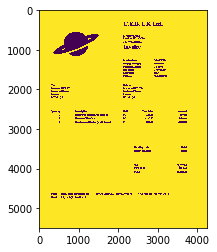

In [16]:
plt.imshow(pre)

In [20]:
lines = cv2.HoughLinesP(image=pre, rho=1, theta=np.pi / 180, threshold=100,minLineLength=100, maxLineGap=0)

In [21]:
for i in range(0, len(lines)):
    for x1, y1, x2, y2 in lines[i]:
        cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

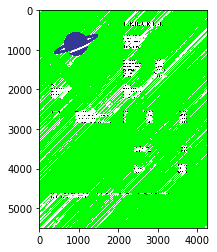

In [22]:
plt.imshow(img)

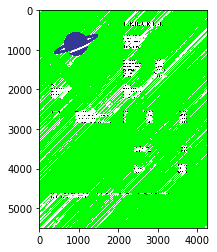

In [25]:
edges = cv2.Canny(pre, 80, 120)
lines = cv2.HoughLinesP(edges, 1, math.pi/2, 2, None, 30, 1);
for line in lines[0]:
    pt1 = (line[0],line[1])
    pt2 = (line[2],line[3])
    cv2.line(img, pt1, pt2, (0,0,255), 3)
plt.imshow(img)

# working with different tesseract parameters

In [17]:
from PIL import Image
import pytesseract
import argparse
import cv2
import os
from pdf2image import convert_from_path


In [80]:
text1 = pytesseract.image_to_string("../VIM/invoices/all/0118054857_1.jpg", lang='eng', config='--psm 1')
print(text1)
#text2 = pytesseract.image_to_string("GST_INVOICE3_1.jpg", lang='eng', config='--psm 4')

=)".
oF ;
‘ -

 

wil. ‘TAX INVOICE

(Issued under Rule 7 & Section 31 of CGST Act, 2017) ORIGINAL FOR RECIPIENT

AXIOM EV PRODUCTS PVT. LTD.

Plot No. 70,71, Road No. 3, Phase |, 1.D.A., Cherlapally, ® |
Hyderabad - 500 040, Telangana, India. Ir .
Tel : +91 40 2726 0555, Email :info@axiomevproducts.com -
5 ‘ we 2S
Website : www.axiomevproducts.com a
ae

CIN No. : U74900TG2012PTC084590 a
GSTINNo.  : 36AALCA1548D1ZV 11805485 /
PAN

: AALCA1548D
GST INVOICE NO. Invoice Date: 7
1300007708
Despatch Document No.
sememe |
GATI LTD

Date & Time of Issue of Invoice Motor Vehicle No.
24-09-2018 at 14:40:00 AP28U6915 |

Date & Time of Removal of Goods __| Gross Weight .
24-09-2018 at 18:00:00 97.50

Net Weight |
0.00

 

 

    

Consignee

AMARA RAJA BATTERIES LTD - Haryana
Village dhumaspur 165/2/2/2/2,9/11

  
   
    
     

Haryana 122102
India

  
 
    

Contact : Phn. No:
GSTI No: - State Code:06

Buyer (if Other than Consignee)

AMARA RAJA BATTERIES LTD - Haryana
Village dhumaspur 165/2

In [18]:
text3 = pytesseract.image_to_string("page_1.jpg", lang='eng', config='--psm 4')


In [19]:
print(text3)

C.E.B. UK Ltd.

3, Johnson Road
London, EC1V OBN

Tel: +44 20189291

Invoice

Invoice date: 28/08/2019
Invoice Number: GH12345
Payment Terms: 30 days
Due Date: 27/09/2019
Currency: GBP
PO No.: 4500000873
To: Ship to:
Innovate UK LTD. Innovate UK LTD.
Dashwood House Dashwood House
London London
EC2M 1QS EC2M 1QS
Quantity Description Unit Unit Price
2 Fingerprint Scanner Pro Sense X-I PC £34.50
5 Notebook WebCam PC £120.00
8 Touchscreen Display (Multi Touch) PC £51.00

Bank: — Royal Bank of Scotland Plc
Email: — http: info@ceb-online.uk

Handling costs

Freight expenses

Net

VAT 20 %
Total

IBAN: GB35CITI1 8500807678686

VAT Reg. No.: GB591819014

Amount
£69.00

£600.00
£408.00

£0.00
£0.00

£1,077.00
£215.40

£1,292.40


# Sample Invoices

In [2]:
text = pytesseract.image_to_string("../VIM/invoices/invoice-legend.png", lang='eng', config='--psm 4')
text1 = pytesseract.image_to_string("../VIM/invoices/invoice2png.png", lang='eng', config='--psm 4')
text2 = pytesseract.image_to_string("../VIM/invoices/invoice3.png", lang='eng', config='--psm 4')
text3 = pytesseract.image_to_string("../VIM/invoices/invoice4.png", lang='eng', config='--psm 4')
text4 = pytesseract.image_to_string("../VIM/invoices/invoice5.png", lang='eng', config='--psm 4')
text5 = pytesseract.image_to_string("../VIM/invoices/invoice6.png", lang='eng', config='--psm 4')
text6 = pytesseract.image_to_string("../VIM/invoices/invoice7.png", lang='eng', config='--psm 4')

In [4]:
print(text)

TWILIO

u™ SendGrid

1801 California Street, Suite 500
Denver, Colorado 80202
Phone: +1 (877) 969-8647

INVOICE

SOLDTO INVOICE SUMMARY BILLING OVERVIEW
Hot Moose Web Design Invoice Date: Aug 01, 2019 Sub-Total: $239.95
55 Moostache Tri., Invoice Number: INV04389745

Vamomoose, Colorado 80202 ‘Account Number: 9421 421 Tax: $4,71
United States Payment Terms: Due Upon Receipt

Balance Due: $244.66
anomymoose@hotmoose.com

 

CHARGE SUMMARY
Charge Name Description Service Period Subtotal Tax Total

Contact List Storage Contact list database usage for SendGrid 07/01/2019-07/31/2019 $10.00 $0.43 $10.43

Marketing Campaigns - $10 per 10k contacts
Email Testing Credits 30 additional Email Testing credits per 08/01/2019-08/31/2019 $18.00 $0.78 $18.78
- 30 Credits/Mo month, used for inbox rendering and spam.

testing,
Marketing Campaigns Includes 5,000 Marketing Campaigns 07/01/2019-07/31/2019 $4.00 $0.17 $417
Basic 5K contacts and 15,000 Marketing Campaigns

email credits per month. $0.004 per

In [19]:
print(text2)

East Repair Inc. INVOICE

1912 Harvest Lane
New York, NY 12210

Bill To Ship To Invoice # us-001
John Smith John Smith Invoice Date 1102/2019
2 Court Square 3787 Pineview Drive
New York, NY 12210 Cambridge, MA 12210 Poe 2312/2019
Due Date 26/02/2019
ary DESCRIPTION UNIT PRICE ‘AMOUNT
1 Front and rear brake cables 100.00 100.00
2 | New set of pedal arms 15.00 30.00
3° | Labor 3hrs 5.00 15.00
Subtotal 145.00
Sales Tax 6.25% 9.06
TOTAL $154.06
Terms & Conditions

Payment is due within 15 days

Please make checks payable to: East Repair Inc.


In [20]:
print(text3)

ZYLKAR CORPORATION PRO FORMA INVOICE
1561 Appleview Town Invoice: #00121
Bakers Street July 21,2015
Chicago, IL 60411

 

Bill to: Ship To: Shipping Details:

Alistair Burke Angeline Campbell Freight Type Air

1156 High Street 6040 Bandini Blvd Est Ship Date July 27, 2015

Santa Cruz, CA 95064 Los Angeles, CA 92061 Est Gross Weight 300 kg

800-555-0121 888-555-2235 Total Packages 10

ID Product Description Qty Unit Price Amount (in USD)

1 Ream of Paper 5 $50 $250.00

2 Desk 5 $100 $500.00

3 Windows Workstation 5 $1000 $5000.00

Thank you for your business ! Subtotal $5750.00
Tax Rate 5.00%
Freight $100.00
ate) <-||

Signature / Stamp

Place:

Date

Powered by (RX! Invoice


In [21]:
print(text4)

CREDIT NOTE

#CN-17

Credits Remaining

$562.750
Zylker
7455 Drew Court
White City
Kansas
66872
USA
270-510-0585

Bill To

Rob & Joe Traders

4141 Hacienda Drive

Pleasanton Credit Date : 29 Jun 2018

94588 CA .
USA Refi : 321014

 

1 Brochure Design 1.00 300,000 300.000
Brochure Design Single Sided Color

2 Web Design Packages(Template) - Basic 1,00 250.000 250.000
Custom Themes for your business. Inclusive of 10 hours of
marketing and annual training

3 Print Ad - Basic - Color 1.00 80.000 80.000
Print Ad 1/8 size Color

Sub Total 630.000

Sample Tax! (4.70%) 11.750
Sample Tax2 (7.00%) 21.000
Total $662.750

Credits Used (-) 100.000
Credits Remaining $562.750

Notes

Thanks for your business.

Terms & Conditions

Your company's Terms and Conditions will be displayed here. You can add it in the Credit notes Preferences page under Settings.


In [22]:
print(text5)

& Pay Invoice Online Download PDF Questions about this invoice? Contact us
Acme, Inc. Invoice Number #1785439
103 Majestic Way
Raleigh, NC 27606 Issue Date 2018-02-01

Due Date 2018-02-01

Bill To: jo} U) $210.07

Nathanael Erdman
75839 Nolan Crossroad
North Lethamouth, TX 78205

Item Quantity Unit Price ‘Amount

Pro! 1 $99.00 $99.00
02/01/2018 - 03/01/2018

IP Addresses 10 $1.00 $10.00
Minutes? 1398 $0.10 $139.80
Subtotal $248.80
Discount(s) Applied:
Discounts ($38.73)
1. 25% Off Plan Fee $24.75 Total $210.07
2. 10% Off Minutes $13.98
Paid $0.00
Due $210.07

Payment History


In [24]:
type(text4)

str

# Named entity Recognition

In [41]:
!pip install spacy

In [42]:
!python -m spacy download en_core_web_sm

  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.2.0-cp37-none-any.whl size=12019129 sha256=fca6d2510334b32016246682b50bd856d802a635cc7a6fe04cc4d7524ec073eb
  Stored in directory: C:\Users\RAJAT~1.CHA\AppData\Local\Temp\pip-ephem-wheel-cache-7pk6lebl\wheels\48\5c\1c\15f9d02afc8221a668d2172446dd8467b20cdb9aef80a172a4
Successfully built en-core-web-sm
  Found existing installation: en-core-web-sm 2.1.0
    Uninstalling en-core-web-sm-2.1.0:
      Successfully uninstalled en-core-web-sm-2.1.0
[+] Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')


In [68]:
!python -m spacy download en_core_web_md

  Created wheel for en-core-web-md: filename=en_core_web_md-2.2.0-cp37-none-any.whl size=98072938 sha256=cce1048767e955a61d9e3dae5de3d37b45f1754f2b3f2b5294f76c8c0bdcffee
  Stored in directory: C:\Users\RAJAT~1.CHA\AppData\Local\Temp\pip-ephem-wheel-cache-epn8x0i1\wheels\5f\3e\c9\36dd6e13b449fd84cd1f94b72dfbc559daf09f53dbf4e697a3
Successfully built en-core-web-md
[+] Download and installation successful
You can now load the model via spacy.load('en_core_web_md')


In [ ]:
!python -m spacy download en_core_web_lg

In [3]:
!python -m spacy link en_core_web_md en

symbolic link created for C:\D\Installations\Anaconda\lib\site-packages\spacy\data\en <<===>> C:\D\Installations\Anaconda\lib\site-packages\en_core_web_md
[+] Linking successful
C:\D\Installations\Anaconda\lib\site-packages\en_core_web_md -->
C:\D\Installations\Anaconda\lib\site-packages\spacy\data\en
You can now load the model via spacy.load('en')


In [1]:
from PIL import Image
import pytesseract
import argparse
import cv2
import os
from pdf2image import convert_from_path
import nltk
import spacy
from spacy.gold import GoldParse 
from spacy.language import EntityRecognizer 
from spacy import displacy

In [2]:
nlp = spacy.load('en_core_web_md') #en_core_web_sm

In [13]:
p=nlp(text1)

In [16]:
print(text1)

ABC AUTOMOTIVE PRODUCTS

GOLDEN INDUSTRIAL ESTATE - 1 PLOT NO 68 SHAPAR RAJKOT
EMAIL : abcautomotive@gmail.nom PHN : 02827 297236

Debit Memo TAX INVOICE Original

XYZ Global Pvt Ltd Invoice No. : MR109
AJI GIDC OPP SWAGAT WEIGH, BRIDGE GIDC "N" |Date : 06/12/2018

PLOT NO 346

RAJKOT - 360003 | PO NO. : 7445336989.01
Place of Supply : 24-Gujarat PO DATE. : 25/04/2018
GSTIN No. : 24AACCG 1233C1ZF

HSN/SAC GST %
CYLINDER LINER 5569 84199949 2106 28.00% 452790

CYLINDER LINER 5896 84099949 1670 28.00% 472610
GSTIN No : 24AAVFN2183P1Z1 3776 Sub Total 925400

Bank Name : STATE BANK OF INDIA
Bank A/C NO. : 32907101389
RTGS/1FSC Code : SBIN0060344

Taxable Amount 925400
CGST 14.00% 129556
Total GST : Two Lakh Fifty Nine Thousand One Hundred Twelve Only SCSI 14.00% 129556
Bill Amount : Eleven Lakh Eighty Four Thousand Five Hundred Twelve Only

Grand Total 11,84,512


In [14]:
displacy.render(p, style='ent', jupyter=True) 
for ent in p.ents:
    print(ent.text, ent.label_)

ABC AUTOMOTIVE PRODUCTS ORG
68 CARDINAL
297236 DATE
MR109
AJI GIDC OPP SWAGAT WEIGH ORG
346 CARDINAL
PO ORG
7445336989.01 CARDINAL
24-Gujarat CARDINAL
PO FAC
25/04/2018 DATE
24AACCG CARDINAL
28.00% PERCENT
452790 DATE
5896 84099949 DATE
1670 DATE
28.00% PERCENT
472610 DATE
24AAVFN2183P1Z1 3776 CARDINAL
STATE BANK OF INDIA
Bank A/C NO ORG
32907101389 CARDINAL
14.00% PERCENT
129556 DATE
Two CARDINAL
One Hundred CARDINAL
Only SCSI PERCENT
14.00% PERCENT
129556 DATE
Eleven CARDINAL


In [15]:
for q in p.ents: 
    print(q.text, q.start_char, q.end_char, q.label_)

ABC AUTOMOTIVE PRODUCTS 0 23 ORG
68 62 64 CARDINAL
297236 123 129 DATE
MR109
AJI GIDC OPP SWAGAT WEIGH 197 228 ORG
346 274 277 CARDINAL
PO 297 299 ORG
7445336989.01 306 319 CARDINAL
24-Gujarat 338 348 CARDINAL
PO 349 351 FAC
25/04/2018 360 370 DATE
24AACCG 383 390 CARDINAL
28.00% 449 455 PERCENT
452790 456 462 DATE
5896 84099949 479 492 DATE
1670 493 497 DATE
28.00% 498 504 PERCENT
472610 505 511 DATE
24AAVFN2183P1Z1 3776 523 543 CARDINAL
STATE BANK OF INDIA
Bank A/C NO 574 605 ORG
32907101389 609 620 CARDINAL
14.00% 678 684 PERCENT
129556 685 691 DATE
Two 704 707 CARDINAL
One Hundred 733 744 CARDINAL
Only SCSI 752 761 PERCENT
14.00% 762 768 PERCENT
129556 769 775 DATE
Eleven 790 796 CARDINAL


In [ ]:
nlp = spacy.load('en', entity = False, parser = False) 

doc_list = [] 
doc = nlp(text1) 
doc_list.append(p) 
gold_list = [] 
gold_list.append(GoldParse(p, [u'ANIMAL', u'O', u'O', u'O'])) 

ner = EntityRecognizer(nlp.vocab, entity_types = ['ANIMAL']) 
ner.update(doc_list, gold_list) 


# Custom NER tagging

In [2]:
from PIL import Image
import pytesseract
import argparse
import cv2
import os
from pdf2image import convert_from_path
import nltk
import spacy
from spacy.gold import GoldParse 
from spacy.language import EntityRecognizer 
from spacy import displacy
import pandas as pd
nlp = spacy.load('en_core_web_md')

In [62]:
pd.set_option('display.max_colwidth', -1)

NameError: name 'pd' is not defined

In [26]:
#nlp = spacy.load('en_core_web_lg')

In [71]:
text1 = pytesseract.image_to_string("../VIM/invoices/all/0117002202_2.jpg", lang='eng', config='--psm 6')

In [4]:
text = pytesseract.image_to_string("../VIM/invoices/invoice-legend.png", lang='eng', config='--psm 4')
#text1 = pytesseract.image_to_string("../VIM/invoices/invoice2png.png", lang='eng', config='--psm 4')
text2 = pytesseract.image_to_string("../VIM/invoices/invoice3.png", lang='eng', config='--psm 4')
text3 = pytesseract.image_to_string("../VIM/invoices/invoice4.png", lang='eng', config='--psm 4')
text4 = pytesseract.image_to_string("../VIM/invoices/invoice5.png", lang='eng', config='--psm 4')
text5 = pytesseract.image_to_string("../VIM/invoices/invoice6.png", lang='eng', config='--psm 4')
text6 = pytesseract.image_to_string("../VIM/invoices/invoice7.png", lang='eng', config='--psm 4')


In [72]:
print(text1)

' SHREENIDHI SHIPPING PVT LTD.,
SHIPPING CLEARING AND FORWARDING AGENT
No.1, ANGAPPA NAICKEN STREET,GROUND FLOOR
CHENNAI-600 001.Ph:044-25242393 Fax:044-43517120
S.T.REGN. NO.AASCS8890BSD001
INVOICE-EXPORT
PARTY:- M/s.Amararaja Batteries Ltd., Date 18.04.17
Renigunta Cuddapah Road, INVOICE NO}004/18.04.17
Karakambadi, tirupati. F.NO. 003/2016-17.
MATERIAL |BATTERIES No.Of cont |02x20'
INV.NO: 1700200005,007 / 04.04.17 CON.NO. |TCKU3252711,TCKU3333979
SB.NO: 5209093/04.04.17 PKg/PLT _|20 Pallets
INV.VALUE: |2,499,215.04 Gr.Wt 33106 KGS
‘ [Cleared on _|05.04.17
‘ or Re-Imburseble
1 CFS Charges (Rs.1840------CWC) 1,840.00
2 Fumigation Services Charges (Rs.100.00) 100.00
3 Certificate of orgin charges (Rs.150x1) 150.00
+ Transport Charges From Renigunta to Chennai (Rs.17570x2) 35,140.00
(Service Tax Payable by Consignee)
5 Documentation Charges 300.00
6 Customs Inspection/Examination Charges (Rs.600x02) 1200.00
7 Service Charges (Rs.1000x02) 2000.00
Total 37,230.00 3500.00
: Service Tax @ 

In [46]:
print(text)

SHREENIDHI SHIPPING PVT LTD.

SHIPPING CLEARING AND FORWARDING AGENT

/

No.1, ANGAPPA NAICKEN STREET,GROUND FLOOR

CHENNAI-600 001.Ph:044-25242393 Fax:044-43517120

S.T.REGN. NO.AASCS8890BSD001

INVOICE-EXPORT

Ono

+202

PARTY:-

M/s.Amararaja Batteries Ltd.,

Date

18.04.17

Renigunta Cuddapah Road,

INVOICE NO}004/18.04.17 #

Karakambadi, tirupati.

F.NO

003/2016-17.

MATERIAL

BATTERIES

No.Of cont

02x20'

INV.NO

1700200005,007 / 04.04.17

CON.NO

TCKU3252711,TCKU3333979

SB.NO

5209093/04.04.17

PKg/PLT

20 Pallets

INV.VALUE

2,499,215.04

Gr.Wt

33106 KGS

Cleared on

05.04.17

Re-Imburseble

Non Taxable

Re-Imburseble

amount

Taxable Amount

CFS Charges

(Rs.1840

Wieeeiord

CWC)

1,840.00

Fumigation Services Charges

(Rs.100.00)

100.00

Certificate of orgin charges

(Rs.150x1)

150.00

Bwn

Transport Charges From Renigunta to Chennai

(Rs.17570x2)

35,140.00

(Service Tax Payable by Consignee)

Documentation Charges

300.00

an

Customs Inspection/Examination Charges

(

In [27]:
p=nlp(text)
for ent in p.ents:
    print(ent.text)

AMARA RAJA
INDIA
Amara Raja Batteries Ltd


04
4
Karakambadi Tirupathi

Buyer's
Pradesh
INDIA.,517520
17.02.2017

Tel
0877-2285600


Consignee


Consignee


NW BATTERIEN
NW BATTERIEN
53
Ubi Ave 1,#03-39 &


Ubi Ave 1,#03-39 &


03
Ubi Industrial Park


408934
Singapore
Ubi Industrial Park


408934
Singapore
Singapore
CFR Singapore


CFR
singapore
100%Payment.40daysafterDateofBillofLading
BNP PARIBAS
Tren


2
Banjara Hills
Hyderabad
034
INDIA
Kattupalli


Singapore
Singapore
Amara Raja Batteries Ltd.
Wooden Pallets Stuffed
1x20
India
9,384.96
36
02.2017
AMAR




In [29]:
p=nlp(text)
for ent in p.ents:
    print(ent.text)#+"  "+ ent.label_)

DV sonnson Wi AMARA RAJA
3 o £
TIN
Pradesh
INDIA.,517520 P.O
17.02.2017
0877-2285600
Consignee
NW BATTERIEN
NW BATTERIEN
53
Ubi Ave 1,#03-39 &

53
Ubi Ave 1,#03-
Ubi Industrial Park
#03
Ubi Industrial Park 408934
Singapore
408934
Singapore
Singapore

‘Terms of Delivery &
CFR Singapore

CFR singapore
100%Payment.40daysafterDateofBillofLading
BNP pareattegiee
101,Ground
2
Banjara Hills
Hyderabad
5Q0
034
INDIA
10572300136
Amara Raja Batteries Ltd.
Wooden Pallets Stuffed
1x20
India
12VMF(WET)LeadAcidAmaron-

1000

9,384.96

1,280
26.70
NA LC Date:
NINETY-SIX CENTS
1600800842
02.2017


In [ ]:
for doc in nlp.pipe(text3, disable=["tagger", "parser"]):
    # Do something with the doc here
    print([(ent.text, ent.label_) for ent in doc.ents])

In [22]:
docs = list(nlp.pipe(text))[0]

In [ ]:
docs

In [12]:
# Convert .tsv file to dataturks json format. 
import json
import logging
import sys
def tsv_to_json_format(input_path,output_path,unknown_label):
    try:
        f=input_path#f=open(input_path,'r') # input file
        fp=open(output_path, 'w') # output file
        data_dict={}
        annotations =[]
        label_dict={}
        s=''
        start=0
        for line in f:
            if line[0:len(line)-1]!='.\tO':
                word=line.split('\t')
                s+=word+" "
                entity=entity[:len(entity)-1]
                if entity!=unknown_label:
                    if len(entity) != 1:
                        d={}
                        d['text']=word
                        d['start']=start
                        d['end']=start+len(word)-1  
                        try:
                            label_dict[entity].append(d)
                        except:
                            label_dict[entity]=[]
                            label_dict[entity].append(d) 
                start+=len(word)+1
            else:
                data_dict['content']=s
                s=''
                label_list=[]
                for ents in list(label_dict.keys()):
                    for i in range(len(label_dict[ents])):
                        if(label_dict[ents][i]['text']!=''):
                            l=[ents,label_dict[ents][i]]
                            for j in range(i+1,len(label_dict[ents])): 
                                if(label_dict[ents][i]['text']==label_dict[ents][j]['text']):  
                                    di={}
                                    di['start']=label_dict[ents][j]['start']
                                    di['end']=label_dict[ents][j]['end']
                                    di['text']=label_dict[ents][i]['text']
                                    l.append(di)
                                    label_dict[ents][j]['text']=''
                            label_list.append(l)                          
                            
                for entities in label_list:
                    label={}
                    label['label']=[entities[0]]
                    label['points']=entities[1:]
                    annotations.append(label)
                data_dict['annotation']=annotations
                annotations=[]
                json.dump(data_dict, fp)
                fp.write('\n')
                data_dict={}
                start=0
                label_dict={}
    except Exception as e:
        logging.exception("Unable to process file" + "\n" + "error = " + str(e))
        return None

In [13]:
tsv_to_json_format(text,'ner_corpus_260.json','abc')

ERROR:root:Unable to process file
error = can only concatenate list (not "str") to list
Traceback (most recent call last):
  File "<ipython-input-12-e6883c752453>", line 17, in tsv_to_json_format
    s+=word+" "
TypeError: can only concatenate list (not "str") to list


In [11]:
for line in text:
    if line[0:len(line)-1]!='.\tO':
        word=line.split('\t')
        s+=word+" "
        #entity=entity[:len(entity)-1]
        if entity!=unknown_label:
            if len(entity) != 1:
                d={}
                d['text']=word
                d['start']=start
                d['end']=start+len(word)-1  
                try:
                    label_dict[entity].append(d)
                except:
                    label_dict[entity]=[]
                    label_dict[entity].append(d) 
        start+=len(word)+1

ValueError: not enough values to unpack (expected 2, got 1)

In [2]:
nlp = spacy.blank('en')  # create blank Language class
print("Created blank 'en' model")
ner = nlp.create_pipe('ner')
nlp.add_pipe(ner)

Created blank 'en' model


In [ ]:
# Add new entity labels to entity recognizer
for i in LABEL:
    ner.add_label(i)
# Inititalizing optimizer
if model is None:
    optimizer = nlp.begin_training()
else:
    optimizer = nlp.entity.create_optimizer()

In [ ]:
#def main(model=None, new_model_name='new_model', output_dir=None, n_iter=10):
"""Setting up the pipeline and entity recognizer, and training the new entity."""
if model is not None:
    nlp = spacy.load(model)  # load existing spacy model
    print("Loaded model '%s'" % model)
else:
    nlp = spacy.blank('en')  # create blank Language class
    print("Created blank 'en' model")
if 'ner' not in nlp.pipe_names:
    ner = nlp.create_pipe('ner')
    nlp.add_pipe(ner)
else:
    ner = nlp.get_pipe('ner')

for i in LABEL:
    ner.add_label(i)   # Add new entity labels to entity recognizer

if model is None:
    optimizer = nlp.begin_training()
else:
    optimizer = nlp.entity.create_optimizer()

# Get names of other pipes to disable them during training to train only NER
other_pipes = [pipe for pipe in nlp.pipe_names if pipe != 'ner']
with nlp.disable_pipes(*other_pipes):  # only train NER
    for itn in range(n_iter):
        random.shuffle(TRAIN_DATA)
        losses = {}
        batches = minibatch(TRAIN_DATA, size=compounding(4., 32., 1.001))
        for batch in batches:
            texts, annotations = zip(*batch)
            nlp.update(texts, annotations, sgd=optimizer, drop=0.35,
                       losses=losses)
        print('Losses', losses)

# Test the trained model
test_text = 'Gianni Infantino is the president of FIFA.'
doc = nlp(test_text)
print("Entities in '%s'" % test_text)
for ent in doc.ents:
    print(ent.label_, ent.text)

# Save model 
if output_dir is not None:
    output_dir = Path(output_dir)
    if not output_dir.exists():
        output_dir.mkdir()
    nlp.meta['name'] = new_model_name  # rename model
    nlp.to_disk(output_dir)
    print("Saved model to", output_dir)

    # Test the saved model
    print("Loading from", output_dir)
    nlp2 = spacy.load(output_dir)
    doc2 = nlp2(test_text)
    for ent in doc2.ents:
        print(ent.label_, ent.text)

In [ ]:
from spacy.strings import StringStore

animal_hash = StringStore([u'ANIMAL']) # <-- match id
nlp.vocab.strings.add('ANIMAL')

In [111]:
class CustomEntityRecognizer(object):
    """Example of a spaCy v2.0 pipeline component that sets entity annotations
    based on list of single or multiple-word company names. Companies are
    labelled as ORG and their spans are merged into one token. Additionally,
    ._.has_tech_org and ._.is_tech_org is set on the Doc/Span and Token
    respectively."""

    name = "Invoices"  # component name, will show up in the pipeline

    def __init__(self, nlp,entity, customEntity=tuple(), label="INV"): #def __init__(self, nlp,entity, customEntity=tuple(), label="INV"):
        """Initialise the pipeline component. The shared nlp instance is used
        to initialise the matcher with the shared vocab, get the label ID and
        generate Doc objects as phrase match patterns.
        """
        self.label = nlp.vocab.strings[label]  # get entity label ID
        #print("check this ",customEntity)
        # Set up the PhraseMatcher – it can now take Doc objects as patterns,
        # so even if the list of companies is long, it's very efficient
        
        #print("INVOICE DD - ",invoice)
        patterns = [nlp.make_doc(ent) for ent in customEntity]
        #print("patterns - ",patterns)
        self.matcher = PhraseMatcher(nlp.vocab)
        self.matcher.add(entity, None, *patterns)
        #matcher.add()
        # Register attribute on the Token. We'll be overwriting this based on
        # the matches, so we're only setting a default value, not a getter.
        Token.set_extension("is_invoice", default=False, force=True)

        # Register attributes on Doc and Span via a getter that checks if one of
        # the contained tokens is set to is_tech_org == True.
        Doc.set_extension("has_invoice", getter=self.has_invoice, force=True)
        Span.set_extension("has_invoice", getter=self.has_invoice, force=True)

    def __call__(self, doc):
        """Apply the pipeline component on a Doc object and modify it if matches
        are found. Return the Doc, so it can be processed by the next component
        in the pipeline, if available.
        """
        matches = self.matcher(doc)
        spans = []  # keep the spans for later so we can merge them afterwards
        for _, start, end in matches:
            # Generate Span representing the entity & set label
            entity = Span(doc, start, end, label=self.label)
            spans.append(entity)
            # Set custom attribute on each token of the entity
            for token in entity:
                token._.set("is_invoice", True)
            # Overwrite doc.ents and add entity – be careful not to replace!
            doc.ents = list(doc.ents) + [entity]
        for span in spans:
            # Iterate over all spans and merge them into one token. This is done
            # after setting the entities – otherwise, it would cause mismatched
            # indices!
            span.merge()
        return doc  # don't forget to return the Doc!

    def has_invoice(self, tokens):
        """Getter for Doc and Span attributes. Returns True if one of the tokens
        is a tech org. Since the getter is only called when we access the
        attribute, we can refer to the Token's 'is_tech_org' attribute here,
        which is already set in the processing step."""
        return any([t._.get("is_invoice") for t in tokens])

In [112]:
#!/usr/bin/env python
# coding: utf8
"""Example of a spaCy v2.0 pipeline component that sets entity annotations
based on list of single or multiple-word company names. Companies are
labelled as ORG and their spans are merged into one token. Additionally,
._.has_tech_org and ._.is_tech_org is set on the Doc/Span and Token
respectively.

* Custom pipeline components: https://spacy.io//usage/processing-pipelines#custom-components

Compatible with: spaCy v2.0.0+
Last tested with: v2.1.0
"""
from __future__ import unicode_literals, print_function

import plac
from spacy.lang.en import English
from spacy.matcher import PhraseMatcher,Matcher
from spacy.pipeline import EntityRuler
from spacy.tokens import Doc, Span, Token


@plac.annotations(
    #text=("Text to process", "positional", None, str),
    #companies=("Names of technology companies", "positional", None, str),
)
def main(text=text1, *customEntity):
    # For simplicity, we start off with only the blank English Language class
    # and no model or pre-defined pipeline loaded.
    nlp = spacy.load('en_core_web_md')
    #if not invoice:  # set default companies if none are set via args
    #entityData = ["GH12345", "INV012021", "MR109", "TG162","134/18-19","33/IPI/103","INVOICE NO","Invoice Number","Invoice No","INVOICE NO}006/20.08.19","INVOICE"]  # etc.
    entityData = ["Swachh Bharat Cess","Krishi Kalyan Cess","Service Tax","INVOICE NO}"]
    #entityData = [{"INV":"INVOICE"},{"INV":"NO"},{"INV":"}"},{}]
    component = CustomEntityRecognizer(nlp,"Taxes",entityData, "TAX")  # initialise component
    nlp.add_pipe(component, last=True)  # add last to the pipeline

    p = nlp(text1)
    print("Pipeline", nlp.pipe_names)  # pipeline contains component name
    print("Tokens", [t.text for t in p])  # custom entity names from the list are merged
    #print("Doc has_invoice", doc._.has_invoice)  # Doc contains custom entities
    #print("Token 0 is_invoice", doc[0]._.is_invoice)  # "INV012021" is a Invoice number
    #print("Token 1 is_invoice", doc[1]._.is_invoice)  # "is" is not
    #print("Entities", [(e.text, e.label_) for e in doc.ents])  # all invoice are entities
    #p=nlp(text7)
    for ent in p.ents:
        print(ent.text, ent.label_)
if __name__ == "__main__":
    plac.call(main)

    # Expected output:
    # Pipeline ['tech_companies']
    # Tokens ['Alphabet Inc.', 'is', 'the', 'company', 'behind', 'Google', '.']
    # Doc has_tech_org True
    # Token 0 is_tech_org True
    # Token 1 is_tech_org False
    # Entities [('Alphabet Inc.', 'ORG'), ('Google', 'ORG')]

Pipeline ['tagger', 'parser', 'ner', 'Invoices']
Tokens ["'", 'SHREENIDHI', 'SHIPPING', 'PVT', 'LTD', '.', ',', '\n', 'SHIPPING', 'CLEARING', 'AND', 'FORWARDING', 'AGENT', '\n', 'No.1', ',', 'ANGAPPA', 'NAICKEN', 'STREET', ',', 'GROUND', 'FLOOR', '\n', 'CHENNAI-600', '001.Ph:044', '-', '25242393', 'Fax:044', '-', '43517120', '\n', 'S.T.REGN', '.', 'NO.AASCS8890BSD001', '\n', 'INVOICE', '-', 'EXPORT', '\n', 'PARTY:-', 'M', '/', 's', '.', 'Amararaja', 'Batteries', 'Ltd.', ',', 'Date', '18.04.17', '\n', 'Renigunta', 'Cuddapah', 'Road', ',', 'INVOICE', 'NO}004/18.04.17', '\n', 'Karakambadi', ',', 'tirupati', '.', 'F.NO', '.', '003/2016', '-', '17', '.', '\n', 'MATERIAL', '|BATTERIES', 'No', '.', 'Of', 'cont', '|02x20', "'", '\n', 'INV.NO', ':', '1700200005,007', '/', '04.04.17', 'CON.NO', '.', '|TCKU3252711,TCKU3333979', '\n', 'SB.NO', ':', '5209093/04.04.17', 'PKg', '/', 'PLT', '_', '|20', 'Pallets', '\n', 'INV.VALUE', ':', '|2,499,215.04', 'Gr', '.', 'Wt', '33106', 'KGS', '\n', '‘', '[',

In [8]:
class CustomEntityTokenMatcher(object):
    """Example of a spaCy v2.0 pipeline component that sets entity annotations
    based on list of single or multiple-word company names. Companies are
    labelled as ORG and their spans are merged into one token. Additionally,
    ._.has_tech_org and ._.is_tech_org is set on the Doc/Span and Token
    respectively."""

    name = "Invoices"  # component name, will show up in the pipeline

    def __init__(self, nlp,entity, customEntity, label="INV"): #def __init__(self, nlp,entity, customEntity=tuple(), label="INV"):
        """Initialise the pipeline component. The shared nlp instance is used
        to initialise the matcher with the shared vocab, get the label ID and
        generate Doc objects as phrase match patterns.
        """
        self.label = nlp.vocab.strings[label]  # get entity label ID
        #print("check this ",customEntity)
        # Set up the PhraseMatcher – it can now take Doc objects as patterns,
        # so even if the list of companies is long, it's very efficient
        
        #print("INVOICE DD - ",invoice)
        #patterns = [nlp.make_doc(ent) for ent in customEntity]
        #print("patterns - ",patterns)
        self.matcher = Matcher(nlp.vocab)
        self.matcher.add(entity, None, *customEntity)
        #matcher.add()
        # Register attribute on the Token. We'll be overwriting this based on
        # the matches, so we're only setting a default value, not a getter.
        Token.set_extension("is_invoice", default=False, force=True)

        # Register attributes on Doc and Span via a getter that checks if one of
        # the contained tokens is set to is_tech_org == True.
        Doc.set_extension("has_invoice", getter=self.has_invoice, force=True)
        Span.set_extension("has_invoice", getter=self.has_invoice, force=True)

    def __call__(self, doc):
        """Apply the pipeline component on a Doc object and modify it if matches
        are found. Return the Doc, so it can be processed by the next component
        in the pipeline, if available.
        """
        matches = self.matcher(doc)
        spans = []  # keep the spans for later so we can merge them afterwards
        for _, start, end in matches:
            # Generate Span representing the entity & set label
            entity = Span(doc, start, end, label=self.label)
            spans.append(entity)
            # Set custom attribute on each token of the entity
            for token in entity:
                token._.set("is_invoice", True)
            # Overwrite doc.ents and add entity – be careful not to replace!
            doc.ents = list(doc.ents) + [entity]
        for span in spans:
            # Iterate over all spans and merge them into one token. This is done
            # after setting the entities – otherwise, it would cause mismatched
            # indices!
            span.merge()
        return doc  # don't forget to return the Doc!

    def has_invoice(self, tokens):
        """Getter for Doc and Span attributes. Returns True if one of the tokens
        is a tech org. Since the getter is only called when we access the
        attribute, we can refer to the Token's 'is_tech_org' attribute here,
        which is already set in the processing step."""
        return any([t._.get("is_invoice") for t in tokens])

In [11]:
#!/usr/bin/env python
# coding: utf8
"""Example of a spaCy v2.0 pipeline component that sets entity annotations
based on list of single or multiple-word company names. Companies are
labelled as ORG and their spans are merged into one token. Additionally,
._.has_tech_org and ._.is_tech_org is set on the Doc/Span and Token
respectively.

* Custom pipeline components: https://spacy.io//usage/processing-pipelines#custom-components

Compatible with: spaCy v2.0.0+
Last tested with: v2.1.0
"""
from __future__ import unicode_literals, print_function

import plac
from spacy.lang.en import English
from spacy.matcher import PhraseMatcher,Matcher
from spacy.pipeline import EntityRuler
from spacy.tokens import Doc, Span, Token


@plac.annotations(
    #text=("Text to process", "positional", None, str),
    #companies=("Names of technology companies", "positional", None, str),
)
def main(text=psm6[0], *customEntity):
    # For simplicity, we start off with only the blank English Language class
    # and no model or pre-defined pipeline loaded.
    nlp = spacy.load('en_core_web_md')
    #if not invoice:  # set default companies if none are set via args
    #entityData = ["GH12345", "INV012021", "MR109", "TG162","134/18-19","33/IPI/103","INVOICE NO","Invoice Number","Invoice No","INVOICE NO}006/20.08.19","INVOICE"]  # etc.
    entityData = [[{"ORTH": "Ph"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            
            #space and mobile pattern
            [{"ORTH": "Ph"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            
            #No space landline pattern
            [ {"ORTH":{"REGEX":"(Ph:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [ {"ORTH":{"REGEX":"(Phone:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [ {"ORTH":{"REGEX":"(Tel:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            
            #No space landline pattern2
            #[{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},  {"ORTH":{"REGEX":"\d"}}],
            
            
            #No space mobile pattern
            [ {"ORTH":{"REGEX":"(Ph:\d)"}}],
            [ {"ORTH":{"REGEX":"(Phone:\d)"}}],
            [ {"ORTH":{"REGEX":"(Tel:\d)"}}]]
    #entityData = [{"INV":"INVOICE"},{"INV":"NO"},{"INV":"}"},{}]
    component = CustomEntityTokenMatcher(nlp,"Phone",entityData, "Phone")  # initialise component
    nlp.add_pipe(component, last=True)  # add last to the pipeline

    p = nlp(psm6[0])
    print("Pipeline", nlp.pipe_names)  # pipeline contains component name
    print("Tokens", [t.text for t in p])  # custom entity names from the list are merged
    #print("Doc has_invoice", doc._.has_invoice)  # Doc contains custom entities
    #print("Token 0 is_invoice", doc[0]._.is_invoice)  # "INV012021" is a Invoice number
    #print("Token 1 is_invoice", doc[1]._.is_invoice)  # "is" is not
    #print("Entities", [(e.text, e.label_) for e in doc.ents])  # all invoice are entities
    #p=nlp(text7)
    for ent in p.ents:
        print(ent.text, ent.label_)
if __name__ == "__main__":
    plac.call(main)

    # Expected output:
    # Pipeline ['tech_companies']
    # Tokens ['Alphabet Inc.', 'is', 'the', 'company', 'behind', 'Google', '.']
    # Doc has_tech_org True
    # Token 0 is_tech_org True
    # Token 1 is_tech_org False
    # Entities [('Alphabet Inc.', 'ORG'), ('Google', 'ORG')]

ValueError: [E103] Trying to set conflicting doc.ents: '(23, 24, 'Phone')' and '(23, 26, 'Phone')'. A token can only be part of one entity, so make sure the entities you're setting don't overlap.

# 3b Custom NER Tagging

In [113]:
from spacy.pipeline import EntityRuler

nlp = spacy.load("en_core_web_sm")
ruler = EntityRuler(nlp, validate=True)
patterns = [{"label": "ORG", "pattern": ["GH12345", "INV012021", "MR109", "TG162","134/18-19","33/IPI/103","INVOICE NO","Invoice Number","Invoice No","INVOICE NO}006/20.08.19","INVOICE"]}]
ruler.add_patterns(patterns)

nlp.add_pipe(ruler)

doc = nlp(text1)
print([(ent.text, ent.label_) for ent in doc.ents])

MatchPatternError: Invalid token patterns for matcher rule 'ORG'

Pattern 0:
- 'GH12345' is not of type 'object' [0]
- 'INV012021' is not of type 'object' [1]
- 'MR109' is not of type 'object' [2]
- 'TG162' is not of type 'object' [3]
- '134/18-19' is not of type 'object' [4]
- '33/IPI/103' is not of type 'object' [5]
- 'INVOICE NO' is not of type 'object' [6]
- 'Invoice Number' is not of type 'object' [7]
- 'Invoice No' is not of type 'object' [8]
- 'INVOICE NO}006/20.08.19' is not of type 'object' [9]
- 'INVOICE' is not of type 'object' [10]


In [114]:
matcher = PhraseMatcher(nlp.vocab, attr="SHAPE")
matcher.add("INV", None,nlp("GH12345"), nlp("INV012021"), nlp("MR109"), nlp("TG162"),nlp("134/18-19"),nlp("33/IPI/103"),nlp("INVOICE NO"),nlp("Invoice Number"),nlp("Invoice No"),nlp("INVOICE NO}006/20.08.19"),nlp("INVOICE"))

doc = nlp(text1)
for match_id, start, end in matcher(doc):
    print("Matched based on token shape:", doc[start:end])

Matched based on token shape: SHREENIDHI
Matched based on token shape: SHIPPING
Matched based on token shape: SHIPPING
Matched based on token shape: CLEARING
Matched based on token shape: FORWARDING
Matched based on token shape: AGENT
Matched based on token shape: ANGAPPA
Matched based on token shape: NAICKEN
Matched based on token shape: STREET
Matched based on token shape: GROUND
Matched based on token shape: FLOOR
Matched based on token shape: INVOICE
Matched based on token shape: EXPORT
Matched based on token shape: Amararaja Batteries
Matched based on token shape: Renigunta Cuddapah
Matched based on token shape: INVOICE
Matched based on token shape: INVOICE NO}004/18.04.17
Matched based on token shape: MATERIAL
Matched based on token shape: Fumigation Services
Matched based on token shape: Services Charges
Matched based on token shape: Transport Charges
Matched based on token shape: Documentation Charges
Matched based on token shape: Customs Inspection
Matched based on token shape

In [118]:
from spacy.pipeline import EntityRuler

nlp = spacy.load("en_core_web_sm")
ruler = EntityRuler(nlp, validate = True)
patterns = [{"label": "ORG", "pattern": [["GH12345", "INV012021", "MR109", "TG162","134/18-19","33/IPI/103","INVOICE NO","Invoice Number","Invoice No","INVOICE"]]}]
ruler.add_patterns(patterns)
nlp.add_pipe(ruler)

doc = nlp(text1)
print([(ent.text, ent.label_) for ent in doc.ents])

MatchPatternError: Invalid token patterns for matcher rule 'ORG'

Pattern 0:
- ['GH12345', 'INV012021', 'MR109', 'TG162', '134/18-19', '33/IPI/103', 'INVOICE NO', 'Invoice Number', 'Invoice No', 'INVOICE'] is not of type 'object' [0]


In [119]:
a={"a":"bb","b":"aa"}

In [120]:
for b in a:
    print(b)

a
b


In [137]:
import spacy.util

In [123]:
"""def filter_spans(spans):
    # Filter a sequence of spans so they don't contain overlaps
    # For spaCy 2.1.4+: this function is available as spacy.util.filter_spans()
    get_sort_key = lambda span: (span.end - span.start, -span.start)
    sorted_spans = sorted(spans, key=get_sort_key, reverse=True)
    result = []
    seen_tokens = set()
    for span in sorted_spans:
        # Check for end - 1 here because boundaries are inclusive
        if span.start not in seen_tokens and span.end - 1 not in seen_tokens:
            result.append(span)
        seen_tokens.update(range(span.start, span.end))
    result = sorted(result, key=lambda span: span.start)
    return result"""

In [121]:
def extract_currency_relations(doc):
    # Merge entities and noun chunks into one token
    spans = list(doc.ents) + list(doc.noun_chunks)
    spans = filter_spans(spans)
    with doc.retokenize() as retokenizer:
        for span in spans:
            retokenizer.merge(span)

    relations = []
    for money in filter(lambda w: w.ent_type_ == "MONEY", doc):
        if money.dep_ in ("attr", "dobj"):
            subject = [w for w in money.head.lefts if w.dep_ == "nsubj"]
            if subject:
                subject = subject[0]
                relations.append((subject, money))
        elif money.dep_ == "pobj" and money.head.dep_ == "prep":
            relations.append((money.head.head, money))
    return relations

In [136]:
nlp = spacy.load("en_core_web_md")

[]


In [ ]:
doc = nlp(text1)
#print(doc)
relations = extract_currency_relations(doc)
print(relations)
for r1, r2 in relations:
    print("2")
    print("{:<10}\t{}\t{}".format(r1.text, r2.ent_type_, r2.text))

# Data Processing

In [1]:
from PIL import Image
import pytesseract
import argparse
import cv2
import os
from pdf2image import convert_from_path
import nltk
import spacy
from spacy.gold import GoldParse 
from spacy.language import EntityRecognizer 
from spacy import displacy
import pandas as pd
import plac
from spacy.lang.en import English
from spacy.matcher import PhraseMatcher,Matcher
from spacy.pipeline import EntityRuler
from spacy.tokens import Doc, Span, Token
import regex as re
nlp = spacy.load('en_core_web_md')

In [25]:
!pip install regex

In [467]:
data=pd.read_csv('../VIM/data3.csv')

In [447]:
newdata=pd.read_csv('../VIM/newdata.csv')

In [3]:
psm4=data.iloc[0:,1:2]
psm4=list(psm4.Text)

In [468]:
psm6=data.iloc[0:,1:]
psm6=list(psm6.Text3)

In [448]:
newpsm6=newdata.iloc[0:,1:]
newpsm6=list(newpsm6.Text)

In [449]:
testInv=pytesseract.image_to_string('../VIM/invoices/GST_INVOICE6_1_1.jpg', lang='eng', config='--psm 4')

In [81]:
psm6[0:100]

["i SHREENIDHI SHIPPING PVT LTD.\nSHIPPING CLEARING AND FORWARDING AGENT\nNo.1, ANGAPPA NAICKEN STREET,GROUND FLOOR\nCHENNAI-600 001.Ph:044-25242393 Fax:044-43517120\nS.T.REGN. NO.AASCS8890BSD001\nINVOICE-EXPORT\n©1130 92202\nPARTY:- — |M/s.Amararaja Batteries Ltd., Date 18.04.17\nRenigunta Cuddapah Road, INVOICE NO|004/18.04.17 4\nKarakambadi, tirupati. F.NO. 003/2016-17.\nMATERIAL |BATTERIES No.Of cont |02x20'\nINV.NO: 1700200005,007 / 04.04.17 CON.NO. |TCKU3252711,TCKU3333979\nSB.NO: 5209093/04.04.17 PKg/PLT 20 Pallets\nINV.VALUE: |2,499,215.04 Gr.Wt 33106 KGS\nCleared on {05.04.17\nRe-Imburseble\namount\n1 CFS Charges (Rs.1840------CWC) 1,840.00\n2 Fumigation Services Charges (Rs.100.00) 100.00\n3 Certificate of orgin charges (Rs.150x1) 150.00\n4 Transport Charges From Renigunta to Chennai (Rs.17570x2) 35,140.00\n(Service Tax Payable by Consignee)\n5 Documentation Charges 300.00\n6 Customs Inspection/Examination Charges (Rs.600x02) 1200.00\n7 Service Charges (Rs.1000x02) 2000.00\nT

In [14]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("invoice", None, 
            [{"ORTH": "INVOICE"}, {}]
           )

#"Ph:044-25242393 Ph: 044-25242393 Phone: 08772224266 Tel: 04424493550 Phone: +91 - 44 - 2716 8064 Tel: 044 - 3797 3797"
doc = nlp("INVOICE NO|004/18.04.17")
matches = matcher(doc)
print("Tokens", [t.text for t in doc])
spans=[]
for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    spans.append(span.text)
    print(string_id, span.text)

#print(max(spans))

Tokens ['INVOICE', 'NO|004/18.04.17']
invoice INVOICE NO|004/18.04.17


In [14]:
#Token Matcher for Phone with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Phone")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("Phone", None, 
           
            #space and std landline pattern
            [{"ORTH": "Ph"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            
            #space and mobile pattern
            [{"ORTH": "Ph"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            
            #No space landline pattern
            [ {"ORTH":{"REGEX":"(Ph:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [ {"ORTH":{"REGEX":"(Phone:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [ {"ORTH":{"REGEX":"(Tel:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            
            #No space landline pattern2
            [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},  {"ORTH":{"REGEX":"\d"}}],
            
            
            #No space mobile pattern
            [ {"ORTH":{"REGEX":"(Ph:\d)"}}],
            [ {"ORTH":{"REGEX":"(Phone:\d)"}}],
            [ {"ORTH":{"REGEX":"(Tel:\d)"}}]
            
            
            
           )
#"Ph:044-25242393 Ph: 044-25242393 Phone: 08772224266 Tel: 04424493550 Phone: +91 - 44 - 2716 8064 Tel: 044 - 3797 3797"
doc = nlp(str(psm6[44]))
matches = matcher(doc)
#print("Tokens", [t.text for t in doc])
spans=[]
for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    spans.append(span.text)
    #print(match_id, string_id, start, end, span.text)

print(max(spans))

Tel: 044 - 3797 3797


In [25]:
#PhraseMatcher with Shape for Phone
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Phone")
    #doc.ents += (entity,)
    #print(entity.text)
    
matcher = PhraseMatcher(nlp.vocab, attr="SHAPE")
matcher.add("Phone", add_event_ent, nlp("Tel:+91 - 44 - 2716 8064"), nlp("Fax+91 - 44 - 2716 8064"), nlp("Phone:+91 - 44 - 2716 8064"), nlp("ph:+91 - 44 - 2716 8064"), nlp("+91 - 44 - 2716 8064"), 
            nlp("Tel:044 - 3797 3797"), nlp("Fax:044 - 3797 3797"),nlp("Phone:044 - 3797 3797"),nlp("Ph:044 - 3797 3797"),nlp("044 - 3797 3797"),
            nlp("001.Ph:044-25242393"), nlp("Tel: 08772224266"),nlp("Ph: 08772224266"),nlp("Phone: 08772224266"))#,nlp("08772224266")
b=0
for d,a in enumerate(psm6):
    doc = nlp(str(a))
    for match_id, start, end in matcher(doc):
        print("Matched based on token shape:",d, doc[start:end])
        b+=1
print(b)

Matched based on token shape: 0 001.Ph:044-25242393
Matched based on token shape: 1 Fax: 0877
Matched based on token shape: 6 001.Ph:044-25242393
Matched based on token shape: 13 Fax: 0877
Matched based on token shape: 14 001.Ph:044-25242393
Matched based on token shape: 16 Fax: 0877
Matched based on token shape: 17 No : 5258043
Matched based on token shape: 18 No : 5258043
Matched based on token shape: 19 No : 5258043
Matched based on token shape: 20 No : 5256043
Matched based on token shape: 21 No : 5256043
Matched based on token shape: 22 No : 5258043
Matched based on token shape: 24 No : 5258043
Matched based on token shape: 25 001.Ph:044-25242393
Matched based on token shape: 26 Ph: 22452933
Matched based on token shape: 33 001.Ph:044-25242393
Matched based on token shape: 37 Details : 0988006723
Matched based on token shape: 37 Amount: 0400
Matched based on token shape: 38 Details : 0788006723
Matched based on token shape: 39 001.Ph:044-25242393
Matched based on token shape: 44 0

In [220]:
testInv

'Phone: (+1) 8884635254\nTo,\nCanadian Legal Entity Date & Time of Removal 21/11/19 10:39\n545 Robon St, Order No : 4500015190 Date: 12/11/2019\nVancouver BC - V6B2B7, Canada Transport: TRUCK Lr. No:\nPh NO: (+1) 8885698957 Vehicle No: GJ-10U-6948\nVAT No : 24AACCG1322CIZF Total Box: LOOSE LR. No:\noP\nBank Details:\nTHE CO-OPERATIVE BANK OF RAJKOT LTD.\nA/C NO: 0009120100000226 IFSC CODE: YESBORAJ009\nBRANCH: NASANWAD1 MAIN ROAD, RAJKOT\nSub Total 5,000.00\nVAT 1,400.00\nGST Taxable |SGST |SGST CGST CGST {Total GST\nSummay | Amom [~~ [anoun_| “| noun [on\nGST @ 5,000 14 700 14 700 1,400\n28.00%\nmee'

# 1 Bank Details - O need to tune to lower

In [154]:
# Token Matcher for EMAIL with selected input
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
matcher.add("BANK", None, 
           
           [{"ORTH": "Bank"},{"ORTH": "Name"}, {}], 
           [{"ORTH": "Bank"}, {"ORTH": {"REGEX":":"}},{"ORTH": {"REGEX":":\s?"}}, {}, {}, {}, {}, {}, {}],
           [{"ORTH":"Bank"},{"ORTH":"Account"},{}],
           [{"ORTH":'Account'}, {"ORTH":'No'}, {"ORTH":{"REGEX":".?"}}, {"ORTH":':'}, {"ORTH":{"REGEX":"\d"}}],
           [{"ORTH":'IFSC'}, {"ORTH":'Code'}, {"ORTH":':'},{"ORTH":{"REGEX":"\s?"}},{"ORTH":{"REGEX":"[A-Z0-9]"}}]
           )
b=0
for a,d in enumerate(psm6):
    doc = nlp(str(d))
    matches = matcher(doc)
    #print("Tokens", [t.text for t in doc])
    spans=[]

    for match_id, start, end in matches:
        string_id = nlp.vocab.strings[match_id]  # Get string representation
        span = doc[start:end]  # The matched span
        #spans.append(span.text)
        print(a,  span.text)#string_id,
        b+=1
print(b)

40 Account No. : 0343510004
40 IFSC Code :  CITI0000003
42 Account No. : 0343510004
42 IFSC Code :  CIT10000003
87 Bank Name :
101 Bank Name :
113 Bank Name :
140 Bank Name :
177 Bank Name :
225 Bank Name -
226 Bank Name :
316 Bank Name :
317 Bank Name :
318 Bank Name :
320 Bank Name :
322 Bank Name :
402 Bank Name :
402 Bank Account No
403 Bank Name :
403 Bank Account No
404 Bank Name :
404 Bank Account No
404 Account No_ : 862420110000866
405 Bank Name :
405 Bank Account No
406 Bank Name :
406 Bank Account No
407 Bank Name :
407 Bank Account No
407 Account No _ : 862420110000866
408 Bank Name :
408 Bank Account No
411 Bank Name :
411 Bank Account No
412 Bank Name :
412 Bank Account No
413 Bank Name :
413 Bank Account No
414 Bank Name :
414 Bank Account No
415 Bank Name :
415 Bank Account No
416 Bank Name :
416 Bank Account No
417 Bank Name :
417 Bank Account No
419 Bank Name:
419 IFSC Code: HSBC0560002 Nagar
422 Bank Name :
422 IFSC Code : KARBO000334 3
423 Bank Name ‘
426 Bank Accou

In [342]:
data.iloc[44:45].Invoice

44    0117008107_7
Name: Invoice, dtype: object

In [272]:
doc = nlp(str(psm6[87]))

print("Tokens",a, [(t.text) for t in doc.ents if t.label_=="ORG" and "bank" in t.text.lower()])

Tokens 693 ['Bank Details Sy Er \\\n', 'Bank Ltd.']


In [293]:
doc = nlp(str(psm6[87]))

print("Tokens",a, [(t.text,t.pos_) for t in doc ])

Tokens 693 [('Tax', 'PROPN'), ('Invoice', 'PROPN'), ('(', 'PUNCT'), ('ORIGINAL', 'ADJ'), ('FOR', 'ADP'), ('RECIPIENT', 'PROPN'), (')', 'PUNCT'), ('\n', 'SPACE'), ('e', 'PROPN'), ('oe', 'ADP'), ('BO', 'PROPN'), ('Invoice', 'PROPN'), ('No', 'INTJ'), ('.', 'PUNCT'), ('oo', 'PROPN'), ('Dated', 'PROPN'), ('|', 'PROPN'), ('|', 'PROPN'), ('\n', 'SPACE'), ('e', 'NOUN'), ('@', 'ADP'), ('NTTF29/1718/1456', 'PROPN'), ('=', 'SYM'), ('29-Mar-2018', 'NUM'), ('|', 'CCONJ'), ('\n', 'SPACE'), ('|', 'PROPN'), ('ih', 'PROPN'), ('N', 'PROPN'), ('TT', 'PROPN'), ('-', 'PUNCT'), ('|', 'PROPN'), ('Delivery', 'PROPN'), ('Note', 'PROPN'), ('Mode', 'PROPN'), ('/', 'SYM'), ('Terms', 'NOUN'), ('of', 'ADP'), ('Payment', 'PROPN'), ('\n', 'SPACE'), ('|', 'PROPN'), ('-', 'PUNCT'), ('NEFT', 'PROPN'), ('/', 'SYM'), ('RTGS', 'PROPN'), ('/', 'SYM'), ('ONLINE', 'PROPN'), ('4', 'NUM'), ('\n', 'SPACE'), ('Securing', 'VERB'), ('your', 'PRON'), ('Future', 'NOUN'), ('with', 'ADP'), ('your', 'PRON'), ('own', 'ADJ'), ('Hands', 'P

In [273]:
#bad
nlp = spacy.load("en_core_web_sm")
doc = nlp(psm6[87])

root = [token for token in doc if token.head == token][0]
subject = list(root.lefts)[0]
for descendant in subject.subtree:
    assert subject is descendant or subject.is_ancestor(descendant)
    print(descendant.text, descendant.dep_, descendant.n_lefts,
            descendant.n_rights,
            [ancestor.text for ancestor in descendant.ancestors])

Tax compound 0 0 ['Invoice']


In [290]:
doc = nlp(str(psm6[87]))
for sent in doc.sents:
    for token in 

AttributeError: 'spacy.tokens.span.Span' object has no attribute 'i'

In [186]:
'A', '/', 'c', 'No', '.', ':', '106120950000103', '5', '|', '|', '\n', 'IFS', 'Code', ':', '$', 'VCB0000061'A
'A', '/', 'C', 'No', '.', '30631712452'
'IFSC', 'CODE', ':', 'SBINO016292'
'A', '/', 'C', 'NO', ':', '0009120100000226',

['Bank Details Sy Er \\\n', 'Bank Ltd.']

In [66]:
# Token Matcher for EMAIL with selected input
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
matcher.add("BANK", None,
           [{"ORTH":'Account'}, {"ORTH":'No'}, {"ORTH":{"REGEX":".?"}}, {"ORTH":':'}, {"ORTH":{"REGEX":"\d"}}],
           [{"ORTH":'A'}, {"ORTH":'/'}, {"ORTH":{"REGEX":"[C c]"}}, {"ORTH":{"REGEX":"[NO No]"}}, {"ORTH":{"REGEX":".?"}}, {"ORTH":{"REGEX":":?"}}, {"ORTH":{"REGEX":"\d"}}],
           [{"ORTH":'A'}, {"ORTH":'/'}, {"ORTH":{"REGEX":"[C c]"}}, {"ORTH":{"REGEX":"[NO No]"}}, {"ORTH":{"REGEX":".?"}}, {"ORTH":{"REGEX":"\d"}}],
           [{"ORTH":'IFSC'}, {"ORTH":'Code'}, {"ORTH":':'},{"ORTH":{"REGEX":"\s?"}},{"ORTH":{"REGEX":"[A-Z0-9]"}}],
           [{"ORTH":'IFSC'}, {"ORTH":{"REGEX":"[CODE Code]"}}, {"ORTH":':'},{"ORTH":{"REGEX":"[A-Z0-9]"}}],
           [{"ORTH":'IFS'}, {"ORTH":'Code'}, {"ORTH":':'},{"ORTH":{"REGEX":"\s?"}},{"ORTH":{"REGEX":"[A-Z0-9]"}}],
           [{"ORTH": "BRANCH"}, {"ORTH": {"REGEX":"[:]"}}, {}],
           [{"ORTH": "Branch"}, {"ORTH": {"REGEX":"[:]"}}, {}],
           [{"ORTH": "Bank"}, {"ORTH": {"REGEX":"[:]"}}, {"ORTH":{"REGEX":"\s?"}},{}],
           [{"ORTH": "Bank"}, {"ORTH": "Name"}, {"ORTH": {"REGEX":"[: -]?"}}, {}],
           )
doc = nlp(str(testInv))
matches = matcher(doc)
#print("Tokens", [t.text for t in doc])
for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    #print(match_id, string_id, start, end, span.text)
    print(string_id, span.text)

BANK A/C NO: 0009120100000226
BANK IFSC CODE: YESBORAJ009
BANK BRANCH: NASANWADI1


# 1.A Bank Name

In [ ]:
def findOrgs(invData):
    doc = nlp(str(invData))
        #matches = matcher(doc)
    tokens=[t.text for t in doc]

    j=[t.i for t in doc if t.text.lower() in ['party:-','to']]
    k=[t.i for t in doc if t.text.lower() in ['particulars','description']]

    if len(j)>0:
        part1=' '.join(tokens[0:j[0]])
        doc1=nlp(part1)

        if len(j)>1:
            part2=' '.join(tokens[j[0]:j[1]])
            doc2=nlp(part2)
        elif len(k)>0:
            part2=' '.join(tokens[j[0]:k[0]])
            doc2=nlp(part2)
        else:
            part2=' '.join(tokens[j[0]:])
            doc2=nlp(part2)
    else:
        part1=' '.join(tokens[0:k[0]])
        doc1=nlp(part1)
        part2=' '.join(tokens[k[0]:])
        doc2=nlp(part2)

    vendor=[]
    company=[]
    for t1 in doc1.sents:
        docv=nlp(t1.text)

        [vendor.append(a.text) for a in docv.ents if a.label_=="ORG"]
        #[print(a.text) for a in docv.ents if a.label_=="ORG"]

    for t2 in doc2.sents:
        docc=nlp(t2.text)
        [company.append(b.text) for b in docc.ents if b.label_=="ORG"]
        #[print(b.text) for b in docc.ents if b.label_=="ORG"]
    

In [290]:
# Token Matcher for EMAIL with selected input
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
pattern = [{"LOWER": "invoice"}, {"IS_PUNCT": True}, {"LOWER": "No"},{"LOWER":"invoice no"}]
matcher.add("EMAIL", None, 
           
           [{"ORTH": "E"},{"ORTH": "-"},{"ORTH": "mail"}, {"ORTH": ":"}, {}], 
           [{"ORTH": "Email"}, {"ORTH": ":"}, {}],
           [ {"ORTH":{"REGEX":"(Email:)"}}],
           )
doc = nlp(str("E-mail : info@pocl.co.in"))
matches = matcher(doc)
print("Tokens", [t.text for t in doc])
for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    #print(match_id, string_id, start, end, span.text)
    print(string_id, span.text)

Tokens ['E', '-', 'mail', ':', 'info@pocl.co.in']
EMAIL E-mail : info@pocl.co.in


# 2 Invoice

In [74]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab, )
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("invoice", None, 
            #{"ORTH": "INVOICE"}, {"ORTH":{"REGEX":"([No NO no # ])"}},{}],
            #{"ORTH": "Invoice"}, {"ORTH":{"REGEX":"([No NO no # ])"}},{}],
            #{"ORTH":{"REGEX":"(A-Z0-9)"}},{"ORTH":{"REGEX":"-"}},{"ORTH":{"REGEX":"[0-9]{1,4}/[0-9]{1,4}"}}],
            #{"ORTH": "INVOICE"}, {"ORTH":{"REGEX":"[No NO no # ]"}},{"ORTH":{"REGEX":":?"}},{},{"ORTH": "-"},{}],
            
            #{"lower": "invoice"}, {}],
            [{"lower": "invoice"}, {"lower": "no?"},{}],
            [{"lower": "invoice"}, {"lower": "#"},{}],
            [{"lower": "invoice"}, {"lower": "no"},{"lower":{"REGEX":":?"}},{}],
            #{"ORTH":{"REGEX":"(A-Z0-9)"}},{"ORTH":{"REGEX":"-"}},{"ORTH":{"REGEX":"[0-9]{1,4}/[0-9]{1,4}"}}],
            [{"lower": "invoice"}, {"lower":"no"},{"ORTH":{"REGEX":":?"}},{},{"ORTH": "-"},{}],
            [{"lower": "invoice"}, {"lower":"#"},{"ORTH":{"REGEX":":?"}},{},{"ORTH": "-"},{}],
           )

#"Ph:044-25242393 Ph: 044-25242393 Phone: 08772224266 Tel: 04424493550 Phone: +91 - 44 - 2716 8064 Tel: 044 - 3797 3797"

b=0
for a,d in enumerate(psm6):
    try:
        doc = nlp(str(d))
        matches = matcher(doc)
        #print("Tokens", [t.text for t in doc])
        spans=[]

        for match_id, start, end in matches:
            string_id = nlp.vocab.strings[match_id]  # Get string representation
            span = doc[start:end]  # The matched span
            #spans.append(span.text)
            print(a, string_id, span.text)
            b+=1
    except:
        continue
print(b)
#print(max(spans))

18 invoice Invoice No & Date
19 invoice Invoice No & Date
20 invoice Invoice No & Date
33 invoice INVOICE NO, re
40 invoice Invoice # +
42 invoice Invoice # =
44 invoice Invoice No.:
46 invoice Invoice No.:
52 invoice Invoice No ZJ-
52 invoice Invoice No. 201863354400000
54 invoice INVOICE NO. HUL
62 invoice Invoice No: 3180212-
63 invoice Invoice No: 3180212
63 invoice Invoice No: 3180212-1
64 invoice INVOICE # 021
67 invoice INVOICE # 019
70 invoice INVOICE # 020
87 invoice Invoice No. oo
95 invoice Invoice No E1/1819/0332 Date
96 invoice Invoice No E1/1819/0333

97 invoice Invoice No El/1819/0331 Date
101 invoice Invoice No : 18AP000342CIN
116 invoice Invoice No: 4514000359
140 invoice Invoice No : 18APOO0OSO9CIN
160 invoice Invoice No. >
164 invoice INVOICE NO. Invoice
169 invoice Invoice No. 02184
185 invoice INVOICE NO. DATE
188 invoice invoice No. 18
188 invoice invoice No. 18-19
199 invoice Invoice No. eig
203 invoice Invoice No. 893
204 invoice invoice No. 7~
225 invoice Invoi

In [100]:
list(data.iloc[1:2].Invoice)

['0118054857_1']

In [243]:
 #'Invoice No: TG162241' INVOICE ORIGINAL\n\n
if re.match('([A-Za-z]+[\d@]+[\w@]*|[\d@]+[A-Za-z]+[\w@]*|[\d@]+[\w@]*)', 'VAT/35/2016-2017'):
    print("true")

true


In [347]:
"""doc = nlp(str(psm6[0]))
tokens = [token.text for token in doc if not token.is_stop]
print(tokens)"""

doc = nlp(str(psm6[44]))
tokens = [token.text for token in doc]
print(tokens)

['Page', '1', 'of', '2', '}', '-', ',', '\n', 'at', '<', 'I', '\n', '.', 'fo', '\n', 'Triway', 'Container', 'Freight', 'Station', 'Pvt', 'Ltd.', ':', '\n', 'No.148', ',', 'Edayanchavadi', ',', 'Ponneri', 'High', 'Road', '\n', 'New', 'Nappalayam', ',', 'Chennai', '-', '600', '103', '.', '=', 'mw', '\n', 'Tel', ':', '044', '-', '3797', '3797', '(', '50', 'Lines', ')', '\n', 'Fax', ':', '044', '-', '3797', '3777', 'CUCU', 'CTET', '\n', 'Email', ':', 'chennai@triwaycfs.com', 'ATTERIES', 'LTD', '\n', 'SRS', 'SHIPPING', 'PVT', 'LTD', 'AMARA', 'RAJA', '8', '\n', 'NO16', '/', 'S1', 'MOOTAIKARAN', 'STREET', 'Invoice', 'No', '.', ':', 'L02130/2017', '-', '18', '\n', 'Sg', 'ae', 'Invoice', 'Date', ':', '19/04/2017', '\n', 'NO.1', 'ANGAPPAN', 'NAICKAN', 'STREET', '/', 'C', '‘', '\n', 'IMPORT', 'LCL', '-', 'CHA', '\n', 'Description', 'Amount', '\n', '1', 'Storage', 'Charges', '550.00', '\n', '2', 'Aggregation', 'Charges', '450.00', '\n', '3', 'Handling', 'Charges', '1200.00', '\n', '4', 'Power', 'S

In [ ]:
'Invoice', 'No', '.', ':', 'L02130/2017', '-', '18'

In [350]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("invoice", None, 
            #[{"lower": "invoice"}, {}],
            #[{"lower": "invoice"}, {"lower": "no"},{}],
            #[{"lower": "invoice"}, {"lower": "#"},{}],
            #[{"lower": "invoice"}, {"lower": "no"}, {"lower": "."},{"lower":{"REGEX":":?"}},{}],
            #[{"lower": "invoice"}, {"lower": "no"}, {"lower": "."},{"lower":{"REGEX":":?"}},{},{"ORTH": "-"},{}],
            #[{"lower": "invoice"}, {"lower": "no"},{"lower":{"REGEX":":?"}},{}],
            #[{"ORTH":{"REGEX":"(A-Z0-9)"}},{"ORTH":{"REGEX":"-"}},{"ORTH":{"REGEX":"[0-9]{1,4}/[0-9]{1,4}"}}],
            #[{"lower": "invoice"}, {"lower":"no"},{"ORTH":{"REGEX":":?"}},{},{"ORTH": "-"},{}],
            #[{"lower": "invoice"}, {"lower": "no"}, {"lower": "."},{"lower":{"REGEX":":?"}},{},{"ORTH": "-"},{}],
            #[{"lower": "invoice"}, {"lower":"#"},{"ORTH":{"REGEX":":?"}},{},{"ORTH": "-"},{}],
              [{"ORTH": "INVOICE"}, {"ORTH":{"REGEX":"([No NO no # ])"}},{}],
            [{"ORTH": "Invoice"}, {"ORTH":{"REGEX":"([No NO no # ])"}},{}],
            [{"ORTH":{"REGEX":"(A-Z0-9)"}},{"ORTH":{"REGEX":"-"}},{"ORTH":{"REGEX":"[0-9]{1,4}/[0-9]{1,4}"}}],
              [{"ORTH": "INVOICE"}, {"ORTH":{"REGEX":"[No NO no # ]?"}},{"ORTH":{"REGEX":":?"}},{},{"ORTH": "-"},{}],
             [{"lower": "invoice"}, {"lower": "no"},{"lower":{"REGEX":":?"}},{}],
           )

#"Ph:044-25242393 Ph: 044-25242393 Phone: 08772224266 Tel: 04424493550 Phone: +91 - 44 - 2716 8064 Tel: 044 - 3797 3797"

doc = nlp(str(psm6[44]))
matches = matcher(doc)
#print(matches)    
spans=[]
for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    #spans.append(span.text)
    print(string_id, span.text)

#print(max(spans))

invoice Invoice No.
invoice Invoice No.:


# 2.A Invoice Date - O

In [369]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("INVOICEDATE", None, 
            [{"lower": "invoice"},{"lower": "date"}, {"ORTH":":"},{"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            [{"lower": "invoice"},{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            [{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            [{"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            #[{"ORTH":{"REGEX":"(\d{1,2})"}},{"ORTH":"-"},{"ORTH":{"REGEX":"(\d{1,2})"}},{"ORTH":"-"},{"ORTH":{"REGEX":"(\d{4})"}}"}}]
           )
b=0
for a,d in enumerate(psm6):
    try:
        doc = nlp(str(d))
        matches = matcher(doc)
        #print("Tokens", [t.text for t in doc])
        spans=[]

        for match_id, start, end in matches:
            string_id = nlp.vocab.strings[match_id]  # Get string representation
            span = doc[start:end]  # The matched span
            #spans.append(span.text)
            print(a, string_id, span.text)
            b+=1
    except:
        continue
print(b)
#print(max(spans))

3 INVOICEDATE 1/01/2018
17 INVOICEDATE Date: 07/04/2017
17 INVOICEDATE 07/04/2017
17 INVOICEDATE 06/04/2017
17 INVOICEDATE Date : 31/01/2016
17 INVOICEDATE 31/01/2016
17 INVOICEDATE Date : 07/04/2017
17 INVOICEDATE 07/04/2017
17 INVOICEDATE .30/03/2017
17 INVOICEDATE 06/04/2017
18 INVOICEDATE 06/06/2017
18 INVOICEDATE Date : 31/01/2016
18 INVOICEDATE 31/01/2016
18 INVOICEDATE Date : 07/04/2017
18 INVOICEDATE 07/04/2017
18 INVOICEDATE 06/04/2017
19 INVOICEDATE 06/04/2017
19 INVOICEDATE Date : 31/01/2018
19 INVOICEDATE 31/01/2018
19 INVOICEDATE Date : 07/04/2017
19 INVOICEDATE 07/04/2017
19 INVOICEDATE 06/04/2017
20 INVOICEDATE 06/04/2017
20 INVOICEDATE Date : 31/01/2018
20 INVOICEDATE 31/01/2018
20 INVOICEDATE Date : 07/04/2017
20 INVOICEDATE 07/04/2017
20 INVOICEDATE 06/04/2017
21 INVOICEDATE 06/04/2017
21 INVOICEDATE Date : 31/01/2018
21 INVOICEDATE 31/01/2018
21 INVOICEDATE Date : 07/04/2017
21 INVOICEDATE 07/04/2017
22 INVOICEDATE 06/04/2017
22 INVOICEDATE 31/01/2016
22 INVOICEDATE 

399 INVOICEDATE 01/10/2018
399 INVOICEDATE 31/10/2018
399 INVOICEDATE Date 22/11/2018
399 INVOICEDATE 22/11/2018
399 INVOICEDATE 17/10/2018
399 INVOICEDATE 17/10/2018
399 INVOICEDATE 17/10/2018
399 INVOICEDATE 17/10/2018
399 INVOICEDATE 01/10/2018
399 INVOICEDATE 01/10/2018
399 INVOICEDATE Date 06/11/2018
399 INVOICEDATE 06/11/2018
399 INVOICEDATE Date 22/11/2018
399 INVOICEDATE 22/11/2018
400 INVOICEDATE |4/9/2018
409 INVOICEDATE 4/9/2018
422 INVOICEDATE 347/12/6
423 INVOICEDATE 347/12/6
425 INVOICEDATE 77/78/79
428 INVOICEDATE 06/10/1997
434 INVOICEDATE 08/08/2018
442 INVOICEDATE 28/05/2019
444 INVOICEDATE 28/05/2019
446 INVOICEDATE 17/11/2017
447 INVOICEDATE 17/11/2017
455 INVOICEDATE 5/19/90
457 INVOICEDATE 15/12/20
457 INVOICEDATE 16/12/2017
457 INVOICEDATE 15/12/2017
462 INVOICEDATE 09/01/201
462 INVOICEDATE 10/01/2018
462 INVOICEDATE 09/01/2018
463 INVOICEDATE 09/01/20
464 INVOICEDATE Date 09/01/201
464 INVOICEDATE 09/01/201
464 INVOICEDATE 10/01/2018
464 INVOICEDATE 09/01/2018


In [437]:
def findInvDate(inv):
    rulerdoc = nlp(str(inv))
    testlist=([(ent.text, ent.label_, ent.start) for ent in rulerdoc.ents if ent.label_=='INVOICEDATE'])
    for a in testlist:
        index=a[2]
        wordsBefore =[]
        for i in range(1,11):
            wordsBefore.append(str(rulerdoc.__getitem__(index-i)).lower())
            if "invoice" in wordsBefore:
                return rulerdoc.__getitem__(index)


In [439]:

for a,d in enumerate(psm6):
    print("INVOICE    ",a)
    print(findInvDate(d))

INVOICE     0
None
INVOICE     1
None
INVOICE     2
None
INVOICE     3
None
INVOICE     4
None
INVOICE     5
None
INVOICE     6
None
INVOICE     7
None
INVOICE     8
None
INVOICE     9
None
INVOICE     10
None
INVOICE     11
None
INVOICE     12
None
INVOICE     13
None
INVOICE     14
None
INVOICE     15
None
INVOICE     16
None
INVOICE     17
None
INVOICE     18
06/04/2017
INVOICE     19
06/04/2017
INVOICE     20
06/04/2017
INVOICE     21
None
INVOICE     22
None
INVOICE     23
None
INVOICE     24
None
INVOICE     25
None
INVOICE     26
None
INVOICE     27
None
INVOICE     28
None
INVOICE     29
None
INVOICE     30
None
INVOICE     31
None
INVOICE     32
None
INVOICE     33
None
INVOICE     34
None
INVOICE     35
None
INVOICE     36
None
INVOICE     37
None
INVOICE     38
None
INVOICE     39
None
INVOICE     40
None
INVOICE     41
None
INVOICE     42
None
INVOICE     43
None
INVOICE     44
Invoice
INVOICE     45
None
INVOICE     46
None
INVOICE     47
None
INVOICE     48
None
INVOICE  

None
INVOICE     393
None
INVOICE     394
None
INVOICE     395
None
INVOICE     396
None
INVOICE     397
None
INVOICE     398
None
INVOICE     399
None
INVOICE     400
None
INVOICE     401
None
INVOICE     402
None
INVOICE     403
None
INVOICE     404
None
INVOICE     405
None
INVOICE     406
None
INVOICE     407
None
INVOICE     408
None
INVOICE     409
None
INVOICE     410
None
INVOICE     411
None
INVOICE     412
None
INVOICE     413
None
INVOICE     414
None
INVOICE     415
None
INVOICE     416
None
INVOICE     417
None
INVOICE     418
None
INVOICE     419
None
INVOICE     420
None
INVOICE     421
None
INVOICE     422
None
INVOICE     423
None
INVOICE     424
None
INVOICE     425
None
INVOICE     426
None
INVOICE     427
None
INVOICE     428
None
INVOICE     429
None
INVOICE     430
None
INVOICE     431
None
INVOICE     432
None
INVOICE     433
None
INVOICE     434
None
INVOICE     435
None
INVOICE     436
None
INVOICE     437
None
INVOICE     438
None
INVOICE     439
None
INVOICE 

In [649]:
rulerdoc = nlp(str(newpsm6[1]))
testlist=([(ent.text, ent.label_, ent.start) for ent in rulerdoc.ents if ent.label_=='INVOICEDATE' or ent.label_=='DATE'])
for a in testlist:
        index=a[2]
        wordsBefore =[]
        for i in range(1,11):
            wordsBefore.append(str(rulerdoc.__getitem__(index-i)).lower())
            print(str(rulerdoc.__getitem__(index-i)).lower())
            if "invoice" in wordsBefore:
                print(rulerdoc.__getitem__(index))

,
act
cgst
of
31
section
&
7
rule
under
haryana
-
ltd
batteries
raja
amara


|
:
date
19/898
-
2018
haryana
-
ltd
batteries
raja
amara


dhumaspur
village


:
2018
-
09
-
24
19/898
dhumaspur
village


.
ltd
gati
haryana
-
ltd
batteries


.
weight
gross
|
_
_
goods
of
removal
—
:
no
vwugo
(


¢
.
/7013332306
dileep
-
payment
:
terms
payment


792.3
]
50002
—


In [650]:
newdata.iloc[1:2].Invoice

1    0118054857_1
Name: Invoice, dtype: object

In [660]:
doc = nlp(str(newpsm6[1]))
tokens = [(token.text ) for token in doc]
print(tokens)

['vi', '|', "'", '\n', 'mw', ')', '.', 'TAX', 'INVOICE', '\n', 'i', '(', 'Issued', 'under', 'Rule', '7', '&', 'Section', '31', 'of', 'CGST', 'Act', ',', '2017', ')', 'ORIGINAL', 'FOR', 'RECIPIENT', '-', '\n', 'AXIOM', 'EV', 'PRODUCTS', 'PVT', '.', 'LTD', '.', '|', '\n', 'Plot', 'No', '.', '70,71', ',', 'Road', 'No', '.', '3', ',', 'Phase', '|', ',', '1.D.A.', ',', 'Cherlapally', ',', '®', '\n', 'Hyderabad', '-', '500', '040', ',', 'Telangana', ',', 'India', '.', 'Ir', '.', '\n', 'Tel', ':', '+91', '40', '2726', '0555', ',', 'Email', ':', 'info@axiomevproducts.com', '-', 'AXIOM', '|', '\n', 'Website', ':', 'www.axiomevproducts.com', 'ar', '\n', 'CIN', 'No', '.', '-', 'U74900TG2012PTC084590', '=', '|', '\n', 'GSTIN', 'No', '.', ':', '36AALCA1548D1ZV', '11805485/7', '\n', 'PAN', ':', 'AALCA1548D', '\n', 'Consignee', '3', 'GST', 'INVOICE', 'NO', '.', 'Invoice', 'Date', ':', '|', '\n', 'AMARA', 'RAJA', 'BATTERIES', 'LTD', '-', 'Haryana', '2018', '-', '19/898', '24', '-', '09', '-', '2018', 

In [372]:
data.iloc[52:53].Invoice

52    0117037839_4
Name: Invoice, dtype: object

In [662]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("INVOICEDATE", None, 
            
            [{"lower": "invoice"},{"lower": "date"}, {"ORTH":":"},{"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            [{"lower": "invoice"},{"ORTH":":"},{"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            [{"lower": "date"}, {"ORTH":":"},{"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            [{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            [{"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],
            [{"ORTH":{"REGEX":"(\d{1,2})"}},{"ORTH":"-"},{"ORTH":{"REGEX":"(\d{1,2})"}},{"ORTH":"-"},{"ORTH":{"REGEX":"(\d{4})"}}]
           )

doc = nlp(str(newpsm6[1]))
matches = matcher(doc)
#print("Tokens", [t.text for t in doc])
spans=[]

for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    #spans.append(span.text)
    print(a, string_id,span.text)

('15 Days', 'DATE', 387) INVOICEDATE 24-09-2018
('15 Days', 'DATE', 387) INVOICEDATE 165/2/2/2/2,9/11
('15 Days', 'DATE', 387) INVOICEDATE 165/2/2/2/2,9/11
('15 Days', 'DATE', 387) INVOICEDATE 24-09-2018
('15 Days', 'DATE', 387) INVOICEDATE 24-09-2018


In [ ]:
def findOrgs(invData):
    doc = nlp(str(invData))
        #matches = matcher(doc)
    tokens=[t.text for t in doc]

    j=[t.i for t in doc if t.text.lower() in ['party:-','to']]
    k=[t.i for t in doc if t.text.lower() in ['particulars','description']]

    if len(j)>0:
        part1=' '.join(tokens[0:j[0]])
        doc1=nlp(part1)

        if len(j)>1:
            part2=' '.join(tokens[j[0]:j[1]])
            doc2=nlp(part2)
        elif len(k)>0:
            part2=' '.join(tokens[j[0]:k[0]])
            doc2=nlp(part2)
        else:
            part2=' '.join(tokens[j[0]:])
            doc2=nlp(part2)
    else:
        part1=' '.join(tokens[0:k[0]])
        doc1=nlp(part1)
        part2=' '.join(tokens[k[0]:])
        doc2=nlp(part2)

    vendor=[]
    company=[]
    for t1 in doc1.sents:
        docv=nlp(t1.text)

        [vendor.append(a.text) for a in docv.ents if a.label_=="ORG"]
        #[print(a.text) for a in docv.ents if a.label_=="ORG"]

    for t2 in doc2.sents:
        docc=nlp(t2.text)
        [company.append(b.text) for b in docc.ents if b.label_=="ORG"]
        #[print(b.text) for b in docc.ents if b.label_=="ORG"]
    

# 3 P O Number - O

In [6]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("ponumber", None, 
            
            [{"ORTH": "PO"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{},{"ORTH":{"REGEX":"-?"}},{}],
            [{"ORTH": "PO"},{"ORTH": "Details"}, {"ORTH":{"REGEX":":?"}},{}],
            [{"ORTH": "P.O"}, {"ORTH": ".No"},{"ORTH":{"REGEX":":?"}},{}],
            [{"ORTH": "Pur"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{}],
            [{"ORTH": "Order"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{}],
            [{"ORTH": "Purchase"},{"ORTH": "Order"},{"ORTH": "No"}, {"ORTH":":"},{}],
            
           )

#"Ph:044-25242393 Ph: 044-25242393 Phone: 08772224266 Tel: 04424493550 Phone: +91 - 44 - 2716 8064 Tel: 044 - 3797 3797"

b=0
for a,d in enumerate(psm6):
    doc = nlp(str(d))
    matches = matcher(doc)
    #print("Tokens", [t.text for t in doc])
    spans=[]

    for match_id, start, end in matches:
        string_id = nlp.vocab.strings[match_id]  # Get string representation
        span = doc[start:end]  # The matched span
        #spans.append(span.text)
        print(a, string_id, span.text)
        b+=1
print(b)
#print(max(spans))

1 ponumber P.O .No: NWBTE/170217(AFMKT)#8
13 ponumber P.O .No: NWBTE/170217(AFMKT)#3
47 ponumber PO No. MiGO No.
58 ponumber PO No. 120000 278-
87 ponumber Order No. Dated
101 ponumber Order No : 2200009658
103 ponumber Purchase Order No: 2200009658
103 ponumber Order No: 2200009658
104 ponumber Purchase Order No: 2200009658
104 ponumber Order No: 2200009658
112 ponumber Order No. :
140 ponumber Order No : 2200011162
147 ponumber Purchase Order No: 2200011162
147 ponumber Order No: 2200011162
148 ponumber Order No. :
161 ponumber PO No : 1300008586 4 DC
163 ponumber Purchase Order No: 1300008586
163 ponumber Order No: 1300008586
164 ponumber Order No.

172 ponumber Purchase Order No: 1100093175
172 ponumber Order No: 1100093175
202 ponumber Purchase Order No: 1100088099
202 ponumber Order No: 1100088099
207 ponumber Purchase Order No: 1100090630
207 ponumber Order No: 1100090630
209 ponumber Purchase Order No: 1100089567
209 ponumber Order No: 1100089567
236 ponumber PO No, 2 4 t
309 p

In [7]:
data.iloc[686:687].Invoice

686    0518006456 invoice numbers no; 17 numbers_1
Name: Invoice, dtype: object

In [8]:
doc = nlp(str(psm6[686]))  
tokens=[token.text for token in doc]
print(tokens)

['VForm', 'Technopack', 'Pvt', 'Ltd', 'Invoice', 'No', '.', 'Dated', '\n', 'Survey', 'No', '.', '86', '/', 'A', ',', 'Kambalapally', 'Village', ',', 'Vform-18', '-', '19', '-', '00137', '31-Oct-2018', '\n', 'Sadasivpet', 'Mandal', ',', 'Sangareddy', 'Dist', '.', 'Delivery', 'Note', 'Mode', '/', 'Terms', 'of', 'Payment', '\n', 'Telangana', 'VTPL-18', '-', '19', '-', '00137', '30', 'Days', 'From', 'the', 'Date', 'of', 'Receipt', 'at', 'Customer', 'Site', '\n', 'GSTIN', '/', 'UIN', ':', '36AAXCS4756K1ZE', 'Supplier', "'s", 'Ref', '.', 'Other', 'Reference(s', ')', '\n', 'BPO/000188/18', '-', '19', 'dt.12', '..', '10.2018', 'By', 'ARC', 'Transport', '\n', 'Consignee', 'Buyer', "'s", 'Order', 'No', '.', 'Dated', '\n', 'Mangal', 'Industries', 'Limited', 'BPO/000188/18', '-', '19', 'dt.12', '..', '10.2018', '11-Oct-2018', '\n', 'Thene', 'Village', ',', 'Rangampeta', 'Cross', ',', 'Despatch', 'Document', 'No', '.', 'Delivery', 'Note', 'Date', '\n', 'Puthalapattu', 'Mandal', ',', 'Chittor', ',',

In [139]:
doc = nlp(str(psm6[47]))  
for token in doc:
    print(token.text+"---"+token.pos_)

aig---PROPN
i---PROPN
Ref---PROPN
:---PUNCT
|EXIM---PROPN
----PUNCT
SFS---PROPN
O2---NOUN

---SPACE
ay---INTJ
fa---X
Se---X

---SPACE
Dp---PROPN
AMARA---PROPN
RAJA---PROPN
AMARARAJA---PROPN
BATTERIES---PROPN
LIMITED---PROPN
i---PRON

---SPACE
ae---NOUN
|---NOUN
Pg---PROPN
Rev.|---PROPN
!---PUNCT

---SPACE
PAYMENT---NOUN
ADVISE---VERB
en---ADP
a---DET

---SPACE
.---PUNCT
io---INTJ
'---PUNCT
4---NUM
‘---PUNCT

---SPACE
Gr---PROPN
.---PROPN
SCM---PROPN
(---PUNCT
EXIM---PROPN
0---NUM
1---NUM
190---NUM
\---NUM
>---X
Date---NOUN
:---PUNCT
|---NOUN
16-Oct-17---NUM

---SPACE
To---ADP
From---ADP

---SPACE
FINANCE---PROPN
----PUNCT
HO---PROPN
,---PUNCT
Tirupathi---PROPN
on---ADP
mettle---NOUN
_---NOUN
|Gr---PROPN
.---PUNCT
SCM---PROPN
----PUNCT
EXIM(IMPORTS---PROPN
)---PUNCT
-C0O---PROPN
,---PUNCT
Chennai---PROPN
_---NOUN
_---NOUN
se---X
seamen---NOUN
aca---PROPN

---SPACE
Please---INTJ
release---VERB
the---DET
payment---NOUN
for---ADP
the---DET
enclosed---VERB
Bills---NOUN
immediately---ADV
:--

In [9]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("ponumber", None, 
           [{"ORTH": "PO"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{},{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "PO"},{"ORTH": "Details"}, {"ORTH":{"REGEX":":?"}},{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "P.O"}, {"ORTH": ".No"},{"ORTH":{"REGEX":":?"}},{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Pur"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Order"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Purchase"},{"ORTH": "Order"},{"ORTH": "No"}, {"ORTH":":"},{"ORTH":{"REGEX":"\d"}}],
           )

#"Ph:044-25242393 Ph: 044-25242393 Phone: 08772224266 Tel: 04424493550 Phone: +91 - 44 - 2716 8064 Tel: 044 - 3797 3797"


doc = nlp(str(psm6[686]))
matches = matcher(doc)
#print("Tokens", [t.text for t in doc])
spans=[]

for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    #spans.append(span.text)
    print(a, string_id, span.text)


# 4 Total Amount - O

In [362]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("TOTAL", None, 
            
            [{"ORTH": "Total:-"} ,{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Total"} ,{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Total"}, {"ORTH": "Amount"},{"ORTH":{"REGEX":"\d"}}],
            
            [{"ORTH": "Sub"},{"ORTH": "-"},{"ORTH": "Total"} ,{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Grand"},{"ORTH": "Total"}, {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Grand"},{"ORTH": "-"},{"ORTH": "Total"}, {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Sub"},{"ORTH": "Total"} ,{"ORTH":{"REGEX":"\d"}}],
           )

#"Ph:044-25242393 Ph: 044-25242393 Phone: 08772224266 Tel: 04424493550 Phone: +91 - 44 - 2716 8064 Tel: 044 - 3797 3797"

b=0
for a,d in enumerate(psm6):
    try:
        doc = nlp(str(d))
        matches = matcher(doc)
        #print("Tokens", [t.text for t in doc])
        spans=[]

        for match_id, start, end in matches:
            string_id = nlp.vocab.strings[match_id]  # Get string representation
            span = doc[start:end]  # The matched span
            #spans.append(span.text)
            print(a, string_id, span.text)
            b+=1
    except:
        continue
print(b)
#print(max(spans))

0 TOTAL Total 37,230.00
6 TOTAL Total 37,230.00
14 TOTAL Total 37,230.00
25 TOTAL Total 37,230.00
39 TOTAL Total 16,418.00
51 TOTAL Total 44,931.00
87 TOTAL Total 1,05,000.00
95 TOTAL Total 39971
96 TOTAL Total 2671714.00
97 TOTAL Total 102545.50
160 TOTAL Total 1.00
225 TOTAL Total 16,603.00
226 TOTAL Total 16,603.00
237 TOTAL Total 101250.00
250 TOTAL Grand Total 29,854.00
250 TOTAL Total 29,854.00
335 TOTAL Total 25129.00
353 TOTAL Total 32,77,628.760
353 TOTAL Total 38
362 TOTAL Total 32,77,628.760
362 TOTAL Total 38.67,602.000
365 TOTAL Total 7,540
365 TOTAL Total 7,04,030.60
385 TOTAL Total 13,685
385 TOTAL Total 12,51,055.69
390 TOTAL Total 7,536
390 TOTAL Total 6,88,628.10
395 TOTAL Total 124591.13
399 TOTAL Total 12,878.00
399 TOTAL Total 12,066.00
399 TOTAL Total 1,106.60
402 TOTAL Total INR.36,776.00
403 TOTAL Total INR.14,504.00
404 TOTAL Total INR.17,919.00
405 TOTAL Total INR.41,198.00
406 TOTAL Total INR.18,619.00
407 TOTAL Total INR.19,235.00
408 TOTAL Total INR.28,386.

In [376]:
psm6[385]

"Cc\nCU% 204 Tax Invoice (ORIGINAL FOR RECIPIENT)\nSri Sai Manjunatha Enterprises -Arbl 2018-19 .Invoice No. e-Way Bill No. Dated\nSite No. 43, Ground Floor, # 1 & 2, ScrS/4/18-19 10-Oct-2018\nChikkabettahalli, Vidyaranyapura, Delivery Note Mode/Terms of Payment\nBangalore - 560097\n08036960730\nGSTIN/UIN: 29ABQPY7095N125 Supplier's Ref. Other Reference(s)\nState Name i Karnataka, Code: 29 — scrs\nE-Mail - ssmenteprises amaron@gmail.com Buyer's Order Kis Dated\nConsignee\nGRAVITA INDIA LTD(UNIT-IV) ;\nSY_ No. 233/15 to 233/30 Despatch Document No Delivery Note Date\nThiruthani Road, Ananthapuram Vill\nNarasingarayapthna, Chittoor (Dt) Despatched through Destination\nAndrapradesh-517419\nGSTIN/UIN » 37AAACG6753F 1ZL Terms of Delivery\nState Name - Andhra Pradesh, Code : 37\nBuyer (if other than consignee)\nAMARA RAJA BATTERIES LTD - TPT .\nSurvey No 153/1, Renigunta, Kadapa Road\nKarkambadi, Tirupathi , Chittoor Dt, AP.\nGSTIN/UIN - 37AABCA9264E1ZO\nState Name - Andhra Pradesh, Code : 3

In [359]:
doc = nlp(str(psm6[6]))
tokens = [token.text for token in doc if not token.is_stop]
print(tokens)


["'", 'SHREENIDHI', 'SHIPPING', 'PVT', 'LTD', '.', ',', '\n', 'SHIPPING', 'CLEARING', 'FORWARDING', 'AGENT', '\n', 'No.1', ',', 'ANGAPPA', 'NAICKEN', 'STREET', ',', 'GROUND', 'FLOOR', '\n', 'CHENNAI-600', '001.Ph:044', '-', '25242393', 'Fax:044', '-', '43517120', '\n', 'S.T.REGN', '.', 'NO.AASCS8890BSD001', '\n', 'INVOICE', '-', 'EXPORT', '\n', 'PARTY:-', 'M', '/', 's', '.', 'Amararaja', 'Batteries', 'Ltd.', ',', 'Date', '18.04.17', '\n', 'Renigunta', 'Cuddapah', 'Road', ',', 'INVOICE', 'NO}004/18.04.17', '\n', 'Karakambadi', ',', 'tirupati', '.', 'F.NO', '.', '003/2016', '-', '17', '.', '\n', 'MATERIAL', '|BATTERIES', '.', 'cont', '|02x20', "'", '\n', 'INV.NO', ':', '1700200005,007', '/', '04.04.17', 'CON.NO', '.', '|TCKU3252711,TCKU3333979', '\n', 'SB.NO', ':', '5209093/04.04.17', 'PKg', '/', 'PLT', '_', '|20', 'Pallets', '\n', 'INV.VALUE', ':', '|2,499,215.04', 'Gr', '.', 'Wt', '33106', 'KGS', '\n', '‘', '[', 'Cleared', '_', '|05.04.17', '\n', '‘', '-', 'Imburseble', '\n', '1', 'CFS

In [ ]:
#Token Matcher for Invoice with selected input
matcher = Matcher(nlp.vocab)
def add_event_ent(matcher, doc, i, matches):
    # Get the current match and create tuple of entity label, start and end.
    # Append entity to the doc's entity. (Don't overwrite doc.ents!)
    match_id, start, end = matches[i]
    entity = Span(doc, start, end, label="Invoice")
    doc.ents += (entity,)
    #print(entity.text)

matcher.add("invoice", None, 
            #[{"ORTH": "INVOICE"}, {}],
            [{"ORTH": "Total"} ,{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Total"}, {"ORTH": "Amount"},{"ORTH":{"REGEX":"\d"}}],
           )

#"Ph:044-25242393 Ph: 044-25242393 Phone: 08772224266 Tel: 04424493550 Phone: +91 - 44 - 2716 8064 Tel: 044 - 3797 3797"

b=0
for a,d in enumerate(psm6):
    doc = nlp(str(d))
    matches = matcher(doc)
    #print("Tokens", [t.text for t in doc])
    spans=[]

    for match_id, start, end in matches:
        string_id = nlp.vocab.strings[match_id]  # Get string representation
        span = doc[start:end]  # The matched span
        #spans.append(span.text)
        print(a, string_id, span.text)
        b+=1
print(b)
#print(max(spans))

# 5 Phone - OK

In [28]:
#Phone Number with Token Matcher over all data and selecting only one span in case of multiple matches
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
pattern = [{"LOWER": "invoice"}, {"IS_PUNCT": True}, {"LOWER": "No"},{"LOWER":"invoice no"}]
matcher.add("Phone", None,
            
            #space and std landline pattern
            [{"ORTH": "Ph"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            
            #space and mobile pattern
            [{"ORTH": "Ph"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            
            #No space landline pattern
            [ {"ORTH":{"REGEX":"(Ph:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [ {"ORTH":{"REGEX":"(Phone:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [ {"ORTH":{"REGEX":"(Tel:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            
            #No space landline pattern2
            [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},  {"ORTH":{"REGEX":"\d"}}],
            #No space mobile pattern
            [ {"ORTH":{"REGEX":"(Ph:\d)"}}],
            [ {"ORTH":{"REGEX":"(Phone:\d)"}}],
            [ {"ORTH":{"REGEX":"(Tel:\d)"}}],
           )
b=0
for d,a in enumerate(psm6):
    doc = nlp(str(a))
    matches = matcher(doc)
    #print("Tokens", [t.text for t in doc])
    spans=[]
    for match_id, start, end in matches:
        string_id = nlp.vocab.strings[match_id]  # Get string representation
        span = doc[start:end]  # The matched span
        #print(match_id, string_id, start, end, span.text)
        spans.append(span.text)
    if len(spans)>0:
        print(d, max(spans) )
    b+=1
print(b)

0 001.Ph:044-25242393
6 001.Ph:044-25242393
14 001.Ph:044-25242393
25 001.Ph:044-25242393
26 Ph: 22452933
33 001.Ph:044-25242393
39 001.Ph:044-25242393
44 Tel: 044 - 3797
46 Tel: 044 - 3797
50 001.Ph:044-25242393
51 001.Ph:044-25242393
89 Ph:080-23450162
113 Tel: 91-9441555138
114 Tel: 91-9441555138
115 Tel: 91-9441555138
164 Tel : +91
165 Tel : 011-47192613
169 Ph :020-66245182
176 Phone: 9493824516
185 Tel :040-27813791,27818783
188 Tel : +91
190 Tel : +91
193 Phone : 4065
213 Phone : 4065
228 Ph: 2524
233 Phone : 044-2632
236 Tel : 044-25217017
237 Tel : 044-25217017
238 Tel : 044-25217017
242 Ph : 2524
250 Tel: 23601442
253 Ph : 0877 - 2226110
254 Ph : 0877 - 2226110
255 Ph: 7702057723
256 Ph: 7702057723
257 Ph : 0877 - 2226110
258 Ph : 0877 - 2226110
259 Ph: 7702057723
260 Ph: 7702057723
262 Ph : 0877 - 2226110
264 Ph : 0877 - 2226110
265 Ph: 7702057723
266 Ph: 7702057723
268 Ph : 0877 - 2226110
269 Ph : 0877 - 2226110
270 Ph: 7702057723
271 Ph: 7702057723
273 Ph: 7702057723
274 P

# 6 Line Items - O

In [452]:
import nltk
import string

In [453]:

input_str = "This &is [an] example? {of} string. with.? punctuation!!!!" # Sample string
result = input_str.translate(string.maketrans("""","""), string.punctuation)
print(result)

AttributeError: module 'string' has no attribute 'maketrans'

In [113]:
#Saving Line Items and POS tags to csv
bookdict={}
for a,d in enumerate(psm6):   
    doc = nlp(str(d))
    tokens = [token for token in doc if not token.is_stop and not token.is_punct]
    print("INVOICE -- "+str(a))
    doclist=[]
    for t in tokens:
        print(t.text +" --- " +t.pos_)
        doclist.append(t.text +" --- " +t.pos_)
    bookdict[a]=doclist
dataliT=pd.DataFrame(list(bookdict.items()), columns=["docNo","items"])
dataliT.to_csv("lineitems.csv",sep=',',index=False)

INVOICE -- 0
SHREENIDHI --- PROPN
SHIPPING --- PROPN
PVT --- PROPN
LTD --- PROPN

 --- SPACE
SHIPPING --- PROPN
CLEARING --- PROPN
FORWARDING --- PROPN
AGENT --- PROPN

 --- SPACE
No.1 --- NOUN
ANGAPPA --- PROPN
NAICKEN --- PROPN
STREET --- PROPN
GROUND --- NOUN
FLOOR --- NOUN

 --- SPACE
CHENNAI-600 --- PROPN
001.Ph:044 --- PROPN
25242393 --- NUM
Fax:044 --- PROPN
43517120 --- NUM

 --- SPACE
S.T.REGN --- PROPN
NO.AASCS8890BSD001 --- PROPN

 --- SPACE
INVOICE --- NOUN
EXPORT --- NOUN

 --- SPACE
© --- NUM
1130 --- NUM
92202 --- NUM

 --- SPACE
PARTY:- --- PROPN
|M --- PROPN
s --- NOUN
Amararaja --- PROPN
Batteries --- PROPN
Ltd. --- PROPN
Date --- NOUN
18.04.17 --- NUM

 --- SPACE
Renigunta --- PROPN
Cuddapah --- PROPN
Road --- PROPN
INVOICE --- NOUN
NO|004/18.04.17 --- PROPN
4 --- NUM

 --- SPACE
Karakambadi --- PROPN
tirupati --- PROPN
F.NO --- PROPN
003/2016 --- NUM
17 --- NUM

 --- SPACE
MATERIAL --- PROPN
|BATTERIES --- PROPN
cont --- PROPN
|02x20 --- PROPN

 --- SPACE
INV.NO ---

Pa --- PROPN
Nature.of --- PROPN
Cs --- PROPN
peers --- NOUN
Sak --- PROPN
sit --- VERB

 --- SPACE
ek --- PROPN
avicgs --- PROPN
aed --- PROPN
eee --- PROPN
Pe --- PROPN
ea --- PROPN

 --- SPACE
en --- PROPN
ie --- PROPN
eee --- PROPN
aoe --- PROPN
suetatapet --- VERB
oe --- PROPN

 --- SPACE
ey --- PROPN
Qo --- PROPN
ee --- INTJ
ee --- PROPN
Wabeere --- PROPN
| --- ADJ
EXPORTS --- NOUN

 --- SPACE
POR --- NOUN
V --- NOUN
= --- NOUN
ee --- NOUN
ee --- NOUN
ee --- INTJ
INDI --- PROPN

 --- SPACE
EPR --- PROPN
ech --- PROPN
SS --- PROPN
DBK --- PROPN
TI --- PROPN
De --- NOUN
pin --- VERB
sts --- NOUN
pao --- PROPN
ie --- PROPN
sR --- X
Raa --- PROPN
ed --- PROPN

 --- SPACE
Boiss --- PROPN
Peteaalee --- PROPN
Cs --- PROPN
RES --- PROPN
ae --- PROPN
RI --- PROPN
Bo --- PROPN
ieiaet --- PROPN
ae --- PROPN
Klee --- PROPN
ST --- PROPN

 --- SPACE
wey --- PROPN
ist --- PROPN
Rae --- PROPN
os --- PROPN
Gay --- PROPN
ee --- NOUN
5 --- NUM
> --- X
eee --- X
se --- X
tra --- PROPN
oes --- PROPN


px --- NOUN
Sop --- PROPN
Whe --- PROPN
MAG --- PROPN
ps --- NOUN
ete --- PROPN
OS --- PROPN
eee --- PROPN
eae --- PROPN
fe --- PROPN
ial --- PROPN
eae --- PROPN

 --- SPACE
ni --- PROPN
SE --- PROPN
eee --- PROPN
ieee --- PROPN
ace --- PROPN
ee --- PROPN
aed --- NOUN
Ct --- PROPN
Sata --- PROPN
sh --- PROPN
ee --- PROPN

 --- SPACE
ge --- PROPN
a. --- NOUN
21 --- NUM
SY --- PROPN
Liana --- PROPN
tie --- VERB
earaeer --- PROPN
+ --- NOUN
e --- NOUN

 --- SPACE
EMA --- PROPN
> --- X
Q --- PROPN
ne --- PROPN
ee --- PROPN
Oy --- PROPN
oe --- X
Hs --- PROPN
eae --- NOUN
SRS --- PROPN

 --- SPACE
Beet --- PROPN
ere --- X
ey --- NOUN
€ --- PROPN
ener --- PROPN
cy --- PROPN
ay --- PROPN
eRe --- X

 --- SPACE
ye --- PRON
eh --- INTJ
ie --- PROPN
ri --- PROPN
aera --- NOUN
ea --- PROPN
Dr --- PROPN
aes --- NOUN

 --- SPACE
Reet --- PROPN
atl --- PROPN
ae --- PROPN
Asha --- PROPN
acae --- PROPN
aed --- PROPN
Bed --- PROPN
ti --- PROPN
ede --- PROPN
Bo --- PROPN

 --- SPACE
eas --- PROPN
fe --- P

heel --- NOUN
PRR --- PROPN
CD --- PROPN
ES --- PROPN
en --- ADP
ere --- PROPN
Rina --- PROPN
cc --- PROPN
ORs --- NOUN
wise --- ADJ
ake --- PROPN
wats --- PROPN
Oo --- PROPN
ily --- ADV

 --- SPACE
ae --- PROPN
ee --- PROPN

 --- SPACE
St --- PROPN
SLE --- PROPN
ee --- PROPN
Se --- NOUN
Sa --- NOUN
Renate --- PROPN
es --- PROPN
ie --- PROPN

 --- SPACE
PSN --- PROPN
RN --- NOUN
UND --- NOUN
INVOICE -- 6
SHREENIDHI --- PROPN
SHIPPING --- PROPN
PVT --- PROPN
LTD --- PROPN

 --- SPACE
SHIPPING --- PROPN
CLEARING --- PROPN
FORWARDING --- PROPN
AGENT --- PROPN

 --- SPACE
No.1 --- NOUN
ANGAPPA --- PROPN
NAICKEN --- PROPN
STREET --- PROPN
GROUND --- NOUN
FLOOR --- NOUN

 --- SPACE
CHENNAI-600 --- PROPN
001.Ph:044 --- PROPN
25242393 --- NUM
Fax:044 --- PROPN
43517120 --- NUM

 --- SPACE
S.T.REGN --- PROPN
NO.AASCS8890BSD001 --- PROPN

 --- SPACE
INVOICE --- NOUN
EXPORT --- NOUN

 --- SPACE
PARTY:- --- PROPN
M --- PROPN
s --- NOUN
Amararaja --- PROPN
Batteries --- PROPN
Ltd. --- PROPN
Date --

thS9 --- NOUN

 --- SPACE
< --- X
Vs --- ADP
iad --- PROPN
belgie --- PROPN

 --- SPACE
Tr --- PROPN
Mz --- PROPN
ees --- PROPN
6 --- NUM
PSes --- PROPN

 --- SPACE
Oo --- PROPN
aoe --- PROPN
Os|2 --- PROPN
~ --- PUNCT

 --- SPACE
ae --- PROPN
YI --- PROPN
< --- X
Rr --- NOUN
oz --- NOUN
D --- NOUN
> --- X
oe --- NOUN
= --- SYM

 --- SPACE
= --- SYM
= --- SYM
eit --- PROPN
Poe --- PROPN
lea --- PROPN
2 --- NUM

 --- SPACE
S --- PROPN
S --- PROPN
Gar --- PROPN
= --- SYM
bys --- PROPN
Y --- PROPN
WD --- PROPN

 --- SPACE
= --- SYM
= --- PUNCT
Eee --- PROPN
i|2 --- PROPN
> --- X
gS --- NUM

 --- SPACE
w --- PROPN
Bs5 --- PROPN
5 --- NUM
Q --- NOUN
~ --- PUNCT

 --- SPACE
Z --- NOUN
|2| --- PROPN
S --- PROPN
SS --- PROPN

 --- SPACE
Oo --- PROPN
ge --- PROPN
5 --- NUM
wy --- PROPN
KN --- PROPN
=) --- PROPN
= --- SYM

 --- SPACE
e --- NOUN
52 --- NUM
< --- X
< --- X

 --- SPACE
Oo --- PROPN
5 --- NUM
= --- SYM
D --- PROPN
xe --- PROPN
~ --- PUNCT

 --- SPACE
oe --- PROPN
Boxa --- PROPN

 --

3 --- NUM
Krishi --- PROPN
Kalyan --- PROPN
Cess --- PROPN
0.5 --- NUM
18.00 --- NUM

 --- SPACE
Sub --- NOUN
Total --- ADJ

 --- SPACE
| --- PUNCT

 --- SPACE
$ --- SYM
Grand --- PROPN
Toa --- PROPN
| --- PROPN
ea --- PROPN

 --- SPACE
| --- NOUN
|(Rupees --- PROPN
Thousand --- NUM
AndFiftySixOnly --- NOUN
| --- ADP

 --- SPACE
Shreenidhi --- PROPN
Shipping --- PROPN
Pvt --- PROPN
Ltd --- PROPN
eI --- PROPN
snnepne --- PROPN
por --- PROPN
Inwice --- PROPN
Number --- PROPN
| --- NOUN
OM --- PROPN
BOOOH --- PROPN
g --- PROPN

 --- SPACE
yao --- PROPN
ef --- ADJ
Check --- NOUN

 --- SPACE
Authorised --- PROPN
Signatory --- PROPN
QoS --- PROPN
eee --- PROPN
ee --- PROPN
recede --- VERB

 --- SPACE
a4/4 --- NOUN
INVOICE -- 15
TN'04 --- PROPN
AH --- PROPN
1200 --- NUM
MRKU7574874 --- PROPN

 --- SPACE
ilies --- NOUN
OBD.No:8011914952 --- PROPN

 --- SPACE
PACKING --- NOUN
NOTE --- NOUN
Date --- NOUN
06.04.2017 --- NUM

 --- SPACE
AMARA --- PROPN
RAJA --- PROPN
BATTERIES --- PROPN
LTD --- PR

.43000perl1 --- PUNCT
Nos --- NOUN
4004.64000 --- NUM
254176.47 --- NUM
03 --- NUM
é --- NOUN

 --- SPACE
Advance --- NOUN
License --- NOUN
5919.36 --- NUM
5919 --- NUM
.36 --- NUM
Yes --- INTJ

 --- SPACE
3 --- NUM
65071000 --- NUM
LEAD --- NOUN
ACID --- NOUN
STOARGE --- PROPN
BATTERIES --- NOUN
TYPES --- NOUN
ee --- PROPN

 --- SPACE
12 --- NUM
VMF(WET --- PROPN
LEAD --- VERB
ACID --- NOUN
AMARON --- NOUN
HI --- NOUN
LIFE --- NOUN
SL --- NOUN
z= --- ADJ
BATTERIES --- PROPN
MODEL --- NOUN
EXX --- PROPN
AG-574102069 --- PROPN

 --- SPACE
60.000NOS --- NUM
64.02000perl1 --- NOUN
NOS --- PROPN
3044 --- NUM
2908 --- NUM
243605.02 --- NUM
03 --- NUM

 --- SPACE
Advance --- PROPN
License --- NOUN
4542.22 --- NUM
2722 --- NUM
Yee --- PROPN

 --- SPACE
85071000 --- NUM
LEAD --- NOUN
ACID --- NOUN
STOARGE --- PROPN
BATTERIES --- NOUN
TYPES --- NOUN

 --- SPACE
12 --- NUM
VMF(WET --- PROPN
LEAD --- VERB
ACID --- NOUN
AMARON --- NOUN
HI --- NOUN
LIFE --- NOUN
SL --- NOUN
BATTERIES --- NOUN
MODEL

Customs --- PROPN
EDI --- PROPN
System --- NOUN
ICES --- PROPN
ood --- PROPN
h --- PROPN

 --- SPACE
VILL --- PROPN
.KATTUPALLI --- PROPN
TAL --- PROPN
PONNERI --- PROPN
.DIstT. --- PUNCT
TIRUVELLORES --- PROPN
01120 --- NUM

 --- SPACE
Shipping --- PROPN
Bill --- PROPN
Export --- NOUN
~ --- PUNCT

 --- SPACE
SB --- PROPN
5258043 --- NUM
06/04/2017 --- NUM
BRC --- NOUN
Realisation --- NOUN
Date --- NOUN
31/01/2016 --- NUM

 --- SPACE
CHA --- NOUN
AAJCS77S0FCHOO1 --- PROPN
sRS --- PROPN
SHIPPING --- PROPN
PRIVATE --- ADJ
LIMITED --- ADJ

 --- SPACE
Print --- NOUN
Date --- NOUN
07/04/2017 --- NUM
19:50 --- NUM
é --- NOUN

 --- SPACE
consignment --- NOUN
wae --- PROPN
opened --- VERB
physical --- ADJ
examination --- NOUN
Cuetome --- PROPN

 --- SPACE
Port --- PROPN
BL --- PROPN
KEMBA --- PROPN

 --- SPACE
Country --- NOUN
BL --- PROPN
KE --- PROPN
c --- PROPN

 --- SPACE
Port --- PROPN
Lag --- PROPN
Code --- PROPN
INKATL --- PROPN
State --- PROPN
Oriqin --- PROPN
ANDHRA --- PROPN
PRADESH 


 --- SPACE
+ --- SYM
PURE --- PROPN
LEAD --- PROPN
a. --- NOUN
1246.570 --- NOUN
Kes --- PROPN
Imp --- PROPN

 --- SPACE
eis --- PROPN

 --- SPACE
Vessel --- PROPN
voyage --- NOUN
Neo --- PROPN

 --- SPACE
™ --- PROPN
MAERSK --- PROPN
BROOKLYN --- PROPN
V1710 --- NOUN
dee --- NOUN

 --- SPACE
E --- PROPN
Container --- PROPN
Detaila --- PROPN
F --- PROPN
Rew --- PROPN
3 --- NUM

 --- SPACE
Con --- PROPN
Det --- PROPN
CTR --- PROPN
eize --- PROPN
Seal --- PROPN
Date --- NOUN

 --- SPACE
Qe --- PROPN
oo --- PROPN

 --- SPACE
| --- PROPN
MRKUIS74674 --- PROPN
° --- PROPN
7 --- NUM
20 --- NUM
BVKS --- NOUN
00692,¢ --- NUM
/06-APR-17 --- PUNCT

 --- SPACE
MRKU7 --- PROPN
204519 --- NUM
20 --- NUM
BVKS --- NOUN
00691 --- NUM
> --- X
/06 --- PUNCT
> --- PUNCT
APR-17 --- PROPN

 --- SPACE
Sealea --- PROPN
Authorised --- PROPN
Agency --- PROPN
aoe --- NOUN

 --- SPACE
E --- NOUN
ARG --- NOUN
DETAILS --- NOUN
F --- NOUN
Se --- PROPN

 --- SPACE
| --- PROPN
Inv --- PROPN
Item --- PROPN
AR4 --- PR

New --- PROPN
No- --- PROPN
129 --- NUM
old --- ADJ
No- --- PROPN
64 --- NUM
3rd --- PROPN
Floor --- PROPN
AGT --- PROPN

 --- SPACE
ee --- PROPN
Thambu --- PROPN
Chetty --- PROPN
street --- NOUN
chennai --- PROPN
00 --- PUNCT
001- --- NOUN

 --- SPACE
ee --- PROPN
RMARARRIABATTCA --- PROPN
® --- PROPN
LTD --- PROPN
pate --- PROPN
GMs --- PROPN

 --- SPACE
eves --- PROPN
emt --- PROPN
comer --- PROPN

 --- SPACE
words --- NOUN
RS --- PROPN
aah --- INTJ
DA --- PROPN

 --- SPACE
eee --- PROPN

 --- SPACE
Paid --- VERB
cash --- NOUN
Cheque --- NOUN
Dt --- PROPN

 --- SPACE
esa --- PROPN
ee --- PROPN
Chennai --- PROPN
f --- X
gerne --- PROPN

 --- SPACE
Fumigation --- PROPN
Technologies --- PROPN
india --- PROPN
pvt --- PROPN
Ltd. --- PROPN

 --- SPACE
Af --- PROPN

 --- SPACE
RS --- NOUN
ool --- PROPN
pccountant --- PROPN
| --- ADJ
wanage --- PROPN
INVOICE -- 29
cid --- PROPN
3 --- NUM

 --- SPACE
fa --- PROPN

 --- SPACE
4 --- NUM
Ie --- NOUN

 --- SPACE
007 --- NUM
| --- NOUN

 --- SPAC

< --- X
aw --- INTJ

 --- SPACE
9 --- NUM
SrS --- PROPN
< --- X
ga --- PROPN
s| --- PROPN

 --- SPACE
ao --- PROPN
Bic --- PROPN
6 --- NUM

 --- SPACE
fx --- PROPN
3 --- NUM
ec --- PROPN
= --- SYM

 --- SPACE
OQ --- PROPN
SQ --- PROPN
o --- X
¥ --- NUM

 --- SPACE
S --- NOUN
=| --- SYM
® --- NOUN
ilsg --- PROPN
za --- PROPN
6 --- NUM

 --- SPACE
< --- X
.€12@ --- PUNCT
ig8 --- PROPN
$ --- SYM
6 --- NUM

 --- SPACE
aL --- NOUN
o --- NOUN
2 --- NUM
3 --- NUM
122 --- NUM

 --- SPACE
© --- NOUN
Zu --- PROPN
oO --- NOUN
oe --- PROPN
INVOICE -- 32
oi --- NOUN
Y --- PROPN
AMARA --- PROPN
RAJA --- PROPN
BATTERIES --- PROPN
LIMITED --- PROPN

 --- SPACE
aaaatn --- PROPN
act --- PROPN
Parad --- PROPN
Karakambadi --- PROPN
Tirupathi --- PROPN
Andhra --- PROPN
Pradesh --- PROPN
INDIA --- PROPN

 --- SPACE
ual --- ADJ
IEC --- PROPN
No:0988006723 --- PROPN
TIN --- NOUN
No:37630118190 --- PROPN

 --- SPACE
PACK --- NOUN

 --- SPACE
Amara --- PROPN
Raja --- PROPN
Batteries --- PROPN
Limited --- PROPN


PREPAID --- VERB

 --- SPACE
Date --- NOUN
Issue --- NOUN
B --- PROPN
L --- PROPN
Place --- NOUN
Issue --- NOUN
B --- PROPN
L --- PROPN
Total --- PROPN
t --- NOUN

 --- SPACE
25-Mar-2017 --- X
XIAMEN --- PROPN

 --- SPACE
TIONAL --- PROPN
CO.,LTD --- PROPN
SHANGHAI --- PROPN

 --- SPACE
Signed --- VERB
Carrier --- PROPN
behalf --- NOUN
Carrier --- PROPN
SE --- PROPN
bina --- PROPN
tine --- PROPN
| --- ADJ

 --- SPACE
AMASS --- PROPN
FREIGHT --- PROPN
INT'L --- PROPN
CO.,LTD --- PROPN
SHANGHAL --- PROPN
Bicone --- PROPN
dncyepetimcbensd --- PROPN
phyaren --- PROPN
mbps --- PROPN
nce --- PROPN
ppt --- PROPN
aap --- PROPN

 --- SPACE
Subject --- X
terms --- NOUN
conditions --- NOUN
appearing --- VERB
reverse --- NOUN
Bill --- PROPN
lading --- VERB

 --- SPACE
Merchant --- NOUN
agrees --- VERB
accepting --- VERB
Bill --- PROPN
lading --- NOUN
local --- ADJ
privileges --- NOUN
customs --- NOUN
notwithstanding --- ADV

 --- SPACE
particulars --- NOUN
given --- VERB
stated --- VERB
shipper --

Limited --- PROPN
Date --- PROPN
04.05.17 --- PROPN

 --- SPACE
No.01 --- PROPN
Renigunta --- PROPN
Cuddapah --- PROPN
Road --- PROPN
INVOICE --- NOUN
NOJ016/04.05.17 --- ADJ

 --- SPACE
Karakambadi --- PROPN
Tirupati --- PROPN
A.P --- PROPN
India --- PROPN
517520 --- NUM
F.NO --- PROPN
005/2017 --- X
18 --- NUM

 --- SPACE
MATERIAL --- NOUN
|Charge --- PROPN
Eye --- PROPN
Indicator --- PROPN
cont --- PROPN
|01x20'-LCL --- PROPN
LCL --- PROPN

 --- SPACE
BLNO --- PROPN
AMIGL170097756A/25.03.17 --- PROPN
CON.NO --- PROPN
|SEGU1592916 --- PUNCT

 --- SPACE
NO:- --- NOUN
9298124/13.04.17 --- NUM
PKG --- NOUN
1 --- NUM
Pallet --- PROPN

 --- SPACE
Ass --- NOUN
Value --- NOUN
|255586.56 --- PUNCT
Gross --- PROPN
Weight --- PROPN
|196 --- PROPN
Kgs --- NOUN

 --- SPACE
Cleared --- VERB
19.04.17 --- NUM

 --- SPACE
aca --- PROPN
Imburseble --- ADJ

 --- SPACE
1 --- NUM
Streamer --- PROPN
Agent --- PROPN
charges --- NOUN
Rs.11787.00)---Synergy --- NOUN
11,787.00 --- NUM

 --- SPACE
2 --- NUM
C

 --- SPACE
io --- INTJ
4 --- NUM

 --- SPACE
Gr --- PROPN
SCM --- PROPN
EXIM --- PROPN
0 --- NUM
1 --- NUM
190 --- NUM
> --- X
Date --- NOUN
| --- NOUN
16-Oct-17 --- NUM

 --- SPACE

 --- SPACE
FINANCE --- PROPN
HO --- PROPN
Tirupathi --- PROPN
mettle --- NOUN
|Gr --- PROPN
SCM --- PROPN
EXIM(IMPORTS --- PROPN
-C0O --- PROPN
Chennai --- PROPN
se --- X
seamen --- NOUN
aca --- PROPN

 --- SPACE
release --- VERB
payment --- NOUN
enclosed --- VERB
Bills --- NOUN
immediately --- ADV
| --- ADP

 --- SPACE
Vendor --- PROPN
Ms. --- PROPN
SHREENIDHI --- PROPN
SHIPPING --- PROPN
PVT --- PROPN
LTD --- PROPN
| --- INTJ

 --- SPACE
er --- VERB
cater --- VERB
ee --- PROPN
imeem --- PROPN

 --- SPACE
s --- PART
Bill --- PROPN
| --- PUNCT
ites --- NOUN

 --- SPACE
S.No --- PROPN
Bill --- PROPN
Bill --- PROPN
Date --- PROPN
Rs --- PROPN
Tariff --- NOUN
Variance --- NOUN
Disallowed --- VERB
PO --- PROPN
MiGO --- PROPN
| --- INTJ
Description --- NOUN
| --- INTJ
Remarks --- VERB

 --- SPACE
| --- NOUN
20 

ANGAPPA --- PROPN
NAICKEN --- PROPN
STREET --- PROPN
GROUND --- NOUN
FLOOR --- NOUN

 --- SPACE
CHENNAI-600 --- PROPN
001.Ph:044 --- PROPN
25242393 --- NUM
Fax:044 --- PROPN
43517120 --- NUM

 --- SPACE
GSTIN --- PROPN
NO.33AASCS8890B1ZX --- PROPN

 --- SPACE
TAXABLE --- PROPN
INVOICE --- NOUN
-IMPORT --- PROPN

 --- SPACE
PARTY:- --- PROPN
M --- PROPN
s --- NOUN
Amararaja --- PROPN
Batteries --- PROPN
Ltd. --- PROPN
Date --- NOUN
16.08.17 --- NUM

 --- SPACE
Renigunta --- PROPN
Cuddapah --- PROPN
Road --- PROPN
INVOICE --- NOUN
NG038/16.08.17 --- NOUN

 --- SPACE
Karakambadi --- PROPN
tirupati --- PROPN
A.P --- PROPN
517520 --- NUM
F.NO --- PROPN
032/2017 --- X
18 --- NUM

 --- SPACE
GSTIN --- PROPN
37 --- NUM
AABCA9264E1ZO --- PROPN
State --- PROPN
Code --- PROPN
37 --- NUM
cont --- PROPN
|03x40"(BONDING --- PROPN

 --- SPACE
MATERIAL --- NOUN
  --- SPACE
|Agm --- PROPN
Seperator --- NOUN
CON.NO --- PROPN
WHLU5438433,TGHU9330741 --- NOUN

 --- SPACE
BLNO --- PROPN
BJSS10657 --- PROPN

yO --- INTJ
Gee --- PROPN
Es --- PROPN
Ba --- PROPN
| --- PUNCT

 --- SPACE
ee --- NOUN
ee --- NOUN
ee --- NOUN
SP --- NOUN
Pee --- NOUN
ee --- NOUN
Bd --- NOUN

 --- SPACE
ee --- NOUN
ee --- NOUN
eer --- PROPN
seer --- NOUN
Sb --- PROPN
9 --- NUM
| --- ADJ

 --- SPACE
Se --- PROPN
EE --- PROPN
Se --- PROPN
ae --- PROPN
ee --- PROPN
aes --- VERB

 --- SPACE
nen --- PROPN
eee --- PROPN
ee --- PROPN
Po --- PROPN
ka --- PROPN
Ab --- PROPN
Ms --- PROPN
eee --- PROPN
| --- ADP

 --- SPACE
Rates --- NOUN
100 --- NUM
units --- NOUN
offoreigncurrency --- X
| --- NOUN
|| --- NUM

 --- SPACE
LS --- PROPN
SIRAVELLERS --- PROPN
CHEQUES --- PROPN
| --- INTJ
| --- INTJ
JICURRENCYNOTES- --- PUNCT
|__| --- PROPN

 --- SPACE
ICURRENCY|SELLING --- X
BUYING --- NOUN
SELLING --- NOUN
~~ --- PUNCT
BUYING --- NOUN
ot --- ADP

 --- SPACE
MSG --- NOUN
hs --- PROPN
eee --- PROPN
el --- PROPN
OO --- PROPN
| --- ADJ
ea --- NOUN
ee --- PROPN

 --- SPACE
ee --- PROPN
ae --- PROPN
ee --- PROPN
ee --- NOUN
eS --- NO

Exc --- PROPN
Dty --- PROPN
Rt --- PROPN
CVD --- PROPN
amt --- PROPN
Rs --- PROPN

 --- SPACE
1 --- NUM
85071000 --- NUM
ABSORPTIVE --- NOUN
GLASS --- NOUN
FIBER --- NOUN
MATERIAL --- NOUN
LEAD --- VERB
ACID --- NOUN
BATTERY --- NOUN

 --- SPACE
UN2800 --- PROPN
P.O. --- PROPN
1200008082 --- NUM

 --- SPACE
792 --- NUM
81.800000 --- NUM
85071000 --- NUM
10.00 --- NUM
427261.00 --- NUM

 --- SPACE
NOS --- PROPN
4272610.32 --- NUM
NOEXCISE --- PROPN
0.00 --- NUM
0.00 --- NUM

 --- SPACE
Educational --- PROPN
Cess --- PROPN
CVDs --- NOUN
0.00 --- NUM
0.00 --- NUM

 --- SPACE
Sec --- PROPN
Higher --- PROPN
Edu --- PROPN
Cess --- NOUN
CVD --- PROPN
0.00 --- NUM
0.00 --- NUM

 --- SPACE
Customs --- PROPN
Educational --- PROPN
Cess --- PROPN
2.00 --- NUM
8545.20 --- NUM

 --- SPACE
Customs --- PROPN
Sec --- PROPN
Higher --- PROPN
Edu --- PROPN
Cess --- NOUN
1.00 --- NUM
4272.60 --- NUM

 --- SPACE
IGST --- PROPN
001/2017 --- PUNCT
IV139 --- NUM
28.00 --- NUM
1319553.00 --- NUM

 --- SPACE
GST

ae --- PROPN
Sa --- PROPN

 --- SPACE
Signsant --- PROPN
Sp --- PROPN
er --- INTJ
Exporter --- NOUN
af --- NOUN
ste --- PROPN
ott --- PROPN
ee --- PROPN
ie --- X
ees --- X
| --- PUNCT

 --- SPACE
hos --- NOUN
Cece --- PROPN
Risner --- PROPN
Customer --- PROPN
Support --- PROPN
Specialist --- PROPN
\\o\e --- X
AES --- PROPN
iad --- VERB
ate --- VERB

 --- SPACE
3 --- NUM
ae --- PROPN
| --- PROPN
734 --- NUM
456 --- NUM
9235 --- NUM
fs --- NOUN
eRe --- NOUN
ae --- NOUN
ee --- NOUN
eS --- NOUN
ne --- NOUN

 --- SPACE
2 --- NUM
ere --- PRON

 --- SPACE
ae --- PROPN
| --- ADJ

 --- SPACE

 --- SPACE
3 --- NUM

 --- SPACE
Es --- X
| --- NOUN
INVOICE -- 71
ey --- PROPN

 --- SPACE
RES --- PROPN

 --- SPACE
qr --- VERB
ee --- PROPN
ty --- PROPN
Pe --- PROPN

 --- SPACE
OS --- PROPN
GaTRy --- PROPN
St --- PROPN
em --- PRON

 --- SPACE
pee --- NOUN
d --- AUX
sere --- PROPN
OPEPA --- PROPN
5 --- NUM

 --- SPACE
gncunttY --- PROPN
enecke --- PROPN
® --- PROPN
Tr --- PROPN

 --- SPACE
5 --- NUM
se 

Imporrer --- PROPN

 --- SPACE
FILEO --- PROPN
EY --- PROPN
IEC --- PROPN
AMARR --- PROPN
RAIR --- PROPN
BATIERIES --- PROPN
LIC --- PROPN

 --- SPACE
Signature --- NOUN
Signature --- NOUN
| --- NOUN

 --- SPACE
O0C --- NOUN
Given --- VERB
VISHNO --- PROPN
KOMAF --- PROPN
GUPTA --- PROPN
Examines --- VERB
sy --- PROPN
¢ --- NOUN

 --- SPACE
Preventive --- PROPN
Officer --- PROPN
é --- NOUN
> --- X

 --- SPACE
---Continued --- PUNCT
page:3 --- PROPN
| --- PUNCT

 --- SPACE
ee --- PROPN
TN --- PROPN
RRC --- PROPN
Kn --- PROPN
etmen --- PROPN
f --- PROPN
BIC --- PROPN
eos --- PROPN
cn --- PROPN
| --- NOUN

 --- SPACE
2/ --- NUM
2 --- NUM

 --- SPACE
| --- PUNCT

 --- SPACE

 --- SPACE
| --- PUNCT

 --- SPACE
| --- NOUN

 --- SPACE
ro --- PROPN
02/22/2018 --- NUM
06:55 --- NUM
PM --- NOUN
| --- INTJ

 --- SPACE
| --- NOUN

 --- SPACE
inci --- PROPN
ssl --- PROPN
ica --- PROPN
Ae --- PROPN
ge --- PROPN
1 --- NUM
ee --- NOUN
INVOICE -- 85
w --- PROPN
1/-67 --- NUM
Ponniamman --- PROPN
Koil -

NOE --- PROPN
iebrs --- PROPN
+ --- CCONJ
pop --- NOUN
ors --- PROPN
Tne --- PROPN
| --- NOUN
+ --- SYM
e --- NOUN
6 --- NUM
6 --- NUM
6U --- NOUN
GC --- PROPN
OO --- PROPN

 --- SPACE
2 --- NUM
aa --- PROPN
mi --- PROPN
AG --- PROPN
8 --- NUM
8 --- NUM
4 --- NUM

 --- SPACE
NA --- NOUN
UR --- PROPN
G8 --- PROPN
2H --- ADV
oO --- X
|e --- NOUN
Sim --- PROPN
3 --- NUM
4 --- NUM

 --- SPACE
et --- PROPN
ar --- PROPN
fio --- PROPN
S| --- NOUN
ok --- PROPN
3B --- PROPN
Boy --- PROPN

 --- SPACE
= --- SYM
OH --- INTJ
jane --- PROPN
Fok --- PROPN
et --- X
| --- PROPN
= --- SYM
gs --- PROPN

 --- SPACE
BaP --- PROPN
ws --- PROPN
wth --- PROPN
3 --- NUM
Des --- PROPN

 --- SPACE
s --- PROPN
OS --- PROPN
baet --- PROPN
ag --- PROPN
eee --- PROPN
fe --- PROPN
es --- PROPN
nm --- PROPN
| --- NOUN
Bi --- PROPN
g --- NOUN

 --- SPACE
E --- NOUN
Ste --- PROPN
gr --- PROPN
Foe --- NOUN
69 --- NUM
+ --- SYM
h --- PROPN

 --- SPACE
= --- X
pe --- PROPN
ode --- ADJ
TER --- NOUN
| --- NOUN
OD --- NOUN
oO

| --- ADJ
| --- ADJ
© --- NUM
49,000 --- NUM
aster --- NOUN
Market --- PROPN
Rate --- NOUN
1186 --- NUM
Kms --- NOUN

 --- SPACE
MPOSHF7441 --- PROPN
| --- INTJ
ean --- INTJ
| --- NOUN
| --- PROPN
SP --- PROPN
ae --- PROPN
cot --- PROPN
ea --- PROPN
Bhopal --- PROPN
Contract --- PROPN
Rate --- PROPN
Hosangabad --- PROPN
Near --- ADV

 --- SPACE
e --- NOUN
en --- PROPN
16 --- NUM
wposHGo371 --- NOUN
= --- SYM
4 --- NUM
HO --- PROPN
-Hosangabad --- PROPN
| --- NOUN
44,220 --- NUM
| --- NOUN
~~~ --- PROPN
2 --- NUM
| --- NOUN
| --- NOUN
aan --- X
Bhopal --- PROPN

 --- SPACE
| --- NOUN
7 --- NUM
= --- SYM
13 --- NUM
0ct --- NOUN
16 --- NUM
apOaTE3i95 --- NOUN
| --- ADJ
| --- NOUN
HO --- PROPN
Kathi --- PROPN
Jabalpur --- PROPN
2 --- NUM
Points --- NOUN
| --- ADJ
56,000 --- NUM
| --- NOUN
4 --- NUM
eH --- SYM
leg --- VERB
oi --- NOUN
| --- INTJ
hd --- NOUN
ae --- PROPN
ee --- PROPN
56,000 --- NUM
Market --- NOUN
Rate --- NOUN
1531 --- NUM
Kms --- NOUN

 --- SPACE
Market --- NOUN
Rate --- N

 --- SPACE
State --- NOUN
GST- --- PROPN
ND@9.00 --- PROPN

 --- SPACE
2 --- NUM
PLAIN --- ADJ
CEMENT --- NOUN
WORKS --- NOUN
AU --- PROPN
10,42,798 --- NUM
1.000 --- NUM
1.000 --- NUM
30-OCT-2017 --- NUM
10,42,798.00 --- NUM

 --- SPACE
Formation --- NOUN
25 --- NUM
tubs --- NOUN
LVRLA --- PROPN

 --- SPACE
SAC --- NOUN
995413 --- NUM

 --- SPACE
3000018 --- NUM
Composite --- PROPN
Supply --- PROPN
Works --- PROPN
Contract- --- PROPN
NC --- PROPN
AU --- PROPN
1.00 --- NUM
1,042,798.000 --- NUM

 --- SPACE
Central --- PROPN
GST --- PROPN
Input@9.00 --- NUM

 --- SPACE
State --- PROPN
GST --- PROPN
Input@9.00 --- NUM

 --- SPACE
3 --- NUM
RCC --- PROPN
WORKS --- PROPN
AU --- PROPN
35,36,448 --- NUM
1.000 --- NUM
1.000 --- NUM
30-OCT-2017 --- NUM
35,36,448.00 --- NUM

 --- SPACE
Formation --- NOUN
25 --- NUM
tubs --- NOUN
LVRLA --- PROPN

 --- SPACE
SAC --- NOUN
995413 --- NUM

 --- SPACE
3000018 --- NUM
Composite --- PROPN
Supply --- PROPN
Works --- PROPN
Contract- --- PROPN
NC --- PROP

1 --- NUM
Q00- --- PUNCT
® --- NOUN
D --- NOUN

 --- SPACE
| --- NOUN
Tb --- PROPN
Grane --- PROPN
Travel --- PROPN
motor --- NOUN
SJ --- PROPN
m --- NOUN
QEoI --- NUM
0 --- NUM
9 --- NUM
Keo --- PROPN

 --- SPACE
vottage --- PROPN
5o --- NUM
HZ --- PROPN
spshaldipe --- PROPN
menor --- PROPN
Class --- NOUN
F --- PROPN

 --- SPACE
HP-1 --- PROPN
2 --- NUM
rmobr --- NOUN
Racvincling --- PROPN
Change --- PROPN
ol --- ADJ
195 --- NUM
ke --- PROPN

 --- SPACE
Bearing --- VERB
Rel --- PROPN
lot --- NOUN
1 --- NUM
QYO- --- PROPN

 --- SPACE
Lodhacark --- PROPN
chorge—|aQ --- PROPN
1 --- NUM
500 --- NUM

 --- SPACE
Miss --- PROPN
> --- X

 --- SPACE
Sees --- VERB

 --- SPACE
oa --- ADV

 --- SPACE
5 --- NUM
ooo --- INTJ
Vso --- PROPN

 --- SPACE
Se --- X

 --- SPACE
Rupees --- NOUN
words --- NOUN
Fo0n --- X
besame --- INTJ
0tiydrnncnnem --- NUM
DB --- NOUN
SosdhayY --- PROPN

 --- SPACE
dhaduvdcudensepenerebesisdsoenstesahsdacsoncsessssensbeunseedssduidses@hegsasbeassabbssnsaceeas --- PROPN
Si

| --- NOUN
D --- PROPN
li --- PROPN
ti --- PROPN
NE --- PROPN

 --- SPACE
Unt --- PROPN
el --- PROPN
Ta --- PROPN
FF --- PROPN

 --- SPACE
| --- INTJ
eH --- INTJ
HN --- PROPN

 --- SPACE
ah --- INTJ
EE --- PROPN

 --- SPACE
il --- PROPN
WIL --- PROPN
Tt --- PROPN

 --- SPACE
ai --- NOUN
ea --- NOUN
LL --- PROPN
li --- PROPN
Ty --- PROPN
ij --- PROPN
gs --- PROPN
o --- NOUN

 --- SPACE
ay --- INTJ

 --- SPACE
ag --- PROPN
IE --- PROPN

 --- SPACE
| --- INTJ
fn --- PROPN
Hal --- PROPN
| --- ADP
S --- PROPN

 --- SPACE
= --- SYM
| --- PROPN
|p --- PROPN
F --- PROPN
3 --- NUM
zl --- PROPN
7 --- NUM

 --- SPACE
FE --- PROPN
s --- PROPN
WITT --- PROPN
TT --- PROPN
ity --- PROPN
ill --- NOUN

 --- SPACE
Fs --- PROPN
lt --- PROPN
Tl --- PROPN
HH --- PROPN
ti --- PROPN
pe --- PROPN
| --- PROPN
tls --- PROPN
ne --- PROPN
S --- PROPN

 --- SPACE
te --- PROPN
| --- INTJ
ae --- INTJ
Lo --- PROPN
iE --- PUNCT
lS --- NOUN
eg --- NOUN

 --- SPACE
LF --- NOUN
tt --- NOUN
fi --- NOUN

 --- SPACE
HS --- 

7 --- NUM
= --- SYM
= --- PUNCT
Market --- NOUN
Rate --- NOUN
1711 --- NUM
Kms --- NOUN

 --- SPACE
ee --- NOUN
HO --- PROPN
Rewa --- PROPN
u --- PROPN
aes --- PROPN
cenit --- PROPN
eee --- PROPN

 --- SPACE
11 --- NUM
13 --- NUM
0ct --- PROPN
16 --- NUM
Bae --- PROPN
60,000 --- NUM
|/ --- PROPN
ea --- PROPN
= --- PUNCT
Z --- PROPN
2,000 --- NUM
ee --- PROPN

 --- SPACE
+ --- SYM
s --- PROPN
ae --- PROPN
1 --- NUM
HO --- PROPN
ss --- PROPN
Biaora --- PROPN
sasha --- PROPN
oe --- PROPN
| --- INTJ
| --- INTJ
a. --- NOUN
Aan --- PROPN
oq --- PROPN
| --- INTJ
Cochin --- PROPN
Allappey --- PROPN
Add.kms-71 --- X

 --- SPACE
2 --- NUM
oe --- PROPN
6 --- NUM
ey --- NOUN
+ --- NOUN
eo --- PROPN
21,000 --- NUM
Wien --- PROPN
pe --- PROPN
| --- NOUN
pon --- PROPN
~ --- PROPN
36.239 --- NUM
yaoi --- NOUN

 --- SPACE
43 --- NUM
|ae0c --- PROPN
16 --- NUM
aptervseze| --- PROPN
1 --- NUM
| --- PROPN
HO --- PROPN
f --- PROPN
| --- INTJ
mn --- PROPN
-\|nl --- PROPN
2 --- NUM
1982 --- NUM
$ --- SYM
d -

Receipt --- PROPN
clause --- NOUN
2 --- NUM
liabie --- PROPN
payment --- NOUN
charges --- NOUN

 --- SPACE
CARRIER --- PROPN
RISK --- PROPN
OWNER --- PROPN
RISK --- NOUN
Lorry --- PROPN
Receipt --- PROPN
shall --- AUX
arising --- VERB
lien --- NOUN
Transport --- PROPN
Operator --- PROPN

 --- SPACE
deemed --- VERB
issued --- VERB
CARRIER --- PROPN
RISK --- NOUN
consignor --- PROPN
buyer --- NOUN
IBA --- PROPN
Scheme --- PROPN

 --- SPACE
2 --- NUM
Bank --- PROPN
agreed --- VERB
accept --- VERB
Lorry --- PROPN
Receipt --- PROPN
Recommending --- VERB
Transport --- NOUN
Operators --- PROPN
Member --- PROPN
Banks --- PROPN

 --- SPACE
consignee --- PROPN
endorsee --- PROPN
holder --- NOUN
thereof --- ADV
necessary --- ADJ
Bank --- PROPN
obtain --- VERB
delivery --- NOUN

 --- SPACE
capacity --- NOUN
purpose --- NOUN
giving --- VERB
advances --- NOUN
and/or --- CCONJ
consignment --- NOUN
Transport --- NOUN
operator --- NOUN

 --- SPACE
collection --- NOUN
discounting --- VERB
bills --- NOUN

Code --- PROPN
A0001 --- PROPN
Status --- NOUN
Closed --- VERB

 --- SPACE
Service --- NOUN
Order --- NOUN
Date --- NOUN
30/11/2018 --- NUM
Amara --- PROPN
Raja --- PROPN
Batteries --- PROPN
Serviced --- PROPN
1500SAL001 --- NUM

 --- SPACE
Sale --- NOUN
Order --- NOUN
IPKKARB170140C --- PROPN

 --- SPACE
Bal --- PROPN
Work| --- X
Sale --- NOUN

 --- SPACE
Item --- NOUN
Code --- PROPN
Item --- PROPN
Desc --- PROPN
Value --- NOUN

 --- SPACE
CSI-995413 --- ADJ
001 --- NUM
Civil --- PROPN
Service --- PROPN
Item --- NOUN
2741559 --- NUM
84252 --- NUM
1899032.0 --- NUM
LS --- PROPN
LS --- PROPN
1899032.00 --- NUM

 --- SPACE
.00 --- NUM
7.00 --- NUM
0 --- NUM

 --- SPACE
TOTAL --- NOUN
1899032.00 --- NUM

 --- SPACE
GRAND --- PROPN
TOTAL --- PROPN
1899032.00 --- NUM

 --- SPACE
Amara --- PROPN
Raja --- PROPN
Infra --- PROPN
Private --- PROPN
Limited --- PROPN

 --- SPACE
Authorized --- PROPN
Signatory --- PROPN

 --- SPACE
Prepared --- VERB
1500SAL001 --- NUM
Approved --- VERB
1500SAL001 -

emulsion --- NOUN
strictly --- ADV

 --- SPACE
accordance --- NOUN
manufacturer --- NOUN
specification --- NOUN

 --- SPACE
chemical --- NOUN
treatment --- NOUN
concentration --- NOUN
ate --- PROPN

 --- SPACE
chemical --- NOUN
solutions --- NOUN
laid --- VERB
6313 --- NUM
Il --- PROPN
oe --- PROPN

 --- SPACE
work --- NOUN
carried --- VERB
approved --- VERB
registered --- VERB

 --- SPACE
specialist --- ADJ
pest --- NOUN
control --- PROPN
agency --- PROPN
Tenderer --- ADJ
furnish --- VERB

 --- SPACE
proposed --- VERB
specialist --- NOUN
firm --- NOUN
30.00 --- NUM
Sqm --- PROPN
78.00 --- NUM
2,340 --- NUM

 --- SPACE
Plinth --- NOUN
area --- NOUN
building --- NOUN
ground --- NOUN
floor --- NOUN
measured --- VERB

 --- SPACE
ealtsie --- PROPN

 --- SPACE
seo --- PROPN
fpunanenroncescommcncmewone --- PROPN
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
3.01 --- NUM
Providing --- VERB
laying --- VERB
plain --- ADJ
cement --- NOUN
conc

levels --- NOUN
elevations --- NOUN
etc --- X
complete --- ADJ

 --- SPACE
diractact --- PROPN

 --- SPACE
6.02 --- NUM
Plastering --- NOUN
external --- ADJ
surfaces --- NOUN
base --- ADJ
coat --- NOUN
20 --- NUM
mm --- NOUN
thick --- ADJ
Fie --- PROPN

 --- SPACE
C.M --- PROPN
1:4 --- NUM
water --- NOUN
proofing --- NOUN
compound --- NOUN
CICO --- PROPN
No.1 --- NOUN

 --- SPACE
equivalent --- NOUN
Manufacturer --- PROPN
Specification --- PROPN
finishing --- VERB
coat --- NOUN

 --- SPACE
10 --- NUM
mm --- NOUN
thick --- ADJ
C.M --- PROPN
1:3 --- NUM
roughening --- VERB
surface --- NOUN
coat --- NOUN

 --- SPACE
green --- ADJ
condition --- NOUN
wire --- NOUN
brush --- NOUN
clearing --- NOUN
loose --- ADJ
particles --- NOUN
106.00 --- NUM
Sqm --- PROPN
301.00 --- NUM
31,906 --- NUM
124,880 --- NUM
37,588.88 --- NUM
124.880 --- NUM
37,588.88 --- NUM

 --- SPACE
sponge --- NOUN
finish --- NOUN
washed --- VERB
sand --- NOUN
finish --- NOUN
complete --- ADJ

 --- SPACE
specification --- NO

Ship --- NOUN

 --- SPACE
AMARA --- PROPN
RAJA --- PROPN
BATTERIES --- PROPN
LIMITED --- PROPN
AMARA --- PROPN
RAJA --- PROPN
BATTERIES --- PROPN
LIMITED --- ADJ

 --- SPACE
INDUSTRIAL --- NOUN
BATTERY --- PROPN
DIVISION --- NOUN
I(KMVRLA --- PROPN
INDUSTRIAL --- PROPN
BATTERY --- PROPN
DIVISION --- NOUN
I(MVRLA --- NOUN

 --- SPACE
NUNEGUNDLAPALLI --- PROPN
BANGARUPALY --- PROPN
NUNEGUNDLAPALLI --- PROPN
BANGARUPALY --- PROPN

 --- SPACE
Chittoor --- NOUN
517416 --- NUM
Chittoor --- PROPN
517416 --- NUM

 --- SPACE
Andhra --- PROPN
Pradesh --- PROPN
India --- PROPN
Andhra --- PROPN
Pradesh --- PROPN
India --- PROPN

 --- SPACE
GST --- PROPN
No:::37AABCA9264EIZO --- PROPN
GST --- PROPN
No:37AABCA9264E1ZO --- PROPN

 --- SPACE
pleased --- ADJ
place --- VERB
order --- NOUN
following --- VERB
items --- NOUN
subject --- ADJ
terms --- NOUN
conditions --- NOUN
hereunder --- ADV
enclosed --- VERB
materials --- NOUN
ordered --- VERB

 --- SPACE
comply --- VERB
specifications --- NOUN
requireme

order --- NOUN
following --- VERB
items --- NOUN
subject --- ADJ
terms --- NOUN
conditions --- NOUN
hereunder --- ADV
enclosed --- VERB
materials --- NOUN
ordered --- VERB

 --- SPACE
SNo.| --- PROPN
tem --- PROPN
Code --- PROPN
Latest --- ADJ
GR --- PROPN
Dv --- PROPN
ltem --- PROPN
DescriptiontexH'SN --- PROPN
Code --- PROPN
UO --- PROPN
Rate__| --- PROPN
Ordqry --- PROPN
| --- INTJ
schory --- PROPN
| --- INTJ
SchDate__| --- NUM
Basic --- PROPN
Value --- PROPN

 --- SPACE
1 --- NUM
270 --- NUM
015 --- NUM
90004 --- NUM
KG --- PROPN
55 --- NUM
500.000 --- NUM
500.000 --- NUM
OS --- NOUN
NOV-2018 --- NOUN
27,500.00 --- NUM

 --- SPACE
Lead --- PROPN
Precipitator#####H#HHHHHH --- PROPN
HHA --- PROPN
HHHH --- PROPN
38119000 --- NUM

 --- SPACE
gst --- PROPN
pack --- PROPN
charges --- VERB
550.00 --- NUM

 --- SPACE
5,733.00 --- NUM

 --- SPACE
Integrated --- VERB
GST@18.00 --- PROPN
5,049.00 --- NUM

 --- SPACE
2 --- NUM
270 --- NUM
015 --- NUM
90003 --- NUM
KG --- PROPN
55 --- NUM
100.0

FE --- PROPN
9 --- NUM
= --- SYM
285353285 --- NUM

 --- SPACE
pt --- PROPN
et --- PROPN
soe --- PROPN
ee --- PROPN
$ --- SYM
srene --- PROPN
go2s=28 --- PROPN
sat --- VERB
oh --- INTJ
po --- PROPN

 --- SPACE
oO --- PUNCT
op --- NOUN
= --- X
aoeco --- NOUN
= --- SYM
~ --- PUNCT

 --- SPACE
| --- NOUN
Bl --- PROPN
w --- PROPN
3 --- NUM
Beze262 --- PROPN
3283 --- NUM
53 --- NUM
hs --- NOUN
e225 --- PROPN
808 --- NUM
35 --- NUM

 --- SPACE
3| --- NUM
8 --- NUM
9 --- NUM
Boag --- PROPN
aes --- NOUN
ao --- NOUN
ee --- NOUN
EES --- PROPN
SS --- PROPN
EO258 --- X
ws --- PROPN

 --- SPACE
ae --- PROPN
9 --- NUM
o --- NOUN
© --- NOUN
op --- NOUN
Oo --- PROPN
3 --- NUM
= --- SYM
o --- NOUN
r254 --- NOUN
350 --- NUM
5sG --- NUM
= --- SYM

 --- SPACE
ae --- PROPN
ne --- PROPN
Siero --- PROPN
rs --- PROPN
> --- X
th --- X
uw --- NOUN
Tms --- PROPN

 --- SPACE
ow --- NOUN
= --- SYM
3 --- NUM
Sa --- NOUN
5842588 --- NUM
e2#e --- PROPN
fhe --- PROPN
< --- X
ao --- PROPN
> --- X
6 --- NUM
cw --- NOUN


e --- NOUN
ow --- NOUN

 --- SPACE
-m --- NOUN
> --- X
= --- SYM
o --- NOUN
o --- NOUN
~ --- PUNCT
~ --- PUNCT
ae --- X
ae --- PROPN
2 --- NUM
Os --- NOUN
cs --- NOUN

 --- SPACE
a2 --- PROPN
o. --- PROPN
cae --- PROPN
ne --- PROPN
s --- PROPN
= --- NOUN

 --- SPACE
gag --- VERB
de --- X
S --- PROPN
S| --- PROPN
gg --- PROPN
3 --- NUM
Ae --- PROPN
2 --- NUM
Gh --- PROPN
2s --- PROPN
a8 --- PROPN
88e --- NOUN
3 --- NUM

 --- SPACE
3 --- NUM
= --- SYM
fad --- NOUN
ams --- PROPN

 --- SPACE
= --- SYM
= --- SYM
o --- NOUN
= --- SYM
3 --- NUM
ee --- NOUN
oa --- CCONJ
5 --- NUM
26 --- NUM
9 --- NUM
= --- SYM
Buaa --- PROPN
oy --- PROPN

 --- SPACE
e825 --- PROPN
3 --- NUM
oO --- SYM
3 --- NUM
+ --- SYM
ce --- NOUN
o --- NOUN
o= --- PROPN
oD --- PUNCT
rt --- PROPN
3 --- X
Ox --- NOUN
io --- X

 --- SPACE
© --- NOUN
3 --- NUM

 --- SPACE
Sats --- NOUN
1 --- NUM
eS --- NOUN
S| --- NOUN
sg --- PROPN
2s --- PROPN
@g2 --- PROPN
8 --- NUM
$ --- SYM
88 --- NUM
2 --- NUM
88 --- NUM
8 --- NUM

 --- SP

LTD --- PROPN
é --- PROPN
Truck --- NOUN
Reported --- VERB
Time --- PROPN
06:47:00 --- NUM

 --- SPACE
Cc --- NOUN
uM --- INTJ
~ --- PUNCT
ri --- PROPN
ms --- PROPN
ee --- PROPN
eos --- PROPN
ae --- PROPN

 --- SPACE
ngs --- PROPN
aget --- PROPN
OD --- PROPN
iO$éd --- PROPN
pe --- PROPN
Come --- VERB
ae --- NOUN
Cor --- PROPN
~ --- NUM
4 --- NUM
m --- NOUN
Departure --- NOUN
Date --- NOUN
11.12.2018 --- NUM
¢ --- NOUN

 --- SPACE
SignatiNoe --- PROPN
tonsignor --- PROPN
al --- PROPN
TOL --- PROPN
TANSPOMEE --- PROPN
Driver --- PROPN
Signature --- PROPN
ge --- PROPN

 --- SPACE
neh --- X
rere --- PROPN
Stesenta --- PROPN
tive --- PROPN
Departure --- PROPN
Time --- PROPN
16:00 --- NUM
00 --- NUM

 --- SPACE
Committed --- VERB
Date --- NOUN
Delivery --- NOUN
Date --- NOUN
47 --- NUM
49 --- NUM
o048 --- PROPN
Time --- NOUN
Actual --- ADJ
Delivensayefe --- PROPN
Time --- NOUN

 --- SPACE
C --- PROPN

 --- SPACE
| --- ADJ

 --- SPACE
q --- PROPN

 --- SPACE
es --- PROPN
INVOICE -- 197

 --- 

perishable --- ADJ
12 --- NUM
hrs --- NOUN
17 --- NUM
Inrespect --- PROPN
goods --- NOUN
consigned --- VERB
places --- NOUN
limits --- NOUN
Company --- PROPN
responsibility --- NOUN
Company --- PROPN
2 --- NUM

 --- SPACE
4 --- NUM
Company --- PROPN
guarantee --- VERB
delivery --- NOUN
specified --- VERB
time --- NOUN
company --- NOUN
shall --- AUX
responsible --- ADJ
cease --- VERB
goods --- NOUN
delivered --- VERB
carrier --- NOUN
usual --- ADJ
course --- NOUN
delivery --- NOUN

 --- SPACE
liable --- ADJ
delay --- NOUN
transportation --- NOUN
delivery --- NOUN
Company --- PROPN
option --- NOUN
diverse --- ADJ
enroute --- VERB
18 --- NUM
Demurage --- PROPN
@7 --- PROPN
paise --- NOUN
Kg --- PROPN
day --- NOUN
charged --- VERB
date --- NOUN
arrival --- NOUN
goods --- NOUN
destination --- NOUN
till --- SCONJ
delivery --- NOUN
8 --- NUM

 --- SPACE
Communication --- NOUN
necessary --- ADJ
assigningany --- PROPN
reason --- NOUN
hamali --- PROPN
loading --- VERB
unloading --- NOUN
charges 

et --- PROPN
iri --- PROPN
mete --- PROPN
1 --- NUM
aiRes --- PROPN
Todi --- PROPN

 --- SPACE
ii --- X
Date --- NOUN
Dispatch --- PROPN
|S --- PROPN
OS.12.18 --- NUM
BIINo --- PROPN
1269/1270 --- NUM
fA --- NOUN
ContractRate --- PROPN
| --- NOUN
72816 --- NUM
Y --- PROPN
Service --- PROPN
Accounting --- PROPN
Code(SAC --- PROPN
996511__—[A --- X
late --- ADJ
Delivery --- NOUN
| --- NOUN

 --- SPACE
HH --- NOUN
|Proposed --- PROPN
Date --- NOUN
Delivery --- NOUN
| --- NOUN
10.12.18 --- NUM
pill --- NOUN
AmountRs --- PROPN
|6250/41497__—_—=*(B --- PROPN
Attendant --- PROPN
Expenses --- PROPN
NILL --- PROPN
| --- NOUN
Taxable --- ADJ
Value --- NOUN
Gross --- PROPN
Bill --- PROPN
Value --- PROPN
| --- NOUN
37,669 --- NUM
B)LatePoD --- PROPN
submission --- NOUN
| --- PUNCT

 --- SPACE
|actuarDate --- PROPN
Reported --- VERB
10.12.18 --- NUM
company --- NOUN
|ARBL --- PROPN
ARPSL____|C --- NOUN
Halting --- PROPN
Approval --- PROPN
NL --- PROPN
| --- NOUN
fayiGsr --- PROPN
| --- ADJ
iC --- P

¢2585 --- PROPN
£ --- SYM
88 --- NUM
2 --- NUM
883 --- NUM
| --- ADJ
¢ --- NOUN
= --- SYM
3 --- NUM
8 --- NUM

 --- SPACE
| --- NOUN
8 --- NUM
82ee5 --- NUM
c88.288 --- PROPN
8 --- NUM
225 --- NUM
| --- NOUN
EY --- PROPN
El --- PROPN
tas --- PROPN
wavetl --- PROPN
663 --- NUM

 --- SPACE
| --- NOUN
tefh2 --- PROPN
BESSSRSE55 --- PROPN
= --- SYM
ges --- PROPN
Pe --- PROPN
oes --- NOUN
52 --- NUM

 --- SPACE
| --- NOUN
$ --- SYM
8 --- NUM
G25 --- NOUN
SStscece --- PROPN
es --- X
= --- SYM
89 --- NUM
ae --- PROPN
oe --- PROPN
$ --- SYM

 --- SPACE
| --- NOUN
£ --- SYM
2 --- NUM
£ --- NUM
2385 --- NUM
goosSedsstys --- NOUN
28 --- NUM
Dic --- PROPN
4 --- NUM
£ --- NOUN

 --- SPACE
Sy --- PROPN
B58 --- PROPN
oe --- PROPN
Pesce --- PROPN
e --- NOUN
er --- INTJ
eRe --- PROPN
2 --- NUM
S --- PROPN
| --- NOUN
K| --- NOUN
© --- NOUN
1288 --- NUM

 --- SPACE
< --- X
= --- SYM
5955 --- NUM
eee --- PROPN
gi --- PROPN
igh --- PROPN
tes --- PROPN
e --- PROPN
ye --- PROPN
S --- PROPN
ies --- PROPN
7 --

 --- SPACE
\RARAJA --- PROPN
BATTERIES --- PROPN
LTD(CHITOOR --- PROPN
Pkgs --- PROPN
ma --- PROPN

 --- SPACE
27 --- NUM
NUNEGUNDLAPALLI.UNIT --- PROPN

 --- SPACE
BANGARUPALYM.MAJARAKOTHAPALLI --- PROPN
3 --- NUM

 --- SPACE
CH --- NOUN
TOOR --- PROPN
517416 --- NUM

 --- SPACE
| --- PROPN
Gst --- PROPN
37AABCA9264E1Z0 --- ADJ
| --- ADJ

 --- SPACE
2X40 --- X
| --- PUNCT

 --- SPACE
DESCRIPTION --- NOUN

 --- SPACE
Tratisport --- PROPN
Charges --- NOUN
34,730.00 --- NUM

 --- SPACE
AP --- PROPN
365 --- NUM
D --- NOUN

 --- SPACE
| --- NOUN
~ONT --- PUNCT
TCKUGI12755-TN0O4AS3582 --- PROPN
ne --- PROPN

 --- SPACE
CONF --- PROPN
TCMU7314945-TN04AS3588 --- PROPN
| --- ADP

 --- SPACE
| --- INTJ
TOTAL --- PROPN
| --- INTJ
| --- INTJ
34,730.00 --- PROPN

 --- SPACE
Charges --- PROPN
words --- NOUN
| --- PUNCT

 --- SPACE
indian --- ADJ
Rupees --- PROPN
Thirty --- NUM
Thousand --- NUM
Seven --- NUM
Thirty --- NUM
3 --- NUM

 --- SPACE
GSTINS --- PROPN
33AACFI0473P2Z8 --- NUM
| --- INTJ
| -

Transportation --- PROPN
Chargers --- PROPN
CITPL --- PROPN
Port --- PROPN
Chittor --- PROPN
es --- PROPN
ee --- X

 --- SPACE
Factory --- NOUN
Chennai --- PROPN
Plot --- PROPN
ast --- NOUN

 --- SPACE
1| --- NUM
KAO1 --- PROPN
AF --- PROPN
1814 --- NUM
TGBUS902955 --- PROPN
® --- NUM
17729.00| --- PROPN
17729.00 --- NUM

 --- SPACE
Optisuite --- ADJ
3 --- NUM
es --- X

 --- SPACE
arena --- NOUN
inne --- PROPN
POE --- PROPN
ee --- PROPN
ete --- NOUN
ene --- X

 --- SPACE
Se --- PROPN
ee --- NOUN

 --- SPACE
MIGO --- PROPN
Wo --- AUX
ie --- VERB
  --- SPACE
prweaatehieasiingza --- PROPN

 --- SPACE
eo --- PROPN
rere --- PROPN

 --- SPACE
Checked --- VERB
ver --- NOUN
ad --- NOUN
wa --- PROPN
rn --- PROPN
perme --- PROPN
een --- PROPN

 --- SPACE
Approved --- VERB
| --- PROPN
Se --- PROPN

 --- SPACE
| --- NOUN
p --- NOUN
< --- X
le --- X
oy --- PROPN

 --- SPACE
PAN --- NOUN
CARD --- NOUN
NO.ASVPP4729A --- PROPN
PS --- PROPN

 --- SPACE
| --- NOUN
Totalamt --- PROPN
=| --- PUNCT
CC*dS -

Coral --- PROPN
Merchant --- PROPN
Street --- PROPN
Mannady --- PROPN
Chennai --- PROPN
600 --- NUM
001 --- NUM

 --- SPACE
aNrSr --- PROPN
ast --- PROPN
Tel --- PROPN
044 --- NUM
25217017 --- NUM
25222527 --- NUM

 --- SPACE
Ny --- PROPN
E --- NOUN
mail --- NOUN
billing@parafor.in --- PROPN
annamalailogistics@gmail.com --- X
ami@parafor.in --- PROPN

 --- SPACE
HsadSls --- PROPN
UMMA --- PROPN
liga --- PROPN
cl --- PROPN
apc --- PROPN
coe --- PROPN
stone --- PROPN
wecadprenthticnas --- PROPN
permit --- VERB
ess --- PROPN
ka --- PROPN
head --- PROPN
iceland --- PROPN
ak --- PROPN
oka --- PROPN

 --- SPACE
S.No --- PROPN
Container --- PROPN
Number --- PROPN
| --- PUNCT
Sze --- PROPN
=| --- PUNCT
ate --- VERB
Vehicle --- PROPN
Number --- NOUN

 --- SPACE
1 --- NUM
| --- NOUN
TCLU2293230 --- X
20 --- NUM
15 --- NUM
11 --- NUM
2018 --- NUM2591.149970 --- NUM
78019990 --- NUM
152/2009 --- NUM
611 --- NUM
0.00 --- NUM
= --- SYM
0.00 --- NUM

 --- SPACE
MTS --- PROPN
7334335.37 --- NUM
NOEXCI

Date --- PROPN
Type --- PROPN

 --- SPACE
K001 --- PROPN
18 --- NUM
0866967 --- NUM
16-NOV-18 --- NUM
MS --- NOUN

 --- SPACE
GSTIN --- PROPN
Details --- NOUN
INVOICE -- 249


 --- SPACE
Amara --- PROPN
Raja --- PROPN
Group --- PROPN
Companies --- PROPN

 --- SPACE
0116059616 --- NUM

 --- SPACE
+ --- CCONJ
compenyname --- PROPN
= --- PUNCT
iamara --- PROPN
ajar --- PROPN
ited --- PROPN

 --- SPACE
| --- NOUN
= --- PUNCT
4 --- X

 --- SPACE
c- --- X
+ --- NOUN
SS --- NOUN

 --- SPACE
ae --- PROPN
Proforma --- PROPN
Invoice --- PROPN

 --- SPACE
= --- SYM
Se --- X

 --- SPACE
ee --- PROPN
6 --- NUM

 --- SPACE
Prepared --- PROPN
INVOICE -- 250
ai --- VERB
Ne --- NOUN

 --- SPACE
Sess --- NOUN

 --- SPACE
fie --- PROPN
arqla --- PROPN
raeget --- PROPN
STI --- PROPN
TAM --- PROPN
Tel --- PROPN
23601442 --- NUM

 --- SPACE
Oy --- PROPN
Gre --- PROPN
1a --- PROPN
.8066 --- PROPN
Anqx --- NOUN
560 --- NUM
080 --- NUM

 --- SPACE
aa --- PROPN
yz --- PROPN
CENTRAL --- PROPN
POWER --- PROPN
RES

expenses --- NOUN
Rs.2570/- --- X

 --- SPACE
Vehicle --- NOUN
Details --- NOUN
TPTY --- PROPN
AREL --- PROPN

 --- SPACE
accord --- VERB
approval --- NOUN
Bills --- PROPN
Processing --- PROPN

 --- SPACE
Note --- NOUN
received --- VERB
vehicle --- NOUN
request --- NOUN
Madam --- PROPN
Purpose --- PROPN
Phone --- NOUN
09.12.18 --- PUNCT

 --- SPACE
information --- NOUN

 --- SPACE
Regards --- NOUN

 --- SPACE
Raviteja --- PROPN
B --- NOUN

 --- SPACE
Ph --- NOUN
7702057723 --- NUM

 --- SPACE
Extn:7814 --- PROPN

 --- SPACE
/f --- PUNCT
opportunity --- NOUN
knock --- VERB
build --- VERB
door --- NOUN

 --- SPACE
2 --- NUM
INVOICE -- 257
OT --- PROPN
Cell --- NOUN
94904 --- NUM
00361 --- NUM
| --- PUNCT

 --- SPACE
-Ay --- NOUN
Sed --- NOUN
eavele --- ADJ
Ph --- PROPN
0877 --- NUM
2226110 --- NUM
| --- ADP

 --- SPACE
ere --- PROPN
ee --- PROPN
Email --- PROPN
rajannatravels26@gmail.com --- X
f --- X

 --- SPACE
SI --- PROPN
42 --- NUM
Date --- NOUN
lo2=/62.<12 --- X

 --- SPACE
Order -

 --- SPACE
Jithendra --- PROPN
Babu --- PROPN
V --- PROPN

 --- SPACE
3 --- NUM
INVOICE -- 280
< --- X
< --- X
E____IEIE --- PROPN
ES --- PROPN
ESE --- PROPN
SE --- PROPN
ESTO --- PROPN

 --- SPACE
Cell --- NOUN
94904 --- NUM
00361 --- NUM

 --- SPACE
af --- PROPN
Bei --- PROPN
¢ --- NOUN
lravels- --- ADJ
Ph --- NOUN
0877 --- NUM
2226110 --- NUM
| --- ADP

 --- SPACE
ee --- PROPN
Email --- PROPN
rajannatravels26@gmail.com --- X
f --- X

 --- SPACE
| --- PROPN
SLNo --- NOUN
£ --- SYM
35 --- NUM
Date --- NOUN
MAWES --- PROPN
coe --- PROPN
| --- ADP

 --- SPACE
Order --- NOUN
Placed --- VERB
Vy --- PROPN
v --- PROPN
ui --- PROPN
Vela --- PROPN
Aton --- PROPN
ARC --- PROPN
| --- ADP

 --- SPACE
Party --- PROPN
eadeiinn --- PROPN
Sonat --- PROPN

 --- SPACE
Accordance --- NOUN
order --- NOUN
placed --- VERB
LVGH --- PROPN
ty --- PROPN
ARGC --- PROPN
S --- PROPN

 --- SPACE
ia --- X
| --- NOUN

 --- SPACE
| --- PROPN
vehicle --- NOUN
PYO --- PROPN
BV --- NOUN
233 --- NUM
Tanna --- PROPN
Ale 

ee --- PROPN

 --- SPACE
J --- PROPN
nS --- PROPN
ar --- NOUN
ee --- NOUN
Se --- PROPN
ue --- NOUN
ae --- PROPN
4 --- NUM
tee --- NOUN
Se --- PROPN
ee --- PROPN
= --- SYM
< --- X
eo --- PROPN
ees --- PROPN
Let --- PROPN
ene --- PROPN
ay --- NOUN
F --- NOUN
tee --- NOUN
¥ --- NUM

 --- SPACE
~ --- SYM
2 --- NUM
eriat --- NOUN
tee --- NOUN
3 --- NUM
3 --- NUM
= --- SYM
= --- SYM
5 --- NUM
ae --- NOUN

 --- SPACE
ies --- NOUN
ms --- PROPN
Ys --- PROPN
3 --- NUM
ae --- PROPN
2 --- NUM
ae --- NOUN
ay --- PROPN

 --- SPACE
Bie --- PROPN
ee --- PROPN
fon --- PROPN
ee --- PROPN
oer --- PROPN
epee --- NOUN
SSF --- PROPN
Laer --- PROPN
ee --- PROPN
ae --- X
cere --- PROPN
ee --- PROPN
Ce --- PROPN
75 --- NUM
ee --- NOUN
et --- X

 --- SPACE
oo --- PROPN
tle --- PROPN
ae --- INTJ
Oy --- NOUN
te --- NOUN
oad --- PROPN
eee --- PROPN
ede --- PROPN
San --- PROPN
bere --- PROPN
Farge --- PROPN
ee --- PROPN
et --- PROPN
Tx --- PROPN
bi --- PROPN
ml --- PROPN
arid --- PROPN
ee --- PROPN
MS --- PROPN
ee 

TONNES --- NOUN
1S --- NUM

 --- SPACE
48.757 --- NUM

 --- SPACE
SELLING --- NOUN
PRICE --- NOUN
PURCHASER --- NOUN

 --- SPACE
Quantity --- PROPN
Unit --- PROPN
Price --- NOUN
a1 --- NOUN

 --- SPACE
TONNES --- NOUN
usD --- ADP
usD --- ADP

 --- SPACE
48.709 --- NUM
2095.16 --- NUM
102053.15 --- NUM

 --- SPACE
INVOICE --- NOUN
VALUE --- NOUN

 --- SPACE
CIF --- NOUN

 --- SPACE
CHENNAT --- PROPN
USD --- NOUN
102053.15 --- NUM

 --- SPACE
Payment --- PROPN
Code --- PROPN
Payment --- NOUN
documents --- NOUN
30 --- NUM
days --- NOUN
B --- NOUN
L --- NOUN
date --- NOUN

 --- SPACE
Beneficiary --- NOUN
Nyrstar --- PROPN
Sales --- PROPN
Marketing --- PROPN
AG --- PROPN

 --- SPACE
PI --- PROPN
Remit --- PROPN
  --- SPACE
KBC --- PROPN
Commercial --- PROPN
Fi --- PROPN
NV --- PROPN
quote --- VERB
reference --- NOUN
number --- NOUN
2100037513 --- NUM
payment --- NOUN

 --- SPACE
Haveniaan --- PROPN
6 --- NUM

 --- SPACE
1080 --- NUM
Brussels --- PROPN

 --- SPACE
SWIFT --- PROPN
Code --- PR

ee --- NOUN
EEE --- PROPN
OEE --- PROPN
ee --- NOUN
4 --- NUM

 --- SPACE
Rae --- PROPN
= --- SYM
eee --- PROPN
Bes --- PROPN
ee --- PROPN
ecaibreensk --- PROPN
fee --- NOUN
g --- PROPN
ae --- PROPN
Edged --- PROPN
BL --- PROPN
se --- PROPN
eae --- X
rare --- ADJ
ny --- PROPN
emp --- PROPN
Leek --- PROPN
eat --- NOUN
eas --- PROPN
Bee --- PROPN
ae --- PROPN
SET --- PROPN
Oke --- PROPN
BAO --- PROPN
AGE --- PROPN
ee --- PROPN
Tyeesnaens --- PROPN
ee --- PROPN
ane --- PROPN
ae --- PROPN

 --- SPACE
ies --- PROPN
ieee --- PROPN
pe --- PROPN
PEE --- PROPN
eS --- NOUN
ee --- NOUN
ae --- NOUN
bene --- PROPN
Sf --- PROPN
Se --- PROPN
eee --- PROPN
eee --- PROPN
yey --- PROPN
ye --- PROPN
ett --- PROPN
Psa --- PROPN
Sal --- PROPN
8 --- NUM
Co --- NOUN
roy --- PROPN
2c --- PROPN
= --- SYM
5 --- NUM
peer --- NOUN
Bon --- PROPN
ere --- PROPN
> --- X
ee --- NOUN
eNO --- PROPN
et --- X
AAT --- PROPN
Ae --- PROPN
| --- PUNCT

 --- SPACE
fee --- NOUN
DRA --- PROPN
Foss --- PROPN
bs --- PROPN
ACE’OR -

online --- ADJ
wiring --- NOUN
instructions --- NOUN
Manipal --- PROPN
Utility --- PROPN
Packaging --- PROPN
Solutions --- PROPN
Private --- PROPN
Limited --- PROPN

 --- SPACE
Party --- NOUN
Manipal --- PROPN
Utility --- PROPN
Packaging --- PROPN
Solutions --- PROPN
Private --- PROPN
Limited --- PROPN

 --- SPACE
Bank --- PROPN
Federal --- PROPN
Bank --- PROPN
Limited --- PROPN

 --- SPACE
Bank --- PROPN
Branch --- PROPN
Address --- PROPN
Mangalore --- PROPN
Kodialbail --- PROPN
Mangalore --- PROPN

 --- SPACE
IFSC --- PROPN
Code --- PROPN
FDRL0001175 --- PROPN

 --- SPACE
Account --- PROPN
Number --- PROPN
11755500004433 --- NUM
Authorized --- VERB
Signatory --- PROPN

 --- SPACE
Note --- NOUN
stated --- VERB
tax --- NOUN
invoice --- NOUN
payable --- ADJ
reverse --- ADJ
charge --- NOUN

 --- SPACE
Reg --- PROPN
Office --- PROPN
Manipal --- PROPN
Utility --- PROPN
Packaging --- PROPN
Solutions --- PROPN
Private --- PROPN
Limited --- PROPN
Udayavani --- PROPN
Building --- PROPN
Press -

Gajuwaka --- PROPN
| --- ADJ
Delivery --- NOUN
Note --- PROPN
Mode --- PROPN
Terms --- NOUN
Payment --- PROPN

 --- SPACE
LGSTIN --- PROPN
DIN --- PROPN
S7AGRFSS2O7 --- X
NAZI --- PROPN
30 --- NUM
Days --- NOUN
Credit --- PROPN
Date --- NOUN
Invoice --- PROPN

 --- SPACE
State --- PROPN
Andhra --- PROPN
Pradesh --- PROPN
Code --- NOUN
37 --- NUM
Supplier --- PROPN
Ref --- NOUN
Reference(s --- PROPN

 --- SPACE
|Contact --- NOUN
9848592312 --- NUM

 --- SPACE
E --- NOUN
Mail --- PROPN
ksrao.srca@gmail.com --- X
BD --- PROPN

 --- SPACE
Consignee --- PROPN
Buyer --- PROPN
Order --- NOUN
Dated --- VERB

 --- SPACE
Amararaja --- PROPN
Batteries --- PROPN
LTD --- PROPN
SBD --- PROPN
Il --- PROPN
1100089472 --- NUM
23-Aug-2018 --- NUM

 --- SPACE
Small --- PROPN
Battery --- PROPN
Division --- PROPN
Unit --- PROPN
ll --- NOUN
| --- INTJ
Despatch --- PROPN
Document --- PROPN
Delivery --- NOUN
Note --- NOUN
Date --- PROPN

 --- SPACE
-Nunegundlapalli --- PROPN
Bangarupalyam --- PROPN

 --- SPAC

et --- PROPN

 --- SPACE
fe --- PROPN
ose --- VERB
eo --- PROPN
eer --- PROPN
Ne --- PROPN
ieee --- PROPN
2 --- NUM
ES --- PROPN
Scraps --- PROPN
ws --- PROPN
men --- NOUN
ae --- PROPN
eum --- PROPN
ae --- PROPN
st --- PROPN
| --- NOUN

 --- SPACE
Aig --- PROPN
aes --- PROPN
paren --- NOUN
eae --- X
eee --- PROPN
ae --- PROPN
Peg --- PROPN
Vi --- PROPN
nae --- PROPN
tm --- PROPN
wavialhs --- PROPN
coe --- PROPN
Ls --- PROPN
kn --- PROPN
fee --- NOUN
ee --- NOUN
ee --- NOUN
ee --- INTJ
Bains --- PROPN

 --- SPACE
kbar --- PROPN
gr --- PROPN
saat --- PROPN
Sih --- PROPN
ay --- INTJ
es --- INTJ
oeuaren --- PROPN
te --- PROPN
aL --- PROPN
aaa --- PROPN
AECL --- PROPN
TG --- NOUN
ek --- PROPN
3 --- NUM
2S --- PROPN
Alas --- PROPN
es --- X
Pe --- NOUN
Se --- X
MIT --- PROPN
SS --- PROPN

 --- SPACE
fe --- X
= --- PUNCT
2 --- NUM
ee --- NOUN
ts --- NOUN
> --- X
ge --- PROPN
6 --- NUM
2 --- NUM
piel --- PROPN
ae --- PROPN
Sg --- PROPN
heey --- NOUN
eae --- PROPN
ee --- PROPN
cae --- PROPN
abet

India --- PROPN
CC --- PROPN
Se --- PROPN

 --- SPACE
91 --- NUM
863 --- NUM
2220687 --- NUM
E --- NOUN
mail --- NOUN
powertrek95 --- PROPN
yahoo.co.in --- PROPN
powertrek95 --- PROPN
powertrek.in --- X
Pe --- X
y --- NOUN
> --- X
INVOICE -- 336
AMARA --- PROPN
RAJA --- PROPN
BATTERIES --- PROPN
LIMITED.UNIT --- PROPN

 --- SPACE
| --- NOUN
Nunegundla --- PROPN
Palli --- PROPN
Bangarupalyam --- PROPN

 --- SPACE
Chittoor-517416 --- PROPN
Andhra --- PROPN
Pradeesh --- PROPN
India --- PROPN

 --- SPACE
Ticket --- NOUN

 --- SPACE
Print --- NOUN
Date --- NOUN
10/11/2018 --- NUM
12:52:21 --- NUM
PM --- NOUN

 --- SPACE
Transaction --- PROPN
Number --- NOUN
5748 --- NUM

 --- SPACE
Truck --- NOUN
Number --- NOUN
AP07TH3599 --- NOUN

 --- SPACE
Product --- NOUN
Code --- PROPN
00018 --- NUM
Product --- NOUN
ACSC --- PROPN
ALLOY --- PROPN

 --- SPACE
Supplier --- NOUN
Code --- PROPN
00027 --- NUM
Supplier --- PROPN
POWERTREK --- PROPN
INDUSTRIES --- NOUN

 --- SPACE
Transporter --- NOUN
Code -

LR --- PROPN
RR --- PROPN
|Motor --- NOUN
Vehicle --- NOUN

 --- SPACE
| --- PUNCT
Tanke --- PROPN
|APO3Y3302 --- PROPN
  --- SPACE

 --- SPACE
SI --- PROPN
Kind --- PROPN
Description --- PROPN
HSN --- PROPN
SAC| --- PROPN
| --- ADJ
 --- SPACE
Zila --- PROPN
Sasliivi --- PROPN
£ --- NOUN
8= --- NUM
Zoirios --- ADJ

 --- SPACE
= --- NOUN
eee --- NOUN
= --- NOUN
ee --- NOUN
ae --- PROPN
Poe --- PROPN
= --- SYM
7 --- NUM


 --- SPACE
Se --- PROPN
set --- NOUN
scion --- PROPN
28 --- NUM
vn --- PROPN
m --- VERB
ey --- NOUN
Se --- PROPN
Pe --- PROPN
Ss --- PROPN
SSeS --- PROPN
St --- PROPN
es --- PROPN
Seri --- PROPN
gett --- NOUN
gains --- VERB
pies --- NOUN
gee --- PUNCT

 --- SPACE
apc --- PROPN
gen --- PROPN
eS --- PROPN
ep --- PROPN
aaa --- PROPN
ge --- PROPN
sc --- PROPN
l --- PROPN
  --- SPACE
ac --- PROPN
pe --- X
eae --- PROPN
ea --- PROPN
ag --- PROPN
oe --- PROPN
eg --- X
  --- SPACE
eIa --- PUNCT
clagiemeaS --- PROPN
= --- PUNCT
SURF --- VERB
mene --- X
eae --- X
eae --- X
mata -

é --- PROPN
4 --- NUM
r --- NOUN

 --- SPACE
mel --- PROPN
PN --- NOUN
~ --- PUNCT
oe --- PROPN
~ --- X
~ --- PUNCT
te --- PROPN
~ --- SYM

 --- SPACE
4 --- NUM

 --- SPACE

 --- SPACE
sr --- PROPN
wusde --- PROPN
= --- PUNCT
7 --- NUM
= --- SYM
bb --- NOUN
idenempeesy --- PROPN
Ss --- PROPN
1p --- NUM

 --- SPACE
+ --- CCONJ
eX --- NOUN
= --- PUNCT

 --- SPACE
ri --- PROPN

 --- SPACE
$ --- SYM
= --- NOUN
ee --- NOUN
= --- SYM
~ --- PUNCT

 --- SPACE
= --- SYM
= --- NOUN
~ --- PUNCT
= --- SYM
F --- PROPN
Sa --- PROPN

 --- SPACE
Fy --- PROPN

 --- SPACE
sr --- PROPN
rl --- PROPN

 --- SPACE

 --- SPACE

 --- SPACE

 --- SPACE
ye --- PRON
~ --- PUNCT
ne --- PROPN
o --- X

 --- SPACE
4 --- NUM
en --- NOUN
< --- X

 --- SPACE
= --- SYM
ote --- PROPN
tte --- PROPN
te --- NOUN

 --- SPACE
ee --- PROPN
s --- PROPN
ne --- PROPN
ge --- PROPN
gs --- PROPN
gt --- PROPN
7 --- NUM
pe --- NOUN
~ --- PUNCT
= --- SYM
a. --- NOUN

 --- SPACE
oe --- PROPN
= --- PUNCT

 --- SPACE
oe --- PROPN
7 --- NUM

NoofGoods --- PROPN
oe --- PROPN
MT --- PROPN
MT --- PROPN
| --- INTJ
Rs --- PROPN

 --- SPACE
| --- NOUN
1 --- NUM
Lead --- PROPN
Calcium --- NOUN
Tin --- NOUN
0.4 --- NUM
Aluminium --- PROPN
Alloy --- PROPN
7801 --- NUM
9930 --- NUM
| --- NOUN
19.770 --- NUM
| --- ADP
165788 --- NUM
| --- NOUN
= --- SYM
32,77,628.760 --- X
| --- ADP

 --- SPACE
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
ee --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- ADJ

 --- SPACE
1 --- X
| --- INTJ
| --- INTJ

 --- SPACE
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
| --- PUNCT

 --- SPACE
| --- NOUN
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
| --- INTJ
| --- INTJ
| --- INTJ
| --- NOUN
7 --- NUM

 --- SPACE
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
pT --- NUM

 --- SPACE
Tota

dJI]-J[PYS --- PROPN
D --- PROPN
QU[ICAR --- PROPN
OY --- PROPN
af1]-JJOYS --- PROPN
puke --- NOUN
SULINORJNUeUI --- NUM
JO --- PROPN
dep --- PROPN
oY --- PROPN
UONUSUI --- PROPN
Ajsea]9 --- NUM
eYs --- X
Ja1jddns --- PROPN
ayy --- PROPN
SauIsuas --- PROPN
aBe --- PROPN
st --- PROPN
W9}I --- PROPN
DY --- PROPN
4 --- NUM
6 --- NUM

 --- SPACE
sAep --- PROPN
Udaas --- PROPN
Ul --- PROPN
YIM --- PROPN
Jol[ddns --- PROPN
ayy --- NOUN
Aq --- PROPN
SuUNLIM --- PROPN
Ul --- PROPN
palpidads --- PROPN
asiMJayjO --- PROPN
ssayuN --- PROPN
paydasoe --- NOUN
ase --- PROPN
SULI9 --- PROPN
Japso --- PROPN
aseyoind --- PROPN

 --- SPACE
|B --- PROPN
184 --- NUM
Paidpisuod --- PROPN
si --- PROPN
j --- PROPN
JapsO --- PROPN
aseYyoind --- PROPN
Ul --- PROPN
PauONUSUI --- PROPN
SUID --- PROPN
JO --- PROPN
JUDUIDIISe --- PROPN
pu --- PROPN
Jop1o --- PROPN
aseysind --- PROPN
jo --- PROPN
ydiasa1 --- PROPN
adpaymouyor --- PROPN
pynoys --- PROPN
Jayjddng --- PROPN
g --- NOUN

 --- SPACE
squswiaiinbas --- PRO

specifications --- NOUN
requirements --- NOUN
terms --- NOUN
conditions --- NOUN

 --- SPACE
S.No.| --- PROPN
Item --- PROPN
Code --- PROPN
Latest --- ADJ
GR --- PROPN
Dultem --- PROPN
DescriptiontexwHisN --- PROPN
Code --- PROPN
|uoM| --- PROPN
Rate --- NOUN
| --- NOUN
Ord --- PROPN
Qty --- PROPN
|__schowy --- NOUN
| --- INTJ
Sch --- PROPN
Date --- PROPN
| --- PROPN
Basic --- PROPN
Value --- PROPN

 --- SPACE
1 --- NUM
BMHR-12¥V-001 --- NOUN
KG --- NUM
92.37 --- NUM
2,407.000 --- NUM
2,407.000 --- NUM
01-SEP-2018 --- NUM
2,22,334.59 --- NUM

 --- SPACE
12V --- NUM
IBD --- PROPN
SCRAP --- NOUN
BATTERY --- PROPN
85481090 --- NUM

 --- SPACE
Integrated --- PROPN
GST/@18.00 --- PROPN
40,020.23 --- NUM

 --- SPACE
Terms --- NOUN
Conditions --- PROPN
Total --- PROPN
PO --- PROPN
Basic --- PROPN
Value --- PROPN
222,334.59 --- NUM

 --- SPACE
INCO --- ADJ
Term --- NOUN
DESTINATION --- NOUN
Integrated --- VERB
GST@18.00 --- PROPN
40,020.23 --- NUM

 --- SPACE
Packing --- PROPN
Forwarding --- P

delivery --- NOUN
site --- NOUN

 --- SPACE
Insurance --- PROPN
Clause --- NOUN

 --- SPACE
Dispatch --- NOUN
information --- NOUN
furnished --- VERB
Amara --- PROPN
Raja --- PROPN
Batteries --- PROPN
notify --- VERB
insurers --- NOUN
Fax --- PROPN
Letter --- PROPN

 --- SPACE
Insurer --- PROPN
Address --- NOUN
INVOICE -- 389
Purchase --- VERB
Order --- NOUN
1900003366 --- NUM
Dated --- PROPN
16-OCT-2018 --- NUM

 --- SPACE
General --- PROPN
Instructions --- PROPN

 --- SPACE
1 --- NUM
Receipt --- NOUN
goods --- NOUN
Monday --- PROPN
Saturday --- PROPN
8.00 --- NUM
5.00 --- NUM
PM --- NOUN
agreed --- VERB

 --- SPACE
2 --- NUM
invoice --- NOUN
material --- NOUN
description --- NOUN
purchase --- NOUN
order --- NOUN
material --- NOUN
description --- NOUN

 --- SPACE
3 --- NUM
Quantity --- NOUN
supplied --- VERB
exceed --- VERB
quantity --- NOUN
mentioned --- VERB
purchase --- NOUN
order --- NOUN

 --- SPACE
4 --- NUM
quote --- INTJ
purchase --- VERB
order --- NOUN
number --- NOUN
date --

Ne --- PROPN

 --- SPACE
REE --- PROPN
oe --- PROPN
wie --- INTJ
| --- ADJ

 --- SPACE
PC --- NOUN
octet --- NOUN
8D --- PROPN

 --- SPACE
Po --- PROPN
faaoct --- PROPN
asp --- PROPN

 --- SPACE
P --- NOUN
fzeoct --- PROPN
tsf --- PROPN

 --- SPACE
gg --- NOUN

 --- SPACE
AP --- PROPN
03 --- NUM
BA --- PROPN
| --- PROPN
Range --- PROPN
Rover --- PROPN

 --- SPACE
| --- PROPN
ssrpepe[ele --- PROPN
| --- INTJ
| --- ADJ

 --- SPACE
Pf --- PROPN
oct --- PROPN

 --- SPACE
Pf --- PROPN
azeoct --- PROPN
asf --- PROPN

 --- SPACE
P --- NOUN
faooct --- PROPN
asf --- PROPN

 --- SPACE
nent --- PROPN
20a --- NUM
Dee --- PROPN
Dae --- PROPN

 --- SPACE
Ps --- PROPN
| --- PROPN
rm --- PROPN
| --- NOUN
Morey --- PROPN
| --- PROPN
27 --- NUM
| --- PROPN
ores --- NOUN
| --- INTJ
ose --- PROPN
|| --- NUM

 --- SPACE
5 --- NUM
0777 --- NUM
Diesel --- NOUN

 --- SPACE
Pf --- NOUN
SocteasfP --- NOUN

 --- SPACE
Pp --- PROPN
faaoct --- PROPN
asp --- PROPN

 --- SPACE
Pf --- PROPN
oct --- PROPN
sf --- PROPN

04 --- NUM
September --- PROPN
2018 --- NUM

 --- SPACE

 --- SPACE
M --- PROPN
S.AMARA --- PROPN
RAJA --- PROPN
BATTERIES --- PROPN
LTD --- PROPN

 --- SPACE
Terminal --- PROPN

 --- SPACE
Hyderabad --- PROPN

 --- SPACE
Telangana --- PROPN

 --- SPACE
GSTIN --- PROPN
36AABCA9264E1ZQ --- NUM

 --- SPACE
Invoice --- NOUN
AlS66/02072018/ --- X

 --- SPACE
PROFESSIONAL --- ADJ
INVOICE --- NOUN

 --- SPACE
Fee --- NOUN
Assistant --- PROPN
Engineer --- PROPN
Electrical --- PROPN
Maintenance --- NOUN

 --- SPACE
Mr --- PROPN
Yambuluri --- PROPN
Ramesh --- PROPN
Babu --- PROPN
6 --- NUM
INR --- PROPN
16,301.00 --- NUM

 --- SPACE
Add --- VERB
SGST --- PROPN
9 --- NUM
INR --- PROPN
1,467.00 --- NUM

 --- SPACE
CGST --- PROPN
9 --- NUM
INR --- PROPN
1,467.00 --- NUM

 --- SPACE
Total --- PROPN
INR.19,235.00 --- X

 --- SPACE
Rupees --- PROPN
Nineteen --- NUM
Thousand --- NUM
Thirty --- NUM

 --- SPACE
PAN --- PROPN
AAMCA3404H --- PROPN

 --- SPACE
GSTIN --- PROPN
36AAMCA3404H22ZU --- NUM

 ---

Ce --- PROPN
PL --- PROPN

 --- SPACE
-—glealipensred --- VERB
Ss --- NOUN
~Say --- NUM
SST --- NOUN
S| --- PROPN
ST --- PROPN
ST --- PROPN
CT --- PROPN
CT --- PROPN

 --- SPACE
ESI --- PROPN
Renee --- PROPN
De --- PROPN
yO --- PROPN
eee --- PROPN
ied --- PROPN

 --- SPACE
F --- PROPN
a0|Binder --- PROPN
Clip --- PROPN
Sizeno --- PROPN
simm --- PROPN
| --- PROPN
a7 --- PROPN
| --- INTJ
| --- NOUN
= --- SYM
=| --- ADJ
| --- INTJ
| --- INTJ
2 --- NUM

 --- SPACE
sci --- PROPN
eo --- PROPN
ee --- PROPN

 --- SPACE
-—a2}Binder --- PUNCT
Clip --- PROPN
Sizeno-25 --- PROPN
mm --- PROPN
| --- INTJ
| --- INTJ
| --- NOUN
=| --- PUNCT
=| --- PUNCT
S| --- NOUN
fC --- NOUN

 --- SPACE
TES --- PROPN
EMacRCInSee --- PROPN
tom --- PROPN
ae --- PROPN
meD --- PROPN
Cle --- PROPN

 --- SPACE
Y --- PROPN
adferaser --- PROPN
Tt --- PROPN
ttt --- PROPN
StS --- VERB
| --- INTJ
P| --- PROPN

  --- SPACE
eIBear --- NOUN
ae --- PROPN
mOT --- PROPN
emi --- PROPN
ee --- PROPN
ae --- PROPN

 --- SPACE
-a6|sharpne

 --- SPACE
| --- NOUN

 --- SPACE
5 --- NUM
é --- NOUN

 --- SPACE
sti --- PROPN
| --- PUNCT

 --- SPACE
2 --- NUM

 --- SPACE
wledé --- PROPN

 --- SPACE
elf --- PROPN
5 --- NUM

 --- SPACE
eS --- NUM
33 --- NUM

 --- SPACE
S --- PROPN
F --- PROPN
si --- PROPN

 --- SPACE
| --- NOUN
1 --- NUM
| --- INTJ
Z --- PROPN
S --- NOUN

 --- SPACE
B\E --- PROPN
aE --- X
sé --- NOUN
= --- SYM

 --- SPACE
© --- NOUN
= --- SYM
2 --- NUM
gE --- NOUN

 --- SPACE
z --- PROPN
33 --- NUM
3 --- NUM

 --- SPACE
o --- NOUN
ie --- PROPN
aac --- PROPN
3 --- NUM

 --- SPACE
o --- NOUN
£ --- SYM
26 --- NUM

 --- SPACE
= --- SYM
€ --- PROPN
G --- PROPN

 --- SPACE
.&€ --- PUNCT
| --- NOUN

 --- SPACE

 --- SPACE
c --- PROPN
2 --- NUM
ge --- PROPN
7 --- NUM
| --- NOUN

 --- SPACE
| --- INTJ
| --- NOUN
3 --- NUM
2 --- NUM

 --- SPACE
| --- NOUN
Z --- NOUN
é --- NOUN

 --- SPACE
= --- SYM
2 --- NUM
fi --- NOUN

 --- SPACE
< --- X

 --- SPACE
| --- INTJ
| --- NOUN
2 --- NUM
s --- NOUN
5 --- NUM

 --- SPACE
= --- N

Warehouse --- NOUN
Surana --- PROPN
Warehouse --- PROPN
D --- PROPN
block --- NOUN
survey --- NOUN
74/1B,75/2,74/3A1,72 --- PROPN
A1,73,74/2,74,Orakadu --- PROPN
Road --- PROPN
df --- PROPN

 --- SPACE
Sholavaram --- PROPN
Chennai-600067 --- PROPN
TamilNadu --- PROPN

 --- SPACE
CIN --- NOUN
U29309TN1990PTC019420 --- X

 --- SPACE
VRL --- PROPN

 --- SPACE
iGstIn --- ADV
33AAACE2136L1ZX --- PROPN
ee --- PROPN
SrRmepON --- ADJ

 --- SPACE
Veh --- PROPN
9 --- NUM
6 --- NUM
5 --- NUM

 --- SPACE
Serial --- ADJ
Invoice --- PROPN
10478/ --- NUM
19 --- NUM
20 --- NUM
1 --- NUM
1901 --- NUM
2 --- NUM

 --- SPACE
Date --- PROPN
Time --- NOUN
Supply --- PROPN
28/05/2019 --- NUM
01:52 --- NUM

 --- SPACE
p1.No --- X
56024 --- NUM
pi --- NOUN
pate --- NOUN
27 --- NUM
05 --- NUM
2019 --- NUM
Place --- NOUN
supply --- NOUN
State --- NOUN
ANDHRA --- PROPN
PRADESH --- PROPN
State --- PROPN
code --- NOUN
37 --- NUM

 --- SPACE
tate --- PROPN
Code --- PROPN
33 --- NUM

 --- SPACE
IPAN --- PROPN
AAACE21

11 --- NUM

 --- SPACE
transportation --- NOUN
shall --- AUX
lie --- VERB
transporter --- NOUN
oe --- PROPN

 --- SPACE
11 --- NUM
enquiry --- NOUN
wil --- PROPN
entertained --- VERB
relating --- VERB
fo --- PROPN
ahy --- PROPN
consignment --- NOUN
expiry --- NOUN
30 --- NUM
days --- NOUN
date --- NOUN
dellvery --- PROPN
4 --- NUM

 --- SPACE
12 --- NUM
rt --- PROPN
asthe --- PROPN
nancporer --- PROPN
hn --- PROPN
reepect --- PROPN
consignment --- NOUN
witout --- NOUN
Wile --- ADJ
ccim --- PROPN
prefered --- VERB
wiin --- PROPN
30 --- NUM
dys --- PROPN
ofthe --- PROPN
date --- NOUN
ot --- PROPN
osu --- PROPN
Te --- PROPN
te --- PROPN
Se --- PROPN
| --- VERB

 --- SPACE
13 --- NUM
oa --- VERB
yemsee --- PROPN
Incured --- PROPN
transporter --- NOUN
absence --- NOUN
deflency --- NOUN
records --- PROPN
Incomect --- PROPN
flse --- PROPN
deciaration --- PROPN
opevd --- PROPN
Datis --- PROPN
® --- PROPN
ote --- NOUN
t --- PROPN
fully --- ADV
reimbursed --- VERB
Consignor --- PROPN

 --- SPACE

Nes --- PROPN
ee --- PROPN

 --- SPACE
Registered --- PROPN
Office --- PROPN
Petamitta --- PROPN
Thalapulapalli --- PROPN
Post --- PROPN
TRUCK --- NOUN
COPY --- VERB
pee --- NOUN
15-Dec-201 --- NUM

 --- SPACE
Consignment --- NOUN
Date --- NOUN

 --- SPACE
KAMALAMMA --- PROPN

 --- SPACE
Seo --- PROPN
eae --- X
ono --- NOUN
|puthalapattu --- PROPN
Mondal --- PROPN
Chittoor --- PROPN
Dt --- PROPN
AP --- PROPN
Contact --- NOUN
9490028997 --- NUM
| --- NOUN
ACCOUNTS --- NOUN
COPY --- VERB
Sit --- VERB

 --- SPACE
z --- ADP

 --- SPACE
Customer --- PROPN
Code --- PROPN
INDUSTRIES --- PROPN
LIM --- PROPN
Container --- PROPN
NOL --- PROPN
S --- PROPN
Ashok --- PROPN
Levland --- PROPN
Limited --- PROPN
ypicie --- NOUN
Type --- NOUN

 --- SPACE
Petamitta --- PROPN
Village --- PROPN
Thalapulapalli --- PROPN
Post --- PROPN
Post --- PROPN
Box --- PROPN
No:37 --- PROPN
8 --- NUM

 --- SPACE
Consignorthalapattu --- PROPN
Mandala --- PROPN
Andra --- PROPN
Pradesh --- PROPN
Consignee --- PROPN
> --- 

Delivery --- NOUN
Date --- NOUN
Time --- NOUN
Actual --- ADJ
Delivery --- NOUN
Date --- NOUN
Time --- NOUN
INVOICE -- 457

 --- SPACE
KAMALAMMA --- PROPN
TRANSPORT --- NOUN
cane --- NOUN
TRUCK --- NOUN
Consignment --- NOUN
Note --- NOUN
0 --- NUM
02 --- NUM
4 --- NUM
9 --- NUM
3 --- NUM
Te --- PROPN

 --- SPACE
Hy --- NOUN
5 --- NUM
OSP4239 --- VERB

 --- SPACE
Registered --- PROPN
Office --- PROPN
Petamitta --- PROPN
Thalapulapalli --- PROPN
Post --- PROPN
TRUCK --- NOUN
COPY --- VERB
= --- SYM
E --- NOUN

 --- SPACE
RMI --- PROPN
nsignment --- PROPN
Date --- NOUN

 --- SPACE
KAMALAMMA --- PROPN
Puthalapattu --- PROPN
Mondal --- PROPN
Chittoor --- PROPN
Dt --- PROPN
AP --- PROPN
Contact --- NOUN
9490028997 --- NUM
| --- NOUN
ACCOUNTS --- NOUN
COPY --- VERB
m --- NOUN
rei --- PROPN
g --- PROPN

 --- SPACE
fsa --- PROPN
° --- PROPN

 --- SPACE
Customer --- PROPN
Code --- PROPN
Container --- NOUN
Vehicle --- NOUN
Type --- NOUN
2 --- NUM

 --- SPACE
O05 --- PROPN
4 --- NUM
oS --- NOUN
= -

eet --- PROPN
Soe --- PROPN
ee --- PROPN
ee --- NOUN
oe --- NOUN
TT --- PROPN

 --- SPACE
zi --- PROPN
srisonsseleasaooaze --- PROPN
| --- INTJ
lonaacue --- PROPN
af --- PROPN
OS --- PROPN
ae --- PROPN
OO --- PROPN
Ee --- NOUN
ee --- NOUN
ee --- NOUN
ee --- NOUN

 --- SPACE
> --- X
| --- NOUN
iL --- PROPN
riempebasenaty --- PROPN
| --- PROPN
emnanl --- PROPN
ee --- X
ee --- NOUN
ee --- NOUN
ee --- NOUN
eo --- PROPN

 --- SPACE
| --- PROPN
si --- PROPN
eteeleteien| --- PROPN
ecteaiae --- PROPN
ee --- PROPN

 --- SPACE
Ee --- NOUN
ee --- NOUN
ee --- NOUN
eae --- NOUN
ee --- PROPN
eee --- PROPN
ee --- PROPN

 --- SPACE
Truck --- NOUN
IN73A8026 --- X
|TATAACC --- PROPN
BOLERO --- PROPN
6MT --- NOUN
J9MT --- PROPN
A16MT --- PROPN
18MT --- NUM
21MT --- NUM
4OFTTAILOR --- NUM
Actual --- ADJ
WeightT --- NOUN
=| --- PUNCT
tLE% --- PUNCT
=| --- PUNCT
Market --- NOUN
pA --- PROPN
Owner --- PROPN
Fleet --- PROPN
| --- INTJ
| --- NOUN

 --- SPACE
Sofa --- PROPN
eae --- NOUN

 --- SPACE
Pxte --- PRO

uments --- NOUN
transportation --- NOUN
| --- PROPN
Received --- VERB
goods --- NOUN
Truck --- NOUN
Reported --- VERB
Date --- PROPN
® --- NUM

 --- SPACE
goods --- NOUN
docliments --- NOUN
transportation --- NOUN
aslinstructed --- VERB
| --- INTJ
instructed --- VERB
18 --- NUM
documents --- NOUN
transportation --- NOUN
P --- NOUN

 --- SPACE
4 --- NUM
Pe --- NOUN
eS --- NOUN
> --- PUNCT
Copy --- VERB
en --- X
Qe --- INTJ
ed --- NOUN

 --- SPACE
1 --- NUM
ka --- PROPN
var --- NOUN
COP --- PROPN
o --- INTJ
instructed --- VERB

 --- SPACE
inal --- PROPN
ortet --- PROPN
ob --- PROPN
Truck --- PROPN
Reported --- VERB
Time --- PROPN

 --- SPACE
= --- SYM
Orgies --- NOUN
te --- PROPN
TransP --- PROPN
ae --- PROPN
MANGAL --- PROPN
INDUSTRIES --- PROPN
LTD --- PROPN
+ --- PUNCT
> --- X

 --- SPACE
e --- PROPN
WINN --- PROPN
tae --- PROPN
cs --- PROPN

 --- SPACE
é --- NOUN
A\filene\ --- PROPN

 --- SPACE
SIPCOT --- PROPN
Pest --- PROPN
Anumepai --- PROPN
vee --- PROPN

 --- SPACE
meyer --- PRO

 --- SPACE
Odl= --- NOUN
= --- NOUN
< --- X

 --- SPACE
Selo --- PROPN
6S --- NOUN

 --- SPACE
oo --- PROPN
> --- X

 --- SPACE
mo --- PROPN
| --- PROPN
2 --- NUM
= --- SYM

 --- SPACE
oc --- PROPN
= --- NOUN
< --- X
wz --- X

 --- SPACE
m --- NOUN
b --- NOUN

 --- SPACE
c --- NOUN
| --- INTJ
oO --- X
> --- X

 --- SPACE
eloerm --- PROPN
| --- PROPN
1 --- NUM
3 --- NUM
2\- --- NUM

 --- SPACE
vee --- PROPN
wn --- PROPN

 --- SPACE
r --- NOUN
os --- NOUN
Da --- NOUN
ae --- NOUN

 --- SPACE
= --- SYM
et --- PROPN
c --- NOUN
| --- NOUN
1 --- NUM
oe --- PROPN
et --- NOUN

 --- SPACE
LJ --- PROPN
N --- PROPN
| --- PROPN
~t --- PROPN
7 --- NUM
4 --- NUM

 --- SPACE
ies --- PROPN
mM --- NUM
5 --- NUM
ad --- NOUN

 --- SPACE
S --- NOUN
> --- X
eg --- SYM
6 --- NUM
U --- NOUN

 --- SPACE
vila --- PROPN
= --- SYM

 --- SPACE
Ee --- NOUN
~ --- SYM
5 --- NUM
Oo --- PROPN

 --- SPACE
< --- X
| --- NOUN
3 --- NUM
12 --- NUM
x --- SYM
= --- NOUN

 --- SPACE
Sil --- PROPN
6 --- NUM
@| --- PROPN
| --- 

ty --- NOUN
4 --- NUM
ij --- NOUN
o --- NOUN

 --- SPACE
7 --- NUM
E --- NOUN
oe --- PROPN
os --- PROPN
o --- NOUN
peazZ --- PROPN

 --- SPACE
o --- NOUN
= --- SYM
o --- NOUN
3 --- NUM
ae --- NOUN
6 --- NUM

 --- SPACE
Sloe --- PROPN
ww --- PROPN
o4 --- PROPN
mec --- PROPN
€ --- PROPN

 --- SPACE
| --- NOUN
O --- NOUN
° --- NOUN
208s --- NOUN

 --- SPACE
0||\0 --- NOUN
wo --- AUX
b --- X

 --- SPACE
m --- PROPN
c --- PROPN

 --- SPACE
5 --- NUM
CELE --- PROPN

 --- SPACE
alia --- PROPN
5 --- NUM
ead --- NOUN
Ea --- PROPN

 --- SPACE
° --- NOUN
|e --- NOUN
x --- SYM
7 --- NUM
om --- NOUN
> --- X

 --- SPACE
= --- SYM
|= --- X
= --- SYM
2 --- NUM

 --- SPACE
< --- X

 --- SPACE
z --- NOUN
4 --- NUM
6 --- NUM
sF --- NUM

 --- SPACE
|| --- NUM
|B --- NOUN
E --- NOUN

 --- SPACE
o --- INTJ
jl --- PROPN
nt --- PROPN
m --- NOUN
~ --- NUM
6 --- NUM

 --- SPACE
Dp --- PROPN

 --- SPACE
ele --- PROPN
oo --- PROPN
Cc --- PROPN

 --- SPACE
o\z --- X
= --- SYM
= --- NOUN
ao --- X
|= --- PROPN

 ---

2 --- NUM
3 --- NUM

 --- SPACE
x --- NOUN
| --- NOUN
e --- NOUN
Aa --- PROPN
Ww --- PROPN
= --- SYM
NN --- NOUN

 --- SPACE
~ --- PUNCT
e --- X
| --- INTJ
Z --- NOUN
qu --- PROPN

 --- SPACE
| --- NOUN
= --- PUNCT

 --- SPACE
sa| --- PUNCT
aw --- INTJ
Zz --- INTJ
YN --- PROPN

 --- SPACE
| --- INTJ
| --- INTJ
oS --- NOUN
Ss --- PROPN
Oo --- PROPN

 --- SPACE
| --- PROPN
Ola --- PROPN
ln --- PROPN
L242 --- PROPN
= --- PUNCT

 --- SPACE
| --- PUNCT
gje\@ --- PROPN
Ze --- PROPN
= --- SYM
m --- NOUN
Z --- NOUN

 --- SPACE
= --- SYM
| --- INTJ
lS --- X
Os --- NOUN

 --- SPACE
= --- SYM
gis --- PROPN
|2 --- PROPN
Sf --- PROPN
N --- PROPN

 --- SPACE
ae --- NOUN
ne --- PROPN

 --- SPACE
S --- PROPN
el --- PROPN
|Z --- PROPN
20 --- NUM
2 --- NUM

 --- SPACE
| --- NOUN
| --- PROPN
|0 --- PROPN
22 --- NUM
= --- SYM

 --- SPACE
= --- X
| --- PROPN
| --- INTJ
z --- NOUN

 --- SPACE
S --- NOUN
o --- NOUN
| --- X
= --- SYM
= --- SYM
mn --- NOUN

 --- SPACE
5 --- NUM
z --- NOUN
= --- SYM
3 --- NUM
7

o|e --- X
og --- PROPN

 --- SPACE
| --- NOUN
o --- NOUN
fF --- NOUN
Zis --- NOUN

 --- SPACE
rs --- PROPN
1S --- PROPN
es --- PROPN
0 --- NUM
rid --- VERB

 --- SPACE
a2 --- NOUN
o --- INTJ
° --- NOUN
set --- VERB
° --- NUM

 --- SPACE
S/ --- PROPN
2 --- NUM
|g --- PROPN
os --- PROPN
Pig --- PROPN
5 --- NUM

 --- SPACE
o|o --- PROPN
™ --- PROPN
1@ --- PUNCT
oO --- NOUN
= --- SYM
S --- NOUN
> --- X

 --- SPACE
S --- NOUN
> --- X
> --- X
712 --- NUM
¢ --- NOUN

 --- SPACE
3 --- NUM
> --- X
< --- X
= --- SYM
oe --- PROPN
3 --- NUM
g --- NOUN

 --- SPACE
oO --- SYM
2 --- NUM

 --- SPACE
oe --- NOUN
oS --- NOUN
D --- NOUN
OQ --- NOUN

 --- SPACE
Z --- NOUN
> --- X
oO --- NOUN
> --- X

 --- SPACE
S --- PROPN
|g --- PROPN
z --- PROPN

 --- SPACE
fis --- NOUN
= --- NOUN

 --- SPACE
eh --- INTJ
ay --- INTJ
S --- PROPN
> --- X

 --- SPACE
th --- X
= --- SYM

 --- SPACE
N --- NOUN
> --- X
= --- SYM
2 --- NUM
= --- SYM
7 --- NUM

 --- SPACE
O --- PROPN
G|/3 --- PROPN
5 --- NUM

 --- SPACE
s --- N

 --- SPACE
Sea --- NOUN
eB --- NOUN
ee --- X
oe --- NOUN
ee --- NOUN

 --- SPACE
Ciyhhy --- PROPN
fie --- PROPN
ee --- PROPN
ae --- X

 --- SPACE
Bankers --- NOUN
DCB --- PROPN
Bank --- PROPN
Secundérabad --- PROPN
Branch --- PROPN

 --- SPACE
Ae --- PROPN
0564100000808 --- NUM
RTGS --- PROPN
Gode --- PROPN
DCBLOOO0058 --- X

 --- SPACE
Received --- VERB
goods --- NOUN
good --- ADJ
condition --- NOUN
| --- NOUN
Certified --- PROPN
Particulars --- PROPN
piven --- PROPN
sbove --- PROPN
true --- ADJ

 --- SPACE
Soaeaeroan --- PROPN
eararnes --- PROPN

 --- SPACE
additonal --- ADJ
cairo --- PROPN
dct --- PROPN
ended --- VERB
rom --- NOUN
TERMS --- NOUN
PAYMENT --- NOUN
+ --- CCONJ
IMMEDIATE --- NOUN

 --- SPACE
buyer --- NOUN
E. --- PROPN
O.E. --- PROPN
Duties --- PROPN
Taxes --- NOUN
charged --- VERB
applicable --- ADJ
time --- NOUN
Despatch --- PROPN

 --- SPACE
Authenticated --- VERB
| --- PROPN
Disputes --- PROPN
subject --- NOUN
Hyderabad --- PROPN
jurisdiction --- NOUN

 --- SPACE
| 

S --- PROPN
S --- PROPN
S --- PROPN
S| --- NOUN
28 --- NUM
Ss --- NOUN

 --- SPACE
= --- SYM
4 --- NUM
oS --- NOUN
Ss --- NOUN
Ss --- NOUN
= --- NOUN
O --- NOUN
yo --- NOUN

 --- SPACE
~ --- PUNCT

 --- SPACE
OQ --- NOUN

 --- SPACE
WN --- PROPN

 --- SPACE

 --- SPACE
m --- NOUN

 --- SPACE
0 --- NUM

 --- SPACE
S --- PROPN
z --- NOUN
2| --- NUM
¢% --- NOUN

 --- SPACE
S --- PROPN
Ss --- NOUN
s --- NOUN
< --- X
o --- NOUN
0 --- NUM
w --- NOUN

 --- SPACE
= --- PUNCT

 --- SPACE
> --- X
wl --- PROPN
OQ --- PROPN
cn --- PROPN

 --- SPACE
= --- SYM
ess --- X
= --- SYM
o --- NOUN
Nn --- NOUN

 --- SPACE
£ --- SYM
aR --- NUM
EN --- PROPN
w --- NOUN
> --- X
m --- NOUN
1 --- NUM

 --- SPACE
oO --- NOUN

 --- SPACE
Yo --- PROPN
nm --- PROPN
oe --- X
O --- INTJ
mw --- NOUN
Oo --- NOUN
= --- PUNCT

 --- SPACE
S --- PROPN
|x --- NOUN
iD --- PROPN
= --- SYM
Ns --- NOUN

 --- SPACE
= --- SYM
® --- PROPN
3 --- NUM
= --- SYM
© --- NOUN

 --- SPACE
= --- SYM
6S --- NOUN
z --- NOUN

 --- SPACE
Nn --- 


 --- SPACE
sf --- PROPN
BN --- PROPN
cs --- PROPN

 --- SPACE
| --- NOUN
2 --- NUM
SuTAGR --- X
2SGNATURE --- NUM

 --- SPACE
a+ --- PROPN
m --- PROPN

 --- SPACE
Sy --- PROPN
Jy --- PROPN

 --- SPACE
SS --- NOUN

 --- SPACE
ee --- PROPN
INVOICE -- 516
DELIVERY --- PROPN
CHALLAN --- PROPN

 --- SPACE
TIN --- PROPN
37759123200 --- NUM

 --- SPACE
PENSAR --- PROPN
ELECTRIC --- PROPN
PRIVATE --- ADJ
LIMITED --- NOUN

 --- SPACE
C-17,Industrial --- PROPN
Estate --- PROPN
Rachagunneri --- PROPN
yo --- PROPN

 --- SPACE
Srikalahasthi --- PROPN
517 --- NUM
641 --- NUM

 --- SPACE
DONoWsSiei?SOCSCSCSCSCSCSCSCSCSCSCSCSCSCSAT --- NOUN
SIT --- VERB
CSCS --- PROPN

 --- SPACE
AMARA --- PROPN
RAJA --- PROPN
POWER --- PROPN
SYSTEMS --- PROPN
LTD --- PROPN
iAmara --- PROPN
Raja --- PROPN
Power --- PROPN
Systems --- PROPN
Ltd --- PROPN

 --- SPACE
HYDERABAD --- PROPN
Delivery --- PROPN
| --- NOUN

 --- SPACE
No.37430113476 --- PROPN
Karakambadi --- PROPN

 --- SPACE
Tirupati --- PROPN
517 --- NUM
520

ae --- PROPN
a2 --- PROPN

 --- SPACE
= --- PUNCT
a3 --- PROPN

 --- SPACE
x --- SYM
4 --- NUM

 --- SPACE
d --- NOUN
eo --- PROPN
|Z --- PROPN

 --- SPACE
oO --- PROPN
= --- SYM

 --- SPACE
7S --- PROPN
| --- NOUN

 --- SPACE
Zz --- NOUN
6 --- NUM
7 --- NUM

 --- SPACE
Z| --- NOUN
= --- SYM
| --- NOUN
es --- X
7 --- NUM

 --- SPACE
| --- NOUN
= --- PUNCT
= --- SYM

 --- SPACE
Ls --- PROPN
9 --- NUM

 --- SPACE
= --- SYM
ae --- PROPN
4 --- NUM
+ --- SYM

 --- SPACE
= --- SYM
Oo --- PROPN

 --- SPACE
=| --- SYM
8 --- NUM
= --- SYM
5 --- NUM

 --- SPACE
= --- SYM
| --- NOUN
r --- NOUN

 --- SPACE
| --- SYM
gh --- PROPN
© --- NOUN

 --- SPACE
Ld --- PROPN
| --- INTJ
| --- INTJ
| --- NOUN
9 --- NUM

 --- SPACE
LW --- NOUN
o --- NOUN
ee --- NOUN

 --- SPACE
= --- SYM
= --- SYM
| --- NOUN
2 --- NUM

 --- SPACE
2 --- NUM
g --- NOUN
| --- INTJ
| --- INTJ
ed --- PROPN

 --- SPACE
2 --- NUM
= --- SYM
ae --- NOUN

 --- SPACE
D --- NOUN
= --- SYM
= --- NOUN
| --- NOUN
2 --- NUM

 --- SPACE
13 --- 

 --- SPACE
e --- NOUN
| --- INTJ
| --- INTJ
| --- INTJ
21 --- NUM
12 --- NUM
2a --- NOUN

 --- SPACE
| --- INTJ
| --- INTJ
eS --- X

 --- SPACE
| --- INTJ
Se --- X
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
Ss --- NOUN
o --- NOUN

 --- SPACE
Ss --- NOUN
| --- NOUN
| --- NOUN
3 --- NUM
Zz --- INTJ
> --- X

 --- SPACE
g --- NOUN
| --- INTJ
| --- INTJ
ta --- X
| --- INTJ
=) --- INTJ
Gs --- PROPN
| --- NOUN
= --- PUNCT
o --- NOUN
| --- NOUN
5 --- NUM
2 --- NUM
vot --- NOUN

 --- SPACE
= --- SYM
= --- SYM
= --- PUNCT
ae --- NOUN
= --- SYM
S --- NOUN
4 --- NUM
| --- PROPN
S --- PROPN

 --- SPACE
Oo --- PROPN
2 --- NUM
= --- SYM
= --- SYM
S --- PROPN
SS --- NOUN
= --- SYM
2 --- NUM
| --- NOUN
= --- SYM
TI --- PROPN

 --- SPACE
B --- NOUN
= --- SYM
= --- SYM
2 --- NUM
= --- SYM
=| --- NOUN
© --- NOUN
7 --- NUM
| --- NOUN
Sz --- NOUN
0 --- NUM

 --- SPACE
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- INTJ
| --- NOUN
2S --- NOUN

 --- SPACE
| --- INTJ
Y --- PROPN
na --- NOUN
= --

| --- INTJ
| --- INTJ

 --- SPACE
| --- INTJ
| --- PUNCT

 --- SPACE
Lk --- PROPN
ic --- PROPN
ie --- X
eke --- ADJ
ftp --- NOUN
es --- X

 --- SPACE
| --- NOUN
ad --- NOUN
ig --- PROPN
Total --- PROPN
eae --- X
| --- NOUN
5.00 --- NUM
Kg --- PROPN
| --- INTJ
37,273.00 --- NUM

 --- SPACE
Chargeable --- PROPN
words --- NOUN
ore --- NOUN
E&OE --- PROPN

 --- SPACE
INR --- PROPN
Thirty --- NUM
Seven --- NUM
Thousand --- NUM
Seventy --- NUM

 --- SPACE
Company --- NOUN
VAT --- PROPN
TIN --- NOUN
37580155278 --- NUM

 --- SPACE
Company --- NOUN
CST --- PROPN
37580155278 --- NUM

 --- SPACE
Company --- PROPN
Service --- PROPN
Tax --- PROPN
ADIPV8685PST001 --- ADJ

 --- SPACE
Buyer --- PROPN
VAT --- PROPN
TIN --- NOUN
37430113476 --- NUM
~ --- PUNCT

 --- SPACE
Company --- PROPN
PAN --- PROPN
ADIPV8685P --- PROPN
DEVI --- PROPN
ENTERPR --- PROPN
SES --- PROPN
2 --- NUM
118 --- NUM
19 --- NUM

 --- SPACE
Declaration --- PROPN
rr --- PROPN

 --- SPACE
disputes --- NOUN
subject --- ADJ
Rajahmun

Oo --- PROPN

 --- SPACE
ea --- X
tad --- PROPN
= --- SYM
6 --- NUM
e --- NOUN

 --- SPACE
< --- X
er --- INTJ
2 --- NUM
2 --- NUM
7 --- NUM
< --- X

 --- SPACE
i= --- PROPN
= --- SYM
= --- SYM
Mi --- PROPN
x --- NOUN
0 --- NUM

 --- SPACE
co --- NOUN
° --- NOUN
> --- X
O --- NOUN
2 --- NUM

 --- SPACE
x --- SYM
1 --- NUM
fe --- PROPN
Sh --- PROPN
ee --- NOUN

 --- SPACE
Zz --- INTJ
ee --- NOUN
ee --- NOUN
f --- NOUN
= --- SYM
$ --- SYM
y --- PROPN

 --- SPACE
= --- SYM
wm --- PROPN
~ --- PUNCT
< --- X
r --- X
ay --- NOUN

 --- SPACE
© --- SYM
Ce --- PROPN
Oo --- PROPN
zm --- PROPN
> --- X
= --- SYM

 --- SPACE
Ce --- PROPN
= --- SYM
= --- PUNCT
ee --- NOUN
= --- SYM
5 --- NUM
uo --- PROPN
beat --- VERB

 --- SPACE
CQ --- PROPN
= --- SYM
Oo --- PROPN
3 --- NUM
Se --- NOUN
o --- NOUN
wT --- NUM

 --- SPACE
O --- NOUN
< --- X
ag --- NOUN
rs --- PROPN
ac --- PROPN
e --- NOUN
< --- X
f --- NOUN
oS --- NOUN
1 --- NUM

 --- SPACE
ly --- X
= --- NOUN
o --- NOUN
O --- INTJ
oO --- NOUN
W --- PR

Ses.if --- PROPN
5 --- NUM
fae --- NOUN
T --- NOUN

 --- SPACE
pee --- NOUN
Os --- PROPN
SP --- NOUN
OS --- NOUN
| --- NOUN

 --- SPACE
pies --- NOUN
Nie --- VERB
~ --- PUNCT
F --- NOUN

 --- SPACE
-8 --- SYM
2 --- NUM
Po --- PROPN
po --- NOUN
oe --- X
ENS --- PROPN
ent --- PROPN

 --- SPACE
5 --- NUM
mit --- PROPN
ex --- X
Tere --- PROPN
f --- X

 --- SPACE
E --- NOUN
Nineties --- NOUN
ata --- PROPN
Soy --- PROPN
Bee --- PROPN
j --- PROPN

 --- SPACE
¢ --- NOUN
ee --- NOUN
od --- NOUN
ous --- PROPN
s --- NOUN
t --- NOUN

 --- SPACE
en --- ADP
Sey --- PROPN
CY --- PROPN
F --- PROPN
Ea --- NOUN
gH --- NUM

 --- SPACE
Toh --- PROPN
eels --- NOUN
Ewe --- PROPN
G2 --- PROPN
29 --- NUM
2B --- PROPN

 --- SPACE
w --- PROPN
ite --- PROPN
ate --- PROPN
BS --- PROPN
te --- PROPN
eee --- NOUN
leks --- PROPN
zy --- X

 --- SPACE
S --- PROPN
ews --- PROPN
pie --- NOUN
g --- NOUN
Z --- PROPN
> --- X

 --- SPACE
eet --- PROPN
x --- PROPN
fe --- PROPN
rb --- PROPN
ea --- PROPN
£ --- NOUN
oh --- INTJ


Signature --- NOUN

 --- SPACE
ee --- X
INVOICE -- 572

 --- SPACE
AMARARAJA --- PROPN
POWER --- NOUN
SYSTEMS --- PROPN
LIMITED --- PROPN
STR --- PROPN
SFS-02 --- PROPN

 --- SPACE
GOODS --- NOUN
RECEIPT --- NOUN
NOTE --- VERB

 --- SPACE
Supplementary --- ADJ
GRN --- PROPN
OLD --- PROPN
GR --- PROPN

 --- SPACE
Po --- PROPN
Date --- NOUN
-PO/000891/18 --- X
19 --- NUM
11 --- NUM
Jul --- PROPN
2018 --- NUM
Grn --- PROPN
Status --- NOUN
MOVED --- VERB
GRNNO --- PROPN
Date --- NOUN
GRN/005360/18 --- X
19 --- NUM
15/11/2018 --- NUM
PO --- PROPN
CATEGORY --- PROPN
GEN --- PROPN

 --- SPACE
Supplier --- NOUN
Amara --- PROPN
Raja --- PROPN
Electronics --- PROPN
Ltd(A0060 --- PROPN
Invoice --- PROPN
Date:18O0RD001583 --- PROPN
14 --- NUM
Nov --- PROPN
Excise --- PROPN
Item --- NOUN

 --- SPACE
7 --- NUM
Total --- ADJ

 --- SPACE
S.No --- PROPN
Item --- PROPN
Description --- PROPN
Wh --- PROPN
Insp- --- PROPN
Stock --- PROPN
Quantity --- PROPN
Unit --- PROPN
Basic --- PROPN
Excise --- NOUN

 -

tesa --- PROPN
cs --- PROPN
emanate --- VERB

 --- SPACE
VENKATA --- PROPN
VUAYA --- PROPN
reel --- NOUN
eran --- PROPN

 --- SPACE
tte --- PROPN
tne --- PROPN
ewe --- PROPN

 --- SPACE
SRINIVAS --- PROPN
yf --- PROPN
komen --- PROPN

 --- SPACE
| --- INTJ
Value --- NOUN
Words --- NOUN
Thousand --- NUM
Rupess --- PROPN
Authorized --- VERB
Signature --- NOUN

 --- SPACE
es --- X
2 --- NUM
en --- NOUN
INVOICE -- 576
2 --- NUM

 --- SPACE
AMARARAJA --- PROPN
POWER --- NOUN
SYSTEMS --- PROPN
LIMITED --- PROPN
STR --- PROPN
SFS-02 --- PROPN

 --- SPACE
GOODS --- NOUN
RECEIPT --- NOUN
NOTE --- VERB

 --- SPACE
Supplementary --- ADJ
GRN --- PROPN
OLD --- PROPN
GR --- PROPN

 --- SPACE
Po --- PROPN
Date --- NOUN
-PO/001313/18 --- X
19 --- NUM
17 --- NUM
Aug --- PROPN
2018 --- NUM
Grn --- PROPN
Status --- NOUN
MOVED --- VERB
GRNNO --- PROPN
Date --- NOUN
GRN/005361/18 --- NOUN
19 --- NUM
15/11/2018 --- NUM
PO --- PROPN
CATEGORY --- PROPN
GEN --- PROPN

 --- SPACE
Supplier --- NOUN
Amara --- PRO

ofl --- PROPN
Charges --- NOUN
pe --- PROPN
tariff --- NOUN
x4 --- NOUN
ae --- NOUN

 --- SPACE
ex --- NOUN

 --- SPACE
CONSIGNOR --- PROPN
SIGNATURE --- NOUN
| --- PROPN
Booking --- VERB
bftich --- PROPN
om --- NOUN
6795.00 --- NUM

 --- SPACE
pay --- VERB
Cash --- NOUN
Driver --- NOUN
Lorry --- PROPN
Owner --- PROPN
issue --- NOUN
chaque --- PROPN
favours --- NOUN
SAVABH --- PROPN
TRANSPORTS --- NOUN
PRIVFTELIMITED --- PROPN
= --- PUNCT

 --- SPACE
ING --- PROPN
ae --- NOUN
| --- NOUN
rol --- PROPN
INVOICE -- 602
= --- PUNCT
| --- X
= --- SYM
~~. --- PROPN
= --- SYM
CVV --- PROPN
eee --- PROPN
3 --- NUM
Se --- PROPN

 --- SPACE
+ --- CCONJ
f --- PROPN
= --- SYM
indh --- PROPN
Shop --- PROPN
No.1 --- PROPN
hchyut --- PROPN
Mazon --- PROPN
Bade --- PROPN
SR --- PROPN
Nagar --- PROPN
| --- ADP

 --- SPACE
= --- SYM
ul --- X
| --- NOUN
Ph --- PROPN
29813118 --- NUM
23813119 --- NUM
Dt --- PROPN

 --- SPACE
NoA --- PROPN
GASH --- PROPN
RECEIPT --- PROPN
DELIVERY --- NOUN
SLI --- NOUN
| --

PM --- PROPN
type --- NOUN
consignment --- NOUN
| --- NOUN
V1 --- PROPN
| --- PROPN
Value --- PROPN
Added --- VERB
Services --- PROPN
ie --- X
whee --- PROPN
Recipen --- PROPN
CJ --- PROPN
Party --- PROPN
CJ --- PROPN
= --- PUNCT
Recipient --- NOUN
| --- PROPN
Party --- PROPN
Cl --- PROPN
beget --- VERB
ii --- NOUN
~ --- PUNCT

 --- SPACE
Ww --- PROPN
Saal --- PROPN
Cade --- PROPN
number --- NOUN
shove --- VERB
furnbet --- PROPN

 --- SPACE
= --- SYM
Comenerciai| --- NOUN
| --- NOUN
Non --- ADJ
Commercial --- ADJ
| --- INTJ
SECURE --- ADJ
PACK --- PROPN
9.1 --- NUM
anit --- PROPN
tessiectes --- PROPN
| --- PROPN
Code --- PROPN
Code --- PROPN
cult --- NOUN
te --- PROPN
se --- PROPN
aa --- PROPN
Code --- PROPN
Cade --- PROPN
Express --- PROPN
f --- NOUN

 --- SPACE
SWHGETE --- PROPN
charses --- PROPN
amounte --- PROPN
BD --- NOUN
| --- INTJ
nf --- PUNCT
Sey --- INTJ
ay --- INTJ

 --- SPACE
5 --- NUM
Tarif --- ADJ
lint --- NOUN
FSC --- PROPN
+ --- CCONJ
Taxes --- NOUN
| --- PROPN
ial --- 

d --- AUX
git --- NOUN
3s --- PROPN
oe --- PROPN
sae --- PROPN
TL --- PROPN
2 --- NUM
ees --- PROPN
4 --- NUM
Seas --- NOUN
.e --- PUNCT
x --- PUNCT
Woe --- NOUN
Sel --- PROPN
es --- PROPN
7S --- PROPN
wig --- NOUN
Eh --- PROPN
xe --- PROPN
oa --- PROPN
eueee --- PROPN
prt --- PROPN
84 --- NUM
ph --- PROPN
Si --- PROPN

 --- SPACE
t --- PROPN
Pree --- NOUN
393 --- NUM
° --- NOUN
+ --- SYM
cece --- PROPN
~ --- PUNCT
ae --- X
ah --- INTJ
ee --- PROPN
ae --- PROPN

 --- SPACE
Pith --- PROPN
oe --- PROPN
8 --- NUM
<3 --- X
lee --- PROPN
Sa --- PROPN
nen --- PROPN
tae --- NOUN
eer --- NOUN
ee --- NOUN
Oe --- PROPN
Tt --- PROPN
ee --- INTJ
Sess --- PROPN
ates --- PROPN
sd --- NOUN
ee --- NOUN
oy --- PROPN
Seer --- PROPN
ei --- PROPN
et --- PROPN

 --- SPACE
hy --- PROPN
EtAy --- PROPN
5 --- NUM
© --- NOUN
~ --- PUNCT
> --- X
eYys --- PROPN
£ --- NUM
= --- SYM
e. --- PROPN
h --- NOUN
Ie --- PROPN
ae --- NOUN
< --- X
j --- PROPN
4 --- NUM
se --- PROPN
+4 --- PROPN
oe --- PROPN
$ --- SYM
3.45 -

NO.A-3 --- PROPN
OPP.HOTELSHRIKUMAR --- PROPN
NICE --- ADJ
AREA --- NOUN
MIDC --- PROPN
| --- PUNCT

 --- SPACE
| --- PROPN
SATPUR --- PROPN
NASIK --- PROPN
NASIK --- PROPN
MH --- PROPN
GSTIN --- PROPN
27AABCV3609C1ZN --- NUM
| --- PUNCT

 --- SPACE
| --- PUNCT

 --- SPACE
LRNO --- PROPN
1022046406 --- NUM
crorT --- PROPN
08 --- NUM
12 --- NUM
2018 --- NUM
cRNo --- NOUN
2391009230 --- NUM

 --- SPACE
Consignee --- PROPN
AMARARAIJA --- PROPN
ELECTRONICS --- PROPN
LTp --- PROPN
GSTIN --- PROPN
37AAECA2774)1ZH --- NUM

 --- SPACE
NSK --- PROPN
Noa --- PROPN
9 --- NUM
BDate --- PROPN
20 --- NUM
11 --- NUM
2018 --- NUM

 --- SPACE
Description --- NOUN
CB --- NOUN
PAPER --- NOUN
GOODS --- NOUN
SELF --- NOUN

 --- SPACE
Wot --- PROPN
276/280 --- NUM
GoDown --- PROPN
Remarks --- VERB
VehNo --- NOUN
OFFICE --- NOUN
DLY --- PROPN

 --- SPACE
Naration --- PROPN
TOPAY --- PROPN
Gp --- PROPN
| --- ADP

 --- SPACE
Freight --- PROPN
MIS --- PROPN
Hamaili --- PROPN
Notice --- PROPN
DDC --- PROPN
ODA -

BP --- PROPN
e --- NOUN
ee --- ADP

 --- SPACE
Pesos --- NOUN
ao --- PROPN
Zeek --- PROPN
Seek --- PROPN
fe --- PROPN

 --- SPACE
Ss --- PROPN
Spin --- NOUN
ae --- NOUN
> --- X
ee --- NOUN
+ --- CCONJ
< --- X
< --- X
7 --- NUM

 --- SPACE
Rene --- PROPN
> --- X
Sea --- NOUN
Poss --- PROPN
sy --- PROPN

 --- SPACE
ax --- PROPN
os --- PROPN
= --- SYM
Eisen --- PROPN
$ --- SYM
S --- PROPN
3 --- NUM
3 --- NUM
= --- SYM

 --- SPACE
piche --- PROPN
PEN --- PROPN
+ --- X
ae --- PROPN
ae --- PROPN
Saar --- PROPN
2A --- NOUN

 --- SPACE
< --- X
ei --- PROPN
ea --- PROPN
SE --- PROPN
ame --- PROPN
4 --- NUM
Serangat --- PROPN

 --- SPACE
Bes --- PROPN
et --- PROPN
ee --- NOUN
ce --- X
Oe --- PROPN
mS --- NOUN
ia --- PROPN

 --- SPACE
x --- X
~ --- PUNCT
R --- NOUN
¥ --- NUM
hac --- X
eee --- PROPN

 --- SPACE
Aen --- PROPN
ae --- PROPN
E --- PROPN
3 --- NUM
sah --- NOUN
ee --- PROPN
Eos --- PROPN
ay --- INTJ

 --- SPACE
E --- NOUN
af --- NOUN
wee --- NOUN
3 --- NUM
ss --- NOUN
3 --- NUM
e --- NO

RASA --- NOUN
E --- NOUN
lec?7n --- NOUN
672 --- NUM

 --- SPACE
GSTIN --- NOUN
3744 --- NUM
Bc --- PROPN
A2774,5 --- PROPN
2y --- NUM

 --- SPACE
L --- NOUN
R.No| --- PROPN
Date --- NOUN
|Quantiy|"SrGonde --- PROPN
| --- INTJ
Particuiars --- PROPN
| --- INTJ
ra --- PROPN

 --- SPACE
L. --- PROPN
R. --- PROPN
| --- ADJ
Date --- PROPN
Quantity --- PROPN
tends --- VERB
Particulars --- NOUN

 --- SPACE
o327 --- PROPN
bhylez --- PROPN
| --- ADJ
2 --- NUM
clo --- PROPN
Fright --- PROPN
Charges --- NOUN
Sad --- PROPN

 --- SPACE
om --- NOUN
| --- INTJ
| --- INTJ

 --- SPACE
TT --- PROPN

 --- SPACE
careex --- NOUN
| --- INTJ
| --- INTJ
| --- INTJ

 --- SPACE
SGST --- PROPN
2.5 --- NUM
eth --- PROPN

 --- SPACE
Grand --- PROPN
Total --- PROPN
room| --- PROPN

 --- SPACE
CHITTOOR --- PROPN
TRANSPORT --- NOUN
INVOICE -- 659
sae --- VERB
Es --- PROPN
ae --- PROPN
ees --- PROPN
3 --- PROPN
we2w --- PROPN
ese --- PROPN
fe --- PROPN
ewe --- PROPN
wwe --- PROPN
= --- PUNCT
© --- NOUN
e'.e’- --- NUM


Rupees --- NOUN
Thousand --- NUM
Seven --- NUM
Seventy --- NUM
paise --- NOUN

 --- SPACE
Company --- NOUN
PAN --- PROPN
| --- PROPN
AANPATT43P --- PROPN
| --- ADJ

 --- SPACE
Company --- PROPN
Bank --- PROPN
2stails --- NUM
| --- VERB

 --- SPACE
Bank --- PROPN
State --- PROPN
Bank --- PROPN
India --- PROPN
Ale --- PROPN
62213317574 --- NUM
| --- ADP

 --- SPACE
Alc --- PROPN
1 --- NUM
62213317574 --- NUM

 --- SPACE
| --- PROPN
ae --- PROPN
Branch --- PROPN
IFS --- PROPN
Code --- PROPN
J.C.Road --- PROPN
Si8IN0020202 --- PROPN
| --- PUNCT

 --- SPACE
| --- INTJ
Customer --- NOUN
Seal --- PROPN
Signature --- NOUN
| --- NOUN
Vijay --- PROPN
Trading --- PROPN
Corporation --- PROPN
| --- PUNCT

 --- SPACE
NY --- PROPN
bo --- PROPN

 --- SPACE
pe --- PROPN
| --- NOUN
| --- INTJ
Kuthorised\gignatory --- PROPN

 --- SPACE
SUBJECT --- NOUN
BANGLORE --- PROPN
JURISDICTION --- PROPN

 --- SPACE
Computer --- NOUN
Generated --- VERB
Invoice --- PROPN
INVOICE -- 676
AMARA --- PROPN
RAJA --- PROPN

Authdrised --- PROPN
Signatory --- PROPN
| --- PUNCT

 --- SPACE
Company --- NOUN
rubber --- NOUN
Stamp --- VERB
INVOICE -- 679
AMARA --- PROPN
RAJA --- PROPN
ELECTRONICS --- PROPN
LTD --- PROPN
STR --- PROPN
SFS-02 --- PROPN

 --- SPACE
GOODS --- NOUN
RECEIPT --- NOUN
NOTE --- VERB

 --- SPACE
Supplementary --- ADJ
GRN --- PROPN
OLD --- ADJ
GR --- PROPN

 --- SPACE
Po --- PROPN
Date --- NOUN
-PO/001773/18 --- PUNCT
19 --- NUM
23 --- NUM
Aug --- PROPN
2018 --- NUM
Grn --- PROPN
Status --- NOUN
MOVED --- VERB
GRNNO --- PROPN
Date --- NOUN
GRN/003461/18 --- PROPN
19 --- NUM
01/09/2018 --- NUM
PO --- NOUN
CATEGORY --- PROPN
GEN --- PROPN

 --- SPACE
Supplier --- NOUN
Hicotronics --- PROPN
Devices --- PROPN
Pvt --- PROPN
Ltd(H0139 --- PROPN
Invoice --- NOUN
Date --- NOUN
0008049 --- NUM
30 --- NUM
08 --- NUM
2018 --- NUM
Excise --- PROPN
Item --- NOUN

 --- SPACE
S.No --- PROPN
Item --- PROPN
Description --- PROPN
Wh --- PROPN
inep- --- PROPN
Stock --- PROPN
eas --- NOUN
Quantity --- PROPN

In [455]:
#Saving Line Items and Entities tags to csv
bookdict={}
for a,d in enumerate(psm6):   
    doc = nlp(str(d))
    tokens = [token for token in doc.ents]
    print("INVOICE -- "+str(a))
    doclist=[]
    for t in tokens:
        print(t.text +" --- " +t.label_)
        doclist.append(t.text +" --- " +t.label_)
    bookdict[a]=doclist
    print("\n")
dataliEnts=pd.DataFrame(list(bookdict.items()), columns=["docNo","items"])
dataliEnts.to_csv("lineitemsEnt.csv",sep=',',index=False)

INVOICE -- 0
SHREENIDHI --- ORG
PVT LTD --- ORG
001.Ph:044-25242393 --- PHONE
Fax:044-43517120
 --- ORG
NO.AASCS8890BSD001 --- CARDINAL
Amararaja Batteries Ltd. --- ORG
Renigunta Cuddapah Road --- FAC
INVOICE NO|004/18.04.17 4 --- INVOICE
tirupati --- GPE
F.NO --- ORG
cont |02x20' --- ORG
CON.NO --- ORG
1,840.00 --- CARDINAL
100.00 --- CARDINAL
Rs.150x1 --- ORG
150.00 --- CARDINAL
Renigunta --- GPE
Chennai --- GPE
35,140.00 --- CARDINAL
Consignee)
 --- ORG
300.00 --- CARDINAL
Customs Inspection/Examination Charges --- ORG
1200.00 --- CARDINAL
Rs.1000x02 --- CARDINAL
2000.00 --- CARDINAL
Total 37,230.00 --- TOTALAMOUNT
Service Tax @ --- ORG
14.00% --- PERCENT
0.5% --- PERCENT
Pye % --- PERCENT
0.5% --- PERCENT
18.00 --- CARDINAL
|__|
 --- ORG
Tega g --- PERSON
ct NA --- ORG
Shreenidhi Shipping Pvt Ltd. --- ORG
Angin --- ORG
U Co AA --- ORG
CCOOT Sy} --- PERSON
ANAS --- ORG


INVOICE -- 1
y Joh Ni AMARA RAJA BATTERIES LIMITED --- PERSON
IEC --- ORG
TIN --- ORG
Exporter --- ORG
1170020000

2 --- CARDINAL
tH Bre --- PERSON
2 2 --- CARDINAL
2 2 --- CARDINAL
ey --- ORG
eRe ig Weerate --- PERSON
wae --- PERSON
BL GDRERLM --- PERSON
Seth Siete --- PERSON
Nate tre --- PERSON
Brera
 --- ORG
Se geiaposetiein --- PERSON
ei --- ORG
ee y
 --- ORG
Allowes | TAY Shipment
 --- ORG
7 Shed --- WORK_OF_ART
naturt --- PERSON
ne eee & ae PS --- ORG
dia --- PRODUCT
¥ --- CARDINAL
iain GIDE tt jee es ea SEHR --- PERSON
ORE Te ea keene --- ORG
Vesse --- PERSON
tia staat --- PERSON
Bop ei
 --- ORG
ae fy --- ORG
20 --- CARDINAL
os ee --- GPE
ee oe
 --- ORG
Te Ta igs ek --- PERSON
Ovitis cee --- PERSON
EN nll --- PERSON
oaiediainsce imsbaagiadaes eel es --- PERSON
Ey --- NORP
Es Sar --- LOC
SWRceees --- ORG
gon meaeegneg --- PERSON
mee Eos
 --- WORK_OF_ART
4 --- CARDINAL
5 --- CARDINAL
# --- CARDINAL
2 --- CARDINAL
Se oe --- PERSON
jaa --- PERSON
ceean --- NORP
Ge --- ORG
rs --- PERSON
Moss ee --- PERSON
Uae --- GPE
Pah --- PERSON
Eo sae
 --- ORG
iia Lf Se ane Gee eect --- PERSON
Fa 8 --- PERSON

520 --- CARDINAL
Mombasa
 --- ORG
Kenya
 --- ORG
|REMARKS
- 07 --- PERSON
EKN-AB --- ORG
| 48 | 48 | --- LAW
28506 --- CARDINAL
28553 --- CARDINAL
1249 --- CARDINAL
QTYPERCASE --- ORG
48 --- CARDINAL
32 32 --- DATE
10974 --- CARDINAL
FF --- ORG
1020X890X1210 --- CARDINAL
|1504kgs |
 --- ORG
+25kgs |
& NO OF CASES --- ORG
QTYPERCASE --- ORG
32 --- CARDINAL
CT
 --- ORG
3 --- CARDINAL
3 --- CARDINAL
35 --- CARDINAL
5 --- CARDINAL
0x)° --- MONEY
7 days --- DATE


INVOICE -- 16
3 --- CARDINAL
Pi AMARA RAJA BATTERIES --- PERSON
4 --- CARDINAL
Exporter --- ORG
1700200009 --- CARDINAL
7200004302 --- CARDINAL
0877 --- CARDINAL
Comsignee
 --- PERSON
Kenya --- GPE
Kenya
 --- ORG
Le
 --- ORG
CIF Mombasa
 --- ORG
100% --- PERCENT
Trendse
Towers --- ORG
8 --- CARDINAL
Road No.2 --- GPE
Banjar
Sea --- FAC
INDIA --- GPE
AccountNo.0937810572300136,SWIFT
 --- PERSON
B NPAINBBHYD --- ORG
BNPA0009378,AD --- ORG
18000009 --- CARDINAL
India --- GPE
Amaron HiLife SLI --- PRODUCT
BVKS --- ORG
00691 --- CARDIN

186.260 --- CARDINAL
1 --- CARDINAL
3 --- CARDINAL
2 1073.400 KGS --- QUANTITY
180.000 --- CARDINAL
591346.91 --- CARDINAL
360.000 --- CARDINAL
1936227.77 --- CARDINAL
2 --- CARDINAL
KGS --- ORG
2 6 --- CARDINAL
360.000 --- CARDINAL
1036227.77 --- CARDINAL
2 2143 --- CARDINAL
1 8 1 360.000 ° --- QUANTITY
NO8’1036227.77 e
 --- ORG
3 535 --- CARDINAL
Es --- GPE
1 9 1 96.000 --- DATE
1 --- CARDINAL
NOS --- ORG
276327.37 --- CARDINAL
2 --- CARDINAL
2 9 --- CARDINAL
96.000 --- CARDINAL
NOS --- ORG
276327.37 --- CARDINAL
36.000 --- CARDINAL
NOS --- ORG
2 --- CARDINAL
2 10 4 36 --- DATE
000 --- CARDINAL
NOS --- ORG
117606.73 --- CARDINAL
2 --- CARDINAL
Kes Imp --- ORG
10 --- DATE
1?9436 --- ORG
.000 --- CARDINAL
NOS --- ORG
117606.73 --- CARDINAL
SEPERATORS --- ORG
3° --- QUANTITY
63.880 --- CARDINAL
cl Se 2 36.000 NOS 117606.73 -
+ --- PERSON
KGS --- ORG
2 --- CARDINAL
36.000 --- CARDINAL
NOS --- ORG
191.540 --- CARDINAL
Kes --- ORG
Pawe --- DATE
8 --- DATE


INVOICE -- 23
Ing@ian --- ORG
Cu

 --- ORG
3 --- CARDINAL
Date
 --- LAW
Invoice shows the --- INVOICE


INVOICE -- 33
No.1 --- CARDINAL
ANGAPPA NAICKEN STREET --- FAC
001.Ph:044-25242393 --- PHONE
Fax:044-43517120
 --- ORG
INVOICE -IMPORT ol --- INVOICE
300 --- CARDINAL
Renigunta Cuddapah Road --- FAC
INVOICE NO, re --- INVOICE
Tirupati --- GPE
India --- GPE
AMIGL170097756A/25.03.17 CON.NO --- PERSON
SEGU1592916
 --- PERSON
11,787.00 --- CARDINAL
4,631.00 --- CARDINAL
Consignee --- ORG
5 --- CARDINAL
500:00 --- CARDINAL
Yard / Cfs Inspection Charges --- ORG
1000.00 --- CARDINAL
4 --- CARDINAL
14.00% --- PERCENT
0.5% --- PERCENT
0.5% --- PERCENT
12.00 --- CARDINAL
seecsemssenscpmeenl
 --- ORG
Rupees Nineteen Thousang_AmdSixtyFourOnly --- ORG
\
 --- ORG
1 --- CARDINAL
NA
 --- ORG
Shreenidhi Shipping Pvt Ltd. Wi --- ORG
Nowe (Se)
 --- ORG
KD
 --- ORG
PORFER / GC --- ORG
GTA --- ORG
5 --- CARDINAL
CENVAT --- ORG
GTA --- ORG
the CENVAT Credit Rules --- ORG
2004 --- DATE
Notification No.26/2012-ST --- LAW
75% --- PERCENT
Tax

 --- ORG
25/03/2017 --- INVOICEDATE
510 --- CARDINAL
TIRUPATI --- ORG
XIAMEN --- GPE
LTD --- GPE
195.98 --- CARDINAL
1,000 --- CARDINAL
QUANZHOU YUCRY TRAFFIC APPLIANCES CO LTD IGM --- ORG
2162245 --- CARDINAL
11/04/2017 --- INVOICEDATE
AMARARAJA BATTERIES LIMITED Line # --- ORG
1,000 --- CARDINAL
BL INR --- ORG
4,025.00 --- MONEY
1.000 --- CARDINAL
BL INR --- ORG
1,725.00 --- MONEY
1.000 --- CARDINAL
CBM --- ORG
1,195.00 --- MONEY
1.000 --- CARDINAL
BL INR --- ORG
1,150.00 --- CARDINAL
1,900 --- CARDINAL
BL INR 2,132.00 --- ORG
2,451.14 --- MONEY
CBM --- ORG
1.00 --- CARDINAL
UF50 --- ORG
1,320.48 --- CARDINAL
47.16 --- CARDINAL
46.50 --- CARDINAL
0.36 --- CARDINAL
Account No. : 0343510004 --- ACCOUNTNO
SYNERGY CARGO --- ORG
INDIA PRIVATE LIMITED --- ORG
IFSC Code :  CITI0000003 --- IFSC
Bank : CITIBANK NA --- BANKNAME
ANNA SALAI --- PERSON
600 002 --- CARDINAL
Between 15-30 days --- DATE
Between 30-60 days --- DATE
BL + ServiceTax --- ORG
Above 60 days --- DATE
Rs.5000/BL + ServiceTa

9 --- CARDINAL
4-00 ¢ --- MONEY
1002.50 --- CARDINAL
Higher Edu --- PRODUCT
2 --- CARDINAL
01.39 --- MONEY
28.00 ¢ 295169 --- MONEY
56 --- CARDINAL
0.00 --- CARDINAL
3007632 --- CARDINAL
93 --- CARDINAL
Fags Tokar Rs --- ORG
1040400 --- CARDINAL
39 --- CARDINAL
Rs --- PRODUCT
3007632 --- CARDINAL
93 --- CARDINAL
°° --- QUANTITY
Rs --- ORG
1040400 --- CARDINAL
49 --- CARDINAL
BCD Rs --- PRODUCT
0.00 --- CARDINAL
0.00 --- CARDINAL
SRFEGUARD --- ORG
0.00 --- CARDINAL
Rs --- ORG
0.00 --- CARDINAL
Sch 2 tn --- ORG
0.00 --- CARDINAL
0.00 --- CARDINAL
0.00 --- CARDINAL
0.00 --- CARDINAL
Customs --- ORG
Egy --- PRODUCT
3007.55 --- CARDINAL
0.00 --- CARDINAL
Rs --- ORG
0.00 --- CARDINAL
cose Rs --- PERSON
1303.99 --- CARDINAL
Rs --- ORG
1040400 --- CARDINAL
RS --- ORG
Thousang --- GPE
Four Hundred --- CARDINAL
Oetails
 --- PERSON
SS25Seassx=--~-
 --- WORK_OF_ART
439433 3 --- DATE
Bondbebiteg BGDebited --- PERSON
° 3124207 --- DATE
3121207 --- DATE
SSS --- ORG
Cass ame --- PERSON
EI 26 & 37 --- 

0% --- PERCENT
Buty Vaiss J --- PERSON
ETT --- ORG
Transk --- ORG
Terrortem --- PERSON
2009 302000055 --- DATE
102 --- CARDINAL
Sot --- PERSON
aeclil tien erste ce --- PERSON
18% --- PERCENT
18% --- PERCENT
287.0 --- MONEY
TBO J
 --- ORG
Sa {
Survey Agent --- ORG
HOFC General insurance Company Limited 6th Floor --- ORG
HOFC Genera Insurance Company Limited 6th Floor --- ORG
70 Farah --- QUANTITY
ana PE Business --- PERSON
70 --- CARDINAL
Farah --- PERSON
Rea Ache Nan --- PERSON
Le
 --- ORG
226638 --- CARDINAL
esa MAL 4 --- ORG
9971 --- DATE
Rea ic a f --- PERSON
j Sy --- PERSON
1S days --- DATE
Reguiaions --- GPE
Guty --- PERSON
this Insurance Policy --- ORG
Draf --- PERSON
Draft --- ORG
Comet --- PRODUCT
559 --- CARDINAL
2ND --- ORDINAL
ANNA SALAI --- PERSON
TEYNAMPET --- PERSON
CHENNAI CHENNAI --- PERSON
600018 --- DATE
193509 --- MONEY
Lina
 --- PERSON
Bete rae iG --- PERSON
9:42 --- CARDINAL
Ist
 --- ORG
CHRISTINA TANUJA THIAGARAJAN --- PERSON
20022698954 --- CARDINAL
91 --- CARDIN

 --- GPE
VEL --- ORG
4852 --- CARDINAL
Amara Raja Batteries Lid --- PERSON
BT --- ORG
LVRLA) --- ORG
Invoice No: 3180212- --- INVOICE
Karakambadi Tirupati- --- ORG
Pradesh --- GPE
India --- GPE
2018 --- CARDINAL
1S-)908 --- CARDINAL
37AABCA9264E1Z0 --- CARDINAL
ba ppt --- GPE
NANJING --- GPE
eae
 --- ORG
10713.6 --- CARDINAL
0.8999 --- CARDINAL
2.90 --- CARDINAL
2 --- CARDINAL
AI --- ORG
ea tal
 --- ORG
10713.60 --- CARDINAL
Sea
 --- ORG
Chennai --- GPE
india --- GPE
China-HK Group Development Ltd. --- ORG
636-302580 --- CARDINAL
Hongkong --- GPE
Shanghai Banking Corporation Limited --- ORG
HSBCHKHAVKE
 --- LAW
60 days --- DATE
cn
Manufacture Name --- ORG
Nanjing Alpha Glassfibre Product Co --- ORG
Xinhe village --- GPE
Qixia district --- GPE
Nnajing --- GPE
China --- GPE


INVOICE -- 63
China --- GPE
Bulkin Centre --- FAC
332 --- CARDINAL
Portland Street --- FAC
Mongkok --- GPE
Kowloon --- GPE
HongKong
 --- GPE
Amara Raja Batteries Lid. --- PERSON
BHA --- ORG
8S --- CARDINAL
LVRLA ---

Se Power Solutions Group --- ORG
47911 --- CARDINAL
Halyard Drive
 --- ORG
Plymouth --- GPE
MI 48135
 --- ORG
September 21, 2017 --- DATE
INVOICE # 020 --- INVOICE
1200008082 --- MONEY
Johnson Controls, Inc --- ORG
3 --- CARDINAL
10300 --- CARDINAL
Holland --- GPE
Consignee --- PERSON
Amara Raja Batteries Limited --- PERSON
-II --- GPE
BANGARUPALYYAM
CHITTOOR --- ORG
517416 --- DATE
INDIA
 --- ORG
4 --- CARDINAL
32,392.80 --- MONEY
Acid Battery --- PERSON
the United States --- GPE
24 --- CARDINAL
ec --- ORG
Signsant --- ORG
ott ee --- PERSON
Cece Risner --- PERSON
Customer Support Specialist --- ORG
3 --- CARDINAL
734 --- CARDINAL
3 --- CARDINAL


INVOICE -- 71
ey
RES
 --- ORG
Pe
OS --- ORG
OPEPA --- ORG
enecke® Tr --- PERSON
se conn je
 --- ORG
gignarure® ef --- PERSON
RANGA
| --- LAW


INVOICE -- 72
|
 --- PERSON
Customs --- ORG
Indian Customs EDI System - Imports --- ORG
ACC MEENAMBAKKAM --- PERSON
CHENNAI --- GPE
TAMIL NADU - 600027 --- GPE
AAACZ3050ACHO01 --- PERSON
4S --- CARDINA

0.50 --- CARDINAL
Rs --- PRODUCT
6.09 --- CARDINAL
Addl Outy - ( --- PERSON
Rs --- ORG
0.90 --- CARDINAL
2.990 --- CARDINAL
Cust Edu --- PRODUCT
Fs --- ORG
0.29 --- CARDINAL
RSF --- ORG
IEC --- ORG
AMARA FRIR EATIERIES --- PERSON
+ XQ
 --- ORG
j t --- PERSON
02/22/2018 --- INVOICEDATE
ge --- ORG
eet en ee --- PERSON


INVOICE -- 78
2480044 ° --- QUANTITY
° --- CARDINAL
° --- CARDINAL
Indien Customs EDI --- ORG
CREWNAT --- ORG
SELFSOBHIICHUS2 --- PERSON
22-02-2228 --- DATE
RABCROZASEFIOOI --- ORG
AMRRFA --- ORG
RAJA BAIIERIES LIS --- PERSON
19/01/2018 --- INVOICEDATE
JOMNEON --- ORG
ADIO BATIEFIAS --- PERSON
443653.60 --- CARDINAL
EOR --- ORG
32 --- DATE
45233.00 --- CARDINAL
11 --- CARDINAL
MASRID SPAIN
 --- ORG
2399.00 --- CARDINAL
INR SPAIN
 --- ORG
House --- ORG
9 --- CARDINAL
0.96 --- CARDINAL
4.68 --- CARDINAL
0.86 --- CARDINAL
Dury FS --- PERSON
Ne
 --- LAW
Octails f --- PERSON
1.00 --- CARDINAL
81.0506 --- CARDINAL
CTA --- ORG
Oty Rt --- PERSON
Fs --- ORG
Exe Sty Rt CVO ame --- 

CTA --- ORG
Oty Rt --- PERSON
Fs --- ORG
Exe Sty Rt CVO ame --- PERSON
fs --- ORG
B.D --- ORG
6.06 --- CARDINAL
Q5672000 wWé EFE SRITERY --- PERSON
H1BI-10656-E2 --- GPE
¢FO.NO.12759000803 --- CARDINAL
20.00 % --- PERCENT
8.66 --- DATE
0 --- CARDINAL
BCG --- ORG
fg --- PRODUCT
cvp Fs --- ORG
6.00 --- CARDINAL
0.02 --- CARDINAL
Cvos --- ORG
0.35 --- CARDINAL
Ces --- PERSON
sn cvo : --- ORG
G.68 & 4.08 --- ORG
a2.08 & é.a6 | --- ORG
9.00 % --- PERCENT
1a.a8 --- CARDINAL
6.80 --- CARDINAL
24.00 --- CARDINAL
1135604.12 ¢ --- MONEY
Cass --- PERSON
0.06 --- CARDINAL
3782509.368 --- CARDINAL
117880%.12 --- CARDINAL
Rs --- PRODUCT
7564019.74 --- CARDINAL
Gross Iotal Rs --- PERSON
2341268 .20 --- MONEY
6.00 --- CARDINAL
NCD Cuty Rs --- ORG
0.c6 --- PERSON
Dury Rs --- PERSON
0.09 --- CARDINAL
0.668 --- CARDINAL
Ks --- GPE
0.06 --- CARDINAL
Rs --- ORG
C.08
 --- PERSON
CVD ks --- GPE
Custers Edu --- PERSON
cvp Rs --- PERSON
6.00 --- CARDINAL
Addl Quty - iImperts --- PERSON
Rs --- ORG
G.a6
 --- PER

011-22124356 --- CARDINAL
8527291062 --- CARDINAL
c4 1 --- PRODUCT
Oe se ereeeoe --- PERSON
O7AAICA1669A1ZZ --- LAW
9 --- CARDINAL
GST --- ORG
Te Tconsignor --- PERSON
aa
 --- ORG
ETD --- ORG
\Opadu AIA TK ik NN --- PERSON
AP --- ORG
¥ --- CARDINAL
GSTIN --- PERSON
scsssssssseeseerere
 --- PERSON
LAB RCAILE TEIZO --- PERSON
CW
 --- ORG
rol
 --- ORG
ST
 --- ORG
oot Bas pin --- PERSON
seresccateansnescsinsgeddnnnaidcnenie mee
 --- ORG
BeHeys Vae B12 Ab --- ORG
VF --- ORG
472556 --- CARDINAL
6 --- CARDINAL
|ropay PAD --- ORG
4.J0.2eseresseseeeee --- CARDINAL


INVOICE -- 94
the Transport Operator --- ORG
one --- CARDINAL
9 --- CARDINAL
Lorry Receipt --- PRODUCT
Lorry Receipt --- PRODUCT
2 --- CARDINAL
the Transport Operator --- ORG
the IBA Scheme --- LAW
Bank --- ORG
acceptthis Lorry Receipt --- PERSON
igen
 --- ORG
Bank --- ORG
Transport --- ORG
Bank --- ORG
Bank --- ORG
Bank --- ORG
consignor --- ORG
the Transport Operator --- ORG
F
 --- ORG
the Transport Operator --- ORG
Lorry Receipt 

ser --- ORG
é sy
 --- PERSON
Oe - 2 --- ORG
ia --- ORG
eae
 --- ORG
Ser --- ORG
ps tae --- PERSON
Y
 --- ORG
ae SS Re ee --- WORK_OF_ART
oe
 --- ORG
ST ke iets --- PERSON
4 --- CARDINAL
Ss PS --- ORG
5 --- MONEY
Poa Sr ee es --- PERSON
Se ae
 --- ORG
1 --- CARDINAL
4i --- CARDINAL
es le ae
 --- ORG
h Sa
 --- PERSON
ees --- ORG
SS --- ORG
ae
= --- ORG
pes --- ORG
eee ree als
 --- ORG
acgaaliaiase --- PERSON
4 --- CARDINAL
tom haa --- PERSON
= --- ORG
es
 --- ORG
apie
7 --- ORG
ag --- ORG
= --- ORG
ae = --- ORG
Mey
 --- WORK_OF_ART
ES ey
Si --- ORG
~ -
2 --- ORG
5 --- CARDINAL
5 --- CARDINAL
az --- GPE
5 --- CARDINAL
7% --- PERCENT
3 --- CARDINAL
\ & ¢ --- ORG
7 --- CARDINAL
= --- ORG
b7 --- PRODUCT
ae
' --- ORG
Ee ry --- ORG
5 --- CARDINAL
5 --- CARDINAL
2 5 --- DATE
7 --- CARDINAL
Z
 --- ORG
Caria CU --- PERSON
3 --- CARDINAL
33 --- CARDINAL
nara BeBe ee --- PERSON
= --- ORG
AATERIAL --- ORG
7 --- CARDINAL
4 --- CARDINAL
9 --- CARDINAL
fe 5 | --- DATE
Ml --- PERSON
2 --- CARDINAL
4 ---

Central Motor Vehicle Rules --- ORG
189 --- CARDINAL
18 --- CARDINAL
Amara Raja --- PERSON
19 --- CARDINAL
Interstate --- ORG
Amara Raja --- PERSON
CTO
 --- ORG
Amara Raja --- PERSON
AMARA RAJA --- PERSON
PVT --- ORG
LTD --- ORG
AMARA RAJA BATTERIES --- PERSON
0 --- CARDINAL
ae
 --- ORG
Tirupati Jurisdiction --- ORG


INVOICE -- 105
3683808110 --- CARDINAL


INVOICE -- 106
AMARA RAJA --- PERSON
LVRLA --- ORG
LVRLA --- PERSON
HO -
RA --- ORG
the RA Bill 06 --- LAW
Rs 9, --- ORG
32,960 --- CARDINAL
Amara Raja Infra Pvt --- PERSON
Wa
 --- PERSON
C. Narasimhulu Naidu --- PERSON
RA Bill 06 --- LAW
Tirupati --- GPE
Andhra --- GPE
Pradesh --- GPE
India --- GPE
877 2265000 --- CARDINAL
877 --- CARDINAL
E-mail: amararaja@amararaja.co.in --- EMAIL
PVT --- ORG
LTD --- ORG
AMR --- ORG
Nanakramguda --- ORG
Gachibowli --- GPE
India --- GPE
E-mail: mktg@amararaja.co.in --- EMAIL


INVOICE -- 107
2 --- CARDINAL
2 --- CARDINAL
DY Engineer --- ORG
Kiran Kumar K J --- PERSON
Murali B --- ORG


INVOICE --

GSTIN : 37AABCA9264E1ZO --- GST
PAN No --- PRODUCT
100711913 --- DATE
Tel: 91-9441555138 4644042 --- PHONE
Email: vsrd@amararaja.co.in --- EMAIL
30 days --- DATE
2 --- CARDINAL
3 --- CARDINAL
AMC --- GPE
PE --- ORG
Any Breakdown Visits --- WORK_OF_ART
PM --- TIME
CMC --- ORG
AMC --- ORG
3 --- CARDINAL
3 --- CARDINAL
India --- GPE
Pvt --- NORP
Corp Tech --- GPE
Ghodbunder Road --- FAC
Kasarvadavli --- PRODUCT
Thane --- GPE
Maharashtra --- GPE
India --- GPE
Tel: 91-22 --- PHONE
91-22 --- CARDINAL
PerkinElmer Global Application Center AND Technology innovation --- ORG
Center 8th Floor --- FAC
Corp Tech Park --- LOC
Ghodbunder
Road --- FAC
Kasarvadavli --- PRODUCT
Thane --- GPE
Maharashtra --- GPE
India --- GPE
Tel: 91-22 --- PHONE
91-22 --- CARDINAL
PerkinElmer (India) Logistics Center C --- ORG
DHL Logistics Pvt Ltd --- ORG
No.55/10 --- ORG
Harlukunte Village Bommanahalli CMC --- GPE
HSR Layout --- ORG
Bangalore --- GPE
India --- GPE
Tel No 91 --- GPE
Fax No
 --- ORG
91 33 --- DATE
91 --

 --- ORG
8897566117 --- CARDINAL
01.11.2018 --- CARDINAL
7 --- CARDINAL
Kumar
 --- PERSON
Mahasamudram(P --- ORG
AMARA RAJA BATTERIES LTD --- ORG
BANGARUPALYAM
CHITTOOR - 517416 --- PERSON
9 --- CARDINAL
Doh TM --- ORG
12 --- CARDINAL
WMiv RLA --- GPE
Sevag --- GPE
Nav
Loading --- ORG
rs --- ORG
Pe Wctrerrisccisad tA eavscantcness --- PERSON
Pdisevccecicsocalt ree cakucancniais --- ORG
Rb cnhacen oer --- PERSON
eens
 --- ORG
RS --- ORG
Kumar
 --- PERSON


INVOICE -- 123
BILL FORMS
 --- ORG
A. LAGNA --- PERSON
ARBL --- ORG
02 --- CARDINAL
Sqm Sqm --- ORG
Rs --- ORG
the month of Oct 2018 --- DATE
Total Scrap --- ORG
fifteen thousands --- CARDINAL


INVOICE -- 124
mee
ete P --- ORG
1 --- CARDINAL
ISBU --- ORG
19-06
 --- PERCENT
Kumar
 --- PERSON
Noonegundlapalli(v --- PERSON
2200011483 --- DATE
the month of Oct 2018 --- DATE
Bill
 --- PERSON
15,000 --- CARDINAL
01.10.2018 --- CARDINAL


INVOICE -- 125
Se
q --- ORG
vad ar | --- PERSON
53 --- CARDINAL
5 5 --- DATE
3 --- CARDINAL
TTT --- ORG

2S --- CARDINAL
a Ss Sa --- PERSON


INVOICE -- 131
Dekyew
 --- ORG
vctociscs AVG LOGISTICS LIMITED Brapohesi\h --- ORG
Wwe ASTEPAHEAD --- PRODUCT
102 --- CARDINAL
First Floor --- ORG
SBI Bank --- ORG
Jhilmil Metro Station Complex --- ORG
7 --- CARDINAL
011-22124356 --- CARDINAL
8527291062 --- CARDINAL
|
 --- PERSON
IBA --- ORG
GTA --- ORG
429352 --- CARDINAL
cag --- PRODUCT
Ades --- PERSON
Exemptea --- PERSON
2 --- CARDINAL
Lf |
 --- ORG
Vom Mi --- FAC
bef SA --- PERSON
2 --- CARDINAL
AP --- ORG
mara Raia Hatieries Li dee --- PERSON
MT | --- EVENT
Sr rere --- PERSON
rag | Onin Swoon --- WORK_OF_ART
WOH ea
 --- ORG
ccsceseccesseesees
 --- ORG
pg --- ORG
SE BSC --- ORG
Tex --- PERSON
Slitients --- PERSON
100 00
 --- PERCENT
3 --- CARDINAL
ANCE --- ORG
Piet Wat --- PERSON
Gey
 --- ORG
ORG
Signature of Consignor --- LAW
satpnccaseiss Gaara --- PERSON


INVOICE -- 132
J -
 --- ORG
the Transport Operator --- ORG
one --- CARDINAL
9 --- CARDINAL
Lorry Receipt --- PRODUCT
Lorry Receipt --- PRO

11 --- CARDINAL
wey
 --- ORG
GaweiALewt 517 --- ORG
AVE
12 --- ORG
4 --- CARDINAL
shail --- PERSON
Lorry --- PRODUCT
nat ek ak --- ORG
eckacce --- PERSON
5 --- CARDINAL
ae hal exceedthe v ae --- ORG
the SCHEDULE OF DETENTION --- ORG
Bank --- ORG
15 days --- DATE
today --- DATE
Rs --- ORG
the Transport Operator's --- ORG
the day --- DATE
Truck @ Rs --- ORG
cout 416
 --- ORG
j
 --- ORG
terrae --- PERSON
thi ve --- PERSON
Ud ge il --- PERSON
Vicidortal --- PERSON
this Lorry Receipt --- TIME
The Transport Operator |- Es : --- ORG
Carrier's Risk --- PRODUCT
Rs --- ORG
every hundred rupees --- MONEY
¢ --- CARDINAL
48 hours --- TIME
Declaration By Consignor
 --- WORK_OF_ART
the Transport Operator --- ORG
Consignment
 --- ORG
30 days --- DATE
Lorry Receipt --- PRODUCT
the Consignee Bank --- ORG
15 days --- DATE
6 --- CARDINAL
7 --- CARDINAL
the Bank or Possession --- ORG
Bank --- ORG
the Transport Operator --- ORG
Signatiire --- PERSON
Consignora, --- ORG
4 --- CARDINAL


INVOICE -- 138
ian na

19mm --- QUANTITY
BWR --- ORG
19mm --- QUANTITY
BWR --- ORG
1mm --- QUANTITY
es
File Storage Racks - 4000 --- ORG
550 --- CARDINAL
900 mm --- QUANTITY
alae ame atl --- LOC
Henan --- GPE
Se peas --- ORG
Mag --- DATE
Armre --- PERSON
Aalyyve --- PERSON
DG Oo Nand Weatne --- PERSON
11,216 --- CARDINAL
2.000 --- CARDINAL
11,216.00 --- CARDINAL
AOR --- ORG
nes tein meMayea lnc --- ORG
XM --- ORG
DY --- ORG
Kiran Kumar K J --- PERSON
DY Engi
ARI-DPE --- ORG
15.06.2017 --- CARDINAL
Balaji --- PERSON


INVOICE -- 144
WEIGHMENT ROOM IN PARKING LOT --- FAC
0.800 --- CARDINAL
41.600 --- CARDINAL
Two --- CARDINAL
Walls
4 --- ORG
RR Masonry --- ORG
2 --- CARDINAL
260.000 --- CARDINAL
Kiran Kumar K J --- PERSON
15.06.2017 --- CARDINAL


INVOICE -- 145
26 --- CARDINAL
Karkambadi --- GPE
HO

PO NO & PO Date --- FAC
2200011162 --- CARDINAL
ARBL --- ORG
10 --- CARDINAL
1 --- CARDINAL
2,172,500 --- CARDINAL
loadcell --- ORG
Junction box --- PRODUCT
2__[MIPAYLOAD --- CARDINAL
SU yee eds --- PERSON
Site fo

Rev --- PERSON
15.06.2017 --- CARDINAL


INVOICE -- 155
30.11.2018 --- CARDINAL
WEIGHMENT ROOM IN PARKING LOT --- FAC
200 mm --- QUANTITY
5.5 --- CARDINAL
N/Sq mm --- FAC
35.00 --- CARDINAL
4079.00 --- CARDINAL
8,712.74 --- DATE
8,712.74 --- ORG
1:5 --- CARDINAL
IC --- ORG
5.02 --- CARDINAL
200 mm --- QUANTITY
5.5 --- CARDINAL
N/Sq mm --- FAC
13.00 --- CARDINAL
4570.00 59,410 11.748 53,688.36 --- PERCENT
1:5 --- CARDINAL
Se --- NORP
100 mm --- QUANTITY
5.5 --- CARDINAL
N/Sq mm --- FAC
18.00 --- CARDINAL
5,615.01 --- CARDINAL
5,615.01 --- CARDINAL
1:5 --- CARDINAL
5.04 --- CARDINAL
150 mm --- QUANTITY
5.5 --- CARDINAL
N/Sq mm --- FAC
Qro Cum - ~ --- GPE
1:5 --- CARDINAL
Walls --- ORG
pao tet
 --- ORG
1:6:12 --- CARDINAL
1 --- CARDINAL
280.800 --- CARDINAL
280.800 --- CARDINAL
12 --- CARDINAL
20mm --- QUANTITY
Oo OUD --- PERSON
Ve
RE Se --- ORG
ge --- ORG
GA PRT RT | SGT AE EE --- ORG
PURE SS STE AEA
 --- ORG
1:4 --- CARDINAL
15 mm --- QUANTITY
G.I. chicken --- ORG
0.35 mm --- QUANTITY
1

India --- GPE
NO
Currency --- ORG
INR
 --- ORG
Ramachandra --- PERSON
G Buyer --- ORG
Y Saritha
Tel --- ORG
9845516508 --- CARDINAL
Email : Sari@amararaja.co.in --- EMAIL
Invoice To: --- INVOICE
Amara Raja Batteries Ltd. --- ORG
Karakambadi Registered Office & Works --- ORG
Karakambadi
Tirupati --- ORG
Tirupati --- ORG
Andhra --- GPE
Pradesh --- GPE
India --- GPE
Pradesh --- GPE
India
 --- ORG
GST --- ORG
tem Code --- PERSON
1.000 1.000 20-NOV-2018 --- PERCENT
9 TONS --- QUANTITY
GST@18.00 --- EMAIL
30,600.00 --- CARDINAL
170,000.00 --- CARDINAL
EXW - Bangalore --- ORG
GST@18.00 --- EMAIL
30,600.00 --- CARDINAL
A/C Total PO Value 2,18,100.00 --- ACCOUNTNO
Single --- CARDINAL
30 Days --- DATE
Receipt
Insurance Clause --- ORG
Amara Raja Batteries --- PERSON
Fax/Letter
 --- ORG
04.10.2018 --- CARDINAL


INVOICE -- 163
Purchase Order No: 1300008586 --- PO
Monday --- DATE
Saturday --- DATE
8.00 AM to 5.00 PM --- TIME
4 --- CARDINAL
State bank Of Hyderabad --- ORG
PMR --- ORG
Opp to Corporat

prcsnete --- GPE
Sena SORA Dennen --- PERSON
nine
 --- DATE
F 5 --- LAW
Precipitator#####HHHHHHHHHHHHHHH --- ORG
38119000 --- CARDINAL
550.00 --- CARDINAL
5,733.00 --- CARDINAL
GST@18.00 --- EMAIL
5,049.00 --- CARDINAL
2 270 --- CARDINAL
5,500.00 --- CARDINAL
Coagulant######HHHHHHHHHHHHHH --- ORG
28332210 --- CARDINAL
110.00 --- CARDINAL
1,000.00 --- CARDINAL
GST@18.00 --- EMAIL
1,009.80 --- PERSON
ONE Rupees EIGHTY Paise --- MONEY
EXW - Thane gst --- ORG
660.00 --- CARDINAL
6,733.00 --- CARDINAL
ARBL --- ORG
GST@18.00 --- EMAIL
6,058.80
Freight : --- ORG
4SDays --- CARDINAL
Amara Raja Batteries --- PERSON
Fax/Letter
 --- ORG


INVOICE -- 174
2015 --- CARDINAL
6 --- CARDINAL
99/101 --- CARDINAL
Keshavji Naik Road --- FAC
New Chinch Bunder --- NORP
Mumbai --- GPE
400009 --- CARDINAL
India --- GPE
634 --- CARDINAL
BATIERIS --- ORG
ITOU --- ORG
3 --- CARDINAL
andes | --- EVENT
3 --- CARDINAL
nid ti --- PERSON
9 --- CARDINAL
9 --- CARDINAL
INBSA LTD --- ORG


INVOICE -- 175
Dp Purchase ---

5 --- CARDINAL
rrr Ee ta ae --- PERSON
es ag
 --- ORG
_ ss --- GPE
os --- PERSON
GH
 --- ORG
7 --- DATE
5 --- CARDINAL
wae ee --- PERSON
ee \
 --- ORG
Se eae 3 : es --- WORK_OF_ART
7 $e --- MONEY
3 --- CARDINAL
2 --- CARDINAL
Pa ss’ --- GPE
3 --- CARDINAL
ecten mci el --- FAC
oo hk Shs --- PERSON
Sg Se ee --- PERSON
Popa --- PERSON
295 --- CARDINAL
es ee
 --- ORG
4 --- CARDINAL
0 --- CARDINAL
Soe henee ae --- PRODUCT
Sn Ne --- PERSON
cme cere --- PERSON
eee eae Sos --- PERSON
Pe --- ORG
Setar --- PERSON
SE
Ets --- ORG
39 --- CARDINAL
ed
 --- ORG
0 --- CARDINAL
VT Sw : wn --- WORK_OF_ART
¥ --- CARDINAL
ae = --- ORG
ee --- ORG
rT --- ORG
ES --- PRODUCT
SS --- ORG
ae wae --- ORG
ag --- ORG
ea --- ORG
oo ee ee --- PERSON
ncaa --- ORG
ae aes --- PRODUCT
5 --- CARDINAL
5 --- CARDINAL
iV ts Pek --- PERSON
| PAO | --- PERSON
OBEO --- ORG
3 --- CARDINAL
4 --- CARDINAL
3 --- CARDINAL
ee ef & = fe --- ORG
3 --- CARDINAL
3 --- CARDINAL
Eee Sage --- PERSON
3 --- CARDINAL
2 --- CARDINAL
Ree ee --- P

12/20/2018 --- INVOICEDATE
4160x3120 --- CARDINAL
9 --- CARDINAL
4 4 --- CARDINAL
=
 --- ORG
4 --- CARDINAL
hs - ZN --- PERSON
1enaay --- CARDINAL
Sf --- GPE
PVR --- ORG
$1 40 --- MONEY
yo axneutagen
 --- PERSON
dor sou --- PERSON
ea --- ORG
Ww aeks --- PERSON
aunyedag --- PERSON
rl whi --- WORK_OF_ART
va --- GPE
owen 2M --- ORG
05 --- CARDINAL
404 --- CARDINAL
Patonaysut --- ORG
30 --- DATE
6 --- CARDINAL
sysul se | --- PERSON
aaoge p --- WORK_OF_ART
4 --- MONEY
53 --- CARDINAL
O1 --- CARDINAL
SS --- ORG
Srage oy --- PERSON
sAoge Aus Fo --- PERSON
rysibay Ke --- PERSON
UO --- ORG
BoHess c
 --- ORG
2210s --- PRODUCT
Hyd X® --- PRODUCT
JNO | ® --- PERSON
eee
 --- ORG
J ee --- PERSON
5009 --- CARDINAL
BsTwEN
 --- ORG
Tora orev --- PERSON
4 --- CARDINAL
un --- ORG
aa
 --- ORG
Sauinaay wom --- PERSON
Aveaiied UMUES --- PERSON
OTIBYROVITYVLE OM LSD aan oy --- ORG
peoq jou perasoreaaseeco + OM Ash --- PERSON
tom ae oy --- PERSON
ubauIS + jac) oe --- ORG
opemre eanteecere --- PERSON
ed gigi a

Amara Raja Batteries Ltd | --- ORG
Amara Raja Batteries Ltd | --- ORG
8 --- CARDINAL
Survery No-153/3 --- PERSON
Reoiguata Kadapa Road Address --- ORG
Diuilagess Puratan Chowrasta --- PERSON
Kanes --- PERSON
Dhutagevi Puratan Chowrasta --- PERSON
2 --- CARDINAL
eee Onudkagarth --- PERSON
| Dhawan --- PERSON
1cy
 --- PERSON
Karakambaoil --- ORG
Tirupatty Dist - Chittoor --- PERSON
Sankrail --- NORP
P.O. --- ORG
Ohulagon --- PERSON
Howrah P.S. --- PERSON
Sankrail --- NORP
P.O. --- ORG
Ohulagori --- LOC
rai West Brenig --- PERSON
|
 --- PERSON
GST --- ORG
37AABCA9264E1ZO --- CARDINAL
GST --- ORG
J9AABCA9264E12M --- PERSON
GST --- ORG
19AABCA9264E12 --- CARDINAL
7 --- CARDINAL
Truck Returned without Load --- WORK_OF_ART
3 --- CARDINAL
Oy 3158 --- PERSON
3 --- CARDINAL
Sot Oo - -
 --- PERSON
Our Income Tax PAN No --- WORK_OF_ART
AAIFI7402P Py --- ORG
the Goods --- ORG
AAIFJ7402PST001 Service Tax Paid --- ORG
Consignon{_4“Consignee --- PERSON
10.11.2018 --- ORG
® \ --- PERSON
Departure Date 

\ 3 --- ORG
Vir --- PERSON
3-32 --- DATE
Bazaar Street --- FAC
No.217 --- GPE
Maruti Chamber --- ORG
Near Krishna Petrol Pump --- ORG
Shail Park --- GPE
Phase - II --- FAC
Near Bus Stand --- FAC
Near Telephone Exchange --- ORG
N.H. - 8/ Gamdi --- ORG
55 --- DATE
SEC-15,
 --- ORG
1/0 --- CARDINAL
Navi Mumbai --- GPE
Gujrat --- GPE
| Chikhali --- PERSON
09030993145 --- CARDINAL
090040 --- CARDINAL
09725014697 --- CARDINAL
09730088445 --- CARDINAL
2 --- CARDINAL
0996014468 --- CARDINAL
02227427112 02646326505 --- MONEY
1 --- CARDINAL
LV --- ORG
Qa --- ORG
° --- CARDINAL
¥ --- CARDINAL
7 --- CARDINAL
| Si --- PERSON
anho   --- PERSON
Obs 0 --- WORK_OF_ART
CENVAT --- ORG
GTA --- ORG
the CENVAT Credit Rules --- ORG
2004 --- DATE
20.06.2012 --- CARDINAL
Service Receiver --- ORG
75% --- PERCENT


INVOICE -- 201
AMARA RAJA GROUP OF COMPANIES --- ORG
Tirupati --- GPE
Wee AI --- ORG
AA --- ORG
HOODIA
 --- ORG
Nii Ne --- PERSON
UO --- ORG
Casa --- ORG


INVOICE -- 202
Purchase Order No: 1100088099

Insurance Clause --- ORG
Amara Raja Batteries --- PERSON
Fax/Letter
 --- ORG


INVOICE -- 211
| iii TT hs Tax Invoice (Freight Invoice --- PERSON
Te LEE --- PERSON
iis
Sonica Provider Address --- ORG
TOS --- ORG
3280 --- CARDINAL
JAI DURGA TRANSPORT CORPORATION --- ORG
AMARA RAJA BATTERIES LTD --- PERSON
272.8 --- CARDINAL
G TOPSIA --- PERSON
ROAD,3RD FLOOR --- GPE
NUNEGUNDLAPALLI --- ORG
BANGARUPALYAM --- ORG
046 --- CARDINAL
CHITTOOR --- ORG
el
 --- ORG
Thi iwiilig Wilh --- PERSON
LAV ieee --- WORK_OF_ART
Tidtpssihiviesserd --- PERSON
SFP Ni --- ORG
TMT --- PERSON
papel TTP TERETE LLL Hii --- ORG
UTNE --- ORG
los el
 --- ORG
ae tr
 --- ORG
ee --- PRODUCT
eee
 --- ORG
TUSPED --- ORG
rT ST oP SP
 --- ORG
| oMt --- PERSON
Jewrt Lier Se Te --- PERSON
Ra eer --- PERSON
arabe --- NORP
93,720 --- CARDINAL
|0 --- PERSON
Hane pprval_—_—fg --- PERSON
1 --- CARDINAL
388 --- CARDINAL
1 --- CARDINAL
9 --- CARDINAL
TP
 --- ORG
As per Notification --- WORK_OF_ART
19/06/2017 --- INVOICEDATE
fiabieto

Bap e 2 --- PERSON
2 --- CARDINAL
¥ 38 --- CARDINAL
cerpe Bee --- PERSON
fie --- PRODUCT
Soe 2 --- PRODUCT
28s --- CARDINAL
9 --- MONEY
¥ --- CARDINAL
es C€& D el --- ORG
¢ % --- PERCENT
¢ --- DATE
ES
 --- ORG
3 --- CARDINAL
tii 2
$C --- ORG
2 --- CARDINAL
329 --- CARDINAL
2 % --- PERCENT
G
 --- ORG
£4 --- MONEY
#2 $25 --- MONEY
Es & % - Si --- ORG
5 --- CARDINAL
zon
SS Fo 82 --- ORG
822 --- CARDINAL
° --- CARDINAL
BOS --- ORG
o3 --- ORG
o8 --- PRODUCT
225s --- PRODUCT
223 --- CARDINAL
FF --- ORG
6 #4 --- MONEY
4s --- CARDINAL
2 --- CARDINAL
282 --- CARDINAL
35 --- MONEY
NTdWees --- ORG
36 --- CARDINAL
e2
8 --- ORG
5 --- CARDINAL
5 --- CARDINAL
4 --- CARDINAL
SER --- ORG
AL --- PERSON
B62 --- PERSON
£88 --- MONEY
¢ --- CARDINAL
663 --- CARDINAL
tefh2 --- CARDINAL
52 --- CARDINAL
$8 G25 --- MONEY
89% --- PERCENT
£2 £2385 --- MONEY
28 --- CARDINAL
eRe --- PERSON
2 --- CARDINAL
1288 --- CARDINAL
5955 --- CARDINAL
eee gi igh --- PERSON
7 --- CARDINAL
3 --- CARDINAL
8 9 --- CARDINAL
3 --- C

GSTIN : 37AABCA9264E1ZO --- GST
16,603.00 --- CARDINAL
16,603 --- CARDINAL
TN 18 AJ --- ORG
2 --- CARDINAL
Ts 9at |
 --- LAW
CS --- ORG
43 --- MONEY
5 --- CARDINAL
Ss
 --- ORG
CE --- ORG
# --- CARDINAL
= --- ORG
Total 16,603.00 --- TOTALAMOUNT
Invoice and . --- INVOICE
GST --- ORG
INVOICE AMOUNT AND --- INVOICE
GST --- ORG
ee eee
 --- ORG
A/C No. : 062963700000372 --- ACCOUNTNO
Bank Name - YES --- BANKNAME
KIPAUK --- ORG
600 010 --- CARDINAL
BRAVO LOGISTICS --- ORG
ep
 --- LAW
GSTIN: 33AAECB0319A1ZM --- GST
DOOR NO.3 --- ORG
9 --- CARDINAL
FIRST --- ORDINAL
SHENOY NAGAR --- ORG


INVOICE -- 226
9 --- CARDINAL
SHENOY NAGAR --- ORG
Bs ‘\
Chennai - 600030 --- ORG
UIN --- ORG
33AAECB0319A1ZM --- CARDINAL
ey --- ORG
Tamil Nadu --- GPE
33 --- CARDINAL
044 --- CARDINAL
rajarajan@bravologix.com --- EMAIL
Invoice To : --- INVOICE
Invoice No. : MAA/4088 --- INVOICE
16 --- CARDINAL
0278659175 --- CARDINAL
13 --- CARDINAL
India
 --- ORG
GSTIN : 37AABCA9264E1ZO --- GST
7 --- CARDINAL
AMARA RAJA BAT

Edu --- PRODUCT
0.00 --- CARDINAL
0.00 --- CARDINAL
Addl Duty - ( --- PERSON
0.00 --- CARDINAL
Cess CVD Rs --- ORG
0.00 --- CARDINAL
0.00 --- CARDINAL
Rs --- ORG
Zero --- CARDINAL
2 2207462 --- CARDINAL
ey
 --- ORG
BondNo BondAmt --- PERSON
BondDebited BGDebited --- ORG
EC --- ORG
GST --- ORG
G 37 ANDHRA PRADE --- ORG
33741573 0 0 --- PERCENT


INVOICE -- 232
Inv/Itmno Licence --- ORG
430017692 --- CARDINAL
0.00 --- CARDINAL
17/08/2018 --- INVOICEDATE
17/08/2018 --- INVOICEDATE
430017692 --- CARDINAL
0.00 --- CARDINAL
17/08/2018 --- INVOICEDATE
17/08/2018 --- INVOICEDATE


INVOICE -- 233
Phone : 044-2632 --- PHONE
E-mail : ptstrans78@gmail.com --- EMAIL
Eo
 --- ORG
j fe 2 --- ORG
Subject to Chennai Jurisdiction --- ORG
0118059 --- MONEY
A j NO:1/23,MRH ROAD --- PRODUCT
VADAKARAI --- ORG
052 --- CARDINAL
ptstrans78@gmail.com --- EMAIL
Invoice no : $ --- INVOICE
M/S.AMARAJA BATTERIES LTD --- ORG
Invoice Date : 28.11.2018 --- INVOICEDATE
BANGARUPALYAM --- ORG
ANDHARA PRADESH
 --- ORG
CHEN

0.00 --- CARDINAL
Rs --- ORG
Zero --- CARDINAL
2 2209546 --- CARDINAL
8 --- CARDINAL
9 2209546 --- CARDINAL
11 --- CARDINAL
F TCLU3977460 12 --- PRODUCT


INVOICE -- 240
14 --- CARDINAL
15 --- CARDINAL
BondDebited BGDebited --- ORG
GST --- ORG
G 37 ANDHRA PRADE --- ORG
58885037 --- DATE
1 --- CARDINAL
0.00 --- CARDINAL
08/10/2018 --- INVOICEDATE
08/10/2018 --- INVOICEDATE
Invoice No : 0 --- INVOICE
0 --- CARDINAL
Type --- PERSON
CUGO1
 --- ORG
Declaration - II --- PRODUCT
Invoice No : 0 --- INVOICE
0 --- CARDINAL
Type --- PERSON
CUG0O
 --- ORG
Bill --- PERSON
Invoice No: 1 --- INVOICE
0 --- CARDINAL
Type --- PERSON
Declaration - II
 --- LAW
ina
 --- ORG
Invoice No : 1 --- INVOICE
0 --- CARDINAL
Type --- PERSON
Declaration III
 --- LAW
Rul
 --- ORG
10 --- CARDINAL
1 --- CARDINAL
Rul
 --- ORG
Invoice No: 1 --- INVOICE
0 --- CARDINAL
Type --- PERSON
third --- ORDINAL
the Customs Valuat
 --- ORG
Invoice No : 0 --- INVOICE
0 --- CARDINAL
2018111200025784 --- CARDINAL
705000 --- CARDINAL
Inv

Cust --- ORG
House --- ORG
6.00% --- PERCENT
6.00 --- CARDINAL
0.00 0.00 --- CARDINAL
0.00 --- CARDINAL
0.00 --- CARDINAL
0,00 --- CARDINAL
0.00 --- CARDINAL
1.00 --- CARDINAL
INR
 --- ORG
Dty Rt BCD --- PERSON
Rs --- ORG
Ass Val CETH --- ORG
Rs --- ORG
TIN --- ORG
FTA --- ORG
P0.NO.1200010454 --- ORG
611 0.00 --- CARDINAL
0.00 --- CARDINAL
7334335.37 --- CARDINAL
0.00 --- CARDINAL
0.00 --- CARDINAL
0.00 --- CARDINAL
0.00 $ 0.00 --- MONEY
0.00 --- CARDINAL
0.00 --- CARDINAL
0.00 % --- PERCENT
10.00 --- CARDINAL
IGST --- ORG
18.00 $ 1320180.38 --- MONEY
7334335.37 --- CARDINAL
1320180 --- DATE
40 --- CARDINAL
Rs --- PRODUCT
71517977.75 --- CARDINAL
12873236.00 --- CARDINAL
BCD Rs --- PRODUCT
0.00 --- CARDINAL
NCD Duty Rs --- ORG
0.00 --- CARDINAL
0.00 --- CARDINAL
0.00 --- CARDINAL
Rs --- ORG
0.00 --- CARDINAL
0.00 --- CARDINAL
0.00 --- CARDINAL
GSIA --- ORG
Rs --- ORG
0.00 --- CARDINAL
TTA --- ORG
0,00 --- CARDINAL
0.60 --- CARDINAL
Customs --- ORG
Edu --- PRODUCT
0.00 --- CARDINAL
0.0

SS --- ORG
Simin SE
 --- PERSON
Dhanamjaya Naidu M

 --- PERSON
Wednesday, December 26, 2018 --- DATE
5:24 PM --- TIME
ADMN --- PERSON
Ramesh Babu P

 --- PERSON
AREL - Reg --- ORG
M

ARIPL --- PERSON
ADMN --- PERSON
Wednesday, December 26, 2018 --- DATE
9:32 AM --- TIME
Dhanamjaya Naidu M --- PERSON
mdj@amararaja.co.in --- EMAIL
Ramesh Babu P --- PERSON
prb@amararaja.co.in --- EMAIL
AREL - Reg --- ORG
Ph: 7702057723 --- PHONE
ADMN --- PERSON
Tuesday, December 25, 2018 --- DATE
2:57 PM --- TIME
Dhanamjaya Naidu M --- PERSON
mdj@amararaja.co.in --- EMAIL
Ramesh Babu P --- PERSON
prb@amararaja.co.in --- EMAIL
AREL - Reg --- ORG
Vehicle --- ORG
SRI
 --- ORG
1 DAY --- DATE


INVOICE -- 256
SLIP --- ORG
Dhanamjaya --- PERSON
167/10 --- WORK_OF_ART
Rs.2570/-
 --- PRODUCT
TPTY --- ORG
Bills Processing --- ORG
Ph: 7702057723 --- PHONE


INVOICE -- 257
OT --- ORG
94904 --- CARDINAL
Sed % --- PERCENT
Ph : 0877 - 2226110 --- PHONE
rajannatravels26@gmail.com --- EMAIL
42 --- CARDINAL
lo2=/62.<12 -

Ph : 0877 - 2226110 --- PHONE
rajannatravels26@gmail.com --- EMAIL
7 32 --- DATE
Rariteto Sn ARC --- PERSON
Sow A --- ORG
EC --- ORG
WSL S --- ORG
ay ade fe
 --- ORG
2 --- CARDINAL
¥ --- CARDINAL
2Q\ --- CARDINAL
340 --- CARDINAL
Tollgate Fees --- PERSON
Interstate Entry Tax --- ORG
the Party
 --- ORG
Se |
 --- ORG
C Party’s --- ORG
Office --- ORG
Office
For Sri Oa --- ORG


INVOICE -- 269
Ph : 0877 - 2226110 --- PHONE
rajannatravels26@gmail.com --- EMAIL
Vishnu Towers --- ORG
Royal Nagar --- ORG
501 --- CARDINAL
449 --- CARDINAL
INVOICE Date : LIZA --- INVOICEDATE
2 --- CARDINAL
sas --- ORG
aorare anc --- PERSON
MIMI --- PERSON
seovvceenncesseenegbeplaesecuolleraai
 --- PERSON
Sih WN --- PERSON
ance halen --- PERSON
PO --- ORG
ce MRE --- ORG
rpo FE
 --- ORG
Miri --- PERSON
2ecssssssesseeeesesnsnseese --- LANGUAGE
Tirumala --- PERSON
ia --- GPE
NR gc cc --- ORG
UO --- ORG
cece
 --- ORG
nesaceee pe --- PERSON
cian eee --- PERSON
pianssctnesnseovkedanscarovdeaebassortontannaers --- ORG
c

export@amararaja.co.in --- EMAIL
Jithendra Babu V --- PERSON
vjb@amararaja.co.in --- EMAIL
Ramesh Babu P
 --- PERSON
prb@amararaja.co.in --- EMAIL
07-12-2018 --- DATE
Ph: 7702057723 --- PHONE
ADMN --- PERSON
Tuesday, December 25, 2018 --- DATE
3:22 PM --- TIME
Venkatesh --- PERSON
av@amararaja.co.in --- EMAIL
export@amararaja.co.in --- EMAIL
Jithendra Babu V --- PERSON
vjb@amararaja.co.in --- EMAIL
Ramesh Babu P
 --- PERSON
prb@amararaja.co.in --- EMAIL
07-12-2018 --- DATE
Vehicle --- ORG
SRI
 --- ORG
3 --- CARDINAL


INVOICE -- 278
noof --- PERSON
ia -
Days --- ORG
Ramaiah Setty 08.12.18 --- PERSON
2 --- CARDINAL
13 --- CARDINAL
660 --- CARDINAL
Rs.8580/- --- ORG
TPTY --- ORG
Tiruvannamalai & Back --- ORG
Bills Processing --- ORG
Ph: 7702057723 --- PHONE
ADMN --- PERSON
Friday, December 07, 2018 --- DATE
4:08 PM --- TIME
vjb@amararaja.co.in --- EMAIL
av@amararaja.co.in --- EMAIL
export@amararaja.co.in --- EMAIL
Ramesh Babu P
 --- PERSON
prb@amararaja.co.in --- EMAIL
07-12-2018 --- DAT

35965 & 06.12.18 & 07.12.18Vehicle --- ORG
ARGC & Chennai
 --- ORG
iPhone
 --- ORG
ADMN --- PERSON
Tuesday, December 25, 2018 --- DATE
2:53 PM --- TIME
Rajeev Mehra --- PERSON
Ramesh Babu P --- PERSON
Dharish Babu K
 --- PERSON
35965 & 06.12.18 & 07.12.18Vehicle --- ORG
ARGC & Chennai
 --- ORG
Vehicle --- ORG
1 DAY --- DATE
image003.png@01D49C61.8D887C80 --- EMAIL
Rs.3506/-
 --- ORG
TPTY --- ORG
LVGH --- ORG
ARGC & Back --- ORG
Bills Processing --- ORG
Ph: 7702057723 --- PHONE
ADMN --- PERSON
Wednesday, December 05, 2018 --- DATE
4:16 PM --- TIME
Rajeev Mehra --- PERSON
rjm@amararaja.co.in --- EMAIL
Ramesh Babu P --- PERSON
prb@amararaja.co.in --- EMAIL
kdb@amararaja.co.in --- EMAIL
Soma Sekhar P
 --- PERSON
smsp@amararaja.co.in --- EMAIL
35965 & 06.12.18 & 07.12.18Vehicle --- ORG
ARGC & Chennai
 --- ORG
Vehicle --- ORG


INVOICE -- 284
1 --- CARDINAL
Innova & 1 Private Innova --- ORG
LVGH --- ORG
ARGC --- ORG
LVGH --- ORG
Ltrs
 --- ORG
Innova --- ORG
250 --- CARDINAL
250 --- CARDINAL


Signature of Receiver --- WORK_OF_ART


INVOICE -- 296
bre
 --- ORG
one --- CARDINAL
° --- MONEY
8 --- CARDINAL
4 --- CARDINAL
1743 --- CARDINAL
7 --- CARDINAL
VA
 --- ORG


INVOICE -- 297
AMARARAJA BATTERIES LTD
 --- ORG
KARAKAMBADI --- ORG
TIRUPATHI --- ORG
517520 --- CARDINAL
Date 31/12/2018 --- INVOICEDATE
77895 --- CARDINAL
0001 --- CARDINAL
1.245% --- PERCENT
Ch
 --- ORG
DeliveryNoteNumber
 --- ORG
30/12/2018 --- INVOICEDATE
01:40:37 PM Gross Weight --- TIME
52 980 --- DATE
31/12/2018 --- INVOICEDATE
Tare Weight --- PERSON
12 --- CARDINAL
40 080 --- CARDINAL
SEC --- ORG


INVOICE -- 298
Customs --- ORG
4 --- CARDINAL
S --- PRODUCT
RENIGUNTA --- ORG
TIRUPATI - 517520 --- DATE
INDIA --- GPE
Invoice No. 90108456 invoice --- INVOICE
Date 07/12/18 --- INVOICEDATE
yinet Slee hg --- PERSON
4 --- CARDINAL
7 --- CARDINAL
8002 --- DATE
Zurich
 --- FAC
Loading Switzerland --- GPE
RABELAIS V8142 --- PERSON
ADELAIDE
 --- ORG
42 --- CARDINAL
Ingot
LS --- ORG
2016 --- DATE
8890859 --- CARDINAL


 --- ORG


INVOICE -- 304
Amara Raja Batteries Ltd
 --- ORG
Renigunta Kadapa Road --- FAC
Karakambadi --- GPE
Tirupati --- GPE
Andhra --- GPE
Pradesh --- GPE
India --- GPE
130764 --- CARDINAL
3540393 --- CARDINAL
710.0 --- CARDINAL
KC --- ORG
31.12.2018 --- CARDINAL
10:32:18 --- CARDINAL
G Chandriah
 --- ORG


INVOICE -- 305
12/31/2018 --- INVOICEDATE
ORS ea
 --- ORG
ed
 --- PERSON
Reipyea --- PERSON
Te
| --- LAW
Government of India ' --- ORG
Este
 --- ORG
2 8 --- DATE
1010 --- CARDINAL
Date:29/12/2018 --- INVOICEDATE
07:27 PM --- TIME
37AAB --- CARDINAL
CA926 --- PRODUCT
Valid Upto --- PRODUCT
31/12/2018 --- INVOICEDATE
Road Approx Distance --- FAC
190km --- QUANTITY
28/12/2018 --- INVOICEDATE
Regular
2 --- ORG
GSTIN : URP --- GST
GSTIN : 37AAB --- GST
CA926 --- PRODUCT
4E1Z0 --- PRODUCT
AMARA RAJA BATTERIES LIMITED --- PERSON
Bispaich --- PERSON
TESSINERPLATZ 7 --- DATE
8002 --- CARDINAL
ZURICH --- GPE
Tirupati --- ORG
SWITZERLAND --- GPE
AUSTRALIA --- GPE
ANDHRA --- GPE
3 --- CARDIN

 --- ORG
ie | Original :For Buyer/Recipient --- WORK_OF_ART
YaSts --- ORG
Unit/ Qty Rate/Price | Total Amount Disc/. --- ORG
GST --- ORG
137 --- CARDINAL
EA --- ORG
3,000}5.18/1 --- CARDINAL
18.00 2,797.20 18,337.20 --- MONEY
AMARONPOLY --- ORG
COVR --- PRODUCT
137 --- CARDINAL
EA --- ORG
2,000|1.60/1 --- CARDINAL
EA --- ORG
3,200.00 --- PRODUCT
18.00 --- CARDINAL
3,776.00 --- CARDINAL
AC DELCO -
 --- ORG
HARVEST/3919
 --- ORG
137 --- CARDINAL
2,000 --- CARDINAL
EA --- ORG
2,700.00 --- PRODUCT
18.00 --- CARDINAL
ACDELCO --- ORG
LABEL/3919
 --- ORG
137 --- CARDINAL
18.00 --- CARDINAL
1,440.00 --- PRODUCT
9,440.00 --- CARDINAL
ACDEL --- ORG
p
 --- ORG
EA --- ORG
11,560.00 --- CARDINAL
18.00 --- CARDINAL
2,080.80 --- MONEY
DELCO --- ORG
137 --- CARDINAL
0.60/1 --- CARDINAL
3,540.00 --- MONEY
137 --- CARDINAL
EA --- ORG
2,000 --- CARDINAL
1.34/1 --- CARDINAL
EA --- ORG
2,680.00 --- CARDINAL
482.40 --- MONEY
45,752.40 --- CARDINAL
45,752.40 --- CARDINAL
Two Lakh Ninety Nine Thousand --- MON

42,600.00/ --- CARDINAL
~*| --- ORG
7,668.00
 --- PERSON
INR Seven Thousand Six Hundred Sixty Eight Only --- ORG
Bank Details
 --- ORG
Bank Name : HDFC --- BANKNAME
A/c No. : 50200009717847 --- ACCOUNTNO
Gajuwaka & HDFC0002813 --- ORG
2018-19 --- DATE
AA
 --- ORG
2 --- CARDINAL
Invoice So de --- INVOICE


INVOICE -- 317
S.R Control & Automations --- ORG
2018-19 --- DATE
Invoice No. Dated
 --- INVOICE
Sri Surya Complex --- FAC
189 --- CARDINAL
DFO Bank Building --- ORG
Gajuwaka --- PERSON
30 Days --- DATE
Andhra --- GPE
37 --- CARDINAL
9848592312 --- CARDINAL
ksrao.srca@gmail.com --- EMAIL
Amararaja Batteries LTD --- ORG
SBD-Il 1100089472 --- PERSON
Bangarupalyam --- GPE
Despatched --- PERSON
Ss“[Destination = --- ORG
GSTIN --- ORG
UIN --- ORG
37AABCA9264E1ZO --- CARDINAL
iu Transuort --- ORG
Andhra --- GPE
37 --- CARDINAL
$$ > --- MONEY
SBD-IlI
 --- ORG
Small Battery Division Unit --- ORG
Bangarupalyam --- GPE
UIN --- ORG
37AABCA9264E1ZO --- CARDINAL
Andhra --- GPE
37 --- CARDINAL
7 --

3 --- CARDINAL
55 --- CARDINAL
24 5 --- CARDINAL
24 --- CARDINAL
zi --- PERSON
&
 --- ORG
2 --- CARDINAL


INVOICE -- 329
Transporter
TAX INVOICE
 --- ORG
RICO --- LAW
Kehrani --- GPE
Bhiwadi --- NORP
Distt --- ORG
Alwar --- PERSON
GSTIN : O8AAACPO655R1ZZ --- GST
AAACPO655R
 --- PERSON
SECTION 31 OF THE CENTRAL GOODS & SERVICE TAX ACT --- LAW
1100091483 --- CARDINAL
Invoice No. : 18-19 --- INVOICE
25 --- CARDINAL
Consignee --- PERSON
AMARA RAJA --- PERSON
AMARA RAJA BATTERIES LTD --- PERSON
MVRLA --- ORG
MVRLA --- ORG
BANGARUPALYAM NUNEGUNDLAPALLI --- PERSON
BANGARUPALYAM
CHITTOOR - 517416 --- ORG
CHITTOOR - 517435 --- LAW
Pradesh --- GPE
India --- GPE
Pradesh --- GPE
India --- GPE
Andhra --- GPE
37 --- CARDINAL
Andhra --- GPE
37 --- CARDINAL
GSTIN : 37AABCA9264E1ZO --- GST
GSTIN : 37AABCA9264E1ZO --- GST
UIN --- ORG
BH/87 --- ORG
Code
 --- PRODUCT
1 --- CARDINAL
504.19 --- CARDINAL
IGST --- ORG
18.00 % --- PERCENT
0.14 --- CARDINAL
Grand Total 916,367 --- TOTALAMOUNT
UU
 --- ORG
Only


INVOICE -- 338
AMARA RAJA BATTERIES --- PERSON
Nunegundla Palli --- PERSON
Bangarupalyam --- GPE
Andhra --- GPE
Pradeesh --- PERSON
India --- GPE
Date 10/11/2018 --- INVOICEDATE
5748 --- CARDINAL
00018 --- CARDINAL
POWERTREK INDUSTRIES
 --- ORG
249 --- CARDINAL
Date 09/11/2018 --- INVOICEDATE
25 --- CARDINAL
10/11/2018 --- INVOICEDATE
10:58:34 AM Gross Weight --- TIME
10/11/2018 --- INVOICEDATE
12:52:16 --- TIME
Tare Weight --- PERSON
10390 kg --- QUANTITY


INVOICE -- 339
lg Sk Sah Lo Sn --- ORG
ea eng = CONSIGNMENT NOTE
 --- ORG
809 --- CARDINAL
Broadway Centre --- FAC
Ambedkar Rd --- PERSON
014 --- CARDINAL
3 --- CARDINAL
4354 --- CARDINAL
4354 --- CARDINAL
E-mail:enquiry@savani.in --- EMAIL
consioner POCSORT SOK --- PERSON
Prk Kn --- EVENT
oie --- PERSON
ust --- GPE
a1G
 --- ORG
alee | ete ek --- PERSON
Sonsignee FHVVAKOA KOU md BAL --- PERSON
tte 6 --- ORG
Nudametive Ralkony --- PERSON
Divisio Uri Rstrverons | 1 --- TIME
Nume --- PERSON
Ranga np phacieyrsninarsvngcerine --- PERSON

 --- INVOICE
SRPSPL- --- ORG
Vi --- PRODUCT
626 --- CARDINAL
ae OC --- ORG
Amara Raja Batteries Ltd --- ORG
Sa --- ORG
Andhra --- GPE
37 --- CARDINAL
HSN --- ORG
Pkgs --- ORG
1 --- CARDINAL
897 --- CARDINAL
nos 24.51| nos --- ORG
19,853.10 --- CARDINAL
19,853.10 --- CARDINAL
ES O --- PRODUCT
E
 --- ORG
Nineteen Thousand Eight Hundred Fifty Three --- DATE
Ten paise --- MONEY
SAC PS --- ORG
AEE --- ORG
NIL --- ORG
Sreenidhi Raja Packing Solutions Pvt Ltd --- ORG
Signato
 --- PERSON
This Is a Cornpuler Generated Invoice
 --- ORG
24 hours --- TIME
24% --- PERCENT
ES hp --- PRODUCT
CL De --- ORG
aa mL --- ORG
ed Pangcris Seal aR AE ay --- PERSON
age om Re Pe CE ft Lami --- PERSON
SL --- ORG


INVOICE -- 346
See % --- PERCENT
LSC --- ORG
5 --- CARDINAL
Sec --- ORG
SANGARLIPALEN
 --- LAW
|
| | |
 --- LAW


INVOICE -- 347
Certified Company --- ORG
Sreenidhi Raja Packing Solutions --- ORG
1 --- CARDINAL
& Mfg --- ORG
Sned no.4 --- GPE
IDA --- ORG
Gajulmandyam --- PERSON
Chittor --- PERSON
sreen

PN --- ORG
4 --- CARDINAL
sr wusde --- PERSON
7 --- CARDINAL
F Sa --- PRODUCT
gs gt 7 pe --- PERSON
= --- ORG
5 --- CARDINAL
ets
 --- ORG
Se ew eS --- PERSON
St je --- PERSON
5 --- CARDINAL
7 --- CARDINAL
6 --- CARDINAL
7 --- CARDINAL
ia --- GPE
SSS --- ORG


INVOICE -- 353
1 --- CARDINAL
G19 & G30 --- ORG
Park Mambakkam --- PERSON
Tamil Nadu --- GPE
India --- GPE
Rule 7 of GST Act --- LAW
2017 --- DATE
34 --- CARDINAL
1255 --- CARDINAL
Invoice No : SMD879 --- INVOICE
Invoice Date: 10 --- INVOICEDATE
Consignee --- PERSON
AMARA RAJA BATTERIES LIMITED M/s --- PERSON
AMARA RAJA BATTERIES LIMITED --- PERSON
Battery “tla Unit I Small Battery Division Unit II --- ORG
Nunegundlapalli --- GPE
Bangarupalyam --- GPE
416 --- CARDINAL
2 1 --- CARDINAL
37 --- CARDINAL
2 --- CARDINAL
37AABCA9264E1Z0 --- CARDINAL
MT. --- GPE
Rs --- ORG
0.4% --- PERCENT
OO Vt
 --- ORG
Total 32,77,628.760 --- TOTALAMOUNT
FIVE --- CARDINAL
LAKIT LIGHTY NINE THOUSAND --- ORG
HUNDRED --- CARDINAL
SEVENTY --- CARDINAL
Seok

Rs --- GPE
0.4% --- PERCENT
Total 32,77,628.760 --- TOTALAMOUNT
pCa --- PERSON
ne cine --- ORG
SGST --- PERSON
IGST --- ORG
18.00 --- CARDINAL
38,67,602.00 --- CARDINAL
Roundoff --- PERSON
G | --- ORG
THIRTY EIGHT --- DATE
SIX HUNDRED --- CARDINAL
RRR --- ORG
seven --- CARDINAL
38676 --- CARDINAL
ifany --- ORG
eee |
 --- ORG
24 hours --- TIME
eee Nene --- PERSON
18% --- PERCENT
Chennai Jurisdiction --- ORG
Signatory --- LAW
| 5 --- LAW
PREMJI --- ORG


INVOICE -- 364
9 --- CARDINAL
= --- ORG
5 3 ( --- PERCENT
8 --- CARDINAL
|e --- ORG
2s 1% --- PERCENT
° --- CARDINAL
3 --- CARDINAL
=
 --- ORG
ood
 --- ORG
2 € --- MONEY
Rix
 --- PERSON
2S --- CARDINAL
2 --- CARDINAL
32 --- CARDINAL
SW --- ORG
4.|7 --- CARDINAL
5 --- CARDINAL
=
-
 --- ORG
2 --- CARDINAL
sl --- ORG
illz
 --- ORG
2 --- CARDINAL
= SN
 --- ORG
El
 --- ORG
va --- GPE
als
 --- ORG
oc
al = --- ORG
22 --- CARDINAL
58 --- CARDINAL
Oo
 --- PERSON
5 z 5 --- PERCENT
SS --- ORG
8 --- CARDINAL
7 --- CARDINAL
9 --- CARDINAL
Oo
 --- PER

 --- ORG
N --- ORG
2 --- CARDINAL
3 --- CARDINAL
2 --- CARDINAL
i2 --- PRODUCT
° --- CARDINAL
4 --- CARDINAL
2 --- CARDINAL
2 --- CARDINAL
18 --- MONEY
3 --- CARDINAL
2° --- CARDINAL
3 5 --- DATE
7 2 --- CARDINAL
8 --- CARDINAL
2 --- CARDINAL
3% --- PERCENT
TSF
 --- ORG


INVOICE -- 374
Scrap Batteries --- ORG
BRNG0102 --- CARDINAL
1900003013 --- CARDINAL
Green Power Solutions PO Date --- ORG
31-AUG-2018 --- CARDINAL
Hexzone Arcade --- ORG
Ankleshwar --- PERSON
31-AUG-2018 --- CARDINAL
Maharashtra --- GPE
India --- GPE
INR
 --- ORG
9925036364 --- CARDINAL
Email :
 --- EMAIL
Invoice To: --- INVOICE
BANGARUPALYAM NUNEGUNDLAPALLI --- PERSON
Chittoor - 517416 --- ORG
India --- GPE
Pradesh --- GPE
India
 --- ORG
GST --- ORG
92.37 2,407.000 2,407.000 --- MONEY
IBD --- ORG
85481090 --- DATE
GST/@18.00 --- EMAIL
40,020.23
 --- ORG
222,334.59 --- CARDINAL
GST@18.00 --- EMAIL
Single --- CARDINAL
100% --- PERCENT
Amara Raja Batteries --- ORG
Fax/Letter
 --- ORG


INVOICE -- 375
Purchase Order No:

Pog° EG --- PERSON
3 --- CARDINAL
5 --- MONEY
4 --- CARDINAL
3 --- CARDINAL
le [8 --- FAC
alslé
 --- ORG
3 --- CARDINAL
elie
 --- ORG
milan
 --- ORG
i375
 --- ORG


INVOICE -- 383
y% --- GPE
zs -
2 --- ORG
38% --- PERCENT
2p --- CARDINAL
GT ES
 --- ORG
# --- CARDINAL
ii dg
 --- PERSON
a ef 8 te --- PRODUCT
fa § pb
 --- ORG
EERE --- ORG
3 --- CARDINAL
= --- ORG
le Jé --- PERSON
a z\3 2 ® le S --- PERSON
fr § Ft & & Beeg --- ORG
ig EEG --- ORG
2 8 ha --- QUANTITY
a2 offi --- PERSON
j - Se 3
 --- ORG
3 5 --- CARDINAL
2° #F --- MONEY
5 --- CARDINAL
2 --- CARDINAL
Pid|'
 --- ORG
9 --- CARDINAL
Eo --- ORG
fiat
 --- ORG
2 8288 --- DATE
156 --- MONEY
= --- ORG
2 --- CARDINAL
EY --- ORG
5 $ --- MONEY
92 --- CARDINAL
oe tant --- ORG
3 --- CARDINAL
Ge
 --- ORG
¥ --- CARDINAL
& AR --- PERSON
SE ee --- ORG
= --- ORG
SS --- ORG
= --- ORG
pS --- GPE
° --- CARDINAL
5 3 3 --- DATE
2 5 --- CARDINAL
4 --- CARDINAL
8 --- CARDINAL
Behwae
 --- ORG
SL Ff esr --- ORG
TWO --- CARDINAL
5 2 --- CARDINAL
WAYAEG -

8 --- CARDINAL
55 --- CARDINAL
3 --- CARDINAL
7 --- CARDINAL
g g yy --- PERSON
ec --- ORG
ae L
 --- ORG
G9 + --- ORG
= --- ORG
aa rT --- ORG
2 --- CARDINAL
pt
 --- ORG
a3 --- ORG
22 --- CARDINAL
8 3 --- CARDINAL
ec --- ORG
ey S --- ORG
3 --- CARDINAL
5 --- CARDINAL
aA OBR Ye - 5 --- ORG
mM Gfeeow --- PERSON
PA es --- ORG
Ze m gee 2 f= ar}
 --- PERSON
Eee > --- ORG
SSS --- ORG
BS -
 --- ORG
2B tr --- PRODUCT
26 --- CARDINAL
3 9 --- CARDINAL
F ek 3 --- PRODUCT
a8 --- ORG
|2/2|S/8 --- PRODUCT
3 --- CARDINAL
¥ --- CARDINAL
8 --- CARDINAL
es J SIGN 1on --- WORK_OF_ART
2 --- CARDINAL
Sig
 --- ORG
| es ep Ba --- PERSON
9/2 2/8
 --- PERCENT
3 --- CARDINAL
el Fy --- GPE
Ue
BAe --- ORG
3 --- CARDINAL
ey
 --- ORG
DOOD
&: --- ORG
=
3 --- ORG
8 --- CARDINAL


INVOICE -- 392
Amara Raja Group of Companies --- ORG
FSSC Bill Submission Formate NON PO --- LAW
¥ --- CARDINAL
8 --- CARDINAL
1 --- CARDINAL
416008 --- CARDINAL
2 --- CARDINAL
100100000 --- CARDINAL
AMARA RAJA --- PERSON
10000 --- CARDINAL
6 

abcdef@gmail.com --- EMAIL
4 --- CARDINAL
2 --- CARDINAL
17/10/2018 --- INVOICEDATE
1,972.70 --- CARDINAL
17/10/2018 --- INVOICEDATE
953.69 --- CARDINAL
auifl --- ORG
17/10/2018 --- INVOICEDATE
17/10/2018 --- INVOICEDATE
° --- CARDINAL
= --- ORG
Total 12,878.00 --- TOTALAMOUNT
2 --- CARDINAL
702677 --- CARDINAL
2 --- CARDINAL
00% --- PERCENT
986 --- CARDINAL
2 --- CARDINAL
One --- CARDINAL
35 --- CARDINAL
SGST --- ORG
9.00% --- PERCENT
Monthly --- DATE
01/10/2018 --- INVOICEDATE
18.00% --- PERCENT
01/10/2018 --- INVOICEDATE
Total 12,066.00 --- TOTALAMOUNT
9 --- CARDINAL
/ SAC Code Start Date End Date Amount(Rs --- LAW
BIS --- ORG
Signature c
 --- ORG
Total 1,106.60 --- TOTALAMOUNT
Bill --- PERSON
ae Ea
 --- ORG
BHARAT SANCHAR NIGAM --- ORG
Chennai Telephones --- ORG
Purasawakkam High Road --- ORG
Chennai --- GPE
Tamilnadu --- GPE
18004252288 --- CARDINAL
12,931.00 --- CARDINAL
SDCTN0015963025 --- PRODUCT
Date 06/11/2018 --- INVOICEDATE
Date 22/11/2018 --- INVOICEDATE
Amex --- ORG
Post 

8 --- CARDINAL
g é --- ORG
4 --- CARDINAL
8 --- CARDINAL
3 8 --- CARDINAL
B
 --- ORG
8 --- CARDINAL
oO S
 --- ORG
1 --- CARDINAL
sl --- ORG
Beal 5 8 --- LAW
22s --- CARDINAL
d| --- ORG
S
 --- ORG
S & --- ORG
1 --- CARDINAL
2 --- CARDINAL
vel --- ORG
\
 --- PERSON
2 --- CARDINAL
3 --- CARDINAL
6S --- CARDINAL
E
 --- ORG
v4
 --- ORG
5 --- CARDINAL
2 --- CARDINAL
6S 6S --- DATE
S @ --- PRODUCT
3B --- CARDINAL
®
 --- ORG
5 --- CARDINAL
8 --- CARDINAL
2 --- CARDINAL
4 --- CARDINAL


INVOICE -- 411
04 --- CARDINAL
September 2018 --- DATE
S.AMARA RAJA BATTERIES LTD
 --- ORG
Hyderabad --- GPE
GSTIN: 36AABCA9264E1ZQ --- GST
Invoice No. AlS72/25072018/
 --- INVOICE
Sabbani Bharath Kumar --- PERSON
6% --- PERCENT
INR --- ORG
6,840.00 --- CARDINAL
SGST 9% --- PERCENT
INR --- ORG
616.00 --- CARDINAL
9% --- PERCENT
INR --- ORG
616.00 --- CARDINAL
INR --- ORG
8,072.00 --- CARDINAL
AAMCA3404H
 --- PERSON
36AAMCA3404H2ZU --- CARDINAL
998512 --- CARDINAL
Bank Name : Bank --- BANKNAME
862420110000866 ---

2 --- CARDINAL
100100000 --- CARDINAL
AMARA RAJA --- PERSON
40000 --- CARDINAL
6 --- CARDINAL
0060 --- MONEY
Sun Computers & Stationers --- ORG
10 --- CARDINAL
HSN --- ORG
Code --- PRODUCT
12 --- CARDINAL
HSN --- ORG
13 --- CARDINAL
a4 --- ORG
15 --- CARDINAL
Invoice CreationDate _ --- INVOICE
30-Oct-18 --- CARDINAL
16 --- CARDINAL
2017 --- CARDINAL
17 --- CARDINAL
48 --- CARDINAL
19 --- CARDINAL
_|arpadmin@amararaja.co.in --- EMAIL
20 --- CARDINAL
22 --- DATE
|spocHopip --- ORG
1004726 --- CARDINAL
the month --- DATE
pyle
 --- ORG
Dileep M --- ORG
K Anil Kumar --- PERSON
01181424% --- PERCENT


INVOICE -- 421
Stationery Stock Register --- ORG
the month Oct 2018 --- DATE
Jane --- PERSON
aur --- PERSON
te eee
 --- ORG
aJemployee Register | 5 --- ORG
~—*«| | | --- LAW
4 --- CARDINAL
3S --- CARDINAL
SCT ST CT TCS
 --- ORG
4]_~—ssf --- CARDINAL
SUT Ce PL
 --- ORG
ST ST CT CT --- ORG
Renee De yO eee --- PERSON
Clip Sizeno-simm --- PERSON
2 --- CARDINAL
tom ae meD Cle --- PERSON
adferaser Tt

34 --- CARDINAL
2 5 --- QUANTITY
32 --- MONEY
3 --- CARDINAL
UO --- ORG
5 --- CARDINAL
C
 --- ORG
2 --- CARDINAL
2 --- CARDINAL
= Z --- ORG
ge --- ORG
5 8 --- DATE
nS
 --- DATE
mm --- PERSON
54 --- CARDINAL
7 --- CARDINAL
Staujsng --- ORG
reqwey --- ORG
3 --- CARDINAL
Opes
 --- PERSON
ig
BC --- ORG


INVOICE -- 428
GOVT --- ORG
INDIA
 --- ORG
TOYOTA KIRLOSKAR MOTOR PRIVATE = --- ORG
ESS
 --- ORG
Seay
 --- ORG
Ses --- PRODUCT
Siar ani --- PERSON
9 --- CARDINAL
06/10/1997 --- INVOICEDATE
Mumiber Pe --- PERSON
2 --- CARDINAL
&
 --- ORG
AAACTSAISB --- ORG


INVOICE -- 429
ee a) --- ORG
arehwatcode | --- ORG
AMARARAJABATTERIES --- PERSON
1000S --- DATE
6 --- CARDINAL
tocation® | OO
 --- PERSON
7 --- CARDINAL
Wendorcoues --- ORG
Mahindra & Mahindra Ltd
 --- ORG
P98 --- ORG
| 822827 --- LAW
16 --- CARDINAL
Za\clt --- CARDINAL


INVOICE -- 430
8 --- CARDINAL
¢ --- CARDINAL
2 ¢ --- MONEY
° --- CARDINAL
3 --- CARDINAL
4 --- CARDINAL
3 --- CARDINAL
a8 --- ORG
° 18 --- DATE
27 --- CARDINAL
|20 ---

pe Fel --- PERSON
19 --- CARDINAL
Feet --- ORG
corhtat & ... --- ORG
7 - 102 --- CARDINAL


INVOICE -- 443
¥ --- CARDINAL
OP --- ORG
Cy \e |
 --- PRODUCT
ARR BETT --- PERSON
Je te --- PERSON
Nhe wen \ S --- PERSON
TYGHECKED --- ORG
|
| --- LAW
™ | | --- EVENT
al
 --- ORG


INVOICE -- 444
Transporte
 --- ORG
Supplier
 --- ORG
India Private Limited
 --- ORG
26 --- CARDINAL
G.N.T. Road --- FAC
Erukkancherry --- GPE
Chennai --- GPE
India --- GPE
044 --- CARDINAL
Survey Nos. --- ORG
725/1,2B --- GPE
727/2, 737/1 & 2B --- ORG
200 --- CARDINAL
Ponniammanmedu --- GPE
Madavaram --- GPE
Al --- PERSON
Se
 --- ORG
Chennai --- GPE
India --- GPE
044 --- CARDINAL
25532307/25532309 --- CARDINAL
SS --- ORG
2 --- CARDINAL
Surana Warehouse --- ORG
TamilNadu --- ORG
33AAACE2136L1ZX --- CARDINAL
19-20 --- PERCENT
28/05/2019 --- INVOICEDATE
36024 --- CARDINAL
27 --- CARDINAL
ANDHRA PRADESH & State --- ORG
37 --- CARDINAL
33 --- CARDINAL
AAACE2136L --- ORG
1300009106 --- CARDINAL
01-04-2019 --- CARDINAL
ian 

ths eee fe eosons cocker --- ORG
TOS --- ORG
eee cmorter --- PERSON
Ay Henna
 --- ORG
06 --- CARDINAL
HPO --- ORG
tom ronsporer gadown --- PERSON
15 days --- DATE
SL --- ORG
Consignment
 --- ORG
cae --- PERSON
Gnown --- GPE
congo --- GPE
ane oe Condgney --- PERSON
Ns SSNS
 --- ORG
48 hours --- TIME
shail
 --- PERSON
Consignment --- PRODUCT
48 hours --- TIME
30 days --- DATE
the tarparie ny --- ORG
SSNS
 --- ORG
09 --- CARDINAL
ey chall --- ORG
Govermmental --- PERSON
Gan /
10 --- ORG
Transporter --- ORG
Sumer --- GPE
11 --- CARDINAL
the expiry of 30 days --- DATE
the date of --- DATE
4 --- CARDINAL
12 --- CARDINAL
Te te Se |
13 --- PRODUCT
yemsee Incured --- PERSON
Incomect --- PERSON
Consignor --- FAC
14 --- CARDINAL
anc --- ORG
saverally Kable --- PERSON
the Healt Sta
15 --- ORG
Ce esd --- ORG
byt canta --- PERSON
conan FAY --- PERSON
Hake --- PERSON
16 --- CARDINAL
Chittoor --- PERSON
7 1/2 --- CARDINAL
NMA GAL NUUSTRIES LTD. --- ORG
18/28 --- CARDINAL
Begepailli Road --- FAC
Anumep

Hosur Pos | --- PERSON
TT etseo --- ORG
CHENNA --- ORG
mzretamerta --- NORP
15 --- CARDINAL
PETAMITTA --- ORG
1 --- CARDINAL
18 --- CARDINAL
1 --- CARDINAL
Truck Capacity
SC --- ORG
Shift Code " --- PRODUCT
2:00PM --- CARDINAL
5:59AM --- CARDINAL
2 --- CARDINAL
BVM --- PERSON
M.No --- GPE
9885790822 --- CARDINAL
Vamsi M.No --- PERSON
Gopimaniam --- PERSON
Ramesh --- PERSON
Delli Babu --- PERSON
Baskhar --- PERSON
M.No --- GPE
7093006446 --- CARDINAL


INVOICE -- 460
Tax Invoice (Freight Invoice --- ORG
PULAPALLI POST --- ORG
Puthalapattu --- ORG
Chittoor --- PERSON
chittoor --- PERSON
dhra Pradesh --- PERSON
INDIA --- GPE
17 --- MONEY
ae ga rr --- ORG
eS Eee ee --- ORG
ees enn --- PERSON
al srownrafeasasne --- PERSON
gS LU Po feet --- PERSON
Tl couseniictions | --- PERSON
° - bincnsi --- PERSON
2 --- CARDINAL
SSR --- ORG
Namal Oe --- PERSON
Rew te ee ee --- PERSON
Clabbingitt Detals --- PERSON
Oeivery --- PERSON
|__|. --- GPE
Vil rpgipelapali --- PERSON
Po --- PRODUCT
Peg y
 --- ORG
Pu

3 --- CARDINAL
&
 --- FAC
93ag93% --- PERCENT
4 --- CARDINAL
3 --- CARDINAL
0 ° --- QUANTITY
3 --- CARDINAL
Sie 1S --- FAC
Sg Sg --- PERSON
Sa -eSog --- PERSON
° --- CARDINAL
Ga & ow --- ORG
B23 4% --- PERCENT
5.3 --- CARDINAL
Ge --- ORG
° --- CARDINAL
985338 --- CARDINAL
2282 38 --- DATE
° --- CARDINAL
33 --- CARDINAL
oe eee
 --- ORG
D ¢ --- ORG
2% --- PERCENT
5 --- CARDINAL
= --- ORG
oe Al Feo oe 328$o3¢8 & 2 e688 h = & 55 = --- ORG
29 --- CARDINAL
# --- CARDINAL
2 683 --- MONEY
$8 8 --- MONEY
aQ
 --- ORG
Ons wh Bsgeras ac --- ORG
5 --- CARDINAL
$33 2 --- MONEY
w Oo 8 32 --- PERSON
2 --- CARDINAL
2 --- CARDINAL
5 --- CARDINAL
2 --- CARDINAL
2 --- CARDINAL
2 --- CARDINAL
7 --- CARDINAL
3 --- CARDINAL
3 --- CARDINAL
Soe ® = --- PRODUCT
522 --- CARDINAL
® --- PERSON
F2ef < --- ORG
e822 --- ORG
= & = --- ORG
Se eS aa 2 ao --- ORG
2O9sga5 33 --- CARDINAL
abi evel --- PERSON
tebe le ro --- ORG
oS e 3 --- PERSON
oj & CS --- ORG
3 --- CARDINAL
73289 --- CARDINAL
2 5 --- CARDINAL
De 2 7 --- E

 --- ORG
BS oe --- ORG
9 --- CARDINAL
1 --- CARDINAL


INVOICE -- 473
KAMALAMMA TRANSPORT --- ORG
CONSIGNOR --- PERSON
0 --- CARDINAL
Truck Capacity : TN73A80 --- WORK_OF_ART
Petamitta Thalapulapalli Post --- ORG
TNT --- ORG
| kamavamma --- PERSON
Puthalapattu Mondal --- PERSON
Chittoor --- PERSON
Dt --- ORG
AP --- ORG
9490028997 --- CARDINAL
Anat seiatibiia --- PERSON
3 --- CARDINAL
DU M/S Ashok Leyland Limited - Hosur
 --- ORG
MANGAL INDL STRIES LIMITED --- ORG
Petamitta Village --- GPE
Post Box --- PRODUCT
Puthalapattu Mandala Andra --- ORG
17 193 --- CARDINAL
Lyenr --- NORP
Nia 2
 --- ORG
° --- CARDINAL
qytoPay --- PERSON
Truck Returned without Load --- WORK_OF_ART
Value Actual Weight --- ORG
Invoice No. id --- INVOICE
Pk --- ORG
Mt
 --- ORG
NOS --- ORG
rr --- ORG
700 00 --- PRODUCT
esti Ts #1 --- ORG
704007177 --- DATE
+
 --- ORG
Ron UU --- PERSON
Tun TY ST TU 1 --- PERSON
6 20 --- CARDINAL
9:00 --- TIME
0.04 --- CARDINAL
the Goods GST - 37AAPFKO263L12ZY GST Paid --- ORG
Consignor

7c --- CARDINAL
| % | --- LAW
wy --- GPE
Zz
ts e | = --- GPE
2 --- CARDINAL
F SS --- ORG
a8 --- ORG
S --- PRODUCT
9 --- CARDINAL
Te m7 -
 --- PERSON
Q Ss
 --- ORG
Ff --- ORG
CQ --- ORG
5 --- CARDINAL


INVOICE -- 483
{ p --- PERSON
20-3-124/T2 --- CARDINAL
Maruthi Nagar --- ORG
Tirupati --- GPE
501 --- CARDINAL
0877 --- CARDINAL
98495 --- CARDINAL
Email : md.powertrek@gmail.com --- EMAIL
INVOICE NO: 171/16-17 --- INVOICE
21 --- CARDINAL
MARUTHI NAGAR --- ORG
TIN --- ORG
37870044854 --- CARDINAL
ARP --- ORG
17 --- CARDINAL
Amara Raja Power Systems Limited --- ORG
11.11.16 --- CARDINAL
Amara Raja Power Systems Limited --- ORG
520 --- CARDINAL
Renigunta Road --- FAC
Karakam Badi --- PERSON
520 --- CARDINAL
10000000207 --- CARDINAL
10000000239 --- CARDINAL
20 --- CARDINAL
sso --- ORG
nama
 --- ORG
Total 83600.00 --- TOTALAMOUNT
5% --- PERCENT
Grand Total 87780.00 --- TOTALAMOUNT


INVOICE -- 484
TERA IVI --- PERSON
BEREEE --- ORG
2 --- CARDINAL
SLT L A --- ORG
S 3 | | --- PRODUCT
2 --- CAR

ANDHRA --- GPE
_ oe --- PERSON
37430113476 --- CARDINAL
INVOICE NO: 1602/16-17 --- INVOICE
CUDDAPAH ROAD --- ORG
ANDHRA --- GPE
37430113476 --- CARDINAL
2017 --- DATE
ARP/CAP/O14/16 --- ORG
11.2016 --- CARDINAL
10000000237 --- CARDINAL
|_Rs --- ORG
$33.33 999.99 --- MONEY
7500.06 --- MONEY
Surge Arresters --- ORG
Metal Oxide
| --- ORG
PRP --- ORG
silicon
 --- ORG
Polymer Housed --- ORG
LTKY
 --- ORG
12K --- CARDINAL
MCOYV --- ORG
Disconnector & Brackets --- ORG
Model
 --- ORG
Total 999.99 --- TOTALAMOUNT
1250 % --- PERCENT
937.50 --- CARDINAL
qonq --- ORG
8.437 5 --- DATE
2,00 % --- PERCENT
93 1 --- QUANTITY
0 --- CARDINAL
ia LU L 437.50 --- ORG
168.75 --- CARDINAL
999 99 --- PERCENT
490% --- PERCENT
9606.00
RUPEES --- MONEY
NINE --- CARDINAL
SIX HUNDRED AND SIX --- CARDINAL
Oblum Electrigal Industries Pvt --- ORG
euin --- GPE
Pp
 --- ORG
O.SRINIVAS)/ --- ORG
™
 --- ORG
12 --- CARDINAL


INVOICE -- 492
OBLUM ELECTRICAL INDUSTRIES --- ORG
Assisted Private Industrial Estate --- ORG
Balan

244405 --- CARDINAL
517520 --- CARDINAL
Tirupati --- ORG
430113476 --- CARDINAL
Ces Sanne PARTICULARS GSt EST --- PERSON
INBM --- ORG
\,000010 --- PERSON
400A --- CARDINAL
117500.00 --- CARDINAL
CT Structure & Terminal --- ORG
6003455292 --- CARDINAL
int
 --- ORG
02 --- CARDINAL
Pramod --- PERSON
09985364304 --- CARDINAL
1VYNO30417000020 --- ORG
8535 21 29 --- DATE
12.50 --- CARDINAL
ECESS% --- ORG
14687.50 --- CARDINAL
2.00 --- CARDINAL
Sigaeotlo69
 --- PRODUCT
22 --- CARDINAL
117500 --- CARDINAL
JOTAL ED --- PERSON
14687 --- CARDINAL
100% --- PERCENT
JAXABLE --- ORG
132187 --- DATE
50 --- CARDINAL
45days --- CARDINAL
PDC --- ORG
2643.75 --- CARDINAL
PDC --- ORG
30000.00 --- CARDINAL
8 --- CARDINAL
PI --- ORG
JOTAL --- ORG
164831.25 --- CARDINAL
$ --- CARDINAL
164831.25 --- CARDINAL
HEPERY PERE S --- ORG
WA BIBE GSD --- ORG
ERTIBY --- ORG
MAHARASHTRA --- GPE
SALEST TAX ACT --- LAW
¥ --- CARDINAL
5 --- CARDINAL
MEUS --- ORG
2 --- CARDINAL
Rae Bow --- PERSON
avon --- GPE
5 --- CARDINAL


aa wie aie --- ORG
66 --- CARDINAL
BRB --- ORG
GAC --- ORG
ane ee Se --- PERSON
8 --- CARDINAL
62 --- CARDINAL
os Sa
 --- ORG
Ree Sy --- PERSON
deheer abo --- PERSON
bese EEE OSE Oe --- ORG
feo Sire --- ORG
thout fe = --- ORG
SOG Ne --- PERSON
9 1e --- CARDINAL
ey aul --- ORG
ae
 --- ORG
OS ES ank's --- ORG
1 --- CARDINAL
ne ue S --- ORG
Neo Te Ae --- PRODUCT
HSNO NG --- ORG
Nettie ng hi --- PERSON
ea --- ORG
Sela Brack --- PERSON
ea oor eet Se Ge SS --- PERSON
ane ignm eS --- PERSON
LH Pabe Be Te ie SS --- PERSON
ae Ss --- ORG
snp --- ORG
Sonate Lene eect oe BUS --- ORG
° --- CARDINAL
eraser eis --- PERSON
2 --- CARDINAL
aoa
 --- ORG
ee eS occ ES --- ORG
el & ee --- ORG
ten --- CARDINAL
Ce Se
 --- ORG
Ve Se --- PERSON
tae ee Pe oe --- PERSON
pho eee Se Nae --- PERSON
Beer --- PRODUCT
eee gs --- PERSON
Pela --- PRODUCT
RS --- ORG
eRe st --- PERSON
ak --- GPE
Dc Bt --- PERSON
QANNT --- ORG
Te ee Pe ge --- PERSON
SRS han Ne --- ORG
= --- ORG
PICaD oe --- PERSON
ee Oe S --- ORG
Picea --- 

Amara Raja --- PERSON
Hyderabad --- GPE
Renigunta
 --- ORG
Tirupati
 --- ORG
37430113476 --- CARDINAL
RS --- ORG
1 --- CARDINAL
1500.00 --- CARDINAL
|TERMINAL --- ORG
IPS --- ORG
50dia --- CARDINAL
IPS --- ORG
28500.00 --- CARDINAL
0317015046 --- CARDINAL
VAT 14.5% --- PERCENT
4132.50 --- CARDINAL
32632.50 --- CARDINAL
Fifty --- CARDINAL
PENSAR FLECPRERPRIVARE --- ORG
Ms
 --- PERSON
AUTHORISES --- ORG
Crp plore --- PERSON


INVOICE -- 514
PENSAR --- ORG
Industrial Estate --- ORG
Rachagunneri --- GPE
Srikalahasthi --- NORP
641 --- CARDINAL
INVOICE NO: VAT/35/2016-2017 --- INVOICE
INVOICE DATE : 11.03.2017 --- INVOICEDATE
11.03.2017 --- CARDINAL
CONSIGNEE DETAILS
M/ --- ORG
Amara Raja --- PERSON
Hyderabad --- GPE
Renigunta
 --- ORG
Tirupati
 --- ORG
37430113476 --- CARDINAL
23 --- CARDINAL
poe ASSESSABLE VALUEIN --- PERSON
RS
 --- ORG
1 --- CARDINAL
2 --- CARDINAL
50dia --- CARDINAL
IPS --- ORG
50dia --- CARDINAL
IPS --- ORG
Tube 6 --- EVENT
28500.00 --- CARDINAL
VAT 14.5% --- PERCENT
41

Grand Total 10500.00 --- TOTALAMOUNT
ONE THOUSAND --- CARDINAL
FIVE HUNDRED --- CARDINAL
AUTHORISED SIGNATORY --- ORG
NP --- ORG


INVOICE -- 526
tn
 --- ORG
5 --- CARDINAL
1B --- CARDINAL
ae --- PRODUCT
Proyet --- PRODUCT
Lae --- NORP
Ser EXPENSION
 --- ORG
Po wert --- PERSON
Yendut ARP --- ORG
Cap --- PERSON
22/16 --- CARDINAL
7 --- CARDINAL
2 --- CARDINAL
1 --- CARDINAL
10 160 --- CARDINAL
rg cee oa ririninenslisti --- PERSON
arp perme
 --- ORG
es
 --- ORG
geod conus --- PERSON
nis --- PRODUCT
Wrore --- PERSON
Ne AMORA AA OD ADEM --- PERSON
ANNE IIE PCLLLLL LES LN ALEA --- PERSON
ttn --- PERSON
sata aaa --- ORG


INVOICE -- 527
ace | ES --- PERSON
zig o 5 --- DATE
S
2 --- ORG
2 --- CARDINAL
2 --- CARDINAL
Pg --- PRODUCT
F 3
 --- PRODUCT
=
2 S ae = &
 --- ORG
ea +
 --- ORG
Lhe --- GPE
2 5 --- CARDINAL
Va --- GPE
= --- GPE
Ped
| --- GPE
4 --- CARDINAL
3 --- CARDINAL
8 --- CARDINAL
2 --- CARDINAL
1 --- CARDINAL
G Se | Zz --- PERSON
2 --- CARDINAL
5 --- CARDINAL
7S --- CARDINAL
z z
 ---

37AABCA9265F1ZL --- CARDINAL
Andhra --- GPE
37 --- CARDINAL
Terms of Delivery --- WORK_OF_ART
18 % --- PERCENT
36.00 --- CARDINAL
18 % --- PERCENT
400.00 --- CARDINAL
13001 --- CARDINAL
NOS --- ORG
9% --- PERCENT
972.00 9% --- PERCENT
400.00 9% --- PERCENT
36.00 --- CARDINAL
9% --- PERCENT
36.00 --- CARDINAL
72.00 --- CARDINAL
1 --- CARDINAL
2018.00 --- CARDINAL
INR --- ORG
BDNPS7394L Company's --- ORG
Bank Name : KOTAK --- BANKNAME
MAHINDRA BANK
 --- ORG
A/c No. : 328044039964 --- ACCOUNTNO
TIRUPATI & KKBK0007889 --- ORG
TIRUPATI --- ORG


INVOICE -- 537
| rd cir os --- PERSON
|

 --- PERSON
|
 --- PERSON
QV 77 |
 --- LAW
™“S --- ORG


INVOICE -- 538
AMARARAJA POWER SYSTEMS LIMITED STR- --- ORG
17-18 --- DATE
Mar 2018 --- DATE
18/05/2018 --- INVOICEDATE
Refac Enterpré --- PERSON
Invoice No/Date:908 --- INVOICE
May 2018 --- DATE
42500000338V --- DATE
TD --- ORG
ARPWH --- ORG
Total:- 10,800.00 --- TOTALAMOUNT
SPC/SOC Freeze Receipts --- ORG
ARPSTR --- ORG
19 May 2018 --- DATE
19/05/2018

Pat POON --- PERSON
Mextiwe --- PERSON
¥ --- CARDINAL
ae )
 --- ORG
A ‘ * --- WORK_OF_ART
° --- CARDINAL
Siieahnnmns --- PERSON
esi \ SC --- ORG


INVOICE -- 549
GSTIN : 37ADIPV8685P2Z4 --- GST
307 --- CARDINAL
Dharwada Towers --- PERSON
T.Nagar --- GPE
Rajamahendravaram - 533 --- ORG
A.P.
@ --- ORG
Tele Fax --- ORG
0883-2466930 --- DATE
93923 --- CARDINAL
9440339406 --- CARDINAL
# 60-20-5 --- MONEY
Amma Kalyanamandapam --- PERSON
M.K. Villa --- ORG
Ashok Nagar --- PERSON
Sunnappu Battila Center,| RainbowStreet --- PERSON
Balaji Nagar Extn --- PERSON
NELLORE --- ORG
500 010 --- CARDINAL
05/06/2018 --- INVOICEDATE
18-19 --- CARDINAL


INVOICE -- 550
DEVI ENTERPRISES % --- ORG
270%vesesrzz4
 --- ORG
307 --- CARDINAL
Dharwada Towers --- PERSON
T. Nagar --- PERSON
Rajamahendravaram - 533 --- ORG
A.P.

 --- PERSON
Tele Fax --- ORG
0883-2466930 --- DATE
93923 --- CARDINAL
9440339406 --- CARDINAL
# 60-20-5 --- MONEY
Amma Kalyanamandapam --- PERSON
M.K.Villa --- ORG
Ashok Nagar --- PERSON
Sunn

Maegan Sa --- PERSON
2 --- CARDINAL
BN --- CARDINAL
Total:- 8,580.00 --- TOTALAMOUNT
ea --- ORG
A Sea ee la ace tc Si --- LOC
ee mae
 --- ORG
SPC/SOC Freeze Receipts
 --- ORG
ARPSTR ARPSTR --- PERSON
11 Sep 2018 --- DATE
11/09/2018 --- INVOICEDATE
11/09/2018 --- INVOICEDATE
10/09/2018 --- INVOICEDATE
10/09/2018 --- INVOICEDATE
12/09/2018 --- INVOICEDATE


INVOICE -- 559
1 --- CARDINAL
1 --- CARDINAL
cae --- ORG
INVOICE Original for --- INVOICE
Reena
 --- PERSON
Detter --- PERSON
L Duplicate --- PERSON
ranspo --- ORG
Rule 46 --- LAW
Sec 31 of GST Act 2017 --- DATE
Invoice No 18ORDOOIS81 — --- INVOICE
18 --- CARDINAL
Date Jun 06 --- DATE
18 --- CARDINAL
Diguvamagham (V& P),Thavanam Palli Transporter --- ORG
Chittoor --- PERSON
Andra Pradesh --- GPE
India --- GPE
17 --- MONEY
Vehicle --- ORG
37AABCA2774J1ZH --- CARDINAL
AQ --- ORG
4 --- DATE
0 --- CARDINAL
3 1 --- CARDINAL
Bill No ans

 --- PERSON
Customer Name of the Consignee

Amara Raja Power Systems Lid --- WORK_OF_ART
Amara Raja Powe

GSTIN: 37AABCA926SFIZL --- GST
PAN --- ORG
CIN --- ORG
37 --- CARDINAL
Andhra --- GPE
60% --- PERCENT
PO,40 --- ORG
DEL
) --- ORG
INR
 --- ORG
Gross Weight --- PERSON
Se ee --- PERSON
Chrgs --- PERSON
Dise Leonent Bae incl Taxes --- ORG
2858 --- CARDINAL
2858.58 --- CARDINAL
257.27 3373.12 --- DATE
ARE22004097 --- CARDINAL
eeoaet® --- PERSON
257.27 --- CARDINAL
5764.47 --- CARDINAL
vamEo --- PRODUCT
2.00 2442.57 --- CARDINAL
3.00 1393.87 --- PERCENT
9,138.00 --- CARDINAL
AMARA RAJA ELECTRONICS L
 --- ORG
24% --- PERCENT
CHAKRAVARTHY --- PERSON
Nine --- CARDINAL
Eight --- CARDINAL
Rupess --- ORG


INVOICE -- 568
AMARARAJA POWER SYSTEMS LIMITED STR- --- ORG
19 06 Jun 2018 --- DATE
15/11/2018 --- INVOICEDATE
Amara Raja Electronics --- PERSON
Invoice No/Date --- INVOICE
18ORDO001582 --- CARDINAL
ARE22004097 A041 --- QUANTITY
1.000 --- PRODUCT
2,858.58 --- MONEY
3,373.12 --- CARDINAL
01 --- CARDINAL
FCBC --- ORG
PARELWH NOS --- ORG
4,885.14 0.00 --- DATE
764 --- CARDINAL
2 --- CARDINAL
FCBC

 --- ORG
Gross Weight --- PERSON
1 --- CARDINAL
281.1 --- CARDINAL
295.30 3871.77 --- CARDINAL
539.45 $39.45 $39.45 --- MONEY
HSN --- ORG
Customer Part --- WORK_OF_ART
1 --- CARDINAL
3.00 --- CARDINAL
AMARA RAJA --- PERSON
24% --- PERCENT
CHAKRAVARTHY tesa cs --- ORG
tne ewe
 --- ORG
SRINIVAS --- ORG
komen
| Value --- PERSON
Four Thousand --- PERCENT
Five Hundred Eight --- CARDINAL
Rupess --- ORG
2 --- CARDINAL


INVOICE -- 576
2 --- CARDINAL
17 Aug 2018 --- DATE
15/11/2018 --- INVOICEDATE
Amara Raja Electronics --- PERSON
Invoice No/Date --- INVOICE
14 --- CARDINAL
Uom --- ORG
1,640.58 --- DATE
90.60 --- MONEY
3,871.76 --- CARDINAL
ARE02008419 A041 - AREPL-P02008419 NER --- PERSON
636.55 --- CARDINAL
LI
 --- ORG
Total:- 3,820.61 --- TOTALAMOUNT
687.70 --- MONEY
4,508.31 --- TIME
SPC/SOC Freeze Receipts --- ORG
ARPSTR --- ORG
16 --- CARDINAL
16/11/2018 --- INVOICEDATE
16/11/2018 --- INVOICEDATE
15/11/2018 --- INVOICEDATE
15/11/2018 --- INVOICEDATE
16/11/2018 --- INVOICEDATE


INVOICE -

UORRIS --- ORG
130 --- CARDINAL
UONRIS --- ORG
di1S --- CARDINAL
HSVO --- ORG
Y --- ORG
apiseg --- PERSON
uOzeyy iAyoy --- ORG
doug --- PERSON
2S --- CARDINAL


INVOICE -- 583
ae --- ORG
F \
 --- PERSON
38 --- CARDINAL
KAKINADA --- PERSON
Sar GGUa TE --- PERSON
CIN --- ORG
1460231 --- CARDINAL
AP1944PL.C000223 --- ORG
STATI No642245 --- ORG
7 --- CARDINAL
3 --- CARDINAL
Weighing --- ORG
22.00 --- CARDINAL
0.00 --- CARDINAL
GST --- ORG
DMC 0.00 --- DATE
aa | --- ORG
#fGifte Hundred --- MONEY
65 --- DATE
the Party Sig --- ORG
the Clerk/Agent --- ORG
2 --- CARDINAL


INVOICE -- 584
\ SUMAN ELECTRIC UDYOGS --- PERSON
Bangalore --- GPE
Ph : 080 --- PHONE
ARUBA --- GPE
SRI --- ORG
MAAR --- ORG
gio Beene --- PERSON
BAAN --- PERSON
AP --- ORG
.0 --- CARDINAL
Godown Delivery --- PERSON
Negi
 --- PERSON
PACLUL& DM --- ORG


INVOICE -- 585
SPM --- ORG
29.2 --- CARDINAL
294 --- CARDINAL
ga ou
 --- ORG
5,50 --- CARDINAL
ae

 --- ORG


INVOICE -- 586
tal
 --- ORG
NIU --- PERSON
Heiatits --- PERSON
N

Sok TR --- PERSON
7 --- CARDINAL
wove avi |
\ --- LAW
l ne -
 --- PERSON
™ --- ORG


INVOICE -- 607
~ Sr en Cm --- PERSON
Ul
 --- ORG
Gorpn --- ORG
SAOIS --- PERSON
ibrahim Merchant Road --- FAC
Khadak --- GPE
Mumbai --- GPE
CRE te --- PERSON
LatNev-20168
 --- PERSON
574945 --- CARDINAL
657 --- CARDINAL
S7ARBOMP esr Zi --- PERSON
O5-ii-zHia --- ORG
é3 --- PRODUCT
BB
 --- ORG
7 --- CARDINAL
Ho
 --- ORG
BASHA --- ORG
Tamer 72 --- DATE
Zonr
 --- PERSON
Rendlfiey@oaym.on --- EMAIL


INVOICE -- 608
#96 --- CARDINAL
Sirsi Heights --- LOC
Near Sirsi Circle
 --- ORG
Mysore Road --- FAC
Chamrajpet --- ORG
Bangalore --- GPE
Cs & : --- ORG
080 --- CARDINAL
77 --- CARDINAL
info@rajeshbus.in --- EMAIL
www.rajeshbus.in
 --- ORG
ssn
 --- ORG
eS OD Se Eee eee Se ee --- PERSON
eee
 --- ORG
Bangalore-Mysore --- GPE
10/11/2048 --- INVOICEDATE
MARUDHAR --- ORG
Tel --- ORG
Amara Raja Batteries Ltd,91-8041142¢ --- PERSON
Mode of Payment --- WORK_OF_ART
AEKPR9645A
 --- ORG
45.00 --- CARDINAL
0.00 --- CARDINA

080 --- CARDINAL
8884684532 --- CARDINAL
chittoortransport@gmail.com --- EMAIL
29AFKPJ8478G1ZS --- CARDINAL
Invoice No.: £ --- INVOICE
G Branch Name --- ORG
CUA --- ORG
Jin
 --- PERSON
lo --- PERSON
GLK
 --- ORG
KA --- ORG
7 --- CARDINAL
GSTIN: 3 --- GST
DAGE --- ORG
270US --- CARDINAL
244 --- CARDINAL
6 --- CARDINAL
Ginna Particulars
 --- PERSON


INVOICE -- 622
CHITTOOR TRANSPORT
 --- ORG
9 --- CARDINAL
Vanniar Block Street --- PERSON
CHITTOOR --- ORG
A.P. Ph --- PERSON
08572 --- CARDINAL
37/2 --- MONEY
1st Cross --- ORG
3rd & 4th Main --- ORG
New Tharugupet --- GPE
Bangalore --- GPE
080 - --- CARDINAL
9449822448 --- CARDINAL
181 --- CARDINAL
Balaji Complex --- PERSON
Sulthanpet Main Road --- FAC
080 --- CARDINAL
8884684532 --- CARDINAL
chittoortransport@gmail.com --- EMAIL
29AFKPJ8478G1ZS --- CARDINAL
Invoice No. : © --- INVOICE
7 29 Branch --- DATE
477 --- CARDINAL
_ Date --- DATE
8//2-Irs --- CARDINAL
J
 --- ORG
2454661 --- CARDINAL
7 2 --- CARDINAL
GSTIN: 3744 --- GST
USsi Di
 --

1 3 --- CARDINAL
as as 5 --- CARDINAL
Aowk Paes - Wt ane --- PERSON
# --- CARDINAL
es
 --- ORG
¢ 4 ¢ ' ' --- MONEY
4 --- CARDINAL
Pe = eae ia le --- ORG
j
< --- ORG
= --- ORG
SF --- ORG
eens --- PERSON
Se bb et --- ORG
2 --- CARDINAL
3 --- CARDINAL
¥ --- CARDINAL
5 --- CARDINAL
ss
 --- ORG
3 --- CARDINAL
Oe --- ORG
¥ --- CARDINAL
Metts --- PERSON
5 --- CARDINAL
73 --- CARDINAL
3 --- CARDINAL
biel smo ' --- PERSON
Sete iL ieee --- ORG
eae --- ORG
aoe New
 --- ORG
Roce B ays ean --- PERSON
Pht --- GPE
foaee te --- PERSON
5 --- CARDINAL
¥ --- CARDINAL
38 --- CARDINAL
Tea eo
 --- ORG
3 --- MONEY
4 --- CARDINAL
7 --- CARDINAL
5° --- QUANTITY
3 --- CARDINAL
¢ --- CARDINAL
Peles --- PERSON
tne ra SS --- ORG
es 5 pe --- WORK_OF_ART
° £ --- MONEY
7 --- CARDINAL
ae
 --- ORG
3 --- CARDINAL
nats --- ORG
io } Xs 3 --- PERSON
erg --- PERSON
eae --- ORG
ys oe --- PERSON
-+ --- PERSON
Se Na f~ --- ORG
Eth --- ORG
ad st fe bs et _ --- ORG
7 --- CARDINAL
5 --- CARDINAL
ch FID BR S44 --- PERSON
ene se --

4 --- CARDINAL
3 --- CARDINAL
2 --- CARDINAL
4 --- CARDINAL
55 --- CARDINAL
= --- ORG
3 --- CARDINAL
FE --- ORG
BS etn ee --- ORG
3 --- CARDINAL
Fa --- PERSON
5 --- CARDINAL
aed mie = HN ae --- ORG
Paes
2 --- ORG
32t- --- CARDINAL
7 --- CARDINAL
Ses: - ~ --- PERSON
ee ii --- PERSON
= --- ORG
% --- NORP
te) ins --- ORG
2 9-3 --- CARDINAL
eS : CS See eg Re = --- ORG
Som
 --- PERSON
4 --- CARDINAL
Ci --- PERSON
Pes --- ORG
2h --- CARDINAL
8 --- CARDINAL
9 4 --- CARDINAL
ae eld --- PERSON
Si --- PERSON
2 --- CARDINAL
N St 5 --- ORG
= --- ORG
SS --- ORG
2 --- CARDINAL
Gao ee ee ae --- PERSON
Sree --- PERSON
SS --- ORG
3 --- CARDINAL
Re= Si igo esse --- PRODUCT
3 --- CARDINAL
te & ay --- ORG
5 --- CARDINAL
2 --- CARDINAL
238 --- CARDINAL
panei Sa ato --- PERSON
Pree oe Sieg ese --- PERSON
3 --- CARDINAL
=3 Se ae --- PERSON
SCE --- ORG
eS
' --- ORG
ee 2 --- ORG
ile ORs goer oe eS --- PERSON
eee --- ORG
P
 --- PERSON
erat ge --- PERSON
cba --- ORG
7 --- CARDINAL
2 --- CARDINAL
aie --- WORK_OF_

7 --- CARDINAL
Shs --- NORP
alanis --- PERSON


INVOICE -- 657
Ss s --- PRODUCT
2 --- CARDINAL


INVOICE -- 658
SHITTOOR TRANSPORT
 --- ORG
9 --- CARDINAL
Vanniar Block Street --- PERSON
CHITTOOR --- ORG
A.P. Ph --- PERSON
08572 - 226962 --- CARDINAL
37/2 --- MONEY
1st Cross --- ORG
3rd & 4th Main --- ORG
New Tharugupet --- GPE
Bangalore --- GPE
080 - --- CARDINAL
9449822448 --- CARDINAL
181 --- CARDINAL
Balaji Complex --- PERSON
Sulthanpet Main Road --- FAC
080 --- CARDINAL
8884684532 --- CARDINAL
chittoortransport@gmail.com --- EMAIL
29AFKPJ8478G1ZS --- CARDINAL
Invoice No.© 71 --- INVOICE
2/1217 --- CARDINAL
Ax --- ORG
qEC TKO 6 --- PERSON
PV-BLR
 --- ORG
672 --- CARDINAL
GSTIN: 3744 --- GST
Bc --- GPE
ra
L. R. --- ORG
2 --- CARDINAL
TT --- ORG
2.5% --- PERCENT
eth
 --- ORG


INVOICE -- 659
sae Es ae --- PERSON
ees - 3 --- ORG
ese fe ewe wwe = --- ORG
¥ --- CARDINAL
Ga AOOT --- PERSON
5 --- CARDINAL
5Q80de --- CARDINAL
S862
 --- ORG
WBS Shesores --- ORG
9680 --- CARDINAL
Se
 --- ORG

20 $172 - xW35xH57.5mm --- MONEY
50.600 --- MONEY
213.15 --- MONEY
1401 --- CARDINAL
mm --- ORG
13.20,023.03 000 --- CARDINAL
1$.77.320.19 --- CARDINAL
ESTRINCO --- PERSON
ESTRINCO --- PERSON
02 --- CARDINAL
02/08/2018 --- INVOICEDATE
02/08/2018 --- INVOICEDATE
01/08/2018 --- INVOICEDATE
01/08/2018 --- INVOICEDATE
03082018 --- CARDINAL


INVOICE -- 670
Vijay Trading Corp --- ORG
Bangalore --- GPE
SSTIN --- ORG
UIN --- ORG
2044NPA1743P --- CARDINAL
ioneeiele --- PERSON
vijaytrdag@gmail.com --- EMAIL
a(s) --- ORG
OO ais --- ORG
Amara Raja Electronics Ltd. --- ORG
7-Jul-2018 --- CARDINAL
Despatch Document --- WORK_OF_ART
Thavanampalli Mandal --- ORG
129 --- CARDINAL
UIN --- ORG
3TAAECA2774J1ZH --- PERSON
Chittoor
 --- PERSON
StateName --- PERSON
Andhra --- GPE
37 --- CARDINAL
Haseeena | fy --- PERSON
08573 --- CARDINAL
283793 --- CARDINAL
hd@amararaja.co.in --- EMAIL
18% --- PERCENT
15.00 --- CARDINAL
6,360.00 --- CARDINAL
Sf
| | --- LAW
18% --- PERCENT
1,144.80 --- TIME
7 --- CARDINAL
sl

39/1 --- MONEY
1st Main Road --- FAC
Mysore Road Cross --- ORG
026 --- CARDINAL
Phone : 080-26982800 --- PHONE
Fax:26740102
HICOTRONICS --- PERSON
6 --- DATE
Karnataka
State Code --- LAW
29 --- CARDINAL
GSTIN: 294AACH/7 --- GST
INVOICE NUMBER: --- INVOICE
5T/1819/0008049 --- CARDINAL
INVOICE DATE: 30/08/2018 --- INVOICEDATE
Bill --- PERSON
Consignee --- PERSON
AMARA RAJA ELECTRONICS LTD
 --- ORG
VILLAGE & POST --- ORG
DIGUVAMAGAM --- PERSON
VILLAGE & POST --- ORG
MANDAL --- ORG
THAVANAMPALLI --- ORG
MANDAL --- ORG
129 --- CARDINAL
AP --- ORG
129 --- CARDINAL
AP --- ORG
Andhra --- GPE
Pradesh --- GPE
Andhra --- GPE
37AAECA2774J12H --- CARDINAL
30/08/2018 --- INVOICEDATE
30/08/2018 --- INVOICEDATE
CHITTOOR TRANSPORT | DC.NO --- ORG
7 --- CARDINAL
F
 --- PERSON
ey Amt --- ORG
550 --- CARDINAL
1090.98 --- CARDINAL
1005x6510 --- CARDINAL
4.600 --- CARDINAL
1265.00 --- CARDINAL
0.00 --- CARDINAL
227.70 --- CARDINAL
2143114105 --- CARDINAL
¢ --- CARDINAL
fs fh hy --- PRODUCT
™
 --- ORG
RPP mf

Total 40,500.000 --- TOTALAMOUNT
Indian --- NORP
VForm --- FAC
VForm Tectinopack Pv --- FAC
Tie A aAC ihe alt panna HHA rs aregirue --- WORK_OF_ART
CORBET --- PERSON
SLNos]:-PSSONS --- CARDINAL
Qa \ & ‘C --- ORG
5 --- CARDINAL
Acad --- ORG
Gn --- ORG
dade sdeslkss --- PERSON
ma \ --- PERSON
JON
Le --- WORK_OF_ART
SHCORDM CEC --- ORG
1 --- CARDINAL
19 --- CARDINAL
OLB Fay al --- PERSON
seve sasesbece ' --- PERSON
J ai
 --- ORG
NAGE --- ORG
Ny J Ae --- ORG
BSF --- PRODUCT
one --- CARDINAL
cae 4 --- DATE
SIO Sa SE --- PERSON
4 --- CARDINAL
ROTO RSE TL --- ORG


INVOICE -- 687
Mangal Industries Ltd.(Galla Food Division --- ORG
DTA --- ORG
13/11/2018 --- INVOICEDATE
30D --- CARDINAL
eS en |
 --- PRODUCT
-BPO/000188/18 --- CARDINAL
10 Oct 2018 --- DATE
Vform Technopack Pvt --- PERSON
Invoice No/Date:00137 --- INVOICE
31 Oct 2018 --- DATE
1 103-020-00012 --- CARDINAL
28 mm --- QUANTITY
0.000 --- CARDINAL
0.41 --- CARDINAL
Total:- 40,500.00 --- TOTALAMOUNT
|
 --- LAW
SPC --- ORG
GFPLIMSO1 GFPL

In [135]:
lineitems=pd.read_csv('../VIM/lineitems.csv')

In [136]:
litem=lineitems.iloc[0:,1:]
litem=(litem.itemss)

In [494]:
"""doc = nlp(str(psm6[44]))
tokens=[token for token in doc.ents]
print(tokens)
for t in tokens:
    print(t.text,t.label_)"""
psm6[0:150]

["i SHREENIDHI SHIPPING PVT LTD.\nSHIPPING CLEARING AND FORWARDING AGENT\nNo.1, ANGAPPA NAICKEN STREET,GROUND FLOOR\nCHENNAI-600 001.Ph:044-25242393 Fax:044-43517120\nS.T.REGN. NO.AASCS8890BSD001\nINVOICE-EXPORT\n©1130 92202\nPARTY:- — |M/s.Amararaja Batteries Ltd., Date 18.04.17\nRenigunta Cuddapah Road, INVOICE NO|004/18.04.17 4\nKarakambadi, tirupati. F.NO. 003/2016-17.\nMATERIAL |BATTERIES No.Of cont |02x20'\nINV.NO: 1700200005,007 / 04.04.17 CON.NO. |TCKU3252711,TCKU3333979\nSB.NO: 5209093/04.04.17 PKg/PLT 20 Pallets\nINV.VALUE: |2,499,215.04 Gr.Wt 33106 KGS\nCleared on {05.04.17\nRe-Imburseble\namount\n1 CFS Charges (Rs.1840------CWC) 1,840.00\n2 Fumigation Services Charges (Rs.100.00) 100.00\n3 Certificate of orgin charges (Rs.150x1) 150.00\n4 Transport Charges From Renigunta to Chennai (Rs.17570x2) 35,140.00\n(Service Tax Payable by Consignee)\n5 Documentation Charges 300.00\n6 Customs Inspection/Examination Charges (Rs.600x02) 1200.00\n7 Service Charges (Rs.1000x02) 2000.00\nT

In [629]:
data.iloc[24:25].Invoice

24    0118141590-Compltd_4
Name: Invoice, dtype: object

In [511]:
data."0117004018_11"]

SyntaxError: invalid syntax (<ipython-input-511-e1ec1a15ffc7>, line 1)

In [667]:
doc = nlp(str(psm6[44]))
tokens = [token for token in doc if not token.is_stop and not token.is_punct]
for t in tokens:
        print(t.text +" --- " +t.pos_)

Page --- NOUN
1 --- NUM
2 --- NUM

 --- SPACE
< --- X

 --- SPACE
fo --- ADP

 --- SPACE
Triway --- PROPN
Container --- PROPN
Freight --- PROPN
Station --- PROPN
Pvt --- PROPN
Ltd. --- PROPN

 --- SPACE
No.148 --- PROPN
Edayanchavadi --- PROPN
Ponneri --- PROPN
High --- PROPN
Road --- PROPN

 --- SPACE
New --- PROPN
Nappalayam --- PROPN
Chennai --- PROPN
600 --- NUM
103 --- NUM
= --- PUNCT
mw --- NOUN

 --- SPACE
Tel --- NOUN
044 --- NUM
3797 --- NUM
3797 --- NUM
50 --- NUM
Lines --- NOUN

 --- SPACE
Fax --- NOUN
044 --- NUM
3797 --- NUM
3777 --- NUM
CUCU --- PROPN
CTET --- PROPN

 --- SPACE
Email --- NOUN
chennai@triwaycfs.com --- X
ATTERIES --- PROPN
LTD --- PROPN

 --- SPACE
SRS --- PROPN
SHIPPING --- PROPN
PVT --- PROPN
LTD --- PROPN
AMARA --- PROPN
RAJA --- PROPN
8 --- NUM

 --- SPACE
NO16 --- PROPN
S1 --- PROPN
MOOTAIKARAN --- PROPN
STREET --- PROPN
Invoice --- PROPN
L02130/2017 --- PROPN
18 --- NUM

 --- SPACE
Sg --- PROPN
ae --- PROPN
Invoice --- PROPN
Date --- NOUN
19/04/2017 

In [570]:
doc = nlp(str(sentlist[0][13]))
[print(token.text+"---------> "+token.pos_) for token in doc]



Raw---------> ADJ
material---------> NOUN
for---------> ADP
standard---------> ADJ
PO---------> NOUN
84099949---------> NUM
{---------> PUNCT
50---------> NUM
NOS---------> PROPN
100.00---------> NUM
28.00---------> NUM
5---------> NUM
sn---------> PROPN
00---------> PUNCT


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [ ]:
NUM PROPN PROPN PROPN NOUN NUM

In [555]:
doc = nlp(str(testInv))
tokens = [token for token in doc.sents]
for t in tokens:
        print(t.text )
        print("********************************")

ACE INDUSTRIES

300 - 455 GRANVILLE STREET, VANCOUVER BC - V6CIT1

********************************
Phone: (+1) 8884635254

DEBIT TAX INVOICE ORIGINAL

********************************
To, Invoice
********************************
No:
********************************
TG162 Date:
********************************
21/11/2019

********************************
Canadian Legal Entity Date & Time of Removal
********************************
21/11/19 10:39

********************************
545
********************************
Robon St, Order No :
********************************
4500015190 Date: 12/11/2019

********************************
Vancouver BC - V6B2B7, Canada Transport: TRUCK Lr.
********************************
No:

********************************
Ph
********************************
NO: (+1) 8885698957
********************************
Vehicle
********************************
No:
********************************
GJ-10U-6948

********************************
VAT
************************

In [587]:
sentlist=[str(psm6[0]).split('\n')]
for a in sentlist[0]:
    d=nlp(a)
    [print(s.text+"---------------> "+s.pos_) for s in d]
    print("*******************************")

i---------------> PRON
SHREENIDHI---------------> PROPN
SHIPPING---------------> PROPN
PVT---------------> PROPN
LTD---------------> PROPN
.---------------> PUNCT
*******************************
SHIPPING---------------> PROPN
CLEARING---------------> PROPN
AND---------------> CCONJ
FORWARDING---------------> PROPN
AGENT---------------> NOUN
*******************************
No.1---------------> PROPN
,---------------> PUNCT
ANGAPPA---------------> PROPN
NAICKEN---------------> PROPN
STREET---------------> PROPN
,---------------> PUNCT
GROUND---------------> NOUN
FLOOR---------------> NOUN
*******************************
CHENNAI-600---------------> PROPN
001.Ph:044---------------> PROPN
----------------> PUNCT
25242393---------------> NUM
Fax:044---------------> PROPN
----------------> PUNCT
43517120---------------> NUM
*******************************
S.T.REGN---------------> PROPN
.---------------> PUNCT
NO.AASCS8890BSD001---------------> PROPN
*******************************
INVOICE----

yp---------------> PROPN
4---------------> NUM
Checked---------------> VERB
/---------------> SYM
Verified---------------> VERB
By---------------> ADP
|---------------> NOUN
<---------------> X
b---------------> PROPN
ome---------------> PROPN
_---------------> NOUN
|---------------> NOUN
*******************************
Authorised---------------> PROPN
Signatory---------------> PROPN
.---------------> PUNCT
ANAS---------------> PROPN
,---------------> PUNCT
{---------------> PUNCT
+---------------> ADJ
—---------------> PUNCT
----------------> PUNCT
+---------------> NOUN
e---------------> NOUN
Seen---------------> VERB
_---------------> NOUN
|---------------> NOUN
*******************************
‘---------------> PUNCT
ANA---------------> PROPN
*******************************


In [557]:
doc = nlp(" ".join(sentlist[0][13].split('\s')))
[print(token.text+"-------------> "+token.pos_) for token in doc if not token.is_stop and not token.is_punct]


Raw-------------> ADJ
material-------------> NOUN
standard-------------> ADJ
PO-------------> NOUN
84099949-------------> NUM
50-------------> NUM
NOS-------------> PROPN
100.00-------------> NUM
28.00-------------> NUM
5-------------> NUM
sn-------------> PROPN
00-------------> PUNCT


[None, None, None, None, None, None, None, None, None, None, None, None]

In [666]:
for n,a in enumerate(str(psm6[0]).split('\n')):
    doc = nlp(str(a))
    tokens = [token.text for token in doc if not token.is_stop and not token.is_punct]
    cleanedStr=" ".join(tokens)
    docc = nlp(str(cleanedStr))
    for ent in docc.ents:
        if ent.label_=="LINEITEM":
            print(a)

1 CFS Charges (Rs.1840------CWC) 1,840.00
2 Fumigation Services Charges (Rs.100.00) 100.00
3 Certificate of orgin charges (Rs.150x1) 150.00
5 Documentation Charges 300.00
6 Customs Inspection/Examination Charges (Rs.600x02) 1200.00


In [ ]:
matcher = Matcher(nlp.vocab)

matcher.add("Line", None,
           
            
            #psm6[0]
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"NOUN" }, {"POS":"NOUN "}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":{"REGEX":"[NOUN VERB]"} }, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"NOUN" }, {"POS":"NOUN" }, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":{"IN":["NOUN", "PROPN"]}}, {"POS":{"IN":["NOUN", "VERB"]} }, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":{"REGEX":"[NOUN VERB PROPN]"} }, {"POS": {"IN":["NUM","X"]}}],
            
            #some missing values of psm6[44]
            [{"POS":{"IN":["NUM","X"]}}, {"POS":{"IN":["NOUN", "PROPN"]}}, {"POS":{"IN":["NOUN", "PROPN"]}}, {"POS":{"IN":["NUM","X"]}}],
            [{"POS":{"IN":["NUM","X"]}}, {"POS":{"REGEX":"NOUN|PROPN"}},  {"POS":{"IN":["NUM","X"]}}],
            [{"POS":{"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN" }, {"POS":"NOUN"}, {"POS":{"IN":["NUM","X"]}}],
            
            #[{"POS": {"IN":["NOUN","PROPN","ADP","ADJ"]}}
            
           )

In [ ]:
"""entities=[(i, i.label_, i.label) for i in doc.ents]
entities"""

In [613]:
matcher = Matcher(nlp.vocab)

matcher.add("Line", None,
           
            
            #psm6[0]
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"NOUN" }, {"POS":"NOUN "}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":{"REGEX":"[NOUN VERB]"} }, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"NOUN" }, {"POS":"NOUN" }, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":{"IN":["NOUN", "PROPN"]}}, {"POS":{"IN":["NOUN", "VERB"]} }, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],
            [{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":{"REGEX":"[NOUN VERB PROPN]"} }, {"POS": {"IN":["NUM","X"]}}],
            
            #some missing values of psm6[44]
            [{"POS":{"IN":["NUM","X"]}}, {"POS":{"IN":["NOUN", "PROPN"]}}, {"POS":{"IN":["NOUN", "PROPN"]}}, {"POS":{"IN":["NUM","X"]}}],
            [{"POS":{"IN":["NUM","X"]}}, {"POS":{"REGEX":"NOUN|PROPN"}},  {"POS":{"IN":["NUM","X"]}}],
            [{"POS":{"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN" }, {"POS":"NOUN"}, {"POS":{"IN":["NUM","X"]}}],
            
            #[{"POS": {"IN":["NOUN","PROPN","ADP","ADJ"]}}
            
           )
litdict={}
for t,y in enumerate(psm6):
    print("Invoice  "+str(t)+'\n')
    spa=[]
    for n,a in enumerate(str(y).split('\n')):
        doc = nlp(str(a))
        tokens = [token.text for token in doc if not token.is_stop and not token.is_punct]
        tokens2 = [(token.text,token.pos_) for token in doc if not token.is_stop and not token.is_punct]
        #print(tokens2)
        cleanedStr=" ".join(tokens)
        doc2 = nlp(cleanedStr)
        matches = matcher(doc2)
        #print("Tokens", [t.text for t in doc])
        

        for match_id, start, end in matches:
            string_id = nlp.vocab.strings[match_id]  # Get string representation
            span = doc2[start:end]  # The matched span
            spa.append(a)
            #print( string_id, span.text )
            print( a)
    litdict[t]=spa
    print('\n')
    dataofli=pd.DataFrame(list(litdict.items()), columns=["InvoiceNo","ExtractedText"])
    dataofli.to_csv("dataofli.csv",sep=',',index=False)

Invoice  0

CHENNAI-600 001.Ph:044-25242393 Fax:044-43517120
INV.NO: 1700200005,007 / 04.04.17 CON.NO. |TCKU3252711,TCKU3333979
SB.NO: 5209093/04.04.17 PKg/PLT 20 Pallets
INV.VALUE: |2,499,215.04 Gr.Wt 33106 KGS
1 CFS Charges (Rs.1840------CWC) 1,840.00
2 Fumigation Services Charges (Rs.100.00) 100.00
3 Certificate of orgin charges (Rs.150x1) 150.00
5 Documentation Charges 300.00
6 Customs Inspection/Examination Charges (Rs.600x02) 1200.00
Krishi Kalyan Cess @ 0.5% & tf 18.00


Invoice  1

«sa — Controls : wath a c2eF 0° 6
Amara Raja Batteries Ltd 11700200007 _pr04.04.2017 7200004280
ENTERPRISE PTE LTD ENTERPRISE PTE LTD 53 Ubi Ave 1,#03-39 &
ENTERPRISE PTE LTD ENTERPRISE PTE LTD 53 Ubi Ave 1,#03-39 &
53 Ubi Ave 1,#03-39 & #03-40,Paya Ubi Industrial Park
53 Ubi Ave 1,#03-39 & #03-40,Paya Ubi Industrial Park
#03-40,Paya Ubi Industrial Park 408934 Singapore
[BvRoad | Set Towers,101,Ground Floor 8-2-269/10,Road No. 2, Banjara Hills,Hyderabad # 540
Amara Raja Batteries Ltd. 10 Wooden Palle

e TROLLS OF BATTERY SEPERATORS 2 254.920 SQM Imp ey
+PURE LEAD 1 531.710 KGS Imp >
e 2. 2 x 46.000 NOS 254176.47
1 2 1 48.000 NOS 254176.47
1 3 2 60.000 NOS 243605.02
z 3 1, - 60.0002?" " NOS 243605.02
2 3 1 60.000:*" —“}NOS 243805.02
% a 4 i s00.0D0 NOS 1695945.04
2 4 1 ‘600.000 5 NOS 1695945.04
z 4 x, 800.000 NOS 1695945.04
’ 1 5 ca 200.000 NOS 346678.71
’ 1 5 ‘ 1 200.000 NOS 346676.71


Invoice  22

i 6 . eulud SR OBRe 22su+ PTA Abe Ts ae a
1 6 2 90.000 NOS 295673.45 ~ Le
2: 6 2, 90.000 NOS 295673.45 4
x 7 1 180.000 NOS 591346.91 e
+PURE LEAD 1 1277.120 KGS Imp*  -. 3
1 z x 180.000 NOS 591346.91 o
1 8 i 360.000 *- NOS. 1936227.77
2 6 i: 360.000 S 1036227.77
1 9 1 96.000" “NOS 276327.37
2 9 1 96.00D . NOS 276327.37 :
2 9 i “96.000 NOS 276327.37
z lo 1. . 36.000 NOS 117606.73
2 10 4 36, 000 NOS 117606.73 ,
1 10 1?9436 .000 NOS 117606.73
1. cl Se 2 36.000 NOS 117606.73 -
1. cl Se 2 36.000 NOS 117606.73 -
2 LE Tee 36.000 NOS 117606.73
2 LE Tee 36.000 NOS 117606.73


Invoice  23

a 12 x 

TRANSPORTATION BY ROAD 1.000 CBM INR 900.00 1.00 40.50 940.50


Invoice  43

enpeeecrmearee easel eee ae) Rae eee Ph +91 44 39882525 / Fax +91 4430772405 ee,
Receipt #: MAVBR/04/151 AraAADADAIADATTECDICCITN .©~—— 1D: 278453


Invoice  44

1 Storage Charges 550.00
2 Aggregation Charges 450.00
3 Handling Charges 1200.00
4 Power Surcharge 250.00
5 FuelSurcharge 350.00
6 Insurance Charges 500.00
8 Documentation Charges 500.00
9 RFID Monitoring Charges 25.00
10 Service Tax @14.00% 564.00
11 Swachh Bharat Cess @0.50% 21.00
12 Krishi Kalyan Cess @0.50% 21.00
Container No: SEGU 159291-6 20' Packages: 1 PLT/C Debit
Line : 282-2 Gr.Wt.: 195.98 Kgs Customs Doc: Submitted
Destuffed: 15.04.2017 Grid: 1 WO No: 2041
Destuffed: 15.04.2017 Grid: 1 WO No: 2041


Invoice  45

Receipt No. : 1245 Date : 19/04/2017


Invoice  46

1 Storage Charges 550.00
2 Aggregation Charges 450.00
3 Handling Charges 1200.00
4 Power Surcharge 250.00
5 FuelSurcharge 350.00
6 Insurance Charges 500.00
8 Documentation Charges 

Please be advised that sum of INR. 5,000 and above will be accepted by 3 demand draft or bankers cheque onty Further if (‘= " 10} aim ) PAGE 1 OF 1


Invoice  59

384 13,017.600 KG 119.860.6000 KG 119 860 CBM
384 13,017.600 KG 119.860.6000 KG 119 860 CBM
FCL FREIGHT OCEAN 996521 USD 1,200 00 65.70 78,838.45
DELIVERY ORDER FEE 996799 INR 2,000 00 1.00 2,000.00
COLLECT CHARGES FEE 996739 INR 1,576.80 1.00 1,576.80


Invoice  60

(1) SHIPPER’ EXPORTER (4) DOCUMENT NUMBER WL NUMBER
{10) PLACE OF RECEIPT (Comtined Transport onty) | (11) PORT OF LOADING {14} POINT (STATE) OF ORIGIN OR FTZ NUMBER
{72} PORT OF DISCHARGE (13) PLACE OF DELIVERY (Combined Transport onty} (15) TYPE OF MOVE
MSKU68574398 192 CARTON(S) 40H! CUBE CNTR{S) 6508.800 KGS 59.930 CBM
MSKU68574398 192 CARTON(S) 40H! CUBE CNTR{S) 6508.800 KGS 59.930 CBM
TRLU6877078 192 CARTON(S) 40H! CUBE CNTR({S) 6508 800 KGS 59.330 CBM
TRLU6877078 192 CARTON(S) 40H! CUBE CNTR({S) 6508 800 KGS 59.330 CBM
TRLU6877078 192 CARTON(S) 40H! CUBE C

000010 616186 560133060 E562 FORD OEM EFB V02 96 PC
000010 616186 560133060 E562 FORD OEM EFB V02 96 PC
000010 616186 560133060 E562 FORD OEM EFB V02 96 PC


Invoice  82

000010 616186 560133060 E562 FORD OEM EFB V02 96 PC
000010 616186 560133060 E562 FORD OEM EFB V02 96 PC
000010 616186 560133060 E562 FORD OEM EFB V02 96 PC
000010 616186 560133060 E562 FORD OEM EFB V02 96 PC
000010 616186 560133060 E562 FORD OEM EFB V02 96 PC
960 PC 18,067.200 KG


Invoice  83

BE WNo/Ot -/ec/ Typ . 5302253 /21022018 4MfH COS Mo. /or/OfEienr:2027161910/22-02-2218, 532750 i
| IGM No :2267853/19/G2/2018 21/02/2018 Fort OF Loading -Valencia .
Insurance : 2399.60 INR SFRIN 6
SVB LoadiOty) : HSS Load Rate. 0.00% rmount: 0.00
Exim Wotn ; 024/2015 1 BcD.0 cvo:. 2 3
Exim Wotn ; 024/2015 1 BcD.0 cvo:. 2 3
BCD Fg 426076.15 CVD Fg 1.9 %
Pcs 3782509.88 NOEXCISE G.06 % » G.00
Rs. 3782509_96 Fage Total Rs. 117560418
Rs. 3782509.69 © BE Gress Total Rs. 1175604.16 :
BCD Rs. &.00 NCO Cuty Rs. 0.00
cvb Rs. 0.a0 $ch 2 S


State Code 37 State Code 37
4. }150-002-00203-SR 175 GREY 36sq.mm 85369090 2.00 | Nos 847.000 1694.00 0.00} — 1694.00].14). 237.00] 14 237.00] 0 0.00 2168.00
4. }150-002-00203-SR 175 GREY 36sq.mm 85369090 2.00 | Nos 847.000 1694.00 0.00} — 1694.00].14). 237.00] 14 237.00] 0 0.00 2168.00
2 |150-002-00204-SR 350 GREY 50sq.mm 85369090 27.00 | Nos 1388.000} 37476.00} 0.00] 37476.00 141 = 5247.00] 14 5247.00} 0 0.00 47970.00
3 |150-002-00205-SR 350 GREY 70sq.mm 85369090. 2.00 | Nos 700.500} 1401.00 0.00} = 1401.00} 14 196.00] 14 196.00] 0 - 0.00 1793.00
3 |150-002-00205-SR 350 GREY 70sq.mm 85369090. 2.00 | Nos 700.500} 1401.00 0.00} = 1401.00} 14 196.00] 14 196.00] 0 - 0.00 1793.00
4 |150-002-00206-DIN 160A 50sq.mm female 85369090 4.00 | Nos 1765.500} 7062.00 ~=—-0.00]. ~—S=«S1062.00 14 989.00} 14 989.00] © 0.00 3940.00
4 |150-002-00206-DIN 160A 50sq.mm female 85369090 4.00 | Nos 1765.500} 7062.00 ~=—-0.00]. ~—S=«S1062.00 14 989.00} 14 989.00] © 0.00 3940.00
4 |150-002-00206-DIN 160A 50sq.

ae ae ermine ney 2602.441} 1500 | 3,903,661 | 3,382.44 | —5,073,662.93 ee 3,382.44 5,073,662.93
ae ae ermine ney 2602.441} 1500 | 3,903,661 | 3,382.44 | —5,073,662.93 ee 3,382.44 5,073,662.93
ae ae ermine ney 2602.441} 1500 | 3,903,661 | 3,382.44 | —5,073,662.93 ee 3,382.44 5,073,662.93
work up to plinth level:1:4:8 (1 Cement) Cum | 260.244 | 4007 1,042,798 | 180.00 721,260.00 46.50 | 186,325.50 226.50 | 907,585.50
work up to plinth level:1:4:8 (1 Cement) Cum | 260.244 | 4007 1,042,798 | 180.00 721,260.00 46.50 | 186,325.50 226.50 | 907,585.50
work up to plinth level:1:4:8 (1 Cement) Cum | 260.244 | 4007 1,042,798 | 180.00 721,260.00 46.50 | 186,325.50 226.50 | 907,585.50
(1 cement : 1.5 coarse sand 3 graded
| «| VDF Flooring 520.488 | 6588 3,428,976 | 421.10 | 2,774,206.80 31.90 | 210,157.20 453.00 2,984,364.00
~ | _ {Retaining Wall 13.171 | 8160 107,472 15.60 127,296.00} 15.60 127,296.00
~ | _ {Retaining Wall 13.171 | 8160 107,472 15.60 127,296.00} 15.60 127,296.00


Invoice  109

an

Shivaji Marg, New Delhi-110015i Tel: 91-11-45006600 / 45548620/ 45548622 Fax: 91-11~45006699 PerkinElmer (India) Private limited, K.Rahej IT Park, 6th Level, 2nd Floor, Building No.9, Mindspace, Cyberabad S No.64, (Next to VSNL Bidg),Hitech City, Madhapur, Hyderabad 500 081, Tel 040-39820700
Shivaji Marg, New Delhi-110015i Tel: 91-11-45006600 / 45548620/ 45548622 Fax: 91-11~45006699 PerkinElmer (India) Private limited, K.Rahej IT Park, 6th Level, 2nd Floor, Building No.9, Mindspace, Cyberabad S No.64, (Next to VSNL Bidg),Hitech City, Madhapur, Hyderabad 500 081, Tel 040-39820700
PerkinElmer (india) Pvt. Ltd.Marlin Links, 4th Floor, 166B, S. P. Mukherjee Road, Kolkata, West Bengal Tel: 91-33-24631517 / 18 Fax: 91-33-24631519 PerkinElmer (India) Pvt. Ltd.47/48 Patil Arcade, Opp Sharda Center Next to Persistent Systems, Pune, Maharashtra Tel: 91-20-25437727 / 65231041 Fax:


Invoice  114

State Code : 37 GSTIN : 37AABCA9264E1ZO
100711913 Tel: 91-9441555138 4644042
1 Routine Maintenance <(

Road, Kasarvadavii, 400615 Thane (West), Maharashtra, India, Tel: 91-22-33261 700 Fax: 91-22-33261790/91 PerkinElmer (India) Logistics Center C/o DHL Logistics Pvt Ltd, No.55/10, Harlukunte Village Bommanahalli CMC, HSR Layout, Sector Il, Bangalore - 560102 India , Tel No 91 22 33261700 Fax No
Road, Kasarvadavii, 400615 Thane (West), Maharashtra, India, Tel: 91-22-33261 700 Fax: 91-22-33261790/91 PerkinElmer (India) Logistics Center C/o DHL Logistics Pvt Ltd, No.55/10, Harlukunte Village Bommanahalli CMC, HSR Layout, Sector Il, Bangalore - 560102 India , Tel No 91 22 33261700 Fax No
Road, Kasarvadavii, 400615 Thane (West), Maharashtra, India, Tel: 91-22-33261 700 Fax: 91-22-33261790/91 PerkinElmer (India) Logistics Center C/o DHL Logistics Pvt Ltd, No.55/10, Harlukunte Village Bommanahalli CMC, HSR Layout, Sector Il, Bangalore - 560102 India , Tel No 91 22 33261700 Fax No
91 33 33261790 / 91, PerkinElmer (India) Pvt. Ltd.1, 903-905 Siddharth Complex, Alkapur, Vadodara 390 007, Gujarat,

7 (0a 16 sll % | HO katoi /Jabaipur (2 Points Pe anal dil >= tee | a |= | $6,000 | As Per Market Rate (1531 Kms }
7 (0a 16 sll % | HO katoi /Jabaipur (2 Points Pe anal dil >= tee | a |= | $6,000 | As Per Market Rate (1531 Kms }
2 | sos 1 npomaags 17 srkakutam a. | 45,000 7-- . - | = | ee ee
2 | sos 1 npomaags 17 srkakutam a. | 45,000 7-- . - | = | ee ee
9 13-Oct} 16 | APO3KS769 «1 = HO ——sKhurati Mod . 68,500 /~ - | “ae ae - . - ©8500 As Per Market Rate ( 1535 Kms
10 13-0ct| 16 | RI20GA1329 1 | HO Abadi | 44,220“ - 9% 2 1.980 e . - | = 748,200 | Bhopal To Abadi is Add.kms-90
12 13-Oct_ 16 fU20GA1699_ 1 HO [Dacre | ~ | 60,000 ¥-4 | - i - | - | - - f 60,000 | As Per Market Rate ( 1711 Kms) |
1S [anal | ween 3 | HO Adoni fe 21,000 ~ = : . . : - Z 21,000 As Per Market Rate (477 Kms )
14 | 14-0ct] 16 | TN23AD5653 2 HO {Allappey / Cochin | ager. | I 2 1.562 | - - | 2000, - 736,299 0 i ila inl
14 | 14-0ct] 16 | TN23AD5653 2 HO {Allappey / Cochin | ager. | I 2 1.562 | - - | 2000, - 736,299 0 i


— ae Delhi-110 095 Ph.: 011-22124356, 8527291062 F SAGenit
= 2 V1 the fT 4e a "Prot 7 + 2.4 ——
= 2 V1 the fT 4e a "Prot 7 + 2.4 ——


Invoice  137

be deemed to be the Transport Operator's agent so that the day per Ot. and for Truck @ Rs. 1000/- per day. cout 416


Invoice  138

| | ; my 5 : . . 1". ; 95,000 As Per Market Rate ( 2456 Kms }
1 — 21 ~~ morax0s7 2 HO paeer eect: _| SAROS <a - | | — x de '
2 12-Oct! 16  MHO06AQ2356 ‘ff HO Khalapur / Roha / Mahad / Pune . 53,000 . - = | - - - 53,000 As Per Market Rate ( 1259 Kms )
3 pos 16 © MPOSHE3292 1f HO — Shajapur | . $1,612 x . ul) 2 aD eo _CS1812 | As Per Market Rate (1481 Kms
3 pos 16 © MPOSHE3292 1f HO — Shajapur | . $1,612 x . ul) 2 aD eo _CS1812 | As Per Market Rate (1481 Kms
4 130a 16 | mPooHFess6 = 1 HO Ujjain apn ff - | - = . . . =f 3 44.010 As Per Contract Rate
4 130a 16 | mPooHFess6 = 1 HO Ujjain apn ff - | - = . . . =f 3 44.010 As Per Contract Rate
S 130c 16 MPOSHHO30S) / HO po - | 49,000 /~ “ei ‘ : - : | x | 48.000 | acre M

RunDateTime 12/1/2018 9:31:20 AM Page 1 of 1


Invoice  149

e-mail ID: trkrao.er@gmail.com
Regd.no. 49/CCIT/III/XX/Reg.Val/76/01-03 - Income Tax Department
Eighteen Lakhs Ninety Nine Thousand and Thirty Two only.) Which includes materials


Invoice  150

Ref: Work order: 2200011162 Date: 20.03.2018
With reference to the above said subject, we are here with submitting the RA Bill 04 for Rs 18,99,032 /-
(Rupees Eighteen Lakhs Ninety-Nine Thousand and Thirty-Two Only). Kindly release the payment at the
Tel no. +91 877 2265000, Fax No. +91 877 2285600, E-mail: amararaja@amararaja.co.in.
Tel No. +91 40 23139000, Fax No. +91 40 23139001, E-mail: mktg(@amararaja.co.in


Invoice  151

3.0 Electrical Works 7,91 ,426 -
SGST - 9% 7,48,393 4,11,614 LOSS 5.82 527


Invoice  152

exceeding 150 mm thick of specified thickness, breaking clods, 242.00 Burn 358.00 86.636 75.520 27 036.09 75.520 27.036.09


Invoice  153

Biflex Tc with 49 parts of water to get 0.05% emulsion and strictly in
of the propo

GSTN : 27AAACE9489L1ZW IGSTN : 37AABCA9264E1Z0_ a
6. Luggage / Parcels should be collected within 24 hours ofits arrival failing which the management is not responsible for |
Delivery At : Chittor Delivery Branch Contact : 9652123632 Mobile No: 9652123632 he


Invoice  170

_ Amount Paid @Booking Rs. 0 Amount Paid @ Delivery Rs 12010. |


Invoice  171

Chittoor - 517416 Chittoor - 517416
1 103-002-00220 KG 242 300.000 300.000  —«:15-DEC-2018 72,600.00
2 103-002-00221 KG 242 400.000 400.000 15-DEC-2018 96,800.00
3 103-002-00222 KG 270 300.000 300.000 15-DEC-2018 81,000.00
EPOXY HARDENER-EH 269 E 29214290


Invoice  172

5. Our bankers address: State bank Of Hyderabad, PMR complex, Opp to Corporation office, Tirupati-5 17507, Ph-0877-220153.


Invoice  173

AMARA RAJA 0118056537 Date . 12.12... &.
Ss () () 0) Pe rT 550.00
2 270-015-90003 KG 55 100.000 100.000 0S-NOV-2018 5,500.00
In Words: FORTY SIX THOUSAND FOUR HUNDRED FIFTY ONE Rupees EIGHTY Paise


Invoice  174

V-Trans (India) Ltd. 

2831/8 : | S @ G5 8g ake ce Ssh ae fas sategge <&
a rr > 71D Sc Os ob 5 0 oO Mf 3G =P
&2n}3 % 4-4 Bee 28533292368! Qa sz =
= 9 aa gq 7 ~ © Oo u
= 3) a. a we 8 @ as aA = aa =, &
o “= =| Qo oy oO aay =~ Ss Se Se >
"lS a { Se >a oeas 5 3x3 GF T+ o es®adga ae
"lS a { Se >a oeas 5 3x3 GF T+ o es®adga ae
sat \ 3 < as $34 35 mShseaSa5< 3 = o3F33 au
' = ; a qs o> o << N <a yt a = o
' = ; a qs o> o << N <a yt a = o
a : | - .* wo 5 qj a @ @o a o noo oO °
Na oO; a~8 Sos aa%73 89 Ho tas a9
Sse al | a1 $8;-8aa% Bf,8 8 8F5 ">#o p55 2!
~A< 3 | @ <e ‘Ss a2 §& Ss S876 Ree ”
Ag 3 os el ge, 2 g8& e235 a5s8 se2eise $2
s 33 QO] g#$3 25 826s P55 8 ee se ae 2
s 33 QO] g#$3 25 826s P55 8 ee se ae 2
aoe 2 js] Bace 53 ® ors Skee aha Shehses ;
aoe 2 js] Bace 53 ® ors Skee aha Shehses ;
w24 / & @| #883 78 28hq ORES S55 9 fee
R28 ¢ lsja| 838 38 eSeg 3588 eR aS det se
ae 3 a3 <2 32 e Se SSS 6 tah @aoass &
2 < oo <a qo w Tow Qe 2a
ee 0 jal?) 9 3 Se 9 Se BaF e 2 28eg2i8y
ee 0 jal?) 9 3 Se 9 Se BaF e 2 28eg2i8y
®2, — 

| 1 | 1800413681 | 133990 |11.1218/466 Jo ‘“amer | aHmeDABAD =| 1,730 | 5a69 | | | 200) | | | | | | | | 7869!
| 1 | 1800413681 | 133990 |11.1218/466 Jo ‘“amer | aHmeDABAD =| 1,730 | 5a69 | | | 200) | | | | | | | | 7869!
| 1 | 1800413681 | 133990 |11.1218/466 Jo ‘“amer | aHmeDABAD =| 1,730 | 5a69 | | | 200) | | | | | | | | 7869!
| 4 | 1800413684 | 133990 |11.1218| 7egm| “arer._—|—anmenasan | 1,730 | ssee | | | | | 6
| 4 | 1800413684 | 133990 |11.1218| 7egm| “arer._—|—anmenasan | 1,730 | ssee | | | | | 6
| 4 | 1800413684 | 133990 |11.1218| 7egm| “arer._—|—anmenasan | 1,730 | ssee | | | | | 6
| 4 | 1800413684 | 133990 |11.1218| 7egm| “arer._—|—anmenasan | 1,730 | ssee | | | | | 6
\) ee — ie Cee elles Were tS ee eee ie | ee i - -
i a OK Oo LL 000 | __ Service Accounting Code{SAC) ::996511_ A) lateDelivery  =§ {| /| JOO _


Invoice  196

:: H.0, : N.0,J' “ers, 9/2G, TOPSIA Road, 3rd Floor, Koluitta - 700 046, ONSIGNEE COPY ( )|/""° Gs-01-0x-0917_| Consignment Note no. 1133990 i
:: H.0, : N.

gS SuoGE ses eo B62 a avs ae o|a a 2 eps f gH 2S
Se 85353 ¢2585. £88 2 883 | ¢ = 3 8
| 8 82ee5 See c88.288 8 225 | EY El tas wavetl (663
| $8 G25 SStscece es = 89% ae oe $i
| £2 £2385 goosSedsstys 28 Dic 4) £.%
| £2 £2385 goosSedsstys 28 Dic 4) £.%
<= 5955 eee gi igh tes e ye S ies 7 Ble 58
8 8 e-Se¥ Sse eeES ga§ D> wo 3 ou ce Falk ess
8 8 e-Se¥ Sse eeES ga§ D> wo 3 ou ce Falk ess
~ s¥aznu = eofvs 8 9 “23a c a 3
23 ef3 8 52°SS2882 £ 533 = = 1 ~<A e
23 ef3 8 52°SS2882 £ 533 = = 1 ~<A e
SE Gog 22 F223 2Fa258e8 55 os FleIm Y iz |
£L° Bs « 26> S2seesegEs 2 we =< “:
32,8888 gae5Sasbegsetse83 ea ie ~ 13
| ees seg 2 SEEGTSE REESE Se EEE ; 3 5 Od O¢ ie
aos no o6U¢ wv b6Xaoa S AAG é § z- g\ 2 =) 5 |


Invoice  218

1 swe | wwe icsaol HET “| noo | runelaoom| | | | | mf | || | 1 [aml aml moa


Invoice  219

‘ct <4» DGFC DELHI GUIARAT FLEET CARRIERS (P) LTD.|CONSIGNOR COPY( J] 1 su 9, ac aranlconsionmem ne mp, 9 F027 C.
‘ct <4» DGFC DELHI GUIARAT FLEET CARRIERS (P) LTD.|CONSIGNOR COPY( J] 1 su 9, 

ANTID Rs. 0.00 SAFEGUARD Duty Rs. 0.00
CVD Rs. 0.00 Sch 2 Spl Excise Duty Rs. 0.00
CVD Rs. 0.00 Sch 2 Spl Excise Duty Rs. 0.00
CESS Rs. 0.00 GSIA Rs. 0.00
Edu. Cess CVD Rs. 0.00 Customs Edu. Cess Rs. 0.00
Health CVD Rs. 0.00 Addl Duty - (Imports) Rs. 0.00
1 2209546 F APZU3278099 2 2209546 F APZU3525310 3 2209546 F APZU3846584
1 2209546 F APZU3278099 2 2209546 F APZU3525310 3 2209546 F APZU3846584
4 2209546 F APZU3922410 5 2209546 F CMAU0218810 6 2209546 F CMAU0408759
4 2209546 F APZU3922410 5 2209546 F CMAU0218810 6 2209546 F CMAU0408759
4 2209546 F APZU3922410 5 2209546 F CMAU0218810 6 2209546 F CMAU0408759
4 2209546 F APZU3922410 5 2209546 F CMAU0218810 6 2209546 F CMAU0408759
7 2209546 F ECMU1775622 8 2209546 F FCIU2514035 9 2209546 F IPXU3021877
7 2209546 F ECMU1775622 8 2209546 F FCIU2514035 9 2209546 F IPXU3021877
7 2209546 F ECMU1775622 8 2209546 F FCIU2514035 9 2209546 F IPXU3021877
7 2209546 F ECMU1775622 8 2209546 F FCIU2514035 9 2209546 F IPXU3021877
7 2209546 F ECMU1775622 

Prof. Sir C.V.Raman Road, Sadashivanagar PO, PB No. 8066, BANGALORE - 560 080.
Your Reference No : ARBL/005/18-19 Dated 11.06.2018 Div Inv EAT/80/2018-2019
1 |PHYSICAL 2 TEST 550.00 1,100.00
1 |PHYSICAL 2 TEST 550.00 1,100.00
BATTERY CHARGING - EABT-2 2 TEST 900.00 1,800.00 |
CAPACITY - EABT-4 2 TEST 3,200.00 6,400.00 |
4 |AMPERE HOUR & WATT HOUR 4 TEST 4,000.00 16,000.00
4 |AMPERE HOUR & WATT HOUR 4 TEST 4,000.00 16,000.00
| % Ed Cess--8-00-100% SHE Cess= 227706 | | Total Cess | 2,277.00 .


Invoice  251

a TELE No.080-2360 0921/1258/2829 FAX No.080-2360 1213 Page :1
5752 27/06/18 TST756 EAT/80-0/2018-2019/Autog 27/06/18 CRTL/914 29,854.00 0.00 |
5752 27/06/18 TST756 EAT/80-0/2018-2019/Autog 27/06/18 CRTL/914 29,854.00 0.00 |
5752 27/06/18 TST756 EAT/80-0/2018-2019/Autog 27/06/18 CRTL/914 29,854.00 0.00 |
5840 27/06/18 NP413 /Reversal of advance GST 27/06/18 IGST 0.00 668.00


Invoice  252

15 |invoice Creation Date (15-12-18


Invoice  253

| Starting/K.M._|22260 Released Date _0/ (2

Cc: Parthasaradhi M <mps@amararaja.co.in>; Lakshmi Narayana M <mln@amararaja.co.in>; Ramesh Babu P
Cc: Parthasaradhi M <mps@amararaja.co.in>; Lakshmi Narayana M <mln@amararaja.co.in>; Ramesh Babu P
Cc: Parthasaradhi M <mps@amararaja.co.in>; Lakshmi Narayana M <mln@amararaja.co.in>; Ramesh Babu P


Invoice  272

<prb@amararaja.co.in>; Ramachandra Raju C <crr@amararaja.co.in>
<prb@amararaja.co.in>; Ramachandra Raju C <crr@amararaja.co.in>
<prb@amararaja.co.in>; Ramachandra Raju C <crr@amararaja.co.in>
Cc: Parthasaradhi M <mps@amararaja.co.in>; Lakshmi Narayana M <mln@amararaja.co.in>; Ramesh Babu P
Cc: Parthasaradhi M <mps@amararaja.co.in>; Lakshmi Narayana M <mln@amararaja.co.in>; Ramesh Babu P
Cc: Parthasaradhi M <mps@amararaja.co.in>; Lakshmi Narayana M <mln@amararaja.co.in>; Ramesh Babu P
<prb@amararaja.co.in>
1004842 1004842 G.Jaya 9966342015 100100002 05.12.2018 {1 8.30
Cc: Parthasaradhi M <mps@amararaja.co.in>; Lakshmi Narayana M <min@amararaja.co.in>; Ramesh Babu P
Cc: Parthasara

— B — a ~ eit a ee 7 ae tae _ 7 a = at ‘ = fig
~ = Va a ans —. 4 AIS an SS <i “a : ey a Se miele Fie ba Ba ee a a.
a ~ 2 a eriat tee 3)? 3 = . = 5 a a ae
ies - a ms Ys 3 a a % ae a 2 ae a a, ay
Bie ee fon — ee oer epee SSF Laer ee ae cere ee Ce 75 ee et
Sas eat RE Se i geo tae ncn 2 SAGER ORR, So Shae tek ee Sere eS aes 3
ee a ee, SS Ee gp a i A aie Soa tsa eae = - ° PANES: Sephari Se eee. 8 he Oe ings mie
~~ ae ' See oe Me ae ae a ea a 4 Ne eae aed te <. mS a ee ere 2 : ee 5%, +
~~ ae ' See oe Me ae ae a ea a 4 Ne eae aed te <. mS a ee ere 2 : ee 5%, +
~~ ae ' See oe Me ae ae a ea a 4 Ne eae aed te <. mS a ee ere 2 : ee 5%, +
Pe, ane See La. he _— ao : —— i _—  s ai ‘vs. od < > 4 <= 3 a « 2
== i Ss PEN) co eee AiG Taree ater utes tS pes2c 15 2¢it" eS
ates 2) om eee DiS eR OO a) ee ae ee ae ae See = : 5 Sa Telia : 7
- S : : rhe - a a en = “ - 4 mS i s ;
t3) ; ors SS Fe > ee ee 45 -. TL, och, eee ae oe ‘ses = $$ a = eg os Fine char!
ware 2 = tar ra ea eed _s : — 5 io
: t a ce n= 2s ‘ ts

' oI pesinalfecians o> petscne by Sy ae ecg eae) Date nie Se re een an Rie te Bie ete io thea
ths se pS ee a tn


Invoice  301

7 — ; ae (eS


Invoice  302

Total weight 48.709 TESORREGRATE 7
EMAIL ID: CCV@AMARARAJA.CO.IN; IEC : 098806723
8048511 - 42 0.373 0.974 TOTAL 2,016 48.709 48.757


Invoice  303

TransactionID _—: 130764 RFID No ; 3540393
Date : 31.12.2018 Time : 10:32:18 G Chandriah


Invoice  304

TransactionID ——_: 130764 RFID No : 3540393
Date : 31.12.2018 Time : 10:32:18 G Chandriah


Invoice  305

| eWay Bill No: 1010 9317 4969 Generated Date:29/12/2018 07:27 PM Generated By: 37AAB CA926 4E1ZO Valid Upto: 31/12/2018
| eWay Bill No: 1010 9317 4969 Generated Date:29/12/2018 07:27 PM Generated By: 37AAB CA926 4E1ZO Valid Upto: 31/12/2018
TESSINERPLATZ 7 survey no. 153/1
| | 78019980 LEAD CALCIUMALLOY 24.75 mts 3858728.75 NA+NA+0.000+0.000+0.00
| | 78019980 LEAD CALCIUMALLOY 24.75 mts 3858728.75 NA+NA+0.000+0.000+0.00
| | 78019980 LEAD CALCIUMALLOY 24.75 mts 3858728.75 NA+NA+

| [Grand total | | __282,700.00] S| __ 284,180.00] S| _—254,180.00| | 45,752.40| 299,992.40
| [Grand total | | __282,700.00] S| __ 284,180.00] S| _—254,180.00| | 45,752.40| 299,992.40


Invoice  314

Chennai, Tamil Nadu - 600041 Payment Term ‘60 days from Date of Invoice
Tel :04424493550, Due-date °22.02.2019
Customer Code :0010108450 Customer Code :0010108450
Tirupati, Andra Pradesh(37) - 517520 Tirupati, Andra Pradesh(37) - 517520
1 | 137-501-00013 EA 150,000} 0.32 /1 EA 48,000.00 48,000.00 | 18.00 8,640.00 56,640.00
1 | 137-501-00013 EA 150,000} 0.32 /1 EA 48,000.00 48,000.00 | 18.00 8,640.00 56,640.00
1 | 137-501-00013 EA 150,000} 0.32 /1 EA 48,000.00 48,000.00 | 18.00 8,640.00 56,640.00
2 | 137-501-00029 EA 20,000} 0.32 /1 EA 6,400.00 6,400.00} 18.00 1,152.00 7,552.00
2 | 137-501-00029 EA 20,000} 0.32 /1 EA 6,400.00 6,400.00} 18.00 1,152.00 7,552.00
3 | 137-501-00332 EA 40,000] 1.25/1 EA 50,000.00 50,000.00} 18.00 9,000.00 59,000.00
3 | 137-501-00332 EA 40,000] 1.25/1 EA 50,000.00

oa a= er 7“ 292i ‘ hesher naa” “Ob ¢ c “ + a : “ ~~ oo : ” Es. — ix ia = a 7 Stam...) be ¥ ea x Me Lker ix SA hl anaes ; : - ae ee ee ‘ah So0 epee ; S - re > °
A \ = 7 5 : 2 & + : se. eae i 4 z - “ = y ’ .
“e me Saad Te ett * t . ; ae - , —— pase’ ok ae Fe = is ? A alka: a ss ms ae" = 5 " > Rt > oe . a 7 Nita ae r, a j 4 { 2 wa , ee
“e me Saad Te ett * t . ; ae - , —— pase’ ok ae Fe = is ? A alka: a ss ms ae" = 5 " > Rt > oe . a 7 Nita ae r, a j 4 { 2 wa , ee
“e me Saad Te ett * t . ; ae - , —— pase’ ok ae Fe = is ? A alka: a ss ms ae" = 5 " > Rt > oe . a 7 Nita ae r, a j 4 { 2 wa , ee
4 ‘dgites > . : e “ a, 7 a r 1: 3 : : ote = =i : a, : oc
4 ‘dgites > . : e “ a, 7 a r 1: 3 : : ote = =i : a, : oc
4 ‘dgites > . : e “ a, 7 a r 1: 3 : : ote = =i : a, : oc
an ee 2 a east eae = Sts ane SAGaued se 2 wsdieg 16 Jed GAs batitiosss chose |


Invoice  334

E-Mail : powertrek95@yahoo.co.in 1100092640 & AMND DT.01-11-2018 | 41-Nov-2018
E-Mail : powertrek95@yahoo.co.in 1100092640 & AMND DT.01-11-20

| 1 54 910X780X6MM CORRUGATED SHEETS |48191010 | 897-014-00240; 810 nos 24.51| nos 19,853.10
| 1 54 910X780X6MM CORRUGATED SHEETS |48191010 | 897-014-00240; 810 nos 24.51| nos 19,853.10
| 1 54 910X780X6MM CORRUGATED SHEETS |48191010 | 897-014-00240; 810 nos 24.51| nos 19,853.10


Invoice  348

} 4 Maes iS - i” rr 2 4 - -
} 4 Maes iS - i” rr 2 4 - -
r y ae 7 a : _ “ “" 4 w ' ; o
r y ae 7 a : _ “ “" 4 w ' ; o
7 ’ A¢ 2 ; _— 7 * ie ke ; ; . ~ : ‘ aie
7 ’ A¢ 2 ; _— 7 * ie ke ; ; . ~ : ‘ aie
7 an oe a Ti 5 sat t-, ' “ae
: 4 i bs s4 s- eg 7
: 4 i bs s4 s- eg 7
SX ioe 4b ; aT 1 cian « 7
rhe 7 eet | ‘ ; ial 7 ; ‘ :
‘ f 5 “Fr. 1
: ‘ . a 7 rs PU 4 - ‘
» em, - ¢ o*-& 5 t 7“, ? . ** - *
- i, eae ite Tee Gee eae inaipies een 5 einer 6: Tae ees aie as >. Wlatinly dee aceatl
- i, eae ite Tee Gee eae inaipies een 5 einer 6: Tae ees aie as >. Wlatinly dee aceatl
cate 7 a Soa to a a te he a — tn tet in Die lim ats Sr cn i — Btn ts nents po ee em . presets esa aeeasss ss aa bw 4 at ow 4 5 = =f = :
if eat 

1 Lead Calcium Tin (0.4%) Aluminium Alloy 78019930 19.770 | 165788 | 32,77,628.760, |
THIRTY EIGHT LAKH SIXTY SEVEN THOUSAND SIX HUNDRED AND OO 67.602.000 -
THIRTY EIGHT LAKH SIXTY SEVEN THOUSAND SIX HUNDRED AND OO 67.602.000 -
RRR Bo et sory seven Hou ucnonED A> Civic Total i 38676 a
| 1, Interest @ 18% per annum will be charged on all bills if not paid


Invoice  364

2s 1% x o~
5 2 |g > =
=i 22 s\\ ¥8
> B\\ 58
5 z 5


Invoice  365

1 Scarp Batteries-2wr 85481090 | 1,040 KGS 4 89.89 | KGS 93,485.60
1 Scarp Batteries-2wr 85481090 | 1,040 KGS 4 89.89 | KGS 93,485.60
2 Scrap Batteries-4wr 85481090 | 6,500 KGS | 7 | KGS 6,10,545.00
2 Scrap Batteries-4wr 85481090 | 6,500 KGS | 7 | KGS 6,10,545.00
2 Scrap Batteries-4wr 85481090 | 6,500 KGS | 7 | KGS 6,10,545.00
2 Scrap Batteries-4wr 85481090 | 6,500 KGS | 7 | KGS 6,10,545.00
¥ vy o 5435


Invoice  366

Date: Friday, 24 August, 2018, 6:41:00 PM IST
From: Automark Hosur <automarkhosur@yahoo.in>
Sent: 24 August 2018 18:28


Invoice  367

8/s|

2 SCRAP BATTERY BIKE( 2 WHEELER) 85481090 661 KGS 85.85 KGS 56,746.85
2 SCRAP BATTERY BIKE( 2 WHEELER) 85481090 661 KGS 85.85 KGS 56,746.85
85481090 _ ee, 688,628.10 18% 1,23,953.06 1,23,953.06


Invoice  391

3| 8 Beg G77 8 55 :
3| 8 Beg G77 8 55 :
e| |e |B fF | 3 g g yy
e| |e |B fF | 3 g g yy
z _ 5 5S 2 a ;
& Zl 99 fF se i ae > ai ra oo
B| mM Gfeeow 2 b PA es
= ee = = W < iz ls — 3 9
= ( F ek 3 5 a8 |2/2|S/8 8/3 3
= ( F ek 3 5 a8 |2/2|S/8 8/3 3
@Bx\ ¥ B 8 3 é. S S/3]= < 8
or i ? B | ms. | es ep Ba 9/2 2/8
or i ? B | ms. | es ep Ba 9/2 2/8


Invoice  392

| 1 [Account Code | 416008
| 5 |Company Code 10000
| 8 |VendorName ss [Mohan'sY¥
| 9 _|Item/Service Code ee
| 11 _|SAC/HSN Code ee
| 16 |Vendor Invoice Number 77 23665-696
| 22 |sPoc HOD ID 1004726


Invoice  393



Invoice  394

Plot No. 1354, Rd No. 1 & 68, Jubilee Hills, Hyderabad Ph:23608397.
from Oist Oct 2018 to 31st Oct 2018 for your vehicles. We kindly request you
2. Payment should be received by 10" of each month in which bi

Date: 04'" September 2018
Add: SGST 9% :INR. 1,426.00
CGST 9% :INR. 1,426.00


Invoice  417

Date: 04'" September 2018
Add: SGST 9% : INR. 693.00
CGST 9% > INR. 693.00


Invoice  418

| 5 |companycode* | 1000
12 \Nendorinvoicenumber* | 4242 Ipods)
| 15 |spocmainwos |S @ormanngndn. ( 0: In
| 15 |spocmainwos |S @ormanngndn. ( 0: In


Invoice  419

Tel +91 124 4175 600 Fax +91 124 4175 699
( Rupees One Hundred Seventy-Seven Thousand Only ) ; K 08 (ind; 9 yy
( Rupees One Hundred Seventy-Seven Thousand Only ) ; K 08 (ind; 9 yy
Bank Address: No 7 Mahatma Gandhi Road, Bangalore 560001


Invoice  420

| 1 [account Code (401013
| 5 |Company Code 40000
| 13 |Invoice Amount 30,105.00 | ~
| 16 [Vendor InvoiceNumber _—_—_—|[2016, 2017
01181424% 6 nV 11 See] =


Invoice  421

ane 200 is i lew al od ie


Invoice  422

1-18/1/AMR/NR,NANAKRAMGUDA GACHIBOWLI HYD 500032 Invoice Date 30-10-2018
l $54 APSARA ERAZER BIG 9608 _| 10.00 EACH | 2.50 | 12.00 | 25.00
l $54 APSARA ERAZER BIG 9608 _| 10.00 EACH | 2

: Diao 01 toque) (en (a) mileg SPRUE NOsOENEOS


Invoice  438



Invoice  439

[2 |costcentrecode* | 100920004
Ts |companycodes | 1000
[9 |invotceamount* | 8799.92 ¢


Invoice  440

Basic Price 28,644.00 INR 28,644.00


Invoice  441

2 2 i. 5
Es uv ov 3 -
2us~“25 > elals| 8 s|Sl Salsa @a ds x
2 wn ote >
© © % 3 =
3 5 : sea 8
& > £ vu s|ec 0 u>atce
& > £ vu s|ec 0 u>atce
oa] = <= © <|=| 0 Y 2 Boe 2 ag
oa] = <= © <|=| 0 Y 2 Boe 2 ag
oa] = <= © <|=| 0 Y 2 Boe 2 ag
c a v >| E| 5 o|.v| o/ 2] S oc SY a o ie
3 £ < o oO) 2|£ a) aic i. uifgt3ss¢
3 £ < o oO) 2|£ a) aic i. uifgt3ss¢
£ E¢ ‘ao 8 o w O| mo] & G| S| S12) 5 os 6&5; 2
£ E¢ ‘ao 8 o w O| mo] & G| S| S12) 5 os 6&5; 2
cs] Saou 2 £ O| a] a | ao] co) & EE CAEGS


Invoice  442

Regd.Office :25, G.N.T. Road, Erukkancherry,Chennai - 600 118, India.Ph : (044) rm,
Unit-2 :Survey Nos. 725/1,2B, 727/2, 737/1 & 2B, 200 Feet Inner Ring road,Ponniammanmedu, Madavaram, a=) oS =
Chennai - 600 110, India.Ph : (044) 25532307/25532309 — S's
Chennai - 600 1

Signature of Consignur : Driver Signature : Hosur - 635126. Ph: 04344 AW Secmrtare tlie


Invoice  459

[8 _JAVALAKSHMIaSHANM|CHENNA\ sero | 2 | | |euoseo | _—(amnaperammta =|
| 9 |astoxvevtano _ennore soero | 1 | | |ecuoseo | uzpetamirra =|
| 15 _|sameoeurz RANIPETA poe fT at TT etseo Tk nz peramrrra =|
SC :: Shift Code " A-6:00AM to 2:00PM" "B-2:01PM to 10:00PM" "C-10:01PM to 5:59AM" / T :: Tentative Schedule
Contact Persons :: H.O Mr. BVM, M.No. 9885790822 & Mr. Vamsi M.No. 8886262011 / Plant-2 Mr. Gopimaniam M.No.7674013120 & Mr. Ramesh M.No.9885852734 / Group Mr. Delli Babu,


Invoice  460

| 0 syneniiileciome. ° - bincnsi been ier. 2 SSR en te ees teas fp so) ae
ate ofDispatch | __—c.onzme ano || ay contracérate/specalnate | SG\p | _—servce counting Code(sac)::996six ——|ajiatedeinery |
Puth 3 a AN -t} AC pared By:: 7 ee U Checked By :: . pproved By:: ) a K


Invoice  461

chittoor (D) Andharapradesh-517124, chittoor (D) Andhrapradesh-517124, Andhra Pradesh, INDIA, 517 124 GSTN 37

Wide ov “ Se Qud ‘Wo five pois Ota. - san ere e\7 5] t M4 5
Jooo Woudeud nd ‘Twelt, Oty — varics§ @ 2°/- | SIZ 1-96
Truck No. » AP 03 Tc 505 2 | re236 P-y : .


Invoice  476

Shed No's. : 38839, Plot No's. 26&27, Phase II, IDA Cherlapally, iSO 0001-2008 .
Hyderabad - 500 051. Ph : 040-27265726
mA : 36820257896 | A> Te ()_b.


Invoice  477

\ Shed Nos.38 & 39, Plot Nos.26 & 27, Phase-Il, IDA, Cherlapally, Hyderabad-500 051.
PO No: ARP/CAP/001/6-17 Date: 26/10/2016
SRT Dc No: 023, Date: 06/11/2016, Exe Tax Invoice No: 023, Date:06/11/2016
SRT Dc No: 023, Date: 06/11/2016, Exe Tax Invoice No: 023, Date:06/11/2016
Lasxasx5 | 300 | 8 | 64 | seunnies|
‘| 3 M20A |L45x45x5 1232 | 4+4=8 64 8 BUNDLES
‘| 3 M20A |L45x45x5 1232 | 4+4=8 64 8 BUNDLES


Invoice  478

: a ed | | 2 y= (E13 2IS(2lizieteieisterzley [3 |
: a ed | | 2 y= (E13 2IS(2lizieteieisterzley [3 |
| i ' | TELE (EIEIE|: gale i- =|2|5 | 2 (4
1s freer ne pert Ad F r =lel: eI = = * : > t :> t
| 1, Fo AY 1 fe 3
| 1, Fo AY 1 fe 3
| a) § : 

M/s'RMara Raja Power Systems Ltd., Invoice No. 392 Date: 23.02.2017
Karakambadi, Tirupati - 517 520, A.P. Our Delivery ChallanNo. = 399 Date: 23.92.2017
. 1) 11 KV CT's of Ratio:100/1-1A 03 Nos 15,200.¢ 45,600.00
. 1) 11 KV CT's of Ratio:100/1-1A 03 Nos 15,200.¢ 45,600.00
CST @ 2% (Against "C" Form) 1,026.00
Rupees Fifty two thousand three hundred twenty six onl 6.00
VAT TIN No. 36440292570 / CST TIN No. 36440292570 \? . Ao A
Valid from : 02-06-2014 ie oY


Invoice  505

Address | Factory : Sy.No. 851, Industrial Area, Medchal, R.R. Dist -501 401 |=" °C TPPRIRNON 44 44 96
of Regd. Office : No. 406, Jade Arcade, 126, M.G. Road,
ER No. ECC No. AABCV2230K XM 001 P.L.A. 4/2002 HINVOICENO! 399 0 |
ER No. ECC No. AABCV2230K XM 001 P.L.A. 4/2002 HINVOICENO! 399 0 |
goods, chapter heading ae eae } 85043100 Challan No.: 399 02-26
TIN No. 36440292570 CST No. 36440292570.
Supplier Code Karakamlgediz firwpati — 517 520, A.P. CST Dt: 064062016
| 11kV CT's of Ratio: 100/1-1A 3. Nos 15,200.09 45,600.

Packing & Forwarding Outward -GST@18% | | 18 % — | 400.00.
INR Thirteen Thousand wo Hundred Sixteen Only |
| 400.00 9% | 36.00 | 9% 36.00. 72.00.
oe en | 0.08 | _ 1,008.00, | 1 eee 2018.00
oe en | 0.08 | _ 1,008.00, | 1 eee 2018.00


Invoice  537



Invoice  538

Po No/Date :-PO/004679/ 17-18 23 Mar 2018 Grn Status: MOVED GRNNO/Date:GRN/001030/18-19 18/05/2018 PO-CATEGORY : GEN


Invoice  539

as 2-1-76/M, Kola Street, TIRUPATI - 517 501. Se
p } (4\m Con day gsr Ly Fdf | 20004 lor 2250 loo
“>1 < Eno 2M | 1:80 2160
“>1 < Eno 2M | 1:80 2160
PY s\eotion | 9668 20 | B24 69 Op
PY s\eotion | 9668 20 | B24 69 Op
AccountNo —_: 630905010308 IFS Code :ICIC0006309
2. Payment request within 15 Days.


Invoice  540

‘ ’ 1 s 5 at ie S|
‘ ‘ ' . % 3 r ° ! 4 , j / | a .


Invoice  541

A. / 2-1-76/M, Kola Street, TIRUPATI - 517 501. i
Account No _—_: 630905010308 IFS Code :ICIC0006309
2. Payment request within 15 Days. . |


Invoice  542

Po No/Date :-PO/004557/17-18 13 Mar 2018 Gr Status: MOVED GRNNO/




Invoice  565

, ferred to in See 31 of GST Act 2017 Duplicate for Transporter
2 a) UL) hf fo Se Se en a
2 a) UL) hf fo Se Se en a
AMARA RAJA ELECTRONICS LTD PO No PO/000493/18-19 PO Date Jun 06, 18
India,Pin : $17520 india,Pin : 517520
| |ARE22004097 Firing Bd,- 220V | 2 38 7 ) SGST@9% 257.27 3373.12
| |ARE22004097 Firing Bd,- 220V | 2 38 7 ) SGST@9% 257.27 3373.12
aicuanes ee 1.00 | NOS 858.58 2858.58 2858.58 eon. as 21 |
aicuanes ee 1.00 | NOS 858.58 2858.58 2858.58 eon. as 21 |
2 | ARE22004099 2 2442.57 | 5.14 SGST@9% 439.66 5764.47
2 | ARE22004099 2 2442.57 | 5.14 SGST@9% 439.66 5764.47
2 | ARE22004099 2 2442.57 | 5.14 SGST@9% 439.66 5764.47
PCB-MicroBd.-220V:ARE2200409 200| Nos = | nny | ee Casta" 439.66 me |


Invoice  566

e U oan er rer


Invoice  567

Under Rule 46 Referred to in Sec 31 of GST Act 2017 Trolicate _ ie
| AMARA RAJA ELECTRONICS LTD PO No PO/000493/18-19 PO Date Jun 06, 18
| India, Pin : 517520 India,Pin : 517520
GSTIN : 37AABCA926S5FIZL GSTIN: 37AABCA926SFIZL


| 9 _|GRN/005215/18-19 |PO/001801/18-19 | 11/12/2018] M__|petrolcharge _| 136793924 | 100,
| 9 _|GRN/005215/18-19 |PO/001801/18-19 | 11/12/2018] M__|petrolcharge _| 136793924 | 100,
| 9 _|GRN/005215/18-19 |PO/001801/18-19 | 11/12/2018] M__|petrolcharge _| 136793924 | 100,
| 10 _|GRN/005216/18-19 |PO/001885/18-19 | 11/10/2018] _M__|sindhucargo _|_1871831_ | 200/
| 10 _|GRN/005216/18-19 |PO/001885/18-19 | 11/10/2018] _M__|sindhucargo _|_1871831_ | 200/
| 10 _|GRN/005216/18-19 |PO/001885/18-19 | 11/10/2018] _M__|sindhucargo _|_1871831_ | 200/
| 10 _|GRN/005216/18-19 |PO/001885/18-19 | 11/10/2018] _M__|sindhucargo _|_1871831_ | 200/
| 12_|GRN/005223/18-19 |PO/001885/18-19 | 11/12/2018] _M__|petrolcharge _—|_—7733_— | 100//
| 12_|GRN/005223/18-19 |PO/001885/18-19 | 11/12/2018] _M__|petrolcharge _—|_—7733_— | 100//
| 13 |GRN/005224/18-19 |PO/002142/18-19 | 11/12/2018] M_ |SRMT__—_—_—_s|_ 6422457 | 552
| 13 |GRN/005224/18-19 |PO/002142/18-19 | 11/12/2018] M_ |SRMT__—_—_—_s|_ 6422457 | 552
| 1

Sonsignee’s Name & Address: AMARA RAJA POWER SYSTEMS LTD LTD ya \aUGS T-No“S7TAABCAS 2557 TAL Mo, 7-82.25 Mada Sireet. TIRUPATI 517501, Tol No
Sonsignee’s Name & Address: AMARA RAJA POWER SYSTEMS LTD LTD ya \aUGS T-No“S7TAABCAS 2557 TAL Mo, 7-82.25 Mada Sireet. TIRUPATI 517501, Tol No
Sonsignee’s Name & Address: AMARA RAJA POWER SYSTEMS LTD LTD ya \aUGS T-No“S7TAABCAS 2557 TAL Mo, 7-82.25 Mada Sireet. TIRUPATI 517501, Tol No
(ARAKAMBAD!, RENIGUNTA-CUDDAPAH ROAD, THRU! "ATH 517520 > Oy SON ees J . 0 - 2770381
Policy No. Ee ag de. tee ae | 3, rete 1 Sd rraeme |
SCHECULE OF NEMUARAGE | Demurrage tuirgradie after tT diny- 4 ' H' ; CFT \ VV fl
lroen the dale of arrival @B Rs: VS? day cee OY an charged weight 4 Dimension 9 0 é e


Invoice  601

ay ; 809A Broadway Centre. 2ND Floor OR Ambedkar Road. Dadar (E). MUMBA! - 400014 Date: 27/10/2018 ‘ |
Tel No: 4354000() Fax 43540077 Email info@savani in. WebSite www savani-india com ei eee ——_———
Sas pepe elas sp ig er aon Andhen, Est, MUMBA 400078

i > ~ s > = na? te 7 i ’ - “ . hs : <2 Oe ne 3 » os . ay,
i > ~ s > = na? te 7 i ’ - “ . hs : <2 Oe ne 3 » os . ay,
i Vet Bs 2 #6 i at i 2 es , ays ' edad : ob edeed -ore.e eS : ee 5 2 dick ie ana a ~~ am ‘ 5° ~~ t - —~ Need “a .
ne Pac, tage? at ae Pa: #5 4 pa : “ : 5 1p Wtimece ws ; cae : wT se
ne Pac, tage? at ae Pa: #5 4 pa : “ : 5 1p Wtimece ws ; cae : wT se
\ ¢ Se wae We Oy . ereee dk a a 3 ge he i a mae ; > 2 = : aaa baal Pte Se fick rae
Ati eae 2 +7 ™ - ’ ie : .! $5 ut ee pee 3 5 nie ms. . un x. EY srg cy sie : x Zs % = . - aes 2 “ 7 a x 2 ae e iy
3 et Ss Se tans Ge Cart eu She ee : : . si uit sz ss he Pe — jae 2, gig bi-3 “5 Ee A . vay. 537% ; = a ie Ne :
3 et Ss Se tans Ge Cart eu She ee : : . si uit sz ss he Pe — jae 2, gig bi-3 “5 Ee A . vay. 537% ; = a ie Ne :
abs & eM ¥ + x st ae ar rE a = * x: 7 <a 2 we . ee = ney ee =". a , nga = W eecege ; = Stace ded ° - - AG :
x . Bae’ € — ™ 4 “ - a * ‘ . Pia jee ‘ a - ss ?.. 3 » , .2". , / Pres 5
x . Bae’ € — ™ 4 “ - a * ‘ . Pia jee

= Ra 7 Saft oe me oe nen > ad z - ey > =. : ¥ ££ wea if e __—s ce a # : iy A oe = TF eS va :
= Ra 7 Saft oe me oe nen > ad z - ey > =. : ¥ ££ wea if e __—s ce a # : iy A oe = TF eS va :
j= . a ad > > sa et Shs — ‘ate eit- 5 ae 3° : ae. R tr ae = c
ee PF Be a - Beas aa = ae co Po : a <= pe sig : - tin > Se se ae. Pe a a bd 5
4 > eae > a ke Po<'t 2 : : iz os to << or Z 5
4 > eae > a ke Po<'t 2 : : iz os to << or Z 5
4 > eae > a ke Po<'t 2 : : iz os to << or Z 5
4 > eae > a ke Po<'t 2 : : iz os to << or Z 5
ee Be 4 pe ‘3 er, : ee ae : + an “Ses i =i Big Soe LS: 4 oer => PMs oa —
a. 4 ae et eg SEES ER gt Rae se ee Oe eee
Pe ir Ss = = wi a = eee oh Ss < o> : ca oe . - er ~ *. gute ope ae eae.
yee , = ae ~~ e “Se 2 ew ots ‘ F~ ~~. a ee \ oe as bona £32 es aA Pal
> + 2 é ~ . — = 4 - ee 7 ad * > « > = Ne -
> + 2 é ~ . — = 4 - ee 7 ad * > « > = Ne -
> + 2 é ~ . — = 4 - ee 7 ad * > « > = Ne -
po 7%, ae a 3 - eed ho oe : “2 ~ 5 =_ a ee = ~ =~ ae + = .
. - sw =. = os site s 4 be oe et 2 yi is. . 5

Po No'Date :-PO'000275/18-19 07 May 2018 Grn Status: MOVED GRNNODate:GRN/002093/18-19 09/07/2018 PO-CATEGORY » GEN
1 40560110150 1023 -CSD] 95326KCS EDIGRMW O NOS 1.400.000 RL 1 S00 130.78 169 0S0.00 ono 30.479 UH 1.99 476.11
1 40560110150 1023 -CSD] 95326KCS EDIGRMW O NOS 1.400.000 RL 1 S00 130.78 169 0S0.00 ono 30.479 UH 1.99 476.11
1 40560110150 1023 -CSD] 95326KCS EDIGRMW O NOS 1.400.000 RL 1 S00 130.78 169 0S0.00 ono 30.479 UH 1.99 476.11
1 40560110150 1023 -CSD] 95326KCS EDIGRMW O NOS 1.400.000 RL 1 S00 130.78 169 0S0.00 ono 30.479 UH 1.99 476.11
Total - 1.69,050 4) oo 30.429 00 199,479
Signature 09 Jul 2018 09/07/2018 15:28:12 09/07/2018 15:28:11 09/07/2018 10:47:42 09/07/2018 10:47:35


Invoice  668

PANNo 0] AAOCS4633C 0000 | oo |
invoice Date : 94-Jul-2018 PO No. : QUI PSAPAIND 0 609 Date: 20-Jul-2018
| | Tel: 08573-283636 Tel; 08573-283636
|GSTINNo. : 37AAECA2774J1ZH PANNo.: AAECA2774J (GSTINNo. : 37AAECA2774J1ZH PANWNo.: AAECA27T?4J
| State : Andhra Pradesh State Code: 37 S

Po No/Date :-PO/001773/18-19 23 Aug 2018 Grn Status: MOVED GRNNO/Date:GRN/003461/18-19 01/09/2018 PO-CATEGORY : GEN
2 §21431 14105 T057 =! C1005X6S1C105K050BC EDIGRMW QO NOS 275.000 0.000 275.000 4. 1.265.) 0.00 244.97 1,509 97
2 §21431 14105 T057 =! C1005X6S1C105K050BC EDIGRMW QO NOS 275.000 0.000 275.000 4. 1.265.) 0.00 244.97 1,509 97
Signature : 10 Sep 2018 10/09/2018 10:42:02 10/09/2018 10:42:01 01/09/2018 14:15:25 01/09/2018 14:15:17


Invoice  680

sais Tel. : 044-2472 2705 Telefax : 2480 1735 i
| DIGUVAMAYAM(WILLAGE &POST) = 4, / 2D (2466 | DICUVAMAYAM (VILLAGE & POST) ‘
ANDHRA PRADESH State Code 37- SI7129 ANDHRA PRADESH. State Code 37-4S17129 | 3
Wo 14 Cap. Filrn BADSS2A LOUK O.LuF 400 10m ISAM e532 | S10 NOS 450
TA a cap. Win BO26S2A37247 0 Thu SOV Os LEM #533 174 HOS 7.00 2,625.00
TA a cap. Win BO26S2A37247 0 Thu SOV Os LEM #533 174 HOS 7.00 2,625.00
lg GR] Cap Pim BESSLIL TLIO OTe OV oe ISA e532 | 2000 NOS 41 | Baoo.00 |
3 4) Cop. Fibn BSOTICAMME luk 208Y KO loro #5312 | i

Vota! 4.04, 9001 OX) o0 73,236.00 $78. )416.00




In [631]:
doc = nlp(str(psm6[1]))
k=[t.i for t in doc if t.text.lower() in ['particulars','description']]
k

[246, 448]

In [103]:
doc = nlp(cleanedStr)
tokens = [token for token in doc if not token.is_stop and not token.is_punct]
for t in tokens:
        print(t.text +" --- " +t.pos_)

SHREENIDHI --- PROPN
SHIPPING --- PROPN
PVT --- PROPN
LTD --- PROPN

  --- SPACE
SHIPPING --- PROPN
CLEARING --- PROPN
FORWARDING --- PROPN
AGENT --- NOUN

  --- SPACE
No.1 --- NOUN
ANGAPPA --- PROPN
NAICKEN --- PROPN
STREET --- PROPN
GROUND --- NOUN
FLOOR --- NOUN

  --- SPACE
CHENNAI-600 --- PROPN
001.Ph:044 --- NUM
25242393 --- NUM
Fax:044 --- NOUN
43517120 --- NUM

  --- SPACE
S.T.REGN --- X
NO.AASCS8890BSD001 --- PROPN

  --- SPACE
INVOICE --- NOUN
EXPORT --- NOUN

  --- SPACE
© --- NUM
1130 --- NUM
92202 --- NUM

  --- SPACE
PARTY:- --- PROPN
|M --- PROPN
s --- NOUN
Amararaja --- PROPN
Batteries --- PROPN
Ltd. --- PROPN
Date --- NOUN
18.04.17 --- NUM

  --- SPACE
Renigunta --- PROPN
Cuddapah --- PROPN
Road --- PROPN
INVOICE --- NOUN
NO|004/18.04.17 --- PROPN
4 --- NUM

  --- SPACE
Karakambadi --- PROPN
tirupati --- PROPN
F.NO --- PROPN
003/2016 --- NUM
17 --- NUM

  --- SPACE
MATERIAL --- PROPN
|BATTERIES --- PROPN
cont --- PROPN
|02x20 --- PROPN

  --- SPACE
INV.NO --- ADJ
17002

# Currency

In [193]:
re.findall('Rupees.',psm6[0])

['Rupees ']

In [192]:
re.findall('Dollar',testInv)

['Dollar', 'Dollar']

In [236]:
 #'Invoice No: TG162241' INVOICE ORIGINAL\n\n
if re.match('([A-Za-z]+[\d@]+[\w@]*|[\d@]+[A-Za-z]+[\w@]*)', 'TG162241'):
    print("true")

true


In [627]:
data.iloc[44:45].Invoice

Series([], Name: Invoice, dtype: object)

In [227]:
for a,d in enumerate(psm6):
    try:
        doc=nlp(str(d))
        print("******* ",a)
        inr=['Rs.','Rupees','INR','Rs']
        usd=['Dollar','Dollars','USD']
        aud=['AUD']
        gbp=['GBP']
        curr={}
        val=''
        curr["INR"]=len([x.text for x in doc if x.text in inr])
        curr["USD"]=len([x.text for x in doc if x.text in usd])
        curr["AUD"]=len([x.text for x in doc if x.text in aud])
        curr["GBP"]=len([x.text for x in doc if x.text in gbp])
        maximum =max(curr, key=curr.get)
        print(maximum)
        print('\n')
    except:
        continue

*******  0
*******  1
*******  2
*******  3
*******  4
*******  5
*******  6
*******  7
*******  8
*******  9
*******  10
*******  11
*******  12
*******  13
*******  14
*******  15
*******  16
*******  17
*******  18
*******  19
*******  20
*******  21
*******  22
*******  23
*******  24
*******  25
*******  26
*******  27
*******  28
*******  29
*******  30
*******  31
*******  32
*******  33
*******  34
*******  35
*******  36
*******  37
*******  38
*******  39
*******  40
*******  41
*******  42
*******  43
*******  44
*******  45
*******  46
*******  48
*******  49
*******  50
*******  51
*******  52
*******  53
*******  54
*******  55
*******  56
*******  57
*******  59
*******  60
*******  61
*******  62
*******  63
*******  64
*******  65
*******  66
*******  67
*******  68
*******  69
*******  70
*******  71
*******  72
*******  73
*******  74
*******  75
*******  76
*******  77
*******  78
*******  79
*******  80
*******  81
*******  82
*******  83
*******  84
*******  85
**

*******  675
*******  676
*******  677
*******  679
*******  681
*******  682
*******  683
*******  684
*******  685
*******  686
*******  687
*******  688
*******  689
*******  690
*******  691
*******  692
*******  693


In [210]:
doc = nlp(str(psm6[1]))
tokens = [token.text for token in doc if not token.is_stop]
print(tokens)

['y', 'Joh', 'Ni', 'AMARA', 'RAJA', 'BATTERIES', 'LIMITED', '2', 'l', '\n', 'jonnson', 'oe', ':', '\n', 'Karakambadi', 'Tirupathi', 'Andhra', 'Pradesh', 'INDIA', 'ic', '‘', '\n', '«', 'sa', '—', 'Controls', ':', 'wath', 'c2eF', '0', '°', '6', '\n', 'IEC', 'No:0988006723', '‘', 'TIN', 'No:37630118190', 'ee', '\n', '«', 'b', '.', '\n', 's', 'vv', ',', '\n', 'INVOICE', '\n', 'Exporter', '/', 'Manufacturer', '/', 'Producer', '/', 'Processor', 'Iny', '.', '&', 'Date', 'Exporter', 'Ref', ':', '\n', 'Amara', 'Raja', 'Batteries', 'Ltd', '11700200007', '_', 'pr04.04.2017', '7200004280', '\n', 'Karakambadi', 'Tirupathi', 'Buyer', 'ref', '.', '&', 'Date', '\n', 'Andhra', 'Pradesh', ',', 'INDIA.,517520', 'P.O', '.No', ':', 'NWBTE/170217(AFMKT)#8', 'Date', ':', '17.02.2017', '\n', 'Tel', ':', 'Fax', ':', '0877', '-', '2285600', '\n', 'Buyer', 'Consignee', '\n', 'NW', 'BATTERIEN', 'TRADING', 'NW', 'BATTERIEN', 'TRADING', '\n', 'ENTERPRISE', 'PTE', 'LTD', 'ENTERPRISE', 'PTE', 'LTD', '53', 'Ubi', 'Ave

In [445]:
doc=nlp(str(psm6[0]))
print("******* ",a)
inr=['Rs.','Rupees','INR','Rs']
usd=['Dollar','Dollars','USD']
aud=['AUD']
gbp=['GBP']
curr={}
val=''
curr["INR"]=len([x.text for x in doc if x.text in inr])
curr["USD"]=len([x.text for x in doc if x.text in usd])
curr["AUD"]=len([x.text for x in doc if x.text in aud])
curr["GBP"]=len([x.text for x in doc if x.text in gbp])
maximum =max(curr, key=curr.get)
print(maximum)
print('\n')

*******  ('06/04/2017', 'INVOICEDATE', 419)
INR




In [200]:
def currency(invText):
    doc=nlp(str(invText))
    inr=['Rs.','Rupees','INR','Rs']
    usd=['Dollar','Dollars','USD']
    aud=['AUD']
    gbp=['GBP']
    curr={}
    val=''
    curr["INR"]=len([x.text for x in doc if x.text in inr])
    curr["USD"]=len([x.text for x in doc if x.text in usd])
    curr["AUD"]=len([x.text for x in doc if x.text in aud])
    curr["GBP"]=len([x.text for x in doc if x.text in gbp])
    maximum =max(curr, key=curr.get)
    #print(maximum)
    #print('\n')
    return maximum

In [ ]:
rc=['Rs.','Rupees','INR']
val=''
q=re.findall(['Rs.','Rupees','INR'],testInv)
p=re.findall('Dollar',testInv)
if(len(q)>len(p)):
    val="Rupees"
else:
    val="Dollars"

# 7 Fax Number - OK

In [285]:
# Token Matcher for FAX
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
pattern = [{"LOWER": "invoice"}, {"IS_PUNCT": True}, {"LOWER": "No"},{"LOWER":"invoice no"}]
matcher.add("FAX", None, 
           
           #space and std landline pattern
            [{"ORTH": "Fax"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "FAX"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            
            #space and mobile pattern
            [{"ORTH": "Fax"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            [{"ORTH": "FAX"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],
            
            #No space landline pattern
            [ {"ORTH":{"REGEX":"(Fax:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            [ {"ORTH":{"REGEX":"(FAX:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],
            
            #No space landline pattern2
            [{"ORTH": "FAX"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH":{"REGEX":"\d"}}],
            
            #No space mobile pattern
            [ {"ORTH":{"REGEX":"(Fax:\d)"}}],
            [ {"ORTH":{"REGEX":"(FAX:\d)"}}],
           )
b=0
for d,a in enumerate(psm6):
    doc = nlp(str(a))
    matches = matcher(doc)
    #print("Tokens", [t.text for t in doc])
    for match_id, start, end in matches:
        string_id = nlp.vocab.strings[match_id]  # Get string representation
        span = doc[start:end]  # The matched span
        #print(match_id, string_id, start, end, span.text)
        print(d, span.text)
        b+=1
print(b)

0 Fax:044
0 Fax:044-43517120
1 Fax: 0877
1 Fax: 0877-2285600
6 Fax:044
6 Fax:044-43517120
13 Fax: 0877
13 Fax: 0877-2285600
14 Fax:044
14 Fax:044-43517120
16 Fax: 0877
16 Fax: 0877-2285600
25 Fax:044
25 Fax:044-43517120
33 Fax:044
33 Fax:044-43517120
36 FAX:00
39 Fax:044
39 Fax:044-43517120
44 Fax: 044
44 Fax: 044 - 3797
46 Fax: 044
46 Fax: 044 - 3797
50 Fax:044
50 Fax:044-43517120
51 Fax:044
51 Fax:044-43517120
52 Fax : 91
53 FAX:91
57 FAX:0086
57 FAX:0086-417
57 FAX:0086
57 FAX:0086-4
58 FAX: +914440879988
59 FAX: +914440879988
60 FAX: +852
60 FAX: +852-2390
63 FAX: +852
63 FAX: +852-2390
89 Fax:080
89 Fax:080-23451097
113 Fax: 91
113 Fax: 91-22
113 Fax: 91
113 Fax: 91-22
113 Fax: +91
113 Fax: +91
113 Fax: 91
113 Fax: 91-44
113 Fax: 91
113 Fax: 91-11~45006699
113 Fax: 91
113 Fax: 91-33
114 Fax: 91
114 Fax: 91-22
114 Fax: 91
114 Fax: 91-22
114 Fax: +91
114 Fax: +91
114 Fax: 91
114 Fax: 91-44
114 Fax: 91
114 Fax: 91-11
114 Fax: 91
114 Fax: 91-33
115 Fax: 91
115 Fax: 91-22
115 Fax: 91
1

# 8 GST - OK

In [67]:
#Token Matcher for GST
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
pattern = [{"LOWER": "invoice"}, {"IS_PUNCT": True}, {"LOWER": "No"},{"LOWER":"invoice no"}]
matcher.add("GST", None,
            [{"ORTH": "GSTIN"}, {"ORTH": ":"}, {}],
            [{"ORTH": "GSTIN"}, {"ORTH": "No"},{"ORTH": ":"}, {}],
            [{"ORTH": "GSTIN_"}, {"ORTH": ":"}, {}]
           )

b=0
for d,a in enumerate(psm6):
    doc = nlp(str(a))
    matches = matcher(doc)
    #print("Tokens", [t.text for t in doc])
    for match_id, start, end in matches:
        string_id = nlp.vocab.strings[match_id]  # Get string representation
        span = doc[start:end]  # The matched span
        #print(match_id, string_id, start, end, span.text)
        print(d, span.text)
        b+=1
print(b)

89 GSTIN: 29AAACU1896M1Z
89 GSTIN: 37AABCA9264E1ZO
89 GSTIN: 37AABCA9264E1ZO
113 GSTIN : 33AADCP252001ZD
113 GSTIN : 37AABCA9264E1ZO
113 GSTIN : 37AABCA9264E1ZO
114 GSTIN : 33AADCP2520Q1ZD
114 GSTIN : 37AABCA9264E1ZO
114 GSTIN : 37AABCA9264E1ZO
115 GSTIN : 33AADCP252001ZD
115 GSTIN : 37AABCA9264E1ZO
115 GSTIN : 37AABCA9264E1ZO
160 GSTIN : 29AABCM8922D1ZG
161 GSTIN : 29AABCM8922D1ZG
176 GSTIN : 37AABCAS264E1Z0
177 GSTIN : 37COXPP5826A1ZH
198 GSTIN: 37AABCA9264£120
199 GSTIN : a
199 GSTIN : O6AACCD6847K1zD
204 GSTIN: 33ACCPJ7820M1ZK
218 GSTIN: 37AABCA9264E120
219 GSTIN : GST
219 GSTIN : O6AACCD6847K120
225 GSTIN : 37AABCA9264E1ZO
225 GSTIN : 37AABCA9264E1ZO
225 GSTIN: 33AAECB0319A1ZM
226 GSTIN : 37AABCA9264E1ZO
226 GSTIN : 37AABCA9264E1ZO
226 GSTIN: 33AAECB0319A1ZM
228 GSTIN::
236 GSTIN: null
237 GSTIN: null
298 GSTIN: 37AABCA9264E1ZO
300 GSTIN: 37AABCA9264E1Z0
302 GSTIN: 37AABCA9264E1Z0
305 GSTIN : URP
305 GSTIN : 37AAB
309 GSTIN :33AAICM9482F
312 GSTIN :33AAICM9482F1Z7
314 GSTIN :33AAI

In [69]:
doc = nlp(str(testInv))
print("Tokens", [t.text for t in doc])

Tokens ['ACE', 'INDUSTRIES', '\n\n', '300', '-', '455', 'GRANVILLE', 'STREET', ',', 'VANCOUVER', 'BC', '-', 'V6CIT1', '\n', 'Phone', ':', '(', '+1', ')', '8884635254', '\n\n', 'DEBIT', 'TAX', 'INVOICE', 'ORIGINAL', '\n', 'To', ',', 'Invoice', 'No', ':', 'TG162', 'Date', ':', '21/11/2019', '\n', 'Canadian', 'Legal', 'Entity', 'Date', '&', 'Time', 'of', 'Removal', '21/11/19', '10:39', '\n', '545', 'Robon', 'St', ',', 'Order', 'No', ':', '4500015190', 'Date', ':', '12/11/2019', '\n', 'Vancouver', 'BC', '-', 'V6B2B7', ',', 'Canada', 'Transport', ':', 'TRUCK', 'Lr', '.', 'No', ':', '\n', 'Ph', 'NO', ':', '(', '+1', ')', '8885698957', 'Vehicle', 'No', ':', 'GJ-10U-6948', '\n', 'VAT', 'No', ':', '24AACCG1322CI1ZF', 'Total', 'Box', ':', 'LOOSE', 'LR', '.', '|e', '\n\n', 'Raw', 'material', 'for', 'standard', 'PO', '84099949', '{', '50', 'NOS', '100.00', '28.00', '5', 'sn', '00', '\n\n', 'Bank', 'Details', ':', '\n\n', 'THE', 'CO', '-', 'OPERATIVE', 'BANK', 'OF', 'RAJKOT', 'LTD', '.', '\n\n', 'A

In [70]:
#Token Matcher for GST
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
pattern = [{"LOWER": "invoice"}, {"IS_PUNCT": True}, {"LOWER": "No"},{"LOWER":"invoice no"}]
matcher.add("GST", None,
            [{"ORTH": "GSTIN"}, {"ORTH": ":"}, {}],
            [{"ORTH": "GSTIN"}, {"ORTH": "No"},{"ORTH": "."},{"ORTH": ":"}, {}],
            [{"ORTH": "GSTIN_"}, {"ORTH": ":"}, {}],
            [{"ORTH":'VAT'}, {"ORTH":'No'}, {"ORTH":':'}, {}]
           )


doc = nlp(str(testInv))
matches = matcher(doc)
#print("Tokens", [t.text for t in doc])
for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    #print(match_id, string_id, start, end, span.text)
    print(span.text)


VAT No : 24AACCG1322CI1ZF
VAT No : 24AAHCA5982J1Z]1


# 9 EMAIL - OK

In [134]:
#EMAIL
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
pattern = [{"LOWER": "invoice"}, {"IS_PUNCT": True}, {"LOWER": "No"},{"LOWER":"invoice no"}]
matcher.add("EMAIL", None, 
           #[{"ORTH": "E"},{"ORTH": "-"},{"ORTH": "mail"}, {"ORTH": ":"}, {}], 
           #[{"ORTH": "Email"}, {"ORTH": ":"}, {}],
           #[ {"ORTH":{"REGEX":"(Email:)"}}],
            [ {"ORTH":{"REGEX":"\S+@\S+\.\S+"}}],
           )
b=0
for d,a in enumerate(psm6):
    doc = nlp(str(a))
    matches = matcher(doc)
    #print("Tokens", [t.text for t in doc])
    for match_id, start, end in matches:
        string_id = nlp.vocab.strings[match_id]  # Get string representation
        span = doc[start:end]  # The matched span
        #print(match_id, string_id, start, end, span.text)
        print(d, span.text)
        b+=1
print(b)

44 chennai@triwaycfs.com
46 chennai@triwaycfs.com
52 care@hdfcergo.com
52 care@hdfcergo.com
52 care@hdfcergo.com
87 NTTFACTS@NTTF.CO.IN
100 renigunta@avglogistics.com
100 bvmr@amararaja.co
100 renigunta@avglogistics.com
100 rajeshmehra.116@gmail.com
100 116@gmail.com
100 rajeshkumar@avglogistics.com
100 bymr@amararaja.co.in
101 amararaja@amararaja.co.in
102 sari@amararaja.co.in
102 ND@9.00
102 ND@9.00
102 Input@9.00
102 Input@9.00
102 Input@9.00
102 Input@9.00
102 Input@9.00
102 Input@9.00
102 Input@9.00
102 Input@9.00
103 Input@9.00
103 Input@9.00
103 Input@9.00
103 ND@9.00
103 Input@9.00
103 ND@9.00
106 amararaja@amararaja.co.in
106 mktg@amararaja.co.in
113 vsrd@amararaja.co.in
114 vsrd@amararaja.co.in
115 vsrd@amararaja.co.in
115 vnc@amararaja.co.in
120 amararaja@amararaja.co.in
128 unta@avglogistics.com
128 ovmr@amararaja.co.in
128 renigunta@avglogistics.com
128 rajeshmehra.116@gmail.com
128 rajeshmehra.116@gmail.com
128 rajeshkumar@avglogistics.com
128 bymr@amararaja.co.in
134 Ren

# 

# 10 Company Name

In [669]:
testInv2=pytesseract.image_to_string('../VIM/UK_PO_CEB_UK_IDEA2_1.jpg', lang='eng', config='--psm 6')

In [271]:


for aa,inv in enumerate(psm6):
    print("Invoice ",aa)
    orgs=[]
    doc = nlp(str(inv))
    orgs=[t.text for t in doc.ents if t.label_ =="ORG"]
    if(len(orgs)>0):
        print(orgs[0])
        print('\n')
    

Invoice  0
SHREENIDHI


Invoice  1
IEC


Invoice  2
UI
ener IEC


Invoice  3
TOR


Invoice  4
mit G -



Invoice  5
Saal



Invoice  6
SHREENIDHI SHIPPING PVT LTD.


Invoice  7
igece
Os


Invoice  8
C



Invoice  9
Fumigation Technologies (india


Invoice  10
GN CONABML



Invoice  11
ofp
4 e&


Invoice  12
Lidge SX


Invoice  13
INDIA



Invoice  14
PVT LTD.


Invoice  15
OBD.No:8011914952



Invoice  16
Exporter


Invoice  17
Lae


Invoice  18
KATTUPALLI


Invoice  19
KATTUPALLI


Invoice  20
TAL


Invoice  21
Indian Customs EDI System 11Ce#s


Invoice  22
Indian Customs EDI System (ICES


Invoice  23
Ing@ian


Invoice  24
Indian Customs EDI System (


Invoice  25
PVT LTD.


Invoice  26
aie & 3

sim|"




Invoice  27
EI


Invoice  28
Fumigation Technologies (india


Invoice  29
fa
4


Invoice  30
Jita


Invoice  31
dle F
ae S


Invoice  32
Parad Karakambadi


Invoice  33
Fax:044-43517120



Invoice  34
®



Invoice  35
LTD


Invoice  36
GAOCUO


Invoice  37
Af


Invoice  38
SROOL





Invoice  589
de



Invoice  590
Ctizew


Invoice  591
ro


Invoice  592
Cah
jeu


Invoice  593
TIRUPATI


Invoice  594
Invoice  595
soy



Invoice  596
PPS RTC


Invoice  597
mt)


Invoice  598
Z goa LS


Invoice  599
i. y


Invoice  600
809A


Invoice  601
Consignee


Invoice  602
CVV


Invoice  603
CHITTOOR TRANSPORT
HEAD OFFICE


Invoice  604
Station


Invoice  605
VW


Invoice  606
J aa


Invoice  607
Ul



Invoice  608
Near Sirsi Circle



Invoice  609
AO


Invoice  610
Invoice  611
Near Sirsi Circle



Invoice  612
SRMT LTD


Invoice  613
wh)



Invoice  614
Invoice  615
Neaispsaamesseasse
J


Invoice  616
Sei S.A


Invoice  617
ccoscvcces Z



Invoice  618
AMARARAJA POWER SYSTEMS


Invoice  619
ae



Invoice  620
AREL

Sl


Invoice  621
CHITTOOR


Invoice  622
CHITTOOR TRANSPORT



Invoice  623
OP


Invoice  624
ae nila =


Invoice  625
VL



Invoice  626
VRL LOGISTICS LTD


Invoice  627
MAS


Invoice  628
Vv RL LOGISTICS LTD


Invoice  629
Invoice  630
V2 VRL LOGISTICS LTD


In

In [97]:
doc=nlp(str(testInv))
[print (token.text+"       -"+token.label_) for token in doc.ents ]

ACE INDUSTRIES

300 - 455       -ORG
GRANVILLE STREET       -FAC
VANCOUVER       -GPE
INVOICE ORIGINAL
       -INVOICE
Invoice No:       -INVOICE
21/11/2019       -CARDINAL
10:39       -CARDINAL
Robon St       -GPE
Order No : 4500015190       -PO
12/11/2019       -CARDINAL
Canada Transport: TRUCK Lr       -ORG
PO       -PRODUCT
50       -CARDINAL
NOS       -ORG
100.00 28.00 5       -MONEY
0009120100000226       -CARDINAL
NASANWADI1 MAIN ROAD       -ORG
RAJKOT

Summary | Amount Amount Amount

GST       -ORG
5,000       -CARDINAL
28.00%       -PERCENT
Total 5,000.00       -TOTALAMOUNT
1,400.00       -CARDINAL


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [98]:

doc=nlp(str(testInv))
tokens=[token.text for token in doc]
print(tokens)

['ACE', 'INDUSTRIES', '\n\n', '300', '-', '455', 'GRANVILLE', 'STREET', ',', 'VANCOUVER', 'BC', '-', 'V6CIT1', '\n', 'Phone', ':', '(', '+1', ')', '8884635254', '\n\n', 'DEBIT', 'TAX', 'INVOICE', 'ORIGINAL', '\n', 'To', ',', 'Invoice', 'No', ':', 'TG162', 'Date', ':', '21/11/2019', '\n', 'Canadian', 'Legal', 'Entity', 'Date', '&', 'Time', 'of', 'Removal', '21/11/19', '10:39', '\n', '545', 'Robon', 'St', ',', 'Order', 'No', ':', '4500015190', 'Date', ':', '12/11/2019', '\n', 'Vancouver', 'BC', '-', 'V6B2B7', ',', 'Canada', 'Transport', ':', 'TRUCK', 'Lr', '.', 'No', ':', '\n', 'Ph', 'NO', ':', '(', '+1', ')', '8885698957', 'Vehicle', 'No', ':', 'GJ-10U-6948', '\n', 'VAT', 'No', ':', '24AACCG1322CI1ZF', 'Total', 'Box', ':', 'LOOSE', 'LR', '.', '|e', '\n\n', 'Raw', 'material', 'for', 'standard', 'PO', '84099949', '{', '50', 'NOS', '100.00', '28.00', '5', 'sn', '00', '\n\n', 'Bank', 'Details', ':', '\n\n', 'THE', 'CO', '-', 'OPERATIVE', 'BANK', 'OF', 'RAJKOT', 'LTD', '.', '\n\n', 'A', '/',

In [311]:
for n,inv in enumerate(psm6):
    print("INV--- ",n)
    doc=nlp(str(inv))
    [print(token.text, token.start) for token in doc.ents if token.label_=="ORG"]
    print('\n')
    

INV---  0
SHREENIDHI SHIPPING PVT LTD 1
Amararaja Batteries Ltd. 48
___ 234
NA 262
Shreenidhi Shipping Pvt Ltd. 266
Naicken 279
ANA 328


INV---  1
TIN No:37630118190 ee
 38
Tirupathi Buyer's 80
Singapore
Country 161
Country of Final Destination
Place 167
Terms of Delivery & 177
CFR Singapore
Carriage 183
CFR 191
BNP PARIBAS 196
BvRoad 202
Port of Loading _ 225
Pkgs Description of Goods
Amara Raja Batteries Ltd. 245
Wooden Pallets Stuffed 255
FR-Singapore 386
Invoice 436


INV---  2
Tirupathi Andhra 12
AMARA RAIA Controls 20
UI
 24
IEC No:0988006723 TIN 27
-rier/Manufacturer/Producer/Processot Iny No.& Date Exporter's 39
Country of Final Destination
 137
Delivery & 145
CFR Singapore
 149
CFR 157
Container 216
Total Amount 237
24,203.52
EXX 256
IRTY 280
DT 299
Invoice 308
YATTERIES LTD 339
BYE 346
ESL 349
FAN 358
TA
 360


INV---  3
TOR 11
\ SS 26
Caen Ai
 125
AEE 130
PRI 151
Thie 160
Gace 216
ARA 256
KARAKAMBAD 270
N TRA 272
EPR 441
RI 464
Klee ST
 470
U WU 596
Bnet eae LAR 600
LEP 613

CUSTOMS HOUSE 19
FILED 48
IEC 50
RABCROZASEFIOOI 84
Gisesunt 182
ECF 217
rn 220
FRO
 229
CTA 235
G.68 & 4.08 338
a2.08 & é.a6 | 348
1a.a8 & 6.80 369
CVO Rs 491
REP 528
BIC 588


INV---  85
CHITTOOR 7
Ilcfoq 39


INV---  86


INV---  87
N TT 28
AMARA RAJA BATTERIES LTD
 95
Company 115
PAN 117
AABCN1189R 119
Geode
 148
Si | Description of Services HSN 175
HSN 311
SAC 313
Taxable Integrated Tax | Total 315
INR 366
\fainin-
Company's 384
Bank Ltd. 404
NETTUR TECHNICAL TRAINING FOUNDATION 410


INV---  88
Weesageatetimemeeneceas 21
S @ ; & . 38
EMA 56
SS 213
S apePe & 215
SOO 336
§ &@.«@ 407
Se SF m~ & & moo 436
RBDRG 663
Po 690
ate 759
PO 788
SB 797
QB 932
JG @. BE 991
NOE 1101
GC OO
 1113
AG 1122
BaP 1185
udarsidbecp 1285
ec 1287


INV---  89
CAM PVT LTD 0
Uday Computer Aided Mfg 21
Pvt. Ltd. 26
BAS SARGALEL
 66
moe 92
T5,550,M/C
SUPPLIER 217
CS
Reg Office 383
1st Stage 394
1st Cross 397


INV---  90


INV---  91
Lawn 1 Oe 34
WN 66
TERN 181
Time 193
Dh /E 217
Com Express LilnoiExpress 220

Rar HLS Post 51
AP 79
S 105
™ 212
Bank Details
 267
Bank Name : 275
State Bank of India
 278
SBIN0014168
Terms & Conditions For PUTTA RAMU
P Ramen
Sijnature
 310


INV---  178
Amara Raja INSTALLATION & COMMISSIONING 1
THE EQUIPMENT BALL MIL -4 &1 36
ABD1-PLP-OXP-BM4 &ABD1-PLP-OXP-BM1
 46
mill-04 &1 Filter 62
Pur

P.O & DATE 2200012102 68


INV---  179
Haryara 53
AMARA 62
BATTERIES 64
E-Mail - co@oitarc’ 104
ro@eyarc 112
Andtva Pradesh GSTIN - Location of 136
Suppler - CJ DARCL Logistics Limited 142
GTA 199
RGT/MWO/30/ 209
ARL 282
MiL 289
Unloadin 339
ENT 429
SMT 432
ARPSL 469
ME 476
Attencanat Expenses C 614
Goods &
 698
Party 722
Printad Throunh 734


INV---  180


INV---  181
eo Eee 14
eta 41
Sao 50
ES 78
Sa & Se 172
po eee LS 281
kis 525
KON NAR PSS 581
SP Ee 585
PO 788
Ge 806
SS 838
wee eee 868
zs f% pT 884
Ce ee ad 887
cme 1302
ES ~~ SS 1429
PAO 1497
-~ & 4 ee ef & = 1549
Ee Eee Sage 1564
Oa Mine 1604
eu 1628
sec 1722
Poaceae
 1724
BEE 2019
ge 2023
Ee & pee 2385
ge 2469
NU 2540
UF


INV---  222
AMARA RAJA BATTERIES LTD

INDUSTRIAL BATTERY DIVISION - Il(MVRLA 32
BANGARUPALYAM

CHITTOOR - 517416 46
Vehicle 72
Scone VASO
 84
RS 143


INV---  223
KUMAR Company 18


INV---  224
PAYMENT CERTIFICATE 19
SUPPLIER A.Lagna Kumar

Noonegundlapalli(v 37
CHITTOOR -517416 49
GRN 59
LOCATION & PURPOSE 68
ITEM 87


INV---  225
BRAVO LOGISTICS PRIVATE LIMITED / 1
C BLOCK 12
AMARA RAJA BATTERIES LTD 99
BATTERY SAPARATORS
 211
PRA 228
eC
CONTAINER MOVEMENT 240
CS 288
Ss
 316
Oe 320
CE 331
KIPAUK BRANCH 426


INV---  226
Bs 32
\
Chennai - 600030 34
AMARA RAJA BATTERIES LTD 100
ETA 211
BRAVO LOGISTICS PRIVATE LIMITED’ 315
GST 330
BANK 367
KIPAUK BRANCH 369


INV---  227
Customs 2
RAJAJISALAI 18
FILED 39
IEC 41
N/H
Importer 52
RENIGUNTA CUDDAPAH RD 75
Shanghai
Cntry 101
CHINA Cntry Of Consgn 108
KGS
Marks 144
B/L
& Nos
Inv No & Dt 150
CIF LTD 178
CHINA
 197
House 205
CN -
SVB 207
INR
Slno 272
PROV
Qty 279
145MM& LENGTH:1000M 325
PO 330
CVD 368
Customs 490


INV---  228
New#284,0id#192,

Bank Name 514
HDFC Bank
 517
YF 588


INV---  319


INV---  320
S49 23
~=—S*| Other Reference(s 46
Buyer Buyer's 66
INV 107
PO Inseam 140
Bank Details
Bank Name 286
BANK OF INDIA
 293
Branch & IFS 323
KORLAGUNTA & SBINO06 328
SRIRAJA 337


INV---  321
Sec 117


INV---  322
po Supplier's 54
PO 71
INV 112
___ Total 243
E. &O.E
 259
Bank Details
Bank Name 275
BANK OF INDIA
 282
GSTIN:37AABCA9264E1ZO Branch & IFS 310
KORLAGUNTA &. 316
SRIRAJA/ENTERPRISESA349
 323


INV---  323
PTB
 61
xt /
 189
Sa 221


INV---  324
Kehrani 23
Bhiwadi 25
O8AAACPO655R1ZZ 35
CIN 37
PAN 40
THE CENTRAL GOODS & SERVICE 49
AMARA RAJA BATTERIES LTD 110
MVRLA 130
BANGARUPALYAM NUNEGUNDLAPALLI 135
India Andhra Pradesh 152
IGST 249
-1118-Pcs
Place of Supply : 364
Road Ecectronics Ref 381
Pilot Industries Limited 447


INV---  325
MFX 25
Pilot Industries Ltd.
 72
\ 77


INV---  326
Andhra Pradeesh 17
Ticket
Print 25


INV---  327
TTERIES Lp 24
TH 85
ge 89
KS 102


INV---  328
B56
a5 ~t & 58
al S
3 Ssesg 169


INV---  

CVBU SERVICE 119
Intellectual Property Services
Description Price/Unit 126
JUL 140
GST 198
TATA MOTORS LIMITED
 229
Bombay House 246


INV---  441
Se GS)
 192
ec 219
FS 313
SSG
 317
EES 326
weg & 3 437
Egsxwa &
 568
UN 622


INV---  442
N 24
India Private Limited
Regd 34
TG 67
727/2, 737/1 & 2B 77
S 112
A1,73,74/2,74,Orakadu Road 129
TamilNadu 138
THRU VRL
 147
Invoice 169
ANDHRA PRADESH & State 207
AMARARAJA BATTERIES LTD 266
\ AMARARAJA 274
IGST/UGST
 347
RateAmount/|RateAmount|Rate Amount Total
INSTRUMENT
COOLING 366
DELIVERY 428
GST 6,540.8
Loading 471
Account Payee Cheque/Demand Draft/RTGS/NEFT 526
Ex-Godown 558
India Pvt Ltd 567
Chennai Court Jurisdiction 598
PSERTRY 632
Fel 658


INV---  443
RT SANTI 46
QV 71
\ S
1 80


INV---  444
Original for Recipient
TAX INVOICE Duplicate for Transporte
 2
Supplier
 14
India Private Limited
Regd 19
727/2, 737/1 & 2B 61
A1,73,74/2,74,Orakadu Road 113
TamilNadu 121
Invoice 149
ANDHRA PRADESH & State 183
GSTIN/ 288
GSTIN/ 292
Description of Qty

ES 1078
@e
| & | x 1123


INV---  530
Ssiu s aise &
8/6 2 40
aiz &
ate 2 55
Ss 153
Neuse 210
ge
 370
Blalz O23 &
| & 2| al 398
Qo & to 626
SS 647


INV---  531
Industrial Estate 15
Subject to Kurnool Jurisdiction
 33
\&
 89
TX 153
UN 155
TEI 162
PML 171


INV---  532
274i 156
PEG AS 239
SANE 317
yey &
 326
CRP 333
var 409


INV---  533
i.
1 0
SAI PACKAGINGS 5
Industrial Estate 19
Ren Gua TA P.O. Date 82
SMT ASS 106
Osea 154


INV---  534
nan 0


INV---  535
AMARARAJA POWER SYSTEMS LIMITED STR 0
MOVED GRNNO/Date 37
GEN
Supplier Name 50
STD 109
ARPWH 114
KGS 116
SPC 149


INV---  536
Supplier 63
Order No. 83
PAN/IT No ] Despatched through 120
Disc 175
NOS 207
NOS 282
PAN : BDNPS7394L Company's 398
Bank Details
Declaration Bank Name 403
Branch & IFS 444
TIRUPATI & KKBK0007889 449
ttKTISed Signatory 477


INV---  537
GBT 14
™ 24


INV---  538
AMARARAJA POWER SYSTEMS LIMITED STR 0
Invoice No 60
Stock Quantity 79
SPC/SOC Freeze Receipts
Mode of Purchase 147
Spe/Sqe 200


INV---  539
Multicol

Mysore Road Cross 48
AMARA RAJA 125
MANDAL 149
MANDAL 153
AP 164
AP 173
Andhra Pradesh 177
GSTIN/ 200
POVOO17T?I138-19 Date & Time 212
CS NL OF 329
ENTRY GL ho 339
PE 351
AO 356
SEC 401
GST 549
this Tax Invoice 586
meus & it shall 593
retunn & the 609
Round Off 0.32 644
Ful 687
te 738
Goods 753
Bengaluru 779
Mee \% f
Customer Signature 792
Authdrised Signatory 799


INV---  679
AMARA RAJA ELECTRONICS LTD. 0
GEN
Supplier Name 52
Stock eas Quantity 84
Unit on - Exeie 88
EDIGRMW 163
SPC/SOC Freeze Receipts
Mode of Purchase 213
Spe/Sqe sd 256


INV---  680
PO 0
INVOICE 11
EGANINE-IS 79
ERP 88
PAN No 98
MANDALAM 165
CHITTOOR 173
BO26S2A37247 0 255
ISA 285
KO 309
PERFECT SALES 481


INV---  681
AMARA RAJA ELECTRONICS LTD. 0
Aue 31
PO-CATEGORY 45
GEN
Supplier 49
Perfect Sales Electronics Pvt.lad{PO4 53
DOD 98
OAH Oe 185
Moventen to Shore Fimeze Accepiunie Inspection Sent 262
PIAIGINS LO 322


INV---  682
NOS 230
SEC EMP 299
CONE 302
PAN 420
AG Mo 461


INV---  683
AMARA RAJA ELECTRONICS LTD. 

In [680]:

doc = nlp(str(testInv2))
    #matches = matcher(doc)
tokens=[t.text for t in doc]

j=[t.i for t in doc if t.text.lower() in ['party:-','to']]
k=[t.i for t in doc if t.text.lower() in ['particulars','description']]

if len(j)>0:
    part1=' '.join(tokens[0:j[len(j)-1]])
    doc1=nlp(part1)

    """if len(j)>1:
        print("using 2J")
        part2=' '.join(tokens[j[0]:j[1]])
        doc2=nlp(part2)"""
    if len(k)>0:
        print("usingK")
        part2=' '.join(tokens[j[0]:k[0]])
        doc2=nlp(part2)
    else:
        print("using only 1J")
        part2=' '.join(tokens[j[0]:])
        doc2=nlp(part2)
else:
    print("using only K")
    part1=' '.join(tokens[0:k[0]])
    doc1=nlp(part1)
    part2=' '.join(tokens[k[0]:])
    doc2=nlp(part2)

vendor=[]
company=[]
for t1 in doc1.sents:
    docv=nlp(t1.text)

    [vendor.append(a.text) for a in docv.ents if a.label_=="ORG"]
    #[print(a.text) for a in docv.ents if a.label_=="ORG"]

for t2 in doc2.sents:
    docc=nlp(t2.text)
    [company.append(b.text) for b in docc.ents if b.label_=="ORG"]
    #[print(b.text) for b in docc.ents if b.label_=="ORG"]


usingK


In [681]:
vendor

['C.E.B. UK Ltd.', 'Johnson Road \n London', 'OBN', 'GBP']

In [682]:
company

['Innovate UK LTD',
 'Innovate UK LTD',
 'Dashwood House',
 'Dashwood House',
 'EC2 M 1QS EC2 M 1QS']

# 11 TAX - O

In [179]:
#Token Matcher for GST
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
pattern = [{"LOWER": "invoice"}, {"IS_PUNCT": True}, {"LOWER": "No"},{"LOWER":"invoice no"}]
matcher.add("TAX", None,
            [{"ORTH": "Swachh"},{"ORTH": "Bharat"},{"ORTH": "Cess"}, {"ORTH": "@"}, {"ORTH": {"REGEX":"\d"}}, {"ORTH": "%"}],
            [{"ORTH": "Krishi"},{"ORTH": "Kalyan"},{"ORTH": "Cess"}, {"ORTH": "@"}, {"ORTH": {"REGEX":"\d"}}, {"ORTH": "%"}],
            [{"ORTH": "Service"},{"ORTH": "Tax"}, {"ORTH": "@"},{"ORTH": {"REGEX":"\d"}}, {"ORTH": "%"}],
            [{"ORTH": "GST"}, {"ORTH": "@"}, {"ORTH": {"REGEX":"\d"}}, {"ORTH": "%"}],
            #[{"ORTH": {"REGEX":"\d"}},{"ORTH": {"REGEX":"\%"}}],
            [{"ORTH": "VAT"},{"ORTH": {"REGEX":"\%"}},{"ORTH": {"REGEX":"\d"}}]
           )

b=0
for d,a in enumerate(psm6):
    try:
        doc = nlp(str(a))
        matches = matcher(doc)
        #print("Tokens", [t.text for t in doc])
        for match_id, start, end in matches:
            string_id = nlp.vocab.strings[match_id]  # Get string representation
            span = doc[start:end]  # The matched span
            #print(match_id, string_id, start, end, span.text)
            print(d, span.text)
            b+=1
    except:
        continue
print(b)

0 Service Tax @ 14.00%
0 Swachh Bharat Cess @ 0.5%
0 Krishi Kalyan Cess @ 0.5%
6 Service Tax @ 14.00%
6 Swachh Bharat Cess @ 0.5%
6 Krishi Kalyan Cess @ 0.5%
14 Service Tax @ 14.00%
14 Swachh Bharat Cess @ 0.5%
14 Krishi Kalyan Cess @ 0.5%
25 Service Tax @ 14.00%
25 Swachh Bharat Cess @ 0.5%
25 Krishi Kalyan Cess @ 0.5%
33 Service Tax @ 14.00%
33 Swachh Bharat Cess @ 0.5%
33 Krishi Kalyan Cess @ 0.5%
39 Swachh Bharat Cess @ 0.5%
39 Krishi Kalyan Cess @ 0.5%
17


In [178]:
doc=nlp(str(psm6[48]))
tokens=[token.text for token in doc]
print(tokens)

['ret', '|', 'URE', 'oa', 'NIA', '3530308', ')', ';', '\n', '03271', ')', 'L', '\n', 'Indian', 'Customs', 'epr', 'System', '~', 'Imports', 'V1.S5R001', '\n', 'COSTOms', 'HOOSE', 'FOR', 'MSATTSALA', ',', 'Cheamanr', '2goR0S', '\n', 'BILL', 'or', 'ENIRY', 'F', 'OR', 'WAREHOUSE', '\n', '(', 'Custom', 'Stn', ':', 'eg', ',', 'i', 'ARITS??50FcHo0', '}', '{', 'SRs', 'SHIPPING', 'PRIVATE', 'LIMITED', ')', '\n', 'BE', 'onter', 'gen’Typ:271', '1383', '7p5q', '00', ',', ';', '“', 'N', '/', 'M', 'O6c', 'Errooy', 'ftS8r', '2024567191', '70', 'SMES', ',', '$', '40028623', '\n', 'Importer', 'Ostails', '+0988006724', 'PAN', ':', 'ARECAS264Err00', ')', 'AD', 'Code', '.', '0016292', 'Saar', 'ion', '\n', 'MARR', 'RAJA', 'BXTIERIEe', 'LID', 'ee', '\n', 'Inv', 'No', '¢', 'Ob', '.', ':', '2I', '-', 'AMRI201706/93', '03/03/2013', '4/8', '.', 'YINGKOG', 'ZHONGIIE', 'SHIDA', 'SEPA', '.', 'RIGR', '\n', 'Ttem', 'Oetails', 'el', 'Ses', '\n', 'ae', 'eeageiag', 'eM', 'no', 'enn', 'ae', 'dae', '\n', 'Slno', 'Ritc', 

In [174]:
#Token Matcher for GST
matcher = Matcher(nlp.vocab)
# Add match ID "HelloWorld" with no callback and one pattern
pattern = [{"LOWER": "invoice"}, {"IS_PUNCT": True}, {"LOWER": "No"},{"LOWER":"invoice no"}]
matcher.add("TAX", None,
            [{"ORTH": "Swachh"},{"ORTH": "Bharat"},{"ORTH": "Cess"}, {"ORTH": "@"}, {"ORTH": {"REGEX":"\d"}}, {"ORTH": "%"}],
            [{"ORTH": "Krishi"},{"ORTH": "Kalyan"},{"ORTH": "Cess"}, {"ORTH": "@"}, {"ORTH": {"REGEX":"\d"}}, {"ORTH": "%"}],
            [{"ORTH": "Service"},{"ORTH": "Tax"}, {"ORTH": "@"},{"ORTH": {"REGEX":"\d"}}, {"ORTH": "%"}],
            [{"ORTH": "GST"}, {"ORTH": "@"}, {"ORTH": {"REGEX":"\d"}}, {"ORTH": "%"}],
            [{"ORTH": {"REGEX":"\d"}},{"ORTH": {"REGEX":"\%"}}]
            
           )

doc = nlp(str(testInv))
matches = matcher(doc)
#print("Tokens", [t.text for t in doc])
for match_id, start, end in matches:
    string_id = nlp.vocab.strings[match_id]  # Get string representation
    span = doc[start:end]  # The matched span
    print(string_id,  span.text)

TAX 28.00%


#  Entity Ruler

In [664]:
if 'entity_ruler' in nlp.pipe_names:
    nlp.remove_pipe("entity_ruler")
    print('removed')

removed


In [665]:
ruler = EntityRuler(nlp,overwrite_ents=True)
ruler.add_patterns([
                     {"label": "PHONE", "pattern": [{"ORTH": "Tel"}, {"ORTH": ":"}, {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},  {"ORTH":{"REGEX":"\d"}}], "id":"phone"},
                     {"label": "PHONE", "pattern": [{"ORTH": "Ph"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                     {"label": "PHONE", "pattern": [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                     {"label": "PHONE", "pattern": [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                      #space and mobile pattern
                     {"label": "PHONE", "pattern": [{"ORTH": "Ph"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                     {"label": "PHONE", "pattern": [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                     {"label": "PHONE", "pattern": [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                      #No space landline pattern
                     {"label": "PHONE", "pattern": [ {"ORTH":{"REGEX":"(Ph:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                     {"label": "PHONE", "pattern": [ {"ORTH":{"REGEX":"(Phone:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                     {"label": "PHONE", "pattern": [ {"ORTH":{"REGEX":"(Tel:\d{0,3})"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}}],"id":"phone"},
                      #No space landline pattern2
                     {"label": "PHONE", "pattern": [{"ORTH": "Phone"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},{"ORTH":{"REGEX":"\d"}}],"id":"PHONE"},
                     {"label": "PHONE", "pattern": [{"ORTH": "Tel"}, {"ORTH": ":"},  {"ORTH":{"REGEX":"\d"}},{"ORTH": "-"},  {"ORTH":{"REGEX":"\d"}},  {"ORTH":{"REGEX":"\d"}}],"id":"PHONE"},
                      #No space mobile pattern
                     {"label": "PHONE", "pattern": [ {"ORTH":{"REGEX":"(Ph:\d)"}}],"id":"PHONE"},
                     {"label": "PHONE", "pattern": [ {"ORTH":{"REGEX":"(Phone:\d)"}}],"id":"PHONE"},
                     {"label": "PHONE", "pattern": [ {"ORTH":{"REGEX":"(Tel:\d)"}}],"id":"PHONE"},
                     {"label": "GST", "pattern": [{"ORTH": "GSTIN"}, {"ORTH": ":"}, {}],"id":"GST"},
                     {"label": "GST", "pattern": [{"ORTH": "GSTIN_"}, {"ORTH": ":"}, {}],"id":"GST"},
                     {"label": "GST", "pattern": [{"ORTH":'VAT'}, {"ORTH":'No'}, {"ORTH":':'}, {}],"id":"GST"},
    
                     {"label": "EMAIL", "pattern": [{"ORTH": "E"},{"ORTH": "-"},{"ORTH": "mail"}, {"ORTH": ":"}, {}],"id":"EMAIL"}, 
                     {"label": "EMAIL", "pattern": [{"ORTH": "Email"}, {"ORTH": ":"}, {}],"id":"EMAIL"},
                     {"label": "EMAIL", "pattern": [ {"ORTH":{"REGEX":"(Email:)"}}],"id":"EMAIL"},
                     {"label": "EMAIL", "pattern": [ {"ORTH":{"REGEX":"\S+@\S+\.\S+"}}],"id":"EMAIL"},
                     {"label": "INVOICE", "pattern":  [{"ORTH": "INVOICE"}, {"ORTH":{"REGEX":"([No NO no # ])"}},{}],"id":"INVOICE" },
                     {"label": "INVOICE", "pattern":[{"ORTH": "Invoice"}, {"ORTH":{"REGEX":"([No NO no # ])"}},{}],"id":"INVOICE" },
                     {"label": "INVOICE", "pattern":[{"ORTH":{"REGEX":"(A-Z0-9)"}},{"ORTH":{"REGEX":"-"}},{"ORTH":{"REGEX":"[0-9]{1,4}/[0-9]{1,4}"}}],"id":"INVOICE" },
                     {"label": "INVOICE", "pattern":  [{"ORTH": "INVOICE"}, {"ORTH":{"REGEX":"[No NO no # ]?"}},{"ORTH":{"REGEX":":?"}},{},{"ORTH": "-"},{}],"id":"INVOICE"},
                     {"label": "INVOICE", "pattern": [{"lower": "invoice"}, {"lower": "no"},{"lower":{"REGEX":":?"}},{}],"id":"INVOICE"},
                     {"label": "INVOICE", "pattern":[{"lower": "invoice"}, {"lower": "no"}, {"lower": "."},{"lower":{"REGEX":":?"}},{}],"id":"INVOICE"},
                     {"label": "INVOICE", "pattern":[{"lower": "invoice"}, {"lower": "no"}, {"lower": "."},{"lower":{"REGEX":":?"}},{},{"ORTH": "-"},{}],"id":"INVOICE"},
                     {"label": "PO", "pattern": [{"ORTH": "PO"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{},{"ORTH":{"REGEX":"-?"}},{"ORTH":{"REGEX":"\d"}}],"id":"PO"},
                     {"label": "PO", "pattern": [{"ORTH": "PO"},{"ORTH": "Details"}, {"ORTH":{"REGEX":":?"}},{"ORTH":{"REGEX":"\d"}}],"id":"PO"},
                     {"label": "PO", "pattern": [{"ORTH": "P.O"}, {"ORTH": ".No"},{"ORTH":{"REGEX":":?"}},{"ORTH":{"REGEX":"\d"}}],"id":"PO"},
                     {"label": "PO", "pattern": [{"ORTH": "Pur"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{"ORTH":{"REGEX":"\d"}}],"id":"PO"},
                     {"label": "PO", "pattern": [{"ORTH": "Order"},{"ORTH": "No"}, {"ORTH":{"REGEX":":?"}},{"ORTH":{"REGEX":"\d"}}],"id":"PO"},
                     {"label": "PO", "pattern": [{"ORTH": "Purchase"},{"ORTH": "Order"},{"ORTH": "No"}, {"ORTH":":"},{"ORTH":{"REGEX":"\d"}}],"id":"PO"},
                     {"label": "TOTALAMOUNT", "pattern": [{"ORTH": "Total"} ,{"ORTH":{"REGEX":"\d"}}],"id":"TOTALAMOUNT"},
                     {"label": "TOTALAMOUNT", "pattern": [{"ORTH": "Total"}, {"ORTH": "Amount"},{"ORTH":{"REGEX":"\d"}}],"id":"TOTALAMOUNT"},
                     {"label": "ACCOUNTNO", "pattern":[{"ORTH":'Account'}, {"ORTH":'No'}, {"ORTH":{"REGEX":".?"}}, {"ORTH":':'}, {"ORTH":{"REGEX":"\d"}}],"id":"BANK"},
                     {"label": "ACCOUNTNO", "pattern":[{"ORTH":'A'}, {"ORTH":'/'}, {"ORTH":{"REGEX":"[C c]"}}, {"ORTH":{"REGEX":"[NO No]"}}, {"ORTH":{"REGEX":".?"}}, {"ORTH":{"REGEX":":?"}}, {"ORTH":{"REGEX":"\d"}}],"id":"BANK"},
                     {"label": "ACCOUNTNO", "pattern":[{"ORTH":'A'}, {"ORTH":'/'}, {"ORTH":{"REGEX":"[C c]"}}, {"ORTH":{"REGEX":"[NO No]"}}, {"ORTH":{"REGEX":".?"}}, {"ORTH":{"REGEX":"\d"}}],"id":"BANK"},
                     {"label": "IFSC", "pattern":[{"ORTH":'IFSC'}, {"ORTH":'Code'}, {"ORTH":':'},{"ORTH":{"REGEX":"\s?"}},{"ORTH":{"REGEX":"[A-Z0-9]"}}],"id":"BANK"},
                     {"label": "IFSC", "pattern":[{"ORTH":'IFSC'}, {"ORTH":{"REGEX":"[CODE Code]"}}, {"ORTH":':'},{"ORTH":{"REGEX":"[A-Z0-9]"}}],"id":"BANK"},
                     {"label": "IFSC", "pattern":[{"ORTH":'IFS'}, {"ORTH":'Code'}, {"ORTH":':'},{"ORTH":{"REGEX":"\s?"}},{"ORTH":{"REGEX":"[A-Z0-9]"}}],"id":"BANK"},
                     {"label": "BRANCH", "pattern":[{"ORTH": "BRANCH"}, {"ORTH": {"REGEX":"[:]"}}, {}],"id":"BANK"},
                     {"label": "BRANCH", "pattern":[{"ORTH": "Branch"}, {"ORTH": {"REGEX":"[:]"}}, {}],"id":"BANK"},
                     {"label": "BANKNAME", "pattern":[{"ORTH": "Bank"}, {"ORTH": {"REGEX":"[:]"}}, {"ORTH":{"REGEX":"\s?"}},{}],"id":"BANK"},
                     {"label": "BANKNAME", "pattern":[{"ORTH": "Bank"}, {"ORTH": "Name"}, {"ORTH": {"REGEX":"[: -]?"}}, {}],"id":"BANK"},
                     {"label": "INVOICEDATE", "pattern":[{"lower": "invoice"},{"lower": "date"}, {"ORTH":":"},{}],"id":"DATE"},
                     
                     {"label": "INVOICEDATE", "pattern":[{"lower": "invoice"},{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],"id":"DATE"},
                     {"label": "INVOICEDATE", "pattern":[{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],"id":"DATE"},
                     {"label": "INVOICEDATE", "pattern":[{"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],"id":"DATE"},
    
                     
                     {"label": "INVOICEDATE", "pattern":[{"lower": "invoice"},{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2} - \d{1,2} - [\d{2} \d{4}])"}}],"id":"DATE"},
                     {"label": "INVOICEDATE", "pattern":[{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2} - \d{1,2} - [\d{2} \d{4}])"}}],"id":"DATE"},
                     {"label": "INVOICEDATE", "pattern":[{"ORTH":{"REGEX":"(\d{1,2} - \d{1,2} - [\d{2} \d{4}])"}}],"id":"DATE"},
    
                     {"label": "TOTALAMOUNT", "pattern":[{"ORTH": "Total:-"} ,{"ORTH":{"REGEX":"\d"}}],"id":"TOTALAMOUNT"},
                     {"label": "TOTALAMOUNT", "pattern":[{"ORTH": "Sub"},{"ORTH": "-"},{"ORTH": "Total"} ,{"ORTH":{"REGEX":"\d"}}],"id":"TOTALAMOUNT"},
                     {"label": "TOTALAMOUNT", "pattern":[{"ORTH": "Grand"},{"ORTH": "Total"}, {"ORTH":{"REGEX":"\d"}}],"id":"TOTALAMOUNT"},
                     {"label": "TOTALAMOUNT", "pattern":[{"ORTH": "Grand"},{"ORTH": "-"},{"ORTH": "Total"}, {"ORTH":{"REGEX":"\d"}}],"id":"TOTALAMOUNT"},
                     {"label": "TOTALAMOUNT", "pattern":[{"ORTH": "Sub"},{"ORTH": "Total"} ,{"ORTH":{"REGEX":"\d"}}],"id":"TOTALAMOUNT"},
    
            
                     {"label": "INVOICEDATE", "pattern":[{"lower": "invoice"},{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],"id":"DATE"},
                     {"label": "INVOICEDATE", "pattern":[{"lower": "date"}, {"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],"id":"DATE"},
                     {"label": "INVOICEDATE", "pattern":[{"ORTH":{"REGEX":"(\d{1,2}/\d{1,2}/[\d{2} \d{4}])"}}],"id":"DATE"},
    
                     {"label": "LINEITEM", "pattern":[{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],"id":"LINEITEM"},
                     {"label": "LINEITEM", "pattern":[{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"NOUN" }, {"POS":"NOUN "}, {"POS": {"IN":["NUM","X"]}}],"id":"LINEITEM"},
                     {"label": "LINEITEM", "pattern":[{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":{"REGEX":"[NOUN VERB]"} }, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],"id":"LINEITEM"},
                     {"label": "LINEITEM", "pattern":[{"POS": {"IN":["NUM","X"]}}, {"POS":"NOUN" }, {"POS":"NOUN" }, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],"id":"LINEITEM"},
                     {"label": "LINEITEM", "pattern":[{"POS": {"IN":["NUM","X"]}}, {"POS":{"IN":["NOUN", "PROPN"]}}, {"POS":{"IN":["NOUN", "VERB"]} }, {"POS": {"IN":["NUM","X"]}}],"id":"LINEITEM"},
                     {"label": "LINEITEM", "pattern":[{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS": {"IN":["NUM","X"]}}],"id":"LINEITEM"},
                     {"label": "LINEITEM", "pattern":[{"POS": {"IN":["NUM","X"]}}, {"POS":"PROPN"}, {"POS":"PROPN"}, {"POS":{"REGEX":"[NOUN VERB PROPN]"} }, {"POS": {"IN":["NUM","X"]}}],"id":"LINEITEM"},
    
                    ])
ruler.to_disk("./patterns.jsonl")
nlp.add_pipe(ruler)


In [225]:
ruler = EntityRuler(nlp,overwrite_ents=True)

In [147]:
ruler.from_disk('./patterns.jsonl')

In [148]:
nlp.add_pipe(ruler)

In [9]:
doc = nlp(str(testInv))
#ents = [(ent.text, ent.label_) for ent in doc.ents]
#print("DOC NO: ",a)
print([(ent.text, ent.pos_, ) for ent in doc])


[('ACE', 'PROPN'), ('INDUSTRIES', 'PROPN'), ('\n\n', 'SPACE'), ('300', 'NUM'), ('-', 'SYM'), ('455', 'NUM'), ('GRANVILLE', 'PROPN'), ('STREET', 'PROPN'), (',', 'PUNCT'), ('VANCOUVER', 'PROPN'), ('BC', 'PROPN'), ('-', 'PUNCT'), ('V6CIT1', 'PROPN'), ('\n', 'SPACE'), ('Phone', 'NOUN'), (':', 'PUNCT'), ('(', 'PUNCT'), ('+1', 'NOUN'), (')', 'PUNCT'), ('8884635254', 'NUM'), ('\n\n', 'SPACE'), ('DEBIT', 'PROPN'), ('TAX', 'NOUN'), ('INVOICE', 'NOUN'), ('ORIGINAL', 'ADJ'), ('\n', 'SPACE'), ('To', 'ADP'), (',', 'PUNCT'), ('Invoice', 'PROPN'), ('No', 'NOUN'), (':', 'PUNCT'), ('TG162', 'NOUN'), ('Date', 'NOUN'), (':', 'PUNCT'), ('21/11/2019', 'NUM'), ('\n', 'SPACE'), ('Canadian', 'PROPN'), ('Legal', 'PROPN'), ('Entity', 'PROPN'), ('Date', 'PROPN'), ('&', 'CCONJ'), ('Time', 'PROPN'), ('of', 'ADP'), ('Removal', 'PROPN'), ('21/11/19', 'NUM'), ('10:39', 'NUM'), ('\n', 'SPACE'), ('545', 'NUM'), ('Robon', 'PROPN'), ('St', 'PROPN'), (',', 'PUNCT'), ('Order', 'NOUN'), ('No', 'NOUN'), (':', 'PUNCT'), ('450

In [379]:
doc = nlp(str(testInv))
#ents = [(ent.text, ent.label_) for ent in doc.ents]
#print("DOC NO: ",a)
print([(ent.text, ent.label_, ent.ent_id_) for ent in doc.ents])

[('ACE INDUSTRIES\n\n300 - 455', 'ORG', ''), ('GRANVILLE STREET', 'FAC', ''), ('VANCOUVER', 'GPE', ''), ('INVOICE ORIGINAL\n', 'INVOICE', 'INVOICE'), ('Invoice No: TG162', 'INVOICE', 'INVOICE'), ('21/11/2019', 'INVOICEDATE', 'DATE'), ('21/11/19', 'INVOICEDATE', 'DATE'), ('10:39', 'CARDINAL', ''), ('Robon St', 'GPE', ''), ('Order No : 4500015190', 'PO', 'PO'), ('12/11/2019', 'INVOICEDATE', 'DATE'), ('Canada Transport: TRUCK Lr', 'ORG', ''), ('VAT No : 24AACCG1322CI1ZF', 'GST', 'GST'), ('PO', 'PRODUCT', ''), ('50', 'CARDINAL', ''), ('NOS', 'ORG', ''), ('100.00 28.00 5', 'MONEY', ''), ('A/C NO: 0009120100000226', 'ACCOUNTNO', 'BANK'), ('IFSC CODE: YESBORAJ009', 'IFSC', 'BANK'), ('BRANCH: NASANWADI1', 'BRANCH', 'BANK'), ('RAJKOT\n\nSummary | Amount Amount Amount\n\nGST', 'ORG', ''), ('5,000', 'CARDINAL', ''), ('28.00%', 'PERCENT', ''), ('VAT No : 24AAHCA5982J1Z]1', 'GST', 'GST'), ('Sub Total 5,000.00', 'TOTALAMOUNT', 'TOTALAMOUNT'), ('1,400.00', 'CARDINAL', '')]


In [429]:
rulerdoc = nlp(str(testInv))
#ents = [(ent.text, ent.label_) for ent in doc.ents]
#print("DOC NO: ",a)
testlist=([(ent.text, ent.label_, ent.start) for ent in rulerdoc.ents if ent.label_=='INVOICEDATE'])

In [430]:
testlist

[('21/11/2019', 'INVOICEDATE', 34),
 ('21/11/19', 'INVOICEDATE', 44),
 ('12/11/2019', 'INVOICEDATE', 57)]

In [403]:
a[2]

34

In [411]:
str(doc.__getitem__(34)).lower()

'21/11/2019'

In [428]:
rulerdoc = nlp(str(testInv))
testlist=([(ent.text, ent.label_, ent.start) for ent in rulerdoc.ents if ent.label_=='INVOICEDATE'])
if len(testlist)>0:
    print(findInvDate(testlist))

Not Found


In [422]:
wordsBefore

[':', 'date', '4500015190', ':', 'no', 'order', ',', 'st', 'robon', '545']

In [418]:
wordsAfter

[]

In [159]:
#inv=[]
inv=[ent.text for ent in doc.ents if ent.label_=='INVOICE']
phn=[ent.text for ent in doc.ents if ent.label_=='PHONE']
mail=[ent.text for ent in doc.ents if ent.label_=='EMAIL']
gst=[ent.text for ent in doc.ents if ent.label_=='GST']
po=[ent.text for ent in doc.ents if ent.label_=='PO']
totalamount=[ent.text for ent in doc.ents if ent.label_=='TOTALAMOUNT']
bank=[ent.text for ent in doc.ents if ent.label_=='BANK']
mail=[ent.text for ent in doc.ents if ent.label_=='EMAIL']
mail=[ent.text for ent in doc.ents if ent.label_=='EMAIL']


In [158]:
inv

['Invoice shows the']

In [124]:
p=nlp(newpsm6[1])

#displacy.render(p, style='ent', jupyter=True) 
for a,ent in enumerate(p.ents):
    if( ent.label_=='INVOICE'):
        print(ent.text)
    
        

INVOICE NO.


In [80]:
p.ents[1].label_

'ORG'

# Text Inspection

In [345]:
doc = nlp(str(psm6[44]))
    #matches = matcher(doc)
print("Tokens", [(t.text) for t in doc])

Tokens ['Page', '1', 'of', '2', '}', '-', ',', '\n', 'at', '<', 'I', '\n', '.', 'fo', '\n', 'Triway', 'Container', 'Freight', 'Station', 'Pvt', 'Ltd.', ':', '\n', 'No.148', ',', 'Edayanchavadi', ',', 'Ponneri', 'High', 'Road', '\n', 'New', 'Nappalayam', ',', 'Chennai', '-', '600', '103', '.', '=', 'mw', '\n', 'Tel', ':', '044', '-', '3797', '3797', '(', '50', 'Lines', ')', '\n', 'Fax', ':', '044', '-', '3797', '3777', 'CUCU', 'CTET', '\n', 'Email', ':', 'chennai@triwaycfs.com', 'ATTERIES', 'LTD', '\n', 'SRS', 'SHIPPING', 'PVT', 'LTD', 'AMARA', 'RAJA', '8', '\n', 'NO16', '/', 'S1', 'MOOTAIKARAN', 'STREET', 'Invoice', 'No', '.', ':', 'L02130/2017', '-', '18', '\n', 'Sg', 'ae', 'Invoice', 'Date', ':', '19/04/2017', '\n', 'NO.1', 'ANGAPPAN', 'NAICKAN', 'STREET', '/', 'C', '‘', '\n', 'IMPORT', 'LCL', '-', 'CHA', '\n', 'Description', 'Amount', '\n', '1', 'Storage', 'Charges', '550.00', '\n', '2', 'Aggregation', 'Charges', '450.00', '\n', '3', 'Handling', 'Charges', '1200.00', '\n', '4', 'Pow

In [344]:
doc = nlp(str(psm6[44]))
    #matches = matcher(doc)
print("Tokens", [(t.text,t.label_) for t in doc.ents])

Tokens [('1', 'CARDINAL'), ('2', 'CARDINAL'), ('Edayanchavadi', 'ORG'), ('Ponneri High Road\n', 'ORG'), ('New Nappalayam', 'GPE'), ('Chennai', 'GPE'), ('600 103', 'CARDINAL'), ('=', 'ORG'), ('Tel: 044 - 3797 3797', 'PHONE'), ('50', 'CARDINAL'), ('Lines', 'ORG'), ('044 -', 'CARDINAL'), ('CUCU CTET\n', 'ORG'), ('Email: chennai@triwaycfs.com', 'EMAIL'), ('ATTERIES LTD\n', 'ORG'), ('PVT LTD', 'ORG'), ('AMARA RAJA', 'PERSON'), ('Invoice No.', 'INVOICE'), ('19/04/2017', 'CARDINAL'), ('ANGAPPAN NAICKAN STREET', 'FAC'), ('550.00', 'CARDINAL'), ('450.00', 'CARDINAL'), ('1200.00', 'CARDINAL'), ('250.00', 'CARDINAL'), ('350.00', 'CARDINAL'), ('500.00', 'CARDINAL'), ('200.00', 'CARDINAL'), ('500.00', 'CARDINAL'), ('25.00', 'CARDINAL'), ('564.00', 'CARDINAL'), ('Swachh Bharat Cess @0.50', 'ORG'), ('21.00', 'CARDINAL'), ('12', 'CARDINAL'), ('Krishi Kalyan Cess @0.50', 'ORG'), ('21.00', 'CARDINAL'), ('Four Thousand', 'DATE'), ('4631.00', 'CARDINAL'), ('AMARA RAJA BATT For Office', 'ORG'), ('SYNERGY C

In [294]:
for no, text in enumerate(psm6):
    doc = nlp(str(text))
    print("####################################################### ---- ",no)
    for token in doc:
        print(token.text, token.pos_, token.tag_, token.dep_,
                token.shape_, token.is_alpha, token.is_stop)

####################################################### ----  0
i PRON PRP compound x True True
SHREENIDHI PROPN NNP compound XXXX True False
SHIPPING PROPN NNP compound XXXX True False
PVT PROPN NNP compound XXX True False
LTD PROPN NNP ROOT XXX True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
SHIPPING PROPN NNP compound XXXX True False
CLEARING PROPN NNP nmod XXXX True False
AND CCONJ CC cc XXX True True
FORWARDING PROPN NNP conj XXXX True False
AGENT PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
No.1 NOUN NN ROOT Xx.d False False
, PUNCT , punct , False False
ANGAPPA PROPN NNP compound XXXX True False
NAICKEN PROPN NNP compound XXXX True False
STREET PROPN NNP conj XXXX True False
, PUNCT , punct , False False
GROUND NOUN NN compound XXXX True False
FLOOR NOUN NN appos XXXX True False

 SPACE _SP  
 False False
CHENNAI-600 PROPN NNP ROOT XXXX-ddd False False
001.Ph:044 PROPN NNP dep ddd.Xx:ddd False False
- PUNCT HYPH punct - False False
25242393 NUM C

1,#03 NUM CD nummod d,#dd False False
- SYM SYM punct - False False
39 NUM CD prep dd False False
& CCONJ CC cc & False False

 SPACE _SP  
 False False
53 NUM CD nummod dd False False
Ubi PROPN NNP compound Xxx True False
Ave PROPN NNP appos Xxx True False
1,#03 NUM CD nummod d,#dd False False
- SYM SYM punct - False False
39 NUM CD nummod dd False False
& CCONJ CC cc & False False
# SYM $ nmod # False False
03 NUM CD conj dd False False
- PUNCT HYPH punct - False False
40,Paya NUM CD compound dd,Xxxx False False
Ubi PROPN NNP compound Xxx True False
Industrial PROPN NNP compound Xxxxx True False
Park PROPN NNP ROOT Xxxx True False

 SPACE _SP  
 False False
# SYM $ ROOT # False False
03 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
40,Paya NUM CD ROOT dd,Xxxx False False
Ubi PROPN NNP compound Xxx True False
Industrial PROPN NNP compound Xxxxx True False
Park PROPN NNP npadvmod Xxxx True False
408934 NUM CD nummod dddd False False
Singapore PROPN NNP ROOT Xxxxx True F

Ubi PROPN NNP compound Xxx True False
Industrial PROPN NNP compound Xxxxx True False
Park PROPN NNP appos Xxxx True False
408934 NUM CD nummod dddd False False
Singapore PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
Notify PROPN NNP compound Xxxxx True False
Party PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
Country NOUN NN ROOT Xxxxx True False
of ADP IN prep xx True True
origin NOUN NN amod xxxx True False
goods NOUN NNS compound xxxx True False
Country PROPN NNP pobj Xxxxx True False
of ADP IN prep xx True True
Final PROPN NNP compound Xxxxx True False
Destination PROPN NNP pobj Xxxxx True False

 SPACE _SP  
 False False
fats NOUN NNS compound xxxx True False
Ese PROPN NNP ROOT Xxx True False
of ADP IN prep xx True True
Delivery PROPN NNP pobj Xxxxx True False
& CCONJ CC cc & False False
payment NOUN NN conj xxxx True False
: PUNCT : punct : False False
CFR PROPN NNP compound XXX True False
Singapore PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False Fa

: PUNCT : punct : False False
te PROPN NNP appos xx True False
4 NUM CD nummod d False False
on ADP IN prep xx True True
i PRON PRP pobj x True True
Ya PROPN NNP ROOT Xx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
py PROPN NNP ROOT xx True False
, PUNCT , punct , False False
0 NUM CD punct d False False
aes NOUN NN amod xxx True False
Pee PROPN NNP compound Xxx True False
Nos PROPN NNP compound Xxx True False
oe PROPN NNP compound xx True False
tone NOUN NN ROOT xxxx True False
Gace PROPN NNP compound Xxxx True False
re NOUN NN ROOT xx True True
: PUNCT : punct : False False
Sd PROPN NNP compound Xx True False

 SPACE _SP  
 False False
ea PROPN NNP ROOT xx True False
a DET DT det x True True
~ PUNCT NFP punct ~ False False
Hg PROPN NNP ROOT Xx True False
; PUNCT : punct ; False False
Lauda PROPN NNP compound Xxxxx True False
Pe PROPN NNP compound Xx True False
vitae PROPN NNP compound xxxx True False
ea NOUN NN compound xx True False
See VERB VB compound Xxx Tr

BO PROPN NNP compound XX True False
ie PROPN NNP compound xx True False
ee PROPN NNP compound xx True False
oe PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
. PROPN NNP punct . False False
, PUNCT , punct , False False
; PUNCT : punct ; False False
eee PROPN NNP compound xxx True False
eae PROPN NNP compound xxx True False
EN PROPN NNP nsubj XX True False
a DET DT det x True True
RD PROPN NNP compound XX True False
ee PROPN NNP compound xx True False
igeik PROPN NNP appos xxxx True False
2s PROPN NNP appos dx False False
sane ADJ JJ ROOT xxxx True False
4 NUM CD nummod d False False

 SPACE _SP  
 False False
hs NOUN NN compound xx True False
Me PROPN NNP compound Xx True True
ee PROPN NNP ROOT xx True False
2 NUM CD nummod d False False
ied PROPN NNP ROOT xxx True False
. PUNCT . punct . False False
i PRON PRP nsubj x True True
is AUX VBZ ROOT xx True True
aaa PROPN NNP compound xxx True False
he PROPN NNP attr xx True True
ee PROPN NNP compound xx True False
re NOUN NN ROOT

age NOUN NN ROOT xxx True False
Ries PROPN NNP nsubj Xxxx True False

 SPACE _SP  
 False False
pre VERB VBP compound xxx True False
emtreeD PROPN NNP appos xxxxX True False
sane ADJ JJ amod xxxx True False
Grit PROPN NNP compound Xxxx True False
ire NOUN NN ROOT xxx True False
arned VERB VBN compound xxxx True False
Pe PROPN NNP compound Xx True False
eee PROPN NNP compound xxx True False
ee PROPN NNP ROOT xx True False
a PROPN NNP det x True True
nee NOUN NN npadvmod xxx True False
. PUNCT . punct . False False
ein PROPN NNP ROOT xxx True False
) PUNCT -RRB- punct ) False False
eeneeiag PROPN NNP compound xxxx True False
Ly PROPN NNP compound Xx True False
ARBOR PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
: PUNCT : punct : False False
‘ PUNCT `` punct ‘ False False
pe PROPN NNP compound xx True False
ae PROPN NNP compound xx True False
he PRON PRP appos xx True True
, PUNCT , punct , False False
sh PROPN NNP compound xx True False
CHM PROPN NNP compound XXX True False
c

aay PROPN NNP compound xxx True False
coe PROPN NNP ROOT xxx True False

 SPACE _SP  
 False False
1 NUM CD punct d False False
= SYM SYM punct = False False
2 NUM CD compound d False False
2 NUM CD nummod d False False
ee NOUN NN compound xx True False
eatery NOUN NN compound xxxx True False
ht PROPN NNP compound xx True False
dec PROPN NNP compound xxx True False
ant PROPN NNP compound xxx True False
YO PROPN NNP ROOT XX True False

 SPACE _SP  
 False False
De NOUN NN ROOT Xx True False
2 NUM CD compound d False False
2 NUM CD nummod d False False
a DET DT det x True True
ee NOUN NN compound xx True False
eed X FW compound xxx True False
casei PROPN NNP amod xxxx True False
aes PROPN NNP compound xxx True False
ey PROPN NNP NNP compound XX True False
peta PROPN NNP compound xxxx True False
ee PROPN NNP compound xx True False
ig NOUN NN pobj xx True False
: PUNCT : punct : False False
0 NUM CD punct d False False
€ NOUN NN compound € False False
ar ADP IN compound xx True False
Gohan

3 NUM CD nummod d False False
wai NOUN NN appos xxx True False
" PUNCT '' punct " False False

 SPACE _SP  
 False False
ms PART POS nmod xx True False
39 NUM CD dep dd False False
3 NUM CD appos d False False
, PUNCT , punct , False False
es PROPN NNP compound xx True False
ai INTJ UH appos xx True False
] PUNCT -RRB- punct ] False False
' PUNCT '' punct ' False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
Bas PROPN NNP ROOT Xxx True False
7 NUM CD nummod d False False
| NOUN NN intj | False False

 SPACE _SP  
 False False
o3 PROPN NNP compound xd False False
4F PROPN NNP ROOT dX False False
: PUNCT : punct : False False
3 NUM CD appos d False False

 SPACE _SP  
 False False
S NOUN NN ROOT X True False

 SPACE _SP  
 False False
|| NUM CD compound || False False
Ri PROPN NNP ROOT Xx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
@ NOUN NN prep @ False False
: PUNCT : punct : False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
a

\ NUM CD ROOT \ False False

 SPACE _SP  
 False False
mS PROPN NNP compound xX True False
e352 PROPN NNP ROOT xddd False False
: PUNCT : punct : False False
wf PROPN NNP nmod xx True False
2 NUM CD nummod d False False
sales NOUN NNS compound xxxx True False
S PROPN NNP ROOT X True False

 SPACE _SP  
 False False
< X XX ROOT < False False
2 NUM CD nummod d False False
pe NOUN NN nmod xx True False
‘ PUNCT `` punct ‘ False False
s2 NOUN NN nmod xd False False
eS NOUN NN punct xX True False
S NOUN NN nmod X True False

 SPACE _SP  
 False False
S PROPN NNP ROOT X True False
& CCONJ CC cc & False False
gifgat PROPN NNP compound xxxx True False
PR PROPN NNP conj XX True False
: PUNCT : punct : False False
> X XX ROOT > False False

 SPACE _SP  
 False False
As SCONJ IN prep Xx True True
| SYM SYM pobj | False False
8 NUM CD compound d False False
5 NUM CD nummod d False False
ape NOUN NN compound xxx True False
eee NOUN NN ROOT xxx True False
as SCONJ IN prep xx True True
ss PROPN NNP co

IEC NOUN NN compound XXX True False
No:0988006723 PROPN NNP compound Xx:dddd False False
TIN PROPN NNP compound XXX True False
No:37630118190 PROPN NNP ROOT Xx:dddd False False
tO ADP IN ROOT xX True True
\ NUM CD punct \ False False

 SPACE _SP  
 False False
INVOICE NOUN NN ROOT XXXX True False

 SPACE _SP  
 False False
Iny PROPN NNP compound Xxx True False
No INTJ UH dep Xx True True
. PUNCT . poss . False False
& CCONJ CC cc & False False
Date PROPN NNP compound Xxxx True False
Exporter PROPN NNP conj Xxxxx True False
's PART POS case 'x False True
Ref NOUN NN ROOT Xxx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
Amara PROPN NNP compound Xxxxx True False
Raja PROPN NNP compound Xxxx True False
Batteries PROPN NNP compound Xxxxx True False
Limited PROPN NNP ROOT Xxxxx True False
[ PUNCT -LRB- punct [ False False
1700200009 NUM CD npadvmod dddd False False
_ NOUN NN compound _ False False
D106.042017 PROPN NNP npadvmod Xddd.dddd False False
7200004302 NUM CD n

( PUNCT -LRB- punct ( False False
Page PROPN NNP appos Xxxx True False
1 NUM CD nummod d False False
of ADP IN prep xx True True
8B NOUN NN pobj dX False False
} PUNCT -RRB- punct } False False
» PUNCT . punct » False False

 SPACE _SP  
 False False
4 NUM CD nummod d False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
» NOUN NNS ROOT » False False

 SPACE _SP  
 False False
} PUNCT -RRB- punct } False False
####################################################### ----  18
‘ PUNCT `` ROOT ‘ False False
Indian PROPN NNP compound Xxxxx True False
Custome PROPN NNP compound Xxxxx True False
EDI PROPN NNP compound XXX True False
Syeatem PROPN NNP intj Xxxxx True False
( PUNCT -LRB- punct ( False False
iCrs ADJ JJ appos xXxx True False
; PUNCT : punct ; False False
£ SYM $ punct £ False False

 SPACE _SP  
 False False
’ PUNCT '' punct ’ False False
VILL PROPN NNP appos XXXX True False
. PUNCT . punct . False False
KATTUPALLI PROPN NNP ROOT XXXX True False
, PUNCT , punct , 

stones PROPN NNPS ROOT xxxx True False
neat ADJ JJ amod xxxx True False
aacinmeinmr PROPN NNP ROOT xxxx True False
atin PROPN NNP compound xxxx True False

 SPACE _SP  
 False False
Exporter NOUN NN ROOT Xxxxx True False
0966006723 NUM CD nummod dddd False False
( PUNCT -LRB- punct ( False False
) PUNCT -RRB- punct ) False False
Consignee PROPN NNP compound Xxxxx True False

 SPACE _SP  
 False False
AMARA PROPN NNP compound XXXX True False
RAJA PROPN NNP compound XXXX True False
BATTERIES PROPN NNP compound XXXX True False
LTD PROPN NNP compound XXX True False
EXACT PROPN NNP compound XXXX True False
MARKETING PROPN NNP compound XXXX True False
SERVICES PROPN NNP compound XXXX True False
LTD PROPN NNP ROOT XXX True False
! PUNCT . punct ! False False

 SPACE _SP  
 False False
Invoice NOUN NN ROOT Xxxxx True False
No NOUN NN ROOT Xx True True
& CCONJ CC cc & False False
Date NOUN NN conj Xxxx True False
1700200008 NUM CD nummod dddd False False
06/04/2017 NUM CD ROOT dd/dd/dddd False 

+ SYM SYM cc + False False
PURE PROPN NNP amod XXXX True False
LEAD NOUN NNS ROOT XXXX True False
2 NUM CD nummod d False False
636.560 NUM CD meta ddd.ddd False False
Kes PROPN NNP compound Xxx True False
Imp PROPN NNP nsubj Xxx True False
met VERB VBD ROOT xxx True False
] PUNCT -RRB- punct ] False False

 SPACE _SP  
 False False
1 NUM CD npadvmod d False False
6 NUM CD quantmod d False False
2 NUM CD compound d False False
90.000 NUM CD nummod dd.ddd False False
NOS NOUN NN appos XXX True False
295673.45 NUM CD appos dddd.dd False False
~ PUNCT NFP punct ~ False False
Le PROPN NNP appos Xx True False

 SPACE _SP  
 False False
* PUNCT NFP punct * False False
LEAD VERB VBP compound XXXX True False
CALCIUM NOUN NN compound XXXX True False
ALLOY PROPN NNP ROOT XXXX True False
2 NUM CD compound d False False
536.700 NUM CD nummod ddd.ddd False False
KGS NOUN NN compound XXX True False
Imp PROPN NNP ROOT Xxx True False
, PUNCT , punct , False False
yy NOUN NN compound xx True False
e NO

 False False
No.1 NOUN NN ROOT Xx.d False False
, PUNCT , punct , False False
ANGAPPA PROPN NNP compound XXXX True False
NAICKEN PROPN NNP compound XXXX True False
STREET PROPN NNP conj XXXX True False
, PUNCT , punct , False False
GROUND NOUN NN compound XXXX True False
FLOOR NOUN NN appos XXXX True False

 SPACE _SP  
 False False
CHENNAI-600 PROPN NNP compound XXXX-ddd False False
001.Ph:044 PROPN NNP dep ddd.Xx:ddd False False
- PUNCT HYPH punct - False False
25242393 NUM CD nummod dddd False False
Fax:044 PROPN NNP compound Xxx:ddd False False
- PUNCT HYPH punct - False False
43517120 NUM CD ROOT dddd False False

 SPACE _SP  
 False False
. PUNCT . punct . False False
S.T.REGN X ADD ROOT X.X.XXXX False False
. PUNCT . punct . False False
NO.AASCS8890BSD001 PROPN NNP dep XX.XXXXddddXXXddd False False

 SPACE _SP  
 False False
INVOICE NOUN NN compound XXXX True False
- PUNCT HYPH punct - False False
EXPORT NOUN NN ROOT XXXX True False

 SPACE _SP  
 False False
PARTY:- NOUN NN dep

glelcis PROPN NNP compound xxxx True False
a2 PROPN NNP nmod xd False False
BEES PROPN NNP nmod XXXX True False
= SYM SYM punct = False False
ae NOUN NN ROOT xx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
oj PROPN NNP ROOT xx True False
< PROPN NNP intj < False False
7 NUM CD nummod d False False
v NOUN NN ROOT x True False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
. PUNCT . punct . False False
ge PROPN NNP ROOT xx True False
32/3 PROPN NNP nummod dd/d False False
é PROPN NNP punct x True False
aa PROPN NNP intj xx True False

 SPACE _SP  
 False False
| NOUN NN compound | False False
E NOUN NN compound X True False
oz NOUN NN ROOT xx True False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
; PUNCT : punct ; False False
: PUNCT : punct : False False
| NOUN NN nmod | False False
St PROPN NNP nmod Xx True False

 SPACE _SP  
 False False
C. PROPN NNP compound X. False False
ep PROPN NNP appos xx True False
2 NUM CD nummod d False False
7 NU

INDIA PROPN NNP npadvmod XXXX True False

 SPACE _SP  
 False False
ual ADJ JJ nmod xxx True False
IEC PROPN NNP compound XXX True False
No:0988006723 PROPN NNP compound Xx:dddd False False
TIN NOUN NN ROOT XXX True False
No:37630118190 PROPN NNP dep Xx:dddd False False

 SPACE _SP  
 False False
PACK NOUN NNS ROOT XXXX True False
IN ADP IN prep XX True True

 SPACE _SP  
 False False
Amara PROPN NNP compound Xxxxx True False
Raja PROPN NNP compound Xxxx True False
Batteries PROPN NNP compound Xxxxx True False
Limited PROPN NNP ROOT Xxxxx True False
[ PUNCT -LRB- punct [ False False
1700200009 NUM CD nummod dddd False False
pr06.04.2017 PROPN NNP punct xxdd.dd.dddd False False
7200004302 NUM CD dobj dddd False False
, PUNCT , punct , False False

 SPACE _SP  
 False False
Karakambadi PROPN NNP compound Xxxxx True False
Tirupathi PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
- PUNCT : punct - False False
: PUNCT : punct : False False
: PUNCT : punct : False False
~ PUNCT Tr

& CCONJ CC cc & False False
Packags PROPN NNP conj Xxxxx True False
Gross PROPN NNP compound Xxxxx True False
Weight PROPN NNP compound Xxxxx True False
Measurement PROPN NNP nsubj Xxxxx True False

 SPACE _SP  
 False False
ORDER VERB VBP ROOT XXXX True False
NO.:INAMR- PROPN NNP compound XX.:XXXX- False False
| PRON PRP$ nmod | False False
1PALLET NUM CD nmod dXXXX False False
=| SYM SYM punct =| False False
CHARGE NOUN NN compound XXXX True False
EYE NOUN NN compound XXX True False
INDICATOR NOUN NN ROOT XXXX True False
( PUNCT -LRB- punct ( False False
HYDRO PROPN NNP compound XXXX True False
METER PROPN NNP appos XXXX True False
) PUNCT -RRB- punct ) False False
- PUNCT : punct - False False
133 NUM CD nummod ddd False False
504 NUM CD nummod ddd False False
| SYM SYM nmod | False False
195.9800 NUM CD nummod ddd.dddd False False
KGS PROPN NNP appos XXX True False
] PUNCT -RRB- punct ] False False
0.9120 NUM CD punct d.dddd False False
CBM PROPN NNP ROOT XXX True False
: PUNCT : p

 SPACE _SP  
 False False
a DET DT ROOT x True True
a DET DT det x True True
Sor PROPN NNP compound Xxx True False
msn PROPN NNP compound xxx True False
mnemerrmn PROPN NNP pobj xxxx True False
en ADP IN nmod xx True False
e PROPN NNP ROOT x True False
er INTJ UH ROOT xx True False
  SPACE _SP    False False
oe PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
a DET DT det x True True
Rs PROPN NNP dep Xx True False
. PUNCT . ROOT . False False
85195 NUM CD nummod dddd False False
. PUNCT . punct . False False
52 NUM CD ROOT dd False False
Gage PROPN NNP compound Xxxx True False
Total PROPN NNP compound Xxxxx True False
Rs PROPN NNPS dep Xx True False
. PUNCT . ROOT . False False
22515 NUM CD nummod dddd False False
. PUNCT . punct . False False
70 NUM CD ROOT dd False False

 SPACE _SP  
 False False
Declaration PROPN NNP compound Xxxxx True False
pa PROPN NNP compound xx True False
fs PROPN NNP ROOT xx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
i. NOUN N

MATERIAL NOUN NN ROOT XXXX True False
|Charge PROPN NNP compound |Xxxxx False False
Eye PROPN NNP compound Xxx True False
Indicator PROPN NNP ROOT Xxxxx True False
No INTJ UH ROOT Xx True True
. PUNCT . punct . False False
Of ADP IN prep Xx True True
cont PROPN NNP pobj xxxx True False
|01x20'-LCL PROPN NNP nmod |ddxdd'-XXX False False
/ SYM SYM punct / False False
LCL PROPN NNP nmod XXX True False

 SPACE _SP  
 False False
BLNO PROPN NNP ROOT XXXX True False
: PUNCT : punct : False False
AMIGL170097756A/25.03.17 PROPN NNP compound XXXXddddX/dd.dd.dd False False
CON.NO PROPN NNP ROOT XXX.XX False False
. PUNCT . punct . False False
|SEGU1592916 PUNCT NFP ROOT |XXXXdddd False False

 SPACE _SP  
 False False
BE VERB VBN ROOT XX True True
NO:- NOUN NN npadvmod XX:- False False
9298124/13.04.17 NUM CD dep dddd/dd.dd.dd False False
PKG NOUN NN nmod XXX True False
1 NUM CD nummod d False False
Pallet PROPN NNP nmod Xxxxx True False

 SPACE _SP  
 False False
Ass NOUN NN ROOT Xxx True False

EIGHTY NUM CD compound XXXX True False
- PUNCT HYPH punct - False False
SEVEN NUM CD ROOT XXXX True False
ONLY ADV RB advmod XXXX True True

 SPACE _SP  
 False False
E&OE NOUN NN ROOT X&XX False False
. PUNCT . punct . False False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
Bank PROPN NNP compound Xxxx True False
Details NOUN NNS ROOT Xxxxx True False
: PUNCT : punct : False False
- PUNCT : punct - False False

 SPACE _SP  
 False False
Account NOUN NN appos Xxxxx True False
No NOUN NN ROOT Xx True True
. PUNCT . punct . False False
: PUNCT : punct : False False
0343510004 NUM CD ROOT dddd False False

 SPACE _SP  
 False False
Favouring VERB VBG ROOT Xxxxx True False
: PUNCT : punct : False False
SYNERGY PROPN NNP compound XXXX True False
CARGO PROPN NNP compound XXXX True False
MANAGEMENT NOUN NN compound XXXX True False
INDIA PROPN NNP compound XXXX True False
PRIVATE PROPN NNP compound XXXX True False
LIMITED ADJ JJ appos XXXX True False

 SPACE _SP  
 False False
IFS

| PROPN NNP compound | False False
SL PROPN NNP ROOT XX True False
. PUNCT . punct . False False
| ADJ JJ compound | False False
Description NOUN NN compound Xxxxx True False
Amount NOUN NN nmod Xxxxx True True

 SPACE _SP  
 False False
1 NUM CD punct d False False
Storage NOUN NN compound Xxxxx True False
Charges NOUN NNS ROOT Xxxxx True False
550.00 NUM CD nummod ddd.dd False False

 SPACE _SP  
 False False
2 NUM CD prep d False False
Aggregation PROPN NNP compound Xxxxx True False
Charges NOUN NNS ROOT Xxxxx True False
450.00 NUM CD nummod ddd.dd False False

 SPACE _SP  
 False False
3 NUM CD dobj d False False
Handling NOUN NN compound Xxxxx True False
Charges NOUN NNS nsubj Xxxxx True False
1200.00 NUM CD nummod dddd.dd False False

 SPACE _SP  
 False False
4 NUM CD prep d False False
Power PROPN NNP compound Xxxxx True False
Surcharge PROPN NNP ROOT Xxxxx True False
250.00 NUM CD nummod ddd.dd False False

 SPACE _SP  
 False False
5 NUM CD prep d False False
FuelSurcharge PR

s PROPN NNP case x True False
ae PROPN NNP pobj xx True False
003 NUM CD punct ddd False False
0.00 NUM CD ROOT d.dd False False

 SPACE _SP  
 False False
See VERB VB ROOT Xxx True True
¢ NOUN NNS compound ¢ False False
Higher ADJ JJR compound Xxxxx True False
Edy PROPN NNP dobj Xxx True False
. PUNCT . punct . False False
f@55 NOUN NN ROOT x@dd False False
on ADP IN prep xx True True
cyp PROPN NNP pobj xxx True False
: PUNCT : punct : False False
” PUNCT '' punct ” False False
x SYM SYM punct x True False
9 NUM CD nummod d False False
Lan NOUN NN nmod Xxx True False
0.00 NUM CD nummod d.dd False False

 SPACE _SP  
 False False
Customs PROPN NNP compound Xxxxx True False
Educationa PROPN NNP nmod Xxxxx True False
) PUNCT -RRB- punct ) False False
Cess PROPN NNP ROOT Xxxx True False
. PUNCT . punct . False False
. PUNCT . punct . False False
4 NUM CD nummod d False False
- SYM SYM punct - False False
00 NUM CD nummod dd False False
¢ NOUN NNS ROOT ¢ False False
1002.50 NUM CD appos dd

SHREENIDHI PROPN NNP compound XXXX True False
SHIPPING PROPN NNP compound XXXX True False
PVT PROPN NNP compound XXX True False
LTD PROPN NNP dep XXX True False
. PROPN NNP ROOT . False False
, PUNCT , punct , False False

 SPACE _SP  
 False False
SHIPPING PROPN NNP compound XXXX True False
CLEARING PROPN NNP appos XXXX True False
AND CCONJ CC cc XXX True True
FORWARDING PROPN NNP compound XXXX True False
AGENT PROPN NNP conj XXXX True False

 SPACE _SP  
 False False
No.1 NOUN NN ROOT Xx.d False False
, PUNCT , punct , False False
ANGAPPA PROPN NNP compound XXXX True False
NAICKEN PROPN NNP compound XXXX True False
STREET PROPN NNP conj XXXX True False
, PUNCT , punct , False False
GROUND NOUN NN compound XXXX True False
FLOOR NOUN NN appos XXXX True False

 SPACE _SP  
 False False
CHENNAI-600 PROPN NNP ROOT XXXX-ddd False False
001.Ph:044 PROPN NNP compound ddd.Xx:ddd False False
- PUNCT HYPH punct - False False
25242393 NUM CD nummod dddd False False
Fax:044 PROPN NNP False
Taxabl

the DET DT det xxx True True
proposalform PROPN NNP nsubjpass xxxx True False
is AUX VBZ auxpass xx True True
not PART RB neg xxx True True
received VERB VBN advcl xxxx True False
, PUNCT , punct , False False
information NOUN NN nsubjpass xxxx True False
obtained VERB VBN acl xxxx True False
from ADP IN prep xxxx True True
insured VERB VBN amod xxxx True False
, PUNCT , punct , False False
whether SCONJ IN preconj xxxx True True
orally ADV RB advmod xxxx True False
or CCONJ CC cc xx True True
otherwise ADV RB conj xxxx True True
, PUNCT , punct , False False
is AUX VBZ auxpass xx True True
captured VERB VBN ccomp xxxx True False
in ADP IN prep xx True True
the DET DT det xxx True True
policy NOUN NN compound xxxx True False
document NOUN NN pobj xxxx True False
. PUNCT . punct . False False
Discrepancies NOUN NNS nsubjpass Xxxxx True False
, PUNCT , punct , False False
if SCONJ IN mark xx True True
any DET DT advcl xxx True True
, PUNCT , punct , False False
in ADP IN prep xx True Tru

3 NUM CD nummod d False False

 SPACE _SP  
 False False
i PRON PRP ROOT x True True
a DET DT det x True True
< X XX nmod < False False
8 NUM CD nummod d False False
Combleten PROPN NNP appos Xxxxx True False
of ADP IN prep xx True True
our PRON PRP$ pobj xxx True True
as SCONJ IN prep xx True True
pa PROPN NNP compound xx True False
Draion PROPN NNP compound Xxxxx True False
Gnas PROPN NNP pobj Xxxx True False
an DET DT appos xx True True

 SPACE _SP  
 False False
om NOUN NN ROOT xx True False
i NOUN NN compound x True True
ee NOUN NN ROOT xx True False
: PUNCT : punct : False False
Voyage NOUN NN compound Xxxxx True False
Details NOUN NNS compound Xxxxx True False
| ADP IN ROOT | False False

 SPACE _SP  
 False False
BUAWEMLRIRR PROPN NNP compound XXXX True False
Dated VERB VBD ROOT Xxxxx True False

 SPACE _SP  
 False False
SS NOUN NN ROOT XX True False
eee0I7 PROPN NNP punct xxxdXd False False

 SPACE _SP  
 False False
Se PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False


- PUNCT HYPH punct - False False
00018 NUM CD prep dddd False False

 SPACE _SP  
 False False
AGM PROPN NNP compound XXX True False
Separator PROPN NNP dep Xxxxx True False
( PUNCT -LRB- punct ( False False
2.02 NUM CD compound d.dd False False
185x140 NUM CD appos dddxddd False False
) PUNCT -RRB- punct ) False False
5280.00 NUM CD appos dddd.dd False False
2.8 NUM CD appos d.d False False
14784.00 NUM CD appos dddd.dd False False

 SPACE _SP  
 False False
2 NUM CD nummod d False False
, PUNCT , punct , False False
126 NUM CD nummod ddd False False
- PUNCT HYPH punct - False False
001 NUM CD nummod ddd False False
- PUNCT HYPH punct - False False
00018 NUM CD prep dddd False False

 SPACE _SP  
 False False
AGM PROPN NNP compound XXX True False
Separator PROPN NNP appos Xxxxx True False
( PUNCT -LRB- punct ( False False
2.02 NUM CD appos d.dd False False
* PUNCT NFP punct * False False
185x140 NUM CD prep dddxddd False False
) PUNCT -RRB- punct ) False False
5280.00 NUM CD ROOT dddd

of ADP IN prep xx True True
Qe PROPN NNP compound Xx True False
ED PROPN NNP compound XX True False
BY ADP IN pobj XX True True
IN ADP IN prep XX True True

 SPACE _SP  
 False False
D.C PROPN NNP dobj X.X False False
and CCONJ CC cc xxx True True
where ADV WRB advmod xxxx True True
shipments NOUN NNS nsubjpass xxxx True False
are AUX VBP auxpass xxx True True
imported VERB VBN conj xxxx True False
under ADP IN prep xxxx True True
license NOUN NN pobj xxxx True False
a DET DT det x True True
Banker PROPN NNP compound Xxxxx True False
Freight PROPN NNP compound Xxxxx True False
Certificate PROPN NNP nsubjpass Xxxxx True False
will AUX MD aux xxxx True True
be AUX VB auxpass xx True True
required VERB VBN ccomp xxxx True False
for ADP IN prep xxx True True
freight NOUN NN compound xxxx True False
amount NOUN NN pobj xxxx True True
E NOUN NN appos X True False
\ NOUN NN dep \ False False
< X XX pcomp < False False
4 NUM CD nummod d False False
oy NOUN NN ROOT xx True False

 SPACE _SP  
 

bd NOUN NN nmod xx True False
df PROPN NNP compound xx True False
Uading PROPN NNP pobj Xxxxx True False
= PUNCT NFP punct = False False
genuine ADJ JJ amod xxxx True False
and CCONJ CC cc xxx True True
angenal ADJ JJ conj xxxx True False

 SPACE _SP  
 False False
| PROPN NNP compound | False False
P PROPN NNP nsubj X True False
the DET DT det xxx True True
Cames PROPN NNP compound Xxxxx True False
correties VERB VBZ appos xxxx True False
with ADP IN prep xxxx True True
thes NOUN NNS compound xxxx True False
duty NOUN NN pobj xxxx True False
, PUNCT , punct , False False
# PRON WP nsubj # False False
will AUX MD aux xxxx True True
be AUX VB ROOT xx True True
entided VERB VBN acomp xxxx True False
to ADP IN prep xx True True
Dee PROPN NNP compound Xxx True False
Goods PROPN NNP compound Xxxxx True False
ajairst PROPN NNP pobj xxxx True False
what PRON WP dep xxxx True True
« PUNCT `` punct « False False
recsoratdy PROPN NNP compound xxxx True False
bebewes PROPN NNP nsubj xxxx True Fal

Po PROPN NNP compound Xx True False
te PROPN NNP compound xx True False
| PROPN NNP ROOT | False False

 SPACE _SP  
 False False
ipl NOUN NN ROOT xxx True False
i PRON PRP ROOT x True True
cee PROPN NNP compound xxx True False
tai VERB VBZ appos xxx True False
a DET DT appos x True True
ee NOUN NN nmod xx True False
eM NOUN NN compound xX True False
ee NOUN NN ROOT xx True False
nee ADP IN ROOT xxx True False

 SPACE _SP  
 False False
Ss PROPN NNP compound Xx True False
iecacc PROPN NNP ROOT xxxx True False
data PROPN NNP ROOT xxxx True False
eg PROPN NNP prep xx True False
Mn PROPN NNP pobj Xx True False
in ADP IN prep xx True True
ach PROPN NNP pobj xxx True False
2 NUM CD nummod d False False
la PROPN NNP ROOT xx True False
al PROPN NNP compound xx True False
ee PROPN NNP compound xx True False
eee PROPN NNP pobj xxx True False
Sa PROPN NNP ROOT Xx True False
re NOUN NN ROOT xx True True
ae NOUN NN ROOT xx True False

 SPACE _SP  
 False False
ee NOUN NN ROOT xx True False
aeRO NO

AP PROPN NNP appos XX True False
. PUNCT . punct . False False
517416 NUM CD nummod dddd False False
Payment PROPN NNP True False
- PUNCT HYPH punct - False False
( PUNCT -LRB- punct ( False False
Imports NOUN NNS appos Xxxxx True False
) PUNCT -RRB- punct ) False False
Rs PROPN NNP ROOT Xx True False
. PUNCT . punct . False False
0.00 NUM CD punct d.dd False False

 SPACE _SP  
 False False
SHE NOUN NN ROOT XXX True True
. PUNCT . punct . False False
Cess NOUN NN compound Xxxx True False
CVD PROPN NNP compound XXX True False
Rs NOUN NNS dep Xx True False
. PUNCT . ROOT . False False
0.00 NUM CD nummod d.dd False False
SH PROPN NNP compound XX True False
Cust PROPN NNP compound Xxxx True False
Edu PROPN NNP ROOT Xxx True False
. PUNCT . punct . False False
Cess PROPN NNP compound Xxxx True False
Rs PROPN NNP dep Xx True False
. PUNCT . ROOT . False False
. PUNCT . punct . False False
4272.60 NUM CD ROOT dddd.dd False False

 SPACE _SP  
 False False
Duty PROPN NNP compound Xxxx True Fa

 SPACE _SP  
 False False
Customs PROPN NNP compound Xxxxx True False
Educational PROPN NNP compound Xxxxx True False
Cess PROPN NNP ROOT Xxxx True False
: PUNCT : punct : False False
2.00 NUM CD nummod d.dd False False
% NOUN NN appos % False False
8474.00 NUM CD appos dddd.dd False False

 SPACE _SP  
 False False
Customs PROPN NNP compound Xxxxx True False
Sec PROPN NNP ROOT Xxx True False
& CCONJ CC cc & False False
Higher PROPN NNP compound Xxxxx True False
Edu PROPN NNP conj Xxx True False
. PUNCT . punct . False False
Cess NOUN NN ROOT Xxxx True False
‘ PUNCT `` punct ‘ False False
1.00 NUM CD nummod d.dd False False
% NOUN NN appos % False False
4237.00 NUM CD nummod dddd.dd False False

 SPACE _SP  
 False False
IGST PROPN NNP appos XXXX True False
001/2017 PUNCT NFP punct ddd/dddd False False
Iv139 NUM CD dep Xxddd False False
28.00 NUM CD nummod dd.dd False False
% NOUN NN ROOT % False False
1308548.38 NUM CD nummod dddd.dd False False

 SPACE _SP  
 False False
GST PROPN NN

INDUSTR PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
Freight NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
0.00 NUM CD nummod d.dd False False
IAL PROPN NNP compound XXX True False
ROAD PROPN NNP compound XXXX True False
HOLLAND PROPN NNP ROOT XXXX True False
, PUNCT , punct , False False
OH PROPN NNP intj XX True False
43528 NUM CD nummod dddd False False

 SPACE _SP  
 False False
Insurance NOUN NN ROOT Xxxxx True False
= SYM SYM punct = False False
e NOUN NN ROOT x True False
9,00 NUM CD nummod d,dd False False

 SPACE _SP  
 False False
SVB PROPN NNP compound XXX True False
Load(Ass PROPN NNP ROOT Xxxx(Xxx False False
) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False
Cust PROPN NNP ROOT Xxxx True False
. PUNCT . punct . False False
House NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
UNITED PROPN NNP compound XXXX True False
STATES PROPN NNP ROOT XXXX True False
= PUNCT : punct = False False

 SPACE _SP  
 False False
SVB PROPN 

Weight PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
Pos PROPN NNP ROOT Xxx True False
. PUNCT . punct . False False
Customer NOUN NN compound Xxxxx True False
article NOUN NN ROOT xxxx True False
no NOUN NN ROOT xx True True
. PUNCT . punct . False False
: PUNCT : ROOT : False False

 SPACE _SP  
 False False
< X XX ROOT < False False
r X LS compound x True False
eenaenescumetseermesnnepnensaifheiepncemnepayneetsisheenpietennniesyiiernnsiomeeeiesnseememem PROPN NNP compound xxxx True False
mene PROPN NNP compound xxxx True False
eli X FW compound xxx True False
ic PROPN NNP compound xx True False
A PROPN NNP compound X True True
cl NOUN NN ROOT xx True False

 SPACE _SP  
 False False
1 NUM CD nummod d False False
, PUNCT , punct , False False
979744 NUM CD nummod dddd False False
Containerpalette PROPN NNP nmod Xxxxx True False
1,848.720 PROPN NNP compound d,ddd.ddd False False
KG NUM CD ROOT XX True False

 SPACE _SP  
 False False
1,806.720 NUM CD nummod d,ddd.ddd Fals

. PUNCT . punct . False False
House NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
BS NOUN NN appos XX True False
= SYM SYM punct = False False

 SPACE _SP  
 False False
SVB PROPN NNP compound XXX True False
LoadiDty PROPN NNP ROOT XxxxxXxx True False
) PUNCT -RRB- punct ) False False
. PUNCT . punct . False False
: PUNCT : punct : False False
HSE PROPN NNP compound XXX True False
Load PROPN NNP compound Xxxx True False
Rate NOUN NN ROOT Xxxx True False
. PUNCT . punct . False False
0 NUM CD ROOT d False False
- SYM SYM punct - False False
008 NUM CD nummod ddd False False
Rmsuntc- PROPN NNP dep Xxxxx- False False
o.co PROPN NNP dep x.xx False False
9 NUM CD nummod d False False

 SPACE _SP  
 False False
Misc PROPN NNP ROOT Xxxx True False
. PUNCT . punct . False False
Charges NOUN NNS ROOT Xxxxx True False
: PUNCT : punct : False False
0.c0 PROPN NNP appos d.xd False False
68£95.00 NUM CD ROOT dd£dd.dd False False
INA NOUN NN ROOT XXX True False

 SPACE _SP  
 False Fal

© NOUN NN ROOT © False False
, PUNCT , punct , False False

 SPACE _SP  
 False False
ay INTJ UH compound xx True False
gignatuts NOUN NNS ROOT xxxx True False
: PUNCT : punct : False False
Cle PROPN NNP compound Xxx True False
f PROPN NNP appos x True False


 SPACE _SP  

 False False
= NOUN NN ROOT = False False
: PUNCT : punct : False False
A DET DT det X True True


 SPACE _SP  

 False False
BANG PROPN NNP compound XXXX True False
ARUPALS PROPN NNP compound XXXX True False
oe PROPN NNP ROOT xx True False
####################################################### ----  81
Wy PROPN NNP nmod Xx True False

 SPACE _SP  
 False False
J PROPN NNP compound X True False
Control PROPN NNP nmod Xxxxx True False
“ PUNCT `` punct “ False False
Packing NOUN NN compound Xxxxx True False
list NOUN NN ROOT xxxx True False

 SPACE _SP  
 False False
Delivery NOUN NN compound Xxxxx True False
note NOUN NN ROOT xxxx True False
/ SYM SYM punct / False False
Date NOUN NN ROOT Xxxx True False

 SPACE _SP

G.00 X ADD intj X.dd False False

 SPACE _SP  
 False False
Educational PROPN NNP compound Xxxxx True False
Cess PROPN NNP ROOT Xxxx True False
on ADP IN prep xx True True
CvDs NOUN NNS pobj XxXx True False
: PUNCT : punct : False False
3 NUM CD quantmod d False False
- SYM SYM punct - False False
06 NUM CD nummod dd False False
% NOUN NN appos % False False
0.00 NUM CD nummod d.dd False False

 SPACE _SP  
 False False
Sec PROPN NNP ROOT Xxx True False
& CCONJ CC cc & False False
Higher PROPN NNP compound Xxxxx True False
Edu PROPN NNP conj Xxx True False
. PUNCT . punct . False False
Cess NOUN NN ROOT Xxxx True False
on ADP IN prep xx True True
cvo PROPN NNP pobj xxx True False
: PUNCT : punct : False False
o.00 PROPN NNP ROOT x.dd False False
& CCONJ CC cc & False False
0.20 NUM CD nummod d.dd False False
C4 PROPN NNP conj Xd False False

 SPACE _SP  
 False False
Customs PROPN NNP compound Xxxxx True False
Educatisnal PROPN NNP compound Xxxxx True False
cess NOUN NN compound xxxx T

 False False
; PUNCT : punct ; False False
PSY PROPN NNP compound XXX True False
ee PROPN NNP compound xx True False
ee NOUN NN pobj xx True False
i PRON PRP nsubj x True True
Bh PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False
ESE PROPN NNP ROOT XXX True False
plexgon PROPN NNP ROOT xxxx True False
he PRON PRP ROOT xx True True
eatis PROPN NNP appos xxxx True False
' PUNCT '' case ' False False

 SPACE _SP  
 False False
? PUNCT . 
 SPACE _SP  
 False False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
/“\ PUNCT . punct /“\ False False
\fainin- NUM CD ROOT \xxxx- False False

 SPACE _SP  
 False False
Company PROPN NNP poss Xxxxx True False
's PART POS case 'x False True
Bank PROPN NNP compound Xxxx True False
Details PROPN NNPS ROOT Xxxxx True False
Sy PROPN NNP compound Xx True False
Er PROPN NNP compound Xx True False
\ NUM CD appos \ False False

 SPACE _SP  
 False False
Bank PROPN NNP compound Xxxx True False
Name NOUN NN ROOT Xxxx True True
: PUNCT : punct : Fa

. PUNCT . punct . False False
ate VERB VBD aux xxx True False
eaten VERB VBN ROOT xxxx True False
enton PROPN NNP compound xxxx True False
asses PROPN NNPS dobj xxxx True False
ireicrrnmerr PROPN NNP ROOT xxxx True False
tee PROPN NNP compound xxx True False
rreminnieciemecnmcitemes PROPN NNP ROOT xxxx True False
i PROPN NNP ROOT x True True
; PUNCT : punct ; False False
i PRON PRP dep x True True

 SPACE _SP  
 False False
3 NUM CD intj d False False
f. NOUN NN nmod x. False False
= SYM SYM punct = False False
DG PROPN NNP nsubj XX True False
Do AUX VB ROOT Xx True True
a X LS dobj x True True
) PUNCT -RRB- punct ) False False
Ln PROPN NNP compound Xx True False
PE PROPN NNP compound XX True False
ea PROPN NNP ROOT xx True False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
eo PROPN NNP appos xx True False
2 NUM CD nummod d False False
n= PROPN NNP compound x= False False
| NOUN NN nmod | False False
_ NOUN NN nmod _ False False
1 NUM CD nummod d False False
PO NOUN NN ROOT

ha INTJ UH compound xx True False
AES PROPN NNP compound XXX True False
C4 PROPN NNP compound Xd False False
AJ PROPN NNP nsubj XX True False

 SPACE _SP  
 False False
represents VERB VBZ ROOT xxxx True False
the DET DT det xxx True True
price NOUN NN dobj xxxx True False
actually ADV RB advmod xxxx True False
agreed VERB VBD acl xxxx True False
charged VERB VBN xcomp xxxx True False
and CCONJ CC cc xxx True True
that SCONJ IN mark xxxx True True
there PRON EX expl xxxx True True
is AUX VBZ conj xx True True
no DET DT det xx True True
flow NOUN NN attr xxxx True False
of ADP IN prep xx True True
/Auphorisé NUM CD pobj /Xxxxx False False
a DET DT det x True True
Répresentative PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
additional ADJ JJ amod xxxx True False

 SPACE _SP  
 False False
consideration NOUN NN ROOT xxxx True False
directly ADV RB advmod xxxx True False
or CCONJ CC cc xx True True
indirectly ADV RB conj xxxx True False
from ADP IN prep xxxx True True
the DET 

_ NOUN NN ROOT _ False False
_ NOUN NN intj _ False False
Taivoion PROPN NNP compound Xxxxx True False
Doeagatmvaiead PROPN NNP ROOT Xxxxx True False
QULOUSSS~ PROPN NNP ROOT XXXX~ False False

 SPACE _SP  
 False False
Co NOUN NN compound Xx True False
| NOUN NN ROOT | False False

 SPACE _SP  
 False False
AVG PROPN NNP compound XXX True False
LOGISTICS PROPN NNP compound XXXX True False
LIMITED PROPN NNP compound XXXX True False
AVG PROPN NNP compound XXX True False
LOGISTICS PROPN NNP compound XXXX True False
LIMITED PROPN NNP ROOT XXXX True False
AMARA PROPN NNP compound XXXX True False
RAJA PROPN NNP compound XXXX True False
BATTERIES PROPN NNP compound XXXX True False
LTD PROPN NNP ROOT XXX True False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False

 SPACE _SP  
 False False
CORP PROPN NNP dep XXXX True False
. PUNCT . compound . False False
OFFICE NOUN NN ROOT XXXX True False
: PUNCT : punct : False False
25 NUM CD nummod dd False False
DDA PROPN NNP compound XXX True

agrees VERB VBZ ROOT xxxx True False
, PUNCT , punct , False False
in ADP IN prep xx True True
consideration NOUN NN pobj xxxx True False
of ADP IN prep xx True True
the DET DT det xxx True True
same ADJ JJ pobj xxxx True True
, PUNCT , punct , False False
to PART TO aux xx True True
hold VERB VB ccomp xxxx True False
itself PRON PRP nsubj xxxx True True
liable ADJ JJ ccomp xxxx True False
and CCONJ CC cc xxx True True
normal ADJ JJ amod xxxx True False
freight NOUN NN nmod xxxx True False
and CCONJ CC cc xxx True True
storage NOUN NN conj xxxx True False
charges NOUN NNS dobj xxxx True False
only ADV RB advmod xxxx True True
in ADP IN prep xx True True
connection NOUN NN pobj xxxx True False
with ADP IN prep xxxx True True
; PUNCT : punct ; False False

 SPACE _SP  
 False False
shall AUX MD aux xxxx True False
be AUX VB auxpass xx True True
deemed VERB VBN ccomp xxxx True False
to PART TO aux xx True True
have AUX VB aux xxxx True True
held VERB VBN xcomp xxxx True False
itself PRON 

be AUX VB auxpass xx True True
entitled VERB VBN ROOT xxxx True False
to ADP IN aux xx True True
proceeds NOUN NNS xcomp xxxx True False
, PUNCT , punct , False False
( PUNCT -LRB- punct ( False False

 SPACE _SP  
 False False
less ADJ JJR oprd xxxx True True
freight NOUN NN pobj xxxx True False
and CCONJ CC cc xxx True True
demurrage NOUN NN conj xxxx True False
, PUNCT , punct , False False
and CCONJ CC cc xxx True True
the DET DT det xxx True True
Transport PROPN NNP compound Xxxxx True False
Operator NOUN NN nsubj Xxxxx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
shall AUX MD aux xxxx True False
render VERB VB conj xxxx True punct } False False
0 NUM CD nummod d False False
0.00 NUM CD npadvmod d.dd False False
2645.00 NUM CD ROOT dddd.dd False False

 SPACE _SP  
 False False
Packing NOUN NN nmod Xxxxx True False
and CCONJ CC cc xxx True True
Forwarding PROPN NNP conj Xxxxx True False
Charges PROPN NNPS conj Xxxxx True False
ad NOUN NN ROOT xx True False
0

Description NOUN NN compound Xxxxx True False
HSN PROPN NNP compound XXX True False
Qty PROPN NNP ROOT Xxx True False
. PUNCT . punct . False False
| ADJ JJ compound | False False
Unit NOUN NN compound Xxxx True False
Rate NOUN NN nmod Xxxx True False
Total ADJ JJ compound Xxxxx True False
Taxable ADJ JJ compound Xxxxx True False
| NOUN NN compound | False False
CGST PROPN NNP compound XXXX True False
SGST PROPN NNP compound XXXX True False
IGST PROPN NNP compound XXXX True False
Total ADJ JJ compound Xxxxx True False
Amt PROPN NNP compound Xxx True False
ie PROPN NNP dep xx True False

 SPACE _SP  
 False False
4 NUM CD ROOT d False False
. PUNCT . punct . False False
} PUNCT -RRB- ROOT } False False
150 NUM CD quantmod ddd False False
- PUNCT HYPH punct - False False
002 NUM CD nummod ddd False False
- PUNCT HYPH punct - False False
00203-SR NUM CD dep dddd-XX False False
175 NUM CD ROOT ddd False False
GREY PROPN NNP amod XXXX True False
36sq.mm NUM CD appos ddxx.xx False False
8536

eet INTJ UH ROOT xxx True False
a DET DT det x True True
rs PROPN NNP dobj xx True False

 SPACE _SP  
 False False
> X XX nummod > False False
s PROPN NNP compound x True False
J PROPN NNP ROOT X True False
: PUNCT : punct : False False
: PUNCT : punct : False False
. PUNCT . punct . False False
eee PROPN NNP dep xxx True False
. PUNCT . ROOT . False False
¢ PROPN NNP ROOT ¢ False False

 SPACE _SP  
 False False
; PUNCT : punct ; False False
SN PROPN NNP appos XX True False
‘ PUNCT `` punct ‘ False False
= SYM SYM punct = False False
igs NOUN NN appos xxx True False
or CCONJ CC cc xx True True
< X XX compound < False False
oy PROPN NNP conj xx True False

 SPACE _SP  
 False False
, PUNCT , punct , False False
< X XX quantmod < False False
t NOUN NN compound x True False
e~ NUM CD nmod x~ False False
5 NUM CD ROOT d False False
‘ PUNCT `` punct ‘ False False
: PUNCT : punct : False False
= PUNCT NFP punct = False False
o NOUN NN punct x True False
“ PUNCT `` punct “ False False
at AD

As SCONJ IN prep Xx True True
Per ADP IN prep Xxx True True
Market NOUN NN compound Xxxxx True False
Rate NOUN NN PROPN NNP npadvmod dxx False False
16 NUM CD nummod dd False False
_ NOUN NN ROOT _ False False
* PUNCT NFP punct * False False
Ru20GA1699 PROPN NNP nmod XxddXXdddd False False
1 NUM CD nummod d False False
HO PROPN NNP ROOT XX True False
' PUNCT '' case ' False False
Biaora PROPN NNP ROOT Xxxxx True False
> X XX nummod > False False
60,000 NUM CD nummod dd,ddd False False
ee NOUN NN nmod xx True False
mg NOUN NN ROOT xx True False
+ CCONJ CC cc + False False
i NOUN NN nsubj x True True
- PUNCT HYPH punct - False False
| NOUN NN ROOT | False False
- PUNCT HYPH punct - False False
a DET DT det x True True
- PUNCT HYPH punct - False False
| NOUN NN dobj | False False
£ SYM $ quantmod £ False False
60,000 NUM CD ROOT dd,ddd False False
_ NOUN NN ROOT _ False False
As SCONJ IN prep Xx True True
Per ADP IN prep Xxx True True
Market NOUN NN compound Xxxxx True False
Rate NOUN NN 

37AABCA9264E1ZO NUM CD ROOT ddXXXXddddXdXX False False

 SPACE _SP  
 False False
PAN PROPN NNP ROOT XXX True False
: PUNCT : punct : False False
AABCA9264E PROPN NNP appos XXXXddddX False False

 SPACE _SP  
 False False
STATE PROPN NNP compound XXXX True False
CODE:37 PROPN NNP compound XXXX:dd False False
| ADP IN ROOT | False False

 SPACE _SP  
 False False
Description NOUN NN ROOT Xxxxx True False
of ADP IN prep xx True True
Goods/ PROPN NNP nmod Xxxxx/ False False
2 NUM CD nummod d False False
Rate/ PROPN NNP compound Xxxx/ False False
Total PROPN NNP compound Xxxxx True False
Amount NOUN NN compound Xxxxx True True
Total NOUN NN compound Xxxxx True False
Amount NOUN NN pobj Xxxxx True True

 SPACE _SP  
 False False
H NOUN NN compound X True False
Tax NOUN NN compound Xxx True False
T PROPN NNP ROOT X True False

 SPACE _SP  
 False False
S.No PROPN NNP ROOT X.Xx False False
. PUNCT . punct . False False
Services NOUN NNS ROOT Xxxxx True False
SURE ADJ JJ amod XXXX True False
|

. PUNCT . punct . False False
The DET DT det Xxx True True
invoice NOUN NN compound xxxx True False
material NOUN NN compound xxxx True False
description NOUN NN nsubj xxxx True False
should AUX MD aux xxxx True True
be AUX VB ROOT xx True True
same ADJ JJ acomp xxxx True True
as SCONJ IN prep xx True True
our PRON PRP$ poss xxx True True
purchase NOUN NN compound xxxx True False
order NOUN NN compound xxxx True False
material NOUN NN compound xxxx True False
description NOUN NN pobj xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
3 NUM CD ROOT d False False
. PUNCT . punct . False False
Quantity NOUN NN nsubj Xxxxx True False
supplied VERB VBN acl xxxx True False
by ADP IN agent xx True True
you PRON PRP pobj xxx True True
should AUX MD aux xxxx True True
not PART RB neg xxx True True
exceed VERB VB ROOT xxxx True False
the DET DT det xxx True True
quantity NOUN NN dobj xxxx True False
mentioned VERB VBN acl xxxx True False
in ADP IN prep xx True True
the DET 

SFS-16,Rev PUNCT NFP ROOT XXX-dd,Xxx False False
no DET DT det xx True True
00,Date:15 NUM CD ROOT dd,Xxxx:dd False False
- PUNCT HYPH punct - False False
06 NUM CD dep dd False False
- PUNCT HYPH punct - False False
2017 NUM CD pobj dddd False False
####################################################### ----  108
J PROPN NNP dep X True False
) PUNCT -RRB- punct ) False False
, PUNCT , punct , False False
Client NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
ARBL PROPN NNP compound XXXX True False
¢ NOUN NNS ROOT ¢ False False

 SPACE _SP  
 False False
GW NOUN NN compound XX True False
ABSTRACT PROPN NNP ROOT XXXX True False
FOR ADP IN prep XXX True True
CLIENT NOUN NN compound XXXX True False
BILLING NOUN NN compound XXXX True False
Date PROPN NNP pobj Xxxx True False
  SPACE _SP    False False
— PUNCT : dep — False False
: PUNCT : punct : False False
28 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
09 NUM CD quantmod dd False False
- SYM SYM punct - Fal

ee NOUN NN ROOT xx True False
2 NUM CD nummod d False False

 SPACE _SP  
 False False
b NOUN NN compound x True False
BY ADP IN ROOT XX True True
, PUNCT , punct , False False
eX NUM CD compound xX True False

 SPACE _SP  
 False False
DY PROPN NNP compound XX True False
Manager PROPN NNP appos Xxxxx True False
, PUNCT , punct , False False
DY PROPN NNP compound XX True False
Engineer PROPN NNP appos Xxxxx True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
( PUNCT -LRB- punct ( False False
Kiran PROPN NNP compound Xxxxx True False
kumar PROPN NNP compound xxxx True False
K PROPN NNP compound X True False
J PROPN NNP appos X True False
) PUNCT -RRB- punct ) False False
( PUNCT -LRB- punct ( False False
Murali PROPN NNP compound Xxxxx True False
B PROPN NNP ROOT X True False
) PUNCT -RRB- punct ) False False

 SPACE _SP  
 False False
ARI PROPN NNP compound XXX True False
- PUNCT HYPH punct - False False
DPE PROPN NNP compound XXX True False
- PUNCT HYPH punct - False F

Floor PROPN NNP npadvmod Xxxxx True False
, PUNCT , punct , False False
American PROPN NNP compound Xxxxx True False
Colony PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
North PROPN NNP compound Xxxxx True False
Park PROPN NNP compound Xxxx True False
Road PROPN NNP conj Xxxx True False
, PUNCT , punct , False False
Kumara PROPN NNP compound Xxxxx True False
Park PROPN NNP compound Xxxx True False
East PROPN NNP conj Xxxx True False
, PUNCT , punct , False False
Bangalore PROPN NNP conj Xxxxx True False
- PUNCT HYPH punct - False False

 SPACE _SP  
 False False
560001 NUM CD nummod dddd False False
Tel NOUN NN ROOT Xxx True False
: PUNCT : punct : False False
+91 NUM CD appos +dd False False
80 NUM CD npadvmod dd False False
41738989/41738974 NUM CD compound dddd/dddd False False
Fax NOUN NN ROOT Xxx True False
: PUNCT : punct : False False
+91 NUM CD appos +dd False False
80 NUM CD nummod dd False False
40953072 NUM CD appos dddd False False
, PUNCT , punct , False Fa

limited ADJ JJ ROOT xxxx True False
, PUNCT , punct , False False
K.Rahej PROPN NNP compound X.Xxxxx False False
IT PROPN NNP compound XX True True
Park PROPN NNP ROOT Xxxx True False
, PUNCT , punct , False False
6th ADJ JJ amod dxx False False
Level NOUN NN conj Xxxxx True False
, PUNCT , punct , False False
2nd ADJ JJ compound dxx False False
Floor PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Building PROPN NNP compound Xxxxx True False
No.9 PROPN NNP conj Xx.d False False
, PUNCT , punct , False False
Mindspace PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Cyberabad PROPN NNP compound Xxxxx True False
S PROPN NNP compound X True False
No.64 PROPN NNP conj Xx.dd False False
, PUNCT , punct , False False
( PUNCT -LRB- punct ( False False
Next ADP IN ROOT Xxxx True True
to ADP IN prep xx True True
VSNL PROPN NNP compound XXXX True False
Bidg),Hitech PROPN NNP compound Xxxx),Xxxxx False False
City PROPN NNP pobj Xxxx True False
, PUNCT , punct , False F

PerkinEImer PROPN NNP ROOT XxxxxXXxxx True False
( PUNCT -LRB- punct ( False False
India PROPN NNP npadvmod Xxxxx True False
) PUNCT -RRB- punct ) False False
Pvt PROPN NNP ROOT Xxx True False
. PUNCT . punct . False False
Ltd.47/48 PROPN NNP compound Xxx.dd/dd False False
Patil PROPN NNP compound Xxxxx True False
Arcade PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
Opp PROPN NNP compound Xxx True False
Sharda PROPN NNP compound Xxxxx True False
Center PROPN NNP appos Xxxxx True False
Next PROPN NNP ROOT Xxxx True True
to ADP IN prep xx True True
Persistent PROPN NNP compound Xxxxx True False
Systems PROPN NNPS pobj Xxxxx True False
, PUNCT ,  False
ee PROPN NNP ROOT xx True False
EKAMBARA PROPN NNP compound XXXX True False
KUPPAM PROPN NNP ROOT XXXX True False
- PUNCT HYPH punct - False False
517 NUM CD nummod ddd False False
592 NUM CD nummod ddd False False
, PUNCT , punct , False False
a. NOUN NN compound x. False False

 SPACE _SP  
 False False
: PUNCT : punct : F

####################################################### ----  121
= PUNCT `` punct = False False
- PUNCT : punct - False False
= PUNCT : punct = False False
INSTALLATION NOUN NN ROOT XXXX True False
& CCONJ CC cc & False False
COMMISSIONING NOUN NN conj XXXX True False
_ NOUN NN compound _ False False
| NOUN NN nmod | False False
Date PROPN NNP appos Xxxx True False
29 NUM CD nummod dd False False
- SYM SYM punct - False False
10 NUM CD prep dd False False
- PUNCT HYPH punct - False False
2018 NUM CD nummod dddd False False

 SPACE _SP  
 False False
| ADJ JJ punct | False False
ARBL PROPN NNP compound XXXX True False
CIRTIFICATE PROPN NNP conj XXXX True False

 SPACE _SP  
 False False
‘ PUNCT `` punct ‘ False False
amaaeellaalt PROPN NNP ROOT xxxx True False
Pose VERB VB ROOT Xxxx True False
~1 NOUN NN compound ~d False False
- PUNCT HYPH punct - False False
- PUNCT , dep - False False
of ADP IN prep xx True True
] PUNCT -RRB- punct ] False False

 SPACE _SP  
 False False
ii PROPN N

: PUNCT : punct : False False
} PUNCT -RRB- punct } False False

 SPACE _SP  
 False False
' PUNCT '' punct ' False False
: PUNCT : punct : False False
; PUNCT : punct ; False False
ty PROPN NNP compound xx True False
ft PROPN NNP dep xx True False
; PUNCT : punct ; False False
tj PROPN NNP compound xx True False
i PRON PRP nsubj x True True
iw VERB VBP ROOT xx True False
? PUNCT . punct ? False False
Vv NOUN NN compound Xx True False
lary PROPN NNP ROOT xxxx True False
TRUCK PROPN NNP compound XXXX True False
NO PROPN NNP ROOT XX True True
. PUNCT . punct . False False
: PUNCT : punct : False False
A DET DT ROOT X True True
‘ PUNCT `` punct ‘ False False
un PROPN NNP preconj xx True False
: PUNCT : punct : False False
ot PROPN NNP intj xx True False
Vo PROPN NNP compound Xx True False
avs PROPN NNP nmod xxx True False

 SPACE _SP  
 False False
mie PROPN NNP compound xxx True False
op NOUN NN compound xx True False
tbe NOUN NN compound xxx True False
OD PROPN NNP compound XX True Fals

damaged VERB VBN conj xxxx True False
or CCONJ CC cc xx True True
: PUNCT : punct : False False

 SPACE _SP  
 False False
S PROPN NNP compound X True False
ee PROPN NNP compound xx True False
- PUNCT HYPH punct - False False
Serine PROPN NNP compound Xxxxx True False
oo PROPN NNP appos xx True False
, PUNCT , punct , False False
at ADP IN prep xx True True
a DET DT det x True True
right NOUN NN pobj xxxx True False
to ADP IN prep xx True True
onus NOUN NN pobj xxxx True False
: PUNCT : punct : False False
Se PROPN NNP nsubj Xx True False
have AUX VBP aux xxxx True True
deteriorated VERB VBN ROOT xxxx True False
the DET DT det xxx True True
compensation NOUN NN dobj xxxx True False
payable ADJ JJ amod xxxx True False
by ADP IN agent xx True True
the DET DT det xxx True True
\ NUM CD pobj \ False False

 SPACE _SP  
 False False
of ADP IN prep xx True True
the DET DT det xxx True True
y PROPN NNP compound x True Falsepobj xxxx True False
shall AUX MD aux xxxx True False
be AUX VB auxpas

ai VERB VBP ROOT xx True False
i PRON PRP nsubj x True True
; PUNCT : punct ; False False
‘ PUNCT `` punct ‘ False False
+ INTJ UH ROOT + False False
! PUNCT . punct ! False False
a2 PROPN NNP ROOT xd False False

 SPACE _SP  
 False False
10 NUM CD ROOT dd False False
13 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
0ct| NUM CD quantmod dxx| False False
16 NUM CD nummod dd False False
| PROPN NNP nmod | False False
RI20GA1329 PROPN NNP nmod XXddXXdddd False False
1 NUM CD nummod d False False
| NOUN NN compound | False False
HO PROPN NNP compound XX True False
Abadi PROPN NNP compound Xxxxx True False
| VERB VBD nsubj | False False
44,220 NUM CD nummod dd,ddd False False
“ PUNCT `` punct “ False False
- SYM SYM punct - False False
9 NUM CD nummod d False False
% NOUN NN appos % False False
2 NUM CD nummod d False False
1.980 NUM CD nummod d.ddd False False
e NOUN NN appos x True False
. NOUN NN punct . False False
- PUNCT : punct - False False
| NOUN NN npadvmod | Fals

pp PROPN NNP dobj xx True False
tH X XX compound xX True False
Hy NOUN NN ROOT Xx True False

 SPACE _SP  
 False False
| SYM SYM ROOT | False False
3 NUM CD nummod d False False
|Note PROPN NNP nmod |Xxxx False False
- PUNCT HYPH punct - False False
FromNarasimharaopaemToNunegundiapai PROPN NNP nmod XxxxXxxxxXxXxxxx True False
= SYM SYM punct = False False
ss NOUN NN compound xx True False
| NOUN NN ROOT | False False
S| NOUN NN compound X| False False
| INTJ UH ROOT | False False
S| NOUN NN compound X| False False
|| NUM CD compound || False False
CT PROPN NNP compound XX True False
CTT NOUN NN compound XXX True False
Ce PROPN NNP compound Xx True False
ee NOUN NN ROOT xx True False

 SPACE _SP  
 False False
ee NOUN NN ROOT xx True False
ee NOUN NN compound xx True False
te NOUN NN compound xx True False
ee PROPN NNP ROOT xx True False
Sra PROPN NNP compound Xxx True False
ie NOUN NN ROOT xx True False
oe PROPN NNP compound xx True False
Pe PROPN NNP compound Xx True False
Cd PROPN 

carriage NOUN NN conj xxxx True False
, PUNCT , punct , False False
the DET DT det xxx True True
Transport PROPN NNP compound Xxxxx True False
Operator PROPN NNP nsubj Xxxxx True False
hereby VERB VBZ advmod xxxx True True
goods NOUN NNS ROOT xxxx True False
unconditionally ADV RB advmod xxxx True False
to ADP IN prep xx True True
the DET DT det xxx True True
Bank PROPN NNP pobj Xxxx True False
on ADP IN prep xx True True
payment NOUN NN pobj xxxx True False
of ADP IN prep xx True True
the DET DT pobj xxx True True

 SPACE _SP  
 False False
agrees VERB VBZ ROOT xxxx True False
, PUNCT , punct , False False
in ADP IN prep xx True True
consideration NOUN NN pobj xxxx True False
of ADP IN prep xx True True
the DET DT det xxx True True
same ADJ JJ pobj xxxx True True
, PUNCT , punct , False False
to PART TO aux xx True True
hold VERB VB ccomp xxxx True False
itself PRON PRP nsubj xxxx True True
liable ADJ JJ ccomp xxxx True False
and CCONJ CC cc xxx True True
normal ADJ JJ amod xxxx True 

Per ADP IN prep Xxx True True
Market NOUN NN compound Xxxxx True False
Rate NOUN NN pobj Xxxx True False
( PUNCT -LRB- punct ( False False
1531 NUM CD nummod dddd False False
Kms NOUN NNS appos Xxx True False
) PUNCT -RRB- punct ) False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
MPORTMS PROPN NNP nmod XXXX True False
= SYM SYM punct = False False
44 NUM CD ROOT dd False False
A DET DT det X True True
ORO PROPN NNP compound XXX True False
iHosenga PROPN NNP ROOT xXxxxx True False
= NOUN NN punct = False False
i NOUN NN nsubj x True True
t NOUN NN ROOT x True False
| NOUN NN ROOT | False False
: PUNCT : punct : False False
sj PROPN NNP compound xx True False
hy PROPN NNP compound xx True False
JS PROPN NNP ROOT XX True False
| INTJ UH ROOT | False False
ay INTJ UH nmod xx True False
aaah INTJ UH nmod xxxx True False
Rau PROPN NNP ROOT Xxx True False
9 NUM CD nummod d False False
G NOUN NN compound X True False
tons NOUN NNS appos xxxx True False
) PUNCT -RRB- punct ) 

Points NOUN NNS appos Xxxxx True False
) PUNCT -RRB- punct ) False False
| NOUN NN intj | False False
‘ PUNCT `` punct ‘ False False
| INTJ UH appos | False False
some DET DT det xxxx True True
| INTJ UH dobj | False False
= X FW punct = False False
| NOUN NN ROOT | False False
; PUNCT : punct ; False False
: PUNCT : punct : False False
- PUNCT : punct - False False
| NOUN NN nmod | False False
+ CCONJ CC cc + False False
| INTJ UH conj | False False
# SYM $ nmod # False False
24,000 NUM CD nummod dd,ddd False False
| NOUN NN conj | False False
as SCONJ IN prep xx True True
Per ADP IN prep Xxx True True
Marte PROPN NNP pobj Xxxxx True False

 SPACE _SP  
 False False
24 NUM CD nummod dd False False
| NOUN NN pobj | False False
30-Sep NUM CD nummod dd-Xxx False False
_ NOUN NN appos _ False False
+ NOUN NN cc + False False
| ADJ JJ compound | False False
Soom NOUN NN npadvmod Xxxx True False
— PUNCT : punct — False False
| NOUN NN ROOT | False False
= NOUN NN punct = False False
o INTJ 

Delivery NOUN NN ROOT Xxxxx True False
against ADP IN prep xxxx True True
payments NOUN NNS pobj xxxx True False
. PUNCT . punct . False False
[ PUNCT -LRB- punct [ False False
Topay PROPN NNP compound Xxxxx True False
Pap PROPN NNP nsubj Xxx True False
teat NOUN NN compound xxxx True False
ist INTJ UH compound xxx True False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False

 SPACE _SP  
 False False
Ts NOUN NN compound Xx True False
congener NOUN NN compound xxxx True False
Set VERB VBD compound Xxx True False
consort NOUN NN compound xxxx True False
eee PROPN NNP compound xxx True False
| NOUN NN ROOT | False False
( PUNCT -LRB- punct ( False False
A DET DT det X True True
MGT NOUN NN appos XXX True False
\Weml X XX ROOT \Xxxx False False
[ PUNCT -LRB- punct [ False False
| ADJ JJ nsubj | False False

 SPACE _SP  
 False False
Hereby PROPN NNP advmod Xxxxx True True
accepted VERB VBD ROOT xxxx True False
Signature PROPN NNP dobj Xxxxx Tru

Rate PROPN NNP compound Xxxx True False
Rs PROPN NNP pobj Xx True False
. PUNCT . punct . False False
Rate NOUN NN compound Xxxx True False
Rs PROPN NNP ROOT Xx True False
. PUNCT . punct . False False
Km PROPN NNP ROOT Xx True False
a DET DT det x True True
| NOUN NN compound | False False
een NOUN NN compound xxx True False
charges NOUN NNS nsubj xxxx True False
Charges PROPN NNP ROOT Xxxxx True False
Point PROPN NNP compound Xxxxx True False
DabverY PROPN NNP compound XxxxxX True False
\Fregint PROPN NNP compound \Xxxxx False False
Rs PROPN NNP ROOT Xx True False
, PUNCT , punct , False False
Remarks VERB VBZ ROOT Xxxxx True False

 SPACE _SP  
 False False
: PUNCT : punct : False False
— PUNCT : dep — False False
— PUNCT : dep — False False
-t X XX appos -x False False
. PUNCT . punct . False False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : dep — False False
- PUNCT : punct - False False
§ NOUN NN appos § False False
: PUNCT : punct : False False
¢ NOUN NNS a

- SYM SYM punct - False False
7 NUM CD compound d False False
96,814 NUM CD nummod dd,ddd False False
Jaipur PROPN NNP appos Xxxxx True False
to PART TO aux xx True True
is AUX VBZ ROOT xx True True
Add VERB VB attr Xxx True False
. PUNCT . punct . False False
Kms-424 PROPN NNP ROOT Xxx-ddd False False

 SPACE _SP  
 False False
20 NUM CD ROOT dd False False
27Sep NUM CD dep ddXxx False False
21 NUM CD nummod dd False False
| NOUN NN nmod | False False
uoiaB7707 PROPN NNP dep xxxxXdddd False False
. PROPN NNP ROOT . False False
1 NUM CD nummod d False False
AHO PROPN NNP compound XXX True False
Sriganganaga PROPN NNP ROOT Xxxxx True False
’ PUNCT '' punct ’ False False
BTA PROPN NNP appos XXX True False
a PROPN NNP det x True True
a DET DT det x True True
Sriganganagar PROPN NNP compound Xxxxx True False
ts NOUN NN ROOT xx True False
4 NUM CD nummod d False False

 SPACE _SP  
 False False
21 NUM CD nummod dd False False
17 NUM CD nummod dd False False
- PUNCT HYPH punct - False False


amount NOUN NN nsubj xxxx True True
indicated VERB VBN acl xxxx True False
represents VERB VBZ conj xxxx True False
the DET DT det xxx True True
price NOUN NN dobj xxxx True False
actually ADV RB advmod xxxx True False
charged VERB VBN acl xxxx True False
and CCONJ CC cc xxx True True
that SCONJ IN mark xxxx True True
there PRON EX expl xxxx True True
is AUX VBZ conj xx True True
no DET DT det xx True True
flow NOUN NN attr xxxx True False

 SPACE _SP  
 False False
of ADP IN prep xx True True
additional ADJ JJ amod xxxx True False
condiseration NOUN NN pobj xxxx True False
directly ADV RB advmod xxxx True False
or CCONJ CC cc xx True True
indirectly ADV RB conj xxxx True False
from ADP IN prep xxxx True True
the DET DT det xxx True True
buyer NOUN NN pobj xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
Re ADP IN ROOT Xx True True

 SPACE _SP  
 False False
a DET DT det x True True
Dhaai PROPN NNP compound Xxxxx True False
tee NOUN NN compound xxx True False
ee

. PUNCT . punct . False False
. PUNCT . punct . False False
‘ PUNCT '' ROOT ‘ False False
; PUNCT : punct ; False False
: PUNCT : punct : False False
: PUNCT : punct : False False
L NOUN NN intj X True False

 SPACE _SP  
 False False
\ NOUN NN nummod \ False False
) PUNCT -RRB- punct ) False False
( PUNCT -LRB- punct ( False False
DY PROPN NNP compound XX True False
Manager PROPN NNP appos Xxxxx True False
) PUNCT -RRB- punct ) False False
ADS PROPN NNP nsubj XXX True False
re ADP IN ROOT xx True True

 SPACE _SP  
 False False
( PUNCT -LRB- punct ( False False
Kiran PROPN NNP compound Xxxxx True False
Kumar PROPN NNP compound Xxxxx True False
K PROPN NNP compound X True False
J PROPN NNP nmod X True False
) PUNCT -RRB- punct ) False False
ginger NOUN NN ROOT xxxx True False
* PUNCT NFP ROOT * False False

 SPACE _SP  
 False False
ARI PROPN NNP compound XXX True False
- PUNCT HYPH punct - False False
DPE PROPN NNP compound XXX True False
- PUNCT HYPH punct - False False
SFS-16A PROPN

Date NOUN NN conj Xxxx True False
: PUNCT : punct : False False
2200011162 NUM CD nummod dddd False False
& CCONJ CC cc & False False
20 NUM CD conj dd False False
- SYM SYM punct - False False
3 NUM CD quantmod d False False
- SYM SYM punct - False False
18 NUM CD prep dd False False


 SPACE _SP  

 False False
Client PROPN NNP appos Xxxxx True False
: PUNCT : punct : False False
ARBL PROPN NNP ROOT XXXX True False


 SPACE _SP  

 False False
Cumulative PROPN NNP compound Xxxxx True False
Bill PROPN NNP ROOT Xxxx True False
Previous ADJ JJ compound Xxxxx True False
Bill PROPN NNP compound Xxxx True False
Present PROPN NNP compound Xxxxx True False
Bill PROPN NNP compound Xxxx True False
| NOUN NN compound | False False
Remarks VERB VBZ ROOT Xxxxx True False

 SPACE _SP  
 False False
PO PROPN NNP ROOT XX True False
Basic PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
Item NOUN NN compound Xxxx True False
Description NOUN NN compound Xxxxx True False
Qty PROPN NNP ROOT Xx

 False False
4 NUM CD ROOT d False False
. PUNCT . punct . False False
Please INTJ UH intj Xxxxx True True
quote INTJ UH ROOT xxxx True False
purchase VERB VB compound xxxx True False
order NOUN NN compound xxxx True False
number NOUN NN dobj xxxx True False
and CCONJ CC cc xxx True True
date NOUN NN conj xxxx True False
in ADP IN prep xx True True
all DET DT predet xxx True True
your PRON PRP$ poss xxxx True True
correspondence NOUN NN pobj xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
5 NUM CD ROOT d False False
. PUNCT . punct . False False
Our PRON PRP$ poss Xxx True True
bankers NOUN NNS nsubj xxxx True False
address NOUN NN ROOT xxxx True False
: PUNCT : punct : False False
State NOUN NN compound Xxxxx True False
bank NOUN NN appos xxxx True False
Of ADP IN prep Xx True True
Hyderabad PROPN NNP pobj Xxxxx True False
, PUNCT , punct , False False
PMR PROPN NNP compound XXX True False
complex NOUN NN conj xxxx True False
, PUNCT , punct , False False
Opp 

( PUNCT -LRB- punct ( False False
Poclainable PROPN NNP appos Xxxxx True False
) PUNCT -RRB- punct ) False False
for ADP IN prep xxx True True
Footings NOUN NNS pobj Xxxxx True False
of ADP IN prep xx True True
columns NOUN NNS pobj xxxx True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
retaining VERB VBG advcl xxxx True False
walls NOUN NNS dobj xxxx True False
, PUNCT , punct , False False
trenches NOUN NNS conj xxxx True False
for ADP IN prep xxx True True
drains NOUN NNS pobj xxxx True False
, PUNCT , punct , False False
etc X FW dep xxx True False
. X FW appos . False False
, PUNCT , punct , False False
by ADP IN prep xx True True
mechanical ADJ JJ amod xxxx True False
means NOUN NNS pobj xxxx True False

 SPACE _SP  
 False False
for ADP IN prep xxx True True
excavation NOUN NN pobj xxxx True False
, PUNCT , punct , False False
leveling NOUN NN conj xxxx True False
, PUNCT , punct , False False
dressing VERB VBG conj xxxx True False
the DET DT det xxx True True


steps NOUN NNS intj xxxx True False
, PUNCT , punct , False False
walls NOUN NNS conj xxxx True False
, PUNCT , punct , False False
platform NOUN NN compound xxxx True False
etc X FW conj xxx True False
. PUNCT . punct . False False
including VERB VBG ROOT xxxx True False
form NOUN NN compound xxxx True False
work NOUN NN pobj xxxx True False
Cum PROPN NNP pobj Xxx True False
3924.00 NUM CD compound dddd.dd False False
1,13,796 NUM CD pobj d,dd,ddd False False
22.597 NUM CD nummod dd.ddd False False
88,671.41 NUM CD appos dd,ddd.dd False False
41.600 NUM CD nummod dd.ddd False False
1,63,238.40 NUM CD appos d,dd,ddd.dd False False
64.197 NUM CD ROOT dd.ddd False False
2,51,909.81 NUM CD ROOT d,dd,ddd.dd False False

 SPACE _SP  
 False False
wherever ADV WRB advmod xxxx True True
necessary ADJ JJ acomp xxxx True False
and CCONJ CC cc xxx True True
well ADV RB advmod xxxx True True
compacted ADJ JJ conj xxxx True False
etc X FW ROOT xxx True False
. PUNCT . punct . False False
all ADV R

2913.00 NUM CD compound dddd.dd False False
17,478 NUM CD dobj dd,ddd False False
a DET DT nsubj x True True

 SPACE _SP  
 False False
railing NOUN NN intj xxxx True False
into ADP IN prep xxxx True True
the DET DT det xxx True True
concrete ADJ JJ amod xxxx True False
surface NOUN NN pobj xxxx True False
with ADP IN prep xxxx True True
necessary ADJ JJ amod xxxx True False
hardware NOUN NN pobj xxxx True False
's PART POS case 'x False True
and CCONJ CC cc xxx True True

 SPACE _SP  
 False False
finish VERB VBP ROOT xxxx True False
the DET DT det xxx True True
joints NOUN NNS dobj xxxx True False
properly ADV RB advmod xxxx True False
yet ADV RB advmod xxx True True
to ADP IN prep xx True True
the DET DT det xxx True True
smooth ADJ JJ amod xxxx True False
and CCONJ CC cc xxx True True
good ADJ JJ conj xxxx True False
apperance NOUN NN pobj xxxx True False

 SPACE _SP  
 False False
etc X FW dep xxx True False
. PUNCT . punct . False False
une PROPN NNP compound xxx True False
lengt

- PUNCT HYPH punct - False False
of ADP IN prep xx True True
Oo PROPN NNP pobj Xx True False
0 NUM CD punct d False False
> X XX ROOT > False False
0 NUM CD punct d False False
c NOUN NN compound x True False
Oo PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False
20 NUM CD punct dd False False
SESS PROPN NNP compound XXXX True False
2ac§8 NUM CD dep dxx§d False False
® NUM CD ROOT ® False False
as SCONJ IN prep xx True True
CT PROPN NNP pobj XX True False
eRSeE PROPN NNP nmod xXXxX True False
oefSF5 PROPN NNP ROOT xxxXXd False False
56 NUM CD nummod dd False False

 SPACE _SP  
 False False
ge PROPN NNP dep xx True False
. PROPN NNP ROOT . False False
20 NUM CD nummod dd False False
8 NUM CD nummod d False False
je25585 PROPN NNP compound xxdddd False False
2Q PROPN NNP compound dX False False
UG PROPN NNP compound XX True False
gE PROPN NNP compound xX True False
SRS PROPN NNP compound XXX True False
ees PROPN NNP compound xxx True False
PRESSES PROPN NNP compound XXXX True False


rights NOUN NNS nsubj xxxx True False
reserved VERB VBN ROOT xxxx True False
. PUNCT . punct . False False
No DET DT det Xx True True
copying NOUN NN nsubj xxxx True False
permitted VERB VBD ROOT xxxx True False
. PUNCT . punct . False False
Unauthorised ADJ JJ amod Xxxxx True False
use NOUN NN nsubj xxx True False
prohibited VERB VBD ROOT xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
SD NOUN NN compound XX True False
PAYMENT NOUN NN compound XXXX True False
REQUISITION NOUN NN ROOT XXXX True False

 SPACE _SP  
 False False
AMARA PROPN NNP compound XXXX True False
RAJA PROPN NNP ROOT XXXX True False
144 NUM CD nummod ddd False False
80 NUM CD appos dd False False
» PROPN NNPS punct » False False
. PUNCT . punct . False False
  SPACE _SP    False False
|Date PROPN NNP ROOT |Xxxx False False
Bole PROPN NNP ROOT Xxxx True False
... PUNCT : punct ... False False

 SPACE _SP  
 False False
af NOUN NN ROOT xx True False

 SPACE _SP  
 False False
Please INTJ UH in

| NOUN NN compound | False False
ho PROPN NNP intj xx True False

 SPACE _SP  
 False False
om PROPN NNP ROOT xx True False
, PUNCT , punct , False False
website NOUN NN appos xxxx True False
: PUNCT : punct : False False
www.mainimaterials.com X ADD dep xxx.xxxx.xxx False False
, PUNCT , punct , False False
CIN PROPN NNP ROOT XXX True False
: PUNCT : punct : False False
U60231KA1984PTC006017 X XX ROOT XddddXXddddXXXdddd False False
PAN PROPN NNP ROOT XXX True False
: PUNCT : punct : False False
AABCM8922D NOUN NN appos XXXXddddX False False
, PUNCT , punct , False False
Regd PROPN NNP appos Xxxx True False
. PUNCT . punct . False False
Office NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
Maini PROPN NNP compound Xxxxx True False
Sadan PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
No.38,Lavelle PROPN NNP compound Xx.dd,Xxxxx False False
Road,7th PROPN NNP compound Xxxx,dxx False False
E&0,E. PROPN NNP dep X&d,X. False False
, PUNCT , punct , False False
| 

Contact NOUN NN compound Xxxxx True False
No NOUN NN dep Xx True True
. PUNCT . ROOT . False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
Email NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
Sari@amararaja.co.in PROPN NNP appos Xxxx@xxxx.xx.xx False False

 SPACE _SP  
 False False
Invoice NOUN NN ROOT Xxxxx True False
To ADP IN ROOT Xx True True
: PUNCT : punct   
 False False
more ADJ JJR amod xxxx True True
than SCONJ IN quantmod xxxx True True
50 NUM CD nummod dd False False
% NOUN NN attr % False False
of ADP IN prep xx True True
material NOUN NN compound xxxx True False
shelf NOUN NN compound xxxx True False
- PUNCT HYPH punct - False False
life NOUN NN pobj xxxx True False
from ADP IN prep xxxx True True
the DET DT det xxx True True
date NOUN NN pobj xxxx True False
of ADP IN prep xx True True
dispatch NOUN NN pobj xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
10 NUM CD ROOT dd False False
. PUNCT . punct . False False
In

 SPACE _SP  
 False False
Delighting VERB VBG ROOT Xxxxx True False
You PRON PRP dobj Xxx True True
Always ADV RB advmod Xxxxx True True

 SPACE _SP  
 False False
TAX NOUN NN compound XXX True False
INVOICE NOUN NNS ROOT XXXX True False

 SPACE _SP  
 False False
( PUNCT -LRB- punct ( False False
RENTAL NOUN NN ROOT XXXX True False
) PUNCT -RRB- punct ) False False

 SPACE _SP  
 False False
CORPORATE ADJ JJ compound XXXX True False
OFFICE NOUN NN compound XXXX True False
LOCAL ADJ JJ compound XXXX True False
BRANCH PROPN NNP compound XXXX True False
OFFICE PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
CANON PROPN NNP compound XXXX True False
INDIA PROPN NNP nmod XXXX True False
PVT PROPN NNP compound XXX True False
LTD PROPN NNP nmod XXX True False
CANON PROPN NNP compound XXXX True False
INDIA PROPN NNP compound XXXX True False
PVT PROPN NNP ROOT XXX True False
. PUNCT . punct . False False
LTD PROPN NNP dep XXX True False
. PUNCT . ROOT . False False

 SPACE _SP  
 Fals

L.R.NO PROPN NNP ROOT X.X.XX False False
: PUNCT : punct : False False
02228 NUM CD ROOT dddd False False
Date NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
05 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
12 NUM CD nummod dd False False
- SYM SYM punct - False False
2018 NUM CD nummod dddd False False
12:27 NUM CD nummod dd:dd False False
AM NOUN NN appos XX True True
TO ADP IN aux XX True True
PAY NOUN NN xcomp XXX True False

 SPACE _SP  
 False False
onsignor PROPN NNP ROOT xxxx True False
: PUNCT : punct : False False
onsignee PROPN NNP ROOT xxxx True False
: PUNCT : punct : False False
onsignor PROPN NNP compound xxxx True False
Copy VERB VB ROOT Xxxx True False

 SPACE _SP  
 False False
LECTROCOATING PROPN NNP nmod XXXX True False
AND CCONJ CC cc XXX True True
INSULATION PROPN NNP conj XXXX True False
|AMARA PROPN NNP compound |XXXX False False
RAJA PROPN NNP compound XXXX True False
BATTERIES PROPN NNP compound XXXX True False
LIMITED PROPN NNP ROO

Mode NOUN NN ROOT Xxxx True False
of ADP IN prep xx True True
Transport NOUN NN pobj Xxxxx True False
: PUNCT : punct : False False
ROAD NOUN NN appos XXXX True False

 SPACE _SP  
 False False
Pay NOUN NN ROOT Xxx True False
Term NOUN NN dobj Xxxx True False
: PUNCT : punct : False False
30 NUM CD nummod dd False False
Days NOUN NNS compound Xxxx True False
Credit PROPN NNP ROOT Xxxxx True False
from ADP IN prep xxxx True True
the DET DT det xxx True True
date NOUN NN pobj xxxx True False
of ADP IN prep xx True True
Receipt PROPN NNP nmod Xxxxx True False

 SPACE _SP  
 False False
Insurance PROPN NNP compound Xxxxx True False
Clause NOUN NN pobj Xxxxx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
Dispatch NOUN NN compound Xxxxx True False
information NOUN NN nsubjpass xxxx True False
should AUX MD aux xxxx True True
be AUX VB auxpass xx True True
furnished VERB VBN ROOT xxxx True False
to ADP IN prep xx True True
Amara PROPN NNP compound Xxxxx True False
Raja PR

NUNEGUNDLAPALLI PROPN NNP conj XXXX True False
, PUNCT , punct , False False
BANGARUPALYAM PROPN NNP punct XXXX True False

 SPACE _SP  
 False False
Chittoor NOUN NN ROOT Xxxxx True False
- PUNCT HYPH punct - False False
517416 NUM CD nummod dddd False False
Chittoor PROPN NNP ROOT Xxxxx True False
- PUNCT HYPH punct - False False
517416 NUM CD nummod dddd False False

 SPACE _SP  
 False False
Andhra PROPN NNP compound Xxxxx True False
Pradesh PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
India PROPN NNP compound Xxxxx True False
Andhra PROPN NNP compound Xxxxx True False
Pradesh PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
India PROPN NNP conj Xxxxx True False

 SPACE _SP  
 False False
GST PROPN NNP ROOT XXX True False
No:::37AABCA9264E1ZO PROPN NNP ROOT Xx:::ddXXXXddddXdXX False False
GST PROPN NNP compound XXX True False
No:37 PROPN NNP ROOT Xx:dd False False
AABCA9264E1ZO ADP IN ROOT XXXXddddXdXX False False

 SPACE _SP  
 False False
We PRON PRP

inwicena PROPN NNP compound xxxx True False
| INTJ UH compound | False False
Yofose PROPN NNP ROOT Xxxxx True False
‘ PUNCT '' punct ‘ False False
( PUNCT -LRB- punct ( False False
WH PROPN NNP nmod XX True False
8 NUM CD ROOT d False False

 SPACE _SP  
 False False
-- PUNCT : punct -- False False
* PUNCT NFP punct * False False
PUTTA PROPN NNP compound XXXX True False
RAMU PROPN NNP compound XXXX True False
tov PROPN NNP compound xxx True False
te PROPN NNP compound xx True False
_ NOUN NN compound _ False False
t}_S PROPN NNP ROOT x}_X False False
) PUNCT -RRB- punct ) False False
) PUNCT -RRB- punct ) False False
pate NOUN NN ROOT xxxx True False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : dep — False False
_ NOUN NN compound _ False False
WS PROPN NNP ROOT XX True False
2 NUM CD punct d False False
8 NUM CD nummod d False False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
( PUNCT -LRB- punct ( False False
Fabrication NOUN NN appos Xxxxx True False


. PUNCT . punct . False False
G NOUN NN compound X True False
ng X FW compound xx True False
| ADJ JJ punct | False False
Expense NOUN NN compound Xxxxx True False
Rs NOUN NNS ROOT Xx True False
. PUNCT . punct . False False
Rs PROPN NNP ROOT Xx True False
. PUNCT . punct . False False
| PROPN NNP compound | False False
ses PROPN NNP compound xxx True False
Rs PROPN NNP ROOT Xx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
. PUNCT . punct . False False
vid PROPN NNP ROOT xxx True False
Rs PROPN NNP intj Xx True False
. PUNCT . punct . False False
f PROPN NNP ROOT x True False
s PROPN NNP intj x True False
Rs PROPN NNP ROOT Xx True False
. PUNCT . punct . False False
Rs PROPN NNP ROOT Xx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
1828103018 NUM CD ROOT dddd False False
| NOUN NN ROOT | False False
5685577 NUM CD nummod dddd False False
|30.11.2018 PROPN NNP compound |dd.dd.dddd False False
Y PROPN NNP ROOT X True False
( PUNCT -LRB- punct (

oe PROPN NNP appos xx True False
as SCONJ IN mark xx True True
5 NUM CD nummod d False False
eee PROPN NNP compound xxx True False
ee PROPN NNP compound xx True False
ee PROPN NNP compound xx True False
ae PROPN NNP nmod xx True False
al PROPN NNP nmod xx True False
> X XX punct > False False
pod PROPN NNP ROOT xxx True False
a DET DT punct x True True

 SPACE _SP  
 False False
oo PROPN NNP ROOT xx True False
+ CCONJ CC ROOT + False False
: PUNCT : punct : False False
| NOUN NN pobj | False False
of ADP IN prep xx True True
oe PROPN NNP compound xx True False
ee PROPN NNP compound xx True False
a DET DT det x True True
ae PROPN NNP compound xx True False
6—6LUrUtCt NUM CD pobj d—dXXxXxXx False False
“ PUNCT `` punct “ False False
( PUNCT -LRB- punct ( False False
it PRON PRP ROOT xx True True

 SPACE _SP  
 False False
e. PROPN NNP appos x. False False
7 NUM CD nummod d False False
| NOUN NN ROOT | False False
a PROPN NNP det x True True
- PUNCT : punct - False False
Srey PROPN NNP RO

ee PROPN NNP compound xx True False
oe PROPN NNP ROOT xx True False
: PUNCT : punct : False False
Bok NOUN NN ROOT Xxx True False
: PUNCT : punct : False False
aS ADP IN prep xX True True
2a PROPN NNP compound dx False False
a PROPN NNP pobj x True True
. PUNCT . punct . False False
: PUNCT : punct : False False
te PROPN NNP ROOT xx True False
+ X XX cc + False False
— PUNCT : punct — False False
Seles PROPN NNP compound Xxxxx True False
tics VERB VBZ nsubj xxxx True False
aes VERB VBZ ROOT xxx True False
gece PROPN NNP compound xxxx True False
cee PROPN NNP compound xxx True False
ect X FW dobj xxx True False
nas PROPN NNP compound xxx True False
ga PROPN NNP compound xx True False
ees PROPN NNP ROOT xxx True False

 SPACE _SP  
 False False
oo PROPN NNP compound xx True False
eee PROPN NNP compound xxx True False
ee PROPN NNP ROOT xx True False
“ PUNCT `` punct “ False False
8 NUM CD nummod d False False
a1 NOUN NN nmod xd False False
Se PROPN NNP nmod Xx True False
3 NUM CD nummod d

ene PROPN NNP compound xxx True False
eS X ADD compound xX True False
Pe NOUN NN compound Xx True False
Pe PROPN NNP nsubj Xx True False
be VERB VBP ROOT xx True True
io PROPN NNP attr xx True False
7 NUM CD nummod d False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
ee NOUN NN compound xx True False
ee NOUN NN ROOT xx True False
ec NOUN NN punct xx True False
Se NOUN NN compound Xx True False
ee NOUN NN ROOT xx True False
ee NOUN NN compound xx True False
ee NOUN NN ROOT xx True False
cera PROPN NNP compound xxxx True False
Ry PROPN NNP ROOT Xx True False
524 NUM CD nummod ddd False False
gs PROPN NNP nsubj xx True False
his PRON PRP$ poss xxx True True
ee NOUN NN compound xx True False
ee NOUN NN compound xx True False
ee NOUN NN compound xx True False
eng NOUN NN compound xxx True False
Ee NOUN NNS nsubj Xx True False
be AUX VB ROOT xx True True
os NOUN NN compound xx True False
pm NOUN NN compound xx True False
nV PROPN NNP compound xX True False
Els PROPN NNP att

Bat NOUN NN compound Xxx True False
SE PROPN NNP compound XX True False
oa PROPN NNP compound xx True False
o NOUN NN ROOT x True False
& CCONJ CC cc & False False
59 NUM CD nummod dd False False
hogs NOUN NNS conj xxxx True False
ao PROPN NNP compound xx True False
S PROPN NNP appos X True False
2S03a8 NUM CD expl dXddxd False False

 SPACE _SP  
 False False
s PART POS ROOT x True False
33 NUM CD nummod dd False False
QO PROPN NNP appos XX True False
] PUNCT -RRB- punct ] False False
g#$3 ADJ JJ ROOT x#$d False False
25 NUM CD compound dd False False
826s PROPN NNPS ROOT dddx False False
P55 PROPN NNP appos Xdd False False
8 NUM CD nummod d False False
ee NOUN NN compound xx True False
se PROPN NNP compound xx True False
ae PROPN NNP nsubj xx True False
2 NUM CD nummod d False False

 SPACE _SP  
 False False
aoe PROPN NNP ROOT xxx True False
2 NUM CD nummod d False False
js PROPN NNP dobj xx True False
] PUNCT -RRB- punct ] False False
Bace PROPN NNP nmod Xxxx True False
53 NUM CD n

@&@ PROPN NNP conj @&@ False False
az PROPN NNP ROOT xx True False
2 NUM CD compound d False False
oa NUM CD ROOT xx True False

 SPACE _SP  
 False False
; PUNCT : punct ; False False
o X LS dep x True False
o- NOUN NN compound x- False False
nb PROPN NNP ROOT xx True False
& CCONJ CC cc & False False
a DET DT det x True True
wn PROPN NNP compound xx True False
za NOUN NN conj xx True False

 SPACE _SP  
 False False
3 NUM CD punct d False False
3 NUM CD nummod d False False
Po NOUN NN nmod Xx True False
os PROPN NNP ROOT xx True False
= SYM SYM dep = False False
- PUNCT , punct - False False
og VERB VB ROOT xx True False
a DET DT det x True True
Bo PROPN NNP nmod Xx True False
  SPACE _SP    False False
s NOUN NN npadvmod x True False

 SPACE _SP  
 False False
® PROPN NNP compound ® False False
J PROPN NNP ROOT X True False
a DET DT det x True True
a2 NOUN NN appos xd False False
3 NUM CD ROOT d False False
8 NUM CD nummod d False False
9 NUM CD nummod d False False
oS NOUN NN nmod 

date NOUN NN ROOT xxxx True False
29/03/18 NUM CD nummod dd/dd/dd False False
) PUNCT -RRB- punct ) False False
| PUNCT NFP ROOT | False False

 SPACE _SP  
 False False
Serial PROPN NNP compound Xxxxx True False
No PROPN NNP dep Xx True True
. PUNCT . ROOT . False False
: PUNCT : punct : False False
-ST X LS compound -XX False False
- PUNCT HYPH punct - False False
INF034339 PROPN NNP ROOT XXXdddd False False
, PUNCT , punct , False False
| PROPN NNP ROOT | False False

 SPACE _SP  
 False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False

 SPACE _SP  
 False False
mm PROPN NNP ROOT xx True False
, PUNCT , punct , False False
[ PUNCT -LRB- punct [ False False
ORDERBOOKEDBY PROPN NNP appos XXXX True False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : dep — False False
= X LS dep = False False
— PUNCT : punct — False False
s«[HYDERABAD X ADD ROOT x«[XXXX False False
ee X XX ROOT xx True False

 SPACE _SP  
 False False
w ADP IN det x True False
INST

Digital PROPN NNP compound Xxxxx True False
Thermo PROPN NNP nsubj Xxxxx True False
18.00 NUM CD nummod dd.dd False False

 SPACE _SP  
 False False
2 NUM CD nummod d False False
| NOUN NN ROOT | False False
: PUNCT : punct : False False
15 NUM CD nummod dd False False
° NOUN NN nummod ° False False
C NOUN NN appos X True False
, PUNCT , punct , False False
25 NUM CD nummod dd False False
° NUM CD appos ° False False
C,| NOUN NN appos X,| False False
988346 NUM CD nummod dddd False False
| INTJ UH compound | False False
Hygro PROPN NNP compound Xxxxx True False
Clock PROPN NNP ROOT Xxxxx True False
with ADP IN prep xxxx True True
NA PROPN NNP compound XX True False
BRHM005 NOUN NNS pobj XXXXddd False False
; PUNCT : punct ; False False
2000.00 NUM CD nummod dddd.dd False False
| SYM SYM ROOT | False False
100 NUM CD nummod ddd False False
; PUNCT : punct ; False False
% NOUN NN appos % False False
2000.00 NUM CD appos dddd.dd False False

 SPACE _SP  
 False False
& CCONJ CC cc & False

W PROPN NNP ROOT X True False
) PUNCT -RRB- punct ) False False
DD PROPN NNP compound XX True False
pa PROPN NNP compound xx True False
Ns PROPN NNP compound Xx True False
alccn PROPN NNP ROOT xxxx True False
STN PROPN NNP compound XXX True False
TETTAT NOUN NNS ROOT XXXX True False

 SPACE _SP  
 False False
nse PROPN NNP dep xxx True False
] PUNCT -RRB- punct ] False False
ten NUM CD appos xxx True True
1 NUM CD nummod d False False
| NOUN NN ccomp | False False
; PUNCT : punct ; False False
Ww PROPN NNP compound Xx True False
i PRON PRP nsubj x True True
| VERB VBD ROOT | False False
BHM PROPN NNP dobj XXX True False
. PUNCT . punct . False False
hiomen PROPN NNP ROOT xxxx True False
: PUNCT : punct : False False
| INTJ UH npadvmod | False False
a DET DT det x True True
7 NUM CD nummod d False False
HH PROPN NNP compound XX True False
| PUNCT . compound | False False
Nos PROPN NNP compound Xxx True False
ij PROPN NNP compound xx True False
vn PROPN NNP compound xx True False
| PROPN

, PUNCT , punct , False False
Reoiguata PROPN NNP compound Xxxxx True False
Kadapa PROPN NNP compound Xxxxx True False
Road PROPN NNP compound Xxxx True FalseSYM punct = False False
es X FW ROOT xx True False

 SPACE _SP  
 False False
Sizgh5 PROPN NNP ROOT Xxxxxd False False
2ESSSR5 NUM CD nummod dXXXXd False False
PeeeE PROPN NNP ROOT XxxxX True False
S PROPN NNP punct X True False
2 NUM CD nummod d False False
ge NOUN NN ROOT xx True False
® NUM CD ROOT ® False False

 SPACE _SP  
 False False
SYERE PROPN NNP poss XXXX True False
s PART POS case x True False
ohriaie ADJ JJ compound xxxx True False
bith NOUN NN ROOT xxxx True False
oo PROPN NNP ROOT xx True False
Bei ADV RB ROOT Xxx True False

 SPACE _SP  
 False False
brieet PROPN NNP compound xxxx True False
Beste PROPN NNP compound Xxxxx True False
se5 PROPN NNP compound xxd False False
Z8 PROPN NNP ROOT Xd False False
5 NUM CD nummod d False False
a DET DT det x True True
§ NOUN NN npadvmod § False False
545 NUM CD nummod ddd Fa

= PUNCT NFP dep = False False
— PUNCT : punct — False False
= SYM SYM dep = False False
— PUNCT : dep — False False
= SYM SYM dep = False False
— PUNCT : dep — False False
— PUNCT : dep — False False
« PUNCT `` punct « False False
|_—*783.850|Net PROPN NNP amod |_—*ddd.ddd|Xxx False False
Payables PROPN NNP appos Xxxxx True False
. PUNCT . punct . False False
=| PUNCT NFP punct =| False False
DOS PROPN NNP compound XXX True False
GS PROPN NNP ROOT XX True False
) PUNCT -RRB- punct ) False False
| INTJ UH ROOT | False False


 SPACE _SP  

 False False
TatBS PROPN NNP ROOT XxxXX True False
— PUNCT : punct — False False
rhoapoma PROPN NNP nsubj xxxx True False
gave VERB VBD ROOT xxxx True False
hamaxadke PROPN NNP dobj xxxx True False
— PUNCT : punct — False False
Aina PROPN NNP compound Xxxx True False
Kare PROPN NNP nsubj Xxxx True False
ante NOUN NN ROOT xxxx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
‘ PUNCT `` punct ‘ False False
lee PROPN NNP compound xxx T

é§ PROPN NNP dep x§ False False
22 NUM CD nummod dd False False
8 NUM CD punct d False False
3 NUM CD dep d False False
O| NOUN NN appos X| False False
= PUNCT NFP punct = False False
sess NOUN NN advcl xxxx True False
? PUNCT . punct ? False False
SEs NOUN NNS ROOT XXx True False

 SPACE _SP  
 False False
es PROPN NNP ROOT xx True False
2 NUM CD nummod d False False
: PUNCT : punct : False False
$ SYM $ quantmod $ False False
2 NUM CD appos d False False
ee NOUN NN compound xx True False
eto NOUN NN compound xxx True False
seh PROPN NNP compound xxx True False
Ss PROPN NNP npadvmod Xx True False
2 NUM CD nummod d False False
e5ei53 NOUN NN compound xdxxdd False False
aa NOUN NN ROOT xx True False

 SPACE _SP  
 False False
Be AUX VB ROOT Xx True True
aE NOUN NN attr xX True False
33 NUM CD nummod dd False False
es NOUN NN ROOT xx True False
i NOUN NN pobj x True True
3 NUM CD nummod d False False
eet PROPN NNP ROOT xxx True False
2 NUM CD nummod d False False
23S NUM CD appos ddX Fal

Truck NOUN NN nmod Xxxxx True False
Reported VERB VBN amod Xxxxx True False
Time PROPN NNP nmod Xxxx True False
{ PUNCT -LRB- punct { False False

 SPACE _SP  
 False False
FOr ADP IN prep XXx True True
Tran-- PROPN NNP pobj Xxxx-- False False
= SYM SYM punct = False False
EGP PROPN NNP compound XXX True False
iCate PROPN NNP nmod xXxxx True False
19:00:06 NUM CD nummod dd:dd:dd False False
C4 PROPN NNP dobj Xd False False

 SPACE _SP  
 False False
Wi PROPN NNP appos Xx True False
: PUNCT : punct : False False
A NOUN NN det X True True
| NOUN NN dep | False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
¢ NOUN NNS appos ¢ False False
; PUNCT : punct ; False False
i PRON PRP nsubj x True True
| INTJ UH ROOT | False False
| INTJ UH dobj | False False

 SPACE VERB VBN conj xxxx True False
and CCONJ CC cc xxx True True
for ADP IN conj xxx True True
any DET DT det xxx True True
incorrect NOUN NN pobj xxxx True False
of ADP IN prep xx True True


| NOUN NN compound | False False
fa X FW appos xx True False
/ SYM SYM punct / False False
} PUNCT -RRB- punct } False False
: PUNCT : punct : False False
¥ NUM CD ROOT ¥ False False

 SPACE _SP  
 False False
aw INTJ UH ROOT xx True False
7 NUM CD nummod d False False

 SPACE _SP  
 False False
( PUNCT -LRB- ROOT ( False False
i PRON PRP punct x True True
ee PROPN NNP appos xx True False
( PUNCT -LRB- punct ( False False

 SPACE _SP  
 False False
Consignee PROPN NNP compound Xxxxx True False
Seal PROPN NNP ROOT Xxxx True False
: PUNCT : punct : False False
| PUNCT NFP compound | False False
Si PROPN NNP ROOT Xx True False
. PUNCT . punct . False False
aR NOUN NN ROOT xX True False

 SPACE _SP  
 False False
D NOUN NN compound X True False
| NOUN NN compound | False False
Sci PROPN NNP compound Xxx True False
Reais PROPN NNP compound Xxxxx True False
06a NOUN NNS ROOT ddx False False
, PUNCT , punct , False False
So SCONJ IN advmod Xx True True
Pcs PROPN NNP ROOT Xxx True False
6 NUM 

Om PROPN NNP compound Xx True False
Raghavendra PROPN NNP compound Xxxxx True False
Weight PROPN NNP compound Xxxxx True False
Bridge PROPN NNP compound Xxxxx True False
Complex PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
et PROPN NNP npadvmod xx True False

 SPACE _SP  
 False False
# SYM $ nmod # False False
172 NUM CD nummod ddd False False
, PUNCT , punct , False False
G.N.T. PROPN NNP compound X.X.X. False False
Road PROPN NNP ROOT Xxxx True False
, PUNCT , punct , False False
Madhavaram PROPN NNP compound Xxxxx True False
Rares PROPN NNPS pobj Xxxxx True False
Ay PROPN NNP nmod Xx True False

 SPACE _SP  
 False False
ais PROPN NNP compound xxx True False
ee PROPN NNP ROOT xx True False
’ PUNCT '' punct ’ False False
Q PROPN NNP compound X True False
Vg PROPN NNP ROOT Xx True False
) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
Chennai PROPN NNP ROOT Xxxxx True False
- PUNCT HYPH punct - False False
600 NUM CD compound

Attachments PROPN NNPS appos Xxxxx True False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
GST PROPN NNP appos XXX True False
No:33 PROPN NNP compound Xx:dd False False
AABCC1679B1Z5 PROPN NNP ROOT XXXXddddXdXd False False
Currency NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
INR PROPN NNP appos XXX True False

 SPACE _SP  
 False False
Contact NOUN NN compound Xxxxx True False
Person NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
Juliat PROPN NNP compound Xxxxx True False
Buyer PROPN NNP compound Xxxxx True False
name NOUN NN ROOT xxxx True True
: PUNCT : punct : False False

 SPACE _SP  
 False False
Tel PROPN NNP appos Xxx True False
. PUNCT . punct . False False
No INTJ UH ROOT Xx True True
: PUNCT : punct : False False
6252263 NUM CD ROOT dddd False False
Contact NOUN NN compound Xxxxx True False
No NOUN NN dep Xx True True
. PUNCT . ROOT . False False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
Ema

the DET DT det xxx True True
date NOUN NN pobj xxxx True False
of ADP IN prep xx True True
Invoice PROPN NNP pobj Xxxxx True False

 SPACE _SP  
 False False
Insurance PROPN NNP compound Xxxxx True False
Clause NOUN NN pobj Xxxxx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
Dispatch NOUN NN compound Xxxxx True False
information NOUN NN nsubjpass xxxx True False
should AUX MD aux xxxx True True
be AUX VB auxpass xx True True
furnished VERB VBN ROOT xxxx True False
to ADP IN prep xx True True
Amara PROPN NNP compound Xxxxx True False
Raja PROPN NNP compound Xxxx True False
Batteries PROPN NNP pobj Xxxxx True False
and CCONJ CC cc xxx True True
also ADV RB advmod xxxx True True
notify VERB VB conj xxxx True False
to ADP IN prep xx True True
our PRON PRP$ poss xxx True True
insurers NOUN NNS pobj xxxx True False
by ADP IN agent xx True True
Fax PROPN NNP nmod Xxx True False
/ SYM SYM punct / False False
Letter PROPN NNP pobj Xxxxx True False

 SPACE _SP  
 False Fals

|uoM PROPN NNP ROOT |xxX False False
] PUNCT -RRB- punct ] False False
Rate NOUN NN compound Xxxx True False
| NOUN NN ROOT | False False
_ NOUN NN compound _ False False
_ NOUN NN ROOT _ False False
Ordgy PROPN NNP compound Xxxxx True False
| NOUN NN ROOT | False False
_ NOUN NN ROOT _ False False
_ NOUN NN intj _ False False
sehQy PROPN NNP compound xxxXx True False
| PUNCT . compound | False False
Sch PROPN NNP compound Xxx True False
Date PROPN NNP compound Xxxx True False
| PROPN NNP ROOT | False False
Basic PROPN NNP compound Xxxxx True False
Value PROPN NNP intj Xxxxx True False
_ NOUN NN ROOT _ False False

 SPACE _SP  
 False False
| PRON PRP$ nmod | False False
103 NUM CD nmod ddd False False
- PUNCT HYPH punct - False False
002 NUM CD nummod ddd False False
- PUNCT HYPH punct - False False
00033 NUM CD prep dddd False False
KG PROPN NNP ROOT XX True False
813 NUM CD nummod ddd False False
500.000 NUM CD compound ddd.ddd False False
500.000 NUM CD npadvmod ddd.ddd False False

( PUNCT -LRB- punct ( False False
) PUNCT -RRB- punct ) False False
ruck ADJ JJ ROOT xxxx True False
Capacity NOUN NN dobj Xxxxx True False
* PUNCT NFP punct * False False
JOT PROPN NNP appos XXX True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
Fax NOUN NN ROOT Xxx True False
: PUNCT : punct : False False
9133 NUM CD appos dddd False False
40651009 NUM CD nummod dddd False False
E NOUN NN dep X True False
- NOUN NN dep - False False
mail NOUN NN ROOT xxxx True False
: PUNCT : punct : False False
admin@jaidurgagroup.com X ADD ROOT xxxx@xxxx.xxx False False
2iMT NUM CD ROOT dxXX False False
Consignment NOUN NN compound Xxxxx True False
Date NOUN NN ROOT Xxxx True False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
: PUNCT : punct : False False
i PRON PRP ROOT x True True

 SPACE _SP  
 False False
JAI PROPN NNP compound XXX True False
DURGA PROPN NNP compound XXXX True False
GROUP PROPN NNP compound XXXX True False
URL NOUN NN 

ete NOUN NN ROOT xxx True False
a DET DT det x True True
Z NOUN NN compound X True False
DOO NOUN NN compound XXX True False
IIEIi NOUN NN compound XXXXx True False
li NOUN NN appos xx True False
) PUNCT -RRB- punct ) False False
Sead PROPN NNP compound Xxxx True False
Mees PROPN NNP compound Xxxx True False
DelENPeLovi VERB VBZ compound XxxXXXxXxxx True False
Satie PROPN NNP ROOT Xxxxx True False
oioubsPesesna PROPN NNP dep xxxxXxxxx True False
) PUNCT -RRB- punct ) False False
ie NOUN NN advmod xx True False
) PUNCT -RRB- punct ) False False
PVPEEN PROPN NNP compound XXXX True False
TTT PROPN NNP ROOT XXX True False
) PUNCT -RRB- punct ) False False
Syiseey PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
-——TrackNo[KA09¢2903 NUM CD punct -——XxxxxXx[XXdd¢dddd False False
_ NOUN NNS nmod _ False False
[ PUNCT -LRB- punct [ False False
TATAACCI PROPN NNP nmod XXXX True False
] PUNCT -RRB- punct ] False False
BOLERO PROPN NNP ROOT XXXX True False
[ PUNCT -LRB- punct [ False Fa

Tax PROPN NNP compound Xxx True False
Paid VERB VBN dep Xxxx True False
by ADV RB prep xx True True
: PUNCT : punct : False False
Consianor PROPN NNP compound Xxxxx True False
| NOUN NN pobj | False False
, PUNCT , punct , False False
] PUNCT -RRB- punct ] False False
onsignee PROPN NNP compound xxxx True False
(= PUNCT -LRB- compound (= False False
Transporter NOUN NN appos Xxxxx True False
] PUNCT -RRB- punct ] False False

 SPACE _SP  
 False False
; PUNCT : punct ; False False
Having VERB VBG aux Xxxxx True False
read VERB VBN advcl xxxx True False
and CCONJ CC cc xxx True True
agreed VERB VBD conj xxxx True False
to ADP IN prep xx True True
the DET DT det xxx True True
conditions NOUN NNS pobj xxxx True False
overleaf PROPN NNP appos xxxx True False
, PUNCT , punct , False False
handed VERB VBN advcl xxxx True False
over ADP RP prt xxxx True True
the DET DT det xxx True True
| NOUN NN dobj | False False
Received VERB VBD ROOT Xxxxx True False
the DET DT det xxx True True
above ADJ

— PUNCT : punct — False False
“ PUNCT `` punct “ False False
NTdWees PROPN NNP appos XXxXxxx True False
] PUNCT -RRB- punct ] False False

 SPACE _SP  
 False False
Su PROPN NNP compound Xx True False
ass NOUN NN ROOT xxx True False
36 NUM CD nummod dd False False
B58 PROPN NNP appos Xdd False False
532 NUM CD nummod ddd False False
gS NUM CD compound xX True False
s|833262 ADJ JJ appos x|dddd False False
~ PUNCT NFP punct ~ False False
\ad PROPN NNP ROOT \xx False False
oe PROPN NNP compound xx True False
e2 PROPN NNP ROOT xd False False

 SPACE _SP  
 False False
8 NUM CD punct d False False
Sopae PROPN NNP nmod Xxxxx True False
222803 NUM CD nummod dddd False False
ses PROPN NNP ROOT xxx True False
SR PROPN NNP compound XX True False
es PROPN NNP compound xx True False
S| NOUN NN compound X| False False
22ze NUM CD compound ddxx False False
ais X FW ROOT xxx True False
” PUNCT '' punct ” False False
ere PROPN NNP nmod xxx True False
5 NUM CD nummod d False False
te PROPN NNP compoun

he PRON PRP ROOT xx True True
. PUNCT . punct . False False
Departure NOUN NN compound Xxxxx True False
Date PROPN NNP ROOT Xxxx True False
  SPACE _SP    False False
$ SYM $ nmod $ False False
6.11.2018 NUM CD appos d.dd.dddd False False
7 NUM CD nummod d False False

 SPACE _SP  
 False False
yt PROPN NNP compound xx True False
che PROPN NNP compound xxx True False
bul PROPN NNP compound xxx True False
si PROPN NNP ROOT xx True False
: PUNCT : punct : False False
: PUNCT : punct : False False
; PUNCT : punct ; False False
' PUNCT `` punct ' False False
_ NOUN NNS appos _ False False
" PUNCT '' punct " False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
Si PROPN NNP ROOT Xx True False
of ADP IN prep xx True True
Consignor PROPN NNP compound Xxxxx True False
ste PROPN NNP pobj xxx True False
for ADP IN prep xxx True True
{ PUNCT -LRB- punct { False False
fal PROPN NNP compound xxx True False
Spore PROPN NNP compound Xxxxx True False
Driver PROPN NNP compound Xxxxx True


 SPACE _SP  
 False False
Ee PROPN NNP compound Xx True False
soe PROPN NNP compound xxx True False
ks PROPN NNP compound xx True False
egeese PROPN NNP ROOT xxxx True False
gee INTJ UH appos xxx True False
= PUNCT NFP punct = False False
> NOUN NN appos > False False
3 NUM CD nummod d False False
; PUNCT : punct ; False False
oad ADV RB compound xxx True False
Bes PROPN NNP ROOT Xxx True False

 SPACE _SP  
 False False
> X XX nummod > False False
gs PROPN NNP dep xx True False
« NUM CD punct « False False
823 NUM CD nummod ddd False False
225 NUM CD nummod ddd False False
$ SYM $ nmod $ False False
5 NUM CD compound d False False
ste PROPN NNP appos xxx True False
~ NUM CD punct ~ False False
25 NUM CD nummod dd False False
gio PROPN NNP dep xxx True False
. PROPN NNP appos . False False
, PUNCT , punct , False False
Z PROPN NNP nmod X True False

 SPACE _SP  
 False False
“ PUNCT `` punct “ False False
5 NUM CD compound d False False
sSeo PROPN NNP nmod xXxx True False
35 NUM CD co

 False False
NUNEGUNDLAPALLI PROPN NNP ROOT XXXX True False
, PUNCT , punct , False False
BANGARUPALYAM PROPN NNP punct XXXX True False


 SPACE _SP  

 False False
CHITTOOR PROPN NNP ROOT XXXX True False
- PUNCT HYPH punct - False False
517416 NUM CD nummod dddd False False


 SPACE _SP  

 False False
Andhra PROPN NNP compound Xxxxx True False
Pradesh PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
| ADJ JJ compound | False False
Sir PROPN NNP dep Xxx True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
As SCONJ IN prep Xx True True
per ADP IN prep xxx True True
your PRON PRP$ poss xxxx True True
Telephone NOUN NN nmod Xxxxx True False
/Personal NOUN NN compound /Xxxxx False False
instruction NOUN NN pobj xxxx True False
, PUNCT , punct , False False
we PRON PRP nsubj xx True True
are AUX VBP aux xxx True True
sending VERB VBG ROOT xxxx True False

 SPACE _SP  
 False False
| PROPN NNP compound | False False
Vehicle PROPN NNP dob

BRANCH PROPN NNP appos XXXX True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
CHENNAI PROPN NNP appos XXXX True False
— PUNCT : punct — False False
600 NUM CD compound ddd False False
010 NUM CD ROOT ddd False False

 SPACE _SP  
 False False
RTGS PROPN NNP nmod XXXX True False
/ SYM SYM punct / False False
NEFT PROPN NNP nmod XXXX True False
/ SYM SYM punct / False False
IFS PROPN NNP compound XXX True False
Code PROPN NNP ROOT Xxxx True False
: PUNCT : punct : False False
YESB0000629 PROPN NNP ROOT XXXXdddd False False
ee PROPN NNP compound xx True False
| INTJ UH compound | False False
LETT PROPN NNP ROOT XXXX True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
E&OE X FW ROOT X&XX False False
for ADP IN prep xxx True True
BRAVO PROPN NNP pobj XXXX True False
$ SYM $ nmod $ False False
& CCONJ CC cc & False False
RRIVATE PROPN NNP conj XXXX True False
LIMITED ADJ JJ ROOT XXXX True False

 SPACE _SP  
 False False
PAN NOUN NN ROOT XXX True False
: PUN

Rupees PROPN NNPS ROOT Xxxxx True False
Thirty NUM CD compound Xxxxx True False
Four PROPN NNP compound Xxxx True True
Thousand NUM CD compound Xxxxx True False
Seven NUM CD nsubj Xxxxx True False
flundred ADJ JJ ROOT xxxx True False
Thirty PROPN NNP compound Xxxxx True False
Galy PROPN NNP dobj Xxxx True False
i PRON PRP nsubj x True True
| VERB VBD ROOT | False False

 SPACE _SP  
 False False
GSTIN PROPN NNP ROOT XXXX True False
: PUNCT : punct : False False
: PUNCT : punct : False False
33AACFI0473P2Z8 X LS compound ddXXXXddddXdXd False False
| INTJ UH ROOT | False False

 SPACE _SP  
 False False
PAN PROPN NNP ROOT XXX True False
No INTJ UH ROOT Xx True True
. PUNCT . punct . False False
AACFI0473P PROPN NNP compound XXXXddddX False False
s PROPN NNP dep x True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
DECLARATION PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
This DET DT nsubj Xxxx True True
is AUX VBZ ROOT xx True True
to PART TO aux xx True True


 False False
truthfully ADV RB advmod xxxx True False
declared VERB VBN ccomp xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
CHA PROPN NNP compound XXX True False
Importer PROPN NNP nsubj Xxxxx True False

 SPACE _SP  
 False False
FILED VERB VBN ROOT XXXX True False
BY ADP IN prep XX True True
IEC NOUN NN pobj XXX True False
HIMSELF PRON PRP compound XXXX True True
AMARA PROPN NNP compound XXXX True False
RAJA PROPN NNP compound XXXX True False
BATTERIES PROPN NNP compound XXXX True False
LTD PROPN NNP npadvmod XXX True False

 SPACE _SP  
 False False
Signature NOUN NN compound Xxxxx True False
Signature NOUN NN ROOT Xxxxx True False

 SPACE _SP  
 False False
» PUNCT '' ROOT » False False
-.-continued PROPN NNP ROOT -.-xxxx False False
on ADP IN prep xx True True
page:2 PROPN NNP pobj xxxx:d False False

 SPACE _SP  
 False False
a DET DT det x True True
nnn X FW compound xxx True False
ese PROPN NNP ROOT xxx True False
nnncenenen= PROPN NNP dep xxxx= False

 SPACE _SP  
 False False
Rupees NOUN NNS ROOT Xxxxx True False
: PUNCT : punct : False FalseTOI PROPN NNP ROOT XXX True False
: PUNCT : punct : False False
FOB NOUN NN compound XXX True False
ROOM NOUN NN compound XXXX True False
NO.802A X ADD ROOT XX.dddX False False
, PUNCT , punct , False False
NEW ADJ JJ compound XXX True False
WORLD NOUN NN compound XXXX True False
PLAZA NOUN NN appos XXXX True False

 SPACE _SP  
 False False
Freight NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
28054.00 NUM CD nummod dddd.dd False False
INR PROPN NNP nmod XXX True False
NO.136,TAIGE PROPN NNP nummod XX.ddd,XXXX False False
WEST PROPN NNP compound XXXX True False
ROAD PROPN NNP appos XXXX True False
, PUNCT , punct , False False
YIXING PROPN NNP npadvmod XXXX True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
Insurance NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
963.00 NUM CD nummod ddd.dd False False
INR PROPN NNP compound XXX True False
JIANG PROP

4th ADJ JJ amod dxx False False
Floor PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
Coral PROPN NNP compound Xxxxx True False
Merchant PROPN NNP compound Xxxxx True False
Street PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Mannady PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Chennai PROPN NNP npadvmod Xxxxx True False
- PUNCT HYPH punct - False False
600 NUM CD compound ddd False False
001 NUM CD appos ddd False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
aNrSr PROPN NNP compound xXxXx True False
ast PROPN NNP compound xxx True False
Tel PROPN NNP ROOT Xxx True False
: PUNCT : punct : False False
044 NUM CD nummod ddd False False
- SYM SYM punct - False False
25217017 NUM CD appos dddd False False
, PUNCT , punct , False False
25222527 NUM CD appos dddd False False

 SPACE _SP  
 False False
as SCONJ IN prep xx True True
Ny PROPN NNP compound Xx True False
E NOUN NN dep X True False
- NOUN NN punct - False False
mail 

I PRON PRP ROOT X True True
/ PUNCT , punct / False False
We PRON PRP nsubj Xx True True
declare VERB VBP ROOT xxxx True False
that SCONJ IN mark xxxx True True
the DET DT det xxx True True
contents NOUN NNS nsubj xxxx True False
of ADP IN prep xx True True
the DET DT det xxx True True
above ADJ JJ pobj xxxx True True
mentioned VERB VBN ccomp xxxx True False
invoice(s PROPN NNP dep xxxx(x False False
) PUNCT -RRB- punct ) False False
a DET DT det x True True

 SPACE _SP  
 False False
nd PROPN NNP compound xx True False
documents NOUN NNS nsubj xxxx True False
are AUX VBP ROOT xxx True True
true ADJ JJ acomp xxxx True False
and CCONJ CC cc xxx True True
correct ADJ JJ conj xxxx True False
in ADP IN prep xx True True
every DET DT det xxxx True True
respect NOUN NN pobj xxxx True False
. PUNCT . punct . False False
I PRON PRP ROOT X True True
/ SYM SYM punct / False False
We PRON PRP nsubj Xx True True
have AUX VBP ROOT xxxx True True
not PART RB neg xxx True True
r NOUN NN dep x True Fa

~ PUNCT NFP punct ~ False False
New#284,0id#192,Thambu PROPN NNP compound Xxx#ddd,dxx#ddd,Xxxxx False False
Chetty PROPN NNP compound Xxxxx True False
St PROPN NNP appos Xx True False
, PUNCT , punct , False False
fein NOUN NN appos xxxx True False
of ADP IN prep xx True True
Entry PROPN NNP compound Xxxxx True False
No PROPN NNP dep Xx True True
. PUNCT . ROOT . False False

 SPACE _SP  
 False False
“ PUNCT `` punct “ False False
= PUNCT NFP dep = False False
~ PUNCT NFP punct ~ False False
IInd PROPN NNP compound XXxx True False
Floor PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
Chennai PROPN NNP appos Xxxxx True False
- PUNCT HYPH punct - False False
600 NUM CD compound ddd False False
001 NUM CD appos ddd False False
. PUNCT . punct . False False
Ass NOUN NN compound Xxx True False
Val NOUN NN dep Xxx True False
: PUNCT : ROOT : False False

 SPACE _SP  
 False False
Ph NOUN NN ROOT Xx True False
: PUNCT : punct : False False
2524 NUM CD nummod dddd False False
91

PONNERI PROPN NNP ROOT XXXX True False
, PUNCT , punct , False False
DIST PROPN NNP appos XXXX True False
. PUNCT . punct . False False
TIRUVELLORE601120 X ADD ROOT XXXXdddd False False

 SPACE _SP  
 False False
BILL PROPN NNP ROOT XXXX True False
OF ADP IN prep XX True True
ENTRY PROPN NNP pobj XXXX True False
FOR ADP IN prep XXX True True
HOME NOUN NN compound XXXX True False
CONSUMPTION NOUN NN pobj XXXX True False

 SPACE _SP  
 False False
{ PUNCT -LRB- punct { False False
Custom PROPN NNP compound Xxxxx True False
Stn PROPN NNP ROOT Xxx True False
: PUNCT : punct : False False
INKAT1 NOUN NN appos XXXXd False False
) PUNCT -RRB- punct ) False False
} PUNCT -RRB- punct } False False
CHA PROPN NNP ROOT XXX True False
: PUNCT : punct : False False
SELFSUBMITCHOO PROPN NNP appos XXXX True False
] PUNCT -RRB- punct ] False False
[ PUNCT -LRB- punct [ False False
FILED VERB VBN xcomp XXXX True False
BY ADP IN prep XX True True
IEC PROPN NNP pobj XXX True False
HIMSELF PRON PRP appos X

0.00 NUM CD nummod d.dd False False
& CCONJ CC cc & False False
0.00 NUM CD nummod d.dd False False

 SPACE _SP  
 False False
Educational PROPN NNP compound Xxxxx True False
Cess PROPN NNP ROOT Xxxx True False
on ADP IN prep xx True True
CVDs NOUN NNS pobj XXXx True False
: PUNCT : punct : False False
0.00 NUM CD ROOT d.dd False False
& CCONJ CC cc & False False
0.00 NUM CD conj d.dd False False

 SPACE _SP  
 False False
Sec PROPN NNP compound Xxx True False
6&6 NUM CD compound d&d False False
Higher PROPN NNP compound Xxxxx True False
Edu PROPN NNP ROOT Xxx True False
. PUNCT . punct . False False
Cess NOUN NN ROOT Xxxx True False
on ADP IN prep xx True True
CVD PROPN NNP pobj XXX True False
: PUNCT : punct : False False
0.00 NUM CD appos d.dd False False
$ SYM $ nmod $ False False
0.00 NUM CD appos d.dd False False

 SPACE _SP  
 False False
Customs PROPN NNP compound Xxxxx True False
Educational PROPN NNP compound Xxxxx True False
Cess PROPN NNP ROOT Xxxx True False
= PUNCT : punc

- PUNCT HYPH punct - False False
GUN PROPN NNP conj XXX True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
Insurance NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
0.00 NUM CD nummod d.dd False False
ULSAN PROPN NNP appos XXXX True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
SVB PROPN NNP compound XXX True False
Load(Ass PROPN NNP appos Xxxx(Xxx False False
) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False
Cust PROPN NNP ROOT Xxxx True False
. PUNCT . punct . False False
House NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
ER NOUN NN appos XX True False
= PUNCT NFP punct = False False

 SPACE _SP  
 False False
SVB PROPN NNP compound XXX True False
Load(Dty PROPN NNP ROOT Xxxx(Xxx False False
) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False
HSS PROPN NNP compound XXX True False
Load PROPN NNP compound Xxxx True False
Rate NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
0.00 NUM CD numm

Institute PROPN NNP compound Xxxxx True False
| ADP IN pobj | False False

 SPACE _SP  
 False False
Senior PROPN NNP compound Xxxxx True False
/ SYM SYM punct / False False
Accounts NOUN NNS compound Xxxxx True False
Officer PROPN NNP nsubj Xxxxx True False

 SPACE _SP  
 False False
Note NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
1 X LS appos d False False
. PUNCT . punct . False False
Description NOUN NN ROOT Xxxxx True False
of ADP IN prep xx True True
Service PROPN NNP pobj Xxxxx True False
: PUNCT : punct : False False
Scientific PROPN NNP amod Xxxxx True False
and CCONJ CC cc xxx True True
Technical PROPN NNP conj Xxxxx True False
Consultancy PROPN NNP appos Xxxxx  False
| NOUN NNS nsubj | False False
Kindly ADV RB advmod Xxxxx True False
confirm VERB VB ROOT xxxx True False
as SCONJ IN prep xx True True
following VERB VBG pcomp xxxx True False
: PUNCT : punct : False False


 SPACE _SP  

 False False
| NOUN NN ROOT | False False
: PUNCT : punct : False False
Cl

Kindly ADV RB advmod Xxxxx True False
confirm VERB VBP ROOT xxxx True False
as SCONJ IN prep xx True True
following VERB VBG pcomp xxxx True False
: PUNCT : punct : False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
Closing PROPN NNP nmod Xxxxx True False
/ SYM SYM punct / False False
K.M. PROPN NNP npadvmod X.X. False False
5 NUM CD nummod d False False
) PUNCT -RRB- punct ) False False
RIEI8 PROPN NNP compound XXXXd False False
Closed PROPN NNP compound Xxxxx True False
Date PROPN NNP ROOT Xxxx True False
ie NOUN NN punct xx True False
+12 NUM CD appos +dd False False
1X ADJ JJ nmod dX False False
Time NOUN NN compound Xxxx True False
B00 PROPN NNP compound Xdd False False
Diz PROPN NNP conj Xxx True False

 SPACE _SP  
 False False
Starting NOUN NN ROOT Xxxxx True False
/ SYM SYM punct / False False
K.M. PROPN NNP dep X.X. False False
ee PROPN NNP compound xx True False
67S NOUN NN nsubj ddX False False
Released VERB VBN ROOT Xxxxx True False
Date NOUN NN ROOT Xxxx

Diese PROPN NNP pobj Xxxxx True False
! PUNCT . punct ! False False
| ADJ JJ compound | False False
Diesel NOUN NN compound Xxxxx True False
| NOUN NN ROOT | False False
1 NUM CD nummod d False False

 SPACE _SP  
 False False
Type NOUN NN ROOT Xxxx True False
( PUNCT -LRB- punct ( False False
Per ADP IN prep Xxx True True
day NOUN NN pobj xxx True False
) PUNCT -RRB- punct ) False False
KM PROPN NNP compound XX True False
Rent PROPN NNP compound Xxxx True False
nae PROPN NNP compound xxx True False
pemanet PROPN NNP compound xxxx True False
| ADJ JJ compound | False False
Sane PROPN NNP compound Xxxx True False
Total PROPN NNP compound Xxxxx True False
Ltrs PROPN NNP compound Xxxx True False
Rate NOUN NN compound Xxxx True False
Amount NOUN NN compound Xxxxx True True
| NOUN NN compound | False False
AM PROPN NNP appos XX True True

 SPACE _SP  
 False False
vP PROPN NNP compound xX True False
y PROPN NNP nmod x True False
Usage PROPN NNP nmod Xxxxx True False
( PUNCT -LRB- punct ( Fa

| ADP IN pobj | False False

 SPACE _SP  
 False False
Authorised VERB VBN compound Xxxxx True False
Signature NOUN NN ROOT Xxxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
ec PROPN NNP compound xx True False
np PROPN NNP nsubj xx True False
pace NOUN NN ROOT xxxx True False
####################################################### ----  265
, PUNCT , punct , False False
.ADMN PUNCT : dep .XXXX False False
- PUNCT HYPH punct - False False
HELP NOUN NNS nsubj XXXX True False

 SPACE _SP  
 False False
Be AUX VB ROOT Xx True True
a DET DT det x True True
a X FW attr x True True
ne X FW compound xx True False
A NOUN NN ROOT X True True
a NOUN NN ROOT x True True
a NOUN NN det x True True
Sa NOUN NN compound Xx True False
ee NOUN NN compound xx True False
A NOUN NN nmod X True True
RE NOUN NN nmod XX True True
Re NOUN NN compound Xx True True
Sa NOUN NN pobj Xx True False
a DET DT det x True True
ESS NOUN NN compound XXX True False
SSE NOUN NN compound XXX True False

| PUNCT NFP dobj | False False

 SPACE _SP  
 False False
SINO PROPN NNP compound XXXX True False
| NOUN NN compound | False False
VEHICLE NOUN NN compound XXXX True False
TYPE NOUN NN compound XXXX True False
| NOUN NN compound | False False
GUES PROPN NNP compound XXXX True False
| INTJ UH compound | False False
| PROPN NNP dobj | False False
siaits PROPN NNP ROOT xxxx True False
Minimum PROPN NNP ROOT Xxxxx True False
No PROPN NNP det Xx True True
| NOUN NN compound | False False
RATE NOUN NN appos XXXX True False
) PUNCT -RRB- punct ) False False
KM PROPN NNP nmod XX True False

 SPACE _SP  
 False False
1 NUM CD nummod d False False
/ SYM SYM punct / False False
ETIOS PROPN NNP amod XXXX True False
A PROPN NNP nmod X True True
/ SYM SYM punct / False False
C PROPN NNP compound X True False
Mr PROPN NNP dep Xx True False
. PUNCT . punct . False False
Jaya PROPN NNP compound Xxxx True False
Prakash PROPN NNP ROOT Xxxxx True False
NarayanaG PROPN NNP compound XxxxxX True False
| INTJ

DATE NOUN NN compound XXXX True False
SE PROPN NNP compound XX True False
RAYS PROPN NNP appos XXXX True False

 SPACE _SP  
 False False
EMP.CODE PROPN NNP compound XXX.XXXX False False
EMP.CODE PROPN NNP compound XXX.XXXX False False
GUEST PROPN NNP compound XXXX True False
| INTJ UH compound | False False
MOBILE ADJ JJ compound XXXX True False
NO INTJ UH ROOT XX True True
. PUNCT . punct . False False
( PUNCT -LRB- punct ( False False
IF ADP IN advmod XX True True
MORE ADJ JJR advmod XXXX True True
THAN ADP IN prep XXXX True True

 SPACE _SP  
 False False
NAME NOUN NN ROOT XXXX True True
1 NUM CD nummod d False False
DAY PROPN NNP dobj XXX True False
) PUNCT -RRB- punct ) False False


 SPACE _SP  

 False False
Note NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
Every DET DT det Xxxxx True True
time NOUN NN appos xxxx True False
we PRON PRP nsubj xx True True
require VERB VBP relcl xxxx True False
this DET DT det xxxx True True
format NOUN NN dobj xxxx True False
along

+19 PROPN NNPS conj +dd False False
. PUNCT . punct . False False
& CCONJ CC ROOT & False False
Time PROPN NNP compound Xxxx True False
5:2 NUM CD meta d:d False False
Am AUX VBP ROOT Xx True True
| ADJ JJ attr | False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
Total PROPN NNP compound Xxxxx True False
Running PROPN NNP nmod Xxxxx True False
Mileage PROPN NNP nmod Xxxxx True False
/ SYM SYM punct / False False
K.M. PROPN NNP compound X.X. False False
LLOQ PROPN NNP compound XXXX True False
Ihe PROPN NNP ROOT Xxx True False
4 NUM CD nummod d False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
Note NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
While SCONJ IN mark Xxxxx True True
Releasing VERB VBG csubj Xxxxx True False
the DET DT det xxx True True
Car NOUN NN compound Xxx True False
kinldy NOUN NN dobj xxxx True False
check VERB VB advcl xxxx True False
your PRON PRP$ poss xxxx True True
belongings NOUN NNS dobj xxxx True False
and CCONJ

21 NUM CD nummod dd False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
e NOUN NN appos x True False
= NOUN NN dep = False False
: PUNCT : ROOT : False False


 SPACE _SP  

 False False
1 NUM CD ROOT d False False
) PUNCT -RRB- punct ) False False
Hire NOUN NN ROOT Xxxx True False
Charges NOUN NNS dobj Xxxxx True False
fOr ADP IN prep xXx True True
........... PUNCT NFP punct .... False False
000000C PROPN NNP pobj ddddX False False
) PUNCT -RRB- punct ) False False
Yn PROPN NNP ROOT Xx True False
... PUNCT : punct ... False False
Day PROPN NNP ROOT Xxx True False
@ ADP IN prep @ False False
Rs NOUN NNS pobj Xx True False
. PUNCT . punct . False False
ee PROPN NNP ROOT xx True False
( PUNCT -LRB- punct ( False False
% NOUN NN ROOT % False False
60 NUM CD nummod dd False False
~ SYM SYM punct ~ False False
O60 PROPN NNP appos Xdd False False
. PUNCT . punct . False False


 SPACE _SP  

 False False
- PUNCT HYPH punct - False False
Diesel PROPN NNP compound Xxxxx True 

Ma PROPN NNP compound Xx True False
rh PROPN NNP compound xx True False
* PUNCT NFP punct * False False
x NOUN NN ROOT x True False
= PUNCT NFP punct = False False
“ PUNCT `` punct “ False False
y PROPN NNP ROOT x True False
i PROPN NNP punct x True True
= SYM SYM punct = False False
a DET DT det x True True
~ PUNCT NFP punct ~ False False
ee NOUN NN appos xx True False
= NOUN NN punct = False False
= PUNCT : ROOT = False False

 SPACE _SP  
 False False
ms PROPN NNP dep xx True False
ie PROPN NNP ROOT xx True False
a PROPN NNP det x True True
pe PROPN NNP compound xx True False
eles PROPN NNP compound xxxx True False
es X FW compound xx True False
a DET DT dobj x True True
~ PUNCT NFP punct ~ False False
alse NOUN NN intj xxxx True False
oO NUM CD nsubj xX True False
% NOUN NN appos % False False
78 NUM CD nummod dd False False
seat NOUN NN compound xxxx True False
2s NOUN NNS appos dx False False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
‘ PUNCT `` punct ‘ False False


: PUNCT : punct : False False
; PUNCT : punct ; False False
as SCONJ IN prep xx True True
ae PROPN NNP dep xx True False
— PUNCT : punct — False False
ii NOUN NN compound xx True False
ee PROPN NNP compound xx True False
ee NOUN NN nmod xx True False
5 NUM CD nummod d False False
3 NUM CD pobj d False False
. PUNCT . punct . False False
aay INTJ UH compound xxx True False
ee PROPN NNP compound xx True False
a DET DT ROOT x True True

 SPACE _SP  
 False False
" PUNCT `` ROOT " False False
J PROPN NNP nmod X True False
nS PROPN NNP nmod xX True False
ar NOUN NN compound xx True False
ee NOUN NN compound xx True False
Se PROPN NNP compound Xx True False
ue NOUN NN ROOT xx True False
. PUNCT . punct . False False
ae PROPN NNP ROOT xx True False
4 NUM CD nummod d False False
tee NOUN NN compound xxx True False
Se PROPN NNP compound Xx True False
ee PROPN NNP ROOT xx True False
= SYM SYM punct = False False
_ NOUN NN ROOT _ False False
< X XX intj < False False
— PUNCT : punct — False False

e NOUN NN compound x True False
p NOUN NN ROOT x True False
zm NOUN NN ROOT xx True False
* PUNCT NFP ROOT * False False
a DET DT det x True True
* PUNCT NFP dep * False False
. PUNCT . ROOT . False False

 SPACE _SP  
 False False
. PUNCT . punct . False False
; PUNCT : ROOT ; False False
Se PROPN NNP compound Xx True False
i PRON PRP intj x True True
: PUNCT : punct : False False
oe PROPN NNP compound xx True False
Se PROPN NNP appos Xx True False
on ADP RP prep xx True True
ee PROPN NNP compound xx True False
Ghigts PROPN NNP compound Xxxxx True False
ta NOUN NN compound xx True False
ae PROPN NNP pobj xx True False

 SPACE _SP  
 False False
- PUNCT HYPH punct - False False
355 NUM CD ROOT ddd False False
RAR PROPN NNP compound XXX True False
PLC PROPN NNP compound XXX True False
e NOUN NN ROOT x True False
ec PROPN NNP compound xx True False
FN PROPN NNP compound XX True False
Ee PROPN NNP compound Xx True False
TS PROPN NNP nsubj XX True False
eres INTJ UH ROOT xxxx True False
my

eS PROPN NNP punct xX True False
eo PROPN NNP intj xx True False
= SYM SYM punct = False False
f PROPN NNP pobj x True False

 SPACE _SP  
 False False
os PROPN NNP compound xx True False
_ PROPN NNP ROOT _ False False
; PUNCT : punct ; False False
aaa NOUN NN appos xxx True False
= NOUN NN punct = False False
: PUNCT : punct : False False
23 NUM CD meta dd False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
— PUNCT : punct — False False
= PUNCT NFP punct = False False
aetna PROPN NNP ROOT xxxx True False
a DET DT det x True True
7 NUM CD nummod d False False
- PUNCT HYPH punct - False False
= SYM SYM prep = False False
= PUNCT : dobj = False False
Eas NOUN NN nmod Xxx True False

 SPACE _SP  
 False False
ae PROPN NNP compound xx True False
aaa PROPN NNP ROOT xxx True False
a DET DT ROOT x True True
“ PUNCT `` punct “ False False
~ PUNCT NFP punct ~ False False
| NOUN NN intj | False False
 punct , False False

 SPACE _SP  
 False False
We PRON PRP nsubj Xx True True


Customer NOUN NN compound Xxxxx True False
P.O. PROPN NNP ROOT X.X. False False
No DET DT dep Xx True True
« NOUN NN punct « False False
& CCONJ CC cc & False False
Date NOUN NN conj Xxxx True False
: PUNCT : punct : False False
NON ADJ JJ compound XXX True False
PO NOUN NN compound XX True False
BASIS NOUN NN ROOT XXXX True False

 SPACE _SP  
 False False
AMARA PROPN NNP compound XXXX True False
RAJA PROPN NNP compound XXXX True False
BATTERIES PROPN NNP compound XXXX True False
LIMITED PROPN NNP ROOT XXXX True False
AMARA PROPN NNP nmod XXXX True False
RAJA PROPN NNP compound XXXX True False
BATTERIES PROPN NNP nmod XXXX True False
LIMITED ADJ JJ nmod XXXX True False

 SPACE _SP  
 False False
} PUNCT -RRB- punct } False False
UNIT NOUN NN ROOT XXXX True False
- PUNCT : punct - False False
I PRON PRP appos X True True
] PUNCT -RRB- punct ] False False
, PUNCT , punct , False False
KARAKAMBADI PROPN NNP appos XXXX True False
, PUNCT , punct , False False
UNIT NOUN NN appos XXXX True 

Request VERB VB ROOT Xxxxx True False
your PRON PRP$ poss xxxx True True
approval NOUN NN dobj xxxx True False
for ADP IN prep xxx True True
Processing NOUN NN pcomp Xxxxx True False
trainer NOUN NN compound xxxx True False
invoices NOUN NNS dobj xxxx True False

 SPACE _SP  
 False False
Importance NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
High ADJ JJ ROOT Xxxx True False

 SPACE _SP  
 False False
Dear PROPN NNP compound Xxxx True False
Sekar PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
Good ADJ JJ compound Xxxx True False
afternoon NOUN NN ROOT xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
Awaiting VERB VBG ROOT Xxxxx True False
for ADP IN prep xxx True True
your PRON PRP$ poss xxxx True True
approval NOUN NN pobj xxxx True False
for ADP IN prep xxx True True
processing VERB VBG pcomp xxxx True False
the DET DT det xxx True True
payments NOUN NNS dobj xxxx True False
. PUNCT . punct . False Fals

1496/24.12.18 NUM CD ROOT dddd/dd.dd.dd False False

 SPACE _SP  
 False False
ee NOUN NN ROOT xx True False

 SPACE _SP  
 False False
Sulphuric PROPN NNP compound Xxxxx True False
Acid PROPN NNP compound Xxxx True False
Batt.grade PROPN NNP ROOT Xxxx.xxxx False False
1.825 NUM CD nummod d.ddd False False
28070010 NUM CD appos dddd False False
13.60 NUM CD nummod dd.dd False False
Kg PROPN NNP npadvmod Xx True False
39920 NUM CD appos dddd False False
542912.00 NUM CD ROOT dddd.dd False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
542912.00 NUM CD nummod dddd.dd False False

 SPACE _SP  
 False False
CGST PROPN NNP appos XXXX True False
@ NOUN NN prep @ False False
9 NUM CD nummod d False False
% NOUN NN compound % False False
sis NOUN NN compound xxx True False
sie PROPN NNP pobj xxx True False
oF ADP IN prep xX True True
za PROPN NNP pobj xx True False
48862.08 NUM CD pobj dddd.dd False False

 SPACE _SP  
 False False
SGST PROPN NNP appos XXXX True False
@ PROPN N

MEASHREME PROPN NNP dobj XXXX True False

 SPACE _SP  
 False False
Fe PROPN NNP compound Xx True False
ene PROPN NNP compound xxx True False
ae PROPN NNP compound xx True False
Oa PROPN NNP compound Xx True False
rae PROPN NNP compound xxx True False
= SYM SYM punct = False False
fer PROPN NNP compound xxx True False
ee PROPN NNP compound xx True False
ee PROPN NNP ROOT xx True False
a DET DT punct x True True
Oe PROPN NNP compound Xx True False
Ee PROPN NNP compound Xx True False
ae NOUN NN nsubj xx True False
| INTJ UH ROOT | False False
= SYM SYM punct = False False
tango NOUN NN compound xxxx True False
wf PROPN NNP compound xx True False
iu ADP IN intj xx True False

 SPACE _SP  
 False False
KGS PROPN NNP compound XXX True False
KGS PROPN NNP ROOT XXX True False
CBM PROPN NNP ROOT XXX True False

 SPACE _SP  
 False False
CMAU1 PROPN NNP ROOT XXXXd False False
403828 NUM CD nummod dddd False False
i PRON PRP ROOT x True True
x SYM SYM punct x True False
20ST NUM CD dep ddXX Fals

THE DET DT det XXX True True
CARRIER NOUN NN pobj XXXX True False
CMA PROPN NNP compound XXX True False
CGMNGC PROPN NNP compound XXXX True False
AL PROPN NNP compound XX True False
eee NOUN NN nsubj xxx True False

 SPACE _SP  
 False False
PLACE PROPN NNP ROOT XXXX True False
ANDDATEOP PROPN NNP compound XXXX True False
ISSUE NOUN NN ROOT XXXX True False
SIMELBOURNE PROPN NNP ROOT XXXX True False
_ NOUN NNS ROOT _ False False
— PUNCT : dep — False False
— PUNCT : punct — False False
10 NUM CD nummod dd False False
EC PROPN NNP appos XX True False
2019 NUM CD nummod dddd False False
_ NOUN NNS compound _ False False
| NOUN NN ROOT | False False
SIGNED VERB VBN acl XXXX True False
FOR ADP IN prep XXX True True
THE DET DT det XXX True True
GARRIEROMACGW PROPN NNP compound XXXX True False
SAN PROPN NNP pobj XXX True False

 SPACE _SP  
 False False
6B NOUN NN ROOT dX False False
‘ PUNCT `` punct ‘ False False
-CMA PROPN NNP compound -XXX False False
- PUNCT HYPH punct - False False
CGM P

; PUNCT : punct ; False False
a DET DT ROOT x True True
: PUNCT : punct : False False
o INTJ UH compound x True False
Se PROPN NNP compound Xx True False
eed NOUN NN compound xxx True False
cop NOUN NN compound xxx True False
te INTJ UH ROOT xx True False
eh INTJ UH intj xx True False
eh INTJ UH intj xx True False
eet INTJ UH intj xxx True False
ten NUM CD punct xxx True True
huy NOUN NN compound xxx True False
os PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
FUIGE PROPN NNP compound XXXX True False
ANODE PROPN NNP compound XXXX True False
ORIRUEL PROPN NNP ROOT XXXX True False
: PUNCT : punct : False False
MELBOURNE PROPN NNP ROOT XXXX True False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : dep — False False
~—~—=«10 PUNCT NFP nmod ~—~—=«dd False False
DEC PROPN NNP nsubj XXX True False
2018 NUM CD nummod dddd False False
SIGNED VERB VBD ROOT XXXX True False
ROTC PROPN NNP compound XXXX True False

RFID PROPN NNP compound XXXX True False
No NOUN NN ROOT Xx True True
; PUNCT : punct ; False False
3540393 NUM CD appos dddd False False

 SPACE _SP  
 False False
Weightment PROPN NNP ROOT Xxxxx True False
: PUNCT : punct : False False
Single PROPN NNP compound Xxxxx True False
Weighment PROPN NNP compound Xxxxx True False
Gate PROPN NNP ROOT Xxxx True False
In PROPN NNP ROOT Xx True True
: PUNCT : punct : False False
31.12.2018 NUM CD compound dd.dd.dddd False False
- PUNCT HYPH punct - False False
09:25:19 NUM CD dep dd:dd:dd False False

 SPACE _SP  
 False False
Vehicle NOUN NN pobj Xxxxx True False
No NOUN NN intj Xx True True
= SYM SYM dep = False False
— PUNCT : punct — False False
s- X XX ROOT x- False False
: PUNCT : punct : False False
TN-04-AS-2632 PROPN NNP compound XX-dd-XX-dddd False False
Transaction PROPN NNP compound Xxxxx True False
Type NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
Inbound ADJ JJ ROOT Xxxxx True False

 SPACE _SP  
 False False
Transpor

OF/127/2912 ADV RB punct XX/ddd/dddd False False
| INTJ UH compound | False False
NY¥ASTAR PROPN NNP ROOT XX¥XXXX False False
SALES PROPN NNP nsubj XXXX True False
& CCONJ CC cc & False False
MARKETING PROPN NNP compound XXXX True False
AG PROPN NNP conj XX True False

 SPACE _SP  
 False False
Lay PROPN NNP compound Xxx True False
Val NOUN NN ROOT Xxx True False
: PUNCT : punct : False False
192053 NUM CD ROOT dddd False False
1S PROPN NNP compound dX False False
USh NOUN NNS ROOT XXx True False
Tol PROPN NNP ROOT Xxx True False
: PUNCT : punct : False False
Cte PROPN NNP compound Xxx True False
TESSINERPLATZ PROPN NNP ROOT XXXX True False
7 NUM CD nummod d False False
} PUNCT -RRB- punct } False False

 SPACE _SP  
 False False
Freight NOUN NN ROOT Xxxxx True False
; PUNCT : punct ; False False
6.e¢ NUM CD compound d.x¢ False False
SO6 PROPN NNP ROOT XXd False False
> X XX nummod > False False
ZUEICH PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
Tusurance PROPN NNP ROOT X

Commercial PROPN NNP compound Xxxxx True False
inveice PROPN NNP compound xxxx True False
wrich PROPN NNP nsubj xxxx True False
includes VERB VBZ ROOT xxxx True False
3 NUM CD nummod d False False
packing VERB VBG nmod xxxx True False
List PROPN NNP nmod Xxxx True False
53 NUM CD nummod dd False False

 SPACE _SP  
 False False
invoice NOUN NN dobj xxxx True False
Wo AUX MD ROOT Xx True False
: PUNCT : punct : False False
Z PROPN NNP compound X True False
Item NOUN NN ROOT Xxxx True False
No NOUN NN intj Xx True True
: PUNCT : punct : False False
5 NUM CD nummod d False False
IRN PROPN NNP ROOT XXX True False
No PROPN NNP dep Xx True True
. PUNCT . punct . False False
: PUNCT : punct : False False
2BIS12ZBONCLIGE X LS nummod dXXXddXXXX False False
ec PROPN NNP compound xx True False
Code PROPN NNP ROOT Xxxx True False
: PUNCT : punct : False False
BEIOED PROPN NNP appos XXXX True False

 SPACE _SP  
 False False
Boc PROPN NNP compound Xxx True False
Gesc PROPN NNP ROOT Xxxx True False


3 NUM CD ROOT d False False
] PUNCT -RRB- punct ] False False
137 NUM CD nmod ddd False False
- PUNCT HYPH punct - False False
501 NUM CD nummod ddd False False
- PUNCT HYPH punct - False False
01012 NUM CD prep dddd False False
EA PROPN NNP nmod XX True False
|b~ NOUN NNS nmod |x~ False False
2,000 NUM CD nummod d,ddd False False
} PUNCT -RRB- punct } False False
1.34/1 NUM CD nummod d.dd/d False False
EA PROPN NNP appos XX True False
2,680.00 NUM CD nmod d,ddd.dd False False
2,680.00 NUM CD dep d,ddd.dd False False
} PUNCT -RRB- punct } False False
18.00 NUM CD compound dd.dd False False
482.40 NUM CD nummod ddd.dd False False
3,162.40 NUM CD ROOT d,ddd.dd False False

 SPACE _SP  
 False False
MAINT PROPN NNP compound XXXX True False
FREE PROPN NNP compound XXXX True False
LBL PROPN NNP compound XXX True False
M PROPN NNP ROOT X True False
& CCONJ CC cc & False False
| PROPN NNP conj | False False

 SPACE _SP  
 False False
M PROPN NNP compound X True False
TRA./3919 PROPN NNP ROOT 

Kind PROPN NNP appos Xxxx True False
Attention PROPN NNP compound Xxxxx True False
Name NOUN NN ROOT Xxxx True True
: PUNCT : punct : False False

 SPACE _SP  
 False False
Advance PROPN NNP compound Xxxxx True False
document NOUN NN ROOT xxxx True False
no DET DT intj xx True True
: PUNCT : punct : False False

 SPACE _SP  
 False False
Place NOUN NN ROOT Xxxxx True False
of ADP IN prep xx True True
supply NOUN NN compound xxxx True False
- PUNCT HYPH punct - False False
Andra PROPN NNP compound Xxxxx True False
Pradesh PROPN NNP pobj Xxxxx True False
- PUNCT HYPH punct - False False
37 NUM CD nummod dd False False
Currency PROPN NNP appos Xxxxx True False
: PUNCT : punct : False False
INR PROPN NNP compound XXX True False

 SPACE _SP  
 False False
Sl PROPN NNP appos Xx True False
. PUNCT . punct . False False
Description NOUN NN ROOT Xxxxx True False
of ADP IN prep xx True True
Unit/ PROPN NNP compound Xxxx/ False False
Qty PROPN NNP nmod Xxx True False
Rate PROPN NNP nmod Xxxx True

 False False
1FOR NUM CD ROOT dXXX False False
H8/4821 X ADD intj Xd/dddd False False

 SPACE _SP  
 False False
Reg PROPN NNP compound Xxx True False
Office PROPN NNP ROOT Xxxxx True False
: PUNCT : punct : False False
Manipal PROPN NNP compound Xxxxx True False
Utility PROPN NNP compound Xxxxx True False
Packaging PROPN NNP compound Xxxxx True False
Solutions PROPN NNP compound Xxxxx True False
Private PROPN NNP compound Xxxxx True False
Limited PROPN NNP compound Xxxxx True False
- PUNCT HYPH punct - False False
Udayavani PROPN NNP compound Xxxxx True False
Building PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
Press PROPN NNP compound Xxxxx True False
Corner PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Karnataka PROPN NNP compound Xxxxx True False
- PUNCT HYPH punct - False False
576104 NUM CD conj dddd False False

 SPACE _SP  
 False False
Subject NOUN NN ROOT Xxxxx True False
to ADP IN prep xx True True
Udupi PROPN NNP compound Xxxxx True False
j

declare VERB VBP ROOT xxxx True False
that SCONJ IN mark xxxx True True
this DET DT det xxxx True True
invoice NOUN NN nsubj xxxx True False
shows VERB VBZ ccomp xxxx True False
the DET DT det xxx True True
actual ADJ JJ amod xxxx True False
price NOUN NN dobj xxxx True False
of ADP IN prep xx True True
the DET DT det xxx True True
goods NOUN NNS pobj xxxx True False
Bank PROPN NNP compound Xxxx True False
Name PROPN NNP appos Xxxx True True
: PUNCT : punct : False False
HDFC PROPN NNP compound XXXX True False
Bank PROPN NNP nsubj Xxxx True False

 SPACE _SP  
 False False
described VERB VBD acl xxxx True False
and CCONJ CC cc xxx True True
that SCONJ IN mark xxxx True True
all DET DT det xxx True True
particulars NOUN NNS nsubj xxxx True False
are AUX VBP conj xxx True True
true ADJ JJ acomp xxxx True False
and CCONJ CC cc xxx True True
correct ADJ JJ conj xxxx True False
. PUNCT . punct . False False
A DET DT ROOT X True True
/ SYM SYM punct / False False
c NOUN NN compound x True Fa

 SPACE _SP  

 False False
Le PROPN NNP ROOT Xx True False
, PUNCT , punct , False False
ceegee PROPN NNP compound xxxx True False
ea PROPN NNP npadvmod xx True False
12:20 NUM CD nummod dd:dd False False
. PUNCT . punct . False False
= PUNCT NFP punct = False False
. PUNCT . punct . False False


 SPACE _SP  

 False False
| DET DT compound | False False
foe NOUN NN ROOT xxx True False
. PUNCT . punct . False False
an\x PROPN NNP compound xx\x False False
p PROPN NNP compound x True False
TMs PROPN NNP ROOT XXx True False
tT PROPN NNP ROOT xX True False
a DET DT det x True True
| ADP IN nmod | False False
} PUNCT -RRB- punct } False False


 SPACE _SP  

 False False
| NOUN NN nmod | False False
f PROPN NNP nmod x True False
° NOUN NN nmod ° False False
/ SYM SYM punct / False False
parol NOUN NN appos xxxx True False
aeGnee PROPN NNP compound xxXxxx True False
Uy PROPN NNP ROOT Xx True False


 SPACE _SP  

 False False
| PROPN NNP compound | False False
Sok PROPN NNP compound Xxx Tr

Five NUM CD compound Xxxx True True
Thousand NUM CD nummod Xxxxx True False
One NUM CD compound Xxx True True
Hundred NUM CD compound Xxxxx True True
Sixty PROPN NNP ROOT Xxxxx True True
Five NUM CD nummod Xxxx True True
Only ADV RB amod Xxxx True True

 SPACE _SP  
 False False
Company NOUN NN poss Xxxxx True False
's PART POS case 'x False True
Bank PROPN NNP compound Xxxx True False
Details PROPN NNP ROOT Xxxxx True False

 SPACE _SP  
 False False
Bank PROPN NNP compound Xxxx True False
Name NOUN NN ROOT Xxxx True True
: PUNCT : punct : False False
STATA PROPN NNP compound XXXX True False
BANK PROPN NNP appos XXXX True False
OF ADP IN prep XX True True
INDIA PROPN NNP pobj XXXX True False

 SPACE _SP  
 False False
Company PROPN NNP poss Xxxxx True False
's PART POS case 'x False True
VAT PROPN NNP compound XXX True False
TIN PROPN NNP pobj XXX True False
: PUNCT : punct : False False
GSTIN PROPN NNP appos XXXX True False
: PUNCT : punct : False False
37AAXFS0881J1ZE PROPN NNP ROOT

) PUNCT -RRB- punct ) False False
Alloy NOUN NN ROOT Xxxxx True False

 SPACE _SP  
 False False
PO PROPN NNP compound XX True False
NO PROPN NNP ROOT XX True True
& CCONJ CC cc & False False
Date NOUN NN conj Xxxx True False
1100091481 NUM CD nummod dddd False False
| NOUN NN compound | False False
Date NOUN NN compound Xxxx True False
08.10.2018 NUM CD ROOT dd.dd.dddd False False

 SPACE _SP  
 False False
Invoice NOUN NN ROOT Xxxxx True False
No NOUN NN dep Xx True True
. PROPN NNP ROOT . False False
18 NUM CD nummod dd False False
- SYM SYM punct - False False
19/ NUM CD intj dd/ False False
RJ/622 PROPN NNP dep XX/ddd False False
Date PROPN NNP ROOT Xxxx True False
! PUNCT . punct ! False False
25.10.2018 NUM CD ROOT dd.dd.dddd False False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
ee PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
fe X FW compound xx True False
| PROPN NNP compound | False False
Pare PROPN NNP compound Xxxx True False
cadmium NOUN NN compound

ae PROPN NNP pobj xx True False

 SPACE _SP  
 False False
Tax NOUN NN compound Xxx True False
Amount NOUN NN ROOT Xxxxx True True
( PUNCT -LRB- punct ( False False
in ADP IN prep xx True True
words NOUN NNS pobj xxxx True False
) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False
INR PROPN NNP nmod XXX True False
Three NUM CD compound Xxxxx True True
Thousand NUM CD compound Xxxxx True False
Eight NUM CD compound Xxxxx True True
Hundred NUM CD compound Xxxxx True True
Twenty NUM CD compound Xxxxx True True
Seven NUM CD nummod Xxxxx True False
and CCONJ CC cc xxx True True
Thirty PROPN NNP compound Xxxxx True False
Four PROPN NNP conj Xxxx True True
paise NOUN NN ROOT xxxx True False
Only ADV RB advmod Xxxx True True

 SPACE _SP  
 False False
Declaration PROPN NNP compound Xxxxx True False
O0)\ PROPN NNP ROOT Xd)\ False False
for ADP IN prep xxx True True
SREE PROPN NNP nmod XXXX True False
DHARANIDHAR PROPN NNP nmod XXXX True False
/ SYM SYM punct / False False
ENTERPRISES

Holegee PROPN NNP ROOT Xxxxx True False
0 NUM CD case d False False
2 NUM CD nummod d False False
SS NOUN NN compound XX True False
Ra PROPN NNP compound Xx True False
aeRRg PROPN NNP appos xxXXx True False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
ae PROPN NNP nsubj xx True False
ca AUX MD ROOT xx True True
a DET DT det x True True
LOR PROPN NNP dobj XXX True False
So ADV RB ROOT Xx True True
girs NOUN NNS compound xxxx True False
CUM PROPN NNP compound XXX True False
Ma PROPN NNP pobj Xx True False
a DET DT det x True True
gry PROPN NNP compound xxx True False
tiivas PROPN NNP compound xxxx True False
lt PROPN NNP compound xx True False
nem PROPN NNP compound xxx True False
A PROPN NNP intj X True True
sey X XX compound xxx True False
tg PROPN NNP compound xx True False
eo PROPN NNP ROOT xx True False
  SPACE _SP    False False
WAAATURSOMAR PROPN NNP conj XXXX True False

 SPACE _SP  
 False False
ae X XX ROOT xx True False
apt NOUN NN compound xxx True False
es X FW co

 False False
E NOUN NN dep X True False
- PUNCT HYPH punct - False False
Mail PROPN NNP dobj Xxxx True False
: PUNCT : punct : False False
powertrek95@yahoo.co.in PROPN NNP appos xxxxdd@xxxx.xx.xx False False
1100092640 NUM CD nummod dddd False False
& CCONJ CC cc & False False
AMND PROPN NNP conj XXXX True False
DT.01 PROPN NNP compound XX.dd False False
- PUNCT HYPH punct - False False
11 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
2018 NUM CD prep dddd False False
| NOUN NN compound | False False
41-Nov-2018 NUM CD dep dd-Xxx-dddd False False

 SPACE _SP  
 False False
Buyer PROPN NNP compound Xxxxx True False
Despatch PROPN NNP compound Xxxxx True False
Document PROPN NNP ROOT Xxxxx True False
No NOUN NN ROOT Xx True True
. PUNCT . punct . False False
Delivery NOUN NN compound Xxxxx True False
Note NOUN NN compound Xxxx True False
Date PROPN NNP ROOT Xxxx True False

 SPACE _SP  
 False False
AMARA PROPN NNP compound XXXX True False
RAJA PROPN NNP compound XXXX Tr

rey PROPN NNP compound xxx True False
y+ PROPN NNP compound x+ False False
y PROPN NNP ROOT x True False
' CCONJ CC punct ' False False
A NOUN NN nmod X True True
= SYM SYM punct = False False
ai VERB VBP intj xx True False
nt PART RB compound xx True False
party NOUN NN ROOT xxxx True False
: PUNCT : punct : False False
only ADV RB advmod xxxx True True
. PUNCT . punct . False False
: PUNCT : punct : False False
- PUNCT : punct - False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
in ADP IN prep xx True True
all DET DT det xxx True True
TOS PROPN NNP compound XXX True False
Certificate PROPN NNP pobj Xxxxx True False
indicate VERB VBP ROOT xxxx True False
Al PROPN NNP compound Xx True False
ONY PROPN NNP dobj XXX True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
No INTJ UH dep Xx True True
. NOUN NN ROOT . False False
of ADP IN prep xx True True
Arte PROPN NNP pobj Xxxx True False
‘ PUNCT `` punct ‘ False False
Doscription PROPN NNP pobj Xxxxx True F

 False False
i PRON PRP ROOT x True True
ee VERB VBP compound xx True False
o\ PROPN NNP ROOT x\ False False
4100094890 NUM CD ROOT dddd False False
, PUNCT , punct , False False
88853 NUM CD appos dddd False False
, PUNCT , punct , False False
84577 NUM CD appos dddd False False
, PUNCT , punct , False False
76733 NUM CD npadvmod dddd False False
, PUNCT , punct , False False
75821 NUM CD conj dddd False False
, PUNCT , punct , False False
7B688 NUM CD compound dXddd False False
| NOUN NN compound | False False
ZA NOUN NN appos XX True False
, PUNCT , punct , False False
Huy PROPN NNP compound Xxx True False
Aa PROPN NNP nmod Xx True False
1.04 NUM CD nummod d.dd False False
Se NOUN NN conj Xx True False
] PUNCT -RRB- punct ] False False
Song PROPN NNP compound Xxxx True False

 SPACE _SP  
 False False
BANGARUPALYAM PROPN NNP ROOT XXXX True False
oN ADP IN prep xX True True
Despatch PROPN NNP compound Xxxxx True False
Document PROPN NNP pobj Xxxxx True False
No NOUN NN dep Xx True Tr

9.82| PROPN NNP ROOT d.dd| False False
nos NOUN NN compound xxx True False
29,460.00 NUM CD ROOT dd,ddd.dd False False

 SPACE _SP  
 False False
2 NUM CD nummod d False False
130 NUM CD compound ddd False False
65AH NUM CD nummod ddXX False False
CARTON NOUN NN compound XXXX True False
BOX NOUN NN ROOT XXX True False
48191010 NUM CD nummod dddd False False
| ADJ JJ ROOT | False False
897 NUM CD nummod ddd False False
- PUNCT HYPH punct - False False
016 NUM CD prep ddd False False
- PUNCT HYPH punct - False False
00005| NUM CD compound dddd| False False
2,600 NUM CD nummod d,ddd False False
nos PROPN NNP nmod xxx True False
29.15 NUM CD nummod dd.dd False False
} PUNCT -RRB- punct } False False
nos PROPN NNP compound xxx True False
75,790.00 NUM CD appos dd,ddd.dd False False

 SPACE _SP  
 False False
| INTJ UH ROOT | False False
, PUNCT , punct , False False
ta PROPN NNP appos xx True False
100 NUM CD nummod ddd False False
100(Q3 PROPN NNP appos ddd(Xd False False
- PUNCT HYPH punc

— PUNCT : punct — False False
~ PUNCT NFP punct ~ False False
26 NUM CD appos dd False False
ee NOUN NN appos xx True False

 SPACE _SP  
 False False
= SYM SYM punct = False False
= SYM SYM punct = False False
= SYM SYM punct = False False
= NOUN NN punct = False False
= X FW dep = False False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : dep — False False
= PUNCT NFP punct = False False
= PUNCT NFP punct = False False
a DET DT det x True True
co NOUN NN nmod xx True False
_ NOUN NN intj _ False False
= SYM SYM punct = False False
= NOUN NN punct = False False
= NOUN NN ROOT = False False
SSS PROPN NNP compound XXX True False
SS NOUN NN ROOT XX True False
See PROPN NNP ROOT Xxx True True
ee PROPN NNP compound xx True False
Ee NOUN NN compound Xx True False
ee NOUN NN compound xx True False
SS NOUN NN compound XX True False
ee NOUN NN compound xx True False
ee NOUN NN ROOT xx True False
SS NOUN NN ROOT XX True False
aa NOUN NN ROOT xx True False
Z NOUN NN punct X Tr

. PUNCT . compound . False False
Facilities NOUN NNS ROOT Xxxxx True False
: PUNCT : punct : False False
Sned PROPN NNP compound Xxxx True False
no.4 PROPN NNP ROOT xx.d False False
, PUNCT , punct , False False
IDA PROPN NNP appos XXX True False
, PUNCT , punct , False False
Gajulmandyam PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Chittor PROPN NNP conj Xxxxx True False
( PUNCT -LRB- punct ( False False
Dist PROPN NNP nmod Xxxx True False
) PUNCT -RRB- punct ) False False
A.P. PROPN NNP ROOT X.X. False False
517520 NUM CD nummod dddd False False

 SPACE _SP  
 False False
0 NUM CD ROOT d False False
sreenidhiraja.pspla@gmail.com X ADD compound xxxx.xxxx@xxxx.xxx False False
ee NOUN NN ROOT xx True False

 SPACE _SP  
 False False
o NOUN NN ROOT x True False
srinidhiraja2O06@gmail.com NUM CD intj xxxxdXdd@xxxx.xxx False False
9959 NUM CD compound dddd False False
900:789 NUM CD ROOT ddd:ddd False False
) PUNCT -RRB- punct ) False False
, PUNCT , punct , False False
95

een PROPN NNP ROOT xxx True False
5 NUM CD nummod d False False
einer PROPN NNP npadvmod xxxx True False
6 NUM CD nummod d False False
: PUNCT : punct : False False
Tae PROPN NNP compound Xxx True False
ees PROPN NNP compound xxx True False
aie PROPN NNP ROOT xxx True False
as SCONJ IN prep xx True True
> X XX pobj > False False
. PUNCT . punct . False False
Wlatinly PROPN NNP compound Xxxxx True False
dee NOUN NN compound xxx True False
aceatl NOUN NN ROOT xxxx True False

 SPACE _SP  
 False False
. PUNCT . punct . False False
; PUNCT : punct ; False False
C NOUN NN ROOT X True False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
= SYM SYM punct = False False
ee PROPN NNP ROOT xx True False
a DET DT det x True True
ninanlby PROPN NNP amod xxxx True False
mites NOUN NNS dobj xxxx True False
— PUNCT : dep — False False
— PUNCT : punct — False False
_ NOUN NN compound _ False False
rn NOUN NN nmod xx True False
- PUNCT HYPH punct - False False
— PUNCT : dep — False False
- PUN

x NOUN NN punct x True False
0llb NUM CD pobj dxxx False False

 SPACE _SP  
 False False
( PUNCT -LRB- punct ( False False
lint NOUN NN ROOT xxxx True False
####################################################### ----  350
| INTJ UH compound | False False
re ADP IN nmod xx True True

 SPACE _SP  
 False False
| NOUN NNS nsubj | False False
’ PUNCT '' punct ’ False False

 SPACE _SP  
 False False
| INTJ UH ROOT | False False
oo PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
TTER PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
ear PROPN NNP ROOT xxx True False
sie PROPN NNP nsubj xxx True False
wet PROPN NNP ROOT xxx True False
SC PROPN NNP dobj XX True False

 SPACE _SP  
 False False
ey PROPN NNP compound xx True False
A DET DT ROOT X True True

 SPACE _SP  
 False False
| NOUN NN compound | False False
| NOUN NN ROOT | False False
« PUNCT '' punct « Fals

: PUNCT : punct : False False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
= SYM SYM punct = False False
~ PUNCT NFP ROOT ~ False False
~ PUNCT NFP punct ~ False False
ee X XX compound xx True False
a DET DT dep x True True

 SPACE _SP  
 False False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : punct — False False
$ SYM $ dep $ False False
— PUNCT : dep — False False
— PUNCT : punct — False False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
_ NOUN NNS ROOT _ False False
— PUNCT : dep — False False
— PUNCT : ROOT — False False
_ NOUN NN ROOT _ False False
— PUNCT : punct — False False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
_ NOUN NNS ROOT _ False False
— PUNCT : punct — False False
_ NOUN NN ROOT _ False False
— PUNCT : dep — False False
— PUNCT : punct — False False
+ X LS ROOT + False False
- PUNCT : dep - False False
— PUNCT : dep — Fal

Small PROPN NNP compound Xxxxx True False
Battery PROPN NNP compound Xxxxx True False
Division PROPN NNP compound Xxxxx True False
Unit PROPN NNP compound Xxxx True False
II PROPN NNP appos XX True False
! PUNCT . punct ! False False

 SPACE _SP  
 False False
Nunegundlapalli PROPN NNP nmod Xxxxx True False
, PUNCT , punct , False False
Nunegundlapalli PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Bangarupalyam PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
Bangarupalyam PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Chittoor PROPN NNP conj Xxxxx True False
- PUNCT HYPH punct - False False
517 NUM CD appos ddd False False
416 NUM CD nummod ddd False False
| ADP IN appos | False False

 SPACE _SP  
 False False
State PROPN NNP compound Xxxxx True False
Code PROPN NNP ROOT Xxxx True False
: PUNCT : punct : False False
37 NUM CD nummod dd False False
| NOUN NN ROOT | False False

 SPACE _SP  
 False False
GSTIN PROPN

AND CCONJ CC cc XXX True True
- PUNCT HYPH punct - False False
38 NUM CD conj dd False False
67.602.000 NUM CD ROOT dd.ddd.ddd False False

 SPACE _SP  
 False False
-TwO.oNLy PROPN NNP ROOT -XxX.xXXx False False
0 NUM CD punct d False False
Invoice PROPN NNP compound Xxxxx True False
Total PROPN NNP appos Xxxxx True False
= SYM SYM punct = False False
38,67,602.000 NUM CD ROOT dd,dd,ddd.ddd False False

 SPACE _SP  
 False False
| ADJ JJ compound | False False
Amount NOUN NN ROOT Xxxxx True True
of ADP IN prep xx True True
Tax NOUN NN compound Xxx True False
Subject NOUN NN pobj Xxxxx True False
to ADP IN aux xx True True
Reverse PROPN NNP ROOT Xxxxx True False
Charge NOUN NN dobj Xxxxx True False
7 NUM CD nummod d False False

 SPACE _SP  
 False False
| NOUN NN compound | False False
Certified PROPN NNP ROOT Xxxxx True False
that SCONJ IN mark xxxx True True
the DET DT det xxx True True
Particulars PROPN NNPS nsubj Xxxxx True False
given VERB VBN acl xxxx True False
above ADV RB adv

ek PROPN NNP compound xx True False
ead PROPN NNP ROOT xxx True False
Gdcium PROPN NNP compound Xxxxx True False
Shot PROPN NNP compound Xxxx True False
FAN PROPN NNP nmod XXX True False
et NOUN NN compound xx True False
ee PROPN NNP punct xx True False
te PROPN NNP punct xx True False
| PROPN NNP punct | False False
aa PROPN NNP intj xx True False

 SPACE _SP  
 False False
Pv PROPN NNP ROOT Xx True False
. PUNCT . punct . False False
wo AUX MD ROOT xx True False
: PUNCT : punct : False False
SeDSTA PROPN NNP compound XxXXXX True False
Mjorr PROPN NNP compound Xxxxx True False
- PUNCT HYPH punct - False False
te PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
PH PROPN NNP dep XX True False
: PUNCT : punct : False False
sep PROPN NNP appos xxx True False
) PUNCT -RRB- punct ) False False
» PUNCT '' ROOT » False False
. PUNCT . punct . False False
char PROPN NNP compound xxxx True False
es PROPN NNP ROOT xx True False
ean PROPN NNP ROOT xxx True False

 SPACE _SP  
 False False


Supply PROPN NNP pobj Xxxxx True False
: PUNCT : punct : False False
Chittoor NOUN NN compound Xxxxx True False
| ADP IN ROOT | False False

 SPACE _SP  
 False False
Invoice NOUN NN compound Xxxxx True False
Date NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
10 NUM CD nummod dd False False
- SYM SYM punct - False False
12 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
2018 NUM CD prep dddd False False
Despatch NOUN NN appos Xxxxx True False
Through ADP IN prep Xxxxx True True
D PROPN NNP compound X True False
Prakash PROPN NNP compound Xxxxx True False
Transport NOUN NN compound Xxxxx True False
| PUNCT , pobj | False False

 SPACE _SP  
 False False
PO PROPN NNP compound XX True False
No PROPN NNP ROOT Xx True True
& CCONJ CC cc & False False
Date PROPN NNP conj Xxxx True False
1100093782 NUM CD nummod dddd False False
/ SYM SYM punct / False False
01 NUM CD quantmod dd False False
- PUNCT HYPH punct - False False
12 NUM CD nummod dd False False
- PUNCT HY

— PUNCT : ROOT — False False

 SPACE _SP  
 False False
| PUNCT NFP compound | False False
Tax NOUN NN compound Xxx True False
Amount NOUN NN ROOT Xxxxx True True
( PUNCT -LRB- punct ( False False
in ADP IN prep xx True True
words NOUN NNS pobj xxxx True False
) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False
INR PROPN NNP ROOT XXX True False
One NUM CD nummod Xxx True True
Lakh PROPN NNP appos Xxxx True False
Twenty NUM CD punct Xxxxx True True
Six NUM CD compound Xxx True True
Thousand NUM CD pobj Xxxxx True False
Seven NUM CD compound Xxxxx True False
Hundred NUM CD compound Xxxxx True True
Twenty PROPN NNP compound Xxxxx True True
Five NUM CD nummod Xxxx True True
and CCONJ CC cc xxx True True
Fifty NUM CD compound Xxxxx True True
One NUM CD conj Xxx True True

 SPACE _SP  
 False False
| NOUN NN compound | False False
paise NOUN NN compound xxxx True False
Only ADV RB advmod Xxxx True True
| ADJ JJ ROOT | False False

 SPACE _SP  
 False False
‘ PUNCT `` punct ‘ Fals

i PROPN NNP nsubj x True True
wlio PROPN NNP ROOT xxxx True False
w PROPN NNP nmod x True False
$ SYM $ nummod $ False False
s NUM CD appos x True False

 SPACE _SP  
 False False
ele PROPN NNP compound xxx True False
e NOUN NN ROOT x True False
= SYM SYM punct = False False

 SPACE _SP  
 False False
6 NUM CD ROOT d False False
S| NOUN NN dep X| False False
Siz PROPN NNP ROOT Xxx True False
8 NUM CD nummod d False False

 SPACE _SP  
 False False
S PROPN NNP ROOT X True False
aio NOUN NN compound xxx True False
oa NOUN NN dep xx True False
< X XX ROOT < False False

 SPACE _SP  
 False False
ol PROPN NNP compound xx True False
S PROPN NNP nmod X True False
/ SYM SYM punct / False False
S PROPN NNP compound X True False
SI PROPN NNP ROOT XX True False
2 NUM CD nummod d False False

 SPACE _SP  
 False False
Loe PROPN NNP compound Xxx True False
BS PROPN NNP ROOT XX True False
B| NOUN NN meta X| False False
© NOUN NN ROOT © False False
###################################################

) PUNCT -RRB- punct ) False False
UONUSUI PROPN NNP ROOT XXXX True False
Ajsea]9 NUM CD ROOT Xxxxx]d False False
[ PUNCT -LRB- ROOT [ False False
] PUNCT -RRB- punct ] False False
eYs X ADD ROOT xXx True False
Ja1jddns PROPN NNP appos Xxdxxxx False False
ayy PROPN NNP ROOT xxx True False
SauIsuas PROPN NNP compound XxxXxxxx True False
- PUNCT HYPH punct - False False
aBe PROPN NNP compound xXx True False
st PROPN NNP compound xx True False
W9}I PROPN NNP compound Xd}X False False
DY PROPN NNP ROOT XX True False
} PUNCT -RRB- punct } False False
4 NUM CD nummod d False False
] PUNCT -RRB- punct ] False False
“ PUNCT `` punct “ False False
6 NUM CD appos d False False

 SPACE _SP  
 False False
‘ PUNCT `` punct ‘ False False
sAep PROPN NNP compound xXxx True False
Udaas PROPN NNP compound Xxxxx True False
Ul PROPN NNP compound Xx True False
YIM PROPN NNP compound XXX True False
Jol[ddns PROPN NNP ROOT Xxx[xxxx False False
ayy NOUN NN punct xxx True False
Aq PROPN NNP ROOT Xx True False
S

Purchase VERB VB compound Xxxxx True False
Order NOUN NN compound Xxxxx True False

 SPACE _SP  
 False False
ieee PROPN NNP nsubj xxxx True False
( PUNCT -LRB- punct ( False False
Scrap PROPN NNP compound Xxxxx True False
Batteries PROPN NNPS appos Xxxxx True False
) PUNCT -RRB- punct ) False False

 SPACE _SP  
 False False
Supplier PROPN NNP compound Xxxxx True False
Code PROPN NNP ROOT Xxxx True False
= SYM SYM punct = False False
: PUNCT : punct : False False
BRNG0102 PROPN NNP ROOT XXXXdddd False False
PO PROPN NNP compound XX True False
Number PROPN NNP ROOT Xxxxx True False
: PUNCT : punct : False False
1900003013 NUM CD appos dddd False False

 SPACE _SP  
 False False
Supplier PROPN NNP compound Xxxxx True False
Name PROPN NNP ROOT Xxxx True True
— PUNCT : punct — False False
; PUNCT : punct ; False False
: PUNCT : punct : False False
Green PROPN NNP compound Xxxxx True False
Power PROPN NNP compound Xxxxx True False
Solutions PROPN NNP compound Xxxxx True False
PO PROPN NNP 

follow VERB VB ROOT xxxx True False
the DET DT det xxx True True
traffic NOUN NN compound xxxx True False
rules NOUN NNS dobj xxxx True False
strictly ADV RB advmod xxxx True False
and CCONJ CC cc xxx True True
the DET DT det xxx True True
speed NOUN NN compound xxxx True False
limit NOUN NN nsubj xxxx True False
should AUX MD aux xxxx True True
be AUX VB conj xx True True
less ADJ JJR acomp xxxx True True
than SCONJ IN prep xxxx True True

 SPACE _SP  
 False False
20kmph NUM CD pobj ddxxxx False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
19 NUM CD ROOT dd False False
. PUNCT . punct . False False
Electronic ADJ JJ compound Xxxxx True False
Way PROPN NNP compound Xxx True False
Bill PROPN NNP nsubj Xxxx True False
( PUNCT -LRB- punct ( False False
e ADJ JJ compound x True False
- PUNCT : punct - False False
Way PROPN NNP compound Xxx True False
Bill PROPN NNP appos Xxxx True False
) PUNCT -RRB- punct ) False False
is AUX VBZ ROOT xx True True
mandatory ADJ JJ acomp

1S PROPN NNP pobj dX False False

 SPACE _SP  
 False False
OOO INTJ UH ROOT XXX True False
) PUNCT -RRB- punct ) False False
a DET DT ROOT x True True

 SPACE _SP  
 False False
Ata NOUN NN ROOT Xxx True False
‘ PUNCT `` punct ‘ False False

 SPACE _SP  
 False False
5 NUM CD appos d False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
Ay INTJ UH ROOT Xx True False
} PUNCT -RRB- False False
5 NUM CD nummod d False False
a3 PROPN NNP appos xd False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
= SYM SYM punct = False False
e NOUN NN ROOT x True False
aE NOUN NN ROOT xX True False

 SPACE _SP  
 False False
o NOUN NN intj x True False
5 NUM CD nummod d False False
BE NOUN NN ROOT XX True True
: PUNCT : punct : False False

 SPACE _SP  
 False False
| NOUN NN compound | False False
ff PROPN NNP ROOT xx True False
23 NUM CD nummod dd False False

 SPACE _SP  
 False False
c PROPN NNP ROOT x True False
gee PROPN NNP ROOT xxx True False
: PUNCT : punct : Fal

purchase NOUN NN compound xxxx True False
order NOUN NN pobj xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
4 NUM CD ROOT d False False
. PUNCT . punct . False False
Please INTJ UH intj Xxxxx True True
quote INTJ UH ROOT xxxx True False
purchase VERB VB compound xxxx True False
order NOUN NN compound xxxx True False
number NOUN NN dobj xxxx True False
and CCONJ CC cc xxx True True
date NOUN NN conj xxxx True False
in ADP IN prep xx True True
all DET DT predet xxx True True
your PRON PRP$ poss xxxx True True
correspondence NOUN NN pobj xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
5 NUM CD ROOT d False False
. PUNCT . punct . False False
Our PRON PRP$ poss Xxx True True
bankers NOUN NNS nsubj xxxx True False
address NOUN NN ROOT xxxx True False
: PUNCT : punct : False False
State NOUN NN compound Xxxxx True False
bank NOUN NN appos xxxx True False
Of ADP IN prep Xx True True
Hyderabad PROPN NNP pobj Xxxxx True False
, PUNCT , punct , 

5 NUM CD pobj d False False
& CCONJ CC ROOT & False False
: PUNCT : punct : False False
: PUNCT : punct : False False
: PUNCT : punct : False False
: PUNCT : punct : False False
aa PROPN NNP intj xx True False
in ADP IN prep xx True True
“ PUNCT `` punct “ False False
ns NOUN NN pobj xx True False

 SPACE _SP  
 False False
5 NUM CD npadvmod d False False
a NOUN NN pobj x True True
, PUNCT , punct , False False
& CCONJ CC cc & False False
- PUNCT HYPH punct - False False
): PROPN NNP conj ): False False
ft NOUN NN compound xx True False
ss PROPN NNP compound xx True False
Pe NOUN NN compound Xx True False
wt NOUN NN compound xx True False

 SPACE _SP  
 False False
g NOUN NN ROOT x True False
: PUNCT : punct : False False
: PUNCT : punct : False False
. PUNCT . punct . False False
: PUNCT : punct : False False
Ss PROPN NNP compound Xx True False
@hwe PROPN NNP ROOT @xxx False False

 SPACE _SP  
 False False
2 NUM CD conj d False False
& CCONJ CC cc & False False
3 NUM CD compound d Fa

Uv NOUN NN compound Xx True False
ae NOUN NN ROOT xx True False

 SPACE _SP  
 False False
2 NUM CD punct d False False
2 NUM CD nummod d False False
so ADV RB advmod xx True True

 SPACE _SP  
 False False
2 NUM CD ROOT d False False
oS NUM CD ROOT xX True False
a NOUN NN det x True True
ae NOUN NN ROOT xx True False

 SPACE _SP  
 False False
< X XX ROOT < False False
Cs PROPN NNP compound Xx True False
Ss PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False
‘ PUNCT '' ROOT ‘ False False
. PUNCT . punct . False False
~ PUNCT NFP ROOT ~ False False
— PUNCT : punct — False False

 SPACE _SP  
 False False
< X XX intj < False False
a DET DT ROOT x True True

 SPACE _SP  
 False False
a DET DT ROOT x True True

 SPACE _SP  
 False False
Ww PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False
; PUNCT : punct ; False False
= PUNCT NFP punct = False False

 SPACE _SP  
 False False
Ww PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False
co NOUN NN ROOT xx True False

 SPACE _SP  
 

 SPACE _SP  
 False False
oo PROPN NNP compound xx True False
VE PROPN NNP compound XX True False
Dy PROPN NNP compoundcompound Xx True False
S PROPN NNP ROOT X True False
a DET DT det x True True
“ PUNCT `` punct “ False False
le PROPN NNP nmod xx True False

 SPACE _SP  
 False False
ik PROPN NNP compound xx True False
Y PROPN NNP ROOT X True False
a NOUN NN det x True True
> X XX nummod > False False
= SYM SYM punct = False False
5 NUM CD nummod d False False
ca NOUN NN compound xx True True
ort PROPN NNP compound xxx True False
ne PROPN NNP appos xx True False
3 NUM CD nummod d False False

 SPACE _SP  
 False False
ix X FW ROOT xx True False
“ PUNCT `` punct “ False False
4 NUM CD nummod d False False
= SYM SYM punct = False False
ek NOUN NN nmod xx True False
o INTJ UH compound x True False
bes PROPN NNP compound xxx True False
a. NOUN NN compound x. False False
wl PROPN NNP compound xx True False
DS PROPN NNP ROOT XX True False
A DET DT det X True True

 SPACE _SP  
 False False

Excisable ADJ JJ amod Xxxxx True False
goods NOUN NNS pobj xxxx True False
, PUNCT , punct , False False
Excise PROPN NNP compound Xxxxx True False
gate NOUN NN compound xxxx True False
pass NOUN NN nsubjpass xxxx True False
should AUX MD aux xxxx True True
be AUX VB auxpass xx True True
sent VERB VBN ROOT xxxx True False
along ADP RP prt xxxx True True
with ADP IN prep xxxx True True
material NOUN NN pobj xxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
7 NUM CD ROOT d False False
. PUNCT . punct . False False
Supplier NOUN NN nsubj Xxxxx True False
should AUX MD aux xxxx True True
ensure VERB VB ROOT xxxx True False
that SCONJ IN det xxxx True True
material NOUN NN nsubj xxxx True False
supplied VERB VBD acl xxxx True False
confirms NOUN NNS dobj xxxx True False
to ADP IN prep xx True True
statutory ADJ JJ amod xxxx True False
& CCONJ CC cc & False False
regulatory ADJ JJ conj xxxx True False
requirements NOUN NNS pobj xxxx True False
. PUNCT . punct . False F

 SPACE _SP  
 False False
gf NOUN NN compound xx True False
ee PROPN NNP compound xx True False
Se PROPN NNP ROOT Xx True False
= SYM SYM punct = False False
5 NUM CD npadvmod d False False
$ SYM $ quantmod $ False False
- PUNCT HYPH punct - False False
= SYM SYM prep = False False
oS NOUN NN dep xX True False
mn NOUN NN ROOT xx True False

 SPACE _SP  
 False False
a DET DT det x True True
aA PROPN NNP compound xX True False
OBR PROPN NNP compound XXX True False
Ye PROPN NNP nsubj Xx True False
- PUNCT HYPH punct - False False
5 NUM CD nummod d False False
4 NUM CD appos d False False
Go NOUN NN ROOT Xx True True
o NOUN NN ROOT x True False

 SPACE _SP  
 False False
B| NOUN NN ROOT X| False False
mM NUM CD nmod xX True False
Gfeeow PROPN NNP nmod Xxxxx True False
2 NUM CD compound d False False
b NOUN NN ROOT x True False
PA NOUN NN punct XX True False
es NOUN NN punct xx True False

 SPACE _SP  
 False False
Ze PROPN NNP nmod Xx True False
m NOUN NN nmod xye PROPN NNP compound xx Tr

 False False
15.10.18 NUM CD punct dd.dd.dd False False
77 NUM CD nummod dd False False
Amarraja PROPN NNPS compound Xxxxx True False
Bataries NOUN NNS nmod Xxxxx True False
23684 NUM CD nummod dddd False False
hsd NOUN NN nmod xxx True False
51 NUM CD nummod dd False False
TEE NOUN NN ROOT XXX True False
82.08 NUM CD nummod dd.dd False False
4186.08 NUM CD ROOT dddd.dd False False

 SPACE _SP  
 False False
16.10.18 NUM CD punct dd.dd.dd False False
77 NUM CD appos dd False False
Amarraja PROPN NNPS compound Xxxxx True False
Bataries PROPN NNPS ROOT Xxxxx True False
23685 NUM CD compound dddd False False
ms NOUN NN compound xx True False
37.52 NUM CD ROOT dd.dd False False
70 NUM CD nummod dd False False
87.81 NUM CD npadvmod dd.dd False False
3294.63 NUM CD appos dddd.dd False False

 SPACE _SP  
 False False
18.10.18 NUM CD nummod dd.dd.dd False False
77 NUM CD ROOT dd False False
Amarraja PROPN NNPS compound Xxxxx True False
Bataries NOUN NNS ROOT Xxxxx True False
23686 NUM CD numm

0.00 NUM CD nummod d.dd False False
[ PUNCT -LRB- punct [ False False
+ NOUN NN cc + False False
] PUNCT -RRB- punct ] False False
1293210 NUM CD ROOT dddd False False
[ PUNCT -LRB- punct [ False False
=| NOUN NN punct =| False False
_ NOUN NN nmod _ False False
12,931.00__| NUM CD nummod dd,ddd.dd__| False False
§ NOUN NN ROOT § False False

 SPACE _SP  
 False False
3 NUM CD punct d False False
12,876.39 NUM CD nmod dd,ddd.dd False False
|- PROPN NNP compound |- False False
| NOUN NN ROOT | False False
12,878.00 PROPN NNP meta dd,ddd.dd False False
[ PUNCT -LRB- punct [ False False
= SYM SYM ROOT = False False
| NOUN NN ROOT | False False
1.61 NUM CD nmod d.dd False False
12,932.10 PROPN NNP npadvmod dd,ddd.dd False False
|= PROPN NNP ROOT |= False False
| INTJ UH ROOT | False False
s NOUN NN case x True False

 SPACE _SP  
 False False
S PROPN NNP ROOT X True False
_ NOUN NN compound _ False False
Rupees PROPN NNPS ROOT Xxxxx True False
in ADP IN prep xx True True
Words NOUN NNS pob

_———_—|Sekarj@amararaja.co.in PUNCT NFP ROOT _———_—|Xxxxx@xxxx.xx.xx False False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
29 NUM CD nummod dd False False
[ PUNCT -LRB- punct [ False False
TOWARDS ADP IN prep XXXX True True
: PUNCT : punct : False False
Recruitment PROPN NNP pobj Xxxxx True False
of ADP IN prep xx True True
7 NUM CD nummod d False False
Candidates NOUN NNS pobj Xxxxx True False
= PUNCT : punct = False False

 SPACE _SP  
 False False
es X XX compound xx True False
A DET DT det X True True

 SPACE _SP  
 False False
Cl NOUN NN ROOT Xx True False
} PUNCT -RRB- punct } False False

 SPACE _SP  
 False False
QApproved VERB VBN ROOT XXxxxx True False
by ADP IN agent xx True True
Prepared VERB VBN pobj Xxxxx True False
by ADP IN agent xx True True

 SPACE _SP  
 False False
) PUNCT -RRB- punct ) False False
2y NUM CD compound dx False False
Sou PROPN NNP ROOT Xxx True False
] PUNCT -RRB- punct ] False False
rss PROPN NNP ROOT xxx True 
 False False
Add VERB VB 

, PUNCT , punct , False False

 SPACE _SP  
 False False
Telangana PROPN NNP appos Xxxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
GSTIN PROPN NNP ROOT XXXX True False
: PUNCT : punct : False False
36AABCA9264E1ZQ NUM CD ROOT ddXXXXddddXdXX False False

 SPACE _SP  
 False False
Invoice NOUN NN ROOT Xxxxx True False
No PROPN NNP ROOT Xx True True
. PUNCT . punct . False False
AlS67/02072018/ X ADD ROOT XxXdd/dddd/ False False

 SPACE _SP  
 False False
PROFESSIONAL ADJ JJ amod XXXX True False
INVOICE NOUN NN ROOT XXXX True False

 SPACE _SP  
 False False
Fee NOUN NN ROOT Xxx True False
for ADP IN prep xxx True True
Assistant PROPN NNP compound Xxxxx True False
Engineer PROPN NNP compound Xxxxx True False
- PUNCT HYPH punct - False False
Mechanical PROPN NNP compound Xxxxx True False
Maintenance PROPN NNP pobj Xxxxx True False

 SPACE _SP  
 False False
Mr PROPN NNP compound Xx True False
Gurram PROPN NNP compound Xxxxx True False
Chandra PROPN NNP ROOT Xxxxx 

@ ADP IN prep @ False False

 SPACE _SP  
 False False
3 NUM CD ROOT d False False
a DET DT det x True True

 SPACE _SP  
 False False
5 NUM CD nummod d False False
& CCONJ CC cc & False False
| PROPN NNP conj | False False
3B PROPN NNP npadvmod dX False False
= SYM SYM ROOT = False False

 SPACE _SP  
 False False
x SYM SYM ROOT x True False
3 NUM CD nummod d False False
5 NUM CD pobj d False False
® NUM CD dep ® False False

 SPACE _SP  
 False False
$ SYM $ nmod $ False False
E NOUN NN compound X True False
g NOUN NN appos x True False

 SPACE _SP  
 False False
Ss NOUN NN ROOT Xx True False
S| NOUN NN compound X| False False
G NOUN NN compound X True False
s| PROPN NNP ROOT x| False False
a NOUN NN ROOT x True True
] PUNCT -RRB- punct ] False False
w NOUN NN nmod x True False

 SPACE _SP  
 False False
5 NUM CD punct d False False
o NOUN NN intj x True False
} PUNCT -RRB- punct } False False
ws PROPN NNP nmod xx True False
} PUNCT -RRB- punct } False False
= PUNCT : punct = False F

2018 NUM CD nummod dddd False False

 SPACE _SP  
 False False
To ADP IN ROOT Xx True True

 SPACE _SP  
 False False
M PROPN NNP dep X True False
/ SYM SYM punct / False False
S.AMARA PROPN NNP compound X.XXXX False False
RAJA PROPN NNP compound XXXX True False
BATTERIES PROPN NNP compound XXXX True False
LTD PROPN NNP intj XXX True False

 SPACE _SP  
 False False
Terminal PROPN NNP compound Xxxxx True False
- PUNCT HYPH punct - False False
A PROPN NNP ROOT X True True
, PUNCT , punct , False False

 SPACE _SP  
 False False
Hyderabad PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
Telangana PROPN NNP appos Xxxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
GSTIN PROPN NNP ROOT XXXX True False
: PUNCT : punct : False False
36AABCA9264E1ZQ NUM CD ROOT ddXXXXddddXdXX False False

 SPACE _SP  
 False False
Invoice NOUN NN ROOT Xxxxx True False
No INTJ UH dep Xx True True
. PUNCT . ROOT . False False
AlS75/30072018/ X ADD RO

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
10 NUM CD nummod dd False False
|Item PROPN NNP nmod |Xxxx False False
/ SYM SYM punct / False False
Service PROPN NNP compound Xxxxx True False
Description PROPN NNP ROOT Xxxxx True False
|= PROPN NNP nummod |= False False

 SPACE _SP  
 False False
SAC PROPN NNP ROOT XXX True False
/ SYM SYM punct / False False
HSN PROPN NNP compound XXX True False
Code PROPN NNP compound Xxxx True False
ee NOUN NN ROOT xx True False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
12 NUM CD nummod dd False False
_ NOUN NN ROOT _ False False
|SAC PROPN NNP punct |XXX False False
/ SYM SYM punct / False False
HSN PROPN NNP compound XXX True False
Description PROPN NNP compound Xxxxx True False
eo PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
13 NUM CD nummod dd False False
|Invoice PROPN NNP compound |Xxxxx False False
Amount NOUN NN appos Xxxxx True True
30,105.00 NUM CD nummod dd,ddd.dd False False
|

Lee PROPN NNP compound Xxx True False
hf PROPN NNP compound xx True False

 SPACE _SP  
 False False
r NOUN NN compound x True False
ine NOUN NN compound xxx True False
— PUNCT : dep — False False
- NOUN NNS punct - False False
= SYM SYM npadvmod = False False
~ PUNCT NFP punct ~ False False
oe PROPN NNP compound xx True False
sane ADJ JJ amod xxxx True False
ee PROPN NNP compound xx True False
epee NOUN NN compound xxxx True False
Tues PROPN NNP compound Xxxx True False
| NOUN NN ROOT | False False
— PUNCT : punct — False False
_ NOUN NNS ROOT _ False False
~ PUNCT NFP punct ~ False False

 SPACE _SP  
 False False
Sepa PROPN NNP compound Xxxx True False
Se PROPN NNP compound Xx True False
oie PROPN NNP compound xxx True False
sis NOUN NN compound xxx True False
ae PROPN NNP nsubj xx True False
ate VERB VBD ROOT xxx True False
ree PROPN NNP compound xxx True False
reek PROPN NNP dobj xxxx True False
sich PROPN NNP compound xxxx True False
MS PROPN NNP compound XX True False
ree PROPN 

7 NUM CD compound d False False
¥ NUM CD ROOT ¥ False False

 SPACE _SP  
 False False
View NOUN NN ROOT Xxxx True False
NR PROPN NNP nmod XX True False

 SPACE _SP  
 False False
beds NOUN NNS dobj xxxx True False
Verified VERB VBN acl Xxxxx True False
By ADP IN prep Xx True True
Approved VERB VBN pcomp Xxxxx True False
By ADP IN agent Xx True True

 SPACE _SP  
 False False
@ ADP IN prep @ False False
Regd PROPN NNP pobj Xxxx True False
. PUNCT . punct . False False
Off ADV RB ROOT Xxx True True
. PUNCT . punct . False False
: PUNCT : ROOT : False False
Plot NOUN NN compound Xxxx True False
No.1 NOUN NN ROOT Xx.d False False
, PUNCT , punct , False False
Bidadi PROPN NNP compound Xxxxx True False
Industrial PROPN NNP compound Xxxxx True False
Area PROPN NNP conj Xxxx True False
, PUNCT , punct , False False
Ramanagar PROPN NNP compound Xxxxx True False
Dist PROPN NNP conj Xxxx True False
. PUNCT . punct . False False
Pin-562 PROPN NNP dep Xxx-ddd False False
109 NUM CD ROOT ddd False

 SPACE _SP  
 False False
~ PUNCT NFP ROOT ~ False False
: PUNCT : punct : False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
au PROPN NNP compound xx True False
o PROPN NNP appos x True False
4 NUM CD nummod d False False

 SPACE _SP  
 False False
a DET DT det x True True
g NOUN NN ROOT x True False
: PUNCT : punct : False False
a DET DT nsubj x True True

 SPACE _SP  
 False False
vow NOUN NN ROOT xxx True False
3 NUM CD dobj d False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
a8 PROPN NNP ROOT xd False False
© NOUN NN compound © False False
oe NOUN NN ROOT xx True False
= NOUN NN punct = False False
© NOUN NN ROOT © False False

 SPACE _SP  
 False False
x SYM SYM ROOT x True False

 SPACE _SP  
 False False
i NOUN NN nsubj x True True
° PROPN NNP nmod ° False False
18 NUM CD nummod dd False False
-es SYM SYM compound -xx False False
§ NOUN NN ROOT § False False
: PUNCT : punct : False False

 SPACE _SP  
 False Fal

for ADP IN prep xxx True True
Calculations NOUN NNS pobj Xxxxx True False
of ADP IN prep xx True True
royalty NOUN NN pobj xxxx True False
under ADP IN prep xxxx True True
M&M PROPN NNP nmod X&X False False

 SPACE _SP  
 False False
Network PROPN NNP compound Xxxxx True False
Access PROPN NNP compound Xxxxx True False
Agreement PROPN NNP pobj Xxxxx True False
dated VERB VBD acl xxxx True False
31.08.2016 NUM CD oprd dd.dd.dddd False False
is AUX VBZ aux xx True True
being AUX VBG auxpass xxxx True True
extended VERB VBN ROOT xxxx True False
for ADP IN prep xxx True True
the DET DT det xxx True True
FY18 PROPN NNP compound XXdd False False
- PUNCT HYPH punct - False False
19 PROPN NNP pobj dd False False
. PUNCT . punct . False False
All DET DT det Xxx True True
other ADJ JJ amod xxxx True True
terms NOUN NNS nsubj xxxx True False

 SPACE _SP  
 False False
and CCONJ CC cc xxx True True
conditions NOUN NNS nsubj xxxx True False
will AUX MD aux xxxx True True
remain VERB VB ROOT xxxx Tr

ke PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
adi PROPN NNP ROOT xxx True False

 SPACE _SP  
 False False
a PROPN NNP det x True True
re NOUN NN intj xx True True
i NOUN NN ROOT x True True

 SPACE _SP  
 False False
i NOUN NN ROOT x True True
23 NUM CD nummod dd False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
Sd NOUN NN dep Xx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
= SYM SYM punct = False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
= PUNCT NFP punct = False False
€ NOUN NNS ROOT € False False
3 NUM CD nummod d False False

 SPACE _SP  
 False False
xo NOUN NN intj xx True False

 SPACE _SP  
 False False
J PROPN NNP ROOT X True False
####################################################### ----  437
ale PROPN NNP ROOT xxx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
5 NUM CD nummod d False False
| NOUN NN ROOT | False False
Ses PROPN NNP compound Xxx T

2B PROPN NNP conj dX False False
, PUNCT , punct , False False
200 NUM CD nummod ddd False False
Feet PROPN NNP compound Xxxx True False
Inner ADJ JJ compound Xxxxx True False
Ring NOUN NN compound Xxxx True False
road NOUN NN appos xxxx True False
, PUNCT , punct , False False
Ponniammanmedu PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
Madavaram PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
a= PROPN NNP conj x= False False
) PUNCT -RRB- punct ) False False
oS NOUN NN dep xX True False
= SYM SYM ROOT = False False

 SPACE _SP  
 False False
Chennai PROPN NNP ROOT Xxxxx True False
- PUNCT HYPH punct - False False
600 NUM CD nummod ddd False False
110 NUM CD appos ddd False False
, PUNCT , punct , False False
India PROPN NNP npadvmod Xxxxx True False
. PUNCT . punct . False False
Ph NOUN NN dep Xx True False
: PUNCT : punct : False False
( PUNCT -LRB- punct ( False False
044 NUM CD meta ddd False False
) PUNCT -RRB- punct ) False False
25532307/25532309 N

TamilNadu PROPN NNP appos XxxxxXxxx True False
, PUNCT , punct , False False
a DET DT det x True True

 SPACE _SP  
 False False
CIN NOUN NN ROOT XXX True False
: PUNCT : punct : False False
U29309TN1990PTC019420 X XX ROOT XddddXXddddXXXdddd False False

 SPACE _SP  
 False False
| PROPN NNP compound | False False
STIN PROPN NNP ROOT XXXX True False
: PUNCT : punct : False False
33AAACE2136L1ZX PROPN NNP nummod ddXXXXddddXdXX False False
Mode PROPN NNP ROOT Xxxx True False
of ADP IN prep xx True True
Transport NOUN NN pobj Xxxxx True False
: PUNCT : punct : False False
THRU ADP IN appos XXXX True True
VRL PROPN NNP pobj XXX True False

 SPACE _SP  
 False False
Veh PROPN NNP ROOT Xxx True False
. PUNCT . punct . False False
No INTJ UH ROOT Xx True True
: PUNCT : punct : False False

 SPACE _SP  
 False False
Serial ADJ JJ compound Xxxxx True False
no NOUN NN dep xx True True
. PUNCT . ROOT . False False
of ADP IN prep xx True True
Invoice PROPN NNP pobj Xxxxx True False
: PUNCT : punct

11 NUM CD npadvmod dd False False
- PUNCT HYPH punct - False False
07 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
2017 NUM CD prep dddd False False
] PUNCT -RRB- punct ] False False
Mangal PROPN NNP compound Xxxxx True False
industries NOUN NNS appos xxxx True False
Ltd PROPN NNP ROOT Xxx True False

 SPACE _SP  
 False False
jr PROPN NNP compound xx True False
| PROPN NNP nsubj | False False
awe PROPN NNP ROOT xxx True False
| INTJ UH dobj | False False
sure INTJ UH ccomp xxxx True False
| INTJ UH nsubj | False False
worse ADJ JJR ccomp xxxx True False
] PUNCT -RRB- punct ] False False
CZ PROPN NNP compound XX True False
wpiniminns PROPN NNP ROOT xxxx True False
poe PROPN NNP compound xxx True False
| INTJ UH compound | False False
| INTJ UH ROOT | False False
ol INTJ UH compound xx True False
| INTJ UH npadvmod | False False
) PUNCT -RRB- punct ) False False
* PUNCT NFP punct * False False
| NOUN NN nmod | False False
7 NUM CD nummod d False False
" PUNCT '' punct "

shore NOUN NN compound xxxx True False
| PROPN NNP compound | False False
sem PROPN NNP ROOT xxx True False
{ PUNCT -LRB- punct { False False
' PUNCT '' punct ' False False
a X FW appos x True True
en X FW compound xx True False
a X FW preconj x True True
, PUNCT , punct , False False
_ NOUN NN compound _ False False
| ADJ JJ ROOT | False False

 SPACE _SP  
 False False
1 NUM CD ROOT d False False
vt PROPN NNP compound xx True False
| PROPN NNP ROOT | False False
6 NUM CD nummod d False False
r NOUN NN compound x True False
| INTJ UH intj | False False
ARGC PROPN NNP nmod XXXX True False
‘ PUNCT `` punct ‘ False False
Coimbatore PROPN NNP nmod Xxxxx True False
z NUM CD compound x True False
13,000 NUM CD ROOT dd,ddd False False
. PUNCT . punct . False False
= X LS meta = False False
- PUNCT HYPH punct - False False
- PUNCT : punct - False False
- PUNCT , punct - False False
13,000 NUM CD ROOT dd,ddd False False
|As PROPN NNP dep |Xx False False
Per ADP IN nmod Xxx True True
Market NOU

in ADP IN prep xx True True
delivery NOUN NN pobj xxxx True False
due ADP IN prep xxx True True
to ADP IN pcomp xx True True
any DET DT det xxx True True
reason NOUN NN pobj xxxx True False
. PUNCT . punct . False False


 SPACE _SP  

 False False
06 NUM CD ROOT dd False False
. PUNCT . punct . False False
In ADP IN prep Xx True True
the DET DT det xxx True True
case NOUN NN pobj xxxx True False
of ADP IN prep xx True True
godown PROPN NNP compound xxxx True False
delivery NOUN NN pobj xxxx True False
, PUNCT , punct , False False
delivery NOUN NN nsubjpass xxxx True False
of ADP IN prep xx True True
goods NOUN NNS pobj xxxx True False
should AUX MD aux xxxx True True
be AUX VB auxpass xx True True
taken VERB VBN ROOT xxxx True False
from ADP IN prep xxxx True True
transporter NOUN NN compound xxxx True False
godown PROPN NNP pobj xxxx True False
within ADP IN prep xxxx True True
15 NUM CD nummod dd False False
days NOUN NNS pobj xxxx True False
of ADP IN prep xx True True
the DET DT 

eet INTJ UH compound xxx True False
ee PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
ne PROPN NNP punct xx True False
et PROPN NNP punct xx True False
ae PROPN NNP compound xx True False
ee PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
Remarks NOUN NNS ROOT Xxxxx True False
on ADP IN prep xx True True
the DET DT det xxx True True
Conditions NOUN NNS pobj Xxxxx True False
of ADP IN prep xx True True
the DET DT det xxx True True
Goods NOUN NNS pobj Xxxxx True False

 SPACE _SP  
 False False
Frieght PROPN NNP compound Xxxxx True False
Amount NOUN NN ROOT Xxxxx True True

 SPACE _SP  
 False False
“ PUNCT `` punct “ False False
8 NUM CD nummod d False False

 SPACE _SP  
 False False
pase PROPN NNP ROOT xxxx True False
an DET DT punct xx True True
Pott PROPN NNP compound Xxxx True False
Dabo PROPN NNP compound Xxxx True False
ANNs PROPN NNP compound XXXx True False
Taig PROPN NNP compound Xxxx True False
Pee PROPN NNP compound Xxx True False
St PROPN NNP nsubj Xx True 

= PUNCT NFP punct = False False
] PUNCT -RRB- punct ] False False
[ PUNCT -LRB- punct [ False False
Market PROPN NNP compound Xxxxx True False
f PROPN NNP compound x True False
OwnerFleet PROPN NNP ROOT XxxxxXxxxx True False
{ PUNCT -LRB- punct { False False
| ADJ JJ nsubj | False False

 SPACE _SP  
 False False
ep PROPN NNP ROOT xx True False
a DET DT det x True True
aay NOUN NN compound xxx True False
cP X ADD compound xX True False
ERD NOUN NN ROOT XXX True False
a DET DT det x True True
Foc PROPN NNP compound Xxx True False
gs PROPN NNP compound xx True False
ESI PROPN NNP compound XXX True False
SARTOG PROPN NNP nsubj XXXX True False
SPs PROPN NNP ROOT XXx True False
ARIE PROPN NNP dobj XXXX True False
gS NUM CD compound xX True False
BCRUMDNDET PROPN NNP compound XXXX True False
OPEN PROPN NNP compound XXXX True False
OTN PROPN NNP nsubj XXX True False
MEETS VERB VBZ compound XXXX True False
SON PROPN NNP compound XXX True False
CDG PROPN NNP nsubjpass XXX True False
BE VERB VB 

{ PUNCT -LRB- punct { False False
3 NUM CD nummod d False False

 SPACE _SP  
 False False
rie PROPN NNP compound xxx True False
TRUCK PROPN NNP compound XXXX True False
No PROPN NNP dep Xx True True
. PUNCT . ROOT . False False
& CCONJ CC cc & False False
\I X XX compound \X False False
i NOUN NN ROOT x True True
es VERB VBP compound xx True False
- PUNCT HYPH punct - False False

 SPACE _SP  
 False False
ony PROPN NNP dep xxx True False
, PUNCT , punct , False False
\ NUM CD intj \ False False
: PUNCT : punct : False False
/ PUNCT NFP punct / False False
CONSIGNEE PROPN NNP compound XXXX True False
COPY PROPN NNP ROOT XXXX True False
. PUNCT . punct . False False
{ PUNCT -LRB- punct { False False
_ NOUN NN nsubj _ False False
) PUNCT -RRB- punct ) False False
tuck VERB VB ROOT xxxx True False
é NOUN NN dobj x True False
at ADP IN prep xx True True
Consignment NOUN NN compound Xxxxx True False
Note PROPN NNP ROOT Xxxx True False
Nes PROPN NNP compound Xxx True False
_ NOUN NN compoun

- PUNCT HYPH punct - False False
6391<9 PROPN NNP dep dddd<d False False
. PUNCT . ROOT . False False
! PUNCT . punct ! False False
: PUNCT : ROOT : False False
( PUNCT -LRB- 
, PUNCT , punct , False False
as SCONJ IN mark xx True True
instructed VERB VBN advcl xxxx True False
above ADV RB advmod xxxx True True
. PUNCT . punct . False False
| INTJ UH ROOT | False False
as SCONJ IN mark xx True True
instructed VERB VBN advcl xxxx True False
above ADP IN prep xxxx True True
sot PROPN NNP nmod xxx True False
2 NUM CD nummod d False False
documents NOUN NNS pobj xxxx True False
for ADP IN prep xxx True True
transportation NOUN NN pobj xxxx True False
, PUNCT , punct , False False
P PROPN NNP npadvmod X True False
15/12/20 PROPN NNP nummod dd/dd/dd False False
] PUNCT -RRB- punct ] False False

 SPACE _SP  
 False False
12 NUM CD npadvmod dd False False
as SCONJ IN mark xx True True
instructed VERB VBN advcl xxxx True False
above ADP IN prep xxxx True True
hal PROPN NNP compound xxx True Fa

es X FW compound xx True False
| INTJ UH ROOT | False False
tT NUM CD compound xX True False
| INTJ UH compound | False False
fetoseco PROPN NNP ROOT xxxx True False
~ PUNCT NFP punct ~ False False
— PUNCT : punct — False False
| INTJ UH intj | False False
— PUNCT : punct — False False
iarssunsune PROPN NNP appos xxxx True False
=| PUNCT -RRB- punct =| False False

 SPACE _SP  
 False False
Legend NOUN NN ROOT Xxxxx True False

 SPACE _SP  
 False False
TC PROPN NNP ROOT XX True False
: PUNCT : punct : False False
: PUNCT : punct : False False
Truck NOUN NN compound Xxxxx True False
Capacity NOUN NN ROOT Xxxxx True False

 SPACE _SP  
 False False
SC NOUN NN appos XX True False
: PUNCT : punct : False False
: PUNCT : punct : False False
Shift PROPN NNP compound Xxxxx True False
Code PROPN NNP appos Xxxx True False
" PUNCT '' punct " False False
A-6:00AM ADP IN appos X-d:ddXX False False
to ADP IN prep xx True True
2:00PM NUM CD pobj d:ddXX False False
" PUNCT '' punct " False False
" P

. PUNCT . punct . False False
SSS PROPN NNP ROOT XXX True False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
_ NOUN NN compound _ False False
Clubbing PROPN NNP ROOT Xxxxx True False
Bill PROPN NNP compound Xxxx True False
Details PROPN NNP ROOT Xxxxx True False
. PUNCT . punct . False False
Enc PROPN NNP ROOT Xxx True False
osed VERB VBD compound xxxx True False
Documents VERB VBZ compound Xxxxx True False
fey PROPN NNP nsubj xxx True False
is AUX VBZ ROOT xx True True
SSeS PROPN NNP compound XXxX True False
Se PROPN NNP compound Xx True False
SaKge PROPN NNP compound XxXxx True False
RRS PROPN NNP compound XXX True False
SST PROPN NNP compound XXX True False
| NOUN NN ROOT | False False
: PUNCT : punct : False False
_ NOUN NN compound _ False False
Deductions NOUN NNS ROOT Xxxxx True False
— PUNCT : punct — False False
sdRs X XX appos xxXx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
Srise PROPN NNP ROOT Xxxxx True False
: PUNCT : punct : False Fal

Puthalapattu PROPN NNP compound Xxxxx True False
Mandala PROPN NNP compound Xxxxx True False
Andra PROPN NNP compound Xxxxx True False
Pradesh PROPN NNP compound Xxxxx True False
Consignee PROPN NNP ROOT Xxxxx True False
: PUNCT : punct : False False
77,Sipcot NUM CD compound dd,Xxxxx False False
Electronics PROPN NNP compound Xxxxx True False
Complex PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
Phase(IT PROPN NNP npadvmod Xxxxx(XX False False
) PUNCT -RRB- punct ) False False

 SPACE _SP  
 False False
Address NOUN NN ROOT Xxxxx True False
: PUNCT : punct : False False
India PROPN NNP compound Xxxxx True False
Pin PROPN NNP ROOT Xxx True False
: PUNCT : punct : False False
517 NUM CD nummod ddd False False
124 NUM CD nummod ddd False False
Address NOUN NN appos Xxxxx True False
: PUNCT : punct : False False
Hosur PROPN NNP compound Xxxxx True False
Tamil PROPN NNP appos Xxxxx True False
Nadu PROPN NNP nmod Xxxx True False

 SPACE _SP  
 False False
7 NUM CD nummod d F

2 NUM CD conj d False False
e358 PROPN NNP appos xddd False False
° PROPN NNP punct ° False False
eepar NOUN NN punct xxxx True False
7 NUM CD nummod d False False
Pieil PROPN NNP compound Xxxxx True False
Gs PROPN NNP compound Xx True False
® PROPN NNP pobj ® False False

 SPACE _SP  
 False False
Sn PROPN NNP nsubj Xx True False
, PUNCT , punct , False False
f PROPN NNP ROOT x True False
a DET DT punct x True True
= SYM SYM punct = False False
= SYM SYM punct = False False
a X FW det x True True
= SYM SYM npadvmod = False False
a DET DT ROOT x True True

 SPACE _SP  
 False False
wn PROPN NNP compound xx True False
o PROPN NNP compound x True False
oe PROPN NNP ROOT xx True False
2 NUM CD nummod d False False
o NOUN NN ROOT x True False
7 NUM CD nummod d False False
a29 NOUN NN ROOT xdd False False
Bo PROPN NNP compound Xx True False
S@sS NOUN NN ROOT X@xX False False
75 NUM CD ROOT dd False False

 SPACE _SP  
 False False
= SYM SYM punct = False False
rin X FW ROOT xxx True False
~

ocSe ADJ JJ ROOT xxXx True False

 SPACE _SP  
 False False
hv PROPN NNP ROOT xx True False
3 NUM CD nmod d False False
2525 NUM CD appos dddd False False
a DET DT det x True True
Oo PROPN NNP ROOT Xx True False
2.5 NUM CD nummod d.d False False
3 NUM CD nummod d False False
oe NOUN NN compound xx True False
Gao5s PROPN NNP ROOT Xxxdx False False
a DET DT nsubj x True True

 SPACE _SP  
 CD nummod d False False
a DET DT det x True True
3 NUM CD quantmod d False False
> SYM SYM quantmod > False False
5 NUM CD nmod d False False

 SPACE _SP  
 False False
g NOUN NN nmod x True False
z NOUN NN nsubj x True False
@ NOUN NN prep @ False False
® NUM CD pobj ® False False
¢ NOUN NNS ROOT ¢ False False
a DET DT det x True True
= SYM SYM npadvmod = False False
q NOUN NN intj x True False
* PUNCT NFP punct * False False
* PUNCT NFP punct * False False
hf PROPN NNP dep xx True False

 SPACE _SP  
 False False
w PROPN NNP ROOT x True False

 SPACE _SP  
 False False
o NOUN NN ROOT x True False
= S

_ NOUN NN compound _ False False
|TATAACC PROPN NNP ROOT |XXXX False False
( PUNCT -LRB- punct ( False False
] PUNCT -RRB- punct ] False False
BOLERO PROPN NNP appos XXXX True False
[ PUNCT -LRB- punct [ False False
} PUNCT -RRB- punct } False False
6MT NOUN NN nmod dXX False False
{ PUNCT -LRB- punct { False False
J9MT PROPN NNP appos XdXX False False
[ PUNCT -LRB- punct [ False False
A16MT PROPN NNP ROOT XddXX False False
[ PUNCT -LRB- punct [ False False
] PUNCT -RRB- punct ] False False
18MT NUM CD appos ddXX False False
[ PUNCT -LRB- punct [ False False
] PUNCT -RRB- punct ] False False
21MT NUM CD ROOT ddXX False False
[ PUNCT -LRB- punct [ False False
] PUNCT -RRB- punct ] False False
4OFTTAILOR NUM CD ROOT dXXXX False False
[ PUNCT -LRB- punct [ False False
] PUNCT -RRB- punct ] False False
Actual ADJ JJ compound Xxxxx True False
WeightT NOUN NN ROOT XxxxxX True False
=| PUNCT NFP punct =| False False
tLE% PUNCT NFP dep xXX% False False
=| PUNCT NFP punct =| False False
[ PUNCT

nr PROPN NNP compound xx True False
enee PROPN NNP compound xxxx True False
b PROPN NNP ROOT x True False
: PUNCT : punct : False False
Oven PROPN NNP nsubj Xxxx True False
ol PROPN NNP compound xx True False
al PROPN NNP compound xx True False
MT PROPN NNP appos XX True False

 SPACE _SP  
 False False
eke ADJ JJ ROOT xxx True False
. PUNCT . punct . False False
Oe PROPN NNP compound Xx True False
SCN PROPN NNP compound XXX True False
1721040151,1722040152,1721040153 NUM CD ROOT dddd,dddd,dddd False False

 SPACE _SP  
 False False
@ NOUN NN ROOT @ False False
ee PROPN NNP compound xx True False
| NOUN NN compound | False False
ee PROPN NNP pobj xx True False
[ PUNCT -LRB- punct [ False False
sect NOUN NN ROOT xxxx True False
no INTJ UH intj xx True True
. PUNCT . punct . False False
| INTJ UH compound | False False
err INTJ UH ROOT xxx True False
Sa PROPN NNP compound Xx True False
ccs PROPN NNP ROOT xxx True False
rete PROPN NNP ROOT xxxx True False
* PUNCT NFP punct * False False



| NOUN NNS compound | False False
ACCOUNTS NOUN NNS compound XXXX True False
COPY VERB VBP ROOT XXXX True False
( PUNCT -LRB- punct ( False False
) PUNCT -RRB- punct ) False False
Anat PROPN NNP compound Xxxx True False
seiatibiia PROPN NNP compound xxxx True False
eo ADP IN compound xx True False

 SPACE _SP  
 False False
Customer PROPN NNP compound Xxxxx True False
Code PROPN NNP ROOT Xxxx True False
: PUNCT : punct : False False
Name NOUN NN appos Xxxx True True
: PUNCT : punct : False False
Container NOUN NN compound Xxxxx True False
No NOUN NN dep Xx True True
. PUNCT . ROOT . False False
: PUNCT : punct : False False
Vehicle NOUN NN compound Xxxxx True False
Type NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
3 NUM CD appos d False False

 SPACE _SP  
 False False
* PUNCT NFP ROOT * False False
From ADP IN ROOT Xxxx True True
: PUNCT : punct : False False
TE PROPN NNP compound XX True False
Meee INTJ UH ROOT Xxxx True False
eT X XX intj xX True False
er INTJ UH intj 

transportation NOUN NN pobj xxxx True False
, PUNCT , punct , False False
Truck NOUN NN npadvmod Xxxxx True False
Reported VERB VBN compound Xxxxx True False
Date PROPN NNP appos Xxxx True False
* PUNCT NFP ROOT * False False

 SPACE _SP  
 False False
a DET DT ROOT x True True
” PUNCT '' punct ” False False
s PROPN NNP nsubj x True False
instructed VERB VBN intj xxxx True False
above ADP IN prep xxxx True True

 SPACE _SP  
 False False
TATA PROPN NNP compound XXXX True False
AlG PROPN NNP compound XxX True False
INSURANCE PROPN NNP compound XXXX True False
CO PROPN NNP dep XX True False
. PUNCT . punct . False False
LTD PROPN NNP dep XXX True False
. PROPN NNP ROOT . False False
, PUNCT , punct , False False
ee PROPN NNP compound xx True False
fee VERB VB ROOT xxx True False
a DET DT det x True True
x NOUN NN punct x True False
Truck NOUN NN nsubj Xxxxx True False
Reported VERB VBN ROOT Xxxxx True False
Time PROPN NNP npadvmod Xxxx True False

 SPACE _SP  
 False False
igi PROPN NNP 

E&OE NOUN NN ROOT X&XX False False
| NOUN NN ROOT | False False
For ADP IN prep Xxx True True
SRT PROPN NNP compound XXX True False
INDUSTRIES NOUN NNS pobj XXXX True False

 SPACE _SP  
 False False
mA NOUN NN ROOT xX True False
: PUNCT : punct : False False
36820257896 NUM CD nummod dddd False False
| SYM SYM ROOT | False False
A NOUN NN det X True True
> X XX nummod > False False
Te PROPN NNP nmod Xx True False
( PUNCT -LRB- punct ( False False
) PUNCT -RRB- punct ) False False
_ NOUN NN compound _ False False
b NOUN NN appos x True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
Receiver PROPN NNP poss Xxxxx True False
's PART POS case 'x False True
Signature NOUN NN compound Xxxxx True False
Authorised VERB VBN amod Xxxxx True False
Signatory PROPN NNP ROOT Xxxxx True False
####################################################### ----  477
Packing PROPN NNP compound Xxxxx True False
List PROPN NNP ROOT Xxxx True False
For ADP IN prep Xxx True True
Gl PROPN NNP compou

is AUX VBZ auxpass xx True True
lf PROPN NNP dep xx True False
Go VERB VB ROOT Xx True True
=| PUNCT NFP punct =| False False

 SPACE _SP  
 False False
to ADP IN prep xx True True
####################################################### ----  480
RMPOWER PROPN NNP compound XXXX True False
TREK PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
\ PUNCT NFP ROOT \ False False
ENGINEER PROPN NNP compound XXXX True False
'S PROPN NNP nsubj 'X False True
AND CCONJ CC cc XXX True True
CONTRACTORS NOUN NNS conj XXXX True False

 SPACE _SP  
 False False
fz NOUN NNS ROOT xx True False
. PUNCT . punct . False False
) PUNCT -RRB- punct ) False False
No INTJ UH dep Xx True True
. NOUN NN ROOT . False False
20 NUM CD nummod dd False False
- SYM SYM punct - False False
3 NUM CD prep d False False
- SYM SYM punct - False False
124 NUM CD nummod ddd False False
/ SYM SYM punct / False False
T2 PROPN NNP ROOT Xd False False
, PUNCT , punct , False False
Maruthi PROPN NNP compound Xxxxx True Fal

Ss PROPN NNP compound Xx True False
ge PROPN NNP compound xx True False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
oO X ADD ROOT xX True False
< X XX ROOT < False False

 SPACE _SP  
 False False
= NOUN NN punct = False False
. PUNCT . punct . False False
| INTJ UH ROOT | False False
< X XX intj < False False
a DET DT det x True True
a DET DT det x True True

 SPACE _SP  
 False False
| NOUN NN nmod | False False
= SYM SYM punct = False False
z= PROPN NNP ROOT x= False False
a DET DT ROOT x True True

 SPACE _SP  
 False False
| NOUN NN compound | False False
e NOUN NN compound x True False
z NOUN NN ROOT x True False

 SPACE _SP  
 False False
| INTJ UH compound | False False
Zz PROPN NNP compound Xx True False
a NOUN NN ROOT x True True
. PUNCT . punct . False False

 SPACE _SP  
 False False
| NOUN NN compound | False False
g PROPN NNP ROOT x True False
2 NUM CD nummod d False False
< X XX ROOT < False False

 SPACE _SP  
 False False
OQ=#\l6 PROPN NNP ROOT XX=#\xd Fals

= NOUN NN punct = False False
i PRON PRP punct x True True

 SPACE _SP  
 False False
| NOUN NN compound | False False
S PROPN NNP appos X True False
= SYM SYM punct = False False
= SYM SYM punct = False False
“ PUNCT `` punct “ False False
> X XX nmod > False False

 SPACE _SP  
 False False
= SYM SYM punct = False False
S PROPN NNP ROOT X True False
' PUNCT '' punct ' False False
a DET DT ROOT x True True

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
2 NUM CD nummod d False False

 SPACE _SP  
 False False
-~J PUNCT . ROOT -~X False False
[ PUNCT -LRB- ROOT [ False False
= PUNCT NFP punct = False False

 SPACE _SP  
 False False
S| PROPN NNP ROOT X| False False
hn PROPN NNP compound xx True False
| INTJ UH nmod | False False
| INTJ UH nmod | False False
< X XX nmod < False False
< X XX appos < False False
Oo PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False
= PUNCT NFP punct = False False
a NOUN NN ROOT x True True
: PUNCT : punct : False False
; PUNCT : punct ; False

1,000 NUM CD nummod d,ddd False False
Mtrs PROPN NNP compound Xxxx True False
| NOUN NN nmod | False False
4 NUM CD nmod d False False
25 NUM CD nummod dd False False
) PUNCT -RRB- punct ) False False
Mtrs PROPN NNP ROOT Xxxx True False
) PUNCT -RRB- punct ) False False
4,250.00 NUM CD meta d,ddd.dd False False

 SPACE _SP  
 False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False
35,250.00 NUM CD nummod dd,ddd.dd False False

 SPACE _SP  
 False False
CST PROPN NNP appos XXX True False
@ NOUN NN prep @ False False
2 NUM CD nummod d False False
% NOUN NN pobj % False False
on ADP IN prep xx True True
Sales PROPN NNP compound Xxxxx True False
2| NUM CD nummod d| False False
% NOUN NN compound % False False
| NOUN NN pobj | False False
705.00 NUM CD ROOT ddd.dd False False

 SPACE _SP  
 False False
} PUNCT -RRB- punct } False False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
| INTJ UH compound | False False
| INTJ UH dep | F

| INTJ UH compound | False False
| INTJ UH ROOT | False False
’ PUNCT '' punct ’ False False
~“n PUNCT . punct ~“x False False

 SPACE _SP  
 False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False
| INTJ UH compound | False False
r NOUN NN ROOT x True False

 SPACE _SP  
 False False
j PROPN NNP compound x True False
| PROPN NNP compound | False False
ct PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
a DET DT det x True True
aig PROPN NNP nmod xxx True False
| NOUN NN nmod | False False
} PUNCT -RRB- punct } False False
© NOUN NN ROOT © False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
| PROPN NNP ROOT | False False
ZERAARA PROPN NNP compound XXXX True False
Bs PROPN NNP ROOT Xx True False
| INTJ UH ROOT | False False

 SPACE _SP  
 False False
| PROPN NNP compound | False False
Kore PROPN NNP compound Xxxx True False
% NOUN NN ROOT % False False
" PUNCT '' punct " False False
, PUNCT , punct , False False


RENIGUNTA- PROPN NNP nummod XXXX- False False
CUDDAPAH PROPN NNP compound XXXX True False
ROAD PROPN NNP appos XXXX True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
TIRUPATI PROPN NNP ROOT XXXX True False
, PUNCT , punct , False False
ANDHRA PROPN NNP appos XXXX True False
PRADESH PROPN NNP appos XXXX True False
-517520 NUM CD compound -dddd False False
D.C.No PROPN NNP ROOT X.X.Xx False False
1602/16 NUM CD nummod dddd/dd False False
- SYM SYM punct - False False
17 NUM CD prep dd False False

 SPACE _SP  
 False False
TIN NOUN NN ROOT XXX True False
: PUNCT : punct : False False
37430113476 NUM CD ROOT dddd False False
Z NOUN NN intj X True False

 SPACE _SP  
 False False
IC PROPN NNP compound XX True False
Date PROPN NNP ROOT Xxxx True False
07 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
02 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
2017 NUM CD nummod dddd False False

 SPACE _SP  
 False False
YOUR PRON PRP$ poss XXXX True Tr

38 NUM CD nummod dd False False
& CCONJ CC cc & False False
ce PROPN NNP conj xx True False
Ze PROPN NNP compound Xx True False
| NOUN NN compound | False False
t NOUN NN preconj x True False

 SPACE _SP  
 False False
iS VERB VBZ ROOT xX True True
| PROPN NNP compound | False False
oO X ADD attr xX True False
a NOUN NN det x True True
O INTJ UH intj X True False
Ute NOUN NN npadvmod Xxx True False
) PUNCT -RRB- punct ) False False
md PROPN NNP nmod xx True False

 SPACE _SP  
 False False
eylg PROPN NNP ROOT xxxx True False
5 NUM CD nummod d False False
8 NUM CD nummod d False False
$ SYM $ quantmod $ False False
2 NUM CD compound d False False
3 NUM CD npadvmod d False False
) PUNCT -RRB- punct ) False False
2 NUM CD nummod d False False
a DET DT ROOT x True True
iY NUM CD punct xX True False

 SPACE _SP  
 False False
emit NOUN NN ROOT xxxx True False
S PROPN NNP compound X True False
us PROPN NNP ROOT xx True True
< X XX intj < False False
0 NUM CD nummod d False False
aR NOUN NN m

< X XX ROOT < False False

 SPACE _SP  
 False False
o INTJ UH ROOT x True False
FE PROPN NNP intj XX True False
“ PUNCT '' punct “ False False
kK X ADD dep xX True False
> X XX ROOT > False False

 SPACE _SP  
 False False
uw PROPN NNP compound xx True False
a. NOUN NN ROOT x. False False
= SYM SYM punct = False False
oO NOUN NN compound xX True False
a DET DT ROOT x True True

 SPACE _SP  
 False False
= SYM SYM punct = False False
mw PROPN NNP ROOT xx True False
5 NUM CD nummod d False False
ms NOUN NN compound xx True False
oO PROPN NNP ROOT xX True False

 SPACE _SP  
 False False
e SYM SYM compound x True False
s PROPN NNP ROOT x True False
| PROPN NNP compound | False False
g PROPN NNP compound x True False
| NOUN NN ROOT | False False
2 NUM CD nummod d False False
aE NUM CD ROOT xX True False

 SPACE _SP  
 False False
¢ NOUN NNS npadvmod ¢ False False
Ww PROPN NNP compound Xx True False
- PUNCT HYPH punct - False False

 SPACE _SP  
 False False
< X XX intj < False False
eS X 

— PUNCT : punct — False False

 SPACE _SP  
 False False
a DET DT det x True True
s NOUN NN ROOT x True False
oO X ADD intj xX True False
a DET DT det x True True

 SPACE _SP  
 False False
= SYM SYM ROOT = False False
' PUNCT '' case ' False False

 SPACE _SP  
 False False
| INTJ UH nmod | False False
| INTJ UH nmod | False False
= PUNCT NFP punct = False False
| NOUN NN nsubj | False False
Do AUX VB ROOT Xx True True

 SPACE _SP  
 False False
| NOUN NN compound | False False
| INTJ UH ROOT | False False
a DET DT det x True True
= SYM SYM npadvmod = False False

 SPACE _SP  
 False False
| INTJ UH ROOT | False False
a X LS dobj x True True
) PUNCT -RRB- punct ) False False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
2 NUM CD nummod d False False
= SYM SYM punct = False False

 SPACE _SP  
 False False
13 NUM CD nummod dd False False
@ NOUN NN prep @ False False
| PUNCT . compound | False False
Sz ADJ JJ ROOT Xx True False

 SPACE _SP  
 False False
to ADP IN ROOT xx True

. PUNCT . punct . False False
LTU PROPN NNP compound XXX True False
- PUNCT HYPH punct - False False
GLT PROPN NNP ROOT XXX True False
2/01 PROPN NNP nummod d/dd False False
w.e.f PROPN NNP dep x.x.x False False
. PUNCT . nmod . False False
01 NUM CD punct dd False False
- PUNCT HYPH punct - False False
10 NUM CD prep dd False False
- SYM SYM punct - False False
2006 NUM CD prep dddd False False
angalore PROPN NNP nmod xxxx True False
- PUNCT HYPH punct - False False
560005 NUM CD nummod dddd False False
- PUNCT HYPH punct - False False
Service NOUN NN compound Xxxxx True False
Tax NOUN NN compound Xxx True False
Reg NOUN NNS ROOT Xxx True False
. PUNCT . punct . False False
No INTJ UH ROOT Xx True True
. PUNCT . punct . False False
: PUNCT : punct : False False
AAACA3834BST008 ADJ JJ appos XXXXddddXXXddd False False
; PUNCT : punct ; False False
Authosised PROPN NNP compound Xxxxx True False
Signatory PROPN NNP compound Xxxxx True False
i PRON PRP ROOT x True True

 SPACE _SP  
 False

= PUNCT NFP punct = False False
399 NUM CD nummod ddd False False
Date NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
23.92.2017 NUM CD ROOT dd.dd.dddd False False

 SPACE _SP  
 False False
TIN PROPN NNP compound XXX True False
No.37430113475 PROPN NNP ROOT Xx.dddd False False

 SPACE _SP  
 False False
A DET DT det X True True
Leary PROPN NNP compound Xxxxx True False
Ne PROPN NNP compound Xx True False
TSO8UB PROPN NNP ROOT XXXdXX False False
5682 NUM CD nummod dddd False False

 SPACE _SP  
 False False
| ADJ JJ ROOT | False False

 SPACE _SP  
 False False
Instrument PROPN NNP compound Xxxxx True False
Transformers PROPN NNPS ROOT Xxxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
. PROPN NNP ROOT . False False
1 NUM CD quantmod d False False
) PUNCT -RRB- punct ) False False
11 NUM CD nummod dd False False
KV PROPN NNP compound XX True False
CT PROPN NNP nsubj XX True False
's PART POS case 'x False True
of ADP IN prep xx True True
Ratio:100/1 P

BOS765 PROPN NNP dep XXXddd False False
. PUNCT . punct . False False
7 NUM CD nummod d False False
Ne NOUN NN ROOT Xx True False

 SPACE _SP  
 False False
ee NOUN NN meta xx True False
/ SYM SYM punct / False False
Sey PROPN NNP compound Xxx True False
Ra PROPN NNP compound Xx True False
ORG PROPN NNP ROOT XXX True False
& CCONJ CC cc & False False
Yew PROPN NNP compound Xxx True False
pe PROPN NNP conj xx True False
: PUNCT : punct : False False
ee PROPN NNP compound xx True False
SH PROPN NNP ROOT XX True False
a DET DT det x True True
ae X XX compound xx True False
oe X FW compound xx True False
Sige PROPN NNP compound Xxxx True False
Ses PROPN NNP compound Xxx True False
ee PROPN NNP compound xx True False
Ses PROPN NNP compound Xxx True False
pak PROPN NNP compound xxx True False
SS PROPN NNP compound XX True False
NZ PROPN NNP compound XX True False
ESN PROPN NNP compound XXX True False
pes PROPN NNP appos xxx True False
a DET DT det x True True
oO PROPN NNP compound xX True Fa

eraser NOUN NN compound xxxx True False
eis PROPN NNP nsubj xxx True False
owe VERB VBP ROOT xxx True False
be AUX VB xcomp xx True True
ee PROPN NNP compound xx True False
scab NOUN NN compound xxxx True False
S PROPN NNP compound X True False
ee NOUN NN compound xx True False
| NOUN NN compound | False False
ee NOUN NN conj xx True False
eT NOUN NN compound xX True False
ee NOUN NN ROOT xx True False
MUTE PROPN NNP compound XXXX True False
BES PROPN NNP ROOT XXX True False
2 NUM CD nummod d False False
— PUNCT : dep — False False
— PUNCT : punct — False False
aoa PROPN NNP ROOT xxx True False

 SPACE _SP  
 False False
ee NOUN NN compound xx True False
eS NOUN NN punct xX True False
occ NOUN NN compound xxx True False
ES PROPN NNP ROOT XX True False
SSS PROPN NNP ROOT XXX True False
OR CCONJ CC cc XX True True
el PROPN NNP conj xx True False
& CCONJ CC cc & False False
ee PROPN NNP compound xx True False
Pe PROPN NNP compound Xx True False
ee NOUN NN dep xx True False
ee NOUN NN comp

) PUNCT -RRB- punct ) False False
| PROPN NNP compound | False False
Le PROPN NNP compound Xx True False
Dy PROPN NNP compound Xx True False
dt PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
ra X FW compound xx True False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False
Lea PROPN NNP compound Xxx True False
| INTJ UH compound | False False
| INTJ UH compound | False False
a7 PROPN NNP ROOT xd False False
) PUNCT -RRB- punct ) False False
ass NOUN NN ROOT xxx True False

 SPACE _SP  
 False False
TC PROPN NNP ROOT XX True False
Ie PROPN NNP compound Xx True False
| INTJ UH ROOT | False False
i PRON PRP nsubj x True True
| INTJ UH poss | False False
' PUNCT '' case ' False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False

 SPACE _SP  
 False False
Ps PROPN NNP ROOT Xx True False
“ PUNCT `` punct “ False False
ty PROPN NNP compound xx True False
edad 

2 NUM CD nummod d False False
= SYM SYM punct = False False

 SPACE _SP  
 False False
n X LS dep x True False
— PUNCT : punct — False False
= SYM SYM punct = False False
cc PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
q NOUN NN ROOT x True False
| NOUN NN ROOT | False False
> X XX punct > False False
a DET DT det x True True
Me NOUN NN npadvmod Xx True True
— PUNCT : punct — False False

 SPACE _SP  
 False False
oO PUNCT -RRB- ROOT xX True False
e| X ADD ROOT x| False False
|e NOUN NN ROOT |x False False
So ADV RB advmod Xx True True
= SYM SYM punct = False False

 SPACE _SP  
 False False
= PUNCT NFP punct = False False
| INTJ UH ROOT | False False
a DET DT quantmod x True True
O NOUN NN nmod X True False
« NOUN NN punct « False False
4 NUM CD nummod d False False

 SPACE _SP  
 False False
oO X ADD compound xX True False
| PROPN NNP compound | False False
CO PROPN NNP ROOT XX True False
26 NUM CD nummod dd False False
— PUNCT : punct — False False

 SPACE _SP  
 False Fa

| NOUN NN intj | False False
| ADJ JJ compound | False False
% NOUN NN appos % False False
a DET DT punct x True True

 SPACE _SP  
 False False
& CCONJ CC cc & False False
ey PROPN NNP compound xx True False
LS PROPN NNP compound XX True False
G. PROPN NNP compound X. False False
iQ PROPN NNP conj xX True False
ih PROPN NNP compound xx True False
| NOUN NN preconj | False False
x NOUN NN ROOT x True False
; PUNCT : punct ; False False
| NOUN NN ROOT | False False
4 NUM CD nummod d False False

 SPACE _SP  
 False False
3 NUM CD nummod d False False
pte PROPN NNP appos xxx True False
i[#1 PROPN NNP det x[#d False False
% NOUN NN compound % False False
| PROPN NNP ROOT | False False
a PROPN NNP intj x True True
) PUNCT -RRB- punct ) False False
m NOUN NN compound x True False
| NOUN NN ROOT | False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
nei PROPN NNP compound xxx True False
os PROPN NNP compound xx True False
S PROPN NNP compound X True False
| NOUN NN ROOT | Fal

 False False
VeEes PROPN NNP appos XxXxx True False
a DET DT det x True True
a NOUN NN ROOT x True True
as SCONJ IN prep xx True True
|= PROPN NNP pobj |= False False
GW PROPN NNP pobj XX True False

 SPACE _SP  
 False False
ei X FW compound xx True False
Se PROPN NNP compound Xx True False
Si PROPN NNP compound Xx True False
nm NOUN NN ROOT xx True False

 SPACE _SP  
 False False
Il PROPN NNP ROOT Xx True False
| INTJ UH nmod | False False
> X XX nmod > False False
Sis NOUN NN ROOT Xxx True False
= SYM SYM punct = False False
> PUNCT NFP ROOT > False False
Oo PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False
Ala PROPN NNP compound Xxx True False
ae PROPN NNP ROOT xx True False
n NOUN NN intj x True False
o NOUN NN ROOT x True False

 SPACE _SP  
 False False
ZiIiR NOUN NN meta XxXxX True False
aes NOUN NNS ROOT xxx True False
— PUNCT : punct — False False
oT NUM CD ROOT xX True False

 SPACE _SP  
 False False
fi NOUN NN nmod xx True False
/ SYM SYM punct / False False
yeg PRO

is]= NOUN NN case xx]= False False
3 NUM CD nummod d False False
ayo PROPN NNP ROOT xxx True False
‘ PUNCT `` punct ‘ False False

 SPACE _SP  
 False False
& CCONJ CC cc & False False
g PROPN NNP conj x True False
wo AUX MD ROOT xx True False
z NOUN NN compound x True False
Tele PROPN NNP compound Xxxx True False
e|e PROPN NNP ROOT x|x False False
( PUNCT -LRB- punct ( False False
2 NUM CD ROOT d False False
ala NOUN NN compound xxx True False
ig NOUN NN ROOT xx True False

 SPACE _SP  
 False False
me PRON PRP ROOT xx True True
3s PROPN NNP compound dx False False
|e PROPN NNP ROOT |x False False
8 NUM CD nummod d False False
| PROPN NNP compound | False False
sll PROPN NNP compound xxx True False
|al=|z PROPN NNP compound |xx=|x False False
z|3 X XX ROOT x|d False False
it PRON PRP ROOT xx True True

 SPACE _SP  
 False False
z PROPN NNP ROOT x True False
& CCONJ CC cc & False False
|G PROPN NNP dep |X False False
8 NUM CD conj d False False
s—219/8}9]2 PROPN NNP ROOT x—ddd/d}d]d Fa

F113 PROPN NNP compound Xddd False False
ge PROPN NNP ROOT xx True False
2 NUM CD nummod d False False

 SPACE _SP  
 False False
s NOUN NNS nummod x True False
| INTJ UH ROOT | False False
a DET DT det x True True
O NOUN NN nmod X True False
82 NUM CD intj dd False False
= SYM SYM intj = False False

 SPACE _SP  
 False False
Lane PROPN NNP ROOT Xxxx True False
& CCONJ CC cc & False False
as SCONJ IN conj xx True True
z NOUN NN punct x True False
= SYM SYM punct = False False

 SPACE _SP  
 False False
s PROPN NNP intj x True False
D PROPN NNP preconj X True False
> X XX punct > False False
ios PROPN NNP nmod xxx True False
) PUNCT -RRB- punct ) False False
tos PROPN NNP ROOT xxx True False
a DET DT punct x True True
oO NOUN NN punct xX True False

 SPACE _SP  
 False False
2 NUM CD nummod d False False
) PUNCT -RRB- punct ) False False
gf NOUN NN ROOT xx True False
] PUNCT -RRB- punct ] False False
zlal| PROPN NNP ROOT xxxx| False False
2 NUM CD nummod d False False
° NOUN NN appos °

, PUNCT , punct , False False
Renigunta PROPN NNP appos Xxxxx True False

 SPACE _SP  
 False False
! PUNCT . punct ! False False
nCuddapah PROPN NNP compound xXxxxx True False
Road PROPN NNP ROOT Xxxx True False

 SPACE _SP  
 False False
Tin NOUN NN ROOT Xxx True False
No NOUN NN det Xx True True
37430113476 NUM CD ROOT dddd False False
finnosSSCSCSC—~S PROPN NNP ROOT xxxxXXXX—~X False False

 SPACE _SP  
 False False
PO PROPN NNP ROOT XX True False
No PROPN NNP ROOT Xx True True
: PUNCT : punct : False False
ARP PROPN NNP nmod XXX True False
/ SYM SYM punct / False False
CAP/012/16 PROPN NNP ROOT XXX/ddd/dd False False
- PUNCT HYPH punct - False False
17 NUM CD nummod dd False False
DATE NOUN NN appos XXXX True False
: PUNCT : punct : False False
23 NUM CD nummod dd False False
- SYM SYM punct - False False
11 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
2016 NUM CD prep dddd False False

 SPACE _SP  
 False False
lQTY PROPN NNP appos xXXX True False
IN ADP IN prep 

 False False
WH NOUN NN ROOT XX True False
=) NOUN NN punct =) False False
= SYM SYM punct = False False
Cy PROPN NNP compound Xx True False
OC PROPN NNP ROOT XX True False
) PUNCT -RRB- punct ) False False
| NOUN NN ROOT | False False
~*~ NOUN NN compound ~*~ False False
te PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
5 NUM CD ROOT d False False
o PROPN NNP compound x True False
cr NOUN NN ROOT xx True False
— PUNCT : punct — False False
= PUNCT NFP punct = False False
buzil PROPN NNP ROOT xxxx True False

 SPACE _SP  
 False False
a DET DT det x True True
| PROPN NNP compound | False False
SS PROPN NNP compound XX True False
S PROPN NNP nmod X True False
nw PROPN NNP compound xx True False
nw PROPN NNP ROOT xx True False
a DET DT ROOT x True True

 SPACE _SP  
 False False
Zz NOUN NN nsubj Xx True False
2 NUM CD nummod d False False
oF ADP IN prep xX True True

 SPACE _SP  
 False False
iS VERB VBZ ROOT xX True True
Phe PROPN NNP compound Xxx True False
o NOUN NN attr x Tr

4 NUM CD nummod d False False

 SPACE _SP  
 False False
Nt NOUN NN ROOT Xx True False

 SPACE _SP  
 False False
es X XX compound xx True False
| ADP IN ROOT | False False

 SPACE _SP  
 False False
j PROPN NNP compound x True False
| PROPN NNP ROOT | False False
3 NUM CD nummod d False False
| NOUN NN compound | False False
| INTJ UH ROOT | False False

 SPACE _SP  
 False False
| INTJ UH ROOT | False False
|S INTJ UH nummod |X False False
} PUNCT -RRB- ROOT } False False
oes NOUN NN compound xxx True False
es INTJ UH ROOT xx True False

 SPACE _SP  
 False False
Qs NOUN NN ROOT Xx True False
= NOUN NN dep = False False
= PUNCT : punct = False False

 SPACE _SP  
 False False
S NOUN NN compound X True False
lo NOUN NN compound xx True False
F PROPN NNP ROOT X True False

 SPACE _SP  
 False False
\(e X ADD meta \(x False False
| INTJ UH ROOT | False False
a DET DT det x True True

 SPACE _SP  
 False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH co

, PUNCT , punct , False False
testing&commissioning NOUN NN appos xxxx&xxxx False False
of ADP IN prep xx True True

 SPACE _SP  
 False False
11kv,10KA X LS punct ddxx,ddXX False False
Lightning NOUN NN compound Xxxxx True False
arresters NOUN NNS nsubj xxxx True False
along ADP IN prep xxxx True True
with ADP IN prep xxxx True True
750.00 NUM CD nummod ddd.dd False False
2,250.00 NUM CD compound d,ddd.dd False False
2,250.00 NUM CD nummod d,ddd.dd False False

 SPACE _SP  
 False False
terminal ADJ JJ amod xxxx True False
connectors NOUN NNS pobj xxxx True False
to PART TO aux xx True True
suit VERB VB ROOT xxxx True False
ACSR PROPN NNP compound XXXX True False
Dog PROPN NNP dobj Xxx True False

 SPACE _SP  
 False False
conductor NOUN NN dobj xxxx True False

 SPACE _SP  
 False False
10000000255 NUM CD ROOT dddd False False

 SPACE _SP  
 False False
Bus NOUN NN compound Xxx True False
bar NOUN NN compound xxx True False
formation NOUN NN nsubj xxxx True False
with ADP IN prep xxx

 SPACE _SP  
 False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False
» PUNCT '' ROOT » False False
o NOUN NN intj x True False

 SPACE _SP  
 False False
to ADP IN ROOT xx True True
yp PROPN NNP compound xx True False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH compound | False False
S PROPN NNP pobj X True False
3 NUM CD nummod d False False

 SPACE _SP  
 False False
a DET DT ROOT x True True
@ NOUN NN prep @ False False
= SYM SYM punct = False False
| X FW compound | False False
se X FW pobj xx True False
a PROPN NNP det x True True
| INTJ UH ROOT | False False
es X FW intj xx True False
a DET DT det x True True
© NUM CD ROOT © False False

 SPACE _SP  
 False False
2 NUM CD appos d False False
6 NUM CD nummod d False False
& CCONJ CC cc & False False
-| PROPN NNP conj -| False False
gs PROPN NNP dep xx

( PUNCT -LRB- punct ( False False
2 NUM CD appos d False False
* PUNCT NFP punct * False False
e X LS punct x True False
| INTJ UH nmod | False False
i PRON PRP nmod x True True
} PUNCT -RRB- punct } False False
SS PROPN NNP nmod XX True False
‘ PUNCT '' punct ‘ False False
| NOUN NN ROOT | False False
& CCONJ CC cc & False False

 SPACE _SP  
 False False
~ PUNCT NFP punct ~ False False
— PUNCT : punct — False False
oO X ADD dep xX True False
< X XX ROOT < False False

 SPACE _SP  
 False False
3 NUM CD compound d False False
2 NUM CD appos d False False
. PUNCT . punct . False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
+ SYM SYM cc + False False
| INTJ UH conj | False False

 SPACE _SP  
 False False
= SYM SYM nummod = False False
ia PROPN NNP ROOT xx True False
" PUNCT '' punct " False False
_ PROPN NNP compound _ False False
ii NOUN NN dep 

harshjainrefog@gmail.com X ADD ROOT xxxx@xxxx.xxx False False
| ADP IN ROOT | False False

 SPACE _SP  
 False False
He PRON PRP ROOT Xx True True
et X FW intj xx True False
‘ PUNCT `` punct ‘ False False
Buyer NOUN NN poss Xxxxx True False
's PART POS case 'x False True
Order NOUN NN compound Xxxxx True False
No NOUN NN dep Xx True True
. NOUN NN ROOT . False False
— PUNCT : dep — False False
— PUNCT : dep — False False
— PUNCT : punct — False False
= PUNCT NFP punct = False False
— PUNCT : punct — False False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
We PRON PRP ROOT Xx True True
ee VERB VBP intj xx True False
‘ PUNCT `` punct ‘ False False
Despatch PROPN NNP compound Xxxxx True False
Document NOUN NN ROOT Xxxxx True False
No NOUN NN ROOT Xx True True
. PUNCT . punct . False False
Delivery NOUN NN compound Xxxxx True False
Note PROPN NNP compound Xxxx True False
Date PROPN NNP ROOT Xxxx True False
7 NUM CD nummod d False False

 SPACE _SP  
 False False
| PROPN NNP nmo

) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False
( PUNCT -LRB- punct ( False False
67 NUM CD nummod dd False False
TH NOUN NN compound XX True False
Whrroudy PROPN NNP ROOT Xxxxx True False
Those DET DT det Xxxxx True True
SGST PROPN NNP compound XXXX True False
Pt PROPN NNP compound Xx True False
Rell PROPN NNP ROOT Xxxx True False
? PUNCT . punct ? False False
| ADJ JJ nsubj | False False

 SPACE _SP  
 False False
are AUX VBP auxpass xxx True True
cost NOUN NN nmod xxxx True False
] PUNCT -RRB- punct ] False False
pv ADJ JJ nmod xx True False
| NOUN NN nmod | False False
< X XX nmod < False False
33qi NUM CD nmod ddxx False False
/ SYM SYM punct / False False
I2 PROPN NNP amod Xd False False
| PUNCT HYPH ROOT | False False

 SPACE _SP  
 False False
badaed PROPN NNP ROOT xxxx True False
Ound PROPN NNP ROOT Xxxx True False
Wah PROPN NNP compound Xxx True False
ngs PROPN NNP compound xxx True False
oul PROPN NNP compound xxx True False
| INTJ UH compound | False False
e

" PUNCT '' punct " False False
2,20 NUM CD ROOT d,dd False False
, PUNCT , punct , False False
40 NUM CD appos dd False False

 SPACE _SP  
 False False
\ NUM CD punct \ False False

 SPACE _SP  
 False False
NS NOUN NN ROOT XX True False

 SPACE _SP  
 False False
> PUNCT NFP ROOT > False False
): NOUN NN ROOT ): False False

 SPACE _SP  
 False False
4 NUM CD ROOT d False False

 SPACE _SP  
 False False
SSC PROPN NNP compound XXX True False
PT PROPN NNP ROOT XX True False
0 NUM CD nummod d False False
yo PROPN NNP appos xx True False
] PUNCT -RRB- punct ] False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
j PROPN NNP appos x True False
For ADP IN prep Xxx True True
VR PROPN NNP compound XX True False
Electricals PROPN NNP pobj Xxxxx True False

 SPACE _SP  
 False False
inwords NOUN NNS ROOT xxxx True False
: PUNCT : punct : False False
hwo PROPN NNP compound xxx True False
Latoya PROPN NNP ROOT Xxxxx True False
ayy PROPN NNP punct xxx True False
Larusand PROPN NNP

-)0.26 NUM CD nsubj -)d.dd False False

 SPACE _SP  
 False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False

 SPACE _SP  
 False False
| INTJ UH compound | False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False

 SPACE _SP  
 False False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False

 SPACE _SP  
 False False
( PUNCT -LRB- punct ( False False
a DET DT det x True True
D NOUN NN appos X True False
> X XX punct > False False
\\S NOUN NN ROOT \\X False False
\\ PROPN NNP ROOT \\ False False

 SPACE _SP  
 False False
noe PROPN NNP ROOT xxx True False

 SPACE _SP  
 False False
\ PUNCT NFP ROOT \ False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False
, PUNCT , punct , False False
| INTJ UH nsubj | False False

 SPACE _SP  
 False False
| INTJ UH compound | False False
| PUNCT NFP ROOT | False False

 SPACE _SP  
 False False
Lk PR

Seeee PROPN NNP compound Xxxxx True False
ae PROPN NNP nsubj xx True False
tek PROPN NNP ROOT xxx True False
a DET DT dobj x True True

 SPACE _SP  
 False False
Na NOUN NN compound Xx True False
afin X FW compound xxxx True False
TES PROPN NNP compound XXX True False
Rhee PROPN NNP compound Xxxx True False
ite PROPN NNP compound xxx True False
ay PROPN NNP compound xx True False
soe PROPN NNP ROOT xxx True False
@ ADP IN prep @ False False

 SPACE _SP  
 False False
SY PROPN NNP compound XX True False
pie NOUN NN compound xxx True False
ee PROPN NNP ROOT xx True False
; PUNCT : punct ; False False
ae PROPN NNP appos xx True False
) PUNCT -RRB- punct ) False False

 SPACE _SP  
 False False
* PUNCT NFP punct * False False
ont PROPN NNP ROOT xxx True False
? PUNCT . punct ? False False
¢ NOUN NNS appos ¢ False False
¥ NUM CD nummod ¥ False False

 SPACE _SP  
 False False
“ PUNCT `` punct “ False False
A DET DT ROOT X True True
‘ PUNCT `` punct ‘ False False
* PUNCT NFP pobj * False Fal

CT PROPN NNP compound XX True False
DOD PROPN NNP compound XXX True False
coon NOUN NN ROOT xxxx True False
Oo PROPN NNP ROOT Xx True False

 SPACE _SP  
 False False
2 NUM CD punct d False False
uw PROPN NNP nmod xx True False
€ PROPN NNP nmod € False False
asf NOUN NN ROOT xxx True False
> X XX punct > False False
2 NUM CD nummod d False False
S NOUN NN ROOT X True False

 SPACE _SP  
 False False
Lao PROPN NNP compound Xxx True False
Y PROPN NNP ROOT X True False
) PUNCT -RRB- punct ) False False

 SPACE _SP  
 False False
5 NUM CD nummod d False False
1 NUM CD nummod d False False
< X XX ROOT < False False
a DET DT det x True True
tele NOUN NN npadvmod xxxx True False
= NOUN NN punct = False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
CQ PROPN NNP compound XX True False
ac PROPN NNP ROOT xx True False
i NOUN NN nsubj x True True
eee NOUN NN compound xxx True False
O NOUN NN intj X True False
ans NOUN NN ROOT xxx True False

 SPACE _SP  
 False False
= SYM SYM pun

 False False
— PUNCT : punct — False False
SS PROPN NNP compound XX True False
TT PROPN NNP compound XX True False
ere PROPN NNP compound xxx True False
i NOUN NN ROOT x True True
) PUNCT -RRB- punct ) False False
. PUNCT . punct . False False
ele PROPN NNP compound xxx True False
TL PROPN NNP compound XX True False
SD PROPN NNP compound XX True False
TT PROPN NNP ROOT XX True False
####################################################### ----  555
AMARARAJA PROPN NNP compound XXXX True False
POWER PROPN NNP compound XXXX True False
SYSTEMS PROPN NNP compound XXXX True False
LIMITED PROPN NNP amod XXXX True False
STR PROPN NNP compound XXX True False
- PUNCT HYPH punct - False False
SFS-02 PROPN NNP dep XXX-dd False False

 SPACE _SP  
 False False
GOODS NOUN NNS compound XXXX True False
RECEIPT NOUN NNS compound XXXX True False
NOTE VERB VBP ROOT XXXX True False

 SPACE _SP  
 False False
Supplementary ADJ JJ amod Xxxxx True False
GRN PROPN NNP ROOT XXX True False
: PUNCT : punct : Fal

EGE PROPN NNP compound XXX True False
H PROPN NNP ROOT X True False
2 NUM CD nummod d False False

 SPACE _SP  
 False False
; PUNCT : punct ; False False
& CCONJ CC cc & False False
6 NUM CD nummod d False False
< X XX nmod < False False
LEO PROPN NNP conj XXX True False
####################################################### ----  557
. PUNCT . ROOT . False False
S||o NOUN NNS ROOT X||x False False
> X XX nummod > False False

 SPACE _SP  
 False False
G NOUN NN ROOT X True False
oD PUNCT -RRB- ROOT xX True False
ie NOUN NN ROOT xx True False
: PUNCT : punct : False False
. PUNCT . punct . False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
= SYM SYM ROOT = False False

 SPACE _SP  
 False False
Oo PROPN NNP compound Xx True False
\ NUM CD punct \ False False

 SPACE _SP  
 False False
& CCONJ CC cc & False False

 SPACE _SP  
 False False
2 NUM CD conj d False False

 SPACE _SP  
 False False
ayrae PROPN NNP ROOT xxxx True False
a DET DT ROOT x True True

 SPACE _SP

2 NUM CD ROOT d False False
. PUNCT . punct . False False
AREO201 PROPN NNP nmod XXXXddd False False
8400 NUM CD nummod dddd False False
ts PROPN NNP ROOT xx True False
. PROPN NNP punct . False False
5 NUM CD nummod d False False
a DET DT det x True True
4s NOUN NN npadvmod dx False False
. PUNCT . punct . False False
7 NUM CD nummod d False False
56.92 NUM CD compound dd.dd False False
746.29 NUM CD ROOT ddd.dd False False
) PUNCT -RRB- punct ) False False

 SPACE _SP  
 False False
PCB PROPN NNP nmod XXX True False
- PUNCT HYPH punct - False False
RELAY NOUN NN compound XXXX True False
- PUNCT HYPH punct - False False
SPP PROPN NNP prep XXX True False
- PUNCT HYPH punct - False False
OEN PROPN NNP appos XXX True False
: PUNCT : punct : False False
AREPL PROPN NNP nmod XXXX True False
- PUNCT HYPH punct - False False
PO PROPN NNP ROOT XX True False
1.00 NUM CD nummod d.dd False False
| NOUN NN compound | False False
NOS PROPN NNP compound XXX True False
| NOUN NN appos | False False


Raja PROPN NNP compound Xxxx True False
Electronics PROPN NNP compound Xxxxx True False
Limited PROPN NNP ROOT Xxxxx True False
, PUNCT , punct , False False
Diguvamagham PROPN NNP appos Xxxxx True False
( PUNCT -LRB- punct ( False False
V PROPN NNP  NN ROOT Xx True True
: PUNCT : punct : False False
CIN PROPN NNP ROOT XXX True False
No NOUN NN ROOT Xx True True
: PUNCT : punct : False False

 SPACE _SP  
 False False
a DET DT det x True True
Se PROPN NNP compound Xx True False
ee NOUN NN ROOT xx True False

 SPACE _SP  
 False False
. PUNCT . punct . False False
Incoterms NOUN NNS ROOT Xxxxx True False

 SPACE _SP  
 False False
PI PROPN NNP compound XX True False
f PROPN NNP nmod x True False
Supply PROPN NNP nmod Xxxxx True False
( PUNCT -LRB- punct ( False False
Code PROPN NNP conj Xxxx True False
& CCONJ CC cc & False False
State PROPN NNP conj Xxxxx True False
) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False
37 NUM CD nummod dd False False
Andhra PROPN NNP compound

| PROPN NNP compound | False False
Place PROPN NNP ROOT Xxxxx True False
of ADP IN prep xx True True
Supply PROPN NNP pobj Xxxxx True False
( PUNCT -LRB- punct ( False False
Code PROPN NNP ROOT Xxxx True False
& CCONJ CC cc & False False
State PROPN NNP conj Xxxxx True False
) PUNCT -RRB- punct ) False False
: PUNCT : punct : False False
37 NUM CD nummod dd False False
Andhra PROPN NNP compound Xxxxx True False
Pradesh PROPN NNP compound Xxxxx True False
Incoterms PROPN NNP appos Xxxxx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
| PROPN NNP ROOT | False False
Payment PROPN NNP compound Xxxxx True False
Terms NOUN NNS compound Xxxxx True False
60%ADV ADV RB ROOT dd%XXX False False
along ADP IN prep xxxx True True
with ADP IN prep xxxx True True
PO,40 ADJ JJ amod XX,dd False False
% NOUN NN pobj % False False
against ADP IN prep xxxx True True
DEL PROPN NNP pobj XXX True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
Currency NOUN NN compound Xxxxx

Other PROPN NNP compound Xxxxx True True
Taxable PROPN NNP compound Xxxxx True False
T PROPN NNP compound X True False
Total NOUN NN compound Xxxxx True False
Amount NOUN NN ROOT Xxxxx True True

 SPACE _SP  
 False False
SNo NOUN NNS compound XXx True False
Description PROPN NNP compound Xxxxx True False
Quantity PROPN NNP compound Xxxxx True False
UoM PROPN NNP compound XxX True False
Rate PROPN NNP nmod Xxxx True False
/ SYM SYM punct / False False
Price PROPN NNP compound Xxxxx True False
Amount NOUN NN compound Xxxxx True True
| PROPN NNP nmod | False False
Chrgs PROPN NNP nmod Xxxxx True False
/ SYM SYM punct / False False
Dise PROPN NNP compound Xxxx True False
Leonent PROPN NNP compound Xxxxx True False
Bae PROPN NNP compound Xxx True False
incl NOUN NN compound xxxx True False
Taxes NOUN NNS ROOT Xxxxx True False


 SPACE _SP  

 False False
| INTJ UH compound | False False
| INTJ UH ROOT | False False
ARE22004097 PROPN NNP compound XXXdddd False False
Firing PROPN NNP ROOT Xx

 SPACE _SP  
 False False
\ NUM CD ROOT \ False False

 SPACE _SP  
 False False
} PUNCT -RRB- punct } False False

 SPACE _SP  
 False False
= NOUN NNS punct = False False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
casper PROPN NNP compound xxxx True False
neonate PROPN NNP ROOT xxxx True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
— PUNCT : ROOT — False False
_ NOUN NN ROOT _ False False
— PUNCT : punct — False False
ae PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
oom PROPN NNP compound xxx True False
oe PROPN NNP compound xx True False
eter PROPN NNP ROOT xxxx True False
5 NUM CD nummod d False False
ve PROPN NNP ROOT xx True False
. PUNCT . punct . False False

 SPACE _SP  
 False False
oS NUM CD ROOT xX True False
ONE NUM CD nummod XXX True True
Fea PROPN NNP ROOT Xxx True False

 SPACE _SP  
 False False
i PRON PRP ROOT x True True
, PUNCT , punct , False False
eB NUM CD appos xX True False
8 NUM CD appos d

A041 PROPN NNP compound Xddd False False
- PUNCT HYPH punct - False False
AREPL PROPN NNP compound XXXX True False
- PUNCT HYPH punct - False False
P22004097 PROPN NNP ROOT Xdddd False False
Q NOUN NN ROOT X True False
0.000 NUM CD nummod d.ddd False False

 SPACE _SP  
 False False
Firing PROPN NNP ROOT Xxxxx True False
Bd.- PROPN NNP quantmod Xx.- False False
220V NUM CD dobj dddX False False
Micro PROPN NNP compound Xxxxx True False
Based PROPN NNP compound Xxxxx True False
FCBC PROPN NNP compound XXXX True False
Ver.2 NOUN NN ROOT Xxx.d False False

 SPACE _SP  
 False False
P NOUN NN compound X True False
WH PROPN NNP compound XX True False
NOS PROPN NNP ROOT XXX True False
1,000 NUM CD nummod d,ddd False False
; PUNCT : punct ; False False
1,000 NUM CD nummod d,ddd False False
= SYM SYM punct = False False
2,253.20 NUM CD prep d,ddd.dd False False
2,253.20 NUM CD nummod d,ddd.dd False False
0.00 NUM CD appos d.dd False False
405.58 NUM CD compound ddd.dd False False
2,658 NUM CD 

| PUNCT . ROOT | False False

 SPACE _SP  
 False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
“ PUNCT `` ROOT “ False False

 SPACE _SP  
 False False
r NOUN NN ROOT x True False

 SPACE _SP  
 False False
ian PROPN NNP ROOT xxx True False
: PUNCT : punct : False False
5 NUM CD appos d False False
— PUNCT : dep — False False
. PUNCT . ROOT . False False

 SPACE _SP  
 False False
= SYM SYM punct = False False
> X XX dep > False False
— PUNCT : dep — False False
— PUNCT : ROOT — False False

 SPACE _SP  
 False False
. PUNCT . punct . False False
sh PROPN NNP compound xx True False
POWER PROPN NNP compound XXXX True False
ore PROPN NNP nmod xxx True False
" PUNCT '' punct " False False
e. PROPN NNP ROOT x. False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
RO PROPN NNP compound XX True False
enn PROPN NNP ROOT xxx True False
me PRON PRP compound xx True True
LN PROPN NNP ROOT XX True False
7 NUM CD nummod d False False

 SPACE _SP  
 False False
“ PU

given VERB VBN acl xxxx True False
above ADV RB advmod xxxx True True
are AUX VBP ccomp xxx True True
true ADJ JJ acomp xxxx True False
and CCONJ CC cc xxx True True
correct ADJ JJ conj xxxx True False
. PUNCT . punct . False False
The DET DT det Xxx True True
amount NOUN NN nsubj xxxx True True
indicated VERB VBN acl xxxx True False
represents VERB VBZ ROOT xxxx True False
the DET DT det xxx True True
price NOUN NN dobj xxxx True False
F PROPN NNP compound X True False
AMARA PROPN NNP appos XXXX True False
: PUNCT : punct : False False
| ADJ JJ nsubj | False False

 SPACE _SP  
 False False
= SYM SYM punct = False False
charged VERB VBN ROOT xxxx True False
and CCONJ CC cc xxx True True
that SCONJ IN mark xxxx True True
there PRON EX expl xxxx True True
is AUX VBZ conj xx True True
no DET DT det xx True True
flow NOUN NN attr xxxx True False
of ADP IN prep xx True True
additional ADJ JJ amod xxxx True False
consideration NOUN NN pobj xxxx True False
directly ADV RB advmod xxxx True Fa

P02008203 NOUN NN ROOT Xdddd False False
PARELWH NOUN NN compound XXXX True False
Q PROPN NNP compound X True False
NOS PROPN NNP ROOT XXX True False
1.000 NUM CD nummod d.ddd False False
0.000 NUM CD nmod d.ddd False False
1,000 NUM CD appos d,ddd False False
738.91 NUM CD compound ddd.dd False False
738.91 NUM CD appos ddd.dd False False
0,00 NUM CD punct d,dd False False
133.00 NUM CD nummod ddd.dd False False
871.91 NUM CD nummod ddd.dd False False

 SPACE _SP  
 False False
01 NUM CD punct dd False False

 SPACE _SP  
 False False
PCB PROPN NNP compound XXX True False
- PUNCT HYPH punct - False False
VOLT PROPN NNP ROOT XXXX True False
DET-24VDC PROPN NNP compound XXX-ddXXX False False
- PUNCT HYPH punct - False False
TB PROPN NNP compound XX True False
- PUNCT HYPH punct - False False
OEN24D PROPN NNP ROOT XXXddX False False

 SPACE _SP  
 False False
a DET DT det x True True
nee X FW ROOT xxx True False
Se PROPN NNP compound Xx True False
eee PROPN NNP compound xxx True False
ee

|Po PROPN NNP dep |Xx False False
/ SYM SYM punct / False False
o02136/18 PROPN NNP quantmod xdddd/dd False False
- PUNCT HYPH punct - False False
19 NUM CD nummod dd False False
| NOUN NN appos | False False
11/21/2018 NUM CD nummod dd/dd/dddd False False
] PUNCT -RRB- punct ] False False
_ NOUN NN intj _ False False
M PROPN NNP compound X True False
|SRMT PROPN NNP ROOT |XXXX False False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
_ NOUN NNS ROOT _ False False
— PUNCT : punct — False False
' PUNCT '' punct ' False False
| NOUN NN punct | False False
_ NOUN NN ROOT _ False False
eazza77_| PROPN NNP appos xxxxdd_| False False
216 NUM CD nummod ddd False False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
38 NUM CD nummod dd False False
_False
GST PROPN NNP intj XXX True False
ON ADP IN compound XX True True
DMC PROPN NNP appos XXX True False
0.00 NUM CD nummod d.dd False False
” PUNCT '' punct ” False False
~ PUNCT NFP punct ~ False False

 SPACE _SP  
 False Fa

[ PUNCT -LRB- punct [ False False
Ps PROPN NNP dep Xx True False
, PUNCT , punct , False False

 SPACE _SP  
 False False
| PROPN NNP compound | False False
H.S.D. PROPN NNP ROOT X.X.X. False False
) PUNCT -RRB- punct ) False False
0 NUM CD punct d False False
} PUNCT -RRB- punct } False False

 SPACE _SP  
 False False
. PUNCT . punct . False False
IMS PROPN NNP ROOT XXX True False
. PUNCT . punct . False False
G PROPN NNP compound X True False
prs PROPN NNP ROOT xxx True False
} PUNCT -RRB- punct } False False
5248 NUM CD ROOT dddd False False

 SPACE _SP  
 False False
LUBRICANTS NOUN NNS compound XXXX True False

 SPACE _SP  
 False False
; PUNCT : punct ; False False
OTHERS PROPN NNP ROOT XXXX True True


 SPACE _SP  

 False False
Signature PROPN NNP ROOT Xxxxx True False
####################################################### ----  594
oe PROPN NNP compound xx True False
Slt PROPN NNP ROOT Xxx True False
[ PUNCT -LRB- punct [ False False
le PROPN NNP dep xx True False

 SPACE _S

, PUNCT , punct , False False
RENIGUNTA PROPN NNP compound XXXX True False
- PUNCT HYPH punct - False False
CUDDAPAH PROPN NNP compound XXXX True False
ROAD PROPN NNP ROOT XXXX True False
, PUNCT , punct , False False
THRU ADP IN advmod XXXX True True
! PUNCT . punct ! False False
" PUNCT '' punct " False False
ATH NOUN NN ROOT XXX True False
517520 NUM CD nummod dddd False False
> X XX ROOT > False False
Oy PROPN NNP compound Xx True False
SON PROPN NNP compound XXX True False
ees PROPN NNP compound xxx True False
J PROPN NNP ROOT X True False
. PROPN NNP punct . False False
0 NUM CD ROOT d False False
- SYM SYM punct - False False
2770381 NUM CD pobj dddd False False

 SPACE _SP  
 False False
2S NOUN NN compound dX False False
GST PROPN NNP compound XXX True False
Nos PROPN NNP ROOT Xxx True False
ARE VERB VBP ROOT XXX True True
ee PROPN NNP nsubj xx True False
A DET DT det X True True
canasmrlnn NOUN NN nsubj xxxx True False
ts NOUN NN ROOT xx True False
Mine PROPN NNP compound Xxx

####################################################### ----  605
“ PUNCT `` punct “ False False
VW PROPN NNP ROOT XX True False
. PUNCT . punct . False False
VRL PROPN NNP compound XXX True False
LOGISTICS PROPN NNP compound XXXX True False
LTD PROPN NNP compound XXX True False
Bea PROPN NNP ROOT Xxx True False

 SPACE _SP  
 False False
Vanier PROPN NNP appos Xxxxx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
king PROPN NNP compound xxxx True False
Address PROPN NNP ROOT Xxxxx True False
: PUNCT : punct : False False
NO.14/27,KUPPUMUTHU PROPN NNP ROOT XX.dd/dd,XXXX False False
STREET PROPN NNP compound XXXX True False
TRIPLICANE PROPN NNP ROOT XXXX True False
CHENNAT- NOUN NN ROOT XXXX- False False
TH PROPN NNP ROOT XX True False

 SPACE _SP  
 False False
STIN NOUN NNS ROOT XXXX True False
: PUNCT : punct : False False
33AABCV3609C1ZU NUM CD ROOT ddXXXXddddXdXX False False

 SPACE _SP  
 False False
NO DET DT ROOT XX True True
2018989878 NUM CD nmod dddd False

SecurePack PROPN NNP compound XxxxxXxxx True False
Noms PROPN NNP ROOT Xxxx True False

 SPACE _SP  
 False False
Sender NOUN NN poss Xxxxx True False
's PART POS case 'x False True
Code NOUN NN ROOT Xxxx True False
: PUNCT : punct : False False
Pick VERB VB appos Xxxx True False
- PUNCT HYPH punct - False False
up ADP RP prt xx True True
Ref PROPN NNP compound Xxx True False
Num PROPN NNP dep Xxx True False
. PROPN NNP punct . False False
: PUNCT : punct : False False
orock PROPN NNP compound xxxx True False
D PROPN NNP ROOT X True False
| PUNCT : intj | False False

 SPACE _SP  
 False False
ri PROPN NNP compound xx True False
re ADP IN nmod xx True True

 SPACE _SP  
 False False
ta NOUN NN ROOT xx True False
; PUNCT : punct ; False False
g PROPN NNP compound x True False
Y PROPN NNP compound X True False
ad NOUN NN compound xx True False
- PUNCT HYPH punct - False False

 SPACE _SP  
 False False
om PROPN NNP compound xx True False
Sender PROPN NNP poss Xxxxx True False
's PART POS

. PUNCT . punct . False False

 SPACE _SP  
 False False
, PUNCT , punct , False False
Amount NOUN NN ROOT Xxxxx True True
in ADP IN prep xx True True
words NOUN NNS pobj xxxx True False
: PUNCT : punct : False False
bree PROPN NNP compound xxxx True False
-Handred PROPN NNP compound -Xxxxx False False
Point PROPN NNP compound Xxxxx True False
Zero PROPN NNP compound Xxxx True False
Zero PROPN NNP compound Xxxx True False
Rupee NOUN NN appos Xxxxx True False

 SPACE _SP  
 False False
By ADP IN ROOT Xx True True
Praveen PROPN NNP compound Xxxxx True False
S PROPN NNP compound X True False
Kumar PROPN NNP pobj Xxxxx True False
= SYM SYM punct = False False
> X XX nummod > False False
; PUNCT : punct ; False False

 SPACE _SP  
 False False
: PUNCT : punct : False False
Delivery NOUN NN compound Xxxxx True False
Add VERB VBP ROOT Xxx True False
No NOUN NN dep Xx True True
. NOUN NN dobj . False False
22 NUM CD nummod dd False False
- PUNCT HYPH punct - False False
19 NUM CD nummod dd Fal

 SPACE _SP  
 False False
Seas PROPN NNP compound Xxxx True False
Gayaee PROPN NNP ROOT Xxxxx True False
. PUNCT . punct . False False
initia PROPN NNP compound xxxx True False
Limited PROPN NNP compound Xxxxx True False
BUYPGHY PROPN NNP compound XXXX True False
National PROPN NNP compound Xxxxx True False
Higtw PROPN NNP compound Xxxxx True False
vy PROPN NNP compound xx True False
No NOUN NN dep Xx True True
. NOUN NN ROOT . False False
1 NUM CD nummod d False False
. PUNCT . punct . False False
Manes PROPN NNP ROOT Xxxxx True False
Yalodarn- PROPN NNP punct Xxxxx- False False
| NOUN NN compound | False False
ret PROPN NNP ROOT xxx True False
save PROPN NNP ROOT xxxx True False
KARAKAMBADI PROPN NNP dobj XXXX True False
, PUNCT , punct , False False
RENIGUNTA PROPN NNP compound XXXX True False
CUDDAPAH PROPN NNP compound XXXX True False
ROAD PROPN NNP conj XXXX True False
, PUNCT , punct , False False
THIRUPAT PROPN NNP npadvmod XXXX True False
! PUNCT . punct ! False False

 SPACE 

™ PROPN NNP compound ™ False False

 SPACE _SP  
 False False
GSTIN NOUN NN ROOT XXXX True False
: PUNCT : punct : False False
3 NUM CD nummod d False False
DAGE PROPN NNP ROOT XXXX True False
< X XX punct < False False
A DET DT det X True True
270US PROPN NNP ROOT dddXX False False
1 NUM CD nummod d False False
244 NUM CD nummod ddd False False

 SPACE _SP  
 False False
LR.No| PROPN NNP ROOT XX.Xx| False False
Date NOUN NN compound Xxxx True False
| PROPN NNP ROOT | False False
Quantiy|"S"Gooae.| PROPN NNP nsubj Xxxxx|"X"Xxxxx.| False False
Particulars VERB VBZ ROOT Xxxxx True False
| PROPN NNP compound | False False
Rs PROPN NNP dobj Xx True False
. PUNCT . punct . False False
| NOUN NN compound | False False
ps PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
L.R. PROPN NNP acl X.X. False False
No.| PROPN NNP nmod Xx.| False False
Date NOUN NN ROOT Xxxx True False
} PUNCT -RRB- punct } False False
| ADJ JJ nmod | False False
Quantity NOUN NN appos Xxxxx True False
6 NUM CD n

 False False
0 NUM CD ROOT d False False

 SPACE _SP  
 False False
= PUNCT NFP punct = False False
####################################################### ----  630
“ PUNCT `` ROOT “ False False
V2 PROPN NNP compound Xd False False
VRL PROPN NNP compound XXX True False
LOGISTICS PROPN NNP compound XXXX True False
LTD PROPN NNP nsubj XXX True False
Be VERB VBP intj Xx True True

 SPACE _SP  
 False False
: PUNCT : punct : False False
ss PROPN NNP compound xx True False
TAX NOUN NN compound XXX True False
INVOICE NOUN NN appos XXXX True False

 SPACE _SP  
 False False
king PROPN NNP compound xxxx True False
Address  True False
ee PROPN NNP compound xx True False
ee PROPN NNP conj xx True False

 SPACE _SP  
 False False
ee NOUN NN compound xx True False
ee NOUN NN compound xx True False
eet NOUN NN compound xxx True False
ee NOUN NN ROOT xx True False

 SPACE _SP  
 False False
ee NOUN NN ROOT xx True False
ee NOUN NN compound xx True False
ee NOUN NN compound xx True False
eee NOUN NN

+ SYM SYM ROOT + False False
Ne PROPN NNP compound Xx True False
ee PROPN NNP ROOT xx True False
a NOUN NN punct x True True
ee NOUN NN intj xx True False

 SPACE _SP  
 False False
a NOUN NN det x True True
re NOUN NN dep xx True True
es X FW ROOT xx True False
‘ PUNCT `` punct ‘ False False
( PUNCT -LRB- punct ( False False
gs PROPN NNP nmod xx True False
Ht PROPN NNP ROOT Xx True False
= PROPN NNP punct = False False
a NOUN NN det x True True
- PUNCT HYPH punct - False False
_ NOUN NN compound _ False False
ue PROPN NNP compound xx True False
F PROPN NNP appos X True False
a DET DT det x True True
s NOUN NN appos x True False
, PUNCT , punct , False False
ee PROPN NNP compound xx True False
ae PROPN NNP compound xx True False
oe PROPN NNP compound xx True False
_ NOUN NN compound _ False False
ab PROPN NNP compound xx True False
PRs NOUN NNS appos XXx True False
, PUNCT , punct , False False
= SYM SYM punct = False False
: PUNCT : punct : False False
; PUNCT : punct ; False False
. 

jae PROPN NNP ROOT xxx True False
2 NUM CD nummod d False False
, PUNCT , punct , False False
gig PROPN NNP compound xxx True False
bi-3 PROPN NNP npadvmod xx-d False False
“ PUNCT `` punct “ False False
5 NUM CD nummod d False False
Ee PROPN NNP compound Xx True False
A PROPN NNP appos X True True
. PUNCT . punct . False False
vay PROPN NNP dep xxx True False
. PROPN NNP ROOT . False False
537 NUM CD nummod ddd False False
% NOUN NN appos % False False
; PUNCT : punct ; False False
= PUNCT NFP punct = False False
a X FW det x True True
ie X FW compound xx True False
Ne NOUN NN appos Xx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
abs PROPN NNP appos xxx True False
& CCONJ CC cc & False False
eM PROPN NNP compound xX True False
¥ NUM CD conj ¥ False False
+ SYM SYM ROOT + False False
x SYM SYM punct x True False
st PROPN NNP compound xx True False
ae PROPN NNP compound xx True False
ar PROPN NNP compound xx True False
rE VERB VBZ ROOT xX True True
a DET DT ROOT x

it PRON PRP ROOT xx True True
i PRON PRP nsubj x True True
ve VERB VB ROOT xx True False
* PUNCT NFP punct * False False
a DET DT ROOT x True True
me PRON PRP intj xx True True
Se NOUN NN nmod Xx True False
Na PROPN NNP nmod Xx True False
f~ NUM CD ROOT x~ False False
409 NUM CD nummod ddd False False
ee NOUN NN ROOT xx True False
a DET DT det x True True
eee NOUN NN appos xxx True False
: PUNCT : punct : False False
Eth PROPN NNP ROOT Xxx True False
. PUNCT . punct . False False
a DET DT det x True True
‘ PUNCT `` punct ‘ False False
BN NUM CD nmod XX True False
yer NOUN NN nmod xxx True False
pers NOUN NNS nmod xxxx True False
ie NOUN NN punct xx True False
NS PROPN NNP compound XX True False
genet PROPN NNP compound xxxx True False
ak PROPN NNP compound xx True False
ee PROPN NNP compound xx True False
AS ADP IN nmod XX True True

 SPACE _SP  
 False False
f X XX punct x True False
.. PUNCT NFP punct .. False False
= SYM SYM punct = False False
gies PROPN NNP ROOT xxxx True False
~ 

- PUNCT HYPH punct - False False
ie PROPN NNP compound xx True False
os PROPN NNP dep xx True False
. PUNCT . compound . False False
te PROPN NNP compound xx True False
ee PROPN NNP dep xx True False
a NOUN NN det x True True
= SYM SYM ROOT = False False
< X XX punct < False False
####################################################### ----  639
2L PROPN NNP compound dX False False
LOG PROPN NNP compound XXX True False
iSTI PROPN NNP compound xXXX True False
cs PROPN NNP nmod xx True False
LTD PROPN NNP nmod XXX True False
CONSIGNMENT PROPN NNP nmod XXXX True False
RECEIPT NOUN NN nmod XXXX True False
/ SYM SYM punct / False False

 SPACE _SP  
 False False
TAX NOUN NN compound XXX True False
INVOICE NOUN NNS appos XXXX True False

 SPACE _SP  
 False False
$ SYM $ nmod $ False False
s NOUN NNS ROOT x True False
: PUNCT : punct : False False
PLOT PROPN NNP appos XXXX True False
NO NOUN NN intj XX True True
, PUNCT , punct , False False
A-3-OPP.HOTELSHRIKUMAR PROPN NNP compound X-d-XXX.

. PUNCT . punct . False False
te PROPN NNP compound xx True False
eae PROPN NNP ROOT xxx True False
. PUNCT . punct . False False
ae PROPN NNP compound xx True False
aery PROPN NNP ROOT xxxx True False
3 NUM CD nummod d False False
% NOUN NN appos % False False

 SPACE _SP  
 False False
‘ PUNCT `` punct ‘ False False
9 NUM CD poss d False False
's PART POS case 'x False True
B PROPN NNP ROOT X True False
83 NUM CD nummod dd False False
gees PROPN NNP compound xxxx True False
og PROPN NNP compound xx True False
gk PROPN NNP compound xx True False
Ras PROPN NNP ROOT Xxx True False
3 NUM CD nummod d False False
| NOUN NN appos | False False

 SPACE _SP  
 False False
| NOUN NN ROOT | False False
o NOUN NN intj x True False
38 NUM CD nummod dd False False
zy NOUN NN quantmod xx True False
2 NUM CD nummod d False False
% NOUN NN compound % False False
B PROPN NNP ROOT X True False
35 NUM CD nummod dd False False
= SYM SYM punct = False False
& CCONJ CC cc & False False
ei PROPN NNP compoun

“ PUNCT `` punct “ False False
. PUNCT . punct . False False
a DET DT ROOT x True True
‘ PUNCT `` punct ‘ False False

 SPACE _SP  
 False False
So ADV RB advmod Xx True True
ee PROPN NNP dep xx True False
, PUNCT , punct , False False
NF PROPN NNP compound XX True False
Bs PROPN NNP compound Xx True False
hee INTJ UH compound xxx True False
Bee PROPN NNP compound Xxx True False
Beg PROPN NNP ROOT Xxx True False
as SCONJ IN prep xx True True
coh PROPN NNP compound xxx True False
ps PROPN NNP compound xx True False
ae PROPN NNP pobj xx True False

 SPACE _SP  
 False False
pnd PROPN NNP compound xxx True False
RRM PROPN NNP compound XXX True False
ae PROPN NNP nsubj xx True False
SEE VERB VBP ROOT XXX True True
SE PROPN NNP compound XX True False
eae NOUN NN compound xxx True False
SE PROPN NNP compound XX True False
Seg PROPN NNP compound Xxx True False
ee PROPN NNP compound xx True False
eae PROPN NNP compound xxx True False
Sonera PROPN NNP compound Xxxxx True False
ees PROPN NNP dob

OOF PROPN NNP nmod XXX True False
25 NUM CD nummod dd False False
ae NOUN NN compound xx True False
oe PROPN NNP compound xx True False
Bie PROPN NNP compound Xxx True False
ee PROPN NNP compound xx True False
oP NOUN NN compound xX True False
Se X FW ROOT Xx True False

 SPACE _SP  
 False False
‘ PUNCT `` punct ‘ False False
‘ PUNCT `` punct ‘ False False
a DET DT det x True True
cba PROPN NNP compound xxx True False
BS PROPN NNP compound XX True False
ae NOUN NN ROOT xx True False
= SYM SYM punct = False False
~ PROPN NNP punct ~ False False
7 NUM CD quantmod d False False
ie NOUN NN compound xx True False
2 NUM CD nummod d False False
geet NOUN NN appos xxxx True False
: PUNCT : punct : False False
lie VERB VB ROOT xxx True False
Ps PROPN NNP nsubj Xx True False
7 NUM CD nummod d False False
be AUX VB ROOT xx True True
nat NOUN NN compound xxx True False
aie X FW compound xxx True False
es X FW compound xx True False
rie PROPN NNP compound xxx True False
boas PROPN NNP attr xxxx Tr

Se PROPN NNP nmod Xx True False
et PROPN NNP compound xx True False
Sn PROPN NNP compound Xx True False
Te PROPN NNP compound Xx True False
Pe PROPN NNP compound Xx True False
ote PROPN NNP compound xxx True False
te PROPN NNP compound xx True False
ae PROPN NNP compound xx True False
Ta PROPN NNP ROOT Xx True False
a PROPN NNP det x True True
eR PROPN NNP punct xX True False
Peake PROPN NNP nmod Xxxxx True False
a DET DT det x True True
  SPACE _SP    False False
* PUNCT NFP punct * False False
ae NOUN NN dobj xx True False
= PUNCT : punct = False False

 SPACE _SP  
 False False
a X LS det x True True
- PUNCT HYPH punct - False False
co NOUN NN dep xx True False
See VERB VB ROOT Xxx True True
ei PROPN NNP compound xx True False
ae NOUN NN ROOT xx True False
4 NUM CD nummod d False False
ae NOUN NN compound xx True False
es PROPN NNP compound xx True False
ee PROPN NNP compound xx True False
ae PROPN NNP compound xx True False
ace PROPN NNP ROOT xxx True False
— PUNCT : punct — False 

aa X FW compound xx True False
ao PROPN NNP compound xx True False
ee NOUN NN ROOT xx True False
She PRON PRP nsubj Xxx True True
s VERB VBZ ROOT x True False
ce NOUN NN compound xx True False
ee NOUN NN compound xx True False
ee NOUN NN compound xx True False
oa PROPN NNP ROOT xx True False
, PUNCT , punct , False False
ene INTJ UH appos xxx True False
, PUNCT , punct , False False
a DET DT det x True True

 SPACE _SP  
 False False
ae PROPN NNP compound xx True False
eee PROPN NNP nsubj xxx True False
get VERB VBP ROOT xxx True True
en X FW nmod xx True False
Se PROPN NNP compound Xx True False
ee NOUN NN nmod xx True False
> X XX nummod > False False
Sek PROPN NNP compound Xxx True False
Fe PROPN NNP dobj Xx True False
, PUNCT , punct , False False
a. NOUN NN compound x. False False
| INTJ UH appos | False False
. PUNCT . punct . False False
a DET DT det x True True
ey PROPN NNP compound xx True False
_ NOUN NN compound _ False False
% NOUN NN nsubj % False False
SAT VERB VBD ROOT X

ie PROPN NNP compound xx True False
eee PROPN NNP compound xxx True False
Ss PROPN NNP compound Xx True False
ee PROPN NNP compound xx True False
cee INTJ UH nsubj xxx True False
be AUX VB ROOT xx True True
2a PROPN NNP compound dx False False
ae PROPN NNP attr xx True False
& CCONJ CC cc & False False
5 NUM CD conj d False False
; PUNCT : punct ; False False
: PUNCT : punct : False False
a X LS dep x True True
: PUNCT : punct : False False

 SPACE _SP  
 False False
é NOUN NN punct x True False
= X FW punct = False False
. PUNCT . punct . False False
SESS PROPN NNP compound XXXX True False
Shab PROPN NNP ROOT Xxxx True False
3 NUM CD nummod d False False
: PUNCT : punct : False False
i PRON PRP appos x True True
‘ PUNCT `` punct ‘ False False
aan ADJ JJ nmod xxx True False

 SPACE _SP  
 False False
" PUNCT '' punct " False False
3 NUM CD nummod d False False
BU PROPN NNP compound XX True False
ae PROPN NNP compound xx True False
Rs PROPN NNP compound Xx True False
eerste PROPN NNP ap

eee PROPN NNP compound xxx True False
me PRON PRP compound xx True True
LR PROPN NNP pobj XX True False
####################################################### ----  658
SHITTOOR PROPN NNP compound XXXX True False
TRANSPORT PROPN NNP ROOT XXXX True False

 SPACE _SP  
 False False
© NOUN NN ROOT © False False
: PUNCT : punct : False False
9 NUM CD ROOT d False False
- SYM SYM punct - False False
133 NUM CD prep ddd False False
, PUNCT , punct , False False
Vanniar PROPN NNP compound Xxxxx True False
Block PROPN NNP compound Xxxxx True False
Street PROPN NNP conj Xxxxx True False
, PUNCT , punct , False False
CHITTOOR PROPN NNP appos XXXX True False
. PUNCT . punct . False False
A.P. PROPN NNP compound X.X. False False
Ph PROPN NNP dep Xx True False
. PROPN NNP ROOT . False False
: PUNCT : punct : False False
08572 NUM CD ROOT dddd False False
- SYM SYM punct - False False
226962 NUM CD prep dddd False False
. PUNCT . punct . False False

 SPACE _SP  
 False False
~ PUNCT NFP punct ~ Fa

Email NOUN NN compound Xxxxx True False
I PRON PRP ROOT X True True
d AUX MD ROOT x True False
: PUNCT : punct : False False
chittoortransport@gmail.com X ADD ROOT xxxx@xxxx.xxx False False

 SPACE _SP  
 False False
GSTIN PROPN NNP ROOT XXXX True False
No INTJ UH ROOT Xx True True
. PUNCT . punct . False False
: PUNCT : ROOT : False False
29AFKPJ8478G1ZS NUM CD nummod ddXXXXddddXdXX False False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
InvoiceNo PROPN NNP appos XxxxxXx True False
. PUNCT . punct . False False
: PUNCT : ROOT : False False
£ SYM $ ROOT £ False False
737 NUM CD nummod ddd False False
BranchName PROPN NNP npadvmod XxxxxXxxx True False
: PUNCT : punct : False False
27R NUM CD compound ddX False False
Date NOUN NN ROOT Xxxx True False
. PUNCT . punct . False False
2/278 NUM CD ROOT d/ddd False False

 SPACE _SP  
 False False
From ADP IN ROOT Xxxx True True
3 NUM CD quantmod d False False
747 NUM CD compound ddd False False
7 NUM CD nummod d False False
LE PRO

a% NOUN NN compound x% False False
z NUM CD ROOT x True False

 SPACE _SP  
 False False
. PUNCT . punct . False False
ge PROPN NNP compound xx True False
\V PROPN NNP ROOT \X False False

 SPACE _SP  
 False False
© NUM CD compound © False False

 SPACE _SP  
 False False
- PUNCT HYPH punct - False False
| NOUN NN ROOT | False False
: PUNCT : punct : False False
( PUNCT -LRB- punct ( False False
3 NUM CD nummod d False False
tn PROPN NNP compound xx True False
QO PROPN NNP ROOT XX True False
“ PUNCT `` punct “ False False

 SPACE _SP  
 False False
1 NUM CD nummod d False False
/ SYM SYM punct / False False
\ PROPN NNP prep \ False False
2 NUM CD nummod d False False
% NOUN NN compound % False False
G PROPN NNP compound X True False
- PUNCT HYPH punct - False False
Lo PROPN NNP ROOT Xx True False
A DET DT det X True True
|O ADJ JJ nummod |X False False

 SPACE _SP  
 False False
} PUNCT -RRB- punct } False False
y PROPN NNP ROOT x True False
i PROPN NNP ROOT x True True

 SPACE _SP  


Annexure PROPN NNP nsubjpass Xxxxx True False
forming VERB VBG acl xxxx True False
integral ADJ JJ amod xxxx True False
part NOUN NN dobj xxxx True True
of ADP IN prep xx True True
this DET DT det xxxx True True
invoice NOUN NN pobj xxxx True False
Is AUX VBZ auxpass Xx True True
attached VERB VBN ROOT xxxx True False
, PUNCT , punct , False False
Yee PROPN NNP pobj Xxx True False
( PUNCT -LRB- punct ( False False
5 NUM CD appos d False False

 SPACE _SP  
 False False
This DET DT nsubj Xxxx True True
is AUX VBZ ROOT xx True True
a DET DT det x True True
computer NOUN NN npadvmod xxxx True False
generated VERB VBN amod xxxx True False
invoice NOUN NN attr xxxx True False
. PUNCT . punct . False False
_ NOUN NNS ROOT _ False False
_ NOUN NNS ROOT _ False False
| NOUN NN intj | False False
* PUNCT NFP punct * False False
! PUNCT . appos ! False False
3 NUM CD nummod d False False

 SPACE _SP  
 False False
Receiver PROPN NNP compound Xxxxx True False
Signature NOUN NN ROOT Xxxxx True Fal

PAN PROPN NNP ROOT XXX True False
: PUNCT : punct : False False
AANPA1743P PROPN NNP nsubj XXXXddddX False False

 SPACE _SP  
 False False
| PROPN NNP compound | False False
Company PROPN NNP poss Xxxxx True False
's PART POS case 'x False True
Bank PROPN NNP compound Xxxx True False
Details NOUN NNS appos Xxxxx True False
| ADP IN ROOT | False False

 SPACE _SP  
 False False
| PROPN NNP compound | False False
Bank PROPN NNP compound Xxxx True False
Name PROPN NNP ROOT Xxxx True True
: PUNCT : punct : False False
State PROPN NNP compound Xxxxx True False
Bank PROPN NNP nmod Xxxx True False
of ADP IN prep xx True True
india PROPN NNP pobj xxxx True False
A PROPN NNP nmod X True True
/ SYM SYM punct / False False
c PROPN NNP ROOT x True False
. PUNCT . punct . False False
No INTJ UH dep Xx True True
. PUNCT . ROOT . False False
62213317574 NUM CD nummod dddd False False
| NOUN NN ROOT | False False

 SPACE _SP  
 False False
| PROPN NNP ROOT | False False
Alc PROPN NNP compound Xxx Tru

oe PROPN NNP compound xx True False
ee PROPN NNP ROOT xx True False
a DET DT ROOT x True True
oe NOUN NN compound xx True False
ee NOUN NN ROOT xx True False

 SPACE _SP  
 False False
2 NUM CD nummod d False False
52120994051 NUM CD ROOT dddd False False
T023 PROPN NNP compound Xddd False False
- PUNCT HYPH punct - False False
CD74HC4051PWR PROPN NNP ROOT XXddXXddddXXX False False
EDIGRMW PROPN NNP compound XXXX True False
Q PROPN NNP compound X True False
NOS PROPN NNP ROOT XXX True False
2,000,000 NUM CD nummod d,ddd,ddd False False
0.000 NUM CD punct d.ddd False False
2,000.000 NUM CD appos d,ddd.ddd False False
12.50 NUM CD compound dd.dd False False
25,000.00 NUM CD npadvmod dd,ddd.dd False False
0.00 NUM CD punct d.dd False False
4,500.00 NUM CD ROOT d,ddd.dd False False
29,500.00 NUM CD ROOT dd,ddd.dd False False

 SPACE _SP  
 False False
Hod NOUN NN ROOT Xxx True False

 SPACE _SP  
 False False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False 

Total ADJ JJ appos Xxxxx True False

 SPACE _SP  
 False False
S.No PROPN NNP ROOT X.Xx False False
Part PROPN NNP ROOT Xxxx True True
No PROPN NNP det Xx True True
ltem PROPN NNP compound xxxx True False
Description PROPN NNP compound Xxxxx True False
Wh PROPN NNP compound Xx True False
mill NOUN NN ROOT xxxx True False
ee PROPN NNP compound xx True False
oo PROPN NNP compound xx True False
ni PROPN NNP ROOT xx True False
: PUNCT : punct : False False

 SPACE _SP  
 False False
" PUNCT `` punct " False False
Code NOUN NN compound Xxxx True False
type NOUN NN ROOT xxxx True False
Uom PROPN NNP nsubj Xxx True False
Received VERB VBD ROOT Xxxxx True False
Rejected VERB VBN compound Xxxxx True False
Accepted PROPN NNP compound Xxxxx True False
_ NOUN NN compound _ False False
Price NOUN NN compound Xxxxx True False
Value PROPN NNP compound Xxxxx True False
Duty PROPN NNP compound Xxxx True False
Charges NOUN NNS compound Xxxxx True False
Value PROPN NNP dobj Xxxxx True False

 SPACE _SP  

30/08/2018 NUM CD ROOT dd/dd/dddd False False
13:05 NUM CD nummod dd:dd False False

 SPACE _SP  
 False False
PO PROPN NNP nmod XX True False
Date NOUN NN ROOT Xxxx True False
> X XX nummod > False False
2208/2018 NUM CD compound dddd/dddd False False
Date NOUN NN ROOT Xxxx True False
& CCONJ CC cc & False False
Time NOUN NN conj Xxxx True False
of ADP IN prep xx True True
Removal PROPN NNP pobj Xxxxx True False
: PUNCT : punct : False False
30/08/2018 NUM CD nummod dd/dd/dddd False False
13:05 NUM CD nummod dd:dd False False

 SPACE _SP  
 False False
Mode NOUN NN ROOT Xxxx True False
of ADP IN prep xx True True
Transport PROPN NNP pobj Xxxxx True False
. PUNCT . punct . False False
CHITTOOR PROPN NNP compound XXXX True False
TRANSPORT VERB VBP compound XXXX True False
| NOUN NN compound | False False
DC.NO PROPN NNP ROOT XX.XX False False
& CCONJ CC cc & False False
Date PROPN NNP conj Xxxx True False

 SPACE _SP  
 False False
Rate NOUN NN compound Xxxx True False
| NOUN NN ROOT | 

. PUNCT . punct . False False
: PUNCT : ROOT : False False
EGANINE PROPN NNP npadvmod XXXX True False
- PUNCT : punct - False False
IS PROPN NNP ROOT XX True True
, PUNCT , punct , False False
dtFalse
Tks PROPN NNP compound Xxx True False
OMAN PROPN NNP ROOT XXXX True False
To ADP IN aux Xx True True
fF NUM CD dep xX True False
S*dC PROPN NNP ROOT X*xX False False

 SPACE _SP  
 False False
Four NUM CD nummod Xxxx True True
ans NOUN NN intj xxx True False
ie PROPN NNP punct xx True False
oo PROPN NNP compound xx True False
De PROPN NNP compound Xx True False
rae PROPN NNP ROOT xxx True False
; PUNCT : punct ; False False
: PUNCT : punct : False False

 SPACE _SP  
 False False
oo PROPN NNP ROOT xx True False

 SPACE _SP  
 False False
TOTAL PROPN NNP compound XXXX True False
| PROPN NNP appos | False False
23,594.00 X LS compound dd,ddd.dd False False
| NOUN NN ROOT | False False

 SPACE _SP  
 False False
* PUNCT NFP ROOT * False False
ALL DET DT det XXX True True
TRANSACTIONS NOUN NN

Three NUM CD compound Xxxxx True True
Thousand NUM CD compound Xxxxx True False
Seven NUM CD compound Xxxxx True False
Hundred NUM CD compound Xxxxx True True
Seventeen NUM CD nummod Xxxxx True False
Only ADV RB advmod Xxxx True True

 SPACE _SP  
 False False
Company NOUN NN poss Xxxxx True False
's PART POS case 'x False True
PAN PROPN NNP ROOT XXX True False
. PUNCT . punct . False False
AAAFU PROPN NNP ROOT XXXX True False
2390 NUM CD nummod dddd False False
R NOUN NN ROOT X True False

 SPACE _SP  
 False False
Declaration PROPN NNP compound Xxxxx True False
Company PROPN NNP poss Xxxxx True False
's PART POS case 'x False True
Bank PROPN NNP compound Xxxx True False
Details NOUN NNS ROOT Xxxxx True False

 SPACE _SP  
 False False
We PRON PRP nsubj Xx True True
déclaré X FW ROOT xxxx True False
that SCONJ IN mark xxxx True True
this DET DT det xxxx True True
twice ADV RB advmod xxxx True False
shows VERB VBZ ccomp xxxx True False
the DET DT det xxx True True
aclual PROPN NNP amod

! PUNCT . punct ! False False

 SPACE _SP  
 False False
! PUNCT . punct ! False False
E. PROPN NNP ROOT X. False False
& CCONJ CC cc & False False
O.E PROPN NNP conj X.X False False
, PUNCT , punct , False False
| PROPN NNP compound | False False
Care PROPN NNP appos Xxxx True False


 SPACE _SP  

 False False
1 NUM CD nummod d False False
. PUNCT . punct . False False
Goods NOUN NNS nsubjpass Xxxxx True False
once ADV RB advmod xxxx True True
sold VERB VBN acl xxxx True False
will AUX MD aux xxxx True True
not PART RB neg xxx True True
be AUX VB auxpass xx True True
taken VERB VBN ROOT xxxx True False
back ADV RB advmod xxxx True True
. PUNCT . punct . False False
ae PROPN NNP ROOT xx True False
— PUNCT : punct — False False
_ NOUN NN ROOT _ False False
— PUNCT : punct — False False
_ NOUN NN ROOT _ False False
_ NOUN NN ROOT _ False False
i NOUN NN ROOT x True True
> X XX appos > False False
— PUNCT : punct — False False

 SPACE _SP  
 False False
| NOUN NN appos | False False
2 NU

37AAECA2774)1ZH NUM CD punct ddXXXXdddd)dXX False False

 SPACE _SP  
 False False
Sr PROPN NNP ROOT Xx True False
Part PROPN NNP ROOT Xxxx True True
No PROPN NNP intj Xx True True
Make PROPN NNP ROOT Xxxx True True
Description PROPN NNP compound Xxxxx True False
HSN PROPN NNP nmod XXX True False
/ SYM SYM punct / False False
SAC PROPN NNP compound XXX True False
Qty PROPN NNP compound Xxx True False
Rate NOUN NN compound Xxxx True False
Amount NOUN NN ROOT Xxxxx True True

 SPACE _SP  
 False False
1 NUM CD nummod d False False
TPS54331D X XX ROOT XXXddddX False False
Texas PROPN NNP compound Xxxxx True False
IC PROPN NNP compound XX True False
REG PROPN NNP compound XXX True False
BUCK PROPN NNP compound XXXX True False
AD NOUN NN ROOT XX True False
) PUNCT -RRB- punct ) False False
34 NUM CD ROOT dd False False
8542 NUM CD compound dddd False False
Pcs NOUN NN ROOT Xxx True False
75 NUM CD nummod dd False False
21.00 NUM CD compound dd.dd False False
1,575.00 NUM CD nummod d,ddd.dd 

— PUNCT : punct — False False
oer PROPN NNP ROOT xxx True False

 SPACE _SP  
 False False
_ NOUN NN compound _ False False
IC PROPN NNP dep XX True False
- PUNCT HYPH dep - False False
FLATLINK PROPN NNP compound XXXX True False
XMITTER PROPN NNP compound XXXX True False
- PUNCT HYPH punct - False False
TSSOP5S6-ROHS PROPN NNP compound XXXXdXd-XXXX False False
- PUNCT HYPH punct - False False
SN PROPN NNP ROOT XX True False
| PUNCT . ROOT | False False

 SPACE _SP  
 False False
Purchase PROPN NNP compound Xxxxx True False
Movement PROPN NNP ROOT Xxxxx True False
to PART TO aux xx True True
Store VERB VB compound Xxxxx True False
Freeze PROPN NNP compound Xxxxx True False
Acceptance PROPN NNP compound Xxxxx True False
Inspection PROPN NNP ROOT Xxxxx True False
Sent VERB VBN acl Xxxx True False
to ADP IN prep xx True True
SPC PROPN NNP nmod XXX True False
/ SYM SYM punct / False False
SOC PROPN NNP compound XXX True False
Freeze PROPN NNP compound Xxxxx True False
Receipts PROPN NNPS p

### for company

'i SHREENIDHI SHIPPING PVT LTD . \n SHIPPING CLEARING AND FORWARDING AGENT \n No.1 , ANGAPPA NAICKEN STREET , GROUND FLOOR \n CHENNAI-600 001.Ph:044 - 25242393 Fax:044 - 43517120 \n S.T.REGN . NO.AASCS8890BSD001 \n INVOICE - EXPORT \n © 1130 92202 \n'

In [293]:
' '.join(tokens[42:])

"PARTY:- — |M / s . Amararaja Batteries Ltd. , Date 18.04.17 \n Renigunta Cuddapah Road , INVOICE NO|004/18.04.17 4 \n Karakambadi , tirupati . F.NO . 003/2016 - 17 . \n MATERIAL |BATTERIES No . Of cont |02x20 ' \n INV.NO : 1700200005,007 / 04.04.17 CON.NO . |TCKU3252711,TCKU3333979 \n SB.NO : 5209093/04.04.17 PKg / PLT 20 Pallets \n INV.VALUE : |2,499,215.04 Gr . Wt 33106 KGS \n Cleared on { 05.04.17 \n Re - Imburseble \n amount \n 1 CFS Charges ( Rs.1840 - -----CWC ) 1,840.00 \n 2 Fumigation Services Charges ( Rs.100.00 ) 100.00 \n 3 Certificate of orgin charges ( Rs.150x1 ) 150.00 \n 4 Transport Charges From Renigunta to Chennai ( Rs.17570x2 ) 35,140.00 \n ( Service Tax Payable by Consignee ) \n 5 Documentation Charges 300.00 \n 6 Customs Inspection / Examination Charges ( Rs.600x02 ) 1200.00 \n 7 Service Charges ( Rs.1000x02 ) 2000.00 \n Total 37,230.00 3500.00 \n , Service Tax @ 14.00 % re \n Swachh Bharat Cess @ 0.5 % 18.00 \n Pye % \n Krishi Kalyan Cess @ 0.5 % & tf 18.00 \n Sub

In [318]:
doc = nlp(str(testInv))
    #matches = matcher(doc)
j=[(t.i) for t in doc if t.text.lower() in  ['party:-','to']]
print(j)

[26]


In [320]:
' '.join(tokens[0:j[0]])

'ACE INDUSTRIES \n\n 300 - 455 GRANVILLE STREET , VANCOUVER BC - V6CIT1 \n Phone : ( +1 ) 8884635254 \n\n DEBIT TAX INVOICE ORIGINAL \n'

In [288]:
re.match('party:-',psm6[0])

In [619]:
psm6[0]

"i SHREENIDHI SHIPPING PVT LTD.\nSHIPPING CLEARING AND FORWARDING AGENT\nNo.1, ANGAPPA NAICKEN STREET,GROUND FLOOR\nCHENNAI-600 001.Ph:044-25242393 Fax:044-43517120\nS.T.REGN. NO.AASCS8890BSD001\nINVOICE-EXPORT\n©1130 92202\nPARTY:- — |M/s.Amararaja Batteries Ltd., Date 18.04.17\nRenigunta Cuddapah Road, INVOICE NO|004/18.04.17 4\nKarakambadi, tirupati. F.NO. 003/2016-17.\nMATERIAL |BATTERIES No.Of cont |02x20'\nINV.NO: 1700200005,007 / 04.04.17 CON.NO. |TCKU3252711,TCKU3333979\nSB.NO: 5209093/04.04.17 PKg/PLT 20 Pallets\nINV.VALUE: |2,499,215.04 Gr.Wt 33106 KGS\nCleared on {05.04.17\nRe-Imburseble\namount\n1 CFS Charges (Rs.1840------CWC) 1,840.00\n2 Fumigation Services Charges (Rs.100.00) 100.00\n3 Certificate of orgin charges (Rs.150x1) 150.00\n4 Transport Charges From Renigunta to Chennai (Rs.17570x2) 35,140.00\n(Service Tax Payable by Consignee)\n5 Documentation Charges 300.00\n6 Customs Inspection/Examination Charges (Rs.600x02) 1200.00\n7 Service Charges (Rs.1000x02) 2000.00\nTo

In [617]:
doc = nlp(str(testInv))
k=[t.text for t in doc if t.text.lower() in ['particulars','description']]
k

['ACE',
 'INDUSTRIES',
 '\n\n',
 '300',
 '-',
 '455',
 'GRANVILLE',
 'STREET',
 ',',
 'VANCOUVER',
 'BC',
 '-',
 'V6CIT1',
 '\n',
 'Phone',
 ':',
 '(',
 '+1',
 ')',
 '8884635254',
 '\n\n',
 'DEBIT',
 'TAX',
 'INVOICE',
 'ORIGINAL',
 '\n',
 'To',
 ',',
 'Invoice',
 'No',
 ':',
 'TG162',
 'Date',
 ':',
 '21/11/2019',
 '\n',
 'Canadian',
 'Legal',
 'Entity',
 'Date',
 '&',
 'Time',
 'of',
 'Removal',
 '21/11/19',
 '10:39',
 '\n',
 '545',
 'Robon',
 'St',
 ',',
 'Order',
 'No',
 ':',
 '4500015190',
 'Date',
 ':',
 '12/11/2019',
 '\n',
 'Vancouver',
 'BC',
 '-',
 'V6B2B7',
 ',',
 'Canada',
 'Transport',
 ':',
 'TRUCK',
 'Lr',
 '.',
 'No',
 ':',
 '\n',
 'Ph',
 'NO',
 ':',
 '(',
 '+1',
 ')',
 '8885698957',
 'Vehicle',
 'No',
 ':',
 'GJ-10U-6948',
 '\n',
 'VAT',
 'No',
 ':',
 '24AACCG1322CI1ZF',
 'Total',
 'Box',
 ':',
 'LOOSE',
 'LR',
 '.',
 '|e',
 '\n\n',
 'Raw',
 'material',
 'for',
 'standard',
 'PO',
 '84099949',
 '{',
 '50',
 'NOS',
 '100.00',
 '28.00',
 '5',
 'sn',
 '00',
 '\n\n',
 'Ban

In [323]:
' '.join(tokens[j[0]:])

'To , Invoice No : TG162 Date : 21/11/2019 \n Canadian Legal Entity Date & Time of Removal 21/11/19 10:39 \n 545 Robon St , Order No : 4500015190 Date : 12/11/2019 \n Vancouver BC - V6B2B7 , Canada Transport : TRUCK Lr . No : \n Ph NO : ( +1 ) 8885698957 Vehicle No : GJ-10U-6948 \n VAT No : 24AACCG1322CI1ZF Total Box : LOOSE LR . |e \n\n Raw material for standard PO 84099949 { 50 NOS 100.00 28.00 5 sn 00 \n\n Bank Details : \n\n THE CO - OPERATIVE BANK OF RAJKOT LTD . \n\n A / C NO : 0009120100000226 IFSC CODE : YESBORAJ009 \n BRANCH : NASANWADI1 MAIN ROAD , RAJKOT \n\n Summary | Amount Amount Amount \n\n GST @ 5,000 14 700 14 700 1,400 \n\n 28.00 % \n ee i \n Dollar - Six Thousand Four Hundred Only . \n\n Dollar - Six Thousand Four Hundred Only . \n VAT No : 24AAHCA5982J1Z]1 \n\n Sub Total 5,000.00 \n VAT 1,400.00'

In [645]:
def findOrgs(invData):
    doc = nlp(str(invData))
        #matches = matcher(doc)
    tokens=[t.text for t in doc]

    j=[t.i for t in doc if t.text.lower() in ['party:-','to']]
    k=[t.i for t in doc if t.text.lower() in ['particulars','description']]
    doc1=None
    doc2=None
    if len(j)>0:
        part1=' '.join(tokens[0:j[0]])
        doc1=nlp(part1)

        if len(j)>1:
            part2=' '.join(tokens[j[0]:j[1]])
            doc2=nlp(part2)
        elif len(k)>0:
            part2=' '.join(tokens[j[0]:k[0]])
            doc2=nlp(part2)
        else:
            part2=' '.join(tokens[j[0]:])
            doc2=nlp(part2)
    elif len(k)>0:
        part1=' '.join(tokens[0:k[0]])
        doc1=nlp(part1)
        part2=' '.join(tokens[k[0]:])
        doc2=nlp(part2)
    if(doc1 and doc2):
        vendor=[]
        company=[]
        for t1 in doc1.sents:
            docv=nlp(t1.text)

            [vendor.append(a.text) for a in docv.ents if a.label_=="ORG"]
            #[print(a.text) for a in docv.ents if a.label_=="ORG"]

        for t2 in doc2.sents:
            docc=nlp(t2.text)
            [company.append(b.text) for b in docc.ents if b.label_=="ORG"]
            #[print(b.text) for b in docc.ents if b.label_=="ORG"]
        print("Vendor ",vendor)
        print('\n')
        print("Company ",company)

In [646]:
for a,d in enumerate(psm6):
    print("---------------------> ",a)
    findOrgs(d)
    print('\n')

--------------------->  0
Vendor  ['SHREENIDHI SHIPPING PVT LTD', 'Fax:044 - 43517120', 'S.T.REGN']


Company  ['Amararaja Batteries Ltd.', 'Renigunta Cuddapah Road', 'Karakambadi', "cont |02x20 '", 'INV.NO', 'CON.NO', 'Rs.150x1']


--------------------->  1


--------------------->  2
Vendor  ['UI', "Manufacturer / Producer / Processot Iny No . & Date Exporter 's", "Karakambadi Tirupathi Buyer 's", 'Consignee', 'NW BATTERIEN TRADING', 'ENTERPRISE PTELTD ENTERPRISE PTE LTD', 'Ubi Ave 1,#03 - 39 & \n ', 'Ubi Industrial', 'Party', 'Country of Final Destination', 'fats Ese of Delivery &', 'CFR Singapore', 'CFR', 'PARIBAS', 'Sea iia', 'oe oe Le']


Company  ['Container', 'Se Container', 'BVKS', 'EXX - AG-574102069', 'IRTY']


--------------------->  3


--------------------->  4


--------------------->  5


--------------------->  6
Vendor  ['SHREENIDHI SHIPPING PVT LTD .', 'Fax:044 - 43517120', 'S.T.REGN']


Company  ['PARTY:- M / s', 'Amararaja Batteries Ltd.', 'Karakambadi', "cont |02x

Company  ['MOLU13020736883 DT', 'RENIGUNTA CUDDAPAH ROAD KARAKAMBADI 510', 'TIRUPATI', 'CHITTOOR PoL/ FD', 'AMARARAJA BATTERIES LIMITED Line #', 'BL INR', 'BL INR', 'LCL', 'CBM INR', 'BL INR', 'BL INR 2,132.00', 'CBM INR', 'KRISHI KALYAN CESS - Others', 'INR', 'SYNERGY CARGO', 'BL + ServiceTax', 'Rs.5000 / BL + ServiceTax']


--------------------->  41
Vendor  ['- SYNERGY CARGO MANAGEMENT', 'Q \n ', 'i. ID', 'SHREE NIDHI', 'SCM - CHE Invoice - 453']


Company  ['MEFT', 'SREEKANTH']


--------------------->  42
Vendor  ['SYNERGY CARGO', 'a4', 'NYK']


Company  ['MBL # :', 'DT', 'RENIGUNTA CUDDAPAH ROAD KARAKAMBADI 510', 'TIRUPATI', 'AMARARAJA BATTERIES LIMITED Line #', 'Gy - Units', 'BL INR', 'BL INR 1,500.00', 'LCL', 'CBM INR', 'BL INR', 'BL INR 2,132.00', 'CBM INR', 'KRISHI KALYAN CESS - Others', 'INR', 'SYNERGY CARGO', 'CITI BANK', 'DELTVERY', 'BL + ServiceTax', 'Rs.5000 / BL + ServiceTax']


--------------------->  43
Vendor  ['pp SYNERGY CARGO MANAGEMENT', 'enpeeecrmearee easel eee

--------------------->  72
Vendor  ['Customs', 'Indian Customs EDI System - Imports', 'NUNEGUNDLAPALLI', 'AP', 'Cntry', 'UNITED STATES Cntry', 'MAWB', 'HAWB', 'Pkgs', '3306 \n & Nos 8247', 'Inv No & Dt', 'CIF POWER SOLUTIONS', 'SVB', 'Cust', 'House', 'UNITED STATES =', 'SVB', 'EDD', 'Third Party', 'INR']


Company  ['CTH', 'C.NSNO', 'Rs', 'Rs', 'sf 85071000 ABSORPTIVE GLASS - FIBER MATERIAL', 'UN2800', 'P.O.', 'NOS', 'Customs Sec & Higher Edu', 'Rs', 'Rs', 'NCD Duty Rs', 'CESS Rs', 'GSIA Rs', 'TTA Rs', 'Cess CVD Rs', 'Customs Edu', 'Health CVD Rs', 'Cess CVD Rs', 'SH Cust Edu', 'Rs', 'Rs', 'IGST', 'IGST Amt GST Cess Amt', 'RSP', 'CHA Importer', 'cael mas']


--------------------->  73


--------------------->  74


--------------------->  75
Vendor  []


Company  ['Amara Raja Batteries LTD', 'Autobaterias S.A. \n ', 'Automotive Battery Division Unit - Centro Burgos \n ', 'Bangarupaly AM', 'Ind', 'Villalonquejar', 'C / M.Oba 3 \n ', 'CHITTOOR', 'Burgos \n INDIA']


---------------------

Company  ['AMARA RAJA BATTERIES LTD', 'NUNEGUNDLAPALLI', 'Doh TM']


--------------------->  123


--------------------->  124
Vendor  ['mee \n ete P lof 1', 'PS yo', 'ISBU', 'P.O. & DATE', 'SL NO & QTY']


Company  []


--------------------->  125


--------------------->  126
Vendor  ['ee \n pty neti ! & ip', 'STEPAHEAD', 'First Floor', 'SBI Bank', 'Jhilmil Metro Station Complex', 'FSSAI Lic', 'SST', 'fy - \n ']


Company  ['GST']


--------------------->  127
Vendor  ['Oe', 'the Transport Operator', 'the Transport Operator', 'Bank']


Company  []


--------------------->  128
Vendor  ['Renig']


Company  ['Ce', 'image005.gif', 'image006.png', 'PI']


--------------------->  129
Vendor  ['_ Non Contract Destinations Special', 'AVG Transport', 'ae ay', 'Transhi', '_ Express', '=', '=', 'aaa', 'MHOSAQ23ISG', 'Khalapur / Roha / Mahad / Pune', 'eee — _ +', 'Ujjain 44,010 Lf - | - |', 'Bhopal Contract Rate', 'Hosangabad', 'sKhurati Mod', '=']


Company  ['eens — _', 'aroawasea |', 'Uravak



--------------------->  178
Vendor  ['THE EQUIPMENT BALL MIL -4 &', 'Pur \n\n P.O & DATE']


Company  []


--------------------->  179
Vendor  ['oe ae \n & rel', 'CIN', 'Ares', '=', 'ereon', 'E - Mail - co@oitarc', 'ro@eyarc', 'cont', 'Vanes', 'AABCAS264E', 'Suppler - CJ DARCL Logistics Limited', 'Formerly DARCL Logistics Limited', 'SINNCNIEAEIZO']


Company  ['CHITTOOR', 'Transp', 'RGT', 'MWO/30 / SBU-77 1(Ex', 'Matsa', 'Dt 28h', 'CHITTOOR Andhra Pradesh', 'GSTN', 'ARPSLI', 'ARL', 'Rs', 'Rs', 'Rs', 'Rs', '|30.11.2018 Y', 'HAI', 'BATHINDA', 'WtiMT', 'CJ DARCL LOGISTICS L', "SF NP \n '", 'icac', 'ARBL', 'GFLI']


--------------------->  180


--------------------->  181
Vendor  ['eo Eee pp', 'eS Sanaa 3 Sees', 'eta', 'eS a ry', 'Sa & Se', 'ari VE', 'Coe', 'oe MG', 'SS', '=', 'BM', 'le ee RO', '|e SN', 'kis', 'SSS', 'KON NAR PSS', 'cas', 'pe gt rae Eee', 'igen', 'pd', 'ree', 'ce *', 'PO', 'ey', 'ae F', 'SS', '= &', 'Ce ee', 'bese', 'fe ae dpe', 'Z3 dee & FP', 'eae Bo ea', 'Sess', 'oe e

Vendor  ['JAI DURGA TRANSPORT CORPORATION', 'te mee 2 |', 'G', 'TOPSIA Road', 'JAI DURGA GROUP URL']


Company  ['Amara Raja Batteries Ltd BilTo', 'Amara Raja Batteries Ltd Amara Raja Batteries Ltd 8', 'COE Dhulagori Puratan Chowrasta', 'P.O.', 'P.O.', 'Lj \n ST Regn', 'Serger WK', 'ST Regn', "PRVFaIT VEST Benar Te '", 'GST', 'GST', '1L9YAABCAS2Z264E1ZM CST :', 'GST', 'ToPay']


--------------------->  214


--------------------->  215
Vendor  ['fi Ps', 'Tax Invoice ( Freight Invoice', 'ib fe', 'ees', 'TTDI', 'PTIOT', 'PDMIDOTID', 'DURGA TRANSPORT CORPORATION', 'JA DURGA TRANSPORT CORPORATION', 'extn EENADU OFFICE', 'AP', 'tee LP', 'Pome', 'PTT', 'ETTE', 'ime oe ces', 'ey', 'eee', 'eee TD', 'Sega', 'Oona', 'iiribiteehe', 'beeiat PTTSS PORT LEGIT DEP', 'TATAACCI', 'GMT', 'g370|us', 'USSVE', 'RTL', 'SIGE', 'PRESSE LE EERE EAS', 'PRBS', 'aiRes', 'ContractRate', 'Y Service Accounting Code(SAC', '|ARBL / ARPSL____|C', 'NL', 'ae cycest @250 %', 'Oingnce@', 'Central Tax', 'Ste 4 bapatd', 'GST

Vendor  ['Asati', 'SFA AMC', 'CONT', 'T7303', 'CONT', 'CONT', 'CONT', 'CONT', 'FCIU4940826-TNO4AR7836', 'CONT', 'CONT', 'CONT', 'T7319', 'CONT', 'CONT', 'CONT', 'CONT']


Company  ['CENVAT', 'the CENVAT Credit Rules']


--------------------->  243
Vendor  ['Customs', 'VILL', 'TAL', 'PONNERI', 'IEC', 'RENIGUNTA CUDDAPAH RD', 'KARAKAMBADI', 'TIRUPATI', 'Busan(Korea', 'Cntry', 'KHDMUBUIN4S836538 H / BL', 'Pkgs', 'PER B /', 'SU-18003395 - 1', 'KOREA ZINC COMPANY LTD', 'ONSAN', 'ONSAN - EUP', 'SVB', 'Cust', 'House', 'SVB', 'EDD', 'Third Party', 'INR']


Company  ['CTH', 'C.NSNO', 'Rs', 'Rs', 'PBS9.99%MIN', 'FTA', 'Sec & Higher Edu', 'Customs Sec & Higher Edu', 'Social Welfare Surcharge', 'IGST', 'III277', 'Rs', 'Rs', 'NCD Duty Rs', 'CESS Rs', 'GSIA Rs', 'TTA Rs', 'Cess CVD Rs', 'Customs Edu', 'Health CVD Rs', 'Cess CVD Rs', 'SH Cust Edu', 'RSP', 'CHA Importer |', 'IEC']


--------------------->  244
Vendor  ['Indian Customs EDI System - Imports', 'VILL', 'KATTUPALLI', 'TAL', 'PONNERI', 'IEC

Company  []


--------------------->  288


--------------------->  289


--------------------->  290


--------------------->  291
Vendor  ['I LY SS SSS SS LE NT']


Company  ['Ce', 'Godrej & Ms - Office.pdf', 'Sekar']


--------------------->  292
Vendor  ['Ext;- 7280']


Company  ['Programname _ | Program', 'Goodrej & Boyce Forklift']


--------------------->  293
Vendor  ['ee e S \n ', '= &', 'Bulk Chemicals', 'Water Treatment Chemicals & R.O. Plants Spears', 'esbohemicanzoatemarel con Purchase', 'Prses.com']


Company  ['Amara Raja Batteries Ltd.', 'Automotive Battery Division', 'Rs', 'Wem 29', 'CGST', 'SGST', 'ese', 'Ly 0D UY', '\\V', 'OTAL', 'fea', 'IGSTNo', 'AADHAR', 'PANNo', 'BUOPS8326N', 'GST', 'Authoris']


--------------------->  294
Vendor  ['Bulk Chemicals', 'Water Treatment Chemicals & R.O. Plants Spears', 'KANURU', 'VIJAYAWADA', 'GST']


Company  ['CASHI', 'Amara Raja Batteries Ltd.', 'CGST', 'GST', 'AADHAR', 'PANNo +', '|BUOPS8320N 2', 'GST', '|3744BC49264EIZO']


----

Vendor  ['SREE DHARANIDHAR ENTERPRISES Invoice', 'ANDRA PRADESH CODE 37', 'GSTIN', "Sy AKEpReeodiane Supplier 's", 'E - Mail', 'Consignee Buyer ’s', 'Nunegundlapalli Despatch Document', 'BANGARUPALYAM', 'Nunegundlapalli', 'BANGARUPALYAM', 'CHITTOOR', 'GSTIN', 'UIN']


Company  ['|254', 'SS', 'Cgst', 'Sgst 1,913.67', 'a4', 'HSN', 'SBI', 'Ge', 'nodeien|', 'aa', 'INR Three Thousand Eight Hundred Twenty Seven']


--------------------->  333
Vendor  ['ltarand eee cay', 'ociagn', 'EA Pt', '™', 'GE', 'GCS', 'aes ap int', 'WHS', 'ey PE', 'Oo Seba & Parmer', 'ht elles ‘', 'eu', 'SS', 'ae', 'eo', 'WAAATURSOMAR', 'ES Scraps ws', 'AECL', 'fe =']


Company  ['eae ee', 'SOG EPR', 'ix ia', 'eae', 'ae Fe', 'Nita', 'fi es iby', 'eriainsyss altace en ae ee', 'pnt', 'ga rr', 'rl Ses 3 |', 'RR rt oe', 'nx Fy', 'ae ry', 'te SE', 'Sf', 'etn ro', 'Se eae', 'Sache', 'Sey cae = e \n oe Sea ee', 'dgites', 'TL Wye', 'ast Sk', 'ane ners ay Sar y CANEID', 'eae', 'ec', 'eae irs']


--------------------->  334
Vendo

Vendor  ['Amara Raja Group of Companies', 'Dhanalakshmi News Paper', '|Item / Service']


Company  ['HSN', 'faa', 'INR', 'AnilKumar', 'SPOC HOD Name Dileep M', 'Oct-18 ne \n &', 'aa', 'K 3', 'Dileep M']


--------------------->  397


--------------------->  398
Vendor  ['Ta |nccount']


Company  ['Mnnanareenesi', 'companycode | \n ', 'emery las \n ', 'Ts [ Wendorname | tetas', '|spoc Department |', '|spoctormaio |', 'Finance Dept']


--------------------->  399
Vendor  ['BHARAT SANCHAR NIGAM LIMITED', 'Telephone Bill \n ', 'NUNGAMBAKKKAM']


Company  ['Customer Type Business 5', 'Credit Limit', 'unddls']


--------------------->  400


--------------------->  401


--------------------->  402
Vendor  []


Company  ['GSTIN', 'INR', 'SGST', 'INR', 'CGST', 'INR', 'Artim', 'Private Limited', 'Mallikh', 'Manjeera Majestic Commercial Complex', 'JNTU - Hi - Tech City Road', 'KPHB', 'Kukatpally']


--------------------->  403
Vendor  []


Company  ['GSTIN', 'INR', 'SGST', 'INR', 'CGST', 'INR'

Vendor  ['Transporte', 'Supplier', 's0- eom - papst India Private Limited', '727/2 , 737/1 & 2B', '=', "S 's", 'Surana Warehouse', '74/1B,75/2,74/3A1,72 / A1,73,74/2,74,Orakadu Road', 'TamilNadu', 'CIN', 'ANDHRA PRADESH & State', 'IPAN', 'AAACE2136L', 'Po']


Company  []


--------------------->  443


--------------------->  444
Vendor  ['Transporte', 'Supplier', 'India Private Limited', '_ & \n ', '727/2 , 737/1 & 2B', 'Al , Se \n Chennai -', 'SS', 'Surana Warehouse', '74/1B,75/2,74/3A1,72 / A1,73,74/2,74,Orakadu Road', 'TamilNadu', 'CIN', 'ip1.No', 'ANDHRA PRADESH & State', 'PAN No', 'AAACE2136L']


Company  []


--------------------->  445


--------------------->  446
Vendor  ['Tax Invoice ( Freight Invoice', 'MANGAL INDUSTRIES LTD', 'Thalapulapaill Post', 'BP', 'sf Rs', 'AC Iwmginiarinss', 'ps |', 'FA', 'ToT', 'rT', 'CZ', 'SS', 'SS']


Company  []


--------------------->  447
Vendor  ['Tax Invoice ( Freight Invoice', 'ine eee oat ee', 'Piasieesincts', 'SEPP', 'Sema', 'a3', 'MANG

Company  ['DU M / S Ashok Leyland Limited - Hosur \n Consignor', 'MANGAL INDL STRIES', 'Consignee : M / S', 'Thalapulapalli Post Address', 'Puthalapattu Mandala Andra', 'Nia 2 \n ']


--------------------->  474
Vendor  ['KAMALAMMA TRANSPORT', 'MOGS2IA', 'TNTRASOIS', 'Petamitta Thalapulapalli Post', 'Dt', 'AP', 'US AshokLewand Limited']


Company  ['Siac MANGAL INDUSTRIES LIMITED ea M / S Ashok Leyland Limited - Hosur II & \n ', 'Thalapulapalli Post', 'Puthalapattu Mandala Andra Pradesh', 'ipcot Electronics Complex', 'Hosur Tamil Nadu 8', 'ATV', 'ToPay']


--------------------->  475


--------------------->  476


--------------------->  477
Vendor  ['\\ Shed Nos.38 & 39', 'IDA', 'Amararaja Infra Pvt . Ltd', 'Sup of ARPSL expansion Project', 'Amararaja Power systems Ltd', 'PO', 'ARP', 'Exe Tax Invoice', 'APO3 TC 5052']


Company  ['MS1_jL110x110x10_|_4300 \n ', 'Lasxasx5']


--------------------->  478
Vendor  ['E13 2IS(2lizieteieisterzley [', 'EIEIE|', '= l2|', 'SIZHEL', 'i=', '=']



Company  ['fFotah', 'TERMINA CONNECTORS', 'IPS Tube', 'IPS', 'PENSAR ELECTRIC PRIVATE LIMITED', 'SS { & \n ', 'ffs', '=']


--------------------->  517
Vendor  ['fai', 'o1o', '=', 'ge =', 'Sfa\\s', '|e', 'Oe', 'Sy']


Company  ['pe n > \n ae', '~f 2', 'ea', 'CQ', 'CamScanner']


--------------------->  518
Vendor  ['vw', 'al =', '|e oils & \n 3', '|- Z S', '=', 'e\\a & ke I4Ssinel4s Rilo & \n ', '=', 'fas & “', 'aQ L Z', "Cy IA '", 'S', 'OleVeols', 'o|s S', '= 1a = & \n ', 'AlS', 'a. le & \n ', '=', 'a3 \n | | }', 'o<¢/5 £ \n ', 'Sst', 'ey S', 'nae oO 3 \n =', '=', 'ro', 'F113 ge 2', 'Lane &', 'ios', 'zlal|', 'es G \n ', '=', '=', 'QO']


Company  ['SIN', 'G', 'S', 'QO', '_ | & \n |']


--------------------->  519
Vendor  ['PENSAR', 'esata', 'eS erry \n ', 'DCNO', 'AMARAJA POWER SYSTEMS LTD', 'Amaraja', 'ower Systems Ltd', 'Tirupati', 'PO', 'ARP']


Company  ['RS VALUEIN RS', '|11kV', 'DCBR', 'CIR']


--------------------->  520
Vendor  ['Origina', 'srikalahasthi-517641,Andhra Pradesh'

Company  ['Transporter', 'ELECTRONICS LTD PO', 'Amara Raja Electronics Limited', 'Diguvamagham ( V & P),Thavanam', 'Palli ce \n ', 'LR No & Date', 'GSTNNo', 'PANNo', 'CINNo', 'Consignee', 'Amara Raja Power Systems Ltd', 'Amara Raja Power Systems Lid', 'Karakambadi Karakambadi \n ', 'Tirupathi', 'GSTIN', 'CIN', 'CIN', 'DEL \n | Currency INR', 'HSN', 'Dosieen', 'HSN', 'AMARA RAJA ELECTRONICS LTD \n ']


--------------------->  562
Vendor  ['ri Q 0.000 \n PCB - VOLT', 'pe', 'el \n PARELWH NOS', 'ge']


Company  []


--------------------->  563
Vendor  ['AX']


Company  ['the Supplier | Invoice', 'ISORDOOISS', 'AMARA RAJA ELECTRONICS LTD PO', 'Amara Raja Electronics Limited', 'Diguvamagham ( V & P),Thavanam', 'Palli', 'LR No & Date', 'GSTNNo', 'AQ', 'CIN', 'Amara Raja Power Systems Ltd', 'Karakambadi | Karakambadi \n ', 'Tirupathi', 'GSTIN', 'CIN', 'CIN', 'Incoterms', 'DEL \n Currency INR', 'Ss R eae', 'ARE02008204 PCB - VOLT', 'NOS', 'HSN', 'HSN', 'eee', 'fe MeclLel', 'CEC', 'wemne', 'NIC

Company  ['Bangalin', 'Ref Num', 'ri re \n ta', 'g Y ad - \n ', 'nl te Y', 'Es ath', 'PS Company Name', 'THEICT', 'Se SN', 'SJ', 'DIM 2', 'cm X Fes | Volumetric', 'XB cm XH cmX', 'DTDC', 'cae ay', 'Third Party CJ', 'Cl', 'furnbet', 'Cade Express', 'FSC + Taxes', 'HELIUM', 'bi Assured', 'GOI', '_ GER Receiver ’s Name', 'DTDC', 'channel pa ner', '= ene', 'ao', '=']


--------------------->  610


--------------------->  611
Vendor  ['Near Sirsi Circle', '= &', 'Y~ TRANSPORT CORP .']


Company  ['Tirupati', 'GC']


--------------------->  612
Vendor  ['™', 'SRMT LTD', 'KAKINADA', 'CIN', 'STATIONGRADE', 'ce 06422477 \n ', 'PANS 968 \\ADCS 1']


Company  []


--------------------->  613


--------------------->  614


--------------------->  615


--------------------->  616


--------------------->  617
Vendor  ['ccoscvcces Z', 'OGASTICS', 'GOVT', 'DICAL', 'Logistics']


Company  ['RAJAJINAGAR']


--------------------->  618


--------------------->  619


--------------------->  620
Vendo

--------------------->  684
Vendor  ['TECHNOVA INDUSTRIES \n\n ', 'MAHADEVAPURA - POST', 'VRL LOGISTICS LTD', '| AMARA RAJA ELECTRONICS LTD', 'Diguvamagama(Village & Post', 'Diguvantagama(Village & Post', 'UTM']


Company  ['-__1|___-', 'Bobbin - Nylon - UL', 'tia 1h', 'Aa', 'SEC', 'ytd AD', 'IGST', 'TECHNO', 'SUSTRIES', 'FaLote']


--------------------->  685
Vendor  ['AMARA RAJA ELECTRONICS LTD .', 'COODS', 'FL Ang', 'TRIS', 'T0401', 'Pacise Item', 'inp Stick', 'TO79 - Tachnova Industrie', 'NCS', 'Bobbin - Nylon - UL']


Company  ['Sten Creer Acceplance Inspection']


--------------------->  686
Vendor  ['VForm Technopack Pvt Ltd Invoice', 'Sadasivpet Mandal', 'ARC Transport', "Consignee Buyer 's", 'Mangal Industries Limited', 'Rangampeta Cross', 'Puthalapattu Mandal', 'Destination', 'Mangal Industries', 'Rangampeta Cross', 'y & \n Puthalapattu Mandal', 'O51']


Company  ['IGST', 'OE', 'HSN', 'Rh', 'fi < AD \n ', 'CORBET', 'C 5 \n e firs', 'Acad', 'Gn', 'evsbeone HAE', 'J ai', 'NAGE'

In [338]:
vendor

['Triway Container Freight Station Pvt Ltd.',
 'Edayanchavadi',
 'Ponneri High Road',
 'ATTERIES LTD',
 'SRS',
 'PVT LTD',
 'NO16 / S1',
 'MOOTAIKARAN STREET Invoice',
 'L02130/2017 - 18']

In [339]:
company

['FuelSurcharge 350.00',
 'RFID',
 'Krishi Kalyan Cess @0.50',
 'SYNERGY CARGO',
 'PVT',
 'AMIGL170097756A / \n Cargo',
 'SEGU',
 'PLT / C Debit \n Line',
 'Destuffed',
 'Triway Container Freight Station']

In [220]:
psm

42

In [285]:

for t in nlp(psm6[0][42:]):
    [print (t.text+"  -- ") ]
    print("____________________________________________")

EARING  -- 
____________________________________________
AND  -- 
____________________________________________
FORWARDING  -- 
____________________________________________
AGENT  -- 
____________________________________________

  -- 
____________________________________________
No.1  -- 
____________________________________________
,  -- 
____________________________________________
ANGAPPA  -- 
____________________________________________
NAICKEN  -- 
____________________________________________
STREET  -- 
____________________________________________
,  -- 
____________________________________________
GROUND  -- 
____________________________________________
FLOOR  -- 
____________________________________________

  -- 
____________________________________________
CHENNAI-600  -- 
____________________________________________
001.Ph:044  -- 
____________________________________________
-  -- 
____________________________________________
25242393  -- 
__________________________________

____________________________________________
Chennai  -- 
____________________________________________
(  -- 
____________________________________________
Rs.17570x2  -- 
____________________________________________
)  -- 
____________________________________________
35,140.00  -- 
____________________________________________

  -- 
____________________________________________
(  -- 
____________________________________________
Service  -- 
____________________________________________
Tax  -- 
____________________________________________
Payable  -- 
____________________________________________
by  -- 
____________________________________________
Consignee  -- 
____________________________________________
)  -- 
____________________________________________

  -- 
____________________________________________
5  -- 
____________________________________________
Documentation  -- 
____________________________________________
Charges  -- 
____________________________________________
300.00 

____________________________________________
<  -- 
____________________________________________
b  -- 
____________________________________________
ome  -- 
____________________________________________
_  -- 
____________________________________________
|  -- 
____________________________________________

  -- 
____________________________________________
Authorised  -- 
____________________________________________
Signatory  -- 
____________________________________________
.  -- 
____________________________________________
ANAS  -- 
____________________________________________
,  -- 
____________________________________________
{  -- 
____________________________________________
+  -- 
____________________________________________
—  -- 
____________________________________________
-  -- 
____________________________________________
+  -- 
____________________________________________
e  -- 
____________________________________________
Seen  -- 
_______________________________________